In [1]:
import numpy as np
from scipy.sparse import csr_matrix, find
from scipy.spatial import cKDTree
from tqdm import tqdm_notebook as tqdm

from datasets.graph import draw_sample
import torch

#dataset = 'all_track'
#dataset = 'all_track_lowpt'
#dataset = 'all_track_id'
#dataset = 'all_track_lowpt_id'
#dataset = 'all_track_ec'
#dataset = 'all_track_lowpt_ec'
#dataset = 'all_track_eco'
#dataset = 'all_track_lowpt_eco'
#dataset = 'all_track_dr'
#dataset = 'all_track_lowpt_dr'
#dataset = 'all_track_lowpt_id_inv'
#dataset = 'all_track_lowpt_id_invs'
dataset = 'all_track_id_aug'

model_fname = '/data/gnn_code/hgcal_ldrd/output/'+dataset+'/checkpoints/model_checkpoint_EdgeNetWithCategories_259075_140efb4178_markus.best.pth.tar'
plot_prefix = '/data/gnn_code/hgcal_ldrd/plots/'+dataset+'_'

dataset = 'all_track_id'
test_fname = '/data/'+dataset+'/processed/data_8849.pt'

In [2]:
from models.EdgeNetWithCategories import EdgeNetWithCategories

#mdl = EdgeNetWithCategories(input_dim=5, hidden_dim=64, output_dim=4, n_iters=6).to('cuda:0')
mdl = EdgeNetWithCategories(input_dim=3, hidden_dim=64, output_dim=2, n_iters=6).to('cuda:0')

mdl.load_state_dict(torch.load(model_fname)['model'])
mdl.eval()

EdgeNetWithCategories(
  (inputnet): Sequential(
    (0): Linear(in_features=3, out_features=128, bias=True)
    (1): Tanh()
    (2): Linear(in_features=128, out_features=128, bias=True)
    (3): Tanh()
    (4): Linear(in_features=128, out_features=64, bias=True)
    (5): Tanh()
  )
  (edgenetwork): Sequential(
    (0): Linear(in_features=768, out_features=128, bias=True)
    (1): ELU(alpha=1.0)
    (2): Linear(in_features=128, out_features=128, bias=True)
    (3): ELU(alpha=1.0)
    (4): Linear(in_features=128, out_features=2, bias=True)
    (5): LogSoftmax()
  )
  (nodenetwork0): EdgeConv(nn=Sequential(
    (0): Linear(in_features=134, out_features=99, bias=True)
    (1): ELU(alpha=1.0)
    (2): Linear(in_features=99, out_features=64, bias=True)
    (3): ELU(alpha=1.0)
  ))
  (nodenetwork1): EdgeConv(nn=Sequential(
    (0): Linear(in_features=134, out_features=99, bias=True)
    (1): ELU(alpha=1.0)
    (2): Linear(in_features=99, out_features=64, bias=True)
    (3): ELU(alpha=1.0)
  

In [3]:
def compare_clusters(cluster1, cluster2):
    if len(cluster1) == len(cluster2):
        for i in range(len(cluster1)):
            if cluster1[i] != cluster2[i]:
                return 0
        return 1
    else:
        return 0


In [4]:
def process_file(fname):
    data = torch.load(fname).to('cuda:0')
    
    with torch.no_grad():
        pred_edges = mdl(data).detach()
        pred_edges_np = pred_edges.cpu().numpy()
        
    #print(np.unique(np.argmax(pred_edges_np,axis=-1), return_counts=True))
    #print(torch.unique(data.y.cpu(), return_counts=True))
    
    X = data.x.cpu().numpy()
    index = data.edge_index.cpu().numpy().T
    y = data.y.cpu().numpy()

    out = np.argmax(pred_edges_np,axis=-1)

        
    from unionfind import unionfind
    finder_gnn = unionfind(X.shape[0])
    finder_tru = unionfind(X.shape[0])

    Hits_minimum = 3

    for i in tqdm(range(index.shape[0])):
        if out[i] == 1:
            finder_gnn.unite(index[i,0], index[i,1])
        if y[i] == 1:
            finder_tru.unite(index[i,0], index[i,1])

    gnn_roots = np.array([finder_gnn.find(i) for i in range(X.shape[0])], dtype=np.uint32)
    tru_roots = np.array([finder_tru.find(i) for i in range(X.shape[0])], dtype=np.uint32)
    
    tru_clusters = np.unique(tru_roots, return_inverse=True, return_counts=True)
    trus = tru_clusters[0][np.where(tru_clusters[2] >= Hits_minimum)]
    tru_clusters_sel = {i: np.where(tru_roots == tru)[0] for i, tru in enumerate(trus)}

    gnn_clusters = np.unique(gnn_roots, return_inverse=True, return_counts=True)
    gnns = gnn_clusters[0][np.where(gnn_clusters[2] >= Hits_minimum)]
    gnn_clusters_sel = {i: np.where(gnn_roots == gnn)[0] for i, gnn in enumerate(gnns)}

    N_true = len(tru_clusters_sel)
    N_gnn = len(gnn_clusters_sel)

    N_matched = 0
    N_fakes   = 0

    for i in range(N_gnn):
        match = 0
        for j in range(N_true):
            if compare_clusters(gnn_clusters_sel[i], tru_clusters_sel[j]):
                match = 1
        if match == 1:
            N_matched = N_matched+1   
        else:
            N_fakes = N_fakes+1


    track_efficiency = N_matched / N_true
    fake_fraction = N_fakes / N_gnn

#     print("Track Efficiency is " + str(track_efficiency))
#     print("Fake Fraction is " + str(fake_fraction))
    
    return track_efficiency, fake_fraction

In [5]:
data = torch.load(test_fname).to('cuda:0')

with torch.no_grad():
    pred_edges = mdl(data).detach()
    pred_edges_np = pred_edges.cpu().numpy()

#print(np.unique(np.argmax(pred_edges_np,axis=-1), return_counts=True))
#print(torch.unique(data.y.cpu(), return_counts=True))

X = data.x.cpu().numpy()
index = data.edge_index.cpu().numpy().T
y = data.y.cpu().numpy()

out = np.argmax(pred_edges_np,axis=-1)

Ro = index[:,0]
Ri = index[:,1]

Ro_truth = Ro[y>0]
Ri_truth = Ri[y>0]
Ro_out = Ro[out>0]
Ri_out = Ri[out>0]

errors = y-out

Ro_fakes = Ro[errors<0]
Ri_fakes = Ri[errors<0]
Ro_missed = Ro[errors>0]
Ri_missed = Ri[errors>0]

n_nodes = X.shape[0]
n_edges = y.size

width1 = .1
width2 = .2
points = .25

#TrackML Barrel
if dataset == "all_track" or dataset == "all_track_lowpt":
    R_max = 1050
    Z_max = 1200

#TrackML Barrel: Inner Detector
elif dataset == "all_track_id" or dataset == "all_track_lowpt_id":
    R_max = 200
    Z_max = 600

#TrackML Barrel: Inner Detector
elif dataset == "all_track_id_inv" or dataset == "all_track_lowpt_id_inv":
    R_max = 40000
    Z_max = 600

#TrackML Barrel: Inner Detector
elif dataset == "all_track_id_invs" or dataset == "all_track_lowpt_id_invs":
    R_max = 35000
    Z_max = 20000

#TrackML Barrel/Endcap: Inner Detector
elif dataset == "all_track_dr" or dataset == "all_track_lowpt_dr" or dataset == "all_track_ec" or dataset == "all_track_lowpt_ec" or dataset == "all_track_eco" or dataset == "all_track_lowpt_eco":
    R_max = 200
    Z_max = 1600

#ATLAS Barrel: Inner Detector
#R_max = 300
#Z_max = 400

#ATLAS Barrel
#R_max = 1050
#Z_max = 1500


R_coordinate = np.zeros(n_nodes)
Z_coordinate = np.zeros(n_nodes)
Phi_coordinate = np.zeros(n_nodes)
X_coordinate = np.zeros(n_nodes)
Y_coordinate = np.zeros(n_nodes)

for i in range(n_nodes):
    R_coordinate[i] = 1000*X[i][0]
    Phi_coordinate[i] = np.pi*X[i][1]
    Z_coordinate[i] = 1000*X[i][2]
    X_coordinate[i] = 1000*X[i][0]*np.cos(np.pi*X[i][1])
    Y_coordinate[i] = 1000*X[i][0]*np.sin(np.pi*X[i][1])

In [6]:
def draw_sample(x_coord, x_lab, x_min, x_max, y_coord, y_lab, y_min, y_max):
    import matplotlib.pyplot as plt
    fig, (ax0,ax1,ax2) = plt.subplots(3, 1, dpi=400, figsize=(10, 30))

    # Adjust axes
    ax0.set_xlabel(x_lab)
    ax0.set_ylabel(y_lab)
    ax0.set_xlim(x_min, x_max)
    ax0.set_ylim(y_min, y_max)
    ax1.set_xlabel(x_lab)
    ax1.set_ylabel(y_lab)
    ax1.set_xlim(x_min, x_max)
    ax1.set_ylim(y_min, y_max)
    ax2.set_xlabel(x_lab)
    ax2.set_ylabel(y_lab)
    ax2.set_xlim(x_min, x_max)
    ax2.set_ylim(y_min, y_max)

    #plot points
    ax0.scatter(x_coord, y_coord, s=points, c='k')
    ax1.scatter(x_coord, y_coord, s=points, c='k')
    ax2.scatter(x_coord, y_coord, s=points, c='k')

    #Draw Edges
    ax0.plot([x_coord[Ro.astype(int)], x_coord[Ri.astype(int)]],
             [y_coord[Ro.astype(int)], y_coord[Ri.astype(int)]],
             '-', c='blue', linewidth=width1)
    ax0.plot([x_coord[Ro_truth.astype(int)], x_coord[Ri_truth.astype(int)]],
             [y_coord[Ro_truth.astype(int)], y_coord[Ri_truth.astype(int)]],
             '-', c='black', linewidth=width2)

    ax1.plot([x_coord[Ro.astype(int)], x_coord[Ri.astype(int)]],
             [y_coord[Ro.astype(int)], y_coord[Ri.astype(int)]],
             '-', c='blue', linewidth=width1) 
    ax1.plot([x_coord[Ro_out.astype(int)], x_coord[Ri_out.astype(int)]],
             [y_coord[Ro_out.astype(int)], y_coord[Ri_out.astype(int)]],
             '-', c='black', linewidth=width2)
    
    ax2.plot([x_coord[Ro_missed.astype(int)], x_coord[Ri_missed.astype(int)]],
             [y_coord[Ro_missed.astype(int)], y_coord[Ri_missed.astype(int)]],
             '-', c='red', linewidth=width2)
    ax2.plot([x_coord[Ro_fakes.astype(int)], x_coord[Ri_fakes.astype(int)]],
             [y_coord[Ro_fakes.astype(int)], y_coord[Ri_fakes.astype(int)]],
             '-', c='green', linewidth=width2)
    
    fig.savefig(plot_prefix + x_lab + '_' + y_lab + '_error.png')

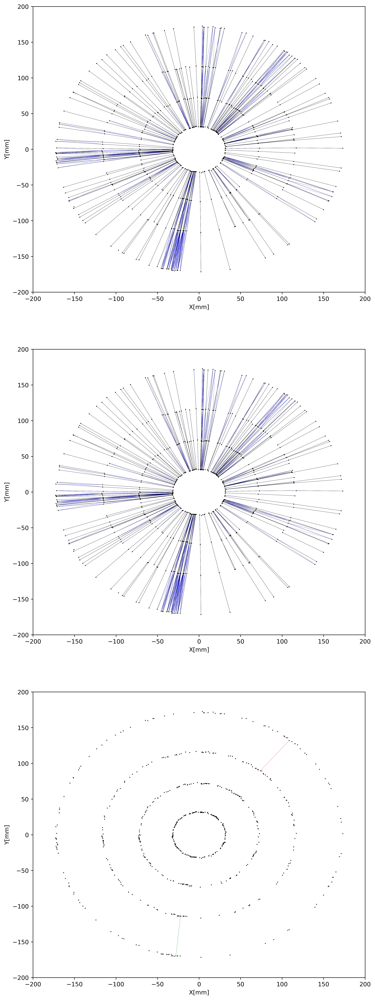

In [7]:
draw_sample(X_coordinate, 'X[mm]', -R_max, R_max, 
            Y_coordinate, 'Y[mm]', -R_max, R_max)

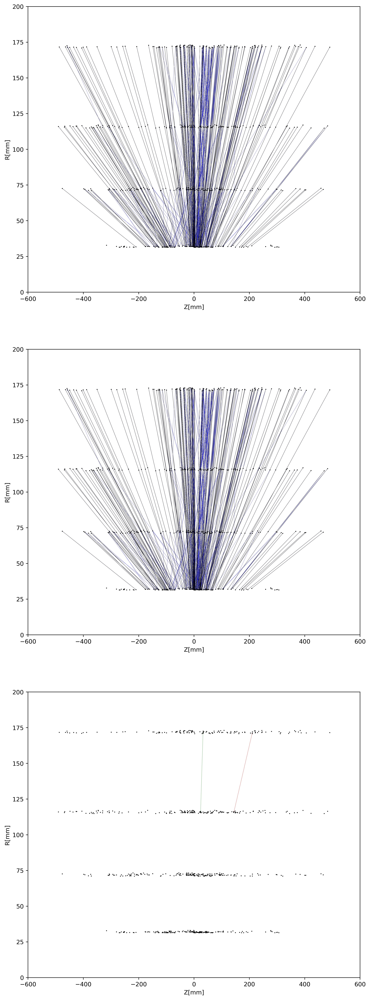

In [8]:
draw_sample(Z_coordinate, 'Z[mm]', -Z_max, Z_max, 
            R_coordinate, 'R[mm]', 0, R_max)

In [9]:
N_events = 8850
efficiency = 0
fake = 0

for i in range(N_events):
    fname = '/data/'+dataset+'/processed/data_'+str(i)+'.pt'
    print(fname)
    file_results = process_file(fname)
    efficiency = efficiency + file_results[0]
    fake = fake + file_results[1]
    print("Track Efficiency = " + str(efficiency/(i+1)))
    print("Fake Fraction = " + str(fake/(i+1)))

average_efficiency = efficiency / N_events
average_fake = fake / N_events

print("Average Track Efficiency is " + str(average_efficiency))
print("Average Fake Fraction is " + str(average_fake))

file = open(plot_prefix + 'efficiency.txt', 'w')
file.write('Average Track Efficiency is ' + str(average_efficiency) + '\n')
file.write('Average Fake Fraction is ' + str(average_fake) + '\n')
file.close()

/data/all_track_id/processed/data_0.pt


/home/markus/miniconda3/envs/hgcal-env/lib/python3.6/site-packages/ipykernel_launcher.py:24: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`



Track Efficiency = 0.9647887323943662
Fake Fraction = 0.035211267605633804
/data/all_track_id/processed/data_1.pt



Track Efficiency = 0.9668904902281908
Fake Fraction = 0.025479649550848398
/data/all_track_id/processed/data_2.pt



Track Efficiency = 0.9779269934854605
Fake Fraction = 0.01698643303389893
/data/all_track_id/processed/data_3.pt



Track Efficiency = 0.9678202451140954
Fake Fraction = 0.021668396203995625
/data/all_track_id/processed/data_4.pt



Track Efficiency = 0.9668487886838688
Fake Fraction = 0.021108301868856878
/data/all_track_id/processed/data_5.pt



Track Efficiency = 0.9691060167136816
Fake Fraction = 0.01978323401352108
/data/all_track_id/processed/data_6.pt



Track Efficiency = 0.9717448200048061
Fake Fraction = 0.018731680618510528
/data/all_track_id/processed/data_7.pt



Track Efficiency = 0.9722646693114342
Fake Fraction = 0.018662947813923986
/data/all_track_id/processed/data_8.pt



Track Efficiency = 0.9753463727212749
Fake Fraction = 0.01658928694571021
/data/all_track_id/processed/data_9.pt



Track Efficiency = 0.9778117354491475
Fake Fraction = 0.01547980880058974
/data/all_track_id/processed/data_10.pt



Track Efficiency = 0.978069319616527
Fake Fraction = 0.015253190999355489
/data/all_track_id/processed/data_11.pt



Track Efficiency = 0.9748767959938646
Fake Fraction = 0.0165700834678357
/data/all_track_id/processed/data_12.pt



Track Efficiency = 0.9737808825527859
Fake Fraction = 0.017141615508771416
/data/all_track_id/processed/data_13.pt



Track Efficiency = 0.9756536766561583
Fake Fraction = 0.01591721440100203
/data/all_track_id/processed/data_14.pt



Track Efficiency = 0.9767936730916416
Fake Fraction = 0.015339158561708173
/data/all_track_id/processed/data_15.pt



Track Efficiency = 0.9766815685234139
Fake Fraction = 0.015171600392107742
/data/all_track_id/processed/data_16.pt



Track Efficiency = 0.978053240963213
Fake Fraction = 0.014649112614695559
/data/all_track_id/processed/data_17.pt



Track Efficiency = 0.9775683472082696
Fake Fraction = 0.01487046971236085
/data/all_track_id/processed/data_18.pt



Track Efficiency = 0.9780377229597548
Fake Fraction = 0.014799050965053096
/data/all_track_id/processed/data_19.pt



Track Efficiency = 0.9766633093392395
Fake Fraction = 0.015735076070431727
/data/all_track_id/processed/data_20.pt



Track Efficiency = 0.9768158075522319
Fake Fraction = 0.015629287377245147
/data/all_track_id/processed/data_21.pt



Track Efficiency = 0.9778696344816759
Fake Fraction = 0.014918865223734005
/data/all_track_id/processed/data_22.pt



Track Efficiency = 0.9783233066158313
Fake Fraction = 0.014525973385361936
/data/all_track_id/processed/data_23.pt



Track Efficiency = 0.9778188445158474
Fake Fraction = 0.014495437137983352
/data/all_track_id/processed/data_24.pt



Track Efficiency = 0.9787060907352135
Fake Fraction = 0.013915619652464017
/data/all_track_id/processed/data_25.pt



Track Efficiency = 0.9790699211097581
Fake Fraction = 0.01360934124092236
/data/all_track_id/processed/data_26.pt



Track Efficiency = 0.9785398391890672
Fake Fraction = 0.013932011142052218
/data/all_track_id/processed/data_27.pt



Track Efficiency = 0.9787810634197097
Fake Fraction = 0.013698989580100619
/data/all_track_id/processed/data_28.pt



Track Efficiency = 0.9785680177750999
Fake Fraction = 0.013467748801235321
/data/all_track_id/processed/data_29.pt



Track Efficiency = 0.9788028008756421
Fake Fraction = 0.01326036973491395
/data/all_track_id/processed/data_30.pt



Track Efficiency = 0.979486581492557
Fake Fraction = 0.013445110768373238
/data/all_track_id/processed/data_31.pt



Track Efficiency = 0.9801276258209145
Fake Fraction = 0.013024951056861574
/data/all_track_id/processed/data_32.pt



Track Efficiency = 0.9807298189778566
Fake Fraction = 0.012630255570290011
/data/all_track_id/processed/data_33.pt



Track Efficiency = 0.9802682056265951
Fake Fraction = 0.012884559693066212
/data/all_track_id/processed/data_34.pt



Track Efficiency = 0.9800156446495086
Fake Fraction = 0.012930508091069704
/data/all_track_id/processed/data_35.pt



Track Efficiency = 0.9805707656314667
Fake Fraction = 0.012571327310762211
/data/all_track_id/processed/data_36.pt



Track Efficiency = 0.9802915042694837
Fake Fraction = 0.01272000195524503
/data/all_track_id/processed/data_37.pt



Track Efficiency = 0.9803957270124956
Fake Fraction = 0.012594120533699316
/data/all_track_id/processed/data_38.pt



Track Efficiency = 0.980121399901841
Fake Fraction = 0.012858393426650069
/data/all_track_id/processed/data_39.pt



Track Efficiency = 0.9803259672434763
Fake Fraction = 0.012829331251802531
/data/all_track_id/processed/data_40.pt



Track Efficiency = 0.9808058217009524
Fake Fraction = 0.012516420733465884
/data/all_track_id/processed/data_41.pt



Track Efficiency = 0.9805873784622098
Fake Fraction = 0.012728614797635065
/data/all_track_id/processed/data_42.pt



Track Efficiency = 0.9810388347770421
Fake Fraction = 0.012432600500015644
/data/all_track_id/processed/data_43.pt



Track Efficiency = 0.9810284640837422
Fake Fraction = 0.012591347664291546
/data/all_track_id/processed/data_44.pt



Track Efficiency = 0.9811107832024919
Fake Fraction = 0.012650810506696603
/data/all_track_id/processed/data_45.pt



Track Efficiency = 0.9812130618901961
Fake Fraction = 0.012684149347053647
/data/all_track_id/processed/data_46.pt



Track Efficiency = 0.9816127839776386
Fake Fraction = 0.012414273829031229
/data/all_track_id/processed/data_47.pt



Track Efficiency = 0.9818623039695575
Fake Fraction = 0.012289190132806752
/data/all_track_id/processed/data_48.pt



Track Efficiency = 0.9819820541201726
Fake Fraction = 0.01216436665063055
/data/all_track_id/processed/data_49.pt



Track Efficiency = 0.9823424130377691
Fake Fraction = 0.01192107931761794
/data/all_track_id/processed/data_50.pt



Track Efficiency = 0.9823133705079921
Fake Fraction = 0.011876780424111555
/data/all_track_id/processed/data_51.pt



Track Efficiency = 0.9804914588539353
Fake Fraction = 0.01296228428838748
/data/all_track_id/processed/data_52.pt



Track Efficiency = 0.9808595445359366
Fake Fraction = 0.012717712886719792
/data/all_track_id/processed/data_53.pt



Track Efficiency = 0.9812139974149007
Fake Fraction = 0.01248219968511387
/data/all_track_id/processed/data_54.pt



Track Efficiency = 0.9815555610982661
Fake Fraction = 0.012255250599929981
/data/all_track_id/processed/data_55.pt



Track Efficiency = 0.9818849260786543
Fake Fraction = 0.01219304844322697
/data/all_track_id/processed/data_56.pt



Track Efficiency = 0.9822027343930638
Fake Fraction = 0.011979135312644041
/data/all_track_id/processed/data_57.pt



Track Efficiency = 0.9822578848320458
Fake Fraction = 0.011899373344778981
/data/all_track_id/processed/data_58.pt



Track Efficiency = 0.9825585986484517
Fake Fraction = 0.011697689050799678
/data/all_track_id/processed/data_59.pt



Track Efficiency = 0.9826543568970985
Fake Fraction = 0.011600766782305956
/data/all_track_id/processed/data_60.pt



Track Efficiency = 0.982938711702064
Fake Fraction = 0.01141059027767799
/data/all_track_id/processed/data_61.pt



Track Efficiency = 0.9832138937713856
Fake Fraction = 0.011226548499005765
/data/all_track_id/processed/data_62.pt



Track Efficiency = 0.9832215407301559
Fake Fraction = 0.011307148488324512
/data/all_track_id/processed/data_63.pt



Track Efficiency = 0.9825567973765862
Fake Fraction = 0.011803965672504788
/data/all_track_id/processed/data_64.pt



Track Efficiency = 0.9828251543400234
Fake Fraction = 0.011622366200620099
/data/all_track_id/processed/data_65.pt



Track Efficiency = 0.9829028308989459
Fake Fraction = 0.011538097107589584
/data/all_track_id/processed/data_66.pt



Track Efficiency = 0.9831580125273199
Fake Fraction = 0.011365886702998694
/data/all_track_id/processed/data_67.pt



Track Efficiency = 0.9834056888136828
Fake Fraction = 0.011198741310307537
/data/all_track_id/processed/data_68.pt



Track Efficiency = 0.9836461860772526
Fake Fraction = 0.011036440711607427
/data/all_track_id/processed/data_69.pt



Track Efficiency = 0.9838798119904347
Fake Fraction = 0.010878777272870179
/data/all_track_id/processed/data_70.pt



Track Efficiency = 0.984106856891978
Fake Fraction = 0.010725555057759332
/data/all_track_id/processed/data_71.pt



Track Efficiency = 0.9839098840466737
Fake Fraction = 0.010892245580947016
/data/all_track_id/processed/data_72.pt



Track Efficiency = 0.9838303265909799
Fake Fraction = 0.010944487180563374
/data/all_track_id/processed/data_73.pt



Track Efficiency = 0.9838360244546686
Fake Fraction = 0.011009399941583639
/data/all_track_id/processed/data_74.pt



Track Efficiency = 0.9840515441286063
Fake Fraction = 0.010862607942362525
/data/all_track_id/processed/data_75.pt



Track Efficiency = 0.9842613922321772
Fake Fraction = 0.010719678890489333
/data/all_track_id/processed/data_76.pt



Track Efficiency = 0.9844657897356555
Fake Fraction = 0.010580462281521938
/data/all_track_id/processed/data_77.pt



Track Efficiency = 0.9845663269481175
Fake Fraction = 0.010543434658583295
/data/all_track_id/processed/data_78.pt



Track Efficiency = 0.9837009445477418
Fake Fraction = 0.010928146530178696
/data/all_track_id/processed/data_79.pt



Track Efficiency = 0.983904682740895
Fake Fraction = 0.010791544698551462
/data/all_track_id/processed/data_80.pt



Track Efficiency = 0.9835835722977001
Fake Fraction = 0.010923814225039541
/data/all_track_id/processed/data_81.pt



Track Efficiency = 0.983783772635533
Fake Fraction = 0.010790596978392719
/data/all_track_id/processed/data_82.pt



Track Efficiency = 0.9836026428447434
Fake Fraction = 0.01088935293976331
/data/all_track_id/processed/data_83.pt



Track Efficiency = 0.9837174118971065
Fake Fraction = 0.01084015536615609
/data/all_track_id/processed/data_84.pt



Track Efficiency = 0.9838363501158914
Fake Fraction = 0.010785245767803346
/data/all_track_id/processed/data_85.pt



Track Efficiency = 0.9840242995331485
Fake Fraction = 0.010659835933294006
/data/all_track_id/processed/data_86.pt



Track Efficiency = 0.9842079282741468
Fake Fraction = 0.010537309083486029
/data/all_track_id/processed/data_87.pt



Track Efficiency = 0.9840802583275425
Fake Fraction = 0.010649477881006711
/data/all_track_id/processed/data_88.pt



Track Efficiency = 0.9841122565999876
Fake Fraction = 0.01060374158311249
/data/all_track_id/processed/data_89.pt



Track Efficiency = 0.9841425882518007
Fake Fraction = 0.010559505749481144
/data/all_track_id/processed/data_90.pt



Track Efficiency = 0.9839098451167585
Fake Fraction = 0.010609967391261738
/data/all_track_id/processed/data_91.pt



Track Efficiency = 0.9840847381046198
Fake Fraction = 0.010494641658748024
/data/all_track_id/processed/data_92.pt



Track Efficiency = 0.9840720633175376
Fake Fraction = 0.010565602684933713
/data/all_track_id/processed/data_93.pt



Track Efficiency = 0.9842415094524575
Fake Fraction = 0.010453202656370588
/data/all_track_id/processed/data_94.pt



Track Efficiency = 0.9842559305191828
Fake Fraction = 0.010419446594846627
/data/all_track_id/processed/data_95.pt



Track Efficiency = 0.9838227974849795
Fake Fraction = 0.010651324636172096
/data/all_track_id/processed/data_96.pt



Track Efficiency = 0.9839895727686395
Fake Fraction = 0.010608028638925225
/data/all_track_id/processed/data_97.pt



Track Efficiency = 0.984152944475082
Fake Fraction = 0.010499783448732111
/data/all_track_id/processed/data_98.pt



Track Efficiency = 0.9843130157430104
Fake Fraction = 0.01039372503005805
/data/all_track_id/processed/data_99.pt



Track Efficiency = 0.9839177383463165
Fake Fraction = 0.010724570388453121
/data/all_track_id/processed/data_100.pt



Track Efficiency = 0.9839422613114335
Fake Fraction = 0.010686201523899062
/data/all_track_id/processed/data_101.pt



Track Efficiency = 0.9837052794842873
Fake Fraction = 0.010810766340973553
/data/all_track_id/processed/data_102.pt



Track Efficiency = 0.9836028433962468
Fake Fraction = 0.01083789911607935
/data/all_track_id/processed/data_103.pt



Track Efficiency = 0.9837605083635906
Fake Fraction = 0.010733688547655511
/data/all_track_id/processed/data_104.pt



Track Efficiency = 0.9837050861550859
Fake Fraction = 0.010841546976053188
/data/all_track_id/processed/data_105.pt



Track Efficiency = 0.9835845686683223
Fake Fraction = 0.01090574991801051
/data/all_track_id/processed/data_106.pt



Track Efficiency = 0.9837379839144127
Fake Fraction = 0.010803827021580505
/data/all_track_id/processed/data_107.pt



Track Efficiency = 0.9838885581374274
Fake Fraction = 0.0107037915861955
/data/all_track_id/processed/data_108.pt



Track Efficiency = 0.9839140453716406
Fake Fraction = 0.010667164226652178
/data/all_track_id/processed/data_109.pt



Track Efficiency = 0.9838682198631404
Fake Fraction = 0.010699139071529163
/data/all_track_id/processed/data_110.pt



Track Efficiency = 0.9838820328360313
Fake Fraction = 0.010668993144546654
/data/all_track_id/processed/data_111.pt



Track Efficiency = 0.9839183701073962
Fake Fraction = 0.010627846831297184
/data/all_track_id/processed/data_112.pt



Track Efficiency = 0.9840606854161803
Fake Fraction = 0.010533795089427297
/data/all_track_id/processed/data_113.pt



Track Efficiency = 0.9840190157618944
Fake Fraction = 0.010563225736790995
/data/all_track_id/processed/data_114.pt



Track Efficiency = 0.9837309622086854
Fake Fraction = 0.010670813163571193
/data/all_track_id/processed/data_115.pt



Track Efficiency = 0.9834083567140607
Fake Fraction = 0.010874052492699593
/data/all_track_id/processed/data_116.pt



Track Efficiency = 0.9832652653461342
Fake Fraction = 0.010973179480901816
/data/all_track_id/processed/data_117.pt



Track Efficiency = 0.9834070851313366
Fake Fraction = 0.010880186434453496
/data/all_track_id/processed/data_118.pt



Track Efficiency = 0.9832694875002578
Fake Fraction = 0.010975497659560796
/data/all_track_id/processed/data_119.pt



Track Efficiency = 0.983287253936539
Fake Fraction = 0.011005689680281
/data/all_track_id/processed/data_120.pt



Track Efficiency = 0.9834253758048321
Fake Fraction = 0.010914733567220827
/data/all_track_id/processed/data_121.pt



Track Efficiency = 0.9835612333802024
Fake Fraction = 0.010825268537981311
/data/all_track_id/processed/data_122.pt



Track Efficiency = 0.9834823307441871
Fake Fraction = 0.01084494142070165
/data/all_track_id/processed/data_123.pt



Track Efficiency = 0.9835043030490866
Fake Fraction = 0.010868716920924022
/data/all_track_id/processed/data_124.pt



Track Efficiency = 0.9835747301631554
Fake Fraction = 0.010843305647095092
/data/all_track_id/processed/data_125.pt



Track Efficiency = 0.9837050894475748
Fake Fraction = 0.01075724766576894
/data/all_track_id/processed/data_126.pt



Track Efficiency = 0.9837355819696534
Fake Fraction = 0.010770358788467193
/data/all_track_id/processed/data_127.pt



Track Efficiency = 0.9836809616890039
Fake Fraction = 0.010867901406943922
/data/all_track_id/processed/data_128.pt



Track Efficiency = 0.9837208520297283
Fake Fraction = 0.01082720432261172
/data/all_track_id/processed/data_129.pt



Track Efficiency = 0.9837528361516441
Fake Fraction = 0.010790822450711704
/data/all_track_id/processed/data_130.pt



Track Efficiency = 0.9837372215021901
Fake Fraction = 0.01084808856121642
/data/all_track_id/processed/data_131.pt



Track Efficiency = 0.9837392122483858
Fake Fraction = 0.010887118193328415
/data/all_track_id/processed/data_132.pt



Track Efficiency = 0.9837943416944236
Fake Fraction = 0.010872392277803927
/data/all_track_id/processed/data_133.pt



Track Efficiency = 0.9838086696348703
Fake Fraction = 0.010950035587258232
/data/all_track_id/processed/data_134.pt



Track Efficiency = 0.9836306062667789
Fake Fraction = 0.011042196900430372
/data/all_track_id/processed/data_135.pt



Track Efficiency = 0.9836509294399874
Fake Fraction = 0.011110050381090959
/data/all_track_id/processed/data_136.pt



Track Efficiency = 0.9837195763459404
Fake Fraction = 0.011079644498341713
/data/all_track_id/processed/data_137.pt



Track Efficiency = 0.9838375504303901
Fake Fraction = 0.010999357219368223
/data/all_track_id/processed/data_138.pt



Track Efficiency = 0.983613558720119
Fake Fraction = 0.01111868707316091
/data/all_track_id/processed/data_139.pt



Track Efficiency = 0.983730604729261
Fake Fraction = 0.011039267879781189
/data/all_track_id/processed/data_140.pt



Track Efficiency = 0.9837345947220837
Fake Fraction = 0.011035629921693902
/data/all_track_id/processed/data_141.pt



Track Efficiency = 0.9837399576045409
Fake Fraction = 0.011012931823653805
/data/all_track_id/processed/data_142.pt



Track Efficiency = 0.9837683836216337
Fake Fraction = 0.011021198887482936
/data/all_track_id/processed/data_143.pt



Track Efficiency = 0.9838811031798167
Fake Fraction = 0.010944662784097637
/data/all_track_id/processed/data_144.pt



Track Efficiency = 0.9839922679854731
Fake Fraction = 0.010869182351103861
/data/all_track_id/processed/data_145.pt



Track Efficiency = 0.9841019099855727
Fake Fraction = 0.010794735896644245
/data/all_track_id/processed/data_146.pt



Track Efficiency = 0.9840333662035345
Fake Fraction = 0.010810811807121781
/data/all_track_id/processed/data_147.pt



Track Efficiency = 0.9839481986712713
Fake Fraction = 0.010835689792365474
/data/all_track_id/processed/data_148.pt



Track Efficiency = 0.9839440720582648
Fake Fraction = 0.010819365440366631
/data/all_track_id/processed/data_149.pt



Track Efficiency = 0.9838942488327783
Fake Fraction = 0.010826601416795933
/data/all_track_id/processed/data_150.pt



Track Efficiency = 0.9838932262404975
Fake Fraction = 0.010862585265702093
/data/all_track_id/processed/data_151.pt



Track Efficiency = 0.9839991918573363
Fake Fraction = 0.010791120888954052
/data/all_track_id/processed/data_152.pt



Track Efficiency = 0.9839929935279265
Fake Fraction = 0.010794862820161127
/data/all_track_id/processed/data_153.pt



Track Efficiency = 0.9840373616743255
Fake Fraction = 0.01084283006276929
/data/all_track_id/processed/data_154.pt



Track Efficiency = 0.984140346437717
Fake Fraction = 0.010824905456745179
/data/all_track_id/processed/data_155.pt



Track Efficiency = 0.9839182605598787
Fake Fraction = 0.010985626805723967
/data/all_track_id/processed/data_156.pt



Track Efficiency = 0.9837972033633302
Fake Fraction = 0.01106641032322416
/data/all_track_id/processed/data_157.pt



Track Efficiency = 0.9836784550194797
Fake Fraction = 0.01113103174994224
/data/all_track_id/processed/data_158.pt



Track Efficiency = 0.9836653521075619
Fake Fraction = 0.011138671040900753
/data/all_track_id/processed/data_159.pt



Track Efficiency = 0.9837674436568896
Fake Fraction = 0.011069054346895122
/data/all_track_id/processed/data_160.pt



Track Efficiency = 0.9837688881062258
Fake Fraction = 0.011099681338529314
/data/all_track_id/processed/data_161.pt



Track Efficiency = 0.9837295809570732
Fake Fraction = 0.011136383642275767
/data/all_track_id/processed/data_162.pt



Track Efficiency = 0.9837470508972632
Fake Fraction = 0.011109514765677491
/data/all_track_id/processed/data_163.pt



Track Efficiency = 0.9838461542454506
Fake Fraction = 0.011041773821984336
/data/all_track_id/processed/data_164.pt



Track Efficiency = 0.9838610343401025
Fake Fraction = 0.011016651263815569
/data/all_track_id/processed/data_165.pt



Track Efficiency = 0.9838435123317427
Fake Fraction = 0.011008209898463576
/data/all_track_id/processed/data_166.pt



Track Efficiency = 0.9837703847469643
Fake Fraction = 0.011028451091937645
/data/all_track_id/processed/data_167.pt



Track Efficiency = 0.983866989599661
Fake Fraction = 0.01096280554972373
/data/all_track_id/processed/data_168.pt



Track Efficiency = 0.983962451199663
Fake Fraction = 0.010897936877831874
/data/all_track_id/processed/data_169.pt



Track Efficiency = 0.9836396015701615
Fake Fraction = 0.01105009434256435
/data/all_track_id/processed/data_170.pt



Track Efficiency = 0.9835429095326628
Fake Fraction = 0.011102432972139998
/data/all_track_id/processed/data_171.pt



Track Efficiency = 0.9835572762563913
Fake Fraction = 0.011078827277657362
/data/all_track_id/processed/data_172.pt



Track Efficiency = 0.9836523209023081
Fake Fraction = 0.01101478781362466
/data/all_track_id/processed/data_173.pt



Track Efficiency = 0.9836368040060441
Fake Fraction = 0.011006745266508338
/data/all_track_id/processed/data_174.pt



Track Efficiency = 0.9837303079831525
Fake Fraction = 0.010943849579271149
/data/all_track_id/processed/data_175.pt



Track Efficiency = 0.9838227494150664
Fake Fraction = 0.010881668615752562
/data/all_track_id/processed/data_176.pt



Track Efficiency = 0.9839141463110265
Fake Fraction = 0.010820190261991249
/data/all_track_id/processed/data_177.pt



Track Efficiency = 0.9838107929125336
Fake Fraction = 0.01085796368551446
/data/all_track_id/processed/data_178.pt



Track Efficiency = 0.9836863664802762
Fake Fraction = 0.010977517321439681
/data/all_track_id/processed/data_179.pt



Track Efficiency = 0.9835493110745115
Fake Fraction = 0.011009901795704324
/data/all_track_id/processed/data_180.pt



Track Efficiency = 0.9835054461298874
Fake Fraction = 0.01099473362451213
/data/all_track_id/processed/data_181.pt



Track Efficiency = 0.9835186881454251
Fake Fraction = 0.011011710401532688
/data/all_track_id/processed/data_182.pt



Track Efficiency = 0.9835400143503561
Fake Fraction = 0.01102027272913197
/data/all_track_id/processed/data_183.pt



Track Efficiency = 0.9836294707941041
Fake Fraction = 0.010998121488454322
/data/all_track_id/processed/data_184.pt



Track Efficiency = 0.9835971689589192
Fake Fraction = 0.011029774521404674
/data/all_track_id/processed/data_185.pt



Track Efficiency = 0.9835173454698929
Fake Fraction = 0.011055813453402584
/data/all_track_id/processed/data_186.pt



Track Efficiency = 0.9835327316322097
Fake Fraction = 0.011069447831602948
/data/all_track_id/processed/data_187.pt



Track Efficiency = 0.9834430185206908
Fake Fraction = 0.011100722856660234
/data/all_track_id/processed/data_188.pt



Track Efficiency = 0.9835306215973009
Fake Fraction = 0.011041988873291662
/data/all_track_id/processed/data_189.pt



Track Efficiency = 0.9833884695843174
Fake Fraction = 0.011117117646043825
/data/all_track_id/processed/data_190.pt



Track Efficiency = 0.9833967100891903
Fake Fraction = 0.011098576493843375
/data/all_track_id/processed/data_191.pt



Track Efficiency = 0.9833035878563262
Fake Fraction = 0.011150037142203674
/data/all_track_id/processed/data_192.pt



Track Efficiency = 0.9833900977638064
Fake Fraction = 0.011092264929031634
/data/all_track_id/processed/data_193.pt



Track Efficiency = 0.9833335188738045
Fake Fraction = 0.011107181161284122
/data/all_track_id/processed/data_194.pt



Track Efficiency = 0.983418988007785
Fake Fraction = 0.011050221257892921
/data/all_track_id/processed/data_195.pt



Track Efficiency = 0.9834219523546841
Fake Fraction = 0.011034988068459959
/data/all_track_id/processed/data_196.pt



Track Efficiency = 0.9835061048808025
Fake Fraction = 0.010978972900599756
/data/all_track_id/processed/data_197.pt



Track Efficiency = 0.9835278158563984
Fake Fraction = 0.010985115067522078
/data/all_track_id/processed/data_198.pt



Track Efficiency = 0.9834616980398857
Fake Fraction = 0.011078806095472368
/data/all_track_id/processed/data_199.pt



Track Efficiency = 0.9835159804587772
Fake Fraction = 0.011051821155904099
/data/all_track_id/processed/data_200.pt



Track Efficiency = 0.9834578461575668
Fake Fraction = 0.011102690681221395
/data/all_track_id/processed/data_201.pt



Track Efficiency = 0.983539738008272
Fake Fraction = 0.011047726865967824
/data/all_track_id/processed/data_202.pt



Track Efficiency = 0.9835678541354625
Fake Fraction = 0.01107233304272987
/data/all_track_id/processed/data_203.pt



Track Efficiency = 0.9836094994194235
Fake Fraction = 0.011056961351032703
/data/all_track_id/processed/data_204.pt



Track Efficiency = 0.9836894530807921
Fake Fraction = 0.011003024954198398
/data/all_track_id/processed/data_205.pt



Track Efficiency = 0.9836715431143805
Fake Fraction = 0.010998646241318842
/data/all_track_id/processed/data_206.pt



Track Efficiency = 0.9837504245486105
Fake Fraction = 0.010945512684597496
/data/all_track_id/processed/data_207.pt



Track Efficiency = 0.9838285475075115
Fake Fraction = 0.010892890027460007
/data/all_track_id/processed/data_208.pt



Track Efficiency = 0.9838394688644665
Fake Fraction = 0.010874230300022434
/data/all_track_id/processed/data_209.pt



Track Efficiency = 0.9838699661672026
Fake Fraction = 0.010891796378575264
/data/all_track_id/processed/data_210.pt



Track Efficiency = 0.9839464118251778
Fake Fraction = 0.010840176490525145
/data/all_track_id/processed/data_211.pt



Track Efficiency = 0.9839258713766379
Fake Fraction = 0.010885308503613732
/data/all_track_id/processed/data_212.pt



Track Efficiency = 0.9840013367692358
Fake Fraction = 0.010834203768854982
/data/all_track_id/processed/data_213.pt



Track Efficiency = 0.9840760968777907
Fake Fraction = 0.010783576648439772
/data/all_track_id/processed/data_214.pt



Track Efficiency = 0.9840001240340982
Fake Fraction = 0.01082461974838775
/data/all_track_id/processed/data_215.pt



Track Efficiency = 0.9840741975339403
Fake Fraction = 0.01077450576807114
/data/all_track_id/processed/data_216.pt



Track Efficiency = 0.9841475883287147
Fake Fraction = 0.010724853667757448
/data/all_track_id/processed/data_217.pt



Track Efficiency = 0.9842203058134454
Fake Fraction = 0.010675657091299844
/data/all_track_id/processed/data_218.pt



Track Efficiency = 0.9842923592115576
Fake Fraction = 0.010626909798645508
/data/all_track_id/processed/data_219.pt



Track Efficiency = 0.9841831434908789
Fake Fraction = 0.01070063128857845
/data/all_track_id/processed/data_220.pt



Track Efficiency = 0.9841175951931689
Fake Fraction = 0.010744556772636039
/data/all_track_id/processed/data_221.pt



Track Efficiency = 0.9841079753138392
Fake Fraction = 0.010737107909204837
/data/all_track_id/processed/data_222.pt



Track Efficiency = 0.9840604504638886
Fake Fraction = 0.010778645541898986
/data/all_track_id/processed/data_223.pt



Track Efficiency = 0.9841029919510575
Fake Fraction = 0.010759143804704153
/data/all_track_id/processed/data_224.pt



Track Efficiency = 0.9840659012124199
Fake Fraction = 0.010819069495538465
/data/all_track_id/processed/data_225.pt



Track Efficiency = 0.9840781853011399
Fake Fraction = 0.010829418279792022
/data/all_track_id/processed/data_226.pt



Track Efficiency = 0.9838649444611344
Fake Fraction = 0.010940938808573787
/data/all_track_id/processed/data_227.pt



Track Efficiency = 0.9839086383911023
Fake Fraction = 0.010920026092335187
/data/all_track_id/processed/data_228.pt



Track Efficiency = 0.9837862528651201
Fake Fraction = 0.010970839912794175
/data/all_track_id/processed/data_229.pt



Track Efficiency = 0.9838567474178804
Fake Fraction = 0.010954196509446623
/data/all_track_id/processed/data_230.pt



Track Efficiency = 0.9837610412986679
Fake Fraction = 0.011026361500281336
/data/all_track_id/processed/data_231.pt



Track Efficiency = 0.9837746924334804
Fake Fraction = 0.011007191611781937
/data/all_track_id/processed/data_232.pt



Track Efficiency = 0.9838443289466414
Fake Fraction = 0.010959950446066135
/data/all_track_id/processed/data_233.pt



Track Efficiency = 0.9837668501294091
Fake Fraction = 0.010987650916233016
/data/all_track_id/processed/data_234.pt



Track Efficiency = 0.9838063765354778
Fake Fraction = 0.010970445782310512
/data/all_track_id/processed/data_235.pt



Track Efficiency = 0.9838055298441285
Fake Fraction = 0.010958979752766475
/data/all_track_id/processed/data_236.pt



Track Efficiency = 0.9838738609418326
Fake Fraction = 0.010912739331868726
/data/all_track_id/processed/data_237.pt



Track Efficiency = 0.9839416178286315
Fake Fraction = 0.010866887485936505
/data/all_track_id/processed/data_238.pt



Track Efficiency = 0.9840088077121938
Fake Fraction = 0.010862439929797137
/data/all_track_id/processed/data_239.pt



Track Efficiency = 0.9840754376800597
Fake Fraction = 0.010860135089883462
/data/all_track_id/processed/data_240.pt



Track Efficiency = 0.9839599794324246
Fake Fraction = 0.01094638170619205
/data/all_track_id/processed/data_241.pt



Track Efficiency = 0.9838773512693318
Fake Fraction = 0.011013845944070295
/data/all_track_id/processed/data_242.pt



Track Efficiency = 0.9838767853686282
Fake Fraction = 0.011002252838586366
/data/all_track_id/processed/data_243.pt



Track Efficiency = 0.9838290207655692
Fake Fraction = 0.011026235132626051
/data/all_track_id/processed/data_244.pt



Track Efficiency = 0.9838049887480387
Fake Fraction = 0.011041698723165596
/data/all_track_id/processed/data_245.pt



Track Efficiency = 0.9837060231818249
Fake Fraction = 0.011135080457795724
/data/all_track_id/processed/data_246.pt



Track Efficiency = 0.9836323843891022
Fake Fraction = 0.011174934468003111
/data/all_track_id/processed/data_247.pt



Track Efficiency = 0.9835476442199118
Fake Fraction = 0.01120667916388866
/data/all_track_id/processed/data_248.pt



Track Efficiency = 0.9835478808189365
Fake Fraction = 0.011194863033953032
/data/all_track_id/processed/data_249.pt



Track Efficiency = 0.9835176892956607
Fake Fraction = 0.011182603907020474
/data/all_track_id/processed/data_250.pt



Track Efficiency = 0.983502869735909
Fake Fraction = 0.011178705411903472
/data/all_track_id/processed/data_251.pt



Track Efficiency = 0.9834732865393047
Fake Fraction = 0.011206060902953958
/data/all_track_id/processed/data_252.pt



Track Efficiency = 0.983443747857331
Fake Fraction = 0.011225519287756768
/data/all_track_id/processed/data_253.pt



Track Efficiency = 0.9835089299523809
Fake Fraction = 0.011181324329930954
/data/all_track_id/processed/data_254.pt



Track Efficiency = 0.9835242729080492
Fake Fraction = 0.011162296053829462
/data/all_track_id/processed/data_255.pt



Track Efficiency = 0.9835886312170021
Fake Fraction = 0.01111869333486919
/data/all_track_id/processed/data_256.pt



Track Efficiency = 0.983525606598834
Fake Fraction = 0.011160947531924259
/data/all_track_id/processed/data_257.pt



Track Efficiency = 0.9834825375542783
Fake Fraction = 0.011171897401901353
/data/all_track_id/processed/data_258.pt



Track Efficiency = 0.9834453702631433
Fake Fraction = 0.011229703940309737
/data/all_track_id/processed/data_259.pt



Track Efficiency = 0.9835090419159773
Fake Fraction = 0.011186512771308546
/data/all_track_id/processed/data_260.pt



Track Efficiency = 0.9832690199521327
Fake Fraction = 0.011369030076444393
/data/all_track_id/processed/data_261.pt



Track Efficiency = 0.9831319947654934
Fake Fraction = 0.011443076643974112
/data/all_track_id/processed/data_262.pt



Track Efficiency = 0.9831961316675258
Fake Fraction = 0.011399566846848733
/data/all_track_id/processed/data_263.pt



Track Efficiency = 0.9831716924795675
Fake Fraction = 0.011400949949255947
/data/all_track_id/processed/data_264.pt



Track Efficiency = 0.9832137547034867
Fake Fraction = 0.011379368319944861
/data/all_track_id/processed/data_265.pt



Track Efficiency = 0.9832426845388462
Fake Fraction = 0.011370765089760516
/data/all_track_id/processed/data_266.pt



Track Efficiency = 0.9832662280267588
Fake Fraction = 0.011347890156445821
/data/all_track_id/processed/data_267.pt



Track Efficiency = 0.9832729757836205
Fake Fraction = 0.01134286071556356
/data/all_track_id/processed/data_268.pt



Track Efficiency = 0.9832483012045687
Fake Fraction = 0.011370505630089362
/data/all_track_id/processed/data_269.pt



Track Efficiency = 0.9833103445334408
Fake Fraction = 0.011328392646274216
/data/all_track_id/processed/data_270.pt



Track Efficiency = 0.9833199576272574
Fake Fraction = 0.011338562810097019
/data/all_track_id/processed/data_271.pt



Track Efficiency = 0.9832791571294448
Fake Fraction = 0.011348658193303477
/data/all_track_id/processed/data_272.pt



Track Efficiency = 0.9832640930618156
Fake Fraction = 0.011345645950066005
/data/all_track_id/processed/data_273.pt



Track Efficiency = 0.983270700849421
Fake Fraction = 0.011331679348031023
/data/all_track_id/processed/data_274.pt



Track Efficiency = 0.9832541652254425
Fake Fraction = 0.011342421293258962
/data/all_track_id/processed/data_275.pt



Track Efficiency = 0.9832858530325969
Fake Fraction = 0.011330311071181936
/data/all_track_id/processed/data_276.pt



Track Efficiency = 0.983187257327668
Fake Fraction = 0.011359280485039322
/data/all_track_id/processed/data_277.pt



Track Efficiency = 0.9832477348192952
Fake Fraction = 0.011318419763870116
/data/all_track_id/processed/data_278.pt



Track Efficiency = 0.9832821771420114
Fake Fraction = 0.011303453589601251
/data/all_track_id/processed/data_279.pt



Track Efficiency = 0.983192183053416
Fake Fraction = 0.011350192126432816
/data/all_track_id/processed/data_280.pt



Track Efficiency = 0.983040397848744
Fake Fraction = 0.011409205538416522
/data/all_track_id/processed/data_281.pt



Track Efficiency = 0.9831005382819045
Fake Fraction = 0.011368747362748378
/data/all_track_id/processed/data_282.pt



Track Efficiency = 0.9831602536943359
Fake Fraction = 0.011357303313059562
/data/all_track_id/processed/data_283.pt



Track Efficiency = 0.9831773793929327
Fake Fraction = 0.011359481991197351
/data/all_track_id/processed/data_284.pt



Track Efficiency = 0.9831232199406201
Fake Fraction = 0.011405203962815743
/data/all_track_id/processed/data_285.pt



Track Efficiency = 0.9831093858382637
Fake Fraction = 0.011438169450125244
/data/all_track_id/processed/data_286.pt



Track Efficiency = 0.983168238152416
Fake Fraction = 0.011398315201170104
/data/all_track_id/processed/data_287.pt



Track Efficiency = 0.9831970046569319
Fake Fraction = 0.011358737717832709
/data/all_track_id/processed/data_288.pt



Track Efficiency = 0.983196991759541
Fake Fraction = 0.011348757920439469
/data/all_track_id/processed/data_289.pt



Track Efficiency = 0.9832076965116218
Fake Fraction = 0.011333405485279807
/data/all_track_id/processed/data_290.pt



Track Efficiency = 0.9832387630597451
Fake Fraction = 0.011321098036823506
/data/all_track_id/processed/data_291.pt



Track Efficiency = 0.9832961645561159
Fake Fraction = 0.011282327153135754
/data/all_track_id/processed/data_292.pt



Track Efficiency = 0.983312054121552
Fake Fraction = 0.011284941028964931
/data/all_track_id/processed/data_293.pt



Track Efficiency = 0.9833482015358984
Fake Fraction = 0.011267171182133778
/data/all_track_id/processed/data_294.pt



Track Efficiency = 0.9832734290648636
Fake Fraction = 0.011339036813609704
/data/all_track_id/processed/data_295.pt



Track Efficiency = 0.9832783594546021
Fake Fraction = 0.011352307552660073
/data/all_track_id/processed/data_296.pt



Track Efficiency = 0.9832891612291204
Fake Fraction = 0.011336989079716555
/data/all_track_id/processed/data_297.pt



Track Efficiency = 0.9833452378692911
Fake Fraction = 0.011298945492200728
/data/all_track_id/processed/data_298.pt



Track Efficiency = 0.9833572207010832
Fake Fraction = 0.011283159545298455
/data/all_track_id/processed/data_299.pt



Track Efficiency = 0.983354217099916
Fake Fraction = 0.01127504753855454
/data/all_track_id/processed/data_300.pt



Track Efficiency = 0.983341253105546
Fake Fraction = 0.011283413172806105
/data/all_track_id/processed/data_301.pt



Track Efficiency = 0.9833964145191038
Fake Fraction = 0.011246050877531914
/data/all_track_id/processed/data_302.pt



Track Efficiency = 0.9834047283093303
Fake Fraction = 0.011232341794046858
/data/all_track_id/processed/data_303.pt



Track Efficiency = 0.9834593180188391
Fake Fraction = 0.011195393301303282
/data/all_track_id/processed/data_304.pt



Track Efficiency = 0.9835135497630396
Fake Fraction = 0.011158687093758026
/data/all_track_id/processed/data_305.pt



Track Efficiency = 0.9835138537094907
Fake Fraction = 0.011175794137971073
/data/all_track_id/processed/data_306.pt



Track Efficiency = 0.9835481656487027
Fake Fraction = 0.011158779762773711
/data/all_track_id/processed/data_307.pt



Track Efficiency = 0.9835049511343825
Fake Fraction = 0.011181226221844661
/data/all_track_id/processed/data_308.pt



Track Efficiency = 0.9835178800951128
Fake Fraction = 0.011165394771858435
/data/all_track_id/processed/data_309.pt



Track Efficiency = 0.9835710482238382
Fake Fraction = 0.01112937736936857
/data/all_track_id/processed/data_310.pt



Track Efficiency = 0.9835836815092921
Fake Fraction = 0.011113814445917549
/data/all_track_id/processed/data_311.pt



Track Efficiency = 0.9836362979147111
Fake Fraction = 0.011078193245770376
/data/all_track_id/processed/data_312.pt



Track Efficiency = 0.9835992106115584
Fake Fraction = 0.011088117219947213
/data/all_track_id/processed/data_313.pt



Track Efficiency = 0.9836280254147813
Fake Fraction = 0.0110762217548406
/data/all_track_id/processed/data_314.pt



Track Efficiency = 0.9835605256242513
Fake Fraction = 0.01112732553670929
/data/all_track_id/processed/data_315.pt



Track Efficiency = 0.9836125492773391
Fake Fraction = 0.011092112481213374
/data/all_track_id/processed/data_316.pt



Track Efficiency = 0.9836240590477474
Fake Fraction = 0.011077343219159883
/data/all_track_id/processed/data_317.pt



Track Efficiency = 0.9835945079316342
Fake Fraction = 0.011091644026646802
/data/all_track_id/processed/data_318.pt



Track Efficiency = 0.9836092715229683
Fake Fraction = 0.011075313960548148
/data/all_track_id/processed/data_319.pt



Track Efficiency = 0.9835929249818914
Fake Fraction = 0.011091654691377958
/data/all_track_id/processed/data_320.pt



Track Efficiency = 0.9836440373651254
Fake Fraction = 0.011057101249971795
/data/all_track_id/processed/data_321.pt



Track Efficiency = 0.9836948322801405
Fake Fraction = 0.011022762426214118
/data/all_track_id/processed/data_322.pt



Track Efficiency = 0.9837453126755581
Fake Fraction = 0.010988636226752155
/data/all_track_id/processed/data_323.pt



Track Efficiency = 0.9837158319215814
Fake Fraction = 0.011014845742967487
/data/all_track_id/processed/data_324.pt



Track Efficiency = 0.9836439445092303
Fake Fraction = 0.011076680405638698
/data/all_track_id/processed/data_325.pt



Track Efficiency = 0.983660033295671
Fake Fraction = 0.01105983964420659
/data/all_track_id/processed/data_326.pt



Track Efficiency = 0.9837100026128096
Fake Fraction = 0.011026017504621859
/data/all_track_id/processed/data_327.pt



Track Efficiency = 0.9835910710829824
Fake Fraction = 0.011093068877853282
/data/all_track_id/processed/data_328.pt



Track Efficiency = 0.9835998717377044
Fake Fraction = 0.011080028307064777
/data/all_track_id/processed/data_329.pt



Track Efficiency = 0.983546497564432
Fake Fraction = 0.011109148388474925
/data/all_track_id/processed/data_330.pt



Track Efficiency = 0.9835450001320851
Fake Fraction = 0.01110140778472427
/data/all_track_id/processed/data_331.pt



Track Efficiency = 0.9835945633846993
Fake Fraction = 0.011067969809469077
/data/all_track_id/processed/data_332.pt



Track Efficiency = 0.983597981586029
Fake Fraction = 0.011080580036985744
/data/all_track_id/processed/data_333.pt



Track Efficiency = 0.98359840630403
Fake Fraction = 0.011071945729424335
/data/all_track_id/processed/data_334.pt



Track Efficiency = 0.9836050248011429
Fake Fraction = 0.011081236629226414
/data/all_track_id/processed/data_335.pt



Track Efficiency = 0.9836341094994838
Fake Fraction = 0.011067966629009343
/data/all_track_id/processed/data_336.pt



Track Efficiency = 0.9835877174831649
Fake Fraction = 0.011106914942831562
/data/all_track_id/processed/data_337.pt



Track Efficiency = 0.983615439462442
Fake Fraction = 0.011074054247734428
/data/all_track_id/processed/data_338.pt



Track Efficiency = 0.9835207483475532
Fake Fraction = 0.011114675682097732
/data/all_track_id/processed/data_339.pt



Track Efficiency = 0.9833853932053546
Fake Fraction = 0.011195107631449028
/data/all_track_id/processed/data_340.pt



Track Efficiency = 0.9833306145811539
Fake Fraction = 0.01123210005425863
/data/all_track_id/processed/data_341.pt



Track Efficiency = 0.9833136481346816
Fake Fraction = 0.011248816582001655
/data/all_track_id/processed/data_342.pt



Track Efficiency = 0.9833155244353133
Fake Fraction = 0.011231780397813328
/data/all_track_id/processed/data_343.pt



Track Efficiency = 0.9833143339076118
Fake Fraction = 0.01122419001774751
/data/all_track_id/processed/data_344.pt



Track Efficiency = 0.9832854034711647
Fake Fraction = 0.011230825738025094
/data/all_track_id/processed/data_345.pt



Track Efficiency = 0.983333711553618
Fake Fraction = 0.011198366704100167
/data/all_track_id/processed/data_346.pt



Track Efficiency = 0.9833092419736236
Fake Fraction = 0.011202806147325193
/data/all_track_id/processed/data_347.pt



Track Efficiency = 0.9833572039219752
Fake Fraction = 0.011170614175637477
/data/all_track_id/processed/data_348.pt



Track Efficiency = 0.9831210612065152
Fake Fraction = 0.011281160392272024
/data/all_track_id/processed/data_349.pt



Track Efficiency = 0.9831278788784303
Fake Fraction = 0.01126978356278837
/data/all_track_id/processed/data_350.pt



Track Efficiency = 0.9829506027414612
Fake Fraction = 0.011370962600304626
/data/all_track_id/processed/data_351.pt



Track Efficiency = 0.9829601219662383
Fake Fraction = 0.01135825120577006
/data/all_track_id/processed/data_352.pt



Track Efficiency = 0.9829413436064097
Fake Fraction = 0.011360001338060206
/data/all_track_id/processed/data_353.pt



Track Efficiency = 0.9829238375116077
Fake Fraction = 0.011361144571236175
/data/all_track_id/processed/data_354.pt



Track Efficiency = 0.9829719393777722
Fake Fraction = 0.011329141347091847
/data/all_track_id/processed/data_355.pt



Track Efficiency = 0.982992761501387
Fake Fraction = 0.011324327423688177
/data/all_track_id/processed/data_356.pt



Track Efficiency = 0.9830404008249125
Fake Fraction = 0.011292606618579807
/data/all_track_id/processed/data_357.pt



Track Efficiency = 0.982890268222868
Fake Fraction = 0.011377450361730887
/data/all_track_id/processed/data_358.pt



Track Efficiency = 0.9828807888670583
Fake Fraction = 0.011388833278622371
/data/all_track_id/processed/data_359.pt



Track Efficiency = 0.9827510372667774
Fake Fraction = 0.011463451425404583
/data/all_track_id/processed/data_360.pt



Track Efficiency = 0.9827988183269802
Fake Fraction = 0.011431696712314818
/data/all_track_id/processed/data_361.pt



Track Efficiency = 0.9827199496741794
Fake Fraction = 0.011491588662782062
/data/all_track_id/processed/data_362.pt



Track Efficiency = 0.9827675531186032
Fake Fraction = 0.011459931393738585
/data/all_track_id/processed/data_363.pt



Track Efficiency = 0.98281489500564
Fake Fraction = 0.011428448065733808
/data/all_track_id/processed/data_364.pt



Track Efficiency = 0.9828210860518319
Fake Fraction = 0.011417736692930376
/data/all_track_id/processed/data_365.pt



Track Efficiency = 0.9828680229751875
Fake Fraction = 0.011386540691037124
/data/all_track_id/processed/data_366.pt



Track Efficiency = 0.982914704111495
Fake Fraction = 0.011380285564061298
/data/all_track_id/processed/data_367.pt



Track Efficiency = 0.9829236502866042
Fake Fraction = 0.011386842134398835
/data/all_track_id/processed/data_368.pt



Track Efficiency = 0.9829699276571012
Fake Fraction = 0.011373467529436309
/data/all_track_id/processed/data_369.pt



Track Efficiency = 0.9828974152874259
Fake Fraction = 0.011415122250399222
/data/all_track_id/processed/data_370.pt



Track Efficiency = 0.982943513898511
Fake Fraction = 0.01138435372681324
/data/all_track_id/processed/data_371.pt



Track Efficiency = 0.982989364667601
Fake Fraction = 0.011353750625397075
/data/all_track_id/processed/data_372.pt



Track Efficiency = 0.9829634771841311
Fake Fraction = 0.011359540874426878
/data/all_track_id/processed/data_373.pt



Track Efficiency = 0.9829672513093073
Fake Fraction = 0.011350221288527425
/data/all_track_id/processed/data_374.pt



Track Efficiency = 0.9829799521360816
Fake Fraction = 0.011352673868158835
/data/all_track_id/processed/data_375.pt



Track Efficiency = 0.9830252182208261
Fake Fraction = 0.011322480586594583
/data/all_track_id/processed/data_376.pt



Track Efficiency = 0.9830242467123824
Fake Fraction = 0.011338444936397856
/data/all_track_id/processed/data_377.pt



Track Efficiency = 0.9830038350596387
Fake Fraction = 0.011373770103298103
/data/all_track_id/processed/data_378.pt



Track Efficiency = 0.9830486798220144
Fake Fraction = 0.01136195686219214
/data/all_track_id/processed/data_379.pt



Track Efficiency = 0.9830479165085082
Fake Fraction = 0.011377429026529384
/data/all_track_id/processed/data_380.pt



Track Efficiency = 0.9830567003439796
Fake Fraction = 0.01136554421299123
/data/all_track_id/processed/data_381.pt



Track Efficiency = 0.9831010545315608
Fake Fraction = 0.011335791479449369
/data/all_track_id/processed/data_382.pt



Track Efficiency = 0.9831451771045855
Fake Fraction = 0.011306194112662295
/data/all_track_id/processed/data_383.pt



Track Efficiency = 0.9831167319095794
Fake Fraction = 0.011331383765960103
/data/all_track_id/processed/data_384.pt



Track Efficiency = 0.98316058455397
Fake Fraction = 0.011301951600334233
/data/all_track_id/processed/data_385.pt



Track Efficiency = 0.9831610320896679
Fake Fraction = 0.01131584982589468
/data/all_track_id/processed/data_386.pt



Track Efficiency = 0.9831670946588853
Fake Fraction = 0.011324058879634457
/data/all_track_id/processed/data_387.pt



Track Efficiency = 0.9832104784355377
Fake Fraction = 0.011294873160872512
/data/all_track_id/processed/data_388.pt



Track Efficiency = 0.9831374495960813
Fake Fraction = 0.01135397558021658
/data/all_track_id/processed/data_389.pt



Track Efficiency = 0.9831806869048093
Fake Fraction = 0.011324862822318588
/data/all_track_id/processed/data_390.pt



Track Efficiency = 0.9831909140154863
Fake Fraction = 0.011312399267538301
/data/all_track_id/processed/data_391.pt



Track Efficiency = 0.9832337943368753
Fake Fraction = 0.01128354110614152
/data/all_track_id/processed/data_392.pt



Track Efficiency = 0.9832764564377994
Fake Fraction = 0.011254829805616987
/data/all_track_id/processed/data_393.pt



Track Efficiency = 0.9833189019798354
Fake Fraction = 0.01122626424773471
/data/all_track_id/processed/data_394.pt



Track Efficiency = 0.983261852389318
Fake Fraction = 0.01124847623698095
/data/all_track_id/processed/data_395.pt



Track Efficiency = 0.9832715365352883
Fake Fraction = 0.011236468737628742
/data/all_track_id/processed/data_396.pt



Track Efficiency = 0.9832589152079076
Fake Fraction = 0.011235845418362702
/data/all_track_id/processed/data_397.pt



Track Efficiency = 0.9833009782350235
Fake Fraction = 0.011207614650979882
/data/all_track_id/processed/data_398.pt



Track Efficiency = 0.9833057005582069
Fake Fraction = 0.011198228866308665
/data/all_track_id/processed/data_399.pt



Track Efficiency = 0.9833474363068113
Fake Fraction = 0.011170233294142892
/data/all_track_id/processed/data_400.pt



Track Efficiency = 0.9833889638970686
Fake Fraction = 0.011142377350765977
/data/all_track_id/processed/data_401.pt



Track Efficiency = 0.9833581816305427
Fake Fraction = 0.011151241791069896
/data/all_track_id/processed/data_402.pt



Track Efficiency = 0.9833994764652063
Fake Fraction = 0.011123571215905952
/data/all_track_id/processed/data_403.pt



Track Efficiency = 0.98335967642801
Fake Fraction = 0.011129040924117406
/data/all_track_id/processed/data_404.pt



Track Efficiency = 0.9833813216325137
Fake Fraction = 0.011121003824917193
/data/all_track_id/processed/data_405.pt



Track Efficiency = 0.98332438463505
Fake Fraction = 0.011143538963945156
/data/all_track_id/processed/data_406.pt



Track Efficiency = 0.9833653566629736
Fake Fraction = 0.01111615926133104
/data/all_track_id/processed/data_407.pt



Track Efficiency = 0.9834061278476233
Fake Fraction = 0.011088913772945425
/data/all_track_id/processed/data_408.pt



Track Efficiency = 0.9834466996621768
Fake Fraction = 0.011061801514331867
/data/all_track_id/processed/data_409.pt



Track Efficiency = 0.9834483588925788
Fake Fraction = 0.011054333705760326
/data/all_track_id/processed/data_410.pt



Track Efficiency = 0.9833534588574252
Fake Fraction = 0.011119252234594496
/data/all_track_id/processed/data_411.pt



Track Efficiency = 0.9833596773867949
Fake Fraction = 0.011109477832524025
/data/all_track_id/processed/data_412.pt



Track Efficiency = 0.9833547106406162
Fake Fraction = 0.011127836454685097
/data/all_track_id/processed/data_413.pt



Track Efficiency = 0.9833949166535615
Fake Fraction = 0.01110095762266895
/data/all_track_id/processed/data_414.pt



Track Efficiency = 0.9834349289025891
Fake Fraction = 0.011074208327192638
/data/all_track_id/processed/data_415.pt



Track Efficiency = 0.983443119230379
Fake Fraction = 0.011063507145051048
/data/all_track_id/processed/data_416.pt



Track Efficiency = 0.983482823980426
Fake Fraction = 0.011036975952856682
/data/all_track_id/processed/data_417.pt



Track Efficiency = 0.9834796183181351
Fake Fraction = 0.011032124357297238
/data/all_track_id/processed/data_418.pt



Track Efficiency = 0.9835190464367076
Fake Fraction = 0.011005794704893187
/data/all_track_id/processed/data_419.pt



Track Efficiency = 0.9835582868023345
Fake Fraction = 0.010979590431786299
/data/all_track_id/processed/data_420.pt



Track Efficiency = 0.9834749027677622
Fake Fraction = 0.011040563410949956
/data/all_track_id/processed/data_421.pt



Track Efficiency = 0.9834866667573134
Fake Fraction = 0.011028178079379865
/data/all_track_id/processed/data_422.pt



Track Efficiency = 0.9835099449288879
Fake Fraction = 0.011017867177694965
/data/all_track_id/processed/data_423.pt



Track Efficiency = 0.9835067206652416
Fake Fraction = 0.011020127037898966
/data/all_track_id/processed/data_424.pt



Track Efficiency = 0.9835455283813234
Fake Fraction = 0.010994197327221556
/data/all_track_id/processed/data_425.pt



Track Efficiency = 0.9835501333531438
Fake Fraction = 0.011002409900686268
/data/all_track_id/processed/data_426.pt



Track Efficiency = 0.9835886576310052
Fake Fraction = 0.010991280135110889
/data/all_track_id/processed/data_427.pt



Track Efficiency = 0.9835945512139026
Fake Fraction = 0.010998050249021587
/data/all_track_id/processed/data_428.pt



Track Efficiency = 0.9836327923532642
Fake Fraction = 0.01099136500671807
/data/all_track_id/processed/data_429.pt



Track Efficiency = 0.9836708556268612
Fake Fraction = 0.010965803692748957
/data/all_track_id/processed/data_430.pt



Track Efficiency = 0.9836497545028695
Fake Fraction = 0.010980022285327306
/data/all_track_id/processed/data_431.pt



Track Efficiency = 0.9836282480673512
Fake Fraction = 0.010984668097136763
/data/all_track_id/processed/data_432.pt



Track Efficiency = 0.9835899217832071
Fake Fraction = 0.010998005530021697
/data/all_track_id/processed/data_433.pt



Track Efficiency = 0.9836277330233381
Fake Fraction = 0.010972664503454826
/data/all_track_id/processed/data_434.pt



Track Efficiency = 0.9836235731355101
Fake Fraction = 0.010989237270531525
/data/all_track_id/processed/data_435.pt



Track Efficiency = 0.983594845366612
Fake Fraction = 0.011030320978865275
/data/all_track_id/processed/data_436.pt



Track Efficiency = 0.9835751775282445
Fake Fraction = 0.011034046166209064
/data/all_track_id/processed/data_437.pt



Track Efficiency = 0.9836126771229289
Fake Fraction = 0.011008854279984843
/data/all_track_id/processed/data_438.pt



Track Efficiency = 0.9835805575739518
Fake Fraction = 0.011025960576655761
/data/all_track_id/processed/data_439.pt



Track Efficiency = 0.9835854069560889
Fake Fraction = 0.011017252131264081
/data/all_track_id/processed/data_440.pt



Track Efficiency = 0.9835923939395596
Fake Fraction = 0.011007488315537798
/data/all_track_id/processed/data_441.pt



Track Efficiency = 0.9835207439010608
Fake Fraction = 0.011070446376942262
/data/all_track_id/processed/data_442.pt



Track Efficiency = 0.9835579431247604
Fake Fraction = 0.011045456656001082
/data/all_track_id/processed/data_443.pt



Track Efficiency = 0.9835586481351595
Fake Fraction = 0.011056906150600326
/data/all_track_id/processed/data_444.pt



Track Efficiency = 0.9835599252946917
Fake Fraction = 0.011050036698576505
/data/all_track_id/processed/data_445.pt



Track Efficiency = 0.98357101458131
Fake Fraction = 0.011038221250420076
/data/all_track_id/processed/data_446.pt



Track Efficiency = 0.983575346196065
Fake Fraction = 0.011029856706398986
/data/all_track_id/processed/data_447.pt



Track Efficiency = 0.9835641767370815
Fake Fraction = 0.011037353653948615
/data/all_track_id/processed/data_448.pt



Track Efficiency = 0.9835706852220468
Fake Fraction = 0.011027922401018742
/data/all_track_id/processed/data_449.pt



Track Efficiency = 0.9836071948104423
Fake Fraction = 0.011003415906794257
/data/all_track_id/processed/data_450.pt



Track Efficiency = 0.9836435424937895
Fake Fraction = 0.010979018088819103
/data/all_track_id/processed/data_451.pt



Track Efficiency = 0.9836537012363201
Fake Fraction = 0.010967819287214003
/data/all_track_id/processed/data_452.pt



Track Efficiency = 0.9836897857810524
Fake Fraction = 0.010943607765608673
/data/all_track_id/processed/data_453.pt



Track Efficiency = 0.9835808006280451
Fake Fraction = 0.011022982783243483
/data/all_track_id/processed/data_454.pt



Track Efficiency = 0.9835295568918566
Fake Fraction = 0.011057757848739415
/data/all_track_id/processed/data_455.pt



Track Efficiency = 0.9835510564015967
Fake Fraction = 0.011048128262813818
/data/all_track_id/processed/data_456.pt



Track Efficiency = 0.9835195131763614
Fake Fraction = 0.011078317742538282
/data/all_track_id/processed/data_457.pt



Track Efficiency = 0.9835554967720462
Fake Fraction = 0.011054129275851516
/data/all_track_id/processed/data_458.pt



Track Efficiency = 0.9835561840726343
Fake Fraction = 0.011047758800960365
/data/all_track_id/processed/data_459.pt



Track Efficiency = 0.9835597253794007
Fake Fraction = 0.011023741934001756
/data/all_track_id/processed/data_460.pt



Track Efficiency = 0.9835641761069754
Fake Fraction = 0.011046312063057222
/data/all_track_id/processed/data_461.pt



Track Efficiency = 0.9835420314256473
Fake Fraction = 0.0110659828771803
/data/all_track_id/processed/data_462.pt



Track Efficiency = 0.9835013485982764
Fake Fraction = 0.011105982479641181
/data/all_track_id/processed/data_463.pt



Track Efficiency = 0.9835009864964124
Fake Fraction = 0.011100157865125873
/data/all_track_id/processed/data_464.pt



Track Efficiency = 0.9835364682458824
Fake Fraction = 0.011076286557889043
/data/all_track_id/processed/data_465.pt



Track Efficiency = 0.9835387835170616
Fake Fraction = 0.01106915276266717
/data/all_track_id/processed/data_466.pt



Track Efficiency = 0.9835740323746268
Fake Fraction = 0.011045450080091865
/data/all_track_id/processed/data_467.pt



Track Efficiency = 0.983594789977681
Fake Fraction = 0.011036189309399305
/data/all_track_id/processed/data_468.pt



Track Efficiency = 0.9835614294829498
Fake Fraction = 0.01106768240599526
/data/all_track_id/processed/data_469.pt



Track Efficiency = 0.983596405164901
Fake Fraction = 0.011044134145556973
/data/all_track_id/processed/data_470.pt



Track Efficiency = 0.983603478836685
Fake Fraction = 0.011034653918853924
/data/all_track_id/processed/data_471.pt



Track Efficiency = 0.9836220443735008
Fake Fraction = 0.01102744827026792
/data/all_track_id/processed/data_472.pt



Track Efficiency = 0.9836225706385504
Fake Fraction = 0.01102132275870459
/data/all_track_id/processed/data_473.pt



Track Efficiency = 0.9835813244057421
Fake Fraction = 0.011049215377868555
/data/all_track_id/processed/data_474.pt



Track Efficiency = 0.9835876314726945
Fake Fraction = 0.011040178622876743
/data/all_track_id/processed/data_475.pt



Track Efficiency = 0.9835506540842178
Fake Fraction = 0.011074542239790808
/data/all_track_id/processed/data_476.pt



Track Efficiency = 0.9835630713381514
Fake Fraction = 0.011062417424384552
/data/all_track_id/processed/data_477.pt



Track Efficiency = 0.983538109276092
Fake Fraction = 0.01106937573355662
/data/all_track_id/processed/data_478.pt



Track Efficiency = 0.9833646976359525
Fake Fraction = 0.011217718589780372
/data/all_track_id/processed/data_479.pt



Track Efficiency = 0.9833993545158776
Fake Fraction = 0.011218294702871586
/data/all_track_id/processed/data_480.pt



Track Efficiency = 0.9833784272369118
Fake Fraction = 0.011250411900301512
/data/all_track_id/processed/data_481.pt



Track Efficiency = 0.9834129118277065
Fake Fraction = 0.011227070796773916
/data/all_track_id/processed/data_482.pt



Track Efficiency = 0.9834350027767934
Fake Fraction = 0.011216077192149775
/data/all_track_id/processed/data_483.pt



Track Efficiency = 0.9834289789704767
Fake Fraction = 0.011219911527341277
/data/all_track_id/processed/data_484.pt



Track Efficiency = 0.9834249635117365
Fake Fraction = 0.011234960201549888
/data/all_track_id/processed/data_485.pt



Track Efficiency = 0.9834590685250868
Fake Fraction = 0.011211842999489087
/data/all_track_id/processed/data_486.pt



Track Efficiency = 0.9834393501280133
Fake Fraction = 0.01122934813112312
/data/all_track_id/processed/data_487.pt



Track Efficiency = 0.9833708268695542
Fake Fraction = 0.011258880257168001
/data/all_track_id/processed/data_488.pt



Track Efficiency = 0.9833738486650122
Fake Fraction = 0.011266840655724948
/data/all_track_id/processed/data_489.pt



Track Efficiency = 0.983407779586104
Fake Fraction = 0.011243847103366327
/data/all_track_id/processed/data_490.pt



Track Efficiency = 0.9834415722957047
Fake Fraction = 0.011220947211098778
/data/all_track_id/processed/data_491.pt



Track Efficiency = 0.983475227636567
Fake Fraction = 0.011198140407824188
/data/all_track_id/processed/data_492.pt



Track Efficiency = 0.983475853511105
Fake Fraction = 0.011197473926707691
/data/all_track_id/processed/data_493.pt



Track Efficiency = 0.9834864298500942
Fake Fraction = 0.011197680325698664
/data/all_track_id/processed/data_494.pt



Track Efficiency = 0.9835197905978718
Fake Fraction = 0.011175058749283111
/data/all_track_id/processed/data_495.pt



Track Efficiency = 0.9834197190392483
Fake Fraction = 0.011221455877183819
/data/all_track_id/processed/data_496.pt



Track Efficiency = 0.9834008181438494
Fake Fraction = 0.011238329895815751
/data/all_track_id/processed/data_497.pt



Track Efficiency = 0.983418821344793
Fake Fraction = 0.011231091457844757
/data/all_track_id/processed/data_498.pt



Track Efficiency = 0.9834174982973878
Fake Fraction = 0.011226010417195596
/data/all_track_id/processed/data_499.pt



Track Efficiency = 0.9834344031381914
Fake Fraction = 0.01121981855896283
/data/all_track_id/processed/data_500.pt



Track Efficiency = 0.9834451664366032
Fake Fraction = 0.011208637239539928
/data/all_track_id/processed/data_501.pt



Track Efficiency = 0.9834781441927056
Fake Fraction = 0.011186309276911364
/data/all_track_id/processed/data_502.pt



Track Efficiency = 0.9834621038186954
Fake Fraction = 0.011180637356546399
/data/all_track_id/processed/data_503.pt



Track Efficiency = 0.9834949171047694
Fake Fraction = 0.011158453552267536
/data/all_track_id/processed/data_504.pt



Track Efficiency = 0.9835146579665176
Fake Fraction = 0.011136357604639284
/data/all_track_id/processed/data_505.pt



Track Efficiency = 0.9835472376938565
Fake Fraction = 0.011114348992772407
/data/all_track_id/processed/data_506.pt



Track Efficiency = 0.9835796889015609
Fake Fraction = 0.011092427199887255
/data/all_track_id/processed/data_507.pt



Track Efficiency = 0.9836120123486051
Fake Fraction = 0.011070591713273304
/data/all_track_id/processed/data_508.pt



Track Efficiency = 0.9836144415676619
Fake Fraction = 0.011063839249762472
/data/all_track_id/processed/data_509.pt



Track Efficiency = 0.9836343913290503
Fake Fraction = 0.011054324231869259
/data/all_track_id/processed/data_510.pt



Track Efficiency = 0.9836358406610873
Fake Fraction = 0.011063268802844074
/data/all_track_id/processed/data_511.pt



Track Efficiency = 0.9836421028966383
Fake Fraction = 0.011067359869121414
/data/all_track_id/processed/data_512.pt



Track Efficiency = 0.9836739896356312
Fake Fraction = 0.011045786068206947
/data/all_track_id/processed/data_513.pt



Track Efficiency = 0.9836746238970405
Fake Fraction = 0.011055424616712382
/data/all_track_id/processed/data_514.pt



Track Efficiency = 0.9836535587767676
Fake Fraction = 0.011076400342694043
/data/all_track_id/processed/data_515.pt



Track Efficiency = 0.9836558745249686
Fake Fraction = 0.011069728225336611
/data/all_track_id/processed/data_516.pt



Track Efficiency = 0.9836874879204716
Fake Fraction = 0.011048316758749888
/data/all_track_id/processed/data_517.pt



Track Efficiency = 0.9837189792565324
Fake Fraction = 0.011026987961918325
/data/all_track_id/processed/data_518.pt



Track Efficiency = 0.9837503492386971
Fake Fraction = 0.011005741356982065
/data/all_track_id/processed/data_519.pt



Track Efficiency = 0.9837815985670842
Fake Fraction = 0.010984576469757099
/data/all_track_id/processed/data_520.pt



Track Efficiency = 0.9838127279364373
Fake Fraction = 0.010963492829699984
/data/all_track_id/processed/data_521.pt



Track Efficiency = 0.9838437380361759
Fake Fraction = 0.010942489969872973
/data/all_track_id/processed/data_522.pt



Track Efficiency = 0.9837877183736699
Fake Fraction = 0.010966033610377018
/data/all_track_id/processed/data_523.pt



Track Efficiency = 0.9837871140912395
Fake Fraction = 0.010961009373207087
/data/all_track_id/processed/data_524.pt



Track Efficiency = 0.9838179957786848
Fake Fraction = 0.010940131260115265
/data/all_track_id/processed/data_525.pt



Track Efficiency = 0.9838487600452652
Fake Fraction = 0.010919332531483868
/data/all_track_id/processed/data_526.pt



Track Efficiency = 0.9837942618385914
Fake Fraction = 0.010948221446698648
/data/all_track_id/processed/data_527.pt



Track Efficiency = 0.9838249545245031
Fake Fraction = 0.010927486178807172
/data/all_track_id/processed/data_528.pt



Track Efficiency = 0.9838064309318783
Fake Fraction = 0.01093170245207378
/data/all_track_id/processed/data_529.pt



Track Efficiency = 0.9838156651470479
Fake Fraction = 0.01092179701005443
/data/all_track_id/processed/data_530.pt



Track Efficiency = 0.9837987670343333
Fake Fraction = 0.010936986359888889
/data/all_track_id/processed/data_531.pt



Track Efficiency = 0.9838292204797575
Fake Fraction = 0.010916428114851504
/data/all_track_id/processed/data_532.pt



Track Efficiency = 0.9838257547414878
Fake Fraction = 0.010913003126063619
/data/all_track_id/processed/data_533.pt



Track Efficiency = 0.9838560435902866
Fake Fraction = 0.010892566790621552
/data/all_track_id/processed/data_534.pt



Track Efficiency = 0.9838054530853642
Fake Fraction = 0.010919229717563199
/data/all_track_id/processed/data_535.pt



Track Efficiency = 0.9838356667922944
Fake Fraction = 0.010898858020328939
/data/all_track_id/processed/data_536.pt



Track Efficiency = 0.9837702706692508
Fake Fraction = 0.010939418319289391
/data/all_track_id/processed/data_537.pt



Track Efficiency = 0.9837678280478414
Fake Fraction = 0.010940952311042296
/data/all_track_id/processed/data_538.pt



Track Efficiency = 0.9837639014209377
Fake Fraction = 0.010937832286827487
/data/all_track_id/processed/data_539.pt



Track Efficiency = 0.9837939682701582
Fake Fraction = 0.010917577041851879
/data/all_track_id/processed/data_540.pt



Track Efficiency = 0.9837170783690893
Fake Fraction = 0.010963021370018294
/data/all_track_id/processed/data_541.pt



Track Efficiency = 0.9837260347347762
Fake Fraction = 0.010963880318465808
/data/all_track_id/processed/data_542.pt



Track Efficiency = 0.9837270033052535
Fake Fraction = 0.010958305047044155
/data/all_track_id/processed/data_543.pt



Track Efficiency = 0.9836900719823328
Fake Fraction = 0.010988754735891162
/data/all_track_id/processed/data_544.pt



Track Efficiency = 0.9837199984557597
Fake Fraction = 0.010968591883164756
/data/all_track_id/processed/data_545.pt



Track Efficiency = 0.9837498153084049
Fake Fraction = 0.010948502887041744
/data/all_track_id/processed/data_546.pt



Track Efficiency = 0.9837641605064799
Fake Fraction = 0.010958956568540144
/data/all_track_id/processed/data_547.pt



Track Efficiency = 0.9836388506143561
Fake Fraction = 0.01101986171233744
/data/all_track_id/processed/data_548.pt



Track Efficiency = 0.9836560030823729
Fake Fraction = 0.011012438365765686
/data/all_track_id/processed/data_549.pt



Track Efficiency = 0.9836857194404048
Fake Fraction = 0.010992415750555203
/data/all_track_id/processed/data_550.pt



Track Efficiency = 0.9836933293649754
Fake Fraction = 0.010983532166571636
/data/all_track_id/processed/data_551.pt



Track Efficiency = 0.9836596752883537
Fake Fraction = 0.010995792940345856
/data/all_track_id/processed/data_552.pt



Track Efficiency = 0.9836892237959697
Fake Fraction = 0.010975909047144506
/data/all_track_id/processed/data_553.pt



Track Efficiency = 0.9836746399192579
Fake Fraction = 0.010978381556106963
/data/all_track_id/processed/data_554.pt



Track Efficiency = 0.9836752261536377
Fake Fraction = 0.010973131348130253
/data/all_track_id/processed/data_555.pt



Track Efficiency = 0.9836900827322659
Fake Fraction = 0.010967900025793745
/data/all_track_id/processed/data_556.pt



Track Efficiency = 0.9836574564461744
Fake Fraction = 0.010995043753793647
/data/all_track_id/processed/data_557.pt



Track Efficiency = 0.9836240828056526
Fake Fraction = 0.011013469474207423
/data/all_track_id/processed/data_558.pt



Track Efficiency = 0.9836533778274672
Fake Fraction = 0.010993767382124762
/data/all_track_id/processed/data_559.pt



Track Efficiency = 0.9836494994411351
Fake Fraction = 0.010990824573214758
/data/all_track_id/processed/data_560.pt



Track Efficiency = 0.9836786447184237
Fake Fraction = 0.01097123308556197
/data/all_track_id/processed/data_561.pt



Track Efficiency = 0.9836817102257822
Fake Fraction = 0.010977687368587634
/data/all_track_id/processed/data_562.pt



Track Efficiency = 0.9836483719850647
Fake Fraction = 0.011012961466343759
/data/all_track_id/processed/data_563.pt



Track Efficiency = 0.9836462580991886
Fake Fraction = 0.011009125643747624
/data/all_track_id/processed/data_564.pt



Track Efficiency = 0.9836752027751192
Fake Fraction = 0.010989640465617097
/data/all_track_id/processed/data_565.pt



Track Efficiency = 0.983704045173043
Fake Fraction = 0.010970224139706114
/data/all_track_id/processed/data_566.pt



Track Efficiency = 0.9837327858341135
Fake Fraction = 0.010950876301717214
/data/all_track_id/processed/data_567.pt



Track Efficiency = 0.9837614252956731
Fake Fraction = 0.010931596589918416
/data/all_track_id/processed/data_568.pt



Track Efficiency = 0.9837631324997713
Fake Fraction = 0.01093921623663652
/data/all_track_id/processed/data_569.pt



Track Efficiency = 0.9837219075316351
Fake Fraction = 0.01094389382600535
/data/all_track_id/processed/data_570.pt



Track Efficiency = 0.9837405767346828
Fake Fraction = 0.010934566476972222
/data/all_track_id/processed/data_571.pt



Track Efficiency = 0.9837083692912221
Fake Fraction = 0.010966271373763985
/data/all_track_id/processed/data_572.pt



Track Efficiency = 0.9837139883754874
Fake Fraction = 0.01096994611032781
/data/all_track_id/processed/data_573.pt



Track Efficiency = 0.9837176497247232
Fake Fraction = 0.010963278707945457
/data/all_track_id/processed/data_574.pt



Track Efficiency = 0.9836784278096257
Fake Fraction = 0.01099536303142013
/data/all_track_id/processed/data_575.pt



Track Efficiency = 0.9836551962156904
Fake Fraction = 0.011010996081712804
/data/all_track_id/processed/data_576.pt



Track Efficiency = 0.9834823597775845
Fake Fraction = 0.011113962354034388
/data/all_track_id/processed/data_577.pt



Track Efficiency = 0.9833786349540327
Fake Fraction = 0.011178617866371438
/data/all_track_id/processed/data_578.pt



Track Efficiency = 0.9834073419748375
Fake Fraction = 0.011159311099762852
/data/all_track_id/processed/data_579.pt



Track Efficiency = 0.9833575800999593
Fake Fraction = 0.01118796362851805
/data/all_track_id/processed/data_580.pt



Track Efficiency = 0.9833695141482139
Fake Fraction = 0.01118541762892349
/data/all_track_id/processed/data_581.pt



Track Efficiency = 0.983368206899939
Fake Fraction = 0.011196080664522977
/data/all_track_id/processed/data_582.pt



Track Efficiency = 0.9833967348469373
Fake Fraction = 0.011176876409523796
/data/all_track_id/processed/data_583.pt



Track Efficiency = 0.9834146600110263
Fake Fraction = 0.011168243006982067
/data/all_track_id/processed/data_584.pt



Track Efficiency = 0.9833989542744669
Fake Fraction = 0.01117586139500432
/data/all_track_id/processed/data_585.pt



Track Efficiency = 0.9834001966462288
Fake Fraction = 0.011170441836309773
/data/all_track_id/processed/data_586.pt



Track Efficiency = 0.9834284756979389
Fake Fraction = 0.011151412122789655
/data/all_track_id/processed/data_587.pt



Track Efficiency = 0.9834306939780911
Fake Fraction = 0.011145529292125568
/data/all_track_id/processed/data_588.pt



Track Efficiency = 0.9834459631605125
Fake Fraction = 0.011139468559160598
/data/all_track_id/processed/data_589.pt



Track Efficiency = 0.9834012330784166
Fake Fraction = 0.011183362743021405
/data/all_track_id/processed/data_590.pt



Track Efficiency = 0.9834293189784531
Fake Fraction = 0.011176526016117575
/data/all_track_id/processed/data_591.pt



Track Efficiency = 0.9833411782369355
Fake Fraction = 0.011263885062983942
/data/all_track_id/processed/data_592.pt



Track Efficiency = 0.9833479246010417
Fake Fraction = 0.011255631339018695
/data/all_track_id/processed/data_593.pt



Track Efficiency = 0.9833759583980096
Fake Fraction = 0.011236682464710582
/data/all_track_id/processed/data_594.pt



Track Efficiency = 0.983296848774625
Fake Fraction = 0.011294191478138876
/data/all_track_id/processed/data_595.pt



Track Efficiency = 0.9832891752099953
Fake Fraction = 0.011310940478586095
/data/all_track_id/processed/data_596.pt



Track Efficiency = 0.9833171665413017
Fake Fraction = 0.011291994179626988
/data/all_track_id/processed/data_597.pt



Track Efficiency = 0.983332677287207
Fake Fraction = 0.011285498215124949
/data/all_track_id/processed/data_598.pt



Track Efficiency = 0.9833254791264955
Fake Fraction = 0.011290171017841358
/data/all_track_id/processed/data_599.pt



Track Efficiency = 0.9833340021718819
Fake Fraction = 0.011290621888880985
/data/all_track_id/processed/data_600.pt



Track Efficiency = 0.9833218788807334
Fake Fraction = 0.011301905861040297
/data/all_track_id/processed/data_601.pt



Track Efficiency = 0.9832605943168594
Fake Fraction = 0.011328851093463512
/data/all_track_id/processed/data_602.pt



Track Efficiency = 0.9832546819406658
Fake Fraction = 0.011327072584612678
/data/all_track_id/processed/data_603.pt



Track Efficiency = 0.9831720307012496
Fake Fraction = 0.011383575023139058
/data/all_track_id/processed/data_604.pt



Track Efficiency = 0.9831633175141172
Fake Fraction = 0.011401287209074054
/data/all_track_id/processed/data_605.pt



Track Efficiency = 0.9831646981782854
Fake Fraction = 0.01140887584404258
/data/all_track_id/processed/data_606.pt



Track Efficiency = 0.9831378822294227
Fake Fraction = 0.011434012237490066
/data/all_track_id/processed/data_607.pt



Track Efficiency = 0.9831538678554551
Fake Fraction = 0.011426954416610735
/data/all_track_id/processed/data_608.pt



Track Efficiency = 0.9831815298129994
Fake Fraction = 0.011408190944662278
/data/all_track_id/processed/data_609.pt



Track Efficiency = 0.9831659604371197
Fake Fraction = 0.011422058745849511
/data/all_track_id/processed/data_610.pt



Track Efficiency = 0.9831697923290013
Fake Fraction = 0.011427084433046464
/data/all_track_id/processed/data_611.pt



Track Efficiency = 0.9831272646571286
Fake Fraction = 0.01145577466640158
/data/all_track_id/processed/data_612.pt



Track Efficiency = 0.9831294977066781
Fake Fraction = 0.01144983131458037
/data/all_track_id/processed/data_613.pt



Track Efficiency = 0.9831132515579966
Fake Fraction = 0.011453342081457063
/data/all_track_id/processed/data_614.pt



Track Efficiency = 0.9831203844822924
Fake Fraction = 0.011455043964251442
/data/all_track_id/processed/data_615.pt



Track Efficiency = 0.9831477864555355
Fake Fraction = 0.011436448113660125
/data/all_track_id/processed/data_616.pt



Track Efficiency = 0.9831750996055264
Fake Fraction = 0.011417912541352734
/data/all_track_id/processed/data_617.pt



Track Efficiency = 0.983181445357287
Fake Fraction = 0.011409944246776932
/data/all_track_id/processed/data_618.pt



Track Efficiency = 0.9831861782583432
Fake Fraction = 0.011402808645397658
/data/all_track_id/processed/data_619.pt



Track Efficiency = 0.983175346661532
Fake Fraction = 0.011413048436759825
/data/all_track_id/processed/data_620.pt



Track Efficiency = 0.9832024395010464
Fake Fraction = 0.011409580177214735
/data/all_track_id/processed/data_621.pt



Track Efficiency = 0.9832294452253212
Fake Fraction = 0.011391236800724036
/data/all_track_id/processed/data_622.pt



Track Efficiency = 0.9832175303078053
Fake Fraction = 0.011386109167514969
/data/all_track_id/processed/data_623.pt



Track Efficiency = 0.9832444252912864
Fake Fraction = 0.011367862197695235
/data/all_track_id/processed/data_624.pt



Track Efficiency = 0.9832712342108203
Fake Fraction = 0.011369549394576437
/data/all_track_id/processed/data_625.pt



Track Efficiency = 0.9832683751809014
Fake Fraction = 0.01137123120105227
/data/all_track_id/processed/data_626.pt



Track Efficiency = 0.9832950603879493
Fake Fraction = 0.01135309526612236
/data/all_track_id/processed/data_627.pt



Track Efficiency = 0.9832877806807317
Fake Fraction = 0.011357765041631265
/data/all_track_id/processed/data_628.pt



Track Efficiency = 0.9833143501868038
Fake Fraction = 0.011349582871651285
/data/all_track_id/processed/data_629.pt



Track Efficiency = 0.9832752443705556
Fake Fraction = 0.011371583667146462
/data/all_track_id/processed/data_630.pt



Track Efficiency = 0.9832646061068938
Fake Fraction = 0.011378519400631275
/data/all_track_id/processed/data_631.pt



Track Efficiency = 0.983265702013768
Fake Fraction = 0.011377529161345533
/data/all_track_id/processed/data_632.pt



Track Efficiency = 0.9832158733185346
Fake Fraction = 0.011404055993767589
/data/all_track_id/processed/data_633.pt



Track Efficiency = 0.9832180807496022
Fake Fraction = 0.011398295555267161
/data/all_track_id/processed/data_634.pt



Track Efficiency = 0.9832161341373697
Fake Fraction = 0.011394661875795731
/data/all_track_id/processed/data_635.pt



Track Efficiency = 0.9832299452472165
Fake Fraction = 0.011389324357123096
/data/all_track_id/processed/data_636.pt



Track Efficiency = 0.9832201831577435
Fake Fraction = 0.011389698898127212
/data/all_track_id/processed/data_637.pt



Track Efficiency = 0.9832003838664213
Fake Fraction = 0.011406677774810746
/data/all_track_id/processed/data_638.pt



Track Efficiency = 0.9832124475707134
Fake Fraction = 0.011403053723662229
/data/all_track_id/processed/data_639.pt



Track Efficiency = 0.9831276808536247
Fake Fraction = 0.011447030237529741
/data/all_track_id/processed/data_640.pt



Track Efficiency = 0.9830774352444906
Fake Fraction = 0.011477924106113938
/data/all_track_id/processed/data_641.pt



Track Efficiency = 0.9831037943796238
Fake Fraction = 0.011460045719655816
/data/all_track_id/processed/data_642.pt



Track Efficiency = 0.9831084713885375
Fake Fraction = 0.01145309853656616
/data/all_track_id/processed/data_643.pt



Track Efficiency = 0.9830711357613587
Fake Fraction = 0.011472285532331622
/data/all_track_id/processed/data_644.pt



Track Efficiency = 0.9830616588459854
Fake Fraction = 0.01147613235843978
/data/all_track_id/processed/data_645.pt



Track Efficiency = 0.9830878791883291
Fake Fraction = 0.011458367447668202
/data/all_track_id/processed/data_646.pt



Track Efficiency = 0.9830518393672383
Fake Fraction = 0.01147681172188432
/data/all_track_id/processed/data_647.pt



Track Efficiency = 0.9830658426772456
Fake Fraction = 0.0114712518515543
/data/all_track_id/processed/data_648.pt



Track Efficiency = 0.9830823051692683
Fake Fraction = 0.011463206779363922
/data/all_track_id/processed/data_649.pt



Track Efficiency = 0.9830703456874313
Fake Fraction = 0.011464801845857209
/data/all_track_id/processed/data_650.pt



Track Efficiency = 0.9830963513008147
Fake Fraction = 0.011447190783113957
/data/all_track_id/processed/data_651.pt



Track Efficiency = 0.9831222771423779
Fake Fraction = 0.011429633742035561
/data/all_track_id/processed/data_652.pt



Track Efficiency = 0.983148123578607
Fake Fraction = 0.011447744278347128
/data/all_track_id/processed/data_653.pt



Track Efficiency = 0.9831738909737467
Fake Fraction = 0.011430240082202866
/data/all_track_id/processed/data_654.pt



Track Efficiency = 0.9831995796898174
Fake Fraction = 0.011412789333985762
/data/all_track_id/processed/data_655.pt



Track Efficiency = 0.9832060153665826
Fake Fraction = 0.011414566509318408
/data/all_track_id/processed/data_656.pt



Track Efficiency = 0.9832020222294521
Fake Fraction = 0.011412114994949017
/data/all_track_id/processed/data_657.pt



Track Efficiency = 0.9831570987672583
Fake Fraction = 0.01143584586429868
/data/all_track_id/processed/data_658.pt



Track Efficiency = 0.9831726076969647
Fake Fraction = 0.011428541874453448
/data/all_track_id/processed/data_659.pt



Track Efficiency = 0.9831763030046835
Fake Fraction = 0.011422205260721841
/data/all_track_id/processed/data_660.pt



Track Efficiency = 0.9831572590293272
Fake Fraction = 0.011427505060833199
/data/all_track_id/processed/data_661.pt



Track Efficiency = 0.9831827012362314
Fake Fraction = 0.011410242968596291
/data/all_track_id/processed/data_662.pt



Track Efficiency = 0.9832080666943971
Fake Fraction = 0.011393032949035813
/data/all_track_id/processed/data_663.pt



Track Efficiency = 0.9832333557505801
Fake Fraction = 0.011375874766883651
/data/all_track_id/processed/data_664.pt



Track Efficiency = 0.9832246493645229
Fake Fraction = 0.011392687573215321
/data/all_track_id/processed/data_665.pt



Track Efficiency = 0.9832397603874051
Fake Fraction = 0.011385658627003246
/data/all_track_id/processed/data_666.pt



Track Efficiency = 0.9832368648114345
Fake Fraction = 0.011382732545499718
/data/all_track_id/processed/data_667.pt



Track Efficiency = 0.9832619593251898
Fake Fraction = 0.01136569252671903
/data/all_track_id/processed/data_668.pt



Track Efficiency = 0.9832869788179772
Fake Fraction = 0.011348703449698523
/data/all_track_id/processed/data_669.pt



Track Efficiency = 0.9832904482686838
Fake Fraction = 0.011342580574119262
/data/all_track_id/processed/data_670.pt



Track Efficiency = 0.983231389436437
Fake Fraction = 0.011379284959286869
/data/all_track_id/processed/data_671.pt



Track Efficiency = 0.9832366328552627
Fake Fraction = 0.011382061370229271
/data/all_track_id/processed/data_672.pt



Track Efficiency = 0.983261541275983
Fake Fraction = 0.011365148946202186
/data/all_track_id/processed/data_673.pt



Track Efficiency = 0.9832659112393001
Fake Fraction = 0.01135859003744587
/data/all_track_id/processed/data_674.pt



Track Efficiency = 0.9832907024819085
Fake Fraction = 0.011341762496649652
/data/all_track_id/processed/data_675.pt



Track Efficiency = 0.9833154203776454
Fake Fraction = 0.011324984741477093
/data/all_track_id/processed/data_676.pt



Track Efficiency = 0.9833046854940619
Fake Fraction = 0.011326160852820868
/data/all_track_id/processed/data_677.pt



Track Efficiency = 0.9833293098517404
Fake Fraction = 0.011309455600825557
/data/all_track_id/processed/data_678.pt



Track Efficiency = 0.9833538616781737
Fake Fraction = 0.011292799554285313
/data/all_track_id/processed/data_679.pt



Track Efficiency = 0.9833409534568625
Fake Fraction = 0.011301330756549623
/data/all_track_id/processed/data_680.pt



Track Efficiency = 0.9833385545781786
Fake Fraction = 0.011302753088258519
/data/all_track_id/processed/data_681.pt



Track Efficiency = 0.9833629848500581
Fake Fraction = 0.011286180136516204
/data/all_track_id/processed/data_682.pt



Track Efficiency = 0.9833576652964412
Fake Fraction = 0.011289575834964746
/data/all_track_id/processed/data_683.pt



Track Efficiency = 0.983372684167716
Fake Fraction = 0.01128238263455046
/data/all_track_id/processed/data_684.pt



Track Efficiency = 0.9833730255884595
Fake Fraction = 0.01127797691217873
/data/all_track_id/processed/data_685.pt



Track Efficiency = 0.9833972631604879
Fake Fraction = 0.011261536712598295
/data/all_track_id/processed/data_686.pt



Track Efficiency = 0.9833841069904713
Fake Fraction = 0.011273317355971046
/data/all_track_id/processed/data_687.pt



Track Efficiency = 0.9833988197615702
Fake Fraction = 0.01126636995646165
/data/all_track_id/processed/data_688.pt



Track Efficiency = 0.9834229143627871
Fake Fraction = 0.011250018185842692
/data/all_track_id/processed/data_689.pt



Track Efficiency = 0.9834469391245801
Fake Fraction = 0.011233713811660311
/data/all_track_id/processed/data_690.pt



Track Efficiency = 0.9834506540983708
Fake Fraction = 0.011227648022527847
/data/all_track_id/processed/data_691.pt



Track Efficiency = 0.9834745693381131
Fake Fraction = 0.011220288660248405
/data/all_track_id/processed/data_692.pt



Track Efficiency = 0.9834745642948838
Fake Fraction = 0.011216122779545786
/data/all_track_id/processed/data_693.pt



Track Efficiency = 0.983498376161894
Fake Fraction = 0.01119996121934471
/data/all_track_id/processed/data_694.pt



Track Efficiency = 0.9835221195055459
Fake Fraction = 0.011183846167230546
/data/all_track_id/processed/data_695.pt



Track Efficiency = 0.9835457946211988
Fake Fraction = 0.0111677774227374
/data/all_track_id/processed/data_696.pt



Track Efficiency = 0.9835694018025172
Fake Fraction = 0.011151754786549827
/data/all_track_id/processed/data_697.pt



Track Efficiency = 0.9835439613498087
Fake Fraction = 0.011172829735230295
/data/all_track_id/processed/data_698.pt



Track Efficiency = 0.983531054814249
Fake Fraction = 0.011175305266090412
/data/all_track_id/processed/data_699.pt



Track Efficiency = 0.9835292974287368
Fake Fraction = 0.011184624994344921
/data/all_track_id/processed/data_700.pt



Track Efficiency = 0.9835268564649557
Fake Fraction = 0.011181757215360985
/data/all_track_id/processed/data_701.pt



Track Efficiency = 0.9835155785442045
Fake Fraction = 0.011192046603908136
/data/all_track_id/processed/data_702.pt



Track Efficiency = 0.9835390272233735
Fake Fraction = 0.011176126196221211
/data/all_track_id/processed/data_703.pt



Track Efficiency = 0.9835624092869767
Fake Fraction = 0.011172088138177336
/data/all_track_id/processed/data_704.pt



Track Efficiency = 0.9835478999593829
Fake Fraction = 0.011184800393567042
/data/all_track_id/processed/data_705.pt



Track Efficiency = 0.9835515305700793
Fake Fraction = 0.011178863009146984
/data/all_track_id/processed/data_706.pt



Track Efficiency = 0.9835747957319321
Fake Fraction = 0.01116305132172245
/data/all_track_id/processed/data_707.pt



Track Efficiency = 0.9835440169801786
Fake Fraction = 0.011174799158104931
/data/all_track_id/processed/data_708.pt



Track Efficiency = 0.9835672271113772
Fake Fraction = 0.011159037805272625
/data/all_track_id/processed/data_709.pt



Track Efficiency = 0.9835087225457376
Fake Fraction = 0.011185364155221053
/data/all_track_id/processed/data_710.pt



Track Efficiency = 0.9835319170287956
Fake Fraction = 0.011169632278772077
/data/all_track_id/processed/data_711.pt



Track Efficiency = 0.9835550463588113
Fake Fraction = 0.01116474839592592
/data/all_track_id/processed/data_712.pt



Track Efficiency = 0.9835565335092413
Fake Fraction = 0.011159961845559258
/data/all_track_id/processed/data_713.pt



Track Efficiency = 0.9835364694136132
Fake Fraction = 0.01116621540039741
/data/all_track_id/processed/data_714.pt



Track Efficiency = 0.983548031384627
Fake Fraction = 0.011162062261811505
/data/all_track_id/processed/data_715.pt



Track Efficiency = 0.9835710089944251
Fake Fraction = 0.011146472789378808
/data/all_track_id/processed/data_716.pt



Track Efficiency = 0.9835939225104718
Fake Fraction = 0.011130926802224862
/data/all_track_id/processed/data_717.pt



Track Efficiency = 0.9835655050474337
Fake Fraction = 0.011141538324784437
/data/all_track_id/processed/data_718.pt



Track Efficiency = 0.9835883624813038
Fake Fraction = 0.011126042443943291
/data/all_track_id/processed/data_719.pt



Track Efficiency = 0.9835639153036322
Fake Fraction = 0.011148641357596108
/data/all_track_id/processed/data_720.pt



Track Efficiency = 0.9835481848000518
Fake Fraction = 0.011152713293358462
/data/all_track_id/processed/data_721.pt



Track Efficiency = 0.9835626775857137
Fake Fraction = 0.011145559984021534
/data/all_track_id/processed/data_722.pt



Track Efficiency = 0.9835763129592211
Fake Fraction = 0.011139243783999957
/data/all_track_id/processed/data_723.pt



Track Efficiency = 0.9835814025083062
Fake Fraction = 0.011132712033483738
/data/all_track_id/processed/data_724.pt



Track Efficiency = 0.983604048849674
Fake Fraction = 0.011117356568609967
/data/all_track_id/processed/data_725.pt



Track Efficiency = 0.9835765451510331
Fake Fraction = 0.0111275510065575
/data/all_track_id/processed/data_726.pt



Track Efficiency = 0.9835991358729712
Fake Fraction = 0.011112244884127572
/data/all_track_id/processed/data_727.pt



Track Efficiency = 0.9836119911073199
Fake Fraction = 0.011106654236650922
/data/all_track_id/processed/data_728.pt



Track Efficiency = 0.9836344712292577
Fake Fraction = 0.011091418771305721
/data/all_track_id/processed/data_729.pt



Track Efficiency = 0.9836568897618204
Fake Fraction = 0.011076225046961468
/data/all_track_id/processed/data_730.pt



Track Efficiency = 0.9836792469577686
Fake Fraction = 0.01106951726920389
/data/all_track_id/processed/data_731.pt



Track Efficiency = 0.9837015430684821
Fake Fraction = 0.011054394977852518
/data/all_track_id/processed/data_732.pt



Track Efficiency = 0.983687876857647
Fake Fraction = 0.011063460080262336
/data/all_track_id/processed/data_733.pt



Track Efficiency = 0.9836556045458519
Fake Fraction = 0.011094105294022013
/data/all_track_id/processed/data_734.pt



Track Efficiency = 0.9836521711729619
Fake Fraction = 0.011087677159950678
/data/all_track_id/processed/data_735.pt



Track Efficiency = 0.9836452679900793
Fake Fraction = 0.011092161958929867
/data/all_track_id/processed/data_736.pt



Track Efficiency = 0.983667458942603
Fake Fraction = 0.011090033936629839
/data/all_track_id/processed/data_737.pt



Track Efficiency = 0.9836895897570439
Fake Fraction = 0.011075006790374244
/data/all_track_id/processed/data_738.pt



Track Efficiency = 0.9836740723449534
Fake Fraction = 0.011088408704025998
/data/all_track_id/processed/data_739.pt



Track Efficiency = 0.9836321230295513
Fake Fraction = 0.011109751017169352
/data/all_track_id/processed/data_740.pt



Track Efficiency = 0.9836449048449984
Fake Fraction = 0.011104065188163911
/data/all_track_id/processed/data_741.pt



Track Efficiency = 0.9836669467522153
Fake Fraction = 0.01108910014074051
/data/all_track_id/processed/data_742.pt



Track Efficiency = 0.983688929327246
Fake Fraction = 0.011074175376082717
/data/all_track_id/processed/data_743.pt



Track Efficiency = 0.9837108528093331
Fake Fraction = 0.011059290731760025
/data/all_track_id/processed/data_744.pt



Track Efficiency = 0.9837327174364346
Fake Fraction = 0.011044446046214039
/data/all_track_id/processed/data_745.pt



Track Efficiency = 0.983754523445233
Fake Fraction = 0.011039148127360615
/data/all_track_id/processed/data_746.pt



Track Efficiency = 0.983776271071143
Fake Fraction = 0.011024370151286505
/data/all_track_id/processed/data_747.pt



Track Efficiency = 0.9837865340663059
Fake Fraction = 0.011021058170532122
/data/all_track_id/processed/data_748.pt



Track Efficiency = 0.9837582700988341
Fake Fraction = 0.011031774540194455
/data/all_track_id/processed/data_749.pt



Track Efficiency = 0.983766789449704
Fake Fraction = 0.011023666167540202
/data/all_track_id/processed/data_750.pt



Track Efficiency = 0.9837451725097343
Fake Fraction = 0.01104379948935396
/data/all_track_id/processed/data_751.pt



Track Efficiency = 0.9837329798218044
Fake Fraction = 0.011062921735795723
/data/all_track_id/processed/data_752.pt



Track Efficiency = 0.9837215884535194
Fake Fraction = 0.01107313033906824
/data/all_track_id/processed/data_753.pt



Track Efficiency = 0.9837063373046715
Fake Fraction = 0.011086268125062871
/data/all_track_id/processed/data_754.pt



Track Efficiency = 0.9836917954972842
Fake Fraction = 0.0111077071438015
/data/all_track_id/processed/data_755.pt



Track Efficiency = 0.9836772264498386
Fake Fraction = 0.01111493846455753
/data/all_track_id/processed/data_756.pt



Track Efficiency = 0.9836987888983857
Fake Fraction = 0.011100255586797215
/data/all_track_id/processed/data_757.pt



Track Efficiency = 0.983704494918435
Fake Fraction = 0.01109355880684833
/data/all_track_id/processed/data_758.pt



Track Efficiency = 0.9837259646220998
Fake Fraction = 0.011078942787339965
/data/all_track_id/processed/data_759.pt



Track Efficiency = 0.983704237188063
Fake Fraction = 0.011093443451453744
/data/all_track_id/processed/data_760.pt



Track Efficiency = 0.9836923834523413
Fake Fraction = 0.011103975431484392
/data/all_track_id/processed/data_761.pt



Track Efficiency = 0.9836951698294863
Fake Fraction = 0.011108017979688639
/data/all_track_id/processed/data_762.pt



Track Efficiency = 0.9836841783119841
Fake Fraction = 0.011117881049666333
/data/all_track_id/processed/data_763.pt



Track Efficiency = 0.983677079740326
Fake Fraction = 0.011140995051456385
/data/all_track_id/processed/data_764.pt



Track Efficiency = 0.9836984168909924
Fake Fraction = 0.01112643165923226
/data/all_track_id/processed/data_765.pt



Track Efficiency = 0.9837196983310824
Fake Fraction = 0.011111906291530912
/data/all_track_id/processed/data_766.pt



Track Efficiency = 0.9837148486592036
Fake Fraction = 0.011110588304320325
/data/all_track_id/processed/data_767.pt



Track Efficiency = 0.983678502638778
Fake Fraction = 0.011132696766997576
/data/all_track_id/processed/data_768.pt



Track Efficiency = 0.9836921223320743
Fake Fraction = 0.011118219918145824
/data/all_track_id/processed/data_769.pt



Track Efficiency = 0.98367510429696
Fake Fraction = 0.011134519163775834
/data/all_track_id/processed/data_770.pt



Track Efficiency = 0.9836962779619446
Fake Fraction = 0.011120077504678848
/data/all_track_id/processed/data_771.pt



Track Efficiency = 0.9836892372774928
Fake Fraction = 0.011124583285302303
/data/all_track_id/processed/data_772.pt



Track Efficiency = 0.983710337876099
Fake Fraction = 0.011110191845088458
/data/all_track_id/processed/data_773.pt



Track Efficiency = 0.9837313839511944
Fake Fraction = 0.011095837592058629
/data/all_track_id/processed/data_774.pt



Track Efficiency = 0.983752375713838
Fake Fraction = 0.011081520382262424
/data/all_track_id/processed/data_775.pt



Track Efficiency = 0.9837648353490412
Fake Fraction = 0.011075718097450773
/data/all_track_id/processed/data_776.pt



Track Efficiency = 0.9837649719415675
Fake Fraction = 0.011071927059102461
/data/all_track_id/processed/data_777.pt



Track Efficiency = 0.9837858395868869
Fake Fraction = 0.011057695790388962
/data/all_track_id/processed/data_778.pt



Track Efficiency = 0.9837890687656752
Fake Fraction = 0.011052354142036907
/data/all_track_id/processed/data_779.pt



Track Efficiency = 0.9838004251631852
Fake Fraction = 0.011047611304901565
/data/all_track_id/processed/data_780.pt



Track Efficiency = 0.983803864422242
Fake Fraction = 0.011042176106160892
/data/all_track_id/processed/data_781.pt



Track Efficiency = 0.9838149607631438
Fake Fraction = 0.011037670506271278
/data/all_track_id/processed/data_782.pt



Track Efficiency = 0.9838137998718831
Fake Fraction = 0.011045405303956776
/data/all_track_id/processed/data_783.pt



Track Efficiency = 0.9838344455353119
Fake Fraction = 0.011031316776783361
/data/all_track_id/processed/data_784.pt



Track Efficiency = 0.9838550385983242
Fake Fraction = 0.011017264143946695
/data/all_track_id/processed/data_785.pt



Track Efficiency = 0.9838755792616851
Fake Fraction = 0.01100324726844549
/data/all_track_id/processed/data_786.pt



Track Efficiency = 0.9838623337066303
Fake Fraction = 0.01100635993366755
/data/all_track_id/processed/data_787.pt



Track Efficiency = 0.9837874519269639
Fake Fraction = 0.011052822735298742
/data/all_track_id/processed/data_788.pt



Track Efficiency = 0.9837768976440392
Fake Fraction = 0.01105455852428879
/data/all_track_id/processed/data_789.pt



Track Efficiency = 0.9837974332166417
Fake Fraction = 0.01104056541223273
/data/all_track_id/processed/data_790.pt



Track Efficiency = 0.9837945053383419
Fake Fraction = 0.011038422844571908
/data/all_track_id/processed/data_791.pt



Track Efficiency = 0.9837861067926407
Fake Fraction = 0.011053345470850406
/data/all_track_id/processed/data_792.pt



Track Efficiency = 0.9837742188576676
Fake Fraction = 0.011063813936473139
/data/all_track_id/processed/data_793.pt



Track Efficiency = 0.9837752782603851
Fake Fraction = 0.011069255751899012
/data/all_track_id/processed/data_794.pt



Track Efficiency = 0.9837956867154035
Fake Fraction = 0.011055332159758258
/data/all_track_id/processed/data_795.pt



Track Efficiency = 0.9838160438928967
Fake Fraction = 0.011041443551517356
/data/all_track_id/processed/data_796.pt



Track Efficiency = 0.9838080483660832
Fake Fraction = 0.011046600479497279
/data/all_track_id/processed/data_797.pt



Track Efficiency = 0.9838110544415037
Fake Fraction = 0.011058506926522318
/data/all_track_id/processed/data_798.pt



Track Efficiency = 0.9838163271544629
Fake Fraction = 0.011052206037234481
/data/all_track_id/processed/data_799.pt



Track Efficiency = 0.983798677957641
Fake Fraction = 0.011068878584565987
/data/all_track_id/processed/data_800.pt



Track Efficiency = 0.9837995486768337
Fake Fraction = 0.011074415410264396
/data/all_track_id/processed/data_801.pt



Track Efficiency = 0.9837862753772568
Fake Fraction = 0.011085881563456423
/data/all_track_id/processed/data_802.pt



Track Efficiency = 0.9838064668151432
Fake Fraction = 0.011072075982430948
/data/all_track_id/processed/data_803.pt



Track Efficiency = 0.9837534444317764
Fake Fraction = 0.01110326068682252
/data/all_track_id/processed/data_804.pt



Track Efficiency = 0.9837351075418761
Fake Fraction = 0.011109030588448905
/data/all_track_id/processed/data_805.pt



Track Efficiency = 0.9837552873091939
Fake Fraction = 0.011095247672086065
/data/all_track_id/processed/data_806.pt



Track Efficiency = 0.9837444381303722
Fake Fraction = 0.011104879241920284
/data/all_track_id/processed/data_807.pt



Track Efficiency = 0.9837645564000127
Fake Fraction = 0.011091135579492165
/data/all_track_id/processed/data_808.pt



Track Efficiency = 0.9837479999277882
Fake Fraction = 0.011096013772824018
/data/all_track_id/processed/data_809.pt



Track Efficiency = 0.9837680641254082
Fake Fraction = 0.011082314990388434
/data/all_track_id/processed/data_810.pt



Track Efficiency = 0.9837320313145822
Fake Fraction = 0.011113899371049389
/data/all_track_id/processed/data_811.pt



Track Efficiency = 0.9837356453975281
Fake Fraction = 0.011108477585365796
/data/all_track_id/processed/data_812.pt



Track Efficiency = 0.9837556507537427
Fake Fraction = 0.011094814021300156
/data/all_track_id/processed/data_813.pt



Track Efficiency = 0.9837575407622111
Fake Fraction = 0.011090284037745006
/data/all_track_id/processed/data_814.pt



Track Efficiency = 0.983736570364548
Fake Fraction = 0.011097472833456206
/data/all_track_id/processed/data_815.pt



Track Efficiency = 0.9837565010381208
Fake Fraction = 0.011083872989297559
/data/all_track_id/processed/data_816.pt



Track Efficiency = 0.9837666687137945
Fake Fraction = 0.011070306437291075
/data/all_track_id/processed/data_817.pt



Track Efficiency = 0.9837333619539126
Fake Fraction = 0.011087722267680943
/data/all_track_id/processed/data_818.pt



Track Efficiency = 0.9837532235388284
Fake Fraction = 0.011083723217293054
/data/all_track_id/processed/data_819.pt



Track Efficiency = 0.9837730366808543
Fake Fraction = 0.011084064574788595
/data/all_track_id/processed/data_820.pt



Track Efficiency = 0.9837928015570042
Fake Fraction = 0.011070563887121373
/data/all_track_id/processed/data_821.pt



Track Efficiency = 0.983800230009975
Fake Fraction = 0.011069384381298853
/data/all_track_id/processed/data_822.pt



Track Efficiency = 0.9838046299536418
Fake Fraction = 0.011071218199003474
/data/all_track_id/processed/data_823.pt



Track Efficiency = 0.9838242845289408
Fake Fraction = 0.011057782254587208
/data/all_track_id/processed/data_824.pt



Track Efficiency = 0.9838358641639889
Fake Fraction = 0.011052406174952909
/data/all_track_id/processed/data_825.pt



Track Efficiency = 0.9837904317919166
Fake Fraction = 0.011080486282903894
/data/all_track_id/processed/data_826.pt



Track Efficiency = 0.9837927580965385
Fake Fraction = 0.011075787078939461
/data/all_track_id/processed/data_827.pt



Track Efficiency = 0.983780962463603
Fake Fraction = 0.011086091494468826
/data/all_track_id/processed/data_828.pt



Track Efficiency = 0.9838005270444672
Fake Fraction = 0.011072718645862713
/data/all_track_id/processed/data_829.pt



Track Efficiency = 0.9837980051047428
Fake Fraction = 0.011074161079603007
/data/all_track_id/processed/data_830.pt



Track Efficiency = 0.9838175020901763
Fake Fraction = 0.01106083477264801
/data/all_track_id/processed/data_831.pt



Track Efficiency = 0.9838300446039661
Fake Fraction = 0.011054448103975094
/data/all_track_id/processed/data_832.pt



Track Efficiency = 0.9838359677736417
Fake Fraction = 0.011047959831958467
/data/all_track_id/processed/data_833.pt



Track Efficiency = 0.9837671843449386
Fake Fraction = 0.011089214730786508
/data/all_track_id/processed/data_834.pt



Track Efficiency = 0.983786624842729
Fake Fraction = 0.011075934234102932
/data/all_track_id/processed/data_835.pt



Track Efficiency = 0.9838060188321517
Fake Fraction = 0.011062685508942521
/data/all_track_id/processed/data_836.pt



Track Efficiency = 0.9837831990753068
Fake Fraction = 0.011077914706434256
/data/all_track_id/processed/data_837.pt



Track Efficiency = 0.9837938405202372
Fake Fraction = 0.011073405583959983
/data/all_track_id/processed/data_838.pt



Track Efficiency = 0.983789554679095
Fake Fraction = 0.011072126197089947
/data/all_track_id/processed/data_839.pt



Track Efficiency = 0.9837716504473342
Fake Fraction = 0.011081549072774543
/data/all_track_id/processed/data_840.pt



Track Efficiency = 0.9837522783003062
Fake Fraction = 0.01108802633382931
/data/all_track_id/processed/data_841.pt



Track Efficiency = 0.9837521052350766
Fake Fraction = 0.011084672932969558
/data/all_track_id/processed/data_842.pt



Track Efficiency = 0.983771379131595
Fake Fraction = 0.011071523854757256
/data/all_track_id/processed/data_843.pt



Track Efficiency = 0.983774809567063
Fake Fraction = 0.011074203723807702
/data/all_track_id/processed/data_844.pt



Track Efficiency = 0.9837313586960126
Fake Fraction = 0.011096743698013504
/data/all_track_id/processed/data_845.pt



Track Efficiency = 0.983750588768476
Fake Fraction = 0.011083626979694339
/data/all_track_id/processed/data_846.pt



Track Efficiency = 0.9837697734334483
Fake Fraction = 0.011079096578079109
/data/all_track_id/processed/data_847.pt



Track Efficiency = 0.9837695809616835
Fake Fraction = 0.011075777434484577
/data/all_track_id/processed/data_848.pt



Track Efficiency = 0.9837707155240697
Fake Fraction = 0.011071792193327714
/data/all_track_id/processed/data_849.pt



Track Efficiency = 0.9837796668120942
Fake Fraction = 0.01105876655545321
/data/all_track_id/processed/data_850.pt



Track Efficiency = 0.9837750676405314
Fake Fraction = 0.011061651099469733
/data/all_track_id/processed/data_851.pt



Track Efficiency = 0.983753072214938
Fake Fraction = 0.011065435211190678
/data/all_track_id/processed/data_852.pt



Track Efficiency = 0.9837525801412198
Fake Fraction = 0.011062314374301285
/data/all_track_id/processed/data_853.pt



Track Efficiency = 0.9837640015854415
Fake Fraction = 0.011056964482169205
/data/all_track_id/processed/data_854.pt



Track Efficiency = 0.9837631674870464
Fake Fraction = 0.011063855930192837
/data/all_track_id/processed/data_855.pt



Track Efficiency = 0.9837821357493279
Fake Fraction = 0.011060666067346037
/data/all_track_id/processed/data_856.pt



Track Efficiency = 0.9837590863225241
Fake Fraction = 0.011073311509763343
/data/all_track_id/processed/data_857.pt



Track Efficiency = 0.9837523997161132
Fake Fraction = 0.011079723251168466
/data/all_track_id/processed/data_858.pt



Track Efficiency = 0.9837365636905198
Fake Fraction = 0.01108446340471951
/data/all_track_id/processed/data_859.pt



Track Efficiency = 0.9837426967432181
Fake Fraction = 0.011084352413538454
/data/all_track_id/processed/data_860.pt



Track Efficiency = 0.9837538356939616
Fake Fraction = 0.011079221535783666
/data/all_track_id/processed/data_861.pt



Track Efficiency = 0.9837085570192475
Fake Fraction = 0.01110801296775774
/data/all_track_id/processed/data_862.pt



Track Efficiency = 0.9837097438876233
Fake Fraction = 0.011104055024217243
/data/all_track_id/processed/data_863.pt



Track Efficiency = 0.9837285983507164
Fake Fraction = 0.011091203108679955
/data/all_track_id/processed/data_864.pt



Track Efficiency = 0.9837119469692407
Fake Fraction = 0.011092831775606335
/data/all_track_id/processed/data_865.pt



Track Efficiency = 0.9837102571005811
Fake Fraction = 0.011100520745022427
/data/all_track_id/processed/data_866.pt



Track Efficiency = 0.983672321016418
Fake Fraction = 0.011119935324202164
/data/all_track_id/processed/data_867.pt



Track Efficiency = 0.9836830185111903
Fake Fraction = 0.011123237258144342
/data/all_track_id/processed/data_868.pt



Track Efficiency = 0.9836623410281099
Fake Fraction = 0.011137044105123735
/data/all_track_id/processed/data_869.pt



Track Efficiency = 0.983666288652438
Fake Fraction = 0.011139074199033308
/data/all_track_id/processed/data_870.pt



Track Efficiency = 0.983685041478325
Fake Fraction = 0.011126285365280113
/data/all_track_id/processed/data_871.pt



Track Efficiency = 0.9836953805705827
Fake Fraction = 0.011121896586275196
/data/all_track_id/processed/data_872.pt



Track Efficiency = 0.9836989850662213
Fake Fraction = 0.011116742657260323
/data/all_track_id/processed/data_873.pt



Track Efficiency = 0.9837176361130564
Fake Fraction = 0.01110402327206895
/data/all_track_id/processed/data_874.pt



Track Efficiency = 0.9836976344903171
Fake Fraction = 0.011114816325707133
/data/all_track_id/processed/data_875.pt



Track Efficiency = 0.9837162444966068
Fake Fraction = 0.0111021281792166
/data/all_track_id/processed/data_876.pt



Track Efficiency = 0.9837206474558484
Fake Fraction = 0.011096595535910764
/data/all_track_id/processed/data_877.pt



Track Efficiency = 0.9837391888596572
Fake Fraction = 0.011083957044412006
/data/all_track_id/processed/data_878.pt



Track Efficiency = 0.9837576880759716
Fake Fraction = 0.011071347309435427
/data/all_track_id/processed/data_879.pt



Track Efficiency = 0.9837761452486126
Fake Fraction = 0.011058766232947433
/data/all_track_id/processed/data_880.pt



Track Efficiency = 0.9837522596345445
Fake Fraction = 0.01107476903257451
/data/all_track_id/processed/data_881.pt



Track Efficiency = 0.9837706811088818
Fake Fraction = 0.011062212605099937
/data/all_track_id/processed/data_882.pt



Track Efficiency = 0.9837890608584753
Fake Fraction = 0.011049684618004693
/data/all_track_id/processed/data_883.pt



Track Efficiency = 0.9838003728030651
Fake Fraction = 0.011044211196631638
/data/all_track_id/processed/data_884.pt



Track Efficiency = 0.9837818314827768
Fake Fraction = 0.011056565785085185
/data/all_track_id/processed/data_885.pt



Track Efficiency = 0.983800136413383
Fake Fraction = 0.011044086591196827
/data/all_track_id/processed/data_886.pt



Track Efficiency = 0.9837824193558516
Fake Fraction = 0.011061779805766435
/data/all_track_id/processed/data_887.pt



Track Efficiency = 0.9837870323834675
Fake Fraction = 0.011062972860175721
/data/all_track_id/processed/data_888.pt



Track Efficiency = 0.9837608673479288
Fake Fraction = 0.011073176746933587
/data/all_track_id/processed/data_889.pt



Track Efficiency = 0.9837644260414425
Fake Fraction = 0.011075422498257074
/data/all_track_id/processed/data_890.pt



Track Efficiency = 0.9837826477855038
Fake Fraction = 0.011062992169976202
/data/all_track_id/processed/data_891.pt



Track Efficiency = 0.9837928209862568
Fake Fraction = 0.011058597399766428
/data/all_track_id/processed/data_892.pt



Track Efficiency = 0.9838109701228903
Fake Fraction = 0.011046213752062323
/data/all_track_id/processed/data_893.pt



Track Efficiency = 0.9838125072762038
Fake Fraction = 0.011042205332392413
/data/all_track_id/processed/data_894.pt



Track Efficiency = 0.9837885894077807
Fake Fraction = 0.011047057187199368
/data/all_track_id/processed/data_895.pt



Track Efficiency = 0.9838066824999595
Fake Fraction = 0.011034727882302938
/data/all_track_id/processed/data_896.pt



Track Efficiency = 0.9837926538924711
Fake Fraction = 0.011046661441447288
/data/all_track_id/processed/data_897.pt



Track Efficiency = 0.9838107021620786
Fake Fraction = 0.011034360036724072
/data/all_track_id/processed/data_898.pt



Track Efficiency = 0.9838115972482335
Fake Fraction = 0.011030708844229936
/data/all_track_id/processed/data_899.pt



Track Efficiency = 0.9838295843624021
Fake Fraction = 0.01101845250106968
/data/all_track_id/processed/data_900.pt



Track Efficiency = 0.9838475315495693
Fake Fraction = 0.011006223363998572
/data/all_track_id/processed/data_901.pt



Track Efficiency = 0.9838503553037529
Fake Fraction = 0.011001614818216415
/data/all_track_id/processed/data_902.pt



Track Efficiency = 0.9838682397386324
Fake Fraction = 0.01098943141310211
/data/all_track_id/processed/data_903.pt



Track Efficiency = 0.9838860846061781
Fake Fraction = 0.0109772749624239
/data/all_track_id/processed/data_904.pt



Track Efficiency = 0.9838826405687893
Fake Fraction = 0.01097940308490349
/data/all_track_id/processed/data_905.pt



Track Efficiency = 0.9838864585948193
Fake Fraction = 0.010974314810804912
/data/all_track_id/processed/data_906.pt



Track Efficiency = 0.9838899057044314
Fake Fraction = 0.010983554638697825
/data/all_track_id/processed/data_907.pt



Track Efficiency = 0.983896634883171
Fake Fraction = 0.010982471428743312
/data/all_track_id/processed/data_908.pt



Track Efficiency = 0.9839143503563469
Fake Fraction = 0.010970389501979018
/data/all_track_id/processed/data_909.pt



Track Efficiency = 0.9839320268944168
Fake Fraction = 0.01095833412889992
/data/all_track_id/processed/data_910.pt



Track Efficiency = 0.9838516561576659
Fake Fraction = 0.010997599373503341
/data/all_track_id/processed/data_911.pt



Track Efficiency = 0.9838693626750369
Fake Fraction = 0.010985540602260466
/data/all_track_id/processed/data_912.pt



Track Efficiency = 0.9838655541254068
Fake Fraction = 0.010980761824554037
/data/all_track_id/processed/data_913.pt



Track Efficiency = 0.9838832066920091
Fake Fraction = 0.010978345159346167
/data/all_track_id/processed/data_914.pt



Track Efficiency = 0.9839008206737665
Fake Fraction = 0.010966346967915187
/data/all_track_id/processed/data_915.pt



Track Efficiency = 0.9838653272984555
Fake Fraction = 0.010985345272891526
/data/all_track_id/processed/data_916.pt



Track Efficiency = 0.9837673713636692
Fake Fraction = 0.011041522649911274
/data/all_track_id/processed/data_917.pt



Track Efficiency = 0.9837677630987055
Fake Fraction = 0.01103820944441028
/data/all_track_id/processed/data_918.pt



Track Efficiency = 0.9837707214484201
Fake Fraction = 0.011033600643152418
/data/all_track_id/processed/data_919.pt



Track Efficiency = 0.9837883619685849
Fake Fraction = 0.011021607598975079
/data/all_track_id/processed/data_920.pt



Track Efficiency = 0.9838059641814312
Fake Fraction = 0.011009640598324726
/data/all_track_id/processed/data_921.pt



Track Efficiency = 0.9838046656255426
Fake Fraction = 0.011007213580131923
/data/all_track_id/processed/data_922.pt



Track Efficiency = 0.9838222120333155
Fake Fraction = 0.01099528810496385
/data/all_track_id/processed/data_923.pt



Track Efficiency = 0.9838229413753045
Fake Fraction = 0.010991843529092677
/data/all_track_id/processed/data_924.pt



Track Efficiency = 0.9838069081933442
Fake Fraction = 0.010996985353921835
/data/all_track_id/processed/data_925.pt



Track Efficiency = 0.9837817671648302
Fake Fraction = 0.011013907255987434
/data/all_track_id/processed/data_926.pt



Track Efficiency = 0.9837684411715871
Fake Fraction = 0.011020732642402149
/data/all_track_id/processed/data_927.pt



Track Efficiency = 0.9837426362011129
Fake Fraction = 0.01103811258704069
/data/all_track_id/processed/data_928.pt



Track Efficiency = 0.9837601360545024
Fake Fraction = 0.011026230872738171
/data/all_track_id/processed/data_929.pt



Track Efficiency = 0.9837638127761421
Fake Fraction = 0.011028160208165886
/data/all_track_id/processed/data_930.pt



Track Efficiency = 0.9837613612924745
Fake Fraction = 0.011026353155732327
/data/all_track_id/processed/data_931.pt



Track Efficiency = 0.9837714356740614
Fake Fraction = 0.011021871355209538
/data/all_track_id/processed/data_932.pt



Track Efficiency = 0.9837671768789102
Fake Fraction = 0.011020994838893829
/data/all_track_id/processed/data_933.pt



Track Efficiency = 0.9837676959277593
Fake Fraction = 0.011017692390390204
/data/all_track_id/processed/data_934.pt



Track Efficiency = 0.9837850566807778
Fake Fraction = 0.011005908762165187
/data/all_track_id/processed/data_935.pt



Track Efficiency = 0.9837890256373153
Fake Fraction = 0.011000869658974947
/data/all_track_id/processed/data_936.pt



Track Efficiency = 0.9838063265704665
Fake Fraction = 0.01098912913639333
/data/all_track_id/processed/data_937.pt



Track Efficiency = 0.9837783622111972
Fake Fraction = 0.011016417235239028
/data/all_track_id/processed/data_938.pt



Track Efficiency = 0.9837808465018254
Fake Fraction = 0.011012132453298419
/data/all_track_id/processed/data_939.pt



Track Efficiency = 0.9837981009204405
Fake Fraction = 0.011000417418773634
/data/all_track_id/processed/data_940.pt



Track Efficiency = 0.9838153186665399
Fake Fraction = 0.010988727283365798
/data/all_track_id/processed/data_941.pt



Track Efficiency = 0.9838120850275831
Fake Fraction = 0.01099075965971727
/data/all_track_id/processed/data_942.pt



Track Efficiency = 0.983796369399836
Fake Fraction = 0.010995804486691125
/data/all_track_id/processed/data_943.pt



Track Efficiency = 0.9838067869886586
Fake Fraction = 0.010990903662819199
/data/all_track_id/processed/data_944.pt



Track Efficiency = 0.9838239226638029
Fake Fraction = 0.010979273076932616
/data/all_track_id/processed/data_945.pt



Track Efficiency = 0.9837419206313888
Fake Fraction = 0.011029444625943848
/data/all_track_id/processed/data_946.pt



Track Efficiency = 0.9837590886138265
Fake Fraction = 0.011017797905113919
/data/all_track_id/processed/data_947.pt



Track Efficiency = 0.9837762203768922
Fake Fraction = 0.011024362864402138
/data/all_track_id/processed/data_948.pt



Track Efficiency = 0.983793316035083
Fake Fraction = 0.011012746043680955
/data/all_track_id/processed/data_949.pt



Track Efficiency = 0.983792534489212
Fake Fraction = 0.011018994892626947
/data/all_track_id/processed/data_950.pt



Track Efficiency = 0.9837913425071388
Fake Fraction = 0.01102564267976659
/data/all_track_id/processed/data_951.pt



Track Efficiency = 0.983779457761039
Fake Fraction = 0.01103351334766444
/data/all_track_id/processed/data_952.pt



Track Efficiency = 0.9837587330173008
Fake Fraction = 0.011037366830356232
/data/all_track_id/processed/data_953.pt



Track Efficiency = 0.9837596309749508
Fake Fraction = 0.011033922984605855
/data/all_track_id/processed/data_954.pt



Track Efficiency = 0.9837766365969665
Fake Fraction = 0.011022369138548675
/data/all_track_id/processed/data_955.pt



Track Efficiency = 0.9837713507890777
Fake Fraction = 0.011033095317006972
/data/all_track_id/processed/data_956.pt



Track Efficiency = 0.9837815671279573
Fake Fraction = 0.011028307979061538
/data/all_track_id/processed/data_957.pt



Track Efficiency = 0.9837984965985962
Fake Fraction = 0.011016796175325565
/data/all_track_id/processed/data_958.pt



Track Efficiency = 0.9837540523587522
Fake Fraction = 0.011044509615145252
/data/all_track_id/processed/data_959.pt



Track Efficiency = 0.9837709752208785
Fake Fraction = 0.011033004917629477
/data/all_track_id/processed/data_960.pt



Track Efficiency = 0.983774348802348
Fake Fraction = 0.01103503822467358
/data/all_track_id/processed/data_961.pt



Track Efficiency = 0.9837759286036419
Fake Fraction = 0.011031267298668107
/data/all_track_id/processed/data_962.pt



Track Efficiency = 0.9837867386949274
Fake Fraction = 0.011025849527317852
/data/all_track_id/processed/data_963.pt



Track Efficiency = 0.9837907507097539
Fake Fraction = 0.01102085505698269
/data/all_track_id/processed/data_964.pt



Track Efficiency = 0.9837267995920007
Fake Fraction = 0.011058118280521374
/data/all_track_id/processed/data_965.pt



Track Efficiency = 0.983743645555156
Fake Fraction = 0.011046670953108826
/data/all_track_id/processed/data_966.pt



Track Efficiency = 0.9837335962567804
Fake Fraction = 0.011055524285253755
/data/all_track_id/processed/data_967.pt



Track Efficiency = 0.9837504003928788
Fake Fraction = 0.011044103289091303
/data/all_track_id/processed/data_968.pt



Track Efficiency = 0.9837671698455177
Fake Fraction = 0.011032705865676347
/data/all_track_id/processed/data_969.pt



Track Efficiency = 0.9837839047219656
Fake Fraction = 0.011021331942103486
/data/all_track_id/processed/data_970.pt



Track Efficiency = 0.9838006051290491
Fake Fraction = 0.011019343865016778
/data/all_track_id/processed/data_971.pt



Track Efficiency = 0.9838012793609628
Fake Fraction = 0.011013393513400752
/data/all_track_id/processed/data_972.pt



Track Efficiency = 0.9838179275836134
Fake Fraction = 0.011013753475220111
/data/all_track_id/processed/data_973.pt



Track Efficiency = 0.9838117261977758
Fake Fraction = 0.011025261143338183
/data/all_track_id/processed/data_974.pt



Track Efficiency = 0.9838117869583339
Fake Fraction = 0.011030495780378926
/data/all_track_id/processed/data_975.pt



Track Efficiency = 0.9837866748052837
Fake Fraction = 0.011043444697666709
/data/all_track_id/processed/data_976.pt



Track Efficiency = 0.9837940487215434
Fake Fraction = 0.011041362368405033
/data/all_track_id/processed/data_977.pt



Track Efficiency = 0.9837975938112933
Fake Fraction = 0.011036627086239236
/data/all_track_id/processed/data_978.pt



Track Efficiency = 0.9837803768091984
Fake Fraction = 0.0110508899799203
/data/all_track_id/processed/data_979.pt



Track Efficiency = 0.9837969274451073
Fake Fraction = 0.011039613561573442
/data/all_track_id/processed/data_980.pt



Track Efficiency = 0.9837768203389323
Fake Fraction = 0.011047007108327017
/data/all_track_id/processed/data_981.pt



Track Efficiency = 0.9837933408884854
Fake Fraction = 0.011035757610253364
/data/all_track_id/processed/data_982.pt



Track Efficiency = 0.9837953981234278
Fake Fraction = 0.011031797385973206
/data/all_track_id/processed/data_983.pt



Track Efficiency = 0.9838118662147657
Fake Fraction = 0.011020586209767948
/data/all_track_id/processed/data_984.pt



Track Efficiency = 0.9838283008683548
Fake Fraction = 0.011009397797372245
/data/all_track_id/processed/data_985.pt



Track Efficiency = 0.9838328402118629
Fake Fraction = 0.011010094053594736
/data/all_track_id/processed/data_986.pt



Track Efficiency = 0.9838361471358564
Fake Fraction = 0.01101201212021364
/data/all_track_id/processed/data_987.pt



Track Efficiency = 0.9838525073108202
Fake Fraction = 0.011000866358958363
/data/all_track_id/processed/data_988.pt



Track Efficiency = 0.9838306788412878
Fake Fraction = 0.011013932666963539
/data/all_track_id/processed/data_989.pt



Track Efficiency = 0.983820429883394
Fake Fraction = 0.011013610701810821
/data/all_track_id/processed/data_990.pt



Track Efficiency = 0.9838367563920889
Fake Fraction = 0.01100249706840839
/data/all_track_id/processed/data_991.pt



Track Efficiency = 0.983790603509985
Fake Fraction = 0.011019150736464244
/data/all_track_id/processed/data_992.pt



Track Efficiency = 0.9837736362846582
Fake Fraction = 0.01102497910701068
/data/all_track_id/processed/data_993.pt



Track Efficiency = 0.9837548663075808
Fake Fraction = 0.011037559019141158
/data/all_track_id/processed/data_994.pt



Track Efficiency = 0.9837532461978675
Fake Fraction = 0.011038502224050756
/data/all_track_id/processed/data_995.pt



Track Efficiency = 0.9837337004830963
Fake Fraction = 0.011056311939104186
/data/all_track_id/processed/data_996.pt



Track Efficiency = 0.983750015728349
Fake Fraction = 0.011045222358423038
/data/all_track_id/processed/data_997.pt



Track Efficiency = 0.9837662982777193
Fake Fraction = 0.011034155001350469
/data/all_track_id/processed/data_998.pt



Track Efficiency = 0.9837825482293933
Fake Fraction = 0.011023109801148918
/data/all_track_id/processed/data_999.pt



Track Efficiency = 0.9837618993217169
Fake Fraction = 0.011039993668091955
/data/all_track_id/processed/data_1000.pt



Track Efficiency = 0.9837781212005163
Fake Fraction = 0.011028964703388565
/data/all_track_id/processed/data_1001.pt



Track Efficiency = 0.9836912909333985
Fake Fraction = 0.011072270895009418
/data/all_track_id/processed/data_1002.pt



Track Efficiency = 0.9836839994696124
Fake Fraction = 0.011077057280829963
/data/all_track_id/processed/data_1003.pt



Track Efficiency = 0.9837002504661565
Fake Fraction = 0.011066024355251447
/data/all_track_id/processed/data_1004.pt



Track Efficiency = 0.9837164691224092
Fake Fraction = 0.011055013385743735
/data/all_track_id/processed/data_1005.pt



Track Efficiency = 0.9837140754266761
Fake Fraction = 0.011053402002919089
/data/all_track_id/processed/data_1006.pt



Track Efficiency = 0.9837152019504316
Fake Fraction = 0.011050005960995892
/data/all_track_id/processed/data_1007.pt



Track Efficiency = 0.983717951240646
Fake Fraction = 0.011052449916901167
/data/all_track_id/processed/data_1008.pt



Track Efficiency = 0.9837340880580486
Fake Fraction = 0.011041496051770443
/data/all_track_id/processed/data_1009.pt



Track Efficiency = 0.9837360486497875
Fake Fraction = 0.01105162981384263
/data/all_track_id/processed/data_1010.pt



Track Efficiency = 0.9837521356441992
Fake Fraction = 0.011048025241729442
/data/all_track_id/processed/data_1011.pt



Track Efficiency = 0.9837523382959849
Fake Fraction = 0.011047733406680344
/data/all_track_id/processed/data_1012.pt



Track Efficiency = 0.9837413317820954
Fake Fraction = 0.011070404553803244
/data/all_track_id/processed/data_1013.pt



Track Efficiency = 0.9837573659716594
Fake Fraction = 0.011059486995071682
/data/all_track_id/processed/data_1014.pt



Track Efficiency = 0.9837624821394146
Fake Fraction = 0.011059477376117824
/data/all_track_id/processed/data_1015.pt



Track Efficiency = 0.9837555743676696
Fake Fraction = 0.011071481644402638
/data/all_track_id/processed/data_1016.pt



Track Efficiency = 0.9837715472542304
Fake Fraction = 0.011066088439421683
/data/all_track_id/processed/data_1017.pt



Track Efficiency = 0.9837520442861745
Fake Fraction = 0.011075790128947756
/data/all_track_id/processed/data_1018.pt



Track Efficiency = 0.9837375124462262
Fake Fraction = 0.011089454711745649
/data/all_track_id/processed/data_1019.pt



Track Efficiency = 0.9837262229460065
Fake Fraction = 0.011092391037559872
/data/all_track_id/processed/data_1020.pt



Track Efficiency = 0.9837352645949123
Fake Fraction = 0.011088424203557488
/data/all_track_id/processed/data_1021.pt



Track Efficiency = 0.9837395307137972
Fake Fraction = 0.011089222968431466
/data/all_track_id/processed/data_1022.pt



Track Efficiency = 0.9837554256006849
Fake Fraction = 0.011078383063281485
/data/all_track_id/processed/data_1023.pt



Track Efficiency = 0.9837441627067606
Fake Fraction = 0.0110813187312297
/data/all_track_id/processed/data_1024.pt



Track Efficiency = 0.9837600220602174
Fake Fraction = 0.011070507688565085
/data/all_track_id/processed/data_1025.pt



Track Efficiency = 0.9837630260399474
Fake Fraction = 0.011078828678281158
/data/all_track_id/processed/data_1026.pt



Track Efficiency = 0.9837788361411742
Fake Fraction = 0.011068041113842714
/data/all_track_id/processed/data_1027.pt



Track Efficiency = 0.9837768210448046
Fake Fraction = 0.011069210274870404
/data/all_track_id/processed/data_1028.pt



Track Efficiency = 0.9837733431038495
Fake Fraction = 0.011068171197829713
/data/all_track_id/processed/data_1029.pt



Track Efficiency = 0.9837548310060331
Fake Fraction = 0.011080541443083784
/data/all_track_id/processed/data_1030.pt



Track Efficiency = 0.9837705877169874
Fake Fraction = 0.011069794070200095
/data/all_track_id/processed/data_1031.pt



Track Efficiency = 0.9837486831247653
Fake Fraction = 0.011082934329697888
/data/all_track_id/processed/data_1032.pt



Track Efficiency = 0.9837576456706338
Fake Fraction = 0.011078975058316773
/data/all_track_id/processed/data_1033.pt



Track Efficiency = 0.9837461111834432
Fake Fraction = 0.01108207635350768
/data/all_track_id/processed/data_1034.pt



Track Efficiency = 0.9837166138530911
Fake Fraction = 0.011100124496897436
/data/all_track_id/processed/data_1035.pt



Track Efficiency = 0.9837051412392517
Fake Fraction = 0.011109947345592208
/data/all_track_id/processed/data_1036.pt



Track Efficiency = 0.9836920690237186
Fake Fraction = 0.011113844710882394
/data/all_track_id/processed/data_1037.pt



Track Efficiency = 0.9836994748438739
Fake Fraction = 0.011111442827399051
/data/all_track_id/processed/data_1038.pt



Track Efficiency = 0.9836845117942089
Fake Fraction = 0.011125427026449702
/data/all_track_id/processed/data_1039.pt



Track Efficiency = 0.9836872060006437
Fake Fraction = 0.011121270578432381
/data/all_track_id/processed/data_1040.pt



Track Efficiency = 0.9837028763118824
Fake Fraction = 0.01111058732139258
/data/all_track_id/processed/data_1041.pt



Track Efficiency = 0.9836709284681477
Fake Fraction = 0.011139911773739292
/data/all_track_id/processed/data_1042.pt



Track Efficiency = 0.983671833986985
Fake Fraction = 0.011143981479981743
/data/all_track_id/processed/data_1043.pt



Track Efficiency = 0.9836541573177487
Fake Fraction = 0.011141859439702613
/data/all_track_id/processed/data_1044.pt



Track Efficiency = 0.9836535799877392
Fake Fraction = 0.011139376328800514
/data/all_track_id/processed/data_1045.pt



Track Efficiency = 0.9836446941314974
Fake Fraction = 0.011145209983658587
/data/all_track_id/processed/data_1046.pt



Track Efficiency = 0.9836130325798006
Fake Fraction = 0.011163507806313193
/data/all_track_id/processed/data_1047.pt



Track Efficiency = 0.9836107777777207
Fake Fraction = 0.01117074682558198
/data/all_track_id/processed/data_1048.pt



Track Efficiency = 0.9835972933840861
Fake Fraction = 0.011174877549264925
/data/all_track_id/processed/data_1049.pt



Track Efficiency = 0.9835992116863788
Fake Fraction = 0.011171136119990953
/data/all_track_id/processed/data_1050.pt



Track Efficiency = 0.9835916099208328
Fake Fraction = 0.011183713767738286
/data/all_track_id/processed/data_1051.pt



Track Efficiency = 0.9835941857382683
Fake Fraction = 0.01117963851864741
/data/all_track_id/processed/data_1052.pt



Track Efficiency = 0.9836097658087922
Fake Fraction = 0.011169021577983928
/data/all_track_id/processed/data_1053.pt



Track Efficiency = 0.983625316315615
Fake Fraction = 0.011158424783317909
/data/all_track_id/processed/data_1054.pt



Track Efficiency = 0.9835975062662977
Fake Fraction = 0.011170020411831823
/data/all_track_id/processed/data_1055.pt



Track Efficiency = 0.9836130389308182
Fake Fraction = 0.011159442740987286
/data/all_track_id/processed/data_1056.pt



Track Efficiency = 0.9835898140382492
Fake Fraction = 0.011171410651175115
/data/all_track_id/processed/data_1057.pt



Track Efficiency = 0.9835979976374715
Fake Fraction = 0.011168178635422112
/data/all_track_id/processed/data_1058.pt



Track Efficiency = 0.9836053454303963
Fake Fraction = 0.011165773074534245
/data/all_track_id/processed/data_1059.pt



Track Efficiency = 0.9836069386117329
Fake Fraction = 0.01116222744654639
/data/all_track_id/processed/data_1060.pt



Track Efficiency = 0.9836223891879706
Fake Fraction = 0.011151706968274434
/data/all_track_id/processed/data_1061.pt



Track Efficiency = 0.9836271104445132
Fake Fraction = 0.011146586985926046
/data/all_track_id/processed/data_1062.pt



Track Efficiency = 0.983642512974669
Fake Fraction = 0.011136101015102031
/data/all_track_id/processed/data_1063.pt



Track Efficiency = 0.9836462114020909
Fake Fraction = 0.011137309905358935
/data/all_track_id/processed/data_1064.pt



Track Efficiency = 0.9836482483893537
Fake Fraction = 0.011133559245488043
/data/all_track_id/processed/data_1065.pt



Track Efficiency = 0.9836315164169547
Fake Fraction = 0.011139429550462094
/data/all_track_id/processed/data_1066.pt



Track Efficiency = 0.9836319016435475
Fake Fraction = 0.011134028345715663
/data/all_track_id/processed/data_1067.pt



Track Efficiency = 0.9836335585332577
Fake Fraction = 0.011130488001924236
/data/all_track_id/processed/data_1068.pt



Track Efficiency = 0.9836488685814025
Fake Fraction = 0.011120075945795215
/data/all_track_id/processed/data_1069.pt



Track Efficiency = 0.9836641500126349
Fake Fraction = 0.01110968335145335
/data/all_track_id/processed/data_1070.pt



Track Efficiency = 0.9836794029071142
Fake Fraction = 0.011099310164383832
/data/all_track_id/processed/data_1071.pt



Track Efficiency = 0.9836946273447008
Fake Fraction = 0.011088956330275266
/data/all_track_id/processed/data_1072.pt



Track Efficiency = 0.9836975606885204
Fake Fraction = 0.011090884511455663
/data/all_track_id/processed/data_1073.pt



Track Efficiency = 0.9837127398685125
Fake Fraction = 0.01108055780334444
/data/all_track_id/processed/data_1074.pt



Track Efficiency = 0.9836841886074517
Fake Fraction = 0.011095736131224092
/data/all_track_id/processed/data_1075.pt



Track Efficiency = 0.9836928529238081
Fake Fraction = 0.011085424108797304
/data/all_track_id/processed/data_1076.pt



Track Efficiency = 0.9836793366281212
Fake Fraction = 0.011092540706653574
/data/all_track_id/processed/data_1077.pt



Track Efficiency = 0.9836796340895051
Fake Fraction = 0.011089731778473963
/data/all_track_id/processed/data_1078.pt



Track Efficiency = 0.9836947595444732
Fake Fraction = 0.011079453991839603
/data/all_track_id/processed/data_1079.pt



Track Efficiency = 0.9836985652097548
Fake Fraction = 0.011069195238143455
/data/all_track_id/processed/data_1080.pt



Track Efficiency = 0.9836618930347745
Fake Fraction = 0.0110983201190419
/data/all_track_id/processed/data_1081.pt



Track Efficiency = 0.9836769929487904
Fake Fraction = 0.011088062891575132
/data/all_track_id/processed/data_1082.pt



Track Efficiency = 0.9836920649774619
Fake Fraction = 0.011077824606356687
/data/all_track_id/processed/data_1083.pt



Track Efficiency = 0.983683754534036
Fake Fraction = 0.01108523277577405
/data/all_track_id/processed/data_1084.pt



Track Efficiency = 0.9836869001742752
Fake Fraction = 0.011086908345387577
/data/all_track_id/processed/data_1085.pt



Track Efficiency = 0.9837019214448329
Fake Fraction = 0.011076699405843021
/data/all_track_id/processed/data_1086.pt



Track Efficiency = 0.9837102000174937
Fake Fraction = 0.011073224309860638
/data/all_track_id/processed/data_1087.pt



Track Efficiency = 0.983713537859529
Fake Fraction = 0.011068900966516642
/data/all_track_id/processed/data_1088.pt



Track Efficiency = 0.9837161674677461
Fake Fraction = 0.011071062507219516
/data/all_track_id/processed/data_1089.pt



Track Efficiency = 0.9837010270524125
Fake Fraction = 0.011081180291629234
/data/all_track_id/processed/data_1090.pt



Track Efficiency = 0.9837000258320638
Fake Fraction = 0.011086964090030882
/data/all_track_id/processed/data_1091.pt



Track Efficiency = 0.9837093687012877
Fake Fraction = 0.0110823950395598
/data/all_track_id/processed/data_1092.pt



Track Efficiency = 0.9837111089959721
Fake Fraction = 0.01107888541629542
/data/all_track_id/processed/data_1093.pt



Track Efficiency = 0.9836989145365337
Fake Fraction = 0.011095842220877993
/data/all_track_id/processed/data_1094.pt



Track Efficiency = 0.9837013763112247
Fake Fraction = 0.011091964113889513
/data/all_track_id/processed/data_1095.pt



Track Efficiency = 0.9837162473182399
Fake Fraction = 0.011093466750193615
/data/all_track_id/processed/data_1096.pt



Track Efficiency = 0.9837253938566919
Fake Fraction = 0.011089051557167003
/data/all_track_id/processed/data_1097.pt



Track Efficiency = 0.98370249266161
Fake Fraction = 0.011100897945131485
/data/all_track_id/processed/data_1098.pt



Track Efficiency = 0.9836844334523517
Fake Fraction = 0.011102030593964255
/data/all_track_id/processed/data_1099.pt



Track Efficiency = 0.9836873822442815
Fake Fraction = 0.011097918700122852
/data/all_track_id/processed/data_1100.pt



Track Efficiency = 0.9836621279034068
Fake Fraction = 0.011108326031891536
/data/all_track_id/processed/data_1101.pt



Track Efficiency = 0.9836769535586668
Fake Fraction = 0.011107230445745546
/data/all_track_id/processed/data_1102.pt



Track Efficiency = 0.9836917523315057
Fake Fraction = 0.011097160427209058
/data/all_track_id/processed/data_1103.pt



Track Efficiency = 0.9836929032859293
Fake Fraction = 0.011093970750713177
/data/all_track_id/processed/data_1104.pt



Track Efficiency = 0.9837076608395167
Fake Fraction = 0.011083930958178596
/data/all_track_id/processed/data_1105.pt



Track Efficiency = 0.9837153827212309
Fake Fraction = 0.011080918306303656
/data/all_track_id/processed/data_1106.pt



Track Efficiency = 0.9837053442000067
Fake Fraction = 0.011083454865095514
/data/all_track_id/processed/data_1107.pt



Track Efficiency = 0.9836257566944647
Fake Fraction = 0.011129859689224489
/data/all_track_id/processed/data_1108.pt



Track Efficiency = 0.9836289611403485
Fake Fraction = 0.01113138417356289
/data/all_track_id/processed/data_1109.pt



Track Efficiency = 0.9836286948089907
Fake Fraction = 0.01113637091454767
/data/all_track_id/processed/data_1110.pt



Track Efficiency = 0.9836005690282275
Fake Fraction = 0.01115738476486823
/data/all_track_id/processed/data_1111.pt



Track Efficiency = 0.983567986161343
Fake Fraction = 0.011190174030024867
/data/all_track_id/processed/data_1112.pt



Track Efficiency = 0.9835726546777692
Fake Fraction = 0.01119021516302231
/data/all_track_id/processed/data_1113.pt



Track Efficiency = 0.9835533123633868
Fake Fraction = 0.011197544268539954
/data/all_track_id/processed/data_1114.pt



Track Efficiency = 0.9835543702217403
Fake Fraction = 0.011194400558606113
/data/all_track_id/processed/data_1115.pt



Track Efficiency = 0.9835691064491402
Fake Fraction = 0.01118436973373281
/data/all_track_id/processed/data_1116.pt



Track Efficiency = 0.983579593389533
Fake Fraction = 0.011178579770794889
/data/all_track_id/processed/data_1117.pt



Track Efficiency = 0.9835942806941935
Fake Fraction = 0.011168581041125126
/data/all_track_id/processed/data_1118.pt



Track Efficiency = 0.9836089417480861
Fake Fraction = 0.011158600182285873
/data/all_track_id/processed/data_1119.pt



Track Efficiency = 0.9836235766215253
Fake Fraction = 0.011148637146408832
/data/all_track_id/processed/data_1120.pt



Track Efficiency = 0.983625709011706
Fake Fraction = 0.011144974003121337
/data/all_track_id/processed/data_1121.pt



Track Efficiency = 0.9836403028539416
Fake Fraction = 0.011135040871211246
/data/all_track_id/processed/data_1122.pt



Track Efficiency = 0.9835828751008838
Fake Fraction = 0.011164526843374566
/data/all_track_id/processed/data_1123.pt



Track Efficiency = 0.9835974810838902
Fake Fraction = 0.011160371131319522
/data/all_track_id/processed/data_1124.pt



Track Efficiency = 0.9836120611007045
Fake Fraction = 0.011150450801425016
/data/all_track_id/processed/data_1125.pt



Track Efficiency = 0.9836012409500188
Fake Fraction = 0.011165922362499619
/data/all_track_id/processed/data_1126.pt



Track Efficiency = 0.9836157917566292
Fake Fraction = 0.011156014711778678
/data/all_track_id/processed/data_1127.pt



Track Efficiency = 0.9836172796341917
Fake Fraction = 0.011152691478352818
/data/all_track_id/processed/data_1128.pt



Track Efficiency = 0.9836095356946213
Fake Fraction = 0.011156301518138102
/data/all_track_id/processed/data_1129.pt



Track Efficiency = 0.9836240405302897
Fake Fraction = 0.011146428684936212
/data/all_track_id/processed/data_1130.pt



Track Efficiency = 0.9836339854943407
Fake Fraction = 0.011141107532366157
/data/all_track_id/processed/data_1131.pt



Track Efficiency = 0.983648443104328
Fake Fraction = 0.011131265564581381
/data/all_track_id/processed/data_1132.pt



Track Efficiency = 0.9836402441027874
Fake Fraction = 0.011139639166643562
/data/all_track_id/processed/data_1133.pt



Track Efficiency = 0.9836281493655099
Fake Fraction = 0.011143278969470613
/data/all_track_id/processed/data_1134.pt



Track Efficiency = 0.9836425739035138
Fake Fraction = 0.011133461102537158
/data/all_track_id/processed/data_1135.pt



Track Efficiency = 0.9836310824082591
Fake Fraction = 0.011141091841177548
/data/all_track_id/processed/data_1136.pt



Track Efficiency = 0.9836401486453138
Fake Fraction = 0.01113662351595277
/data/all_track_id/processed/data_1137.pt



Track Efficiency = 0.9836545246131122
Fake Fraction = 0.01112683737929552
/data/all_track_id/processed/data_1138.pt



Track Efficiency = 0.9836688753377715
Fake Fraction = 0.01111706842637252
/data/all_track_id/processed/data_1139.pt



Track Efficiency = 0.9836832008857208
Fake Fraction = 0.011107316611963422
/data/all_track_id/processed/data_1140.pt



Track Efficiency = 0.9836975013231567
Fake Fraction = 0.011097581891006398
/data/all_track_id/processed/data_1141.pt



Track Efficiency = 0.9836772680759428
Fake Fraction = 0.011109755637161383
/data/all_track_id/processed/data_1142.pt



Track Efficiency = 0.9836731943322378
Fake Fraction = 0.01111839016501953
/data/all_track_id/processed/data_1143.pt



Track Efficiency = 0.9836601495819474
Fake Fraction = 0.011130661880525984
/data/all_track_id/processed/data_1144.pt



Track Efficiency = 0.983641374047083
Fake Fraction = 0.011140135557467028
/data/all_track_id/processed/data_1145.pt



Track Efficiency = 0.9836556485897993
Fake Fraction = 0.011130414671291227
/data/all_track_id/processed/data_1146.pt



Track Efficiency = 0.9836698982422929
Fake Fraction = 0.0111207107352221
/data/all_track_id/processed/data_1147.pt



Track Efficiency = 0.9836717673229504
Fake Fraction = 0.011117245705960458
/data/all_track_id/processed/data_1148.pt



Track Efficiency = 0.9836605672815099
Fake Fraction = 0.011126768402064419
/data/all_track_id/processed/data_1149.pt



Track Efficiency = 0.9836497879776269
Fake Fraction = 0.011132259786467072
/data/all_track_id/processed/data_1150.pt



Track Efficiency = 0.983652636210987
Fake Fraction = 0.011128303824331498
/data/all_track_id/processed/data_1151.pt



Track Efficiency = 0.9836668266309427
Fake Fraction = 0.011118643838372876
/data/all_track_id/processed/data_1152.pt



Track Efficiency = 0.9836690296404144
Fake Fraction = 0.01111502354401561
/data/all_track_id/processed/data_1153.pt



Track Efficiency = 0.9836831812611766
Fake Fraction = 0.011105391807842285
/data/all_track_id/processed/data_1154.pt



Track Efficiency = 0.9836662017590347
Fake Fraction = 0.01112185508933135
/data/all_track_id/processed/data_1155.pt



Track Efficiency = 0.9836803313422882
Fake Fraction = 0.011112234107420163
/data/all_track_id/processed/data_1156.pt



Track Efficiency = 0.9836944365010243
Fake Fraction = 0.0111026297564198
/data/all_track_id/processed/data_1157.pt



Track Efficiency = 0.983708517298519
Fake Fraction = 0.011093041993244998
/data/all_track_id/processed/data_1158.pt



Track Efficiency = 0.9837071664269439
Fake Fraction = 0.011091243862973872
/data/all_track_id/processed/data_1159.pt



Track Efficiency = 0.9836992484326049
Fake Fraction = 0.011092805916373422
/data/all_track_id/processed/data_1160.pt



Track Efficiency = 0.9837132887009661
Fake Fraction = 0.011083251389313669
/data/all_track_id/processed/data_1161.pt



Track Efficiency = 0.9837273048036331
Fake Fraction = 0.011073713307223038
/data/all_track_id/processed/data_1162.pt



Track Efficiency = 0.9837216056908537
Fake Fraction = 0.011077420015802052
/data/all_track_id/processed/data_1163.pt



Track Efficiency = 0.9836949571487676
Fake Fraction = 0.01109732478841946
/data/all_track_id/processed/data_1164.pt



Track Efficiency = 0.9836874936662364
Fake Fraction = 0.011102225559149637
/data/all_track_id/processed/data_1165.pt



Track Efficiency = 0.9837014838088898
Fake Fraction = 0.011092703924879354
/data/all_track_id/processed/data_1166.pt



Track Efficiency = 0.9837154499752917
Fake Fraction = 0.011083198608748353
/data/all_track_id/processed/data_1167.pt



Track Efficiency = 0.9837203322864584
Fake Fraction = 0.011078263634713611
/data/all_track_id/processed/data_1168.pt



Track Efficiency = 0.9837342584350585
Fake Fraction = 0.011068786933571854
/data/all_track_id/processed/data_1169.pt



Track Efficiency = 0.9837349096022345
Fake Fraction = 0.01106600378234658
/data/all_track_id/processed/data_1170.pt



Track Efficiency = 0.9837303352800963
Fake Fraction = 0.011070477176064547
/data/all_track_id/processed/data_1171.pt



Track Efficiency = 0.9837442172465809
Fake Fraction = 0.011061031376426268
/data/all_track_id/processed/data_1172.pt



Track Efficiency = 0.9837460682915179
Fake Fraction = 0.011057647887257584
/data/all_track_id/processed/data_1173.pt



Track Efficiency = 0.9837387507542193
Fake Fraction = 0.0110642001462974
/data/all_track_id/processed/data_1174.pt



Track Efficiency = 0.9837386382492175
Fake Fraction = 0.011061817391117501
/data/all_track_id/processed/data_1175.pt



Track Efficiency = 0.9837303216634046
Fake Fraction = 0.011070219254200703
/data/all_track_id/processed/data_1176.pt



Track Efficiency = 0.983738591612958
Fake Fraction = 0.011066366856968943
/data/all_track_id/processed/data_1177.pt



Track Efficiency = 0.9837095943636539
Fake Fraction = 0.011092942845507962
/data/all_track_id/processed/data_1178.pt



Track Efficiency = 0.9837081290435677
Fake Fraction = 0.011091244767683875
/data/all_track_id/processed/data_1179.pt



Track Efficiency = 0.9837123055135616
Fake Fraction = 0.011086688022723367
/data/all_track_id/processed/data_1180.pt



Track Efficiency = 0.9836474380449951
Fake Fraction = 0.011125410710103095
/data/all_track_id/processed/data_1181.pt



Track Efficiency = 0.9836390089184986
Fake Fraction = 0.011127278664945084
/data/all_track_id/processed/data_1182.pt



Track Efficiency = 0.9836454884949211
Fake Fraction = 0.01112522319031192
/data/all_track_id/processed/data_1183.pt



Track Efficiency = 0.9836476518463204
Fake Fraction = 0.011127476467556822
/data/all_track_id/processed/data_1184.pt



Track Efficiency = 0.9836424163671443
Fake Fraction = 0.01113087228079223
/data/all_track_id/processed/data_1185.pt



Track Efficiency = 0.9836562085961771
Fake Fraction = 0.011121487059644851
/data/all_track_id/processed/data_1186.pt



Track Efficiency = 0.9836699775864077
Fake Fraction = 0.01111211765184397
/data/all_track_id/processed/data_1187.pt



Track Efficiency = 0.9836735818201136
Fake Fraction = 0.011107865537709932
/data/all_track_id/processed/data_1188.pt



Track Efficiency = 0.9836610304476828
Fake Fraction = 0.01111187323353441
/data/all_track_id/processed/data_1189.pt



Track Efficiency = 0.9836747606741973
Fake Fraction = 0.011102535524934802
/data/all_track_id/processed/data_1190.pt



Track Efficiency = 0.9836787611323706
Fake Fraction = 0.011098095069824338
/data/all_track_id/processed/data_1191.pt



Track Efficiency = 0.9836711609043569
Fake Fraction = 0.011105905529719877
/data/all_track_id/processed/data_1192.pt



Track Efficiency = 0.9836417042831166
Fake Fraction = 0.011121806017934633
/data/all_track_id/processed/data_1193.pt



Track Efficiency = 0.9836415613770002
Fake Fraction = 0.011119470613676173
/data/all_track_id/processed/data_1194.pt



Track Efficiency = 0.9836172131704466
Fake Fraction = 0.011148202893877737
/data/all_track_id/processed/data_1195.pt



Track Efficiency = 0.9836185241838369
Fake Fraction = 0.01115126862290862
/data/all_track_id/processed/data_1196.pt



Track Efficiency = 0.9836322096272923
Fake Fraction = 0.01114195260902148
/data/all_track_id/processed/data_1197.pt



Track Efficiency = 0.9836458722235967
Fake Fraction = 0.011132652147745167
/data/all_track_id/processed/data_1198.pt



Track Efficiency = 0.9836240214615343
Fake Fraction = 0.011141498251404081
/data/all_track_id/processed/data_1199.pt



Track Efficiency = 0.9836376681103163
Fake Fraction = 0.01113221366952791
/data/all_track_id/processed/data_1200.pt



Track Efficiency = 0.9836249981557128
Fake Fraction = 0.011140660282413133
/data/all_track_id/processed/data_1201.pt



Track Efficiency = 0.9836386212853669
Fake Fraction = 0.011136624215768947
/data/all_track_id/processed/data_1202.pt



Track Efficiency = 0.9836522217664265
Fake Fraction = 0.011127366839030983
/data/all_track_id/processed/data_1203.pt



Track Efficiency = 0.9836657996553249
Fake Fraction = 0.011118124839995244
/data/all_track_id/processed/data_1204.pt



Track Efficiency = 0.9836672104885226
Fake Fraction = 0.011121042700162436
/data/all_track_id/processed/data_1205.pt



Track Efficiency = 0.9836434026481132
Fake Fraction = 0.011127176593875833
/data/all_track_id/processed/data_1206.pt



Track Efficiency = 0.983656954095795
Fake Fraction = 0.011117957723458373
/data/all_track_id/processed/data_1207.pt



Track Efficiency = 0.9836606864851806
Fake Fraction = 0.011113681583747216
/data/all_track_id/processed/data_1208.pt



Track Efficiency = 0.9836742012192705
Fake Fraction = 0.011104489125861568
/data/all_track_id/processed/data_1209.pt



Track Efficiency = 0.9836753585958379
Fake Fraction = 0.011101525743933156
/data/all_track_id/processed/data_1210.pt



Track Efficiency = 0.9836779016249805
Fake Fraction = 0.011097863597709152
/data/all_track_id/processed/data_1211.pt



Track Efficiency = 0.9836913687028476
Fake Fraction = 0.01108870694457573
/data/all_track_id/processed/data_1212.pt



Track Efficiency = 0.9836823808602618
Fake Fraction = 0.011101998104847095
/data/all_track_id/processed/data_1213.pt



Track Efficiency = 0.9836866695818669
Fake Fraction = 0.01110200561144204
/data/all_track_id/processed/data_1214.pt



Track Efficiency = 0.9837000961912645
Fake Fraction = 0.011092868158263897
/data/all_track_id/processed/data_1215.pt



Track Efficiency = 0.983713500717423
Fake Fraction = 0.011089537060700462
/data/all_track_id/processed/data_1216.pt



Track Efficiency = 0.983721405263533
Fake Fraction = 0.011085902820442422
/data/all_track_id/processed/data_1217.pt



Track Efficiency = 0.9836680886137996
Fake Fraction = 0.01112383858714704
/data/all_track_id/processed/data_1218.pt



Track Efficiency = 0.9836720571605697
Fake Fraction = 0.011119455082826829
/data/all_track_id/processed/data_1219.pt



Track Efficiency = 0.9836854407202742
Fake Fraction = 0.011116794886650768
/data/all_track_id/processed/data_1220.pt



Track Efficiency = 0.9836497603924763
Fake Fraction = 0.011132968025589517
/data/all_track_id/processed/data_1221.pt



Track Efficiency = 0.9836314629801917
Fake Fraction = 0.011145251841321173
/data/all_track_id/processed/data_1222.pt



Track Efficiency = 0.9836448469025301
Fake Fraction = 0.01113613879811486
/data/all_track_id/processed/data_1223.pt



Track Efficiency = 0.9836582089557143
Fake Fraction = 0.01112704064550202
/data/all_track_id/processed/data_1224.pt



Track Efficiency = 0.9836500669161801
Fake Fraction = 0.011134175754908854
/data/all_track_id/processed/data_1225.pt



Track Efficiency = 0.9836271513277944
Fake Fraction = 0.011149625193909682
/data/all_track_id/processed/data_1226.pt



Track Efficiency = 0.9836293308050033
Fake Fraction = 0.011146158956363006
/data/all_track_id/processed/data_1227.pt



Track Efficiency = 0.9836273932392012
Fake Fraction = 0.011147325452613687
/data/all_track_id/processed/data_1228.pt



Track Efficiency = 0.9835960625296652
Fake Fraction = 0.011163682388779177
/data/all_track_id/processed/data_1229.pt



Track Efficiency = 0.9836008410838774
Fake Fraction = 0.011163164204552099
/data/all_track_id/processed/data_1230.pt



Track Efficiency = 0.9836141629026556
Fake Fraction = 0.011154095833955388
/data/all_track_id/processed/data_1231.pt



Track Efficiency = 0.9835993120553931
Fake Fraction = 0.01115936609612225
/data/all_track_id/processed/data_1232.pt



Track Efficiency = 0.9836084543772232
Fake Fraction = 0.011154474643593525
/data/all_track_id/processed/data_1233.pt



Track Efficiency = 0.9836087716751346
Fake Fraction = 0.011151970625348338
/data/all_track_id/processed/data_1234.pt



Track Efficiency = 0.9836220439247904
Fake Fraction = 0.01114294068961931
/data/all_track_id/processed/data_1235.pt



Track Efficiency = 0.9836256053391682
Fake Fraction = 0.011138799229826368
/data/all_track_id/processed/data_1236.pt



Track Efficiency = 0.9836114388796501
Fake Fraction = 0.011148272425968095
/data/all_track_id/processed/data_1237.pt



Track Efficiency = 0.9836074905479665
Fake Fraction = 0.011156453624125375
/data/all_track_id/processed/data_1238.pt



Track Efficiency = 0.9835693131806833
Fake Fraction = 0.011179100301002198
/data/all_track_id/processed/data_1239.pt



Track Efficiency = 0.9835825637345698
Fake Fraction = 0.011176014688804995
/data/all_track_id/processed/data_1240.pt



Track Efficiency = 0.9835741606714606
Fake Fraction = 0.011183342856074509
/data/all_track_id/processed/data_1241.pt



Track Efficiency = 0.9835734237945413
Fake Fraction = 0.011188300744646452
/data/all_track_id/processed/data_1242.pt



Track Efficiency = 0.983578594008705
Fake Fraction = 0.011187344750483422
/data/all_track_id/processed/data_1243.pt



Track Efficiency = 0.9835917944958362
Fake Fraction = 0.011178351708079496
/data/all_track_id/processed/data_1244.pt



Track Efficiency = 0.9835831176453546
Fake Fraction = 0.011180451910280456
/data/all_track_id/processed/data_1245.pt



Track Efficiency = 0.983575033228123
Fake Fraction = 0.011187530199277021
/data/all_track_id/processed/data_1246.pt



Track Efficiency = 0.983588204813345
Fake Fraction = 0.011178558643383454
/data/all_track_id/processed/data_1247.pt



Track Efficiency = 0.9835825015949331
Fake Fraction = 0.01117914053702238
/data/all_track_id/processed/data_1248.pt



Track Efficiency = 0.9835826275643514
Fake Fraction = 0.01118320860913175
/data/all_track_id/processed/data_1249.pt



Track Efficiency = 0.9835775796441181
Fake Fraction = 0.011183457444543295
/data/all_track_id/processed/data_1250.pt



Track Efficiency = 0.9835850777790779
Fake Fraction = 0.011180147129656471
/data/all_track_id/processed/data_1251.pt



Track Efficiency = 0.9835614054872585
Fake Fraction = 0.011208000551740569
/data/all_track_id/processed/data_1252.pt



Track Efficiency = 0.9835745248763348
Fake Fraction = 0.011199055619137423
/data/all_track_id/processed/data_1253.pt



Track Efficiency = 0.9835876233413458
Fake Fraction = 0.011190124952774475
/data/all_track_id/processed/data_1254.pt



Track Efficiency = 0.9835891529214537
Fake Fraction = 0.01118702467000174
/data/all_track_id/processed/data_1255.pt



Track Efficiency = 0.9836022188825034
Fake Fraction = 0.011178117803226261
/data/all_track_id/processed/data_1256.pt



Track Efficiency = 0.983603024901384
Fake Fraction = 0.011175392123179539
/data/all_track_id/processed/data_1257.pt



Track Efficiency = 0.9835810629124062
Fake Fraction = 0.011191824350234214
/data/all_track_id/processed/data_1258.pt



Track Efficiency = 0.9835267922010287
Fake Fraction = 0.011224739167229556
/data/all_track_id/processed/data_1259.pt



Track Efficiency = 0.9835228896879076
Fake Fraction = 0.011228631463333394
/data/all_track_id/processed/data_1260.pt



Track Efficiency = 0.9835315991286829
Fake Fraction = 0.011224084178663427
/data/all_track_id/processed/data_1261.pt



Track Efficiency = 0.9835446485746981
Fake Fraction = 0.01121519029262645
/data/all_track_id/processed/data_1262.pt



Track Efficiency = 0.9835576773565077
Fake Fraction = 0.011211696651134613
/data/all_track_id/processed/data_1263.pt



Track Efficiency = 0.9835586070614688
Fake Fraction = 0.01120891232442668
/data/all_track_id/processed/data_1264.pt



Track Efficiency = 0.9835377250457229
Fake Fraction = 0.011217362046082452
/data/all_track_id/processed/data_1265.pt



Track Efficiency = 0.9835425852326137
Fake Fraction = 0.011224621762685315
/data/all_track_id/processed/data_1266.pt



Track Efficiency = 0.9835325302479849
Fake Fraction = 0.011233172829588807
/data/all_track_id/processed/data_1267.pt



Track Efficiency = 0.9835373447396659
Fake Fraction = 0.011228421378881982
/data/all_track_id/processed/data_1268.pt



Track Efficiency = 0.9835503176752532
Fake Fraction = 0.011219573135084596
/data/all_track_id/processed/data_1269.pt



Track Efficiency = 0.9835528410210896
Fake Fraction = 0.011215988169361433
/data/all_track_id/processed/data_1270.pt



Track Efficiency = 0.9835517316710675
Fake Fraction = 0.011211903282041354
/data/all_track_id/processed/data_1271.pt



Track Efficiency = 0.983564662699628
Fake Fraction = 0.01120308889266868
/data/all_track_id/processed/data_1272.pt



Track Efficiency = 0.9835775734123541
Fake Fraction = 0.01119428835151183
/data/all_track_id/processed/data_1273.pt



Track Efficiency = 0.9835602742664563
Fake Fraction = 0.011203898407750832
/data/all_track_id/processed/data_1274.pt



Track Efficiency = 0.9835449892327472
Fake Fraction = 0.011218734943844918
/data/all_track_id/processed/data_1275.pt



Track Efficiency = 0.9835454453415985
Fake Fraction = 0.011222382499432042
/data/all_track_id/processed/data_1276.pt



Track Efficiency = 0.9835332317727709
Fake Fraction = 0.011228849325572283
/data/all_track_id/processed/data_1277.pt



Track Efficiency = 0.9835461165679409
Fake Fraction = 0.01122006305849437
/data/all_track_id/processed/data_1278.pt



Track Efficiency = 0.9835483436525814
Fake Fraction = 0.011221928092988801
/data/all_track_id/processed/data_1279.pt



Track Efficiency = 0.9835611965091028
Fake Fraction = 0.011213160961666153
/data/all_track_id/processed/data_1280.pt



Track Efficiency = 0.983563956522908
Fake Fraction = 0.011209476610012632
/data/all_track_id/processed/data_1281.pt



Track Efficiency = 0.9835571537231986
Fake Fraction = 0.011210669571707774
/data/all_track_id/processed/data_1282.pt



Track Efficiency = 0.9835569067003931
Fake Fraction = 0.011210689279801673
/data/all_track_id/processed/data_1283.pt



Track Efficiency = 0.983539758378616
Fake Fraction = 0.01122359199670041
/data/all_track_id/processed/data_1284.pt



Track Efficiency = 0.9835525679051697
Fake Fraction = 0.01121485768386251
/data/all_track_id/processed/data_1285.pt



Track Efficiency = 0.9835557574487798
Fake Fraction = 0.011210966799290473
/data/all_track_id/processed/data_1286.pt



Track Efficiency = 0.9835559004790436
Fake Fraction = 0.01120862472820437
/data/all_track_id/processed/data_1287.pt



Track Efficiency = 0.9835686676370567
Fake Fraction = 0.011199922379812908
/data/all_track_id/processed/data_1288.pt



Track Efficiency = 0.9835814149856704
Fake Fraction = 0.011191233533901493
/data/all_track_id/processed/data_1289.pt



Track Efficiency = 0.983583068373832
Fake Fraction = 0.01119363235618972
/data/all_track_id/processed/data_1290.pt



Track Efficiency = 0.9835412359930535
Fake Fraction = 0.01121863981437204
/data/all_track_id/processed/data_1291.pt



Track Efficiency = 0.9835281751808814
Fake Fraction = 0.01122734977590299
/data/all_track_id/processed/data_1292.pt



Track Efficiency = 0.9835409144112133
Fake Fraction = 0.011218666597422013
/data/all_track_id/processed/data_1293.pt



Track Efficiency = 0.9835536339518538
Fake Fraction = 0.011209996839618751
/data/all_track_id/processed/data_1294.pt



Track Efficiency = 0.9835579857319597
Fake Fraction = 0.011205537214730006
/data/all_track_id/processed/data_1295.pt



Track Efficiency = 0.9835706724713641
Fake Fraction = 0.011201837152380876
/data/all_track_id/processed/data_1296.pt



Track Efficiency = 0.9835646861792605
Fake Fraction = 0.0112057371720025
/data/all_track_id/processed/data_1297.pt



Track Efficiency = 0.9835686918485705
Fake Fraction = 0.0112057604523447
/data/all_track_id/processed/data_1298.pt



Track Efficiency = 0.9835813410465316
Fake Fraction = 0.01119713400088023
/data/all_track_id/processed/data_1299.pt



Track Efficiency = 0.9835654807556982
Fake Fraction = 0.011205063418067313
/data/all_track_id/processed/data_1300.pt



Track Efficiency = 0.9835687393239481
Fake Fraction = 0.011210426027416853
/data/all_track_id/processed/data_1301.pt



Track Efficiency = 0.9835569768269665
Fake Fraction = 0.011214203758776796
/data/all_track_id/processed/data_1302.pt



Track Efficiency = 0.9835594980306781
Fake Fraction = 0.011210679823855471
/data/all_track_id/processed/data_1303.pt



Track Efficiency = 0.9835622740959762
Fake Fraction = 0.01121191435836211
/data/all_track_id/processed/data_1304.pt



Track Efficiency = 0.9835611044822197
Fake Fraction = 0.011212555184732013
/data/all_track_id/processed/data_1305.pt



Track Efficiency = 0.9835556752967319
Fake Fraction = 0.011217562017890672
/data/all_track_id/processed/data_1306.pt



Track Efficiency = 0.9835682570294813
Fake Fraction = 0.011208979338458469
/data/all_track_id/processed/data_1307.pt



Track Efficiency = 0.9835698977241943
Fake Fraction = 0.01120590996939567
/data/all_track_id/processed/data_1308.pt



Track Efficiency = 0.9835727176239443
Fake Fraction = 0.011207081049253416
/data/all_track_id/processed/data_1309.pt



Track Efficiency = 0.9835739485152124
Fake Fraction = 0.011204222732854874
/data/all_track_id/processed/data_1310.pt



Track Efficiency = 0.9835779073988346
Fake Fraction = 0.011199985886768887
/data/all_track_id/processed/data_1311.pt



Track Efficiency = 0.9835668996969064
Fake Fraction = 0.011205740470696654
/data/all_track_id/processed/data_1312.pt



Track Efficiency = 0.9835692605247583
Fake Fraction = 0.011202317522429537
/data/all_track_id/processed/data_1313.pt



Track Efficiency = 0.9835634707819401
Fake Fraction = 0.011204875200720015
/data/all_track_id/processed/data_1314.pt



Track Efficiency = 0.9835520813649458
Fake Fraction = 0.011208489323615673
/data/all_track_id/processed/data_1315.pt



Track Efficiency = 0.9835599463783647
Fake Fraction = 0.011204605639460652
/data/all_track_id/processed/data_1316.pt



Track Efficiency = 0.9835724293347973
Fake Fraction = 0.01119609796623403
/data/all_track_id/processed/data_1317.pt



Track Efficiency = 0.983584893348959
Fake Fraction = 0.011187603202981957
/data/all_track_id/processed/data_1318.pt



Track Efficiency = 0.983591551058485
Fake Fraction = 0.011184908725789597
/data/all_track_id/processed/data_1319.pt



Track Efficiency = 0.9836039817016224
Fake Fraction = 0.01117643531008824
/data/all_track_id/processed/data_1320.pt



Track Efficiency = 0.9835984763111948
Fake Fraction = 0.011181492620873293
/data/all_track_id/processed/data_1321.pt



Track Efficiency = 0.9836108829100517
Fake Fraction = 0.011173034608300771
/data/all_track_id/processed/data_1322.pt



Track Efficiency = 0.9836232707536572
Fake Fraction = 0.01116458938183947
/data/all_track_id/processed/data_1323.pt



Track Efficiency = 0.98360303756757
Fake Fraction = 0.011183522383860719
/data/all_track_id/processed/data_1324.pt



Track Efficiency = 0.9835988859843349
Fake Fraction = 0.011186180768743044
/data/all_track_id/processed/data_1325.pt



Track Efficiency = 0.9836015239090778
Fake Fraction = 0.011182641798701386
/data/all_track_id/processed/data_1326.pt



Track Efficiency = 0.9836138814645344
Fake Fraction = 0.011174214789056548
/data/all_track_id/processed/data_1327.pt



Track Efficiency = 0.9835760196060019
Fake Fraction = 0.011188167165192069
/data/all_track_id/processed/data_1328.pt



Track Efficiency = 0.9835616952925981
Fake Fraction = 0.011190653686228935
/data/all_track_id/processed/data_1329.pt



Track Efficiency = 0.9835740549201977
Fake Fraction = 0.011182239660900943
/data/all_track_id/processed/data_1330.pt



Track Efficiency = 0.9835749255208793
Fake Fraction = 0.011185308733712077
/data/all_track_id/processed/data_1331.pt



Track Efficiency = 0.9835641057536675
Fake Fraction = 0.011193594704799546
/data/all_track_id/processed/data_1332.pt



Track Efficiency = 0.9835631188181508
Fake Fraction = 0.01118968955044643
/data/all_track_id/processed/data_1333.pt



Track Efficiency = 0.9835754403182871
Fake Fraction = 0.011181301477320158
/data/all_track_id/processed/data_1334.pt



Track Efficiency = 0.9835676342674242
Fake Fraction = 0.011188109693644466
/data/all_track_id/processed/data_1335.pt



Track Efficiency = 0.9835702131242697
Fake Fraction = 0.01118462753647289
/data/all_track_id/processed/data_1336.pt



Track Efficiency = 0.9835716619150344
Fake Fraction = 0.011181721509948223
/data/all_track_id/processed/data_1337.pt



Track Efficiency = 0.983554242810959
Fake Fraction = 0.01119827727364283
/data/all_track_id/processed/data_1338.pt



Track Efficiency = 0.9835489525536211
Fake Fraction = 0.011207486485361325
/data/all_track_id/processed/data_1339.pt



Track Efficiency = 0.983550007369637
Fake Fraction = 0.011204776239906396
/data/all_track_id/processed/data_1340.pt



Track Efficiency = 0.9835622743290929
Fake Fraction = 0.01120105245458523
/data/all_track_id/processed/data_1341.pt



Track Efficiency = 0.98357452300694
Fake Fraction = 0.011196822804379468
/data/all_track_id/processed/data_1342.pt



Track Efficiency = 0.983586753444016
Fake Fraction = 0.011188485631777548
/data/all_track_id/processed/data_1343.pt



Track Efficiency = 0.9835770819275356
Fake Fraction = 0.01119489448190124
/data/all_track_id/processed/data_1344.pt



Track Efficiency = 0.9835892922755448
Fake Fraction = 0.011186571140279008
/data/all_track_id/processed/data_1345.pt



Track Efficiency = 0.9836014844803921
Fake Fraction = 0.011178260166177761
/data/all_track_id/processed/data_1346.pt



Track Efficiency = 0.9836016845422046
Fake Fraction = 0.011175997227153733
/data/all_track_id/processed/data_1347.pt



Track Efficiency = 0.9836138494646511
Fake Fraction = 0.011167706428023798
/data/all_track_id/processed/data_1348.pt



Track Efficiency = 0.9836121404666899
Fake Fraction = 0.011166421221082454
/data/all_track_id/processed/data_1349.pt



Track Efficiency = 0.9836124277700479
Fake Fraction = 0.011175786482259076
/data/all_track_id/processed/data_1350.pt



Track Efficiency = 0.9836245577272869
Fake Fraction = 0.011173532074278732
/data/all_track_id/processed/data_1351.pt



Track Efficiency = 0.9836147543342714
Fake Fraction = 0.011181826843233772
/data/all_track_id/processed/data_1352.pt



Track Efficiency = 0.9836268646414892
Fake Fraction = 0.011173562374022217
/data/all_track_id/processed/data_1353.pt



Track Efficiency = 0.9836389570605132
Fake Fraction = 0.011165310112298418
/data/all_track_id/processed/data_1354.pt



Track Efficiency = 0.9836339678764957
Fake Fraction = 0.011169942252780203
/data/all_track_id/processed/data_1355.pt



Track Efficiency = 0.983598287810629
Fake Fraction = 0.011183718656921705
/data/all_track_id/processed/data_1356.pt



Track Efficiency = 0.9835842426516619
Fake Fraction = 0.011196532002474032
/data/all_track_id/processed/data_1357.pt



Track Efficiency = 0.9835903923138264
Fake Fraction = 0.01118828713354732
/data/all_track_id/processed/data_1358.pt



Track Efficiency = 0.9836024670803357
Fake Fraction = 0.011180054398349714
/data/all_track_id/processed/data_1359.pt



Track Efficiency = 0.9836145240898354
Fake Fraction = 0.011171833770115634
/data/all_track_id/processed/data_1360.pt



Track Efficiency = 0.9836222915567141
Fake Fraction = 0.011167897046910825
/data/all_track_id/processed/data_1361.pt



Track Efficiency = 0.9836227538745902
Fake Fraction = 0.011165524514524332
/data/all_track_id/processed/data_1362.pt



Track Efficiency = 0.9836288046191424
Fake Fraction = 0.011163297483553158
/data/all_track_id/processed/data_1363.pt



Track Efficiency = 0.9836408069617969
Fake Fraction = 0.011155113247861403
/data/all_track_id/processed/data_1364.pt



Track Efficiency = 0.9836308575649307
Fake Fraction = 0.01116026101704379
/data/all_track_id/processed/data_1365.pt



Track Efficiency = 0.9836349691712726
Fake Fraction = 0.011156048091998666
/data/all_track_id/processed/data_1366.pt



Track Efficiency = 0.9836233429578949
Fake Fraction = 0.011171484826763941
/data/all_track_id/processed/data_1367.pt



Track Efficiency = 0.9836176288560345
Fake Fraction = 0.011175204620459015
/data/all_track_id/processed/data_1368.pt



Track Efficiency = 0.9836295955259716
Fake Fraction = 0.011167041578369563
/data/all_track_id/processed/data_1369.pt



Track Efficiency = 0.9836146526786804
Fake Fraction = 0.011174503865050717
/data/all_track_id/processed/data_1370.pt



Track Efficiency = 0.9835897245602038
Fake Fraction = 0.011191361057188327
/data/all_track_id/processed/data_1371.pt



Track Efficiency = 0.983562405361859
Fake Fraction = 0.011214125547980642
/data/all_track_id/processed/data_1372.pt



Track Efficiency = 0.983552527426417
Fake Fraction = 0.01121704929222533
/data/all_track_id/processed/data_1373.pt



Track Efficiency = 0.9835644979304735
Fake Fraction = 0.011208885500891833
/data/all_track_id/processed/data_1374.pt



Track Efficiency = 0.9835764510228877
Fake Fraction = 0.011200733584163913
/data/all_track_id/processed/data_1375.pt



Track Efficiency = 0.9835749285159535
Fake Fraction = 0.011199385517890917
/data/all_track_id/processed/data_1376.pt



Track Efficiency = 0.9835766997995397
Fake Fraction = 0.011196366540405976
/data/all_track_id/processed/data_1377.pt



Track Efficiency = 0.9835886180144893
Fake Fraction = 0.011188241455833838
/data/all_track_id/processed/data_1378.pt



Track Efficiency = 0.9835805144431251
Fake Fraction = 0.011190270297407571
/data/all_track_id/processed/data_1379.pt



Track Efficiency = 0.9835924126210649
Fake Fraction = 0.011182161405887712
/data/all_track_id/processed/data_1380.pt



Track Efficiency = 0.9835892078810545
Fake Fraction = 0.011184191711883458
/data/all_track_id/processed/data_1381.pt



Track Efficiency = 0.9835619696307398
Fake Fraction = 0.011196198648255306
/data/all_track_id/processed/data_1382.pt



Track Efficiency = 0.983555549945037
Fake Fraction = 0.011201919603863781
/data/all_track_id/processed/data_1383.pt



Track Efficiency = 0.9835617869031692
Fake Fraction = 0.011199470601259833
/data/all_track_id/processed/data_1384.pt



Track Efficiency = 0.9835505139291949
Fake Fraction = 0.011205449697923558
/data/all_track_id/processed/data_1385.pt



Track Efficiency = 0.9835503572332384
Fake Fraction = 0.011203427989154881
/data/all_track_id/processed/data_1386.pt



Track Efficiency = 0.9835622171054567
Fake Fraction = 0.011195350535665945
/data/all_track_id/processed/data_1387.pt



Track Efficiency = 0.9835584823513306
Fake Fraction = 0.011195158612908719
/data/all_track_id/processed/data_1388.pt



Track Efficiency = 0.983562044097029
Fake Fraction = 0.011195373943549938
/data/all_track_id/processed/data_1389.pt



Track Efficiency = 0.9835548123629841
Fake Fraction = 0.011201708206899901
/data/all_track_id/processed/data_1390.pt



Track Efficiency = 0.9835666349277843
Fake Fraction = 0.011193655217534768
/data/all_track_id/processed/data_1391.pt



Track Efficiency = 0.9835592834180182
Fake Fraction = 0.01119532178240257
/data/all_track_id/processed/data_1392.pt



Track Efficiency = 0.9835589184245076
Fake Fraction = 0.011195442611247677
/data/all_track_id/processed/data_1393.pt



Track Efficiency = 0.9835525515851097
Fake Fraction = 0.011201118965367856
/data/all_track_id/processed/data_1394.pt



Track Efficiency = 0.9835643418707117
Fake Fraction = 0.011193089489407018
/data/all_track_id/processed/data_1395.pt



Track Efficiency = 0.9835622507671441
Fake Fraction = 0.01119437453489241
/data/all_track_id/processed/data_1396.pt



Track Efficiency = 0.9835650694852779
Fake Fraction = 0.011190863392187476
/data/all_track_id/processed/data_1397.pt



Track Efficiency = 0.9835768255156889
Fake Fraction = 0.011182858482751004
/data/all_track_id/processed/data_1398.pt



Track Efficiency = 0.9835807098355569
Fake Fraction = 0.01117881416780869
/data/all_track_id/processed/data_1399.pt



Track Efficiency = 0.9835822338183274
Fake Fraction = 0.011181033382178622
/data/all_track_id/processed/data_1400.pt



Track Efficiency = 0.983593952423739
Fake Fraction = 0.011173052630299836
/data/all_track_id/processed/data_1401.pt



Track Efficiency = 0.983595464786999
Fake Fraction = 0.011170214678783444
/data/all_track_id/processed/data_1402.pt



Track Efficiency = 0.9836071572568587
Fake Fraction = 0.011162253014721589
/data/all_track_id/processed/data_1403.pt



Track Efficiency = 0.9836188330707782
Fake Fraction = 0.011154302692061531
/data/all_track_id/processed/data_1404.pt



Track Efficiency = 0.9836261257381121
Fake Fraction = 0.011150730212796826
/data/all_track_id/processed/data_1405.pt



Track Efficiency = 0.9836218482235747
Fake Fraction = 0.011153494696276318
/data/all_track_id/processed/data_1406.pt



Track Efficiency = 0.9836334887010276
Fake Fraction = 0.011145567550081382
/data/all_track_id/processed/data_1407.pt



Track Efficiency = 0.9836451126437116
Fake Fraction = 0.011137651664037289
/data/all_track_id/processed/data_1408.pt



Track Efficiency = 0.9836567200868317
Fake Fraction = 0.011129747014169272
/data/all_track_id/processed/data_1409.pt



Track Efficiency = 0.9836618636122376
Fake Fraction = 0.011128301029826534
/data/all_track_id/processed/data_1410.pt



Track Efficiency = 0.9836638003196868
Fake Fraction = 0.011130056622418345
/data/all_track_id/processed/data_1411.pt



Track Efficiency = 0.9836649549353578
Fake Fraction = 0.011127420185297233
/data/all_track_id/processed/data_1412.pt



Track Efficiency = 0.9836560613125416
Fake Fraction = 0.01112787120136026
/data/all_track_id/processed/data_1413.pt



Track Efficiency = 0.9836472195762199
Fake Fraction = 0.011133733722242009
/data/all_track_id/processed/data_1414.pt



Track Efficiency = 0.9836257136784764
Fake Fraction = 0.01114689850742905
/data/all_track_id/processed/data_1415.pt



Track Efficiency = 0.9836372774400028
Fake Fraction = 0.011139026403963352
/data/all_track_id/processed/data_1416.pt



Track Efficiency = 0.9836427931167939
Fake Fraction = 0.011137197174706502
/data/all_track_id/processed/data_1417.pt



Track Efficiency = 0.9836324612796608
Fake Fraction = 0.011151210259871015
/data/all_track_id/processed/data_1418.pt



Track Efficiency = 0.9836215524741374
Fake Fraction = 0.01115699153432472
/data/all_track_id/processed/data_1419.pt



Track Efficiency = 0.9836165813104232
Fake Fraction = 0.011160224661058338
/data/all_track_id/processed/data_1420.pt



Track Efficiency = 0.9835945998685306
Fake Fraction = 0.011173696023227214
/data/all_track_id/processed/data_1421.pt



Track Efficiency = 0.9835905956158004
Fake Fraction = 0.011181379392770523
/data/all_track_id/processed/data_1422.pt



Track Efficiency = 0.9835778947343974
Fake Fraction = 0.011197754220056482
/data/all_track_id/processed/data_1423.pt



Track Efficiency = 0.9835772494147367
Fake Fraction = 0.011202068325563766
/data/all_track_id/processed/data_1424.pt



Track Efficiency = 0.9835677814994178
Fake Fraction = 0.011203360543062224
/data/all_track_id/processed/data_1425.pt



Track Efficiency = 0.9835793047942991
Fake Fraction = 0.011195504048992756
/data/all_track_id/processed/data_1426.pt



Track Efficiency = 0.983590811938802
Fake Fraction = 0.01118765856612731
/data/all_track_id/processed/data_1427.pt



Track Efficiency = 0.983602302966856
Fake Fraction = 0.011179824071333102
/data/all_track_id/processed/data_1428.pt



Track Efficiency = 0.9836137779122957
Fake Fraction = 0.011172000541542106
/data/all_track_id/processed/data_1429.pt



Track Efficiency = 0.9836094631088763
Fake Fraction = 0.011174783418891738
/data/all_track_id/processed/data_1430.pt



Track Efficiency = 0.9836128382613918
Fake Fraction = 0.01117103720650144
/data/all_track_id/processed/data_1431.pt



Track Efficiency = 0.9836242818100919
Fake Fraction = 0.011163236202865613
/data/all_track_id/processed/data_1432.pt



Track Efficiency = 0.9836274509647768
Fake Fraction = 0.011159599876801075
/data/all_track_id/processed/data_1433.pt



Track Efficiency = 0.9836281399003769
Fake Fraction = 0.01116254619166008
/data/all_track_id/processed/data_1434.pt



Track Efficiency = 0.9836216805515675
Fake Fraction = 0.011168255106306783
/data/all_track_id/processed/data_1435.pt



Track Efficiency = 0.9836330860665037
Fake Fraction = 0.011160477769881778
/data/all_track_id/processed/data_1436.pt



Track Efficiency = 0.9836204793548216
Fake Fraction = 0.011167310437389878
/data/all_track_id/processed/data_1437.pt



Track Efficiency = 0.9836198800094356
Fake Fraction = 0.011171534407398886
/data/all_track_id/processed/data_1438.pt



Track Efficiency = 0.9836312629976153
Fake Fraction = 0.011163771006142876
/data/all_track_id/processed/data_1439.pt



Track Efficiency = 0.9836426301760892
Fake Fraction = 0.01115601838738861
/data/all_track_id/processed/data_1440.pt



Track Efficiency = 0.9836428781773549
Fake Fraction = 0.011153873000672193
/data/all_track_id/processed/data_1441.pt



Track Efficiency = 0.9836542215350682
Fake Fraction = 0.011146137998591283
/data/all_track_id/processed/data_1442.pt



Track Efficiency = 0.9836611068587374
Fake Fraction = 0.011142856029368597
/data/all_track_id/processed/data_1443.pt



Track Efficiency = 0.9836635434102061
Fake Fraction = 0.011139607246040245
/data/all_track_id/processed/data_1444.pt



Track Efficiency = 0.9836748489164966
Fake Fraction = 0.01114662246299432
/data/all_track_id/processed/data_1445.pt



Track Efficiency = 0.983686138785849
Fake Fraction = 0.011143524291627566
/data/all_track_id/processed/data_1446.pt



Track Efficiency = 0.9836676889645124
Fake Fraction = 0.011154705273023528
/data/all_track_id/processed/data_1447.pt



Track Efficiency = 0.9836789681848408
Fake Fraction = 0.01114700174728249
/data/all_track_id/processed/data_1448.pt



Track Efficiency = 0.9836902318368872
Fake Fraction = 0.011139308854427222
/data/all_track_id/processed/data_1449.pt



Track Efficiency = 0.9837014799528617
Fake Fraction = 0.011131626572458652
/data/all_track_id/processed/data_1450.pt



Track Efficiency = 0.9837026515447992
Fake Fraction = 0.0111290223785262
/data/all_track_id/processed/data_1451.pt



Track Efficiency = 0.9836937380340369
Fake Fraction = 0.011129556634398264
/data/all_track_id/processed/data_1452.pt



Track Efficiency = 0.9836943723400117
Fake Fraction = 0.011127232051707346
/data/all_track_id/processed/data_1453.pt



Track Efficiency = 0.9836945825378521
Fake Fraction = 0.011125125644607844
/data/all_track_id/processed/data_1454.pt



Track Efficiency = 0.9836961766295883
Fake Fraction = 0.011122319546928477
/data/all_track_id/processed/data_1455.pt



Track Efficiency = 0.9837073743104746
Fake Fraction = 0.011114680591195697
/data/all_track_id/processed/data_1456.pt



Track Efficiency = 0.9837028688079573
Fake Fraction = 0.011118885600611722
/data/all_track_id/processed/data_1457.pt



Track Efficiency = 0.9837049621536909
Fake Fraction = 0.01111583195250888
/data/all_track_id/processed/data_1458.pt



Track Efficiency = 0.9836964070196463
Fake Fraction = 0.011123113171482336
/data/all_track_id/processed/data_1459.pt



Track Efficiency = 0.983693154253483
Fake Fraction = 0.011122781106208951
/data/all_track_id/processed/data_1460.pt



Track Efficiency = 0.9837043156810987
Fake Fraction = 0.011115167977457268
/data/all_track_id/processed/data_1461.pt



Track Efficiency = 0.9837024333728027
Fake Fraction = 0.011120593730583233
/data/all_track_id/processed/data_1462.pt



Track Efficiency = 0.9837008564182329
Fake Fraction = 0.011125709285902582
/data/all_track_id/processed/data_1463.pt



Track Efficiency = 0.9836999001535728
Fake Fraction = 0.011130199317158283
/data/all_track_id/processed/data_1464.pt



Track Efficiency = 0.9836863544344828
Fake Fraction = 0.011135164988597394
/data/all_track_id/processed/data_1465.pt



Track Efficiency = 0.9836826535580372
Fake Fraction = 0.011137527454598343
/data/all_track_id/processed/data_1466.pt



Track Efficiency = 0.983653678654854
Fake Fraction = 0.011150591873717927
/data/all_track_id/processed/data_1467.pt



Track Efficiency = 0.9836648137511381
Fake Fraction = 0.011142996102686785
/data/all_track_id/processed/data_1468.pt



Track Efficiency = 0.9836759336873184
Fake Fraction = 0.011135410673072976
/data/all_track_id/processed/data_1469.pt



Track Efficiency = 0.9836870384943339
Fake Fraction = 0.011127835563771565
/data/all_track_id/processed/data_1470.pt



Track Efficiency = 0.9836896833626257
Fake Fraction = 0.011124519564068118
/data/all_track_id/processed/data_1471.pt



Track Efficiency = 0.9836914576061722
Fake Fraction = 0.011121647303307298
/data/all_track_id/processed/data_1472.pt



Track Efficiency = 0.9836856973576753
Fake Fraction = 0.011125411742793623
/data/all_track_id/processed/data_1473.pt



Track Efficiency = 0.9836967654056008
Fake Fraction = 0.011117863973632977
/data/all_track_id/processed/data_1474.pt



Track Efficiency = 0.9837078184460039
Fake Fraction = 0.011110326438735598
/data/all_track_id/processed/data_1475.pt



Track Efficiency = 0.9837002095339267
Fake Fraction = 0.011115345539060654
/data/all_track_id/processed/data_1476.pt



Track Efficiency = 0.9836936596114434
Fake Fraction = 0.011121095368172499
/data/all_track_id/processed/data_1477.pt



Track Efficiency = 0.9837046923180662
Fake Fraction = 0.011113570946407835
/data/all_track_id/processed/data_1478.pt



Track Efficiency = 0.9836897050085466
Fake Fraction = 0.011119314200086569
/data/all_track_id/processed/data_1479.pt



Track Efficiency = 0.9836898274833664
Fake Fraction = 0.0111172944481276
/data/all_track_id/processed/data_1480.pt



Track Efficiency = 0.9836932108307591
Fake Fraction = 0.011113624308852576
/data/all_track_id/processed/data_1481.pt



Track Efficiency = 0.9837042140623173
Fake Fraction = 0.011106125237119208
/data/all_track_id/processed/data_1482.pt



Track Efficiency = 0.983715202454723
Fake Fraction = 0.011098636278766463
/data/all_track_id/processed/data_1483.pt



Track Efficiency = 0.9837261760379745
Fake Fraction = 0.011091157413349505
/data/all_track_id/processed/data_1484.pt



Track Efficiency = 0.9837318738992284
Fake Fraction = 0.011088949563239506
/data/all_track_id/processed/data_1485.pt



Track Efficiency = 0.9837345644695181
Fake Fraction = 0.011085641279217254
/data/all_track_id/processed/data_1486.pt



Track Efficiency = 0.9837251242578352
Fake Fraction = 0.01109191062823278
/data/all_track_id/processed/data_1487.pt



Track Efficiency = 0.9837248609574828
Fake Fraction = 0.01109565710406506
/data/all_track_id/processed/data_1488.pt



Track Efficiency = 0.9837357912053286
Fake Fraction = 0.011088205353155682
/data/all_track_id/processed/data_1489.pt



Track Efficiency = 0.983746706781701
Fake Fraction = 0.011080763604596517
/data/all_track_id/processed/data_1490.pt



Track Efficiency = 0.9837501967679259
Fake Fraction = 0.011077057898326201
/data/all_track_id/processed/data_1491.pt



Track Efficiency = 0.9837566493729364
Fake Fraction = 0.011074072280804731
/data/all_track_id/processed/data_1492.pt



Track Efficiency = 0.9837675290451582
Fake Fraction = 0.011066654951748599
/data/all_track_id/processed/data_1493.pt



Track Efficiency = 0.9837465206270429
Fake Fraction = 0.011082328381245883
/data/all_track_id/processed/data_1494.pt



Track Efficiency = 0.9837530490369957
Fake Fraction = 0.011079258935167126
/data/all_track_id/processed/data_1495.pt



Track Efficiency = 0.9837639092983346
Fake Fraction = 0.01107185301341902
/data/all_track_id/processed/data_1496.pt



Track Efficiency = 0.9837747550503063
Fake Fraction = 0.011064456986021947
/data/all_track_id/processed/data_1497.pt



Track Efficiency = 0.983779288616852
Fake Fraction = 0.01106336853827704
/data/all_track_id/processed/data_1498.pt



Track Efficiency = 0.9837901096384551
Fake Fraction = 0.011055988038918616
/data/all_track_id/processed/data_1499.pt



Track Efficiency = 0.9837780590891724
Fake Fraction = 0.011071474523083148
/data/all_track_id/processed/data_1500.pt



Track Efficiency = 0.9837603954637065
Fake Fraction = 0.011081478175314095
/data/all_track_id/processed/data_1501.pt



Track Efficiency = 0.9837616278973468
Fake Fraction = 0.011078924845511352
/data/all_track_id/processed/data_1502.pt



Track Efficiency = 0.9837724318708017
Fake Fraction = 0.01107155363802931
/data/all_track_id/processed/data_1503.pt



Track Efficiency = 0.9837573165311527
Fake Fraction = 0.011081689433132804
/data/all_track_id/processed/data_1504.pt



Track Efficiency = 0.9837422692185813
Fake Fraction = 0.011100165977621677
/data/all_track_id/processed/data_1505.pt



Track Efficiency = 0.9837320957679924
Fake Fraction = 0.011106923235103124
/data/all_track_id/processed/data_1506.pt



Track Efficiency = 0.9837428906613116
Fake Fraction = 0.011099553013978304
/data/all_track_id/processed/data_1507.pt



Track Efficiency = 0.9837452771874989
Fake Fraction = 0.011096416325475396
/data/all_track_id/processed/data_1508.pt



Track Efficiency = 0.9837478676737814
Fake Fraction = 0.011093178925739645
/data/all_track_id/processed/data_1509.pt



Track Efficiency = 0.9837499168377479
Fake Fraction = 0.011094546287203952
/data/all_track_id/processed/data_1510.pt



Track Efficiency = 0.9837301931127864
Fake Fraction = 0.011104970569994613
/data/all_track_id/processed/data_1511.pt



Track Efficiency = 0.9837323081335949
Fake Fraction = 0.01110197716840627
/data/all_track_id/processed/data_1512.pt



Track Efficiency = 0.9837211746961096
Fake Fraction = 0.01111652482578436
/data/all_track_id/processed/data_1513.pt



Track Efficiency = 0.983723871990266
Fake Fraction = 0.011117237241322957
/data/all_track_id/processed/data_1514.pt



Track Efficiency = 0.9837193536673132
Fake Fraction = 0.01112141191011754
/data/all_track_id/processed/data_1515.pt



Track Efficiency = 0.9837300928799336
Fake Fraction = 0.011114075886430127
/data/all_track_id/processed/data_1516.pt



Track Efficiency = 0.9837335340027834
Fake Fraction = 0.011110411733278595
/data/all_track_id/processed/data_1517.pt



Track Efficiency = 0.9837442497247842
Fake Fraction = 0.01110309262146484
/data/all_track_id/processed/data_1518.pt



Track Efficiency = 0.9837549513378686
Fake Fraction = 0.011095783146401335
/data/all_track_id/processed/data_1519.pt



Track Efficiency = 0.9837656388698832
Fake Fraction = 0.011088483289068177
/data/all_track_id/processed/data_1520.pt



Track Efficiency = 0.9837511864048081
Fake Fraction = 0.01109400073561088
/data/all_track_id/processed/data_1521.pt



Track Efficiency = 0.9837453333042107
Fake Fraction = 0.011099186899235414
/data/all_track_id/processed/data_1522.pt



Track Efficiency = 0.9837200280817207
Fake Fraction = 0.0111148571868689
/data/all_track_id/processed/data_1523.pt



Track Efficiency = 0.9837212692121076
Fake Fraction = 0.011121624715898889
/data/all_track_id/processed/data_1524.pt



Track Efficiency = 0.9837319437896733
Fake Fraction = 0.011114331847232727
/data/all_track_id/processed/data_1525.pt



Track Efficiency = 0.9837331754849563
Fake Fraction = 0.011116477428727747
/data/all_track_id/processed/data_1526.pt



Track Efficiency = 0.9837153552908801
Fake Fraction = 0.011123750346077776
/data/all_track_id/processed/data_1527.pt



Track Efficiency = 0.9837163885123174
Fake Fraction = 0.011121318184468697
/data/all_track_id/processed/data_1528.pt



Track Efficiency = 0.9837270383563249
Fake Fraction = 0.011114044595074016
/data/all_track_id/processed/data_1529.pt



Track Efficiency = 0.9837268710596084
Fake Fraction = 0.01111222713673301
/data/all_track_id/processed/data_1530.pt



Track Efficiency = 0.9837333131709933
Fake Fraction = 0.011109155960556342
/data/all_track_id/processed/data_1531.pt



Track Efficiency = 0.9837439311127877
Fake Fraction = 0.011101904553271383
/data/all_track_id/processed/data_1532.pt



Track Efficiency = 0.9837315122942881
Fake Fraction = 0.01110638085288196
/data/all_track_id/processed/data_1533.pt



Track Efficiency = 0.9837421175665865
Fake Fraction = 0.011099140708910068
/data/all_track_id/processed/data_1534.pt



Track Efficiency = 0.9837428383270308
Fake Fraction = 0.011096883019709645
/data/all_track_id/processed/data_1535.pt



Track Efficiency = 0.9837534224166616
Fake Fraction = 0.011089658486493688
/data/all_track_id/processed/data_1536.pt



Track Efficiency = 0.9837639927338921
Fake Fraction = 0.011082443354101695
/data/all_track_id/processed/data_1537.pt



Track Efficiency = 0.9837643900077973
Fake Fraction = 0.011085396901985893
/data/all_track_id/processed/data_1538.pt



Track Efficiency = 0.9837678381223155
Fake Fraction = 0.011081764094053809
/data/all_track_id/processed/data_1539.pt



Track Efficiency = 0.9837744901599295
Fake Fraction = 0.011078456470585005
/data/all_track_id/processed/data_1540.pt



Track Efficiency = 0.983785019368132
Fake Fraction = 0.01107126733595127
/data/all_track_id/processed/data_1541.pt



Track Efficiency = 0.9837955349197739
Fake Fraction = 0.011064087525746374
/data/all_track_id/processed/data_1542.pt



Track Efficiency = 0.9837969088394356
Fake Fraction = 0.011061513391628301
/data/all_track_id/processed/data_1543.pt



Track Efficiency = 0.9838074030694618
Fake Fraction = 0.011054349199017143
/data/all_track_id/processed/data_1544.pt



Track Efficiency = 0.9838049387309056
Fake Fraction = 0.011055882189044927
/data/all_track_id/processed/data_1545.pt



Track Efficiency = 0.9837905360936531
Fake Fraction = 0.011069596407885214
/data/all_track_id/processed/data_1546.pt



Track Efficiency = 0.9838010140922997
Fake Fraction = 0.011062440883381087
/data/all_track_id/processed/data_1547.pt



Track Efficiency = 0.9837859787574788
Fake Fraction = 0.011068301211097198
/data/all_track_id/processed/data_1548.pt



Track Efficiency = 0.9837754858515878
Fake Fraction = 0.01107389742858859
/data/all_track_id/processed/data_1549.pt



Track Efficiency = 0.9837492035863181
Fake Fraction = 0.011087699773775004
/data/all_track_id/processed/data_1550.pt



Track Efficiency = 0.983745510984407
Fake Fraction = 0.011087714868125318
/data/all_track_id/processed/data_1551.pt



Track Efficiency = 0.9837559842376387
Fake Fraction = 0.011080570721947403
/data/all_track_id/processed/data_1552.pt



Track Efficiency = 0.9837329938730631
Fake Fraction = 0.011090606842967829
/data/all_track_id/processed/data_1553.pt



Track Efficiency = 0.9837314336525624
Fake Fraction = 0.011089540791115307
/data/all_track_id/processed/data_1554.pt



Track Efficiency = 0.9837418957531074
Fake Fraction = 0.01108240925362906
/data/all_track_id/processed/data_1555.pt



Track Efficiency = 0.9837475122744792
Fake Fraction = 0.011080119014386677
/data/all_track_id/processed/data_1556.pt



Track Efficiency = 0.9837479152852214
Fake Fraction = 0.011083038013092916
/data/all_track_id/processed/data_1557.pt



Track Efficiency = 0.9837505666796974
Fake Fraction = 0.011079838092016226
/data/all_track_id/processed/data_1558.pt



Track Efficiency = 0.9837478094559097
Fake Fraction = 0.01108157848031402
/data/all_track_id/processed/data_1559.pt



Track Efficiency = 0.9837582275267712
Fake Fraction = 0.011074474904365101
/data/all_track_id/processed/data_1560.pt



Track Efficiency = 0.9837617066822244
Fake Fraction = 0.011070862032939303
/data/all_track_id/processed/data_1561.pt



Track Efficiency = 0.9837592984193037
Fake Fraction = 0.011068100121750966
/data/all_track_id/processed/data_1562.pt



Track Efficiency = 0.9837542102255695
Fake Fraction = 0.011071421978743848
/data/all_track_id/processed/data_1563.pt



Track Efficiency = 0.9837351521425743
Fake Fraction = 0.011077303595298533
/data/all_track_id/processed/data_1564.pt



Track Efficiency = 0.9837365453315935
Fake Fraction = 0.011074757202318508
/data/all_track_id/processed/data_1565.pt



Track Efficiency = 0.9837237099665264
Fake Fraction = 0.011079510562035112
/data/all_track_id/processed/data_1566.pt



Track Efficiency = 0.9837292986666164
Fake Fraction = 0.01107723824961038
/data/all_track_id/processed/data_1567.pt



Track Efficiency = 0.9837396753894055
Fake Fraction = 0.01107017368440017
/data/all_track_id/processed/data_1568.pt



Track Efficiency = 0.9837334843751523
Fake Fraction = 0.011075615156326782
/data/all_track_id/processed/data_1569.pt



Track Efficiency = 0.98372936924324
Fake Fraction = 0.01108303659427006
/data/all_track_id/processed/data_1570.pt



Track Efficiency = 0.9837335461324143
Fake Fraction = 0.011082161801952942
/data/all_track_id/processed/data_1571.pt



Track Efficiency = 0.9837438937493783
Fake Fraction = 0.01107511208070488
/data/all_track_id/processed/data_1572.pt



Track Efficiency = 0.9837542282098046
Fake Fraction = 0.011068071322865906
/data/all_track_id/processed/data_1573.pt



Track Efficiency = 0.983755206538545
Fake Fraction = 0.011065745615168664
/data/all_track_id/processed/data_1574.pt



Track Efficiency = 0.9837655206931237
Fake Fraction = 0.011058719744936812
/data/all_track_id/processed/data_1575.pt



Track Efficiency = 0.9837604705223875
Fake Fraction = 0.011062020152840801
/data/all_track_id/processed/data_1576.pt



Track Efficiency = 0.9837591331131449
Fake Fraction = 0.01106087699437943
/data/all_track_id/processed/data_1577.pt



Track Efficiency = 0.9837528935126159
Fake Fraction = 0.011064985348406518
/data/all_track_id/processed/data_1578.pt



Track Efficiency = 0.9837590971184322
Fake Fraction = 0.011066097145412287
/data/all_track_id/processed/data_1579.pt



Track Efficiency = 0.9837519165462709
Fake Fraction = 0.011072278940467932
/data/all_track_id/processed/data_1580.pt



Track Efficiency = 0.9837509987527285
Fake Fraction = 0.011070923021738082
/data/all_track_id/processed/data_1581.pt



Track Efficiency = 0.9837489959243587
Fake Fraction = 0.011076198971615714
/data/all_track_id/processed/data_1582.pt



Track Efficiency = 0.983735171168108
Fake Fraction = 0.011088099370189888
/data/all_track_id/processed/data_1583.pt



Track Efficiency = 0.9837304081030969
Fake Fraction = 0.011091200317557191
/data/all_track_id/processed/data_1584.pt



Track Efficiency = 0.9837313946706325
Fake Fraction = 0.011093480874046392
/data/all_track_id/processed/data_1585.pt



Track Efficiency = 0.9837370833393071
Fake Fraction = 0.011091055209442072
/data/all_track_id/processed/data_1586.pt



Track Efficiency = 0.9837396465369816
Fake Fraction = 0.011087932281978751
/data/all_track_id/processed/data_1587.pt



Track Efficiency = 0.9837498860542757
Fake Fraction = 0.011084960930889088
/data/all_track_id/processed/data_1588.pt



Track Efficiency = 0.9837473560628821
Fake Fraction = 0.011086547136833696
/data/all_track_id/processed/data_1589.pt



Track Efficiency = 0.9837434973108289
Fake Fraction = 0.011089032071958306
/data/all_track_id/processed/data_1590.pt



Track Efficiency = 0.9837257801884183
Fake Fraction = 0.011099126534054479
/data/all_track_id/processed/data_1591.pt



Track Efficiency = 0.9837257052997177
Fake Fraction = 0.01110747522586879
/data/all_track_id/processed/data_1592.pt



Track Efficiency = 0.983735921429473
Fake Fraction = 0.011100502548388647
/data/all_track_id/processed/data_1593.pt



Track Efficiency = 0.9837315351462967
Fake Fraction = 0.011108128214263865
/data/all_track_id/processed/data_1594.pt



Track Efficiency = 0.9837181649142538
Fake Fraction = 0.011120162635636133
/data/all_track_id/processed/data_1595.pt



Track Efficiency = 0.9837283665653099
Fake Fraction = 0.011113195115187739
/data/all_track_id/processed/data_1596.pt



Track Efficiency = 0.9837385554403474
Fake Fraction = 0.011106236320500708
/data/all_track_id/processed/data_1597.pt



Track Efficiency = 0.9837335610851016
Fake Fraction = 0.011106964544737133
/data/all_track_id/processed/data_1598.pt



Track Efficiency = 0.9837382957860028
Fake Fraction = 0.011105456531997404
/data/all_track_id/processed/data_1599.pt



Track Efficiency = 0.9837484593511365
Fake Fraction = 0.011098515621664907
/data/all_track_id/processed/data_1600.pt



Track Efficiency = 0.9837550205092953
Fake Fraction = 0.011095173092505078
/data/all_track_id/processed/data_1601.pt



Track Efficiency = 0.9837583759489165
Fake Fraction = 0.011095032263619239
/data/all_track_id/processed/data_1602.pt



Track Efficiency = 0.9837463601444694
Fake Fraction = 0.011099384888006643
/data/all_track_id/processed/data_1603.pt



Track Efficiency = 0.9837433682543675
Fake Fraction = 0.011105590154023438
/data/all_track_id/processed/data_1604.pt



Track Efficiency = 0.983731015704535
Fake Fraction = 0.011114896120697984
/data/all_track_id/processed/data_1605.pt



Track Efficiency = 0.9837411458317427
Fake Fraction = 0.011112656955611921
/data/all_track_id/processed/data_1606.pt



Track Efficiency = 0.9837426206078966
Fake Fraction = 0.01111009338998491
/data/all_track_id/processed/data_1607.pt



Track Efficiency = 0.9837436522243432
Fake Fraction = 0.011107756852538696
/data/all_track_id/processed/data_1608.pt



Track Efficiency = 0.9836916052061803
Fake Fraction = 0.01114271630319179
/data/all_track_id/processed/data_1609.pt



Track Efficiency = 0.9837017346439404
Fake Fraction = 0.011135795361388565
/data/all_track_id/processed/data_1610.pt



Track Efficiency = 0.9837118515063588
Fake Fraction = 0.011134013032058044
/data/all_track_id/processed/data_1611.pt



Track Efficiency = 0.9837073594075554
Fake Fraction = 0.011134491164113072
/data/all_track_id/processed/data_1612.pt



Track Efficiency = 0.9837174602386729
Fake Fraction = 0.011127588193769543
/data/all_track_id/processed/data_1613.pt



Track Efficiency = 0.9837275485532709
Fake Fraction = 0.01112069377729261
/data/all_track_id/processed/data_1614.pt



Track Efficiency = 0.9837236575690415
Fake Fraction = 0.011123189641920612
/data/all_track_id/processed/data_1615.pt



Track Efficiency = 0.98373372956312
Fake Fraction = 0.011116306480013483
/data/all_track_id/processed/data_1616.pt



Track Efficiency = 0.9837437890995683
Fake Fraction = 0.011109431831602838
/data/all_track_id/processed/data_1617.pt



Track Efficiency = 0.9837538362014845
Fake Fraction = 0.011102565680903453
/data/all_track_id/processed/data_1618.pt



Track Efficiency = 0.9837596690876551
Fake Fraction = 0.011099909816423855
/data/all_track_id/processed/data_1619.pt



Track Efficiency = 0.98376969398328
Fake Fraction = 0.011093058020240878
/data/all_track_id/processed/data_1620.pt



Track Efficiency = 0.9837797065101256
Fake Fraction = 0.011086214677847145
/data/all_track_id/processed/data_1621.pt



Track Efficiency = 0.9837746695493287
Fake Fraction = 0.011094416915346893
/data/all_track_id/processed/data_1622.pt



Track Efficiency = 0.9837740435179919
Fake Fraction = 0.011092938933374352
/data/all_track_id/processed/data_1623.pt



Track Efficiency = 0.9837745615851701
Fake Fraction = 0.011095581591287677
/data/all_track_id/processed/data_1624.pt



Track Efficiency = 0.9837805762470234
Fake Fraction = 0.011092723764402717
/data/all_track_id/processed/data_1625.pt



Track Efficiency = 0.9837867782485166
Fake Fraction = 0.011085901671066677
/data/all_track_id/processed/data_1626.pt



Track Efficiency = 0.9837935751646667
Fake Fraction = 0.01108539184229307
/data/all_track_id/processed/data_1627.pt



Track Efficiency = 0.9837807799483266
Fake Fraction = 0.011088543454316363
/data/all_track_id/processed/data_1628.pt



Track Efficiency = 0.983790736498389
Fake Fraction = 0.011081736490869883
/data/all_track_id/processed/data_1629.pt



Track Efficiency = 0.9838006808318256
Fake Fraction = 0.01107951621484307
/data/all_track_id/processed/data_1630.pt



Track Efficiency = 0.983799328539485
Fake Fraction = 0.011076531336798546
/data/all_track_id/processed/data_1631.pt



Track Efficiency = 0.9838092554215074
Fake Fraction = 0.011069744246518645
/data/all_track_id/processed/data_1632.pt



Track Efficiency = 0.9838124775787822
Fake Fraction = 0.011066330138281039
/data/all_track_id/processed/data_1633.pt



Track Efficiency = 0.9838040610565427
Fake Fraction = 0.011074304468393576
/data/all_track_id/processed/data_1634.pt



Track Efficiency = 0.98379949059776
Fake Fraction = 0.011082007425326213
/data/all_track_id/processed/data_1635.pt



Track Efficiency = 0.9838093931096196
Fake Fraction = 0.011075233582156698
/data/all_track_id/processed/data_1636.pt



Track Efficiency = 0.983802920838761
Fake Fraction = 0.011084830699263332
/data/all_track_id/processed/data_1637.pt



Track Efficiency = 0.983796196903967
Fake Fraction = 0.011090607936446614
/data/all_track_id/processed/data_1638.pt



Track Efficiency = 0.9838060832999987
Fake Fraction = 0.011093682020840523
/data/all_track_id/processed/data_1639.pt



Track Efficiency = 0.9838012647214365
Fake Fraction = 0.01109435363055417
/data/all_track_id/processed/data_1640.pt



Track Efficiency = 0.9838111359799853
Fake Fraction = 0.011087592903174185
/data/all_track_id/processed/data_1641.pt



Track Efficiency = 0.9838209952150766
Fake Fraction = 0.011085454148407182
/data/all_track_id/processed/data_1642.pt



Track Efficiency = 0.9838264950006166
Fake Fraction = 0.011083054515415369
/data/all_track_id/processed/data_1643.pt



Track Efficiency = 0.9838363328990347
Fake Fraction = 0.011076312998070225
/data/all_track_id/processed/data_1644.pt



Track Efficiency = 0.9838407791662559
Fake Fraction = 0.011074959347324968
/data/all_track_id/processed/data_1645.pt



Track Efficiency = 0.9838394830167462
Fake Fraction = 0.01107568533718097
/data/all_track_id/processed/data_1646.pt



Track Efficiency = 0.9838492951096321
Fake Fraction = 0.011068960573770418
/data/all_track_id/processed/data_1647.pt



Track Efficiency = 0.9838500386361831
Fake Fraction = 0.011066806348296335
/data/all_track_id/processed/data_1648.pt



Track Efficiency = 0.9838496403576354
Fake Fraction = 0.011070287195076675
/data/all_track_id/processed/data_1649.pt



Track Efficiency = 0.9838433738687973
Fake Fraction = 0.01107171297180205
/data/all_track_id/processed/data_1650.pt



Track Efficiency = 0.9838488943852176
Fake Fraction = 0.011069272354327383
/data/all_track_id/processed/data_1651.pt



Track Efficiency = 0.9838508096955251
Fake Fraction = 0.011066528211081676
/data/all_track_id/processed/data_1652.pt



Track Efficiency = 0.9838446593028032
Fake Fraction = 0.011071852482985966
/data/all_track_id/processed/data_1653.pt



Track Efficiency = 0.9838457896694365
Fake Fraction = 0.011073795567509986
/data/all_track_id/processed/data_1654.pt



Track Efficiency = 0.9838417132023499
Fake Fraction = 0.011076400292475004
/data/all_track_id/processed/data_1655.pt



Track Efficiency = 0.9838295119043028
Fake Fraction = 0.0110808943252202
/data/all_track_id/processed/data_1656.pt



Track Efficiency = 0.983839270798748
Fake Fraction = 0.011074207002151268
/data/all_track_id/processed/data_1657.pt



Track Efficiency = 0.983835464296389
Fake Fraction = 0.011074381567508014
/data/all_track_id/processed/data_1658.pt



Track Efficiency = 0.9838191888702755
Fake Fraction = 0.011081002689847921
/data/all_track_id/processed/data_1659.pt



Track Efficiency = 0.9838289363468598
Fake Fraction = 0.011078997229182045
/data/all_track_id/processed/data_1660.pt



Track Efficiency = 0.9838285536502697
Fake Fraction = 0.011077429245462601
/data/all_track_id/processed/data_1661.pt



Track Efficiency = 0.9838382837623935
Fake Fraction = 0.011070764125579653
/data/all_track_id/processed/data_1662.pt



Track Efficiency = 0.9838331546933694
Fake Fraction = 0.01107531179620328
/data/all_track_id/processed/data_1663.pt



Track Efficiency = 0.9838263301197677
Fake Fraction = 0.011074272422763569
/data/all_track_id/processed/data_1664.pt



Track Efficiency = 0.9838291006760672
Fake Fraction = 0.011074564567639758
/data/all_track_id/processed/data_1665.pt



Track Efficiency = 0.9838221337622294
Fake Fraction = 0.011081330356443746
/data/all_track_id/processed/data_1666.pt



Track Efficiency = 0.9837941102376203
Fake Fraction = 0.011097904049942793
/data/all_track_id/processed/data_1667.pt



Track Efficiency = 0.9837900965244329
Fake Fraction = 0.0111049801046843
/data/all_track_id/processed/data_1668.pt



Track Efficiency = 0.9837876431601116
Fake Fraction = 0.011107497266064945
/data/all_track_id/processed/data_1669.pt



Track Efficiency = 0.9837973511582192
Fake Fraction = 0.011100846070097242
/data/all_track_id/processed/data_1670.pt



Track Efficiency = 0.9838070475369396
Fake Fraction = 0.011094202834866783
/data/all_track_id/processed/data_1671.pt



Track Efficiency = 0.9838131293886606
Fake Fraction = 0.0110911704745502
/data/all_track_id/processed/data_1672.pt



Track Efficiency = 0.9838228047446745
Fake Fraction = 0.011084540964404026
/data/all_track_id/processed/data_1673.pt



Track Efficiency = 0.9838247605209284
Fake Fraction = 0.011081798410956654
/data/all_track_id/processed/data_1674.pt



Track Efficiency = 0.9838344173803188
Fake Fraction = 0.011075182411905337
/data/all_track_id/processed/data_1675.pt



Track Efficiency = 0.983835717838931
Fake Fraction = 0.011072776129750935
/data/all_track_id/processed/data_1676.pt



Track Efficiency = 0.9838317268665421
Fake Fraction = 0.011073067076388901
/data/all_track_id/processed/data_1677.pt



Track Efficiency = 0.983831087351538
Fake Fraction = 0.011071650261786711
/data/all_track_id/processed/data_1678.pt



Track Efficiency = 0.9838307908929209
Fake Fraction = 0.011070061048613841
/data/all_track_id/processed/data_1679.pt



Track Efficiency = 0.9838244358759705
Fake Fraction = 0.011075537363626731
/data/all_track_id/processed/data_1680.pt



Track Efficiency = 0.9838248115587028
Fake Fraction = 0.011078195605201478
/data/all_track_id/processed/data_1681.pt



Track Efficiency = 0.9838344281986798
Fake Fraction = 0.011071609282011704
/data/all_track_id/processed/data_1682.pt



Track Efficiency = 0.983844033410683
Fake Fraction = 0.01106503078570629
/data/all_track_id/processed/data_1683.pt



Track Efficiency = 0.983853627215071
Fake Fraction = 0.011058460102341856
/data/all_track_id/processed/data_1684.pt



Track Efficiency = 0.9838581372235207
Fake Fraction = 0.011056969626641362
/data/all_track_id/processed/data_1685.pt



Track Efficiency = 0.9838500062131457
Fake Fraction = 0.011059398182705937
/data/all_track_id/processed/data_1686.pt



Track Efficiency = 0.9838426431812639
Fake Fraction = 0.011065636081716158
/data/all_track_id/processed/data_1687.pt



Track Efficiency = 0.9838449012842299
Fake Fraction = 0.0110627602191821
/data/all_track_id/processed/data_1688.pt



Track Efficiency = 0.9838544661739372
Fake Fraction = 0.011056210331544929
/data/all_track_id/processed/data_1689.pt



Track Efficiency = 0.9838564819611105
Fake Fraction = 0.01106090330872872
/data/all_track_id/processed/data_1690.pt



Track Efficiency = 0.9838555620338454
Fake Fraction = 0.011059642320035546
/data/all_track_id/processed/data_1691.pt



Track Efficiency = 0.9838576694934281
Fake Fraction = 0.011060540058825242
/data/all_track_id/processed/data_1692.pt



Track Efficiency = 0.9838533604742353
Fake Fraction = 0.01106330880745917
/data/all_track_id/processed/data_1693.pt



Track Efficiency = 0.9838226431314632
Fake Fraction = 0.01108094302452361
/data/all_track_id/processed/data_1694.pt



Track Efficiency = 0.9838321872948075
Fake Fraction = 0.011074405595010616
/data/all_track_id/processed/data_1695.pt



Track Efficiency = 0.9838417202032421
Fake Fraction = 0.01106787587473054
/data/all_track_id/processed/data_1696.pt



Track Efficiency = 0.983847535743384
Fake Fraction = 0.011065059983334765
/data/all_track_id/processed/data_1697.pt



Track Efficiency = 0.9838393362594539
Fake Fraction = 0.011067534727498005
/data/all_track_id/processed/data_1698.pt



Track Efficiency = 0.9838488481274589
Fake Fraction = 0.011061020581101597
/data/all_track_id/processed/data_1699.pt



Track Efficiency = 0.983858348805031
Fake Fraction = 0.011054514098406831
/data/all_track_id/processed/data_1700.pt



Track Efficiency = 0.9838608810399918
Fake Fraction = 0.01105151460802116
/data/all_track_id/processed/data_1701.pt



Track Efficiency = 0.9838609627785112
Fake Fraction = 0.011054422061247939
/data/all_track_id/processed/data_1702.pt



Track Efficiency = 0.9838627638012926
Fake Fraction = 0.011055606719711585
/data/all_track_id/processed/data_1703.pt



Track Efficiency = 0.9838525629111082
Fake Fraction = 0.011059121888623404
/data/all_track_id/processed/data_1704.pt



Track Efficiency = 0.9838283260622642
Fake Fraction = 0.011079915147285195
/data/all_track_id/processed/data_1705.pt



Track Efficiency = 0.9838378053553111
Fake Fraction = 0.011078305193115234
/data/all_track_id/processed/data_1706.pt



Track Efficiency = 0.983838047981643
Fake Fraction = 0.011076464655765143
/data/all_track_id/processed/data_1707.pt



Track Efficiency = 0.9838279011016967
Fake Fraction = 0.01107854760757176
/data/all_track_id/processed/data_1708.pt



Track Efficiency = 0.9838129832738627
Fake Fraction = 0.01108854788052491
/data/all_track_id/processed/data_1709.pt



Track Efficiency = 0.9838029561881274
Fake Fraction = 0.011091975134713127
/data/all_track_id/processed/data_1710.pt



Track Efficiency = 0.9837989352183641
Fake Fraction = 0.011094553685755954
/data/all_track_id/processed/data_1711.pt



Track Efficiency = 0.9838083984571385
Fake Fraction = 0.011088073222154462
/data/all_track_id/processed/data_1712.pt



Track Efficiency = 0.9838093901955621
Fake Fraction = 0.011085861428138605
/data/all_track_id/processed/data_1713.pt



Track Efficiency = 0.9838188362922975
Fake Fraction = 0.011079393597667112
/data/all_track_id/processed/data_1714.pt



Track Efficiency = 0.9838033263302244
Fake Fraction = 0.011085678454751427
/data/all_track_id/processed/data_1715.pt



Track Efficiency = 0.9838045571965575
Fake Fraction = 0.011087426023858362
/data/all_track_id/processed/data_1716.pt



Track Efficiency = 0.9838051651916954
Fake Fraction = 0.011085414469846948
/data/all_track_id/processed/data_1717.pt



Track Efficiency = 0.9838077033263181
Fake Fraction = 0.011082426673853079
/data/all_track_id/processed/data_1718.pt



Track Efficiency = 0.9838171229288042
Fake Fraction = 0.011075979654263868
/data/all_track_id/processed/data_1719.pt



Track Efficiency = 0.9838159607537399
Fake Fraction = 0.011074874033491975
/data/all_track_id/processed/data_1720.pt



Track Efficiency = 0.9838163559677302
Fake Fraction = 0.011072978406511445
/data/all_track_id/processed/data_1721.pt



Track Efficiency = 0.9838119274661173
Fake Fraction = 0.01107354473308785
/data/all_track_id/processed/data_1722.pt



Track Efficiency = 0.9838044511487013
Fake Fraction = 0.011077359889263384
/data/all_track_id/processed/data_1723.pt



Track Efficiency = 0.9838138453185686
Fake Fraction = 0.01107093450649699
/data/all_track_id/processed/data_1724.pt



Track Efficiency = 0.9837938761842434
Fake Fraction = 0.011083216900705472
/data/all_track_id/processed/data_1725.pt



Track Efficiency = 0.9837956920755475
Fake Fraction = 0.011080607242807277
/data/all_track_id/processed/data_1726.pt



Track Efficiency = 0.9837867509859727
Fake Fraction = 0.011085326502788725
/data/all_track_id/processed/data_1727.pt



Track Efficiency = 0.9837836436452326
Fake Fraction = 0.011091401391278401
/data/all_track_id/processed/data_1728.pt



Track Efficiency = 0.9837930226830318
Fake Fraction = 0.011084986468553545
/data/all_track_id/processed/data_1729.pt



Track Efficiency = 0.9838023908780127
Fake Fraction = 0.011078578961924322
/data/all_track_id/processed/data_1730.pt



Track Efficiency = 0.983802199476223
Fake Fraction = 0.011081727631281867
/data/all_track_id/processed/data_1731.pt



Track Efficiency = 0.9838012414263769
Fake Fraction = 0.011085639533837214
/data/all_track_id/processed/data_1732.pt



Track Efficiency = 0.9838105886615608
Fake Fraction = 0.011079242742415495
/data/all_track_id/processed/data_1733.pt



Track Efficiency = 0.9838149960449468
Fake Fraction = 0.011077782399742251
/data/all_track_id/processed/data_1734.pt



Track Efficiency = 0.9837923040843701
Fake Fraction = 0.01108608206810342
/data/all_track_id/processed/data_1735.pt



Track Efficiency = 0.9838016403147363
Fake Fraction = 0.011079696076128706
/data/all_track_id/processed/data_1736.pt



Track Efficiency = 0.9838036783871814
Fake Fraction = 0.011080604845139628
/data/all_track_id/processed/data_1737.pt



Track Efficiency = 0.9838129973294212
Fake Fraction = 0.011074229353283966
/data/all_track_id/processed/data_1738.pt



Track Efficiency = 0.9838057575503835
Fake Fraction = 0.011080362131364183
/data/all_track_id/processed/data_1739.pt



Track Efficiency = 0.9838105033748162
Fake Fraction = 0.01107855531860852
/data/all_track_id/processed/data_1740.pt



Track Efficiency = 0.9838108276118209
Fake Fraction = 0.01107671468703438
/data/all_track_id/processed/data_1741.pt



Track Efficiency = 0.9838201210517682
Fake Fraction = 0.011070356067811054
/data/all_track_id/processed/data_1742.pt



Track Efficiency = 0.9838220009445633
Fake Fraction = 0.011067730221813173
/data/all_track_id/processed/data_1743.pt



Track Efficiency = 0.9838159868002908
Fake Fraction = 0.011069132620489606
/data/all_track_id/processed/data_1744.pt



Track Efficiency = 0.9838252613064224
Fake Fraction = 0.011062789278013681
/data/all_track_id/processed/data_1745.pt



Track Efficiency = 0.9838345251888357
Fake Fraction = 0.01105645320168034
/data/all_track_id/processed/data_1746.pt



Track Efficiency = 0.983843778465774
Fake Fraction = 0.011050124379011948
/data/all_track_id/processed/data_1747.pt



Track Efficiency = 0.9838325896418724
Fake Fraction = 0.011054204295375111
/data/all_track_id/processed/data_1748.pt



Track Efficiency = 0.9838314378935455
Fake Fraction = 0.011053129456971013
/data/all_track_id/processed/data_1749.pt



Track Efficiency = 0.983840677071892
Fake Fraction = 0.011046813382995601
/data/all_track_id/processed/data_1750.pt



Track Efficiency = 0.9838264357426614
Fake Fraction = 0.011060197703519698
/data/all_track_id/processed/data_1751.pt



Track Efficiency = 0.9838262329108334
Fake Fraction = 0.01105864127408466
/data/all_track_id/processed/data_1752.pt



Track Efficiency = 0.983826945057984
Fake Fraction = 0.011056621967592018
/data/all_track_id/processed/data_1753.pt



Track Efficiency = 0.9838361657278483
Fake Fraction = 0.011050318306264998
/data/all_track_id/processed/data_1754.pt



Track Efficiency = 0.9838453758898267
Fake Fraction = 0.01104402182859761
/data/all_track_id/processed/data_1755.pt



Track Efficiency = 0.9838350506676311
Fake Fraction = 0.011050899599357655
/data/all_track_id/processed/data_1756.pt



Track Efficiency = 0.9838331994858462
Fake Fraction = 0.011050189879362932
/data/all_track_id/processed/data_1757.pt



Track Efficiency = 0.9838388180821706
Fake Fraction = 0.011047481755527173
/data/all_track_id/processed/data_1758.pt



Track Efficiency = 0.9838207175602365
Fake Fraction = 0.011059689170790235
/data/all_track_id/processed/data_1759.pt



Track Efficiency = 0.9838087095202387
Fake Fraction = 0.01107049343147156
/data/all_track_id/processed/data_1760.pt



Track Efficiency = 0.9838134674932538
Fake Fraction = 0.011068643350022684
/data/all_track_id/processed/data_1761.pt



Track Efficiency = 0.9838135001267662
Fake Fraction = 0.011066975607656505
/data/all_track_id/processed/data_1762.pt



Track Efficiency = 0.9838090135211683
Fake Fraction = 0.011067615509155972
/data/all_track_id/processed/data_1763.pt



Track Efficiency = 0.9838101510434563
Fake Fraction = 0.011065390589447185
/data/all_track_id/processed/data_1764.pt



Track Efficiency = 0.9838089279415317
Fake Fraction = 0.01106436728557739
/data/all_track_id/processed/data_1765.pt



Track Efficiency = 0.9838099486566223
Fake Fraction = 0.011066249574322043
/data/all_track_id/processed/data_1766.pt



Track Efficiency = 0.9838014257654754
Fake Fraction = 0.01107190117704113
/data/all_track_id/processed/data_1767.pt



Track Efficiency = 0.9837929125156081
Fake Fraction = 0.011074616739651976
/data/all_track_id/processed/data_1768.pt



Track Efficiency = 0.9838020742383239
Fake Fraction = 0.011068356357097056
/data/all_track_id/processed/data_1769.pt



Track Efficiency = 0.9837953109115878
Fake Fraction = 0.011070174073440908
/data/all_track_id/processed/data_1770.pt



Track Efficiency = 0.9837747423684715
Fake Fraction = 0.011090495162913506
/data/all_track_id/processed/data_1771.pt



Track Efficiency = 0.9837541970404152
Fake Fraction = 0.011105775887387764
/data/all_track_id/processed/data_1772.pt



Track Efficiency = 0.9837427968540793
Fake Fraction = 0.01110851230640701
/data/all_track_id/processed/data_1773.pt



Track Efficiency = 0.9837470162866166
Fake Fraction = 0.011107195179867075
/data/all_track_id/processed/data_1774.pt



Track Efficiency = 0.9837292025645252
Fake Fraction = 0.011122140088837376
/data/all_track_id/processed/data_1775.pt



Track Efficiency = 0.9837262116093578
Fake Fraction = 0.011128030062781132
/data/all_track_id/processed/data_1776.pt



Track Efficiency = 0.9837353696219581
Fake Fraction = 0.011121767806133534
/data/all_track_id/processed/data_1777.pt



Track Efficiency = 0.9837368652283703
Fake Fraction = 0.011123164698355547
/data/all_track_id/processed/data_1778.pt



Track Efficiency = 0.9837306486631091
Fake Fraction = 0.011132270510425939
/data/all_track_id/processed/data_1779.pt



Track Efficiency = 0.9837351071001896
Fake Fraction = 0.011130698073809595
/data/all_track_id/processed/data_1780.pt



Track Efficiency = 0.9837353973087263
Fake Fraction = 0.011128904592542161
/data/all_track_id/processed/data_1781.pt



Track Efficiency = 0.9837276472608707
Fake Fraction = 0.011139536625862803
/data/all_track_id/processed/data_1782.pt



Track Efficiency = 0.9837367736505169
Fake Fraction = 0.011133288988944202
/data/all_track_id/processed/data_1783.pt



Track Efficiency = 0.9837458898087845
Fake Fraction = 0.011127048356102866
/data/all_track_id/processed/data_1784.pt



Track Efficiency = 0.9837549957528693
Fake Fraction = 0.011120814715567234
/data/all_track_id/processed/data_1785.pt



Track Efficiency = 0.9837565251429776
Fake Fraction = 0.011122154412542568
/data/all_track_id/processed/data_1786.pt



Track Efficiency = 0.9837547840328195
Fake Fraction = 0.01112319798197428
/data/all_track_id/processed/data_1787.pt



Track Efficiency = 0.9837638697240763
Fake Fraction = 0.011116976954020155
/data/all_track_id/processed/data_1788.pt



Track Efficiency = 0.9837729452580483
Fake Fraction = 0.011110762880820592
/data/all_track_id/processed/data_1789.pt



Track Efficiency = 0.9837820106517589
Fake Fraction = 0.011104555750719574
/data/all_track_id/processed/data_1790.pt



Track Efficiency = 0.9837872416256728
Fake Fraction = 0.011102179848607778
/data/all_track_id/processed/data_1791.pt



Track Efficiency = 0.9837962889238728
Fake Fraction = 0.011095984435745831
/data/all_track_id/processed/data_1792.pt



Track Efficiency = 0.9838053261302733
Fake Fraction = 0.01108979593355077
/data/all_track_id/processed/data_1793.pt



Track Efficiency = 0.9838068711999933
Fake Fraction = 0.011087380638580427
/data/all_track_id/processed/data_1794.pt



Track Efficiency = 0.9838058545486185
Fake Fraction = 0.011086268398163898
/data/all_track_id/processed/data_1795.pt



Track Efficiency = 0.983814871333391
Fake Fraction = 0.011080095642931066
/data/all_track_id/processed/data_1796.pt



Track Efficiency = 0.9838197862958228
Fake Fraction = 0.011078021544730476
/data/all_track_id/processed/data_1797.pt



Track Efficiency = 0.9838090628368664
Fake Fraction = 0.011083863987593779
/data/all_track_id/processed/data_1798.pt



Track Efficiency = 0.9838004163140299
Fake Fraction = 0.011091043607389448
/data/all_track_id/processed/data_1799.pt



Track Efficiency = 0.9838059438605222
Fake Fraction = 0.011088354138718677
/data/all_track_id/processed/data_1800.pt



Track Efficiency = 0.9838018709256942
Fake Fraction = 0.011092053819535569
/data/all_track_id/processed/data_1801.pt



Track Efficiency = 0.983758286734223
Fake Fraction = 0.01112489411723298
/data/all_track_id/processed/data_1802.pt



Track Efficiency = 0.983763093143369
Fake Fraction = 0.011122925655479527
/data/all_track_id/processed/data_1803.pt



Track Efficiency = 0.9837596834134106
Fake Fraction = 0.011125095649010285
/data/all_track_id/processed/data_1804.pt



Track Efficiency = 0.9837620458891349
Fake Fraction = 0.011122269610637172
/data/all_track_id/processed/data_1805.pt



Track Efficiency = 0.9837710370043679
Fake Fraction = 0.011116111100332277
/data/all_track_id/processed/data_1806.pt



Track Efficiency = 0.9837800181681728
Fake Fraction = 0.01110995940630885
/data/all_track_id/processed/data_1807.pt



Track Efficiency = 0.9837889893970622
Fake Fraction = 0.011103814517256689
/data/all_track_id/processed/data_1808.pt



Track Efficiency = 0.9837752332445978
Fake Fraction = 0.011109273448412997
/data/all_track_id/processed/data_1809.pt



Track Efficiency = 0.9837745044639935
Fake Fraction = 0.01111282846841339
/data/all_track_id/processed/data_1810.pt



Track Efficiency = 0.9837834638762166
Fake Fraction = 0.011106692174394387
/data/all_track_id/processed/data_1811.pt



Track Efficiency = 0.9837818679909346
Fake Fraction = 0.011107637991528009
/data/all_track_id/processed/data_1812.pt



Track Efficiency = 0.9837544823696086
Fake Fraction = 0.011128417279897202
/data/all_track_id/processed/data_1813.pt



Track Efficiency = 0.9837407831563888
Fake Fraction = 0.011137595538165053
/data/all_track_id/processed/data_1814.pt



Track Efficiency = 0.9837419813436072
Fake Fraction = 0.011139219180867029
/data/all_track_id/processed/data_1815.pt



Track Efficiency = 0.9837337258472726
Fake Fraction = 0.011141825897107199
/data/all_track_id/processed/data_1816.pt



Track Efficiency = 0.983742678117032
Fake Fraction = 0.011135693907070266
/data/all_track_id/processed/data_1817.pt



Track Efficiency = 0.9837516205383097
Fake Fraction = 0.01112956866289696
/data/all_track_id/processed/data_1818.pt



Track Efficiency = 0.9837605531273486
Fake Fraction = 0.011123450153461613
/data/all_track_id/processed/data_1819.pt



Track Efficiency = 0.9837694759003556
Fake Fraction = 0.011117338367663007
/data/all_track_id/processed/data_1820.pt



Track Efficiency = 0.983778388873502
Fake Fraction = 0.011111233294424313
/data/all_track_id/processed/data_1821.pt



Track Efficiency = 0.9837602995668376
Fake Fraction = 0.01112342983670692
/data/all_track_id/processed/data_1822.pt



Track Efficiency = 0.9837487650740717
Fake Fraction = 0.011131128028077022
/data/all_track_id/processed/data_1823.pt



Track Efficiency = 0.9837407535814154
Fake Fraction = 0.011135305041219524
/data/all_track_id/processed/data_1824.pt



Track Efficiency = 0.9837496627575353
Fake Fraction = 0.011129203504210636
/data/all_track_id/processed/data_1825.pt



Track Efficiency = 0.9837476092730021
Fake Fraction = 0.011130459591443787
/data/all_track_id/processed/data_1826.pt



Track Efficiency = 0.9837565049438981
Fake Fraction = 0.011124367385865547
/data/all_track_id/processed/data_1827.pt



Track Efficiency = 0.9837375749862554
Fake Fraction = 0.01113255260968167
/data/all_track_id/processed/data_1828.pt



Track Efficiency = 0.9837464664160059
Fake Fraction = 0.011126465921540783
/data/all_track_id/processed/data_1829.pt



Track Efficiency = 0.9837089178986959
Fake Fraction = 0.01114992361997385
/data/all_track_id/processed/data_1830.pt



Track Efficiency = 0.9837117130367317
Fake Fraction = 0.011149936323817417
/data/all_track_id/processed/data_1831.pt



Track Efficiency = 0.9837206040230654
Fake Fraction = 0.011143850114033673
/data/all_track_id/processed/data_1832.pt



Track Efficiency = 0.9837193824613951
Fake Fraction = 0.011147873391941194
/data/all_track_id/processed/data_1833.pt



Track Efficiency = 0.9836941810532919
Fake Fraction = 0.011164997338559197
/data/all_track_id/processed/data_1834.pt



Track Efficiency = 0.9837030670581675
Fake Fraction = 0.011158912871344724
/data/all_track_id/processed/data_1835.pt



Track Efficiency = 0.9837119433832991
Fake Fraction = 0.01115283503209018
/data/all_track_id/processed/data_1836.pt



Track Efficiency = 0.9836997378194436
Fake Fraction = 0.01116099559595386
/data/all_track_id/processed/data_1837.pt



Track Efficiency = 0.983700943344546
Fake Fraction = 0.011158781887023288
/data/all_track_id/processed/data_1838.pt



Track Efficiency = 0.9837046275463577
Fake Fraction = 0.011155315822373038
/data/all_track_id/processed/data_1839.pt



Track Efficiency = 0.9837062853394778
Fake Fraction = 0.01115645153829163
/data/all_track_id/processed/data_1840.pt



Track Efficiency = 0.9837151358091467
Fake Fraction = 0.011150391542887887
/data/all_track_id/processed/data_1841.pt



Track Efficiency = 0.9837083539881769
Fake Fraction = 0.0111522635019558
/data/all_track_id/processed/data_1842.pt



Track Efficiency = 0.983717193730994
Fake Fraction = 0.011146212355183172
/data/all_track_id/processed/data_1843.pt



Track Efficiency = 0.9837260238862375
Fake Fraction = 0.011140167771476457
/data/all_track_id/processed/data_1844.pt



Track Efficiency = 0.9837307996529294
Fake Fraction = 0.011138174556731571
/data/all_track_id/processed/data_1845.pt



Track Efficiency = 0.9837396128708856
Fake Fraction = 0.011132140876039951
/data/all_track_id/processed/data_1846.pt



Track Efficiency = 0.9837291945863968
Fake Fraction = 0.011139081837021187
/data/all_track_id/processed/data_1847.pt



Track Efficiency = 0.9837379991347809
Fake Fraction = 0.011133054195334486
/data/all_track_id/processed/data_1848.pt



Track Efficiency = 0.9837218326419259
Fake Fraction = 0.011143934101123921
/data/all_track_id/processed/data_1849.pt



Track Efficiency = 0.9837306316513087
Fake Fraction = 0.011137910352961152
/data/all_track_id/processed/data_1850.pt



Track Efficiency = 0.9837252970092228
Fake Fraction = 0.01113904872290152
/data/all_track_id/processed/data_1851.pt



Track Efficiency = 0.9837163229088712
Fake Fraction = 0.011147337609241834
/data/all_track_id/processed/data_1852.pt



Track Efficiency = 0.9837251106461034
Fake Fraction = 0.011144673735801459
/data/all_track_id/processed/data_1853.pt



Track Efficiency = 0.9837146255347978
Fake Fraction = 0.011151659556624742
/data/all_track_id/processed/data_1854.pt



Track Efficiency = 0.9837234047124072
Fake Fraction = 0.011145647880313893
/data/all_track_id/processed/data_1855.pt



Track Efficiency = 0.9837246388618154
Fake Fraction = 0.011147178249982913
/data/all_track_id/processed/data_1856.pt



Track Efficiency = 0.9837334031919921
Fake Fraction = 0.01114117546147996
/data/all_track_id/processed/data_1857.pt



Track Efficiency = 0.9837421580880137
Fake Fraction = 0.011135179134536214
/data/all_track_id/processed/data_1858.pt



Track Efficiency = 0.9837424985086225
Fake Fraction = 0.01113342487773874
/data/all_track_id/processed/data_1859.pt



Track Efficiency = 0.9837418889371943
Fake Fraction = 0.01113215525674241
/data/all_track_id/processed/data_1860.pt



Track Efficiency = 0.9836874080410306
Fake Fraction = 0.011171582923049114
/data/all_track_id/processed/data_1861.pt



Track Efficiency = 0.9836961688315564
Fake Fraction = 0.01116558314704318
/data/all_track_id/processed/data_1862.pt



Track Efficiency = 0.9836919076436477
Fake Fraction = 0.01116940875078971
/data/all_track_id/processed/data_1863.pt



Track Efficiency = 0.9837006566202336
Fake Fraction = 0.011163416578713108
/data/all_track_id/processed/data_1864.pt



Track Efficiency = 0.9836979063639073
Fake Fraction = 0.011165145840176872
/data/all_track_id/processed/data_1865.pt



Track Efficiency = 0.9836995446600078
Fake Fraction = 0.011162735079633727
/data/all_track_id/processed/data_1866.pt



Track Efficiency = 0.9836963728512867
Fake Fraction = 0.011164750418709622
/data/all_track_id/processed/data_1867.pt



Track Efficiency = 0.9837051007030795
Fake Fraction = 0.011158773571590397
/data/all_track_id/processed/data_1868.pt



Track Efficiency = 0.9837138192152769
Fake Fraction = 0.011152803120241231
/data/all_track_id/processed/data_1869.pt



Track Efficiency = 0.9837078102553863
Fake Fraction = 0.011156742005480953
/data/all_track_id/processed/data_1870.pt



Track Efficiency = 0.9837038926404749
Fake Fraction = 0.011159262729087332
/data/all_track_id/processed/data_1871.pt



Track Efficiency = 0.9837125978260302
Fake Fraction = 0.011153301584467092
/data/all_track_id/processed/data_1872.pt



Track Efficiency = 0.9837117597370376
Fake Fraction = 0.011152156740593383
/data/all_track_id/processed/data_1873.pt



Track Efficiency = 0.9837204514340829
Fake Fraction = 0.011150689934085349
/data/all_track_id/processed/data_1874.pt



Track Efficiency = 0.9837291338599847
Fake Fraction = 0.011144742899453837
/data/all_track_id/processed/data_1875.pt



Track Efficiency = 0.9837317838765689
Fake Fraction = 0.011144825357944666
/data/all_track_id/processed/data_1876.pt



Track Efficiency = 0.9837335319869239
Fake Fraction = 0.01114236990901258
/data/all_track_id/processed/data_1877.pt



Track Efficiency = 0.9837195347965745
Fake Fraction = 0.011148012486502339
/data/all_track_id/processed/data_1878.pt



Track Efficiency = 0.9837095256139802
Fake Fraction = 0.011154675938640047
/data/all_track_id/processed/data_1879.pt



Track Efficiency = 0.9837014375349343
Fake Fraction = 0.011157253238672685
/data/all_track_id/processed/data_1880.pt



Track Efficiency = 0.9837101023740971
Fake Fraction = 0.011151321684585139
/data/all_track_id/processed/data_1881.pt



Track Efficiency = 0.9837004356041742
Fake Fraction = 0.011156543628949876
/data/all_track_id/processed/data_1882.pt



Track Efficiency = 0.9837030224299668
Fake Fraction = 0.011153670863579632
/data/all_track_id/processed/data_1883.pt



Track Efficiency = 0.9837031800613734
Fake Fraction = 0.011152031184845796
/data/all_track_id/processed/data_1884.pt



Track Efficiency = 0.9836962225309929
Fake Fraction = 0.011154032957763294
/data/all_track_id/processed/data_1885.pt



Track Efficiency = 0.9837048671637971
Fake Fraction = 0.011148118836364691
/data/all_track_id/processed/data_1886.pt



Track Efficiency = 0.9836983614426869
Fake Fraction = 0.011151400723818884
/data/all_track_id/processed/data_1887.pt



Track Efficiency = 0.983706995785143
Fake Fraction = 0.011145494261571099
/data/all_track_id/processed/data_1888.pt



Track Efficiency = 0.9837081649207557
Fake Fraction = 0.011147050117992847
/data/all_track_id/processed/data_1889.pt



Track Efficiency = 0.983709332819188
Fake Fraction = 0.011144904693899496
/data/all_track_id/processed/data_1890.pt



Track Efficiency = 0.9837179476616951
Fake Fraction = 0.011139011037266021
/data/all_track_id/processed/data_1891.pt



Track Efficiency = 0.9837167655971178
Fake Fraction = 0.011138063248341738
/data/all_track_id/processed/data_1892.pt



Track Efficiency = 0.9837216732713967
Fake Fraction = 0.011135873572559733
/data/all_track_id/processed/data_1893.pt



Track Efficiency = 0.9837165541060084
Fake Fraction = 0.011136941165571498
/data/all_track_id/processed/data_1894.pt



Track Efficiency = 0.9837170903964155
Fake Fraction = 0.011135123417036796
/data/all_track_id/processed/data_1895.pt



Track Efficiency = 0.9837256784289069
Fake Fraction = 0.011129250461648064
/data/all_track_id/processed/data_1896.pt



Track Efficiency = 0.9837278287713528
Fake Fraction = 0.011129812333809145
/data/all_track_id/processed/data_1897.pt



Track Efficiency = 0.9837309422997659
Fake Fraction = 0.011126692481859473
/data/all_track_id/processed/data_1898.pt



Track Efficiency = 0.9837280617980626
Fake Fraction = 0.011126619979756867
/data/all_track_id/processed/data_1899.pt



Track Efficiency = 0.9837366259760637
Fake Fraction = 0.011120763863978048
/data/all_track_id/processed/data_1900.pt



Track Efficiency = 0.9837386464988283
Fake Fraction = 0.011121448554343365
/data/all_track_id/processed/data_1901.pt



Track Efficiency = 0.9837438040911511
Fake Fraction = 0.011118993330552033
/data/all_track_id/processed/data_1902.pt



Track Efficiency = 0.9837523464957275
Fake Fraction = 0.011113150454393044
/data/all_track_id/processed/data_1903.pt



Track Efficiency = 0.9837608799271897
Fake Fraction = 0.011107313715709015
/data/all_track_id/processed/data_1904.pt



Track Efficiency = 0.9837587996646547
Fake Fraction = 0.011106839578132608
/data/all_track_id/processed/data_1905.pt



Track Efficiency = 0.983760721272201
Fake Fraction = 0.011107611759021417
/data/all_track_id/processed/data_1906.pt



Track Efficiency = 0.9837624706444723
Fake Fraction = 0.011105192196742698
/data/all_track_id/processed/data_1907.pt



Track Efficiency = 0.9837641297817525
Fake Fraction = 0.011102819951025548
/data/all_track_id/processed/data_1908.pt



Track Efficiency = 0.9837658316451529
Fake Fraction = 0.011100427665934607
/data/all_track_id/processed/data_1909.pt



Track Efficiency = 0.9837550826726253
Fake Fraction = 0.011106337420927046
/data/all_track_id/processed/data_1910.pt



Track Efficiency = 0.9837548619770003
Fake Fraction = 0.011104922990745784
/data/all_track_id/processed/data_1911.pt



Track Efficiency = 0.9837565660172912
Fake Fraction = 0.011105907347438392
/data/all_track_id/processed/data_1912.pt



Track Efficiency = 0.9837607369379252
Fake Fraction = 0.01110442201312709
/data/all_track_id/processed/data_1913.pt



Track Efficiency = 0.9837575461826207
Fake Fraction = 0.01110742593714545
/data/all_track_id/processed/data_1914.pt



Track Efficiency = 0.983766027881742
Fake Fraction = 0.011106900393627887
/data/all_track_id/processed/data_1915.pt



Track Efficiency = 0.9837745007273152
Fake Fraction = 0.011101103472754385
/data/all_track_id/processed/data_1916.pt



Track Efficiency = 0.9837535168391407
Fake Fraction = 0.01111669163294459
/data/all_track_id/processed/data_1917.pt



Track Efficiency = 0.9837428191213505
Fake Fraction = 0.01112256825863205
/data/all_track_id/processed/data_1918.pt



Track Efficiency = 0.9837512908153988
Fake Fraction = 0.011116772235568666
/data/all_track_id/processed/data_1919.pt



Track Efficiency = 0.9837597536847658
Fake Fraction = 0.011110982250029306
/data/all_track_id/processed/data_1920.pt



Track Efficiency = 0.9837609777125775
Fake Fraction = 0.011108838587740383
/data/all_track_id/processed/data_1921.pt



Track Efficiency = 0.9837505070496867
Fake Fraction = 0.011115826641181005
/data/all_track_id/processed/data_1922.pt



Track Efficiency = 0.9837460640463173
Fake Fraction = 0.011114416102805216
/data/all_track_id/processed/data_1923.pt



Track Efficiency = 0.9837476732153488
Fake Fraction = 0.011112081435681247
/data/all_track_id/processed/data_1924.pt



Track Efficiency = 0.9837561159825097
Fake Fraction = 0.01110630892584453
/data/all_track_id/processed/data_1925.pt



Track Efficiency = 0.9837352986698661
Fake Fraction = 0.011119219057773782
/data/all_track_id/processed/data_1926.pt



Track Efficiency = 0.9837437390960884
Fake Fraction = 0.011113448835117957
/data/all_track_id/processed/data_1927.pt



Track Efficiency = 0.9837521707666816
Fake Fraction = 0.011107684598170282
/data/all_track_id/processed/data_1928.pt



Track Efficiency = 0.9837471286740219
Fake Fraction = 0.01111209110855861
/data/all_track_id/processed/data_1929.pt



Track Efficiency = 0.9837555498508748
Fake Fraction = 0.011106333548398736
/data/all_track_id/processed/data_1930.pt



Track Efficiency = 0.9837565642143462
Fake Fraction = 0.01110430760901806
/data/all_track_id/processed/data_1931.pt



Track Efficiency = 0.9837584199120365
Fake Fraction = 0.01110185684252871
/data/all_track_id/processed/data_1932.pt



Track Efficiency = 0.9837668221779898
Fake Fraction = 0.01109611351255327
/data/all_track_id/processed/data_1933.pt



Track Efficiency = 0.9837752157549402
Fake Fraction = 0.01109037612190562
/data/all_track_id/processed/data_1934.pt



Track Efficiency = 0.9837515513003506
Fake Fraction = 0.011109060214084579
/data/all_track_id/processed/data_1935.pt



Track Efficiency = 0.9837325783232067
Fake Fraction = 0.011120772364688761
/data/all_track_id/processed/data_1936.pt



Track Efficiency = 0.9837267348615548
Fake Fraction = 0.011122251580807152
/data/all_track_id/processed/data_1937.pt



Track Efficiency = 0.9837351317991907
Fake Fraction = 0.01111973751910395
/data/all_track_id/processed/data_1938.pt



Track Efficiency = 0.9837435200757254
Fake Fraction = 0.01111400273956857
/data/all_track_id/processed/data_1939.pt



Track Efficiency = 0.9837518997045523
Fake Fraction = 0.011108273872177039
/data/all_track_id/processed/data_1940.pt



Track Efficiency = 0.9837397798555172
Fake Fraction = 0.01111446300840118
/data/all_track_id/processed/data_1941.pt



Track Efficiency = 0.9837378541192373
Fake Fraction = 0.011115651657105374
/data/all_track_id/processed/data_1942.pt



Track Efficiency = 0.9837397089406643
Fake Fraction = 0.011116445571768779
/data/all_track_id/processed/data_1943.pt



Track Efficiency = 0.9837452154918495
Fake Fraction = 0.011113585031636982
/data/all_track_id/processed/data_1944.pt



Track Efficiency = 0.9837184607882923
Fake Fraction = 0.011131007352957478
/data/all_track_id/processed/data_1945.pt



Track Efficiency = 0.983706576241641
Fake Fraction = 0.011138134276208784
/data/all_track_id/processed/data_1946.pt



Track Efficiency = 0.9837084842064105
Fake Fraction = 0.011135664311980658
/data/all_track_id/processed/data_1947.pt



Track Efficiency = 0.9836813625903071
Fake Fraction = 0.011151844170360555
/data/all_track_id/processed/data_1948.pt



Track Efficiency = 0.9836897354160689
Fake Fraction = 0.01114612234164308
/data/all_track_id/processed/data_1949.pt



Track Efficiency = 0.9836923376260831
Fake Fraction = 0.011143303672500762
/data/all_track_id/processed/data_1950.pt



Track Efficiency = 0.9836843380201153
Fake Fraction = 0.011148614832250422
/data/all_track_id/processed/data_1951.pt



Track Efficiency = 0.983676276739341
Fake Fraction = 0.01115288322602515
/data/all_track_id/processed/data_1952.pt



Track Efficiency = 0.9836768177263805
Fake Fraction = 0.011154989878532315
/data/all_track_id/processed/data_1953.pt



Track Efficiency = 0.9836733613595416
Fake Fraction = 0.011153279290058143
/data/all_track_id/processed/data_1954.pt



Track Efficiency = 0.9836746082903608
Fake Fraction = 0.011151151273537913
/data/all_track_id/processed/data_1955.pt



Track Efficiency = 0.9836829546051408
Fake Fraction = 0.011145450275954304
/data/all_track_id/processed/data_1956.pt



Track Efficiency = 0.9836846128320034
Fake Fraction = 0.011143116855970895
/data/all_track_id/processed/data_1957.pt



Track Efficiency = 0.9836929455118645
Fake Fraction = 0.011137425785053646
/data/all_track_id/processed/data_1958.pt



Track Efficiency = 0.9837012696846507
Fake Fraction = 0.011131740524315998
/data/all_track_id/processed/data_1959.pt



Track Efficiency = 0.9836979235558028
Fake Fraction = 0.011134857686961932
/data/all_track_id/processed/data_1960.pt



Track Efficiency = 0.9836815121473169
Fake Fraction = 0.011144918543588093
/data/all_track_id/processed/data_1961.pt



Track Efficiency = 0.9836828474468662
Fake Fraction = 0.011142753219011411
/data/all_track_id/processed/data_1962.pt



Track Efficiency = 0.9836809029355902
Fake Fraction = 0.011140542300962212
/data/all_track_id/processed/data_1963.pt



Track Efficiency = 0.98367694301274
Fake Fraction = 0.011144127471980979
/data/all_track_id/processed/data_1964.pt



Track Efficiency = 0.9836751391996705
Fake Fraction = 0.011141871635809982
/data/all_track_id/processed/data_1965.pt



Track Efficiency = 0.983667346367107
Fake Fraction = 0.011145986029296737
/data/all_track_id/processed/data_1966.pt



Track Efficiency = 0.9836640072162549
Fake Fraction = 0.011148140899329945
/data/all_track_id/processed/data_1967.pt



Track Efficiency = 0.983649211203719
Fake Fraction = 0.011159190998894362
/data/all_track_id/processed/data_1968.pt



Track Efficiency = 0.9836575153117922
Fake Fraction = 0.011157720847452526
/data/all_track_id/processed/data_1969.pt



Track Efficiency = 0.9836593031147708
Fake Fraction = 0.011155331960171194
/data/all_track_id/processed/data_1970.pt



Track Efficiency = 0.9836630637060729
Fake Fraction = 0.01115420219835912
/data/all_track_id/processed/data_1971.pt



Track Efficiency = 0.9836713481565262
Fake Fraction = 0.011148545909211879
/data/all_track_id/processed/data_1972.pt



Track Efficiency = 0.9836689911524028
Fake Fraction = 0.011150033978716714
/data/all_track_id/processed/data_1973.pt



Track Efficiency = 0.9836705097316907
Fake Fraction = 0.011151140006758566
/data/all_track_id/processed/data_1974.pt



Track Efficiency = 0.9836787778280291
Fake Fraction = 0.0111454938599197
/data/all_track_id/processed/data_1975.pt



Track Efficiency = 0.9836801050507189
Fake Fraction = 0.011143343585559488
/data/all_track_id/processed/data_1976.pt



Track Efficiency = 0.9836819571837999
Fake Fraction = 0.01114092885777296
/data/all_track_id/processed/data_1977.pt



Track Efficiency = 0.983666275062824
Fake Fraction = 0.011153460311187925
/data/all_track_id/processed/data_1978.pt



Track Efficiency = 0.9836646206322025
Fake Fraction = 0.011154473163348439
/data/all_track_id/processed/data_1979.pt



Track Efficiency = 0.9836666356323821
Fake Fraction = 0.011155074782464093
/data/all_track_id/processed/data_1980.pt



Track Efficiency = 0.9836748806421588
Fake Fraction = 0.011149443750266988
/data/all_track_id/processed/data_1981.pt



Track Efficiency = 0.9836513352301374
Fake Fraction = 0.011160226233341147
/data/all_track_id/processed/data_1982.pt



Track Efficiency = 0.9836468665366105
Fake Fraction = 0.01116314551035024
/data/all_track_id/processed/data_1983.pt



Track Efficiency = 0.9836410102389751
Fake Fraction = 0.011164668318642969
/data/all_track_id/processed/data_1984.pt



Track Efficiency = 0.9836492515436406
Fake Fraction = 0.011159043800598312
/data/all_track_id/processed/data_1985.pt



Track Efficiency = 0.9836392848619402
Fake Fraction = 0.011162692271985452
/data/all_track_id/processed/data_1986.pt



Track Efficiency = 0.9836475187397148
Fake Fraction = 0.011160385404897598
/data/all_track_id/processed/data_1987.pt



Track Efficiency = 0.9836557443339101
Fake Fraction = 0.0111547715289394
/data/all_track_id/processed/data_1988.pt



Track Efficiency = 0.9836462170025974
Fake Fraction = 0.011158195008239224
/data/all_track_id/processed/data_1989.pt



Track Efficiency = 0.9836544349840032
Fake Fraction = 0.011152587875069253
/data/all_track_id/processed/data_1990.pt



Track Efficiency = 0.9836398147025172
Fake Fraction = 0.011160938045788847
/data/all_track_id/processed/data_1991.pt



Track Efficiency = 0.98361906564509
Fake Fraction = 0.011171848587353263
/data/all_track_id/processed/data_1992.pt



Track Efficiency = 0.9836272848795883
Fake Fraction = 0.011166243043656649
/data/all_track_id/processed/data_1993.pt



Track Efficiency = 0.98363549587012
Fake Fraction = 0.011160643122370964
/data/all_track_id/processed/data_1994.pt



Track Efficiency = 0.9836312708654584
Fake Fraction = 0.011163403033921987
/data/all_track_id/processed/data_1995.pt



Track Efficiency = 0.9836336119589963
Fake Fraction = 0.011163669819191941
/data/all_track_id/processed/data_1996.pt



Track Efficiency = 0.9836418074462477
Fake Fraction = 0.011158079598951985
/data/all_track_id/processed/data_1997.pt



Track Efficiency = 0.9836366835462842
Fake Fraction = 0.011163200867586919
/data/all_track_id/processed/data_1998.pt



Track Efficiency = 0.9836320423711029
Fake Fraction = 0.011166241477113061
/data/all_track_id/processed/data_1999.pt



Track Efficiency = 0.9836402263499174
Fake Fraction = 0.011160658356374505
/data/all_track_id/processed/data_2000.pt



Track Efficiency = 0.983648402148843
Fake Fraction = 0.011155080815966521
/data/all_track_id/processed/data_2001.pt



Track Efficiency = 0.9836529762513638
Fake Fraction = 0.011153102376300364
/data/all_track_id/processed/data_2002.pt



Track Efficiency = 0.9836611375213332
Fake Fraction = 0.011147534177410547
/data/all_track_id/processed/data_2003.pt



Track Efficiency = 0.9836610198950075
Fake Fraction = 0.011147516002227765
/data/all_track_id/processed/data_2004.pt



Track Efficiency = 0.9836555666545248
Fake Fraction = 0.011155558501614548
/data/all_track_id/processed/data_2005.pt



Track Efficiency = 0.9836540033015163
Fake Fraction = 0.011156513804168496
/data/all_track_id/processed/data_2006.pt



Track Efficiency = 0.9836480128692154
Fake Fraction = 0.011158124155640577
/data/all_track_id/processed/data_2007.pt



Track Efficiency = 0.9836494716183882
Fake Fraction = 0.011155932239605277
/data/all_track_id/processed/data_2008.pt



Track Efficiency = 0.9836576102586976
Fake Fraction = 0.011150379261885215
/data/all_track_id/processed/data_2009.pt



Track Efficiency = 0.9836558890694157
Fake Fraction = 0.011149806933894228
/data/all_track_id/processed/data_2010.pt



Track Efficiency = 0.9836640164244284
Fake Fraction = 0.011147204921377779
/data/all_track_id/processed/data_2011.pt



Track Efficiency = 0.9836721357005593
Fake Fraction = 0.011141664561078882
/data/all_track_id/processed/data_2012.pt



Track Efficiency = 0.9836802469098487
Fake Fraction = 0.011140201598709482
/data/all_track_id/processed/data_2013.pt



Track Efficiency = 0.983681101533952
Fake Fraction = 0.01113832113176696
/data/all_track_id/processed/data_2014.pt



Track Efficiency = 0.9836892002428682
Fake Fraction = 0.011132793428972039
/data/all_track_id/processed/data_2015.pt



Track Efficiency = 0.9836909315359915
Fake Fraction = 0.011133630591368637
/data/all_track_id/processed/data_2016.pt



Track Efficiency = 0.983688542992561
Fake Fraction = 0.011135143118176644
/data/all_track_id/processed/data_2017.pt



Track Efficiency = 0.983691150392586
Fake Fraction = 0.011132378208581688
/data/all_track_id/processed/data_2018.pt



Track Efficiency = 0.9836843095642946
Fake Fraction = 0.011135924669561505
/data/all_track_id/processed/data_2019.pt



Track Efficiency = 0.9836923866387678
Fake Fraction = 0.011130411835566673
/data/all_track_id/processed/data_2020.pt



Track Efficiency = 0.9837004557200945
Fake Fraction = 0.011124904457122553
/data/all_track_id/processed/data_2021.pt



Track Efficiency = 0.9836987557706259
Fake Fraction = 0.011125952987614866
/data/all_track_id/processed/data_2022.pt



Track Efficiency = 0.9837068137262509
Fake Fraction = 0.011120453258011498
/data/all_track_id/processed/data_2023.pt



Track Efficiency = 0.9836717134010198
Fake Fraction = 0.011143891057073033
/data/all_track_id/processed/data_2024.pt



Track Efficiency = 0.9836690994084161
Fake Fraction = 0.01114378491914294
/data/all_track_id/processed/data_2025.pt



Track Efficiency = 0.9836365120241195
Fake Fraction = 0.011162361771505099
/data/all_track_id/processed/data_2026.pt



Track Efficiency = 0.9836130950042585
Fake Fraction = 0.011175725858504957
/data/all_track_id/processed/data_2027.pt



Track Efficiency = 0.9836134100306391
Fake Fraction = 0.011174128611008903
/data/all_track_id/processed/data_2028.pt



Track Efficiency = 0.983604373247863
Fake Fraction = 0.011175612232769432
/data/all_track_id/processed/data_2029.pt



Track Efficiency = 0.9836124499112876
Fake Fraction = 0.01117010700506856
/data/all_track_id/processed/data_2030.pt



Track Efficiency = 0.9836159170485087
Fake Fraction = 0.011169208771384392
/data/all_track_id/processed/data_2031.pt



Track Efficiency = 0.983611230703627
Fake Fraction = 0.01117646149135482
/data/all_track_id/processed/data_2032.pt



Track Efficiency = 0.9835946978798672
Fake Fraction = 0.011184937944585385
/data/all_track_id/processed/data_2033.pt



Track Efficiency = 0.9835895649715763
Fake Fraction = 0.011186127966331836
/data/all_track_id/processed/data_2034.pt



Track Efficiency = 0.9835976290674133
Fake Fraction = 0.011180631097552313
/data/all_track_id/processed/data_2035.pt



Track Efficiency = 0.9835872996056513
Fake Fraction = 0.011188414199678774
/data/all_track_id/processed/data_2036.pt



Track Efficiency = 0.9835953568959774
Fake Fraction = 0.011182921605569949
/data/all_track_id/processed/data_2037.pt



Track Efficiency = 0.9836034062792474
Fake Fraction = 0.011177434401641798
/data/all_track_id/processed/data_2038.pt



Track Efficiency = 0.9835967640398948
Fake Fraction = 0.011180869607026878
/data/all_track_id/processed/data_2039.pt



Track Efficiency = 0.983604804841836
Fake Fraction = 0.011175388788592061
/data/all_track_id/processed/data_2040.pt



Track Efficiency = 0.9836128377645005
Fake Fraction = 0.011169913340875946
/data/all_track_id/processed/data_2041.pt



Track Efficiency = 0.9836180320913441
Fake Fraction = 0.011167273984108038
/data/all_track_id/processed/data_2042.pt



Track Efficiency = 0.9836197753390622
Fake Fraction = 0.011164965779956848
/data/all_track_id/processed/data_2043.pt



Track Efficiency = 0.9836277891476047
Fake Fraction = 0.011162973232403816
/data/all_track_id/processed/data_2044.pt



Track Efficiency = 0.9836357951186817
Fake Fraction = 0.011157514565786505
/data/all_track_id/processed/data_2045.pt



Track Efficiency = 0.983643793263785
Fake Fraction = 0.011152061235109189
/data/all_track_id/processed/data_2046.pt



Track Efficiency = 0.9836405961183905
Fake Fraction = 0.011154128921552525
/data/all_track_id/processed/data_2047.pt



Track Efficiency = 0.983648584108567
Fake Fraction = 0.011148682569540047
/data/all_track_id/processed/data_2048.pt



Track Efficiency = 0.9836396379567695
Fake Fraction = 0.011151854056242824
/data/all_track_id/processed/data_2049.pt



Track Efficiency = 0.9836476186211808
Fake Fraction = 0.011146414127434901
/data/all_track_id/processed/data_2050.pt



Track Efficiency = 0.9836288347755436
Fake Fraction = 0.011156215973301584
/data/all_track_id/processed/data_2051.pt



Track Efficiency = 0.9836368129262378
Fake Fraction = 0.011150779220877947
/data/all_track_id/processed/data_2052.pt



Track Efficiency = 0.9836375132739922
Fake Fraction = 0.011149010111170983
/data/all_track_id/processed/data_2053.pt



Track Efficiency = 0.9836316483255096
Fake Fraction = 0.01115197621107321
/data/all_track_id/processed/data_2054.pt



Track Efficiency = 0.9836396134601444
Fake Fraction = 0.011146549458659063
/data/all_track_id/processed/data_2055.pt



Track Efficiency = 0.9836330085315351
Fake Fraction = 0.011149971281967994
/data/all_track_id/processed/data_2056.pt



Track Efficiency = 0.9836251813361053
Fake Fraction = 0.01115414574517815
/data/all_track_id/processed/data_2057.pt



Track Efficiency = 0.9836331380021228
Fake Fraction = 0.011152644467424921
/data/all_track_id/processed/data_2058.pt



Track Efficiency = 0.9836377142126879
Fake Fraction = 0.011150600659740132
/data/all_track_id/processed/data_2059.pt



Track Efficiency = 0.9836414358794906
Fake Fraction = 0.011149408937174197
/data/all_track_id/processed/data_2060.pt



Track Efficiency = 0.9836462224188535
Fake Fraction = 0.011147149886983189
/data/all_track_id/processed/data_2061.pt



Track Efficiency = 0.983642149335601
Fake Fraction = 0.011149018388492896
/data/all_track_id/processed/data_2062.pt



Track Efficiency = 0.9836500784924912
Fake Fraction = 0.01114361411394685
/data/all_track_id/processed/data_2063.pt



Track Efficiency = 0.983649646584641
Fake Fraction = 0.011146568457549756
/data/all_track_id/processed/data_2064.pt



Track Efficiency = 0.9836575644313312
Fake Fraction = 0.011141170603575156
/data/all_track_id/processed/data_2065.pt



Track Efficiency = 0.9836654746131167
Fake Fraction = 0.011135777975015826
/data/all_track_id/processed/data_2066.pt



Track Efficiency = 0.9836733771411219
Fake Fraction = 0.01113039056428771
/data/all_track_id/processed/data_2067.pt



Track Efficiency = 0.9836645975783744
Fake Fraction = 0.011138984057295331
/data/all_track_id/processed/data_2068.pt



Track Efficiency = 0.9836672106478151
Fake Fraction = 0.011136255938125303
/data/all_track_id/processed/data_2069.pt



Track Efficiency = 0.9836717920363581
Fake Fraction = 0.011134184952197944
/data/all_track_id/processed/data_2070.pt



Track Efficiency = 0.9836357800214158
Fake Fraction = 0.011153981435283218
/data/all_track_id/processed/data_2071.pt



Track Efficiency = 0.9836376070501931
Fake Fraction = 0.01115466900039756
/data/all_track_id/processed/data_2072.pt



Track Efficiency = 0.9836386576993907
Fake Fraction = 0.011156130519048174
/data/all_track_id/processed/data_2073.pt



Track Efficiency = 0.9836465464854567
Fake Fraction = 0.011150751478296464
/data/all_track_id/processed/data_2074.pt



Track Efficiency = 0.9836487579300986
Fake Fraction = 0.011148229265421774
/data/all_track_id/processed/data_2075.pt



Track Efficiency = 0.9836214418806475
Fake Fraction = 0.01116330855295706
/data/all_track_id/processed/data_2076.pt



Track Efficiency = 0.9836029975176813
Fake Fraction = 0.01118426386901245
/data/all_track_id/processed/data_2077.pt



Track Efficiency = 0.9836108882792224
Fake Fraction = 0.011178881643858931
/data/all_track_id/processed/data_2078.pt



Track Efficiency = 0.9836041956776918
Fake Fraction = 0.011185236315459979
/data/all_track_id/processed/data_2079.pt



Track Efficiency = 0.9835922818958331
Fake Fraction = 0.011194167406059231
/data/all_track_id/processed/data_2080.pt



Track Efficiency = 0.9835877654453243
Fake Fraction = 0.011195069726106698
/data/all_track_id/processed/data_2081.pt



Track Efficiency = 0.9835956483629779
Fake Fraction = 0.011189692651310297
/data/all_track_id/processed/data_2082.pt



Track Efficiency = 0.9835868253879138
Fake Fraction = 0.011192817674062548
/data/all_track_id/processed/data_2083.pt



Track Efficiency = 0.9835915234004164
Fake Fraction = 0.011190624631299701
/data/all_track_id/processed/data_2084.pt



Track Efficiency = 0.9835932834114938
Fake Fraction = 0.011188331888747642
/data/all_track_id/processed/data_2085.pt



Track Efficiency = 0.9836011485680558
Fake Fraction = 0.011186572763677525
/data/all_track_id/processed/data_2086.pt



Track Efficiency = 0.9835989539492024
Fake Fraction = 0.011187961328257579
/data/all_track_id/processed/data_2087.pt



Track Efficiency = 0.9836010036780958
Fake Fraction = 0.011188408287449606
/data/all_track_id/processed/data_2088.pt



Track Efficiency = 0.9835877790917336
Fake Fraction = 0.011198297576808396
/data/all_track_id/processed/data_2089.pt



Track Efficiency = 0.9835899694751696
Fake Fraction = 0.011195787568854124
/data/all_track_id/processed/data_2090.pt



Track Efficiency = 0.9835856329488754
Fake Fraction = 0.011199630219098942
/data/all_track_id/processed/data_2091.pt



Track Efficiency = 0.9835816764522342
Fake Fraction = 0.011200251810772414
/data/all_track_id/processed/data_2092.pt



Track Efficiency = 0.9835840604714025
Fake Fraction = 0.011197646399700271
/data/all_track_id/processed/data_2093.pt



Track Efficiency = 0.9835794148881545
Fake Fraction = 0.011204784004499686
/data/all_track_id/processed/data_2094.pt



Track Efficiency = 0.9835872528762747
Fake Fraction = 0.011199435658912812
/data/all_track_id/processed/data_2095.pt



Track Efficiency = 0.9835831559044825
Fake Fraction = 0.011203094289098589
/data/all_track_id/processed/data_2096.pt



Track Efficiency = 0.9835909846331881
Fake Fraction = 0.01120247335243188
/data/all_track_id/processed/data_2097.pt



Track Efficiency = 0.9835905164306233
Fake Fraction = 0.011201314847413829
/data/all_track_id/processed/data_2098.pt



Track Efficiency = 0.9835983341931623
Fake Fraction = 0.011195978346771898
/data/all_track_id/processed/data_2099.pt



Track Efficiency = 0.9836061445102132
Fake Fraction = 0.01119064692851153
/data/all_track_id/processed/data_2100.pt



Track Efficiency = 0.9836139473924073
Fake Fraction = 0.011185320585375637
/data/all_track_id/processed/data_2101.pt



Track Efficiency = 0.9836141310520683
Fake Fraction = 0.011183835901999641
/data/all_track_id/processed/data_2102.pt



Track Efficiency = 0.9836219227158571
Fake Fraction = 0.011178517863054325
/data/all_track_id/processed/data_2103.pt



Track Efficiency = 0.9836206539222433
Fake Fraction = 0.011177774929001249
/data/all_track_id/processed/data_2104.pt



Track Efficiency = 0.9836211264783922
Fake Fraction = 0.011176147453018112
/data/all_track_id/processed/data_2105.pt



Track Efficiency = 0.9836255120512216
Fake Fraction = 0.011174232310420694
/data/all_track_id/processed/data_2106.pt



Track Efficiency = 0.9836332835215342
Fake Fraction = 0.011168928925365914
/data/all_track_id/processed/data_2107.pt



Track Efficiency = 0.9836410476185354
Fake Fraction = 0.011163630571985758
/data/all_track_id/processed/data_2108.pt



Track Efficiency = 0.9836394459638537
Fake Fraction = 0.011164617486419422
/data/all_track_id/processed/data_2109.pt



Track Efficiency = 0.9836366679220592
Fake Fraction = 0.01116639983506772
/data/all_track_id/processed/data_2110.pt



Track Efficiency = 0.9836237107856705
Fake Fraction = 0.011174268796670142
/data/all_track_id/processed/data_2111.pt



Track Efficiency = 0.9836314647104879
Fake Fraction = 0.011168977949702022
/data/all_track_id/processed/data_2112.pt



Track Efficiency = 0.9836246494263045
Fake Fraction = 0.0111710868101139
/data/all_track_id/processed/data_2113.pt



Track Efficiency = 0.9836260884127
Fake Fraction = 0.011168977218148838
/data/all_track_id/processed/data_2114.pt



Track Efficiency = 0.9836282014858361
Fake Fraction = 0.011166527594855195
/data/all_track_id/processed/data_2115.pt



Track Efficiency = 0.9836255899491136
Fake Fraction = 0.011168200257784347
/data/all_track_id/processed/data_2116.pt



Track Efficiency = 0.9836333246728032
Fake Fraction = 0.011162924773486859
/data/all_track_id/processed/data_2117.pt



Track Efficiency = 0.9836348396778035
Fake Fraction = 0.01116386668565086
/data/all_track_id/processed/data_2118.pt



Track Efficiency = 0.9836351309136818
Fake Fraction = 0.011162343628194918
/data/all_track_id/processed/data_2119.pt



Track Efficiency = 0.9836313453595232
Fake Fraction = 0.011162901805262913
/data/all_track_id/processed/data_2120.pt



Track Efficiency = 0.9836390627827389
Fake Fraction = 0.011157638768108146
/data/all_track_id/processed/data_2121.pt



Track Efficiency = 0.9836467729322287
Fake Fraction = 0.0111523806914031
/data/all_track_id/processed/data_2122.pt



Track Efficiency = 0.9836544758182709
Fake Fraction = 0.011147127568138189
/data/all_track_id/processed/data_2123.pt



Track Efficiency = 0.9836621714511249
Fake Fraction = 0.011141879391317033
/data/all_track_id/processed/data_2124.pt



Track Efficiency = 0.9836698598410303
Fake Fraction = 0.011136636153956412
/data/all_track_id/processed/data_2125.pt



Track Efficiency = 0.9836775409982076
Fake Fraction = 0.011134181085099101
/data/all_track_id/processed/data_2126.pt



Track Efficiency = 0.9836733425655555
Fake Fraction = 0.011138492503737005
/data/all_track_id/processed/data_2127.pt



Track Efficiency = 0.9836810148669815
Fake Fraction = 0.011133258249740888
/data/all_track_id/processed/data_2128.pt



Track Efficiency = 0.983682658113723
Fake Fraction = 0.01113405076010762
/data/all_track_id/processed/data_2129.pt



Track Efficiency = 0.9836903188376133
Fake Fraction = 0.011128823506229636
/data/all_track_id/processed/data_2130.pt



Track Efficiency = 0.9836979723717111
Fake Fraction = 0.011123601158268008
/data/all_track_id/processed/data_2131.pt



Track Efficiency = 0.9836874622170249
Fake Fraction = 0.011127641139950463
/data/all_track_id/processed/data_2132.pt



Track Efficiency = 0.9836951099140633
Fake Fraction = 0.011122424243025968
/data/all_track_id/processed/data_2133.pt



Track Efficiency = 0.9836923370311502
Fake Fraction = 0.011124206318420204
/data/all_track_id/processed/data_2134.pt



Track Efficiency = 0.9836967450457849
Fake Fraction = 0.011118995917334293
/data/all_track_id/processed/data_2135.pt



Track Efficiency = 0.9836962119907704
Fake Fraction = 0.011119266006526903
/data/all_track_id/processed/data_2136.pt



Track Efficiency = 0.983689102830741
Fake Fraction = 0.011121549925101294
/data/all_track_id/processed/data_2137.pt



Track Efficiency = 0.9836896983888254
Fake Fraction = 0.01111989146282377
/data/all_track_id/processed/data_2138.pt



Track Efficiency = 0.9836973235882696
Fake Fraction = 0.011114692822588696
/data/all_track_id/processed/data_2139.pt



Track Efficiency = 0.9837049416613592
Fake Fraction = 0.011109499040895898
/data/all_track_id/processed/data_2140.pt



Track Efficiency = 0.9837125526180798
Fake Fraction = 0.011104310110937515
/data/all_track_id/processed/data_2141.pt



Track Efficiency = 0.983720156468398
Fake Fraction = 0.011099126025918404
/data/all_track_id/processed/data_2142.pt



Track Efficiency = 0.9837210870000108
Fake Fraction = 0.011097303869398759
/data/all_track_id/processed/data_2143.pt



Track Efficiency = 0.9837217698816272
Fake Fraction = 0.011095608618791372
/data/all_track_id/processed/data_2144.pt



Track Efficiency = 0.9837228385138567
Fake Fraction = 0.011096956127121079
/data/all_track_id/processed/data_2145.pt



Track Efficiency = 0.9837155831679705
Fake Fraction = 0.011103733419532032
/data/all_track_id/processed/data_2146.pt



Track Efficiency = 0.9837231678986794
Fake Fraction = 0.011098561675973796
/data/all_track_id/processed/data_2147.pt



Track Efficiency = 0.9837307455672555
Fake Fraction = 0.011093394747819245
/data/all_track_id/processed/data_2148.pt



Track Efficiency = 0.9837237745362795
Fake Fraction = 0.011099939111689223
/data/all_track_id/processed/data_2149.pt



Track Efficiency = 0.9837313448737045
Fake Fraction = 0.011094776349311695
/data/all_track_id/processed/data_2150.pt



Track Efficiency = 0.9837389081722291
Fake Fraction = 0.011089618387271103
/data/all_track_id/processed/data_2151.pt



Track Efficiency = 0.9837378591821311
Fake Fraction = 0.011088808060135997
/data/all_track_id/processed/data_2152.pt



Track Efficiency = 0.9837403638619269
Fake Fraction = 0.011088706228810988
/data/all_track_id/processed/data_2153.pt



Track Efficiency = 0.9837365892065116
Fake Fraction = 0.011089289781635283
/data/all_track_id/processed/data_2154.pt



Track Efficiency = 0.9837356215902425
Fake Fraction = 0.011092658382132534
/data/all_track_id/processed/data_2155.pt



Track Efficiency = 0.9837271715066569
Fake Fraction = 0.011097243893541109
/data/all_track_id/processed/data_2156.pt



Track Efficiency = 0.9837347157016004
Fake Fraction = 0.01109209913512964
/data/all_track_id/processed/data_2157.pt



Track Efficiency = 0.98373477883971
Fake Fraction = 0.011090726559673515
/data/all_track_id/processed/data_2158.pt



Track Efficiency = 0.9837356957025515
Fake Fraction = 0.011088921797304196
/data/all_track_id/processed/data_2159.pt



Track Efficiency = 0.9837310422371921
Fake Fraction = 0.011092985976874368
/data/all_track_id/processed/data_2160.pt



Track Efficiency = 0.9837222930832661
Fake Fraction = 0.011101875400440383
/data/all_track_id/processed/data_2161.pt



Track Efficiency = 0.9837298220873905
Fake Fraction = 0.01109674039794249
/data/all_track_id/processed/data_2162.pt



Track Efficiency = 0.9837302315014118
Fake Fraction = 0.011095194026045382
/data/all_track_id/processed/data_2163.pt



Track Efficiency = 0.9837311483471665
Fake Fraction = 0.011093391369196154
/data/all_track_id/processed/data_2164.pt



Track Efficiency = 0.9837386628282994
Fake Fraction = 0.011088267400896294
/data/all_track_id/processed/data_2165.pt



Track Efficiency = 0.983739279616867
Fake Fraction = 0.011086619445952428
/data/all_track_id/processed/data_2166.pt



Track Efficiency = 0.983728920153537
Fake Fraction = 0.011090611242288058
/data/all_track_id/processed/data_2167.pt



Track Efficiency = 0.9837364252641673
Fake Fraction = 0.011085495646696598
/data/all_track_id/processed/data_2168.pt



Track Efficiency = 0.9837439234544558
Fake Fraction = 0.01108038476811352
/data/all_track_id/processed/data_2169.pt



Track Efficiency = 0.9837423788615564
Fake Fraction = 0.011084314472431096
/data/all_track_id/processed/data_2170.pt



Track Efficiency = 0.9837332984369211
Fake Fraction = 0.011089295354856957
/data/all_track_id/processed/data_2171.pt



Track Efficiency = 0.9837336496457583
Fake Fraction = 0.011087786701378662
/data/all_track_id/processed/data_2172.pt



Track Efficiency = 0.9837332687590854
Fake Fraction = 0.011090550728250562
/data/all_track_id/processed/data_2173.pt



Track Efficiency = 0.9837339366139274
Fake Fraction = 0.011088881977486493
/data/all_track_id/processed/data_2174.pt



Track Efficiency = 0.9837373821925763
Fake Fraction = 0.011087816712128827
/data/all_track_id/processed/data_2175.pt



Track Efficiency = 0.9837448558220835
Fake Fraction = 0.01108272120812509
/data/all_track_id/processed/data_2176.pt



Track Efficiency = 0.9837523225856011
Fake Fraction = 0.011080574922044305
/data/all_track_id/processed/data_2177.pt



Track Efficiency = 0.9837393764115745
Fake Fraction = 0.011085922349870398
/data/all_track_id/processed/data_2178.pt



Track Efficiency = 0.9837468388363513
Fake Fraction = 0.011080834730618506
/data/all_track_id/processed/data_2179.pt



Track Efficiency = 0.9837542944148667
Fake Fraction = 0.011075751778907213
/data/all_track_id/processed/data_2180.pt



Track Efficiency = 0.983761743156538
Fake Fraction = 0.01107765580211539
/data/all_track_id/processed/data_2181.pt



Track Efficiency = 0.983769185070765
Fake Fraction = 0.01107257896627574
/data/all_track_id/processed/data_2182.pt



Track Efficiency = 0.9837766201669306
Fake Fraction = 0.011067506781682852
/data/all_track_id/processed/data_2183.pt



Track Efficiency = 0.9837738166005925
Fake Fraction = 0.011070156244046673
/data/all_track_id/processed/data_2184.pt



Track Efficiency = 0.9837812427714847
Fake Fraction = 0.011065089810983036
/data/all_track_id/processed/data_2185.pt



Track Efficiency = 0.9837784964471509
Fake Fraction = 0.011070193714190373
/data/all_track_id/processed/data_2186.pt



Track Efficiency = 0.9837859136870013
Fake Fraction = 0.011065131897220007
/data/all_track_id/processed/data_2187.pt



Track Efficiency = 0.9837679331251902
Fake Fraction = 0.011078149671763722
/data/all_track_id/processed/data_2188.pt



Track Efficiency = 0.983767539360814
Fake Fraction = 0.01107702703128104
/data/all_track_id/processed/data_2189.pt



Track Efficiency = 0.9837689034829723
Fake Fraction = 0.01107501316810085
/data/all_track_id/processed/data_2190.pt



Track Efficiency = 0.9837763115598857
Fake Fraction = 0.011069958392579125
/data/all_track_id/processed/data_2191.pt



Track Efficiency = 0.9837791960025594
Fake Fraction = 0.01106942510412403
/data/all_track_id/processed/data_2192.pt



Track Efficiency = 0.9837807837592827
Fake Fraction = 0.011067300540196136
/data/all_track_id/processed/data_2193.pt



Track Efficiency = 0.9837843461361725
Fake Fraction = 0.011066086347308416
/data/all_track_id/processed/data_2194.pt



Track Efficiency = 0.9837857783723635
Fake Fraction = 0.011064042092648331
/data/all_track_id/processed/data_2195.pt



Track Efficiency = 0.9837931618976948
Fake Fraction = 0.011059003822114338
/data/all_track_id/processed/data_2196.pt



Track Efficiency = 0.9837976395542041
Fake Fraction = 0.011056869285441365
/data/all_track_id/processed/data_2197.pt



Track Efficiency = 0.9837979573360407
Fake Fraction = 0.011058892491393845
/data/all_track_id/processed/data_2198.pt



Track Efficiency = 0.9838053252499397
Fake Fraction = 0.011053863436145372
/data/all_track_id/processed/data_2199.pt



Track Efficiency = 0.9838126864657352
Fake Fraction = 0.011052861478911725
/data/all_track_id/processed/data_2200.pt



Track Efficiency = 0.9838200409925567
Fake Fraction = 0.01104783973357828
/data/all_track_id/processed/data_2201.pt



Track Efficiency = 0.9838249860214925
Fake Fraction = 0.011045225367346412
/data/all_track_id/processed/data_2202.pt



Track Efficiency = 0.9838323282883915
Fake Fraction = 0.011040211647252293
/data/all_track_id/processed/data_2203.pt



Track Efficiency = 0.9838279549762766
Fake Fraction = 0.011041133463848293
/data/all_track_id/processed/data_2204.pt



Track Efficiency = 0.9838352892370583
Fake Fraction = 0.011036126147084643
/data/all_track_id/processed/data_2205.pt



Track Efficiency = 0.9838426168484649
Fake Fraction = 0.011031123370046074
/data/all_track_id/processed/data_2206.pt



Track Efficiency = 0.9838499378195349
Fake Fraction = 0.011026125126561684
/data/all_track_id/processed/data_2207.pt



Track Efficiency = 0.9838541920339479
Fake Fraction = 0.011024191535814491
/data/all_track_id/processed/data_2208.pt



Track Efficiency = 0.9838615011366939
Fake Fraction = 0.011019200955671523
/data/all_track_id/processed/data_2209.pt



Track Efficiency = 0.9838511741954732
Fake Fraction = 0.011026122488937593
/data/all_track_id/processed/data_2210.pt



Track Efficiency = 0.9838435017590295
Fake Fraction = 0.011033196457358094
/data/all_track_id/processed/data_2211.pt



Track Efficiency = 0.9838255342532081
Fake Fraction = 0.011045376153147853
/data/all_track_id/processed/data_2212.pt



Track Efficiency = 0.9838328430944855
Fake Fraction = 0.01104038502067919
/data/all_track_id/processed/data_2213.pt



Track Efficiency = 0.9838305353081985
Fake Fraction = 0.011041850842388783
/data/all_track_id/processed/data_2214.pt



Track Efficiency = 0.9838256334741871
Fake Fraction = 0.011046680313988057
/data/all_track_id/processed/data_2215.pt



Track Efficiency = 0.9838285511766518
Fake Fraction = 0.011046076549344596
/data/all_track_id/processed/data_2216.pt



Track Efficiency = 0.9838298711656959
Fake Fraction = 0.011044101172762423
/data/all_track_id/processed/data_2217.pt



Track Efficiency = 0.9838319190565245
Fake Fraction = 0.011041758455018334
/data/all_track_id/processed/data_2218.pt



Track Efficiency = 0.9838392052579411
Fake Fraction = 0.011036782448504132
/data/all_track_id/processed/data_2219.pt



Track Efficiency = 0.9838464848952123
Fake Fraction = 0.011031810924878678
/data/all_track_id/processed/data_2220.pt



Track Efficiency = 0.9838537579772045
Fake Fraction = 0.011026843878086747
/data/all_track_id/processed/data_2221.pt



Track Efficiency = 0.9838479164058412
Fake Fraction = 0.011030705713936958
/data/all_track_id/processed/data_2222.pt



Track Efficiency = 0.9838551823003955
Fake Fraction = 0.011025743633093981
/data/all_track_id/processed/data_2223.pt



Track Efficiency = 0.9838558775690797
Fake Fraction = 0.011024092193140465
/data/all_track_id/processed/data_2224.pt



Track Efficiency = 0.9838456227751335
Fake Fraction = 0.01103096486607554
/data/all_track_id/processed/data_2225.pt



Track Efficiency = 0.9838528799077593
Fake Fraction = 0.011026009356252505
/data/all_track_id/processed/data_2226.pt



Track Efficiency = 0.983860130522978
Fake Fraction = 0.011021058296819972
/data/all_track_id/processed/data_2227.pt



Track Efficiency = 0.9838601740996066
Fake Fraction = 0.011023312211744497
/data/all_track_id/processed/data_2228.pt



Track Efficiency = 0.9838623456522634
Fake Fraction = 0.011020915848339415
/data/all_track_id/processed/data_2229.pt



Track Efficiency = 0.9838640800539215
Fake Fraction = 0.01101874182307387
/data/all_track_id/processed/data_2230.pt



Track Efficiency = 0.9838539618300428
Fake Fraction = 0.011022649532747644
/data/all_track_id/processed/data_2231.pt



Track Efficiency = 0.9838504430299398
Fake Fraction = 0.011024937338628162
/data/all_track_id/processed/data_2232.pt



Track Efficiency = 0.9838424946429651
Fake Fraction = 0.011031482832717905
/data/all_track_id/processed/data_2233.pt



Track Efficiency = 0.9838497271878877
Fake Fraction = 0.011026544836821434
/data/all_track_id/processed/data_2234.pt



Track Efficiency = 0.9838509875634934
Fake Fraction = 0.011024614127451926
/data/all_track_id/processed/data_2235.pt



Track Efficiency = 0.9838509575081357
Fake Fraction = 0.011024544785363348
/data/all_track_id/processed/data_2236.pt



Track Efficiency = 0.9838581765704923
Fake Fraction = 0.01101961651321969
/data/all_track_id/processed/data_2237.pt



Track Efficiency = 0.9838613271130923
Fake Fraction = 0.011018754713656547
/data/all_track_id/processed/data_2238.pt



Track Efficiency = 0.9838685350956232
Fake Fraction = 0.011013833429729055
/data/all_track_id/processed/data_2239.pt



Track Efficiency = 0.9838757366424555
Fake Fraction = 0.011015433745227385
/data/all_track_id/processed/data_2240.pt



Track Efficiency = 0.9838829317622045
Fake Fraction = 0.011010518335256288
/data/all_track_id/processed/data_2241.pt



Track Efficiency = 0.9838901204634702
Fake Fraction = 0.011013103618197332
/data/all_track_id/processed/data_2242.pt



Track Efficiency = 0.9838973027548374
Fake Fraction = 0.01100819362995917
/data/all_track_id/processed/data_2243.pt



Track Efficiency = 0.983901546850148
Fake Fraction = 0.011009113283165443
/data/all_track_id/processed/data_2244.pt



Track Efficiency = 0.9838946216312302
Fake Fraction = 0.011015558091059967
/data/all_track_id/processed/data_2245.pt



Track Efficiency = 0.983901792325072
Fake Fraction = 0.011010653568312387
/data/all_track_id/processed/data_2246.pt



Track Efficiency = 0.9839089566364538
Fake Fraction = 0.011005753410961114
/data/all_track_id/processed/data_2247.pt



Track Efficiency = 0.983894590064652
Fake Fraction = 0.011015442526546052
/data/all_track_id/processed/data_2248.pt



Track Efficiency = 0.9839017512073533
Fake Fraction = 0.011010544597454658
/data/all_track_id/processed/data_2249.pt



Track Efficiency = 0.9838988620423473
Fake Fraction = 0.011010730387157375
/data/all_track_id/processed/data_2250.pt



Track Efficiency = 0.9839014113287343
Fake Fraction = 0.01101270870219008
/data/all_track_id/processed/data_2251.pt



Track Efficiency = 0.9838913708808
Fake Fraction = 0.011016582651303345
/data/all_track_id/processed/data_2252.pt



Track Efficiency = 0.9838985207383762
Fake Fraction = 0.011011692911999616
/data/all_track_id/processed/data_2253.pt



Track Efficiency = 0.9839056642518019
Fake Fraction = 0.011006807511417539
/data/all_track_id/processed/data_2254.pt



Track Efficiency = 0.9839022428823734
Fake Fraction = 0.011009892772767814
/data/all_track_id/processed/data_2255.pt



Track Efficiency = 0.9839093784130106
Fake Fraction = 0.01100501250114868
/data/all_track_id/processed/data_2256.pt



Track Efficiency = 0.9839072770786081
Fake Fraction = 0.011006333281602762
/data/all_track_id/processed/data_2257.pt



Track Efficiency = 0.9839144040595299
Fake Fraction = 0.01100145890902455
/data/all_track_id/processed/data_2258.pt



Track Efficiency = 0.9839060311493664
Fake Fraction = 0.011009935799179407
/data/all_track_id/processed/data_2259.pt



Track Efficiency = 0.9839034630779645
Fake Fraction = 0.011011571173760717
/data/all_track_id/processed/data_2260.pt



Track Efficiency = 0.9838885903579361
Fake Fraction = 0.011021609340056507
/data/all_track_id/processed/data_2261.pt



Track Efficiency = 0.9838957129970352
Fake Fraction = 0.01101673683371696
/data/all_track_id/processed/data_2262.pt



Track Efficiency = 0.9838967760358625
Fake Fraction = 0.011014916159784314
/data/all_track_id/processed/data_2263.pt



Track Efficiency = 0.9838906378839031
Fake Fraction = 0.011023301797522925
/data/all_track_id/processed/data_2264.pt



Track Efficiency = 0.9838891495142058
Fake Fraction = 0.011024206253870525
/data/all_track_id/processed/data_2265.pt



Track Efficiency = 0.9838900872178684
Fake Fraction = 0.011022448993176464
/data/all_track_id/processed/data_2266.pt



Track Efficiency = 0.9838971934872915
Fake Fraction = 0.011017586863051551
/data/all_track_id/processed/data_2267.pt



Track Efficiency = 0.9839013540427792
Fake Fraction = 0.011015668467903235
/data/all_track_id/processed/data_2268.pt



Track Efficiency = 0.9838843658705511
Fake Fraction = 0.011023193465334941
/data/all_track_id/processed/data_2269.pt



Track Efficiency = 0.9838749969086829
Fake Fraction = 0.011030805224509882
/data/all_track_id/processed/data_2270.pt



Track Efficiency = 0.9838820973063453
Fake Fraction = 0.011025947978704286
/data/all_track_id/processed/data_2271.pt



Track Efficiency = 0.9838891914536576
Fake Fraction = 0.011021095008643237
/data/all_track_id/processed/data_2272.pt



Track Efficiency = 0.983882268301343
Fake Fraction = 0.011027527006281769
/data/all_track_id/processed/data_2273.pt



Track Efficiency = 0.9838764222006361
Fake Fraction = 0.011027075147439957
/data/all_track_id/processed/data_2274.pt



Track Efficiency = 0.983883509487581
Fake Fraction = 0.011022228081441082
/data/all_track_id/processed/data_2275.pt



Track Efficiency = 0.9838905905466813
Fake Fraction = 0.011017385274726916
/data/all_track_id/processed/data_2276.pt



Track Efficiency = 0.9838553084689234
Fake Fraction = 0.01103590705956968
/data/all_track_id/processed/data_2277.pt



Track Efficiency = 0.9838623956908423
Fake Fraction = 0.011031062499842037
/data/all_track_id/processed/data_2278.pt



Track Efficiency = 0.9838585976284814
Fake Fraction = 0.01103710125628342
/data/all_track_id/processed/data_2279.pt



Track Efficiency = 0.9838591309746381
Fake Fraction = 0.011035558140378245
/data/all_track_id/processed/data_2280.pt



Track Efficiency = 0.9838662071995505
Fake Fraction = 0.011030720105244366
/data/all_track_id/processed/data_2281.pt



Track Efficiency = 0.9838732772226884
Fake Fraction = 0.011025886310281506
/data/all_track_id/processed/data_2282.pt



Track Efficiency = 0.9838764647676973
Fake Fraction = 0.011024933034421603
/data/all_track_id/processed/data_2283.pt



Track Efficiency = 0.9838729100877454
Fake Fraction = 0.011028115061519855
/data/all_track_id/processed/data_2284.pt



Track Efficiency = 0.9838733868912147
Fake Fraction = 0.011026604182970287
/data/all_track_id/processed/data_2285.pt



Track Efficiency = 0.9838804414026359
Fake Fraction = 0.011021780646582286
/data/all_track_id/processed/data_2286.pt



Track Efficiency = 0.9838781367171378
Fake Fraction = 0.011021688399168306
/data/all_track_id/processed/data_2287.pt



Track Efficiency = 0.9838743467148883
Fake Fraction = 0.011024155609949555
/data/all_track_id/processed/data_2288.pt



Track Efficiency = 0.9838813915612339
Fake Fraction = 0.011019339465078454
/data/all_track_id/processed/data_2289.pt



Track Efficiency = 0.9838850186828229
Fake Fraction = 0.011014527526447417
/data/all_track_id/processed/data_2290.pt



Track Efficiency = 0.9838887708366093
Fake Fraction = 0.011013001672875193
/data/all_track_id/processed/data_2291.pt



Track Efficiency = 0.983895800168705
Fake Fraction = 0.011008196698323328
/data/all_track_id/processed/data_2292.pt



Track Efficiency = 0.9839028233696782
Fake Fraction = 0.011009134202919279
/data/all_track_id/processed/data_2293.pt



Track Efficiency = 0.9839027523208677
Fake Fraction = 0.01101142323012011
/data/all_track_id/processed/data_2294.pt



Track Efficiency = 0.9839038514873364
Fake Fraction = 0.011008614858362176
/data/all_track_id/processed/data_2295.pt



Track Efficiency = 0.9839030496270498
Fake Fraction = 0.011009705842096998
/data/all_track_id/processed/data_2296.pt



Track Efficiency = 0.9838974385879232
Fake Fraction = 0.011014445983314622
/data/all_track_id/processed/data_2297.pt



Track Efficiency = 0.9839044457948041
Fake Fraction = 0.011012424652056258
/data/all_track_id/processed/data_2298.pt



Track Efficiency = 0.9839048061160883
Fake Fraction = 0.011010980495048972
/data/all_track_id/processed/data_2299.pt



Track Efficiency = 0.9839061574990868
Fake Fraction = 0.011009034828621742
/data/all_track_id/processed/data_2300.pt



Track Efficiency = 0.9838996760086752
Fake Fraction = 0.01101109436650416
/data/all_track_id/processed/data_2301.pt



Track Efficiency = 0.9839066700677506
Fake Fraction = 0.011010333360810308
/data/all_track_id/processed/data_2302.pt



Track Efficiency = 0.9839053077406561
Fake Fraction = 0.011011155285450186
/data/all_track_id/processed/data_2303.pt



Track Efficiency = 0.9838988973651043
Fake Fraction = 0.011017159437017653
/data/all_track_id/processed/data_2304.pt



Track Efficiency = 0.9839011925025551
Fake Fraction = 0.011014737581560682
/data/all_track_id/processed/data_2305.pt



Track Efficiency = 0.9839025419364277
Fake Fraction = 0.011012795348313004
/data/all_track_id/processed/data_2306.pt



Track Efficiency = 0.9838972227616282
Fake Fraction = 0.011014258587957704
/data/all_track_id/processed/data_2307.pt



Track Efficiency = 0.9838759983334834
Fake Fraction = 0.011025337923861386
/data/all_track_id/processed/data_2308.pt



Track Efficiency = 0.9838771681831475
Fake Fraction = 0.011023489252935833
/data/all_track_id/processed/data_2309.pt



Track Efficiency = 0.9838841477640206
Fake Fraction = 0.011018717179666163
/data/all_track_id/processed/data_2310.pt



Track Efficiency = 0.9838709951133624
Fake Fraction = 0.011026751399327307
/data/all_track_id/processed/data_2311.pt



Track Efficiency = 0.9838700350705567
Fake Fraction = 0.011025986913107555
/data/all_track_id/processed/data_2312.pt



Track Efficiency = 0.9838734937318748
Fake Fraction = 0.011024734900305005
/data/all_track_id/processed/data_2313.pt



Track Efficiency = 0.9838699225401573
Fake Fraction = 0.011025305749100184
/data/all_track_id/processed/data_2314.pt



Track Efficiency = 0.983876890176209
Fake Fraction = 0.011020543198020658
/data/all_track_id/processed/data_2315.pt



Track Efficiency = 0.9838712451112401
Fake Fraction = 0.011022181484556408
/data/all_track_id/processed/data_2316.pt



Track Efficiency = 0.9838695743105879
Fake Fraction = 0.011026056244381804
/data/all_track_id/processed/data_2317.pt



Track Efficiency = 0.9838765330792201
Fake Fraction = 0.011021299533318653
/data/all_track_id/processed/data_2318.pt



Track Efficiency = 0.9838834858463269
Fake Fraction = 0.011016546924636756
/data/all_track_id/processed/data_2319.pt



Track Efficiency = 0.983890432619669
Fake Fraction = 0.01101179841303131
/data/all_track_id/processed/data_2320.pt



Track Efficiency = 0.983861281363259
Fake Fraction = 0.011028128117928006
/data/all_track_id/processed/data_2321.pt



Track Efficiency = 0.9838682317158157
Fake Fraction = 0.011027366331167167
/data/all_track_id/processed/data_2322.pt



Track Efficiency = 0.9838693192431973
Fake Fraction = 0.011025567772724345
/data/all_track_id/processed/data_2323.pt



Track Efficiency = 0.9838693199525341
Fake Fraction = 0.01102432186632507
/data/all_track_id/processed/data_2324.pt



Track Efficiency = 0.9838762578794362
Fake Fraction = 0.011019580222511599
/data/all_track_id/processed/data_2325.pt



Track Efficiency = 0.983883189840795
Fake Fraction = 0.01101484265577793
/data/all_track_id/processed/data_2326.pt



Track Efficiency = 0.9838901158443014
Fake Fraction = 0.01101010916086784
/data/all_track_id/processed/data_2327.pt



Track Efficiency = 0.9838970358976329
Fake Fraction = 0.011005379732534135
/data/all_track_id/processed/data_2328.pt



Track Efficiency = 0.9838902102059636
Fake Fraction = 0.011011042321050478
/data/all_track_id/processed/data_2329.pt



Track Efficiency = 0.9838971242788366
Fake Fraction = 0.011006316551813975
/data/all_track_id/processed/data_2330.pt



Track Efficiency = 0.9838981151721325
Fake Fraction = 0.011004574006937369
/data/all_track_id/processed/data_2331.pt



Track Efficiency = 0.9839050199254892
Fake Fraction = 0.0109998550643958
/data/all_track_id/processed/data_2332.pt



Track Efficiency = 0.983893282556953
Fake Fraction = 0.011007747010234414
/data/all_track_id/processed/data_2333.pt



Track Efficiency = 0.9838891267154064
Fake Fraction = 0.01100863139258857
/data/all_track_id/processed/data_2334.pt



Track Efficiency = 0.9838851152234485
Fake Fraction = 0.011012152650763381
/data/all_track_id/processed/data_2335.pt



Track Efficiency = 0.9838831872817001
Fake Fraction = 0.011011897733818134
/data/all_track_id/processed/data_2336.pt



Track Efficiency = 0.983883852110935
Fake Fraction = 0.011011360378160093
/data/all_track_id/processed/data_2337.pt



Track Efficiency = 0.9838826751320473
Fake Fraction = 0.011009374948892956
/data/all_track_id/processed/data_2338.pt



Track Efficiency = 0.9838712756349139
Fake Fraction = 0.011016285824521252
/data/all_track_id/processed/data_2339.pt



Track Efficiency = 0.9838703029068754
Fake Fraction = 0.011016853941268185
/data/all_track_id/processed/data_2340.pt



Track Efficiency = 0.9838771929953389
Fake Fraction = 0.011012147895159143
/data/all_track_id/processed/data_2341.pt



Track Efficiency = 0.9838695538841358
Fake Fraction = 0.011016280050273258
/data/all_track_id/processed/data_2342.pt



Track Efficiency = 0.9838701618925705
Fake Fraction = 0.011014739771723164
/data/all_track_id/processed/data_2343.pt



Track Efficiency = 0.9838685673057268
Fake Fraction = 0.011018516567754372
/data/all_track_id/processed/data_2344.pt



Track Efficiency = 0.9838754463815027
Fake Fraction = 0.011013817840006929
/data/all_track_id/processed/data_2345.pt



Track Efficiency = 0.9838773047991225
Fake Fraction = 0.011014137911636232
/data/all_track_id/processed/data_2346.pt



Track Efficiency = 0.983863667966125
Fake Fraction = 0.011023338830997348
/data/all_track_id/processed/data_2347.pt



Track Efficiency = 0.9838649364658257
Fake Fraction = 0.011024247926357589
/data/all_track_id/processed/data_2348.pt



Track Efficiency = 0.9838525641045746
Fake Fraction = 0.011034150636599972
/data/all_track_id/processed/data_2349.pt



Track Efficiency = 0.9838594353538919
Fake Fraction = 0.011029455253350355
/data/all_track_id/processed/data_2350.pt



Track Efficiency = 0.983849149511272
Fake Fraction = 0.01103522331318918
/data/all_track_id/processed/data_2351.pt



Track Efficiency = 0.9838462981964895
Fake Fraction = 0.011040249639525894
/data/all_track_id/processed/data_2352.pt



Track Efficiency = 0.9838456414122818
Fake Fraction = 0.011043079586574224
/data/all_track_id/processed/data_2353.pt



Track Efficiency = 0.9838403665312352
Fake Fraction = 0.011046557789481699
/data/all_track_id/processed/data_2354.pt



Track Efficiency = 0.9838472283713493
Fake Fraction = 0.011041867106768544
/data/all_track_id/processed/data_2355.pt



Track Efficiency = 0.9838540843864718
Fake Fraction = 0.01103718040595922
/data/all_track_id/processed/data_2356.pt



Track Efficiency = 0.9838609345840168
Fake Fraction = 0.011032497681985541
/data/all_track_id/processed/data_2357.pt



Track Efficiency = 0.9838677789713858
Fake Fraction = 0.011027818929787922
/data/all_track_id/processed/data_2358.pt



Track Efficiency = 0.9838746175559676
Fake Fraction = 0.011023144144315353
/data/all_track_id/processed/data_2359.pt



Track Efficiency = 0.9838569573501355
Fake Fraction = 0.011038296890750388
/data/all_track_id/processed/data_2360.pt



Track Efficiency = 0.9838637947252519
Fake Fraction = 0.011033621627348968
/data/all_track_id/processed/data_2361.pt



Track Efficiency = 0.9838596581755157
Fake Fraction = 0.011035600113655224
/data/all_track_id/processed/data_2362.pt



Track Efficiency = 0.9838664886206382
Fake Fraction = 0.01103092994856269
/data/all_track_id/processed/data_2363.pt



Track Efficiency = 0.9838733132870424
Fake Fraction = 0.011029517671804547
/data/all_track_id/processed/data_2364.pt



Track Efficiency = 0.9838801321820584
Fake Fraction = 0.011024854027968689
/data/all_track_id/processed/data_2365.pt



Track Efficiency = 0.9838869453130042
Fake Fraction = 0.011022938834589794
/data/all_track_id/processed/data_2366.pt



Track Efficiency = 0.983851827616961
Fake Fraction = 0.01104822113408185
/data/all_track_id/processed/data_2367.pt



Track Efficiency = 0.9838586469465146
Fake Fraction = 0.011043555500156984
/data/all_track_id/processed/data_2368.pt



Track Efficiency = 0.9838654605189306
Fake Fraction = 0.011038893805137923
/data/all_track_id/processed/data_2369.pt



Track Efficiency = 0.9838570906102637
Fake Fraction = 0.011043475626409584
/data/all_track_id/processed/data_2370.pt



Track Efficiency = 0.9838572571551367
Fake Fraction = 0.01104545983386199
/data/all_track_id/processed/data_2371.pt



Track Efficiency = 0.9838582477282382
Fake Fraction = 0.011043730906632049
/data/all_track_id/processed/data_2372.pt



Track Efficiency = 0.9838507163952542
Fake Fraction = 0.011047795771472245
/data/all_track_id/processed/data_2373.pt



Track Efficiency = 0.983857518957851
Fake Fraction = 0.011043142108552501
/data/all_track_id/processed/data_2374.pt



Track Efficiency = 0.9838526198855413
Fake Fraction = 0.011044422683261427
/data/all_track_id/processed/data_2375.pt



Track Efficiency = 0.983859415920943
Fake Fraction = 0.01104374488005473
/data/all_track_id/processed/data_2376.pt



Track Efficiency = 0.9838662062381828
Fake Fraction = 0.011039098794703424
/data/all_track_id/processed/data_2377.pt



Track Efficiency = 0.9838518135054375
Fake Fraction = 0.011052740158065436
/data/all_track_id/processed/data_2378.pt



Track Efficiency = 0.9838586013097648
Fake Fraction = 0.011048094197511394
/data/all_track_id/processed/data_2379.pt



Track Efficiency = 0.9838623822095747
Fake Fraction = 0.011046453341606076
/data/all_track_id/processed/data_2380.pt



Track Efficiency = 0.983861382251268
Fake Fraction = 0.011045739079132711
/data/all_track_id/processed/data_2381.pt



Track Efficiency = 0.9838681574896175
Fake Fraction = 0.011041101909074301
/data/all_track_id/processed/data_2382.pt



Track Efficiency = 0.983869581320506
Fake Fraction = 0.011039158625188939
/data/all_track_id/processed/data_2383.pt



Track Efficiency = 0.9838663602193607
Fake Fraction = 0.011039581877766914
/data/all_track_id/processed/data_2384.pt



Track Efficiency = 0.9838731248481996
Fake Fraction = 0.01103495312226261
/data/all_track_id/processed/data_2385.pt



Track Efficiency = 0.98386741025071
Fake Fraction = 0.011040366845098367
/data/all_track_id/processed/data_2386.pt



Track Efficiency = 0.9838682264185299
Fake Fraction = 0.0110416839922781
/data/all_track_id/processed/data_2387.pt



Track Efficiency = 0.9838447099264674
Fake Fraction = 0.011060181915198579
/data/all_track_id/processed/data_2388.pt



Track Efficiency = 0.983842929736768
Fake Fraction = 0.011061286330527916
/data/all_track_id/processed/data_2389.pt



Track Efficiency = 0.9838358962795697
Fake Fraction = 0.011063670636053348
/data/all_track_id/processed/data_2390.pt



Track Efficiency = 0.9838234715803174
Fake Fraction = 0.011070769637534535
/data/all_track_id/processed/data_2391.pt



Track Efficiency = 0.9838302343430346
Fake Fraction = 0.011066141389358308
/data/all_track_id/processed/data_2392.pt



Track Efficiency = 0.9838188225188756
Fake Fraction = 0.011076768304935243
/data/all_track_id/processed/data_2393.pt



Track Efficiency = 0.9838255815737967
Fake Fraction = 0.011072141417589823
/data/all_track_id/processed/data_2394.pt



Track Efficiency = 0.9838211259499313
Fake Fraction = 0.011073199163209565
/data/all_track_id/processed/data_2395.pt



Track Efficiency = 0.9838153072488138
Fake Fraction = 0.011073698637119036
/data/all_track_id/processed/data_2396.pt



Track Efficiency = 0.9838220593108711
Fake Fraction = 0.011069078821250402
/data/all_track_id/processed/data_2397.pt



Track Efficiency = 0.9838236890031309
Fake Fraction = 0.011067037020034774
/data/all_track_id/processed/data_2398.pt



Track Efficiency = 0.9838103432506976
Fake Fraction = 0.011070191043941666
/data/all_track_id/processed/data_2399.pt



Track Efficiency = 0.9838170889410097
Fake Fraction = 0.011068356242117803
/data/all_track_id/processed/data_2400.pt



Track Efficiency = 0.9837571901117966
Fake Fraction = 0.011102310526312087
/data/all_track_id/processed/data_2401.pt



Track Efficiency = 0.983760935504418
Fake Fraction = 0.011100705225015368
/data/all_track_id/processed/data_2402.pt



Track Efficiency = 0.9837617056148162
Fake Fraction = 0.011099101259799628
/data/all_track_id/processed/data_2403.pt



Track Efficiency = 0.9837638383865609
Fake Fraction = 0.011101378915529894
/data/all_track_id/processed/data_2404.pt



Track Efficiency = 0.9837614509186339
Fake Fraction = 0.011101382962180863
/data/all_track_id/processed/data_2405.pt



Track Efficiency = 0.9837652313392234
Fake Fraction = 0.011099737689604252
/data/all_track_id/processed/data_2406.pt



Track Efficiency = 0.9837528013111833
Fake Fraction = 0.011106002032263829
/data/all_track_id/processed/data_2407.pt



Track Efficiency = 0.9837501812147178
Fake Fraction = 0.011107682062628967
/data/all_track_id/processed/data_2408.pt



Track Efficiency = 0.9837511612603369
Fake Fraction = 0.011105974019843735
/data/all_track_id/processed/data_2409.pt



Track Efficiency = 0.9837473987636745
Fake Fraction = 0.011106685446731981
/data/all_track_id/processed/data_2410.pt



Track Efficiency = 0.9837065437254645
Fake Fraction = 0.011135071497789103
/data/all_track_id/processed/data_2411.pt



Track Efficiency = 0.9837083037849601
Fake Fraction = 0.01113545007211468
/data/all_track_id/processed/data_2412.pt



Track Efficiency = 0.9837028665414911
Fake Fraction = 0.011140044673088618
/data/all_track_id/processed/data_2413.pt



Track Efficiency = 0.9836898914320624
Fake Fraction = 0.011148792817182668
/data/all_track_id/processed/data_2414.pt



Track Efficiency = 0.9836877081503875
Fake Fraction = 0.011153113289644682
/data/all_track_id/processed/data_2415.pt



Track Efficiency = 0.9836594818464124
Fake Fraction = 0.01116868753406324
/data/all_track_id/processed/data_2416.pt



Track Efficiency = 0.9836521378700213
Fake Fraction = 0.011173577818801784
/data/all_track_id/processed/data_2417.pt



Track Efficiency = 0.9836434864148453
Fake Fraction = 0.011176809317541798
/data/all_track_id/processed/data_2418.pt



Track Efficiency = 0.9836352545353633
Fake Fraction = 0.011183010723558194
/data/all_track_id/processed/data_2419.pt



Track Efficiency = 0.9836358493173181
Fake Fraction = 0.011181496585652791
/data/all_track_id/processed/data_2420.pt



Track Efficiency = 0.9836362046559027
Fake Fraction = 0.011183281955080027
/data/all_track_id/processed/data_2421.pt



Track Efficiency = 0.9836429609710737
Fake Fraction = 0.011178664580201794
/data/all_track_id/processed/data_2422.pt



Track Efficiency = 0.9836497117094266
Fake Fraction = 0.011174051016611121
/data/all_track_id/processed/data_2423.pt



Track Efficiency = 0.9836505634313759
Fake Fraction = 0.011172409182282617
/data/all_track_id/processed/data_2424.pt



Track Efficiency = 0.9836418415495486
Fake Fraction = 0.011178241778783201
/data/all_track_id/processed/data_2425.pt



Track Efficiency = 0.9836485844013418
Fake Fraction = 0.011173634094620471
/data/all_track_id/processed/data_2426.pt



Track Efficiency = 0.9836553216966029
Fake Fraction = 0.011169030207478066
/data/all_track_id/processed/data_2427.pt



Track Efficiency = 0.983657576685518
Fake Fraction = 0.011168906869343763
/data/all_track_id/processed/data_2428.pt



Track Efficiency = 0.9836542634617271
Fake Fraction = 0.011169391337084809
/data/all_track_id/processed/data_2429.pt



Track Efficiency = 0.9836554289856058
Fake Fraction = 0.011167594353443389
/data/all_track_id/processed/data_2430.pt



Track Efficiency = 0.9836503318810523
Fake Fraction = 0.011177104069581716
/data/all_track_id/processed/data_2431.pt



Track Efficiency = 0.9836515721502899
Fake Fraction = 0.011175267846442896
/data/all_track_id/processed/data_2432.pt



Track Efficiency = 0.9836582916027559
Fake Fraction = 0.01117067464140942
/data/all_track_id/processed/data_2433.pt



Track Efficiency = 0.9836547343753101
Fake Fraction = 0.011171285797205104
/data/all_track_id/processed/data_2434.pt



Track Efficiency = 0.9836401131078263
Fake Fraction = 0.011180296596787959
/data/all_track_id/processed/data_2435.pt



Track Efficiency = 0.9836468289891449
Fake Fraction = 0.011182664764253305
/data/all_track_id/processed/data_2436.pt



Track Efficiency = 0.983651052446244
Fake Fraction = 0.011180562975700312
/data/all_track_id/processed/data_2437.pt



Track Efficiency = 0.9836577583312126
Fake Fraction = 0.011175977018778368
/data/all_track_id/processed/data_2438.pt



Track Efficiency = 0.9836644587173007
Fake Fraction = 0.011171394822378704
/data/all_track_id/processed/data_2439.pt



Track Efficiency = 0.983671153611269
Fake Fraction = 0.011166816381877729
/data/all_track_id/processed/data_2440.pt



Track Efficiency = 0.9836633157798397
Fake Fraction = 0.011173946497481806
/data/all_track_id/processed/data_2441.pt



Track Efficiency = 0.9836700056587178
Fake Fraction = 0.011169370761815352
/data/all_track_id/processed/data_2442.pt



Track Efficiency = 0.9836669440420709
Fake Fraction = 0.011168099843013557
/data/all_track_id/processed/data_2443.pt



Track Efficiency = 0.983661592688246
Fake Fraction = 0.011169637188877434
/data/all_track_id/processed/data_2444.pt



Track Efficiency = 0.9836682750634246
Fake Fraction = 0.011165068830108977
/data/all_track_id/processed/data_2445.pt



Track Efficiency = 0.9836639766526939
Fake Fraction = 0.011166066529760148
/data/all_track_id/processed/data_2446.pt



Track Efficiency = 0.98366163795217
Fake Fraction = 0.011167557640624494
/data/all_track_id/processed/data_2447.pt



Track Efficiency = 0.9836557041958454
Fake Fraction = 0.011173144716954669
/data/all_track_id/processed/data_2448.pt



Track Efficiency = 0.9836563287287117
Fake Fraction = 0.01117162962583593
/data/all_track_id/processed/data_2449.pt



Track Efficiency = 0.9836565718469872
Fake Fraction = 0.011170309168003552
/data/all_track_id/processed/data_2450.pt



Track Efficiency = 0.9836597226990874
Fake Fraction = 0.011172726021502537
/data/all_track_id/processed/data_2451.pt



Track Efficiency = 0.9836663867599769
Fake Fraction = 0.011168169444821664
/data/all_track_id/processed/data_2452.pt



Track Efficiency = 0.983668012497534
Fake Fraction = 0.011166148658306948
/data/all_track_id/processed/data_2453.pt



Track Efficiency = 0.9836650113993425
Fake Fraction = 0.011169360341432177
/data/all_track_id/processed/data_2454.pt



Track Efficiency = 0.9836716651625199
Fake Fraction = 0.01116481070381856
/data/all_track_id/processed/data_2455.pt



Track Efficiency = 0.9836783135073234
Fake Fraction = 0.011160264771121566
/data/all_track_id/processed/data_2456.pt



Track Efficiency = 0.9836719324273449
Fake Fraction = 0.011165569322857819
/data/all_track_id/processed/data_2457.pt



Track Efficiency = 0.98367604832948
Fake Fraction = 0.011166049432576894
/data/all_track_id/processed/data_2458.pt



Track Efficiency = 0.983682686780749
Fake Fraction = 0.01116150854220171
/data/all_track_id/processed/data_2459.pt



Track Efficiency = 0.9836867140396145
Fake Fraction = 0.011159577138896041
/data/all_track_id/processed/data_2460.pt



Track Efficiency = 0.9836745525245368
Fake Fraction = 0.01116930007354023
/data/all_track_id/processed/data_2461.pt



Track Efficiency = 0.9836811834942669
Fake Fraction = 0.01116476339601239
/data/all_track_id/processed/data_2462.pt



Track Efficiency = 0.9836878090795311
Fake Fraction = 0.011160230402347749
/data/all_track_id/processed/data_2463.pt



Track Efficiency = 0.9836944292868852
Fake Fraction = 0.011155701088061082
/data/all_track_id/processed/data_2464.pt



Track Efficiency = 0.983684140809825
Fake Fraction = 0.011159806927678371
/data/all_track_id/processed/data_2465.pt



Track Efficiency = 0.9836852772030434
Fake Fraction = 0.011160761391014072
/data/all_track_id/processed/data_2466.pt



Track Efficiency = 0.9836918903861797
Fake Fraction = 0.01115623736937199
/data/all_track_id/processed/data_2467.pt



Track Efficiency = 0.9836984982101723
Fake Fraction = 0.011151717013873866
/data/all_track_id/processed/data_2468.pt



Track Efficiency = 0.9837051006815332
Fake Fraction = 0.011147200320065087
/data/all_track_id/processed/data_2469.pt



Track Efficiency = 0.9837049501684366
Fake Fraction = 0.011149434921824844
/data/all_track_id/processed/data_2470.pt



Track Efficiency = 0.9836973945289654
Fake Fraction = 0.011150704156694892
/data/all_track_id/processed/data_2471.pt



Track Efficiency = 0.9837039894340912
Fake Fraction = 0.011146193354042508
/data/all_track_id/processed/data_2472.pt



Track Efficiency = 0.9837036071580119
Fake Fraction = 0.01114865804711016
/data/all_track_id/processed/data_2473.pt



Track Efficiency = 0.9837101942205996
Fake Fraction = 0.011144151718069291
/data/all_track_id/processed/data_2474.pt



Track Efficiency = 0.9837022159457484
Fake Fraction = 0.011148873697265348
/data/all_track_id/processed/data_2475.pt



Track Efficiency = 0.9836874007808064
Fake Fraction = 0.011158015421856026
/data/all_track_id/processed/data_2476.pt



Track Efficiency = 0.9836807498780907
Fake Fraction = 0.011160239342423167
/data/all_track_id/processed/data_2477.pt



Track Efficiency = 0.9836828265793677
Fake Fraction = 0.011162461468058455
/data/all_track_id/processed/data_2478.pt



Track Efficiency = 0.9836518259628115
Fake Fraction = 0.011181381215803907
/data/all_track_id/processed/data_2479.pt



Track Efficiency = 0.9836477364901551
Fake Fraction = 0.011184937110474953
/data/all_track_id/processed/data_2480.pt



Track Efficiency = 0.9836543274871361
Fake Fraction = 0.011180428873026152
/data/all_track_id/processed/data_2481.pt



Track Efficiency = 0.9836217120057564
Fake Fraction = 0.011205022665672887
/data/all_track_id/processed/data_2482.pt



Track Efficiency = 0.9836104086805652
Fake Fraction = 0.011212622410056395
/data/all_track_id/processed/data_2483.pt



Track Efficiency = 0.9836170067447033
Fake Fraction = 0.011208108471888096
/data/all_track_id/processed/data_2484.pt



Track Efficiency = 0.9836124213183361
Fake Fraction = 0.011210380433301529
/data/all_track_id/processed/data_2485.pt



Track Efficiency = 0.9836190132647085
Fake Fraction = 0.011205871028461102
/data/all_track_id/processed/data_2486.pt



Track Efficiency = 0.9836255999099579
Fake Fraction = 0.011201365250001729
/data/all_track_id/processed/data_2487.pt



Track Efficiency = 0.9836321812604765
Fake Fraction = 0.011196863093550764
/data/all_track_id/processed/data_2488.pt



Track Efficiency = 0.9836336716545669
Fake Fraction = 0.011194923585177137
/data/all_track_id/processed/data_2489.pt



Track Efficiency = 0.9836315139027239
Fake Fraction = 0.011194840889355384
/data/all_track_id/processed/data_2490.pt



Track Efficiency = 0.9836319560185506
Fake Fraction = 0.011193434814206028
/data/all_track_id/processed/data_2491.pt



Track Efficiency = 0.983621202638276
Fake Fraction = 0.011200659391043012
/data/all_track_id/processed/data_2492.pt



Track Efficiency = 0.9836277725529818
Fake Fraction = 0.011196166547324183
/data/all_track_id/processed/data_2493.pt



Track Efficiency = 0.9836343371991113
Fake Fraction = 0.011196339658963887
/data/all_track_id/processed/data_2494.pt



Track Efficiency = 0.9836365868883413
Fake Fraction = 0.011191852148078529
/data/all_track_id/processed/data_2495.pt



Track Efficiency = 0.9836368334354629
Fake Fraction = 0.011190547923634792
/data/all_track_id/processed/data_2496.pt



Track Efficiency = 0.9836376242553893
Fake Fraction = 0.01118896835971327
/data/all_track_id/processed/data_2497.pt



Track Efficiency = 0.9836390748247412
Fake Fraction = 0.011189588810130992
/data/all_track_id/processed/data_2498.pt



Track Efficiency = 0.9836351601125866
Fake Fraction = 0.011190411316854661
/data/all_track_id/processed/data_2499.pt



Track Efficiency = 0.9836324574936283
Fake Fraction = 0.01119061351490102
/data/all_track_id/processed/data_2500.pt



Track Efficiency = 0.9836337059979842
Fake Fraction = 0.011188804659703806
/data/all_track_id/processed/data_2501.pt



Track Efficiency = 0.9836345780590707
Fake Fraction = 0.011187187574365338
/data/all_track_id/processed/data_2502.pt



Track Efficiency = 0.9836351975585219
Fake Fraction = 0.011185699559580198
/data/all_track_id/processed/data_2503.pt



Track Efficiency = 0.9836149717171334
Fake Fraction = 0.011191967938522103
/data/all_track_id/processed/data_2504.pt



Track Efficiency = 0.9836215126465876
Fake Fraction = 0.011187500087049638
/data/all_track_id/processed/data_2505.pt



Track Efficiency = 0.9836207930413089
Fake Fraction = 0.011186696739818815
/data/all_track_id/processed/data_2506.pt



Track Efficiency = 0.9836111116693323
Fake Fraction = 0.011192124219551538
/data/all_track_id/processed/data_2507.pt



Track Efficiency = 0.983613036786832
Fake Fraction = 0.011189979813358881
/data/all_track_id/processed/data_2508.pt



Track Efficiency = 0.9836145229308595
Fake Fraction = 0.011190565005879703
/data/all_track_id/processed/data_2509.pt



Track Efficiency = 0.9836158430829092
Fake Fraction = 0.011188727708016174
/data/all_track_id/processed/data_2510.pt



Track Efficiency = 0.9836223680358829
Fake Fraction = 0.011184271822827796
/data/all_track_id/processed/data_2511.pt



Track Efficiency = 0.9836288877938304
Fake Fraction = 0.011179819485318708
/data/all_track_id/processed/data_2512.pt



Track Efficiency = 0.9836305495488065
Fake Fraction = 0.011177811984260147
/data/all_track_id/processed/data_2513.pt



Track Efficiency = 0.9836265931689248
Fake Fraction = 0.011178669391320239
/data/all_track_id/processed/data_2514.pt



Track Efficiency = 0.9836258077943633
Fake Fraction = 0.011177906206377073
/data/all_track_id/processed/data_2515.pt



Track Efficiency = 0.9836323158198822
Fake Fraction = 0.011173463477360231
/data/all_track_id/processed/data_2516.pt



Track Efficiency = 0.9836361522421246
Fake Fraction = 0.011171690710542038
/data/all_track_id/processed/data_2517.pt



Track Efficiency = 0.9836322682297768
Fake Fraction = 0.01117251411896223
/data/all_track_id/processed/data_2518.pt



Track Efficiency = 0.9836335424802863
Fake Fraction = 0.011170707847599519
/data/all_track_id/processed/data_2519.pt



Track Efficiency = 0.9836400371062862
Fake Fraction = 0.011166275027025073
/data/all_track_id/processed/data_2520.pt



Track Efficiency = 0.9836360879485789
Fake Fraction = 0.011172284354453341
/data/all_track_id/processed/data_2521.pt



Track Efficiency = 0.9836374269252103
Fake Fraction = 0.01117044599733913
/data/all_track_id/processed/data_2522.pt



Track Efficiency = 0.9836361406509089
Fake Fraction = 0.011173790189626057
/data/all_track_id/processed/data_2523.pt



Track Efficiency = 0.9836338195879638
Fake Fraction = 0.01117816753987669
/data/all_track_id/processed/data_2524.pt



Track Efficiency = 0.9836403012435725
Fake Fraction = 0.011173740542831195
/data/all_track_id/processed/data_2525.pt



Track Efficiency = 0.9836439296893968
Fake Fraction = 0.011169317050929837
/data/all_track_id/processed/data_2526.pt



Track Efficiency = 0.9836387058746221
Fake Fraction = 0.0111727722074243
/data/all_track_id/processed/data_2527.pt



Track Efficiency = 0.9836349476567264
Fake Fraction = 0.011175232069821609
/data/all_track_id/processed/data_2528.pt



Track Efficiency = 0.983633715759875
Fake Fraction = 0.011175982035561038
/data/all_track_id/processed/data_2529.pt



Track Efficiency = 0.9836279602061946
Fake Fraction = 0.011179799170461344
/data/all_track_id/processed/data_2530.pt



Track Efficiency = 0.9836089384403952
Fake Fraction = 0.011188552048439562
/data/all_track_id/processed/data_2531.pt



Track Efficiency = 0.9836032971350767
Fake Fraction = 0.01119149240717741
/data/all_track_id/processed/data_2532.pt



Track Efficiency = 0.9836048044728236
Fake Fraction = 0.01119204002815847
/data/all_track_id/processed/data_2533.pt



Track Efficiency = 0.9836088828427788
Fake Fraction = 0.011190014995022105
/data/all_track_id/processed/data_2534.pt



Track Efficiency = 0.9836074592203556
Fake Fraction = 0.011190895785474539
/data/all_track_id/processed/data_2535.pt



Track Efficiency = 0.9836139231559943
Fake Fraction = 0.011186482971679006
/data/all_track_id/processed/data_2536.pt



Track Efficiency = 0.9836203819959013
Fake Fraction = 0.011182073636648781
/data/all_track_id/processed/data_2537.pt



Track Efficiency = 0.9836268357460999
Fake Fraction = 0.011177667776271851
/data/all_track_id/processed/data_2538.pt



Track Efficiency = 0.9836290494034775
Fake Fraction = 0.011175394336976511
/data/all_track_id/processed/data_2539.pt



Track Efficiency = 0.9836354946596179
Fake Fraction = 0.01117099457542652
/data/all_track_id/processed/data_2540.pt



Track Efficiency = 0.9836370155196497
Fake Fraction = 0.011169073408012382
/data/all_track_id/processed/data_2541.pt



Track Efficiency = 0.983619428691243
Fake Fraction = 0.01117706986339559
/data/all_track_id/processed/data_2542.pt



Track Efficiency = 0.9836258701270703
Fake Fraction = 0.011172674633406052
/data/all_track_id/processed/data_2543.pt



Track Efficiency = 0.9836323064988757
Fake Fraction = 0.011168282858786002
/data/all_track_id/processed/data_2544.pt



Track Efficiency = 0.9836327843685612
Fake Fraction = 0.011169847979529707
/data/all_track_id/processed/data_2545.pt



Track Efficiency = 0.9836229826802587
Fake Fraction = 0.011175362604845529
/data/all_track_id/processed/data_2546.pt



Track Efficiency = 0.9836237224775484
Fake Fraction = 0.011173840778174208
/data/all_track_id/processed/data_2547.pt



Track Efficiency = 0.9836246219165123
Fake Fraction = 0.011172238877783073
/data/all_track_id/processed/data_2548.pt



Track Efficiency = 0.9836310461527161
Fake Fraction = 0.01116785588881572
/data/all_track_id/processed/data_2549.pt



Track Efficiency = 0.9836319806389362
Fake Fraction = 0.011166238005534273
/data/all_track_id/processed/data_2550.pt



Track Efficiency = 0.9836308584320096
Fake Fraction = 0.01117665337638926
/data/all_track_id/processed/data_2551.pt



Track Efficiency = 0.9836256794910814
Fake Fraction = 0.011176994888691255
/data/all_track_id/processed/data_2552.pt



Track Efficiency = 0.9836207397391278
Fake Fraction = 0.011178377139950265
/data/all_track_id/processed/data_2553.pt



Track Efficiency = 0.9836271529185564
Fake Fraction = 0.011174000328227495
/data/all_track_id/processed/data_2554.pt



Track Efficiency = 0.9836335610778838
Fake Fraction = 0.011169626942580441
/data/all_track_id/processed/data_2555.pt



Track Efficiency = 0.983639964223002
Fake Fraction = 0.011165256978987882
/data/all_track_id/processed/data_2556.pt



Track Efficiency = 0.9836390295479049
Fake Fraction = 0.011165809720236694
/data/all_track_id/processed/data_2557.pt



Track Efficiency = 0.9836342561084525
Fake Fraction = 0.011170797067873849
/data/all_track_id/processed/data_2558.pt



Track Efficiency = 0.983636210820265
Fake Fraction = 0.011170872425160195
/data/all_track_id/processed/data_2559.pt



Track Efficiency = 0.9836426029254133
Fake Fraction = 0.01116874094597626
/data/all_track_id/processed/data_2560.pt



Track Efficiency = 0.9836417590669814
Fake Fraction = 0.011168029135529773
/data/all_track_id/processed/data_2561.pt



Track Efficiency = 0.9836481440166039
Fake Fraction = 0.011163670029700137
/data/all_track_id/processed/data_2562.pt



Track Efficiency = 0.9836545239838234
Fake Fraction = 0.01115931432543572
/data/all_track_id/processed/data_2563.pt



Track Efficiency = 0.9836542320411252
Fake Fraction = 0.011158324222210187
/data/all_track_id/processed/data_2564.pt



Track Efficiency = 0.9836500105420669
Fake Fraction = 0.011162495605943153
/data/all_track_id/processed/data_2565.pt



Track Efficiency = 0.9836453266742305
Fake Fraction = 0.011163752813114896
/data/all_track_id/processed/data_2566.pt



Track Efficiency = 0.9836441089702357
Fake Fraction = 0.01116196675723461
/data/all_track_id/processed/data_2567.pt



Track Efficiency = 0.9836504780866803
Fake Fraction = 0.01115762019697089
/data/all_track_id/processed/data_2568.pt



Track Efficiency = 0.9836536516174712
Fake Fraction = 0.011156467647774511
/data/all_track_id/processed/data_2569.pt



Track Efficiency = 0.9836560617591517
Fake Fraction = 0.01115411183966889
/data/all_track_id/processed/data_2570.pt



Track Efficiency = 0.983655125912493
Fake Fraction = 0.011154665905990372
/data/all_track_id/processed/data_2571.pt



Track Efficiency = 0.9836588537963697
Fake Fraction = 0.011152955987969676
/data/all_track_id/processed/data_2572.pt



Track Efficiency = 0.9836652048053879
Fake Fraction = 0.011148621376237079
/data/all_track_id/processed/data_2573.pt



Track Efficiency = 0.9836693052126815
Fake Fraction = 0.011146535799486719
/data/all_track_id/processed/data_2574.pt



Track Efficiency = 0.9836756472300746
Fake Fraction = 0.011142207047719928
/data/all_track_id/processed/data_2575.pt



Track Efficiency = 0.9836720305092396
Fake Fraction = 0.011145395181129072
/data/all_track_id/processed/data_2576.pt



Track Efficiency = 0.9836677641394759
Fake Fraction = 0.011147501968266919
/data/all_track_id/processed/data_2577.pt



Track Efficiency = 0.9836664935392909
Fake Fraction = 0.011147018449310651
/data/all_track_id/processed/data_2578.pt



Track Efficiency = 0.9836675152051785
Fake Fraction = 0.011145370342786738
/data/all_track_id/processed/data_2579.pt



Track Efficiency = 0.983667439065324
Fake Fraction = 0.011147456992118927
/data/all_track_id/processed/data_2580.pt



Track Efficiency = 0.983666786040495
Fake Fraction = 0.011146660189367587
/data/all_track_id/processed/data_2581.pt



Track Efficiency = 0.9836656638269894
Fake Fraction = 0.011146103286840363
/data/all_track_id/processed/data_2582.pt



Track Efficiency = 0.9836719876118027
Fake Fraction = 0.01114527591778197
/data/all_track_id/processed/data_2583.pt



Track Efficiency = 0.9836783065020459
Fake Fraction = 0.011149375706681737
/data/all_track_id/processed/data_2584.pt



Track Efficiency = 0.983684620503399
Fake Fraction = 0.011145062601959617
/data/all_track_id/processed/data_2585.pt



Track Efficiency = 0.983654101278441
Fake Fraction = 0.011162117341396032
/data/all_track_id/processed/data_2586.pt



Track Efficiency = 0.9836604197549472
Fake Fraction = 0.011157802645863989
/data/all_track_id/processed/data_2587.pt



Track Efficiency = 0.9836667333485504
Fake Fraction = 0.011153491284717983
/data/all_track_id/processed/data_2588.pt



Track Efficiency = 0.9836580420836586
Fake Fraction = 0.011160543534011597
/data/all_track_id/processed/data_2589.pt



Track Efficiency = 0.9836575780289354
Fake Fraction = 0.011160776801327559
/data/all_track_id/processed/data_2590.pt



Track Efficiency = 0.9836638854090863
Fake Fraction = 0.011156469284229401
/data/all_track_id/processed/data_2591.pt



Track Efficiency = 0.9836564092628196
Fake Fraction = 0.011161461535872124
/data/all_track_id/processed/data_2592.pt



Track Efficiency = 0.9836587364176158
Fake Fraction = 0.011161132888288107
/data/all_track_id/processed/data_2593.pt



Track Efficiency = 0.9836602767354916
Fake Fraction = 0.01116158953675536
/data/all_track_id/processed/data_2594.pt



Track Efficiency = 0.9836609884771647
Fake Fraction = 0.011160101167019806
/data/all_track_id/processed/data_2595.pt



Track Efficiency = 0.9836672823953168
Fake Fraction = 0.011155802206631893
/data/all_track_id/processed/data_2596.pt



Track Efficiency = 0.9836670998750686
Fake Fraction = 0.011161133049062917
/data/all_track_id/processed/data_2597.pt



Track Efficiency = 0.9836637638089119
Fake Fraction = 0.011163306101272313
/data/all_track_id/processed/data_2598.pt



Track Efficiency = 0.9836637417979724
Fake Fraction = 0.011162190732556903
/data/all_track_id/processed/data_2599.pt



Track Efficiency = 0.9836626989668779
Fake Fraction = 0.011165223589601158
/data/all_track_id/processed/data_2600.pt



Track Efficiency = 0.9836584178340676
Fake Fraction = 0.011169427443474364
/data/all_track_id/processed/data_2601.pt



Track Efficiency = 0.9836547930786063
Fake Fraction = 0.01117309998811601
/data/all_track_id/processed/data_2602.pt



Track Efficiency = 0.9836497732715435
Fake Fraction = 0.011177900425713067
/data/all_track_id/processed/data_2603.pt



Track Efficiency = 0.9836450010934756
Fake Fraction = 0.01118195619760595
/data/all_track_id/processed/data_2604.pt



Track Efficiency = 0.9836465107436323
Fake Fraction = 0.011182432360389382
/data/all_track_id/processed/data_2605.pt



Track Efficiency = 0.9836474192145725
Fake Fraction = 0.011180843650167104
/data/all_track_id/processed/data_2606.pt



Track Efficiency = 0.9836536917810418
Fake Fraction = 0.011176554872395654
/data/all_track_id/processed/data_2607.pt



Track Efficiency = 0.9836453059481083
Fake Fraction = 0.011179738907904904
/data/all_track_id/processed/data_2608.pt



Track Efficiency = 0.9836515745161619
Fake Fraction = 0.011175453841247985
/data/all_track_id/processed/data_2609.pt



Track Efficiency = 0.9836493240193271
Fake Fraction = 0.011176890591934989
/data/all_track_id/processed/data_2610.pt



Track Efficiency = 0.9836555862468188
Fake Fraction = 0.011172609898487292
/data/all_track_id/processed/data_2611.pt



Track Efficiency = 0.9836548403550983
Fake Fraction = 0.011173030009035462
/data/all_track_id/processed/data_2612.pt



Track Efficiency = 0.9836610956783456
Fake Fraction = 0.011171449153127346
/data/all_track_id/processed/data_2613.pt



Track Efficiency = 0.9836673462155765
Fake Fraction = 0.011167175454139922
/data/all_track_id/processed/data_2614.pt



Track Efficiency = 0.9836532269864807
Fake Fraction = 0.01117672704223136
/data/all_track_id/processed/data_2615.pt



Track Efficiency = 0.9836594757529232
Fake Fraction = 0.011172454593056194
/data/all_track_id/processed/data_2616.pt



Track Efficiency = 0.9836657197438469
Fake Fraction = 0.011168185409031335
/data/all_track_id/processed/data_2617.pt



Track Efficiency = 0.9836620376408225
Fake Fraction = 0.011168945420233709
/data/all_track_id/processed/data_2618.pt



Track Efficiency = 0.9836603211952424
Fake Fraction = 0.011172635526347912
/data/all_track_id/processed/data_2619.pt



Track Efficiency = 0.9836561482759798
Fake Fraction = 0.011175374453190225
/data/all_track_id/processed/data_2620.pt



Track Efficiency = 0.9836507518802704
Fake Fraction = 0.011175850220376512
/data/all_track_id/processed/data_2621.pt



Track Efficiency = 0.9836569872914526
Fake Fraction = 0.011174097015627483
/data/all_track_id/processed/data_2622.pt



Track Efficiency = 0.9836582015949112
Fake Fraction = 0.011172361758113439
/data/all_track_id/processed/data_2623.pt



Track Efficiency = 0.9836589062613678
Fake Fraction = 0.011170885732318803
/data/all_track_id/processed/data_2624.pt



Track Efficiency = 0.9836522177999026
Fake Fraction = 0.011175337639794926
/data/all_track_id/processed/data_2625.pt



Track Efficiency = 0.9836403094733911
Fake Fraction = 0.011178090713037754
/data/all_track_id/processed/data_2626.pt



Track Efficiency = 0.9836439474518601
Fake Fraction = 0.011178979720575048
/data/all_track_id/processed/data_2627.pt



Track Efficiency = 0.9836409651475073
Fake Fraction = 0.011180913199601324
/data/all_track_id/processed/data_2628.pt



Track Efficiency = 0.9836416347917472
Fake Fraction = 0.011179457143297357
/data/all_track_id/processed/data_2629.pt



Track Efficiency = 0.9836361192661492
Fake Fraction = 0.011184653060922298
/data/all_track_id/processed/data_2630.pt



Track Efficiency = 0.9836423389091495
Fake Fraction = 0.011180401957516397
/data/all_track_id/processed/data_2631.pt



Track Efficiency = 0.9836425705313361
Fake Fraction = 0.011182137379073597
/data/all_track_id/processed/data_2632.pt



Track Efficiency = 0.9836366876204781
Fake Fraction = 0.011182822861644025
/data/all_track_id/processed/data_2633.pt



Track Efficiency = 0.9836353572342633
Fake Fraction = 0.011186120024440999
/data/all_track_id/processed/data_2634.pt



Track Efficiency = 0.983639134989996
Fake Fraction = 0.01119142215449032
/data/all_track_id/processed/data_2635.pt



Track Efficiency = 0.9836453416914414
Fake Fraction = 0.011187176546692714
/data/all_track_id/processed/data_2636.pt



Track Efficiency = 0.9836488731304962
Fake Fraction = 0.011185604713918513
/data/all_track_id/processed/data_2637.pt



Track Efficiency = 0.9836550714348441
Fake Fraction = 0.011181364530175557
/data/all_track_id/processed/data_2638.pt



Track Efficiency = 0.9836612650417274
Fake Fraction = 0.011177127559910238
/data/all_track_id/processed/data_2639.pt



Track Efficiency = 0.9836674539564844
Fake Fraction = 0.011176401094644841
/data/all_track_id/processed/data_2640.pt



Track Efficiency = 0.9836736381844448
Fake Fraction = 0.011172169212367428
/data/all_track_id/processed/data_2641.pt



Track Efficiency = 0.9836749021317681
Fake Fraction = 0.011170414397265254
/data/all_track_id/processed/data_2642.pt



Track Efficiency = 0.9836810788619491
Fake Fraction = 0.011166187982434657
/data/all_track_id/processed/data_2643.pt



Track Efficiency = 0.9836825816010284
Fake Fraction = 0.011164313924999631
/data/all_track_id/processed/data_2644.pt



Track Efficiency = 0.9836851671380464
Fake Fraction = 0.011163676631638869
/data/all_track_id/processed/data_2645.pt



Track Efficiency = 0.9836863602363554
Fake Fraction = 0.011161960395782728
/data/all_track_id/processed/data_2646.pt



Track Efficiency = 0.9836701543857501
Fake Fraction = 0.011170506607867352
/data/all_track_id/processed/data_2647.pt



Track Efficiency = 0.983667166251827
Fake Fraction = 0.011173196251492337
/data/all_track_id/processed/data_2648.pt



Track Efficiency = 0.9836657312218384
Fake Fraction = 0.011171546392993637
/data/all_track_id/processed/data_2649.pt



Track Efficiency = 0.983671895096849
Fake Fraction = 0.011167330715109489
/data/all_track_id/processed/data_2650.pt



Track Efficiency = 0.9836735367630124
Fake Fraction = 0.011167635776289828
/data/all_track_id/processed/data_2651.pt



Track Efficiency = 0.9836738919092615
Fake Fraction = 0.011166347805780102
/data/all_track_id/processed/data_2652.pt



Track Efficiency = 0.9836800457381687
Fake Fraction = 0.011162138854477508
/data/all_track_id/processed/data_2653.pt



Track Efficiency = 0.9836750307888967
Fake Fraction = 0.011166368666401779
/data/all_track_id/processed/data_2654.pt



Track Efficiency = 0.9836811795531947
Fake Fraction = 0.011162162877826863
/data/all_track_id/processed/data_2655.pt



Track Efficiency = 0.9836843822340857
Fake Fraction = 0.011160901709574669
/data/all_track_id/processed/data_2656.pt



Track Efficiency = 0.9836820334297155
Fake Fraction = 0.011162403634091772
/data/all_track_id/processed/data_2657.pt



Track Efficiency = 0.9836744083735518
Fake Fraction = 0.011165214445505835
/data/all_track_id/processed/data_2658.pt



Track Efficiency = 0.9836684942364984
Fake Fraction = 0.011170720740040396
/data/all_track_id/processed/data_2659.pt



Track Efficiency = 0.9836746339003193
Fake Fraction = 0.011166521220965193
/data/all_track_id/processed/data_2660.pt



Track Efficiency = 0.9836690860924269
Fake Fraction = 0.011170194985398112
/data/all_track_id/processed/data_2661.pt



Track Efficiency = 0.983669879820612
Fake Fraction = 0.011169576508515472
/data/all_track_id/processed/data_2662.pt



Track Efficiency = 0.9836760120474912
Fake Fraction = 0.011165382150081933
/data/all_track_id/processed/data_2663.pt



Track Efficiency = 0.9836791605009507
Fake Fraction = 0.011164170110211973
/data/all_track_id/processed/data_2664.pt



Track Efficiency = 0.9836852846433519
Fake Fraction = 0.011159980928181875
/data/all_track_id/processed/data_2665.pt



Track Efficiency = 0.9836505908793614
Fake Fraction = 0.011182152829660529
/data/all_track_id/processed/data_2666.pt



Track Efficiency = 0.9836451841220878
Fake Fraction = 0.011183818689116973
/data/all_track_id/processed/data_2667.pt



Track Efficiency = 0.9836459340279694
Fake Fraction = 0.011183230820273745
/data/all_track_id/processed/data_2668.pt



Track Efficiency = 0.9836495468629549
Fake Fraction = 0.011181555353273257
/data/all_track_id/processed/data_2669.pt



Track Efficiency = 0.9836556706281747
Fake Fraction = 0.011177367504826338
/data/all_track_id/processed/data_2670.pt



Track Efficiency = 0.9836566960445712
Fake Fraction = 0.011178276555620814
/data/all_track_id/processed/data_2671.pt



Track Efficiency = 0.9836544493885983
Fake Fraction = 0.011180400678386026
/data/all_track_id/processed/data_2672.pt



Track Efficiency = 0.9836605644468143
Fake Fraction = 0.011176217962082851
/data/all_track_id/processed/data_2673.pt



Track Efficiency = 0.9836640226506181
Fake Fraction = 0.01117469065490988
/data/all_track_id/processed/data_2674.pt



Track Efficiency = 0.9836701295580385
Fake Fraction = 0.011170513200459448
/data/all_track_id/processed/data_2675.pt



Track Efficiency = 0.9836718612336772
Fake Fraction = 0.011168537056864799
/data/all_track_id/processed/data_2676.pt



Track Efficiency = 0.9836627136103062
Fake Fraction = 0.011174669918216942
/data/all_track_id/processed/data_2677.pt



Track Efficiency = 0.9836536347753121
Fake Fraction = 0.011179755324681294
/data/all_track_id/processed/data_2678.pt



Track Efficiency = 0.9836597364420626
Fake Fraction = 0.011175582217057299
/data/all_track_id/processed/data_2679.pt



Track Efficiency = 0.983657978095786
Fake Fraction = 0.011175381737824196
/data/all_track_id/processed/data_2680.pt



Track Efficiency = 0.9836239048821389
Fake Fraction = 0.01119148485022596
/data/all_track_id/processed/data_2681.pt



Track Efficiency = 0.9836300108087302
Fake Fraction = 0.011187312037082701
/data/all_track_id/processed/data_2682.pt



Track Efficiency = 0.9836311426223188
Fake Fraction = 0.011188111895933333
/data/all_track_id/processed/data_2683.pt



Track Efficiency = 0.9836372413024147
Fake Fraction = 0.011183943448878218
/data/all_track_id/processed/data_2684.pt



Track Efficiency = 0.9836379377661296
Fake Fraction = 0.01118249664315163
/data/all_track_id/processed/data_2685.pt



Track Efficiency = 0.9836440293753008
Fake Fraction = 0.011181542880311725
/data/all_track_id/processed/data_2686.pt



Track Efficiency = 0.9836301791862622
Fake Fraction = 0.01119307512140532
/data/all_track_id/processed/data_2687.pt



Track Efficiency = 0.9836362691493625
Fake Fraction = 0.011188911030958367
/data/all_track_id/processed/data_2688.pt



Track Efficiency = 0.9836332098585169
Fake Fraction = 0.011193894762049282
/data/all_track_id/processed/data_2689.pt



Track Efficiency = 0.9836392941671197
Fake Fraction = 0.011189733462881234
/data/all_track_id/processed/data_2690.pt



Track Efficiency = 0.9836341130729279
Fake Fraction = 0.011199545522152703
/data/all_track_id/processed/data_2691.pt



Track Efficiency = 0.983640192525724
Fake Fraction = 0.011195385215495143
/data/all_track_id/processed/data_2692.pt



Track Efficiency = 0.9836391944523584
Fake Fraction = 0.011198301009714275
/data/all_track_id/processed/data_2693.pt



Track Efficiency = 0.9836374528688278
Fake Fraction = 0.011198093139210425
/data/all_track_id/processed/data_2694.pt



Track Efficiency = 0.9836257338861382
Fake Fraction = 0.011206821944064974
/data/all_track_id/processed/data_2695.pt



Track Efficiency = 0.9836318074269816
Fake Fraction = 0.011206411776467402
/data/all_track_id/processed/data_2696.pt



Track Efficiency = 0.9836378764639016
Fake Fraction = 0.011202256636765337
/data/all_track_id/processed/data_2697.pt



Track Efficiency = 0.9836392492940305
Fake Fraction = 0.011201245635888549
/data/all_track_id/processed/data_2698.pt



Track Efficiency = 0.9836453110764336
Fake Fraction = 0.011197095489302446
/data/all_track_id/processed/data_2699.pt



Track Efficiency = 0.9836513683686275
Fake Fraction = 0.011192948416899001
/data/all_track_id/processed/data_2700.pt



Track Efficiency = 0.9836529334998789
Fake Fraction = 0.011195495377557917
/data/all_track_id/processed/data_2701.pt



Track Efficiency = 0.9836547295078829
Fake Fraction = 0.011193491251519149
/data/all_track_id/processed/data_2702.pt



Track Efficiency = 0.9836459782206066
Fake Fraction = 0.011201284286393219
/data/all_track_id/processed/data_2703.pt



Track Efficiency = 0.9836466665594218
Fake Fraction = 0.011202501545763334
/data/all_track_id/processed/data_2704.pt



Track Efficiency = 0.9836461690431173
Fake Fraction = 0.011201660906163634
/data/all_track_id/processed/data_2705.pt



Track Efficiency = 0.9836408418443693
Fake Fraction = 0.011206115508176687
/data/all_track_id/processed/data_2706.pt



Track Efficiency = 0.9836415698343756
Fake Fraction = 0.011207291117227467
/data/all_track_id/processed/data_2707.pt



Track Efficiency = 0.9836476106136095
Fake Fraction = 0.011203152531142818
/data/all_track_id/processed/data_2708.pt



Track Efficiency = 0.9836490613441883
Fake Fraction = 0.011201324124892859
/data/all_track_id/processed/data_2709.pt



Track Efficiency = 0.9836285652238265
Fake Fraction = 0.011219184392376891
/data/all_track_id/processed/data_2710.pt



Track Efficiency = 0.9836270762055714
Fake Fraction = 0.011222573908744626
/data/all_track_id/processed/data_2711.pt



Track Efficiency = 0.9836288007694954
Fake Fraction = 0.011218435791521637
/data/all_track_id/processed/data_2712.pt



Track Efficiency = 0.9836315732139144
Fake Fraction = 0.011217562633294802
/data/all_track_id/processed/data_2713.pt



Track Efficiency = 0.9836376043217944
Fake Fraction = 0.011213429411985557
/data/all_track_id/processed/data_2714.pt



Track Efficiency = 0.9836436309868691
Fake Fraction = 0.011209299235406556
/data/all_track_id/processed/data_2715.pt



Track Efficiency = 0.9836496532140463
Fake Fraction = 0.011205172100194699
/data/all_track_id/processed/data_2716.pt



Track Efficiency = 0.983643643132421
Fake Fraction = 0.011208360314242796
/data/all_track_id/processed/data_2717.pt



Track Efficiency = 0.983649660923763
Fake Fraction = 0.011204236561367797
/data/all_track_id/processed/data_2718.pt



Track Efficiency = 0.9836508350481983
Fake Fraction = 0.011207327258894789
/data/all_track_id/processed/data_2719.pt



Track Efficiency = 0.9836456370188136
Fake Fraction = 0.011210015196857886
/data/all_track_id/processed/data_2720.pt



Track Efficiency = 0.9836470246507978
Fake Fraction = 0.011210518174129235
/data/all_track_id/processed/data_2721.pt



Track Efficiency = 0.9836421471143245
Fake Fraction = 0.011214624545006296
/data/all_track_id/processed/data_2722.pt



Track Efficiency = 0.983632852654618
Fake Fraction = 0.011219408900385443
/data/all_track_id/processed/data_2723.pt



Track Efficiency = 0.983638861152175
Fake Fraction = 0.011215290174651088
/data/all_track_id/processed/data_2724.pt



Track Efficiency = 0.9836342794952948
Fake Fraction = 0.011218300151000997
/data/all_track_id/processed/data_2725.pt



Track Efficiency = 0.9836334897674834
Fake Fraction = 0.011218741845827647
/data/all_track_id/processed/data_2726.pt



Track Efficiency = 0.9836293754672766
Fake Fraction = 0.01121975661375584
/data/all_track_id/processed/data_2727.pt



Track Efficiency = 0.983630488843816
Fake Fraction = 0.011218103993807974
/data/all_track_id/processed/data_2728.pt



Track Efficiency = 0.9836364871989483
Fake Fraction = 0.011213993292454434
/data/all_track_id/processed/data_2729.pt



Track Efficiency = 0.9836424811596813
Fake Fraction = 0.011212725140326977
/data/all_track_id/processed/data_2730.pt



Track Efficiency = 0.9836484707308422
Fake Fraction = 0.011208619418928102
/data/all_track_id/processed/data_2731.pt



Track Efficiency = 0.9836398978179566
Fake Fraction = 0.01121706637898183
/data/all_track_id/processed/data_2732.pt



Track Efficiency = 0.9836414488205402
Fake Fraction = 0.011215193160758863
/data/all_track_id/processed/data_2733.pt



Track Efficiency = 0.983638876303464
Fake Fraction = 0.01121754570855066
/data/all_track_id/processed/data_2734.pt



Track Efficiency = 0.9836448584327863
Fake Fraction = 0.011213444229315358
/data/all_track_id/processed/data_2735.pt



Track Efficiency = 0.9836422362580065
Fake Fraction = 0.011215833862012956
/data/all_track_id/processed/data_2736.pt



Track Efficiency = 0.9836403555080606
Fake Fraction = 0.011217660819394834
/data/all_track_id/processed/data_2737.pt



Track Efficiency = 0.9836313210866147
Fake Fraction = 0.01122122596189287
/data/all_track_id/processed/data_2738.pt



Track Efficiency = 0.9836329508482097
Fake Fraction = 0.011221475518644558
/data/all_track_id/processed/data_2739.pt



Track Efficiency = 0.9836168052235914
Fake Fraction = 0.011231914034458758
/data/all_track_id/processed/data_2740.pt



Track Efficiency = 0.9836199541680611
Fake Fraction = 0.011230644433564937
/data/all_track_id/processed/data_2741.pt



Track Efficiency = 0.9836259279265702
Fake Fraction = 0.01122654864784883
/data/all_track_id/processed/data_2742.pt



Track Efficiency = 0.9836269032973091
Fake Fraction = 0.011224970085353858
/data/all_track_id/processed/data_2743.pt



Track Efficiency = 0.9836236440556935
Fake Fraction = 0.011225551551365214
/data/all_track_id/processed/data_2744.pt



Track Efficiency = 0.9836254465272839
Fake Fraction = 0.011223555768081213
/data/all_track_id/processed/data_2745.pt



Track Efficiency = 0.9836314095839017
Fake Fraction = 0.011219468530001065
/data/all_track_id/processed/data_2746.pt



Track Efficiency = 0.983637368299015
Fake Fraction = 0.011215384267704014
/data/all_track_id/processed/data_2747.pt



Track Efficiency = 0.9836433226773632
Fake Fraction = 0.011211302977941385
/data/all_track_id/processed/data_2748.pt



Track Efficiency = 0.9836404003177489
Fake Fraction = 0.011211715628372235
/data/all_track_id/processed/data_2749.pt



Track Efficiency = 0.9836406674449061
Fake Fraction = 0.011210501919324838
/data/all_track_id/processed/data_2750.pt



Track Efficiency = 0.983634695960831
Fake Fraction = 0.011212485258018892
/data/all_track_id/processed/data_2751.pt



Track Efficiency = 0.9836350949900702
Fake Fraction = 0.011213958619325032
/data/all_track_id/processed/data_2752.pt



Track Efficiency = 0.9836361961784743
Fake Fraction = 0.011214728461211704
/data/all_track_id/processed/data_2753.pt



Track Efficiency = 0.9836363743876059
Fake Fraction = 0.011213561166926587
/data/all_track_id/processed/data_2754.pt



Track Efficiency = 0.9836382125693061
Fake Fraction = 0.011211553274735985
/data/all_track_id/processed/data_2755.pt



Track Efficiency = 0.9836441493571982
Fake Fraction = 0.011207485222023816
/data/all_track_id/processed/data_2756.pt



Track Efficiency = 0.9836500818383889
Fake Fraction = 0.011203420120383618
/data/all_track_id/processed/data_2757.pt



Track Efficiency = 0.9836560100175628
Fake Fraction = 0.011201824507971744
/data/all_track_id/processed/data_2758.pt



Track Efficiency = 0.9836619338993977
Fake Fraction = 0.011197764404851783
/data/all_track_id/processed/data_2759.pt



Track Efficiency = 0.9836678534885646
Fake Fraction = 0.011193707243835532
/data/all_track_id/processed/data_2760.pt



Track Efficiency = 0.9836672232304534
Fake Fraction = 0.011194043174613286
/data/all_track_id/processed/data_2761.pt



Track Efficiency = 0.9836646674606865
Fake Fraction = 0.01119637953074975
/data/all_track_id/processed/data_2762.pt



Track Efficiency = 0.9836526117033461
Fake Fraction = 0.011202817868685194
/data/all_track_id/processed/data_2763.pt



Track Efficiency = 0.98365269070336
Fake Fraction = 0.011204600145960655
/data/all_track_id/processed/data_2764.pt



Track Efficiency = 0.9836542191291017
Fake Fraction = 0.0112027531155193
/data/all_track_id/processed/data_2765.pt



Track Efficiency = 0.9836576353363131
Fake Fraction = 0.01120119628204447
/data/all_track_id/processed/data_2766.pt



Track Efficiency = 0.9836549366882662
Fake Fraction = 0.011204064933905264
/data/all_track_id/processed/data_2767.pt



Track Efficiency = 0.9836516955783007
Fake Fraction = 0.011204648910742911
/data/all_track_id/processed/data_2768.pt



Track Efficiency = 0.9836527520917097
Fake Fraction = 0.011203042593605323
/data/all_track_id/processed/data_2769.pt



Track Efficiency = 0.9836447685933151
Fake Fraction = 0.011207459365232179
/data/all_track_id/processed/data_2770.pt



Track Efficiency = 0.9836480746152575
Fake Fraction = 0.011203414811148733
/data/all_track_id/processed/data_2771.pt



Track Efficiency = 0.9836487071496148
Fake Fraction = 0.011202025751395962
/data/all_track_id/processed/data_2772.pt



Track Efficiency = 0.983654603757206
Fake Fraction = 0.011197986073880133
/data/all_track_id/processed/data_2773.pt



Track Efficiency = 0.983660496113458
Fake Fraction = 0.011193949308893154
/data/all_track_id/processed/data_2774.pt



Track Efficiency = 0.9836512642078467
Fake Fraction = 0.011197637461008353
/data/all_track_id/processed/data_2775.pt



Track Efficiency = 0.9836542248182542
Fake Fraction = 0.011199413900056285
/data/all_track_id/processed/data_2776.pt



Track Efficiency = 0.983644787505936
Fake Fraction = 0.011203209260709768
/data/all_track_id/processed/data_2777.pt



Track Efficiency = 0.983643328560374
Fake Fraction = 0.011206522779069954
/data/all_track_id/processed/data_2778.pt



Track Efficiency = 0.9836437622258248
Fake Fraction = 0.011207942351712071
/data/all_track_id/processed/data_2779.pt



Track Efficiency = 0.9836473691049077
Fake Fraction = 0.011206187377457516
/data/all_track_id/processed/data_2780.pt



Track Efficiency = 0.9836489169071817
Fake Fraction = 0.011204337114488495
/data/all_track_id/processed/data_2781.pt



Track Efficiency = 0.9836547943633617
Fake Fraction = 0.011200309674835552
/data/all_track_id/processed/data_2782.pt



Track Efficiency = 0.9836522129023024
Fake Fraction = 0.011200562801759708
/data/all_track_id/processed/data_2783.pt



Track Efficiency = 0.9836580849522656
Fake Fraction = 0.011196539611098157
/data/all_track_id/processed/data_2784.pt



Track Efficiency = 0.983648490594668
Fake Fraction = 0.01120297755507702
/data/all_track_id/processed/data_2785.pt



Track Efficiency = 0.9836450367121954
Fake Fraction = 0.01120367924825066
/data/all_track_id/processed/data_2786.pt



Track Efficiency = 0.9836238591301595
Fake Fraction = 0.011218154566694984
/data/all_track_id/processed/data_2787.pt



Track Efficiency = 0.9836239007292513
Fake Fraction = 0.011217070838841605
/data/all_track_id/processed/data_2788.pt



Track Efficiency = 0.9836213852349542
Fake Fraction = 0.011219376320370716
/data/all_track_id/processed/data_2789.pt



Track Efficiency = 0.9836208169707639
Fake Fraction = 0.011219673387198927
/data/all_track_id/processed/data_2790.pt



Track Efficiency = 0.9836153111131082
Fake Fraction = 0.011221432383569714
/data/all_track_id/processed/data_2791.pt



Track Efficiency = 0.9836211795546866
Fake Fraction = 0.011217413245896516
/data/all_track_id/processed/data_2792.pt



Track Efficiency = 0.9836270437940154
Fake Fraction = 0.01121339698623096
/data/all_track_id/processed/data_2793.pt



Track Efficiency = 0.9836329038356066
Fake Fraction = 0.011209383601482846
/data/all_track_id/processed/data_2794.pt



Track Efficiency = 0.983627917812659
Fake Fraction = 0.011210877423229942
/data/all_track_id/processed/data_2795.pt



Track Efficiency = 0.9836273866750804
Fake Fraction = 0.011213254485259238
/data/all_track_id/processed/data_2796.pt



Track Efficiency = 0.9836332403087324
Fake Fraction = 0.011209245456126145
/data/all_track_id/processed/data_2797.pt



Track Efficiency = 0.983639089758229
Fake Fraction = 0.011205239292632176
/data/all_track_id/processed/data_2798.pt



Track Efficiency = 0.9836404126172478
Fake Fraction = 0.011205758402512657
/data/all_track_id/processed/data_2799.pt



Track Efficiency = 0.9836462553270274
Fake Fraction = 0.011207293444500686
/data/all_track_id/processed/data_2800.pt



Track Efficiency = 0.9836460427572774
Fake Fraction = 0.011206343681952492
/data/all_track_id/processed/data_2801.pt



Track Efficiency = 0.983646706998398
Fake Fraction = 0.011207516562017171
/data/all_track_id/processed/data_2802.pt



Track Efficiency = 0.9836451599551691
Fake Fraction = 0.011208473170053872
/data/all_track_id/processed/data_2803.pt



Track Efficiency = 0.9836362557205026
Fake Fraction = 0.0112163636337355
/data/all_track_id/processed/data_2804.pt



Track Efficiency = 0.9836359073083163
Fake Fraction = 0.011216510351504843
/data/all_track_id/processed/data_2805.pt



Track Efficiency = 0.9836316719216881
Fake Fraction = 0.011218622378158925
/data/all_track_id/processed/data_2806.pt



Track Efficiency = 0.9836375031750113
Fake Fraction = 0.011214625718957585
/data/all_track_id/processed/data_2807.pt



Track Efficiency = 0.9836411044915444
Fake Fraction = 0.011212857689855393
/data/all_track_id/processed/data_2808.pt



Track Efficiency = 0.9836469282350505
Fake Fraction = 0.01120886592848485
/data/all_track_id/processed/data_2809.pt



Track Efficiency = 0.9836478051684584
Fake Fraction = 0.011207365622813862
/data/all_track_id/processed/data_2810.pt



Track Efficiency = 0.9836492304675758
Fake Fraction = 0.011205588253372884
/data/all_track_id/processed/data_2811.pt



Track Efficiency = 0.9836450276779057
Fake Fraction = 0.011206683604024499
/data/all_track_id/processed/data_2812.pt



Track Efficiency = 0.9836508417455638
Fake Fraction = 0.011202699713656911
/data/all_track_id/processed/data_2813.pt



Track Efficiency = 0.9836438687303658
Fake Fraction = 0.011206500392585597
/data/all_track_id/processed/data_2814.pt



Track Efficiency = 0.9836367947343507
Fake Fraction = 0.011211818868634841
/data/all_track_id/processed/data_2815.pt



Track Efficiency = 0.9836375324797273
Fake Fraction = 0.011210392173228478
/data/all_track_id/processed/data_2816.pt



Track Efficiency = 0.9836433409524004
Fake Fraction = 0.01120641262329123
/data/all_track_id/processed/data_2817.pt



Track Efficiency = 0.9836329415764569
Fake Fraction = 0.011210727056704294
/data/all_track_id/processed/data_2818.pt



Track Efficiency = 0.983638747556742
Fake Fraction = 0.011206750211348954
/data/all_track_id/processed/data_2819.pt



Track Efficiency = 0.9836422467574334
Fake Fraction = 0.011205078848328442
/data/all_track_id/processed/data_2820.pt



Track Efficiency = 0.9836480453229217
Fake Fraction = 0.011201106824631765
/data/all_track_id/processed/data_2821.pt



Track Efficiency = 0.9836538397788668
Fake Fraction = 0.011197137615976686
/data/all_track_id/processed/data_2822.pt



Track Efficiency = 0.9836356455978139
Fake Fraction = 0.011206502572046886
/data/all_track_id/processed/data_2823.pt



Track Efficiency = 0.9836414403408742
Fake Fraction = 0.011202534263770665
/data/all_track_id/processed/data_2824.pt



Track Efficiency = 0.9836472309814615
Fake Fraction = 0.011198568764916234
/data/all_track_id/processed/data_2825.pt



Track Efficiency = 0.9836477751973864
Fake Fraction = 0.01119984839904571
/data/all_track_id/processed/data_2826.pt



Track Efficiency = 0.9836535595004648
Fake Fraction = 0.011195886655713893
/data/all_track_id/processed/data_2827.pt



Track Efficiency = 0.9836428380626405
Fake Fraction = 0.011201549667629745
/data/all_track_id/processed/data_2828.pt



Track Efficiency = 0.9836417562974265
Fake Fraction = 0.011201055631539607
/data/all_track_id/processed/data_2829.pt



Track Efficiency = 0.983633588297247
Fake Fraction = 0.011206520511764033
/data/all_track_id/processed/data_2830.pt



Track Efficiency = 0.9836345306432611
Fake Fraction = 0.01120499809255258
/data/all_track_id/processed/data_2831.pt



Track Efficiency = 0.9836363194971907
Fake Fraction = 0.011203047817160371
/data/all_track_id/processed/data_2832.pt



Track Efficiency = 0.9836420955933795
Fake Fraction = 0.011199093335050536
/data/all_track_id/processed/data_2833.pt



Track Efficiency = 0.983628794199714
Fake Fraction = 0.01121118065054789
/data/all_track_id/processed/data_2834.pt



Track Efficiency = 0.9836345688754814
Fake Fraction = 0.011212413349561079
/data/all_track_id/processed/data_2835.pt



Track Efficiency = 0.9836403394788398
Fake Fraction = 0.011208459748238949
/data/all_track_id/processed/data_2836.pt



Track Efficiency = 0.9836366433290116
Fake Fraction = 0.011209304648636774
/data/all_track_id/processed/data_2837.pt



Track Efficiency = 0.9836353969791731
Fake Fraction = 0.011210640341149589
/data/all_track_id/processed/data_2838.pt



Track Efficiency = 0.9836411611929882
Fake Fraction = 0.01120669154215658
/data/all_track_id/processed/data_2839.pt



Track Efficiency = 0.9836389789563084
Fake Fraction = 0.01120808056455424
/data/all_track_id/processed/data_2840.pt



Track Efficiency = 0.9836407605775739
Fake Fraction = 0.011206135382441345
/data/all_track_id/processed/data_2841.pt



Track Efficiency = 0.9836381886565216
Fake Fraction = 0.011208475638414147
/data/all_track_id/processed/data_2842.pt



Track Efficiency = 0.9836382244105637
Fake Fraction = 0.011207416280578432
/data/all_track_id/processed/data_2843.pt



Track Efficiency = 0.9836410227278088
Fake Fraction = 0.01120643032595957
/data/all_track_id/processed/data_2844.pt



Track Efficiency = 0.9836411489061119
Fake Fraction = 0.011208115236214065
/data/all_track_id/processed/data_2845.pt



Track Efficiency = 0.9836404497589722
Fake Fraction = 0.011210624199185603
/data/all_track_id/processed/data_2846.pt



Track Efficiency = 0.9836382731377089
Fake Fraction = 0.011212008425020632
/data/all_track_id/processed/data_2847.pt



Track Efficiency = 0.983623630304399
Fake Fraction = 0.011221931766237455
/data/all_track_id/processed/data_2848.pt



Track Efficiency = 0.9836242166460425
Fake Fraction = 0.011221450995785552
/data/all_track_id/processed/data_2849.pt



Track Efficiency = 0.9836276841116076
Fake Fraction = 0.011219792067890016
/data/all_track_id/processed/data_2850.pt



Track Efficiency = 0.9836334267688818
Fake Fraction = 0.01121585667958139
/data/all_track_id/processed/data_2851.pt



Track Efficiency = 0.9836288019171934
Fake Fraction = 0.011220603039528076
/data/all_track_id/processed/data_2852.pt



Track Efficiency = 0.9836296034212384
Fake Fraction = 0.011221606861470846
/data/all_track_id/processed/data_2853.pt



Track Efficiency = 0.9836353393695841
Fake Fraction = 0.011217674973993107
/data/all_track_id/processed/data_2854.pt



Track Efficiency = 0.9836410712997524
Fake Fraction = 0.011213745840902392
/data/all_track_id/processed/data_2855.pt



Track Efficiency = 0.9836377633435506
Fake Fraction = 0.01121664036948769
/data/all_track_id/processed/data_2856.pt



Track Efficiency = 0.9836243113715899
Fake Fraction = 0.011224952723213817
/data/all_track_id/processed/data_2857.pt



Track Efficiency = 0.9836300411436781
Fake Fraction = 0.01122102516802725
/data/all_track_id/processed/data_2858.pt



Track Efficiency = 0.9836033376554194
Fake Fraction = 0.011236398161600202
/data/all_track_id/processed/data_2859.pt



Track Efficiency = 0.9835946733868027
Fake Fraction = 0.01124287561146045
/data/all_track_id/processed/data_2860.pt



Track Efficiency = 0.9835920854115506
Fake Fraction = 0.011245224858662417
/data/all_track_id/processed/data_2861.pt



Track Efficiency = 0.9835937077765772
Fake Fraction = 0.011243363200697585
/data/all_track_id/processed/data_2862.pt



Track Efficiency = 0.9835994382314229
Fake Fraction = 0.011239436074186688
/data/all_track_id/processed/data_2863.pt



Track Efficiency = 0.9835997929613057
Fake Fraction = 0.011238218372339728
/data/all_track_id/processed/data_2864.pt



Track Efficiency = 0.9836009246584443
Fake Fraction = 0.011236607307133429
/data/all_track_id/processed/data_2865.pt



Track Efficiency = 0.983606646596805
Fake Fraction = 0.011232686648617332
/data/all_track_id/processed/data_2866.pt



Track Efficiency = 0.9836123645435797
Fake Fraction = 0.01122876872512636
/data/all_track_id/processed/data_2867.pt



Track Efficiency = 0.9836103871418806
Fake Fraction = 0.011230019089871719
/data/all_track_id/processed/data_2868.pt



Track Efficiency = 0.9835789443493002
Fake Fraction = 0.011244844263022762
/data/all_track_id/processed/data_2869.pt



Track Efficiency = 0.9835846659714781
Fake Fraction = 0.011240926198819617
/data/all_track_id/processed/data_2870.pt



Track Efficiency = 0.9835849834420666
Fake Fraction = 0.011239732041313934
/data/all_track_id/processed/data_2871.pt



Track Efficiency = 0.9835810716199818
Fake Fraction = 0.01124229642819467
/data/all_track_id/processed/data_2872.pt



Track Efficiency = 0.9835780848216454
Fake Fraction = 0.011247085047607063
/data/all_track_id/processed/data_2873.pt



Track Efficiency = 0.983583798779606
Fake Fraction = 0.01124317165684589
/data/all_track_id/processed/data_2874.pt



Track Efficiency = 0.983585464273256
Fake Fraction = 0.011241295059127465
/data/all_track_id/processed/data_2875.pt



Track Efficiency = 0.9835804730719199
Fake Fraction = 0.01124281929589411
/data/all_track_id/processed/data_2876.pt



Track Efficiency = 0.9835825968983285
Fake Fraction = 0.011242494811728183
/data/all_track_id/processed/data_2877.pt



Track Efficiency = 0.9835883013469392
Fake Fraction = 0.01123858845494857
/data/all_track_id/processed/data_2878.pt



Track Efficiency = 0.9835940018327513
Fake Fraction = 0.011234684811858972
/data/all_track_id/processed/data_2879.pt



Track Efficiency = 0.9835996983598927
Fake Fraction = 0.011230783879632633
/data/all_track_id/processed/data_2880.pt



Track Efficiency = 0.9835934219083202
Fake Fraction = 0.01123495778802342
/data/all_track_id/processed/data_2881.pt



Track Efficiency = 0.9835969728238599
Fake Fraction = 0.011233201327828467
/data/all_track_id/processed/data_2882.pt



Track Efficiency = 0.9836026623927729
Fake Fraction = 0.011229304969407439
/data/all_track_id/processed/data_2883.pt



Track Efficiency = 0.9836083480160764
Fake Fraction = 0.011225411313038018
/data/all_track_id/processed/data_2884.pt



Track Efficiency = 0.9835979078164497
Fake Fraction = 0.011233754018873035
/data/all_track_id/processed/data_2885.pt



Track Efficiency = 0.9836035911470746
Fake Fraction = 0.011229861519212996
/data/all_track_id/processed/data_2886.pt



Track Efficiency = 0.9835928876872739
Fake Fraction = 0.011235527035450384
/data/all_track_id/processed/data_2887.pt



Track Efficiency = 0.9835985688203462
Fake Fraction = 0.01123163661750182
/data/all_track_id/processed/data_2888.pt



Track Efficiency = 0.9836042460204776
Fake Fraction = 0.011227748892815942
/data/all_track_id/processed/data_2889.pt



Track Efficiency = 0.9836012143669396
Fake Fraction = 0.011230433873051006
/data/all_track_id/processed/data_2890.pt



Track Efficiency = 0.9835972111700048
Fake Fraction = 0.011233857023064958
/data/all_track_id/processed/data_2891.pt



Track Efficiency = 0.9836028829503747
Fake Fraction = 0.011229972563513414
/data/all_track_id/processed/data_2892.pt



Track Efficiency = 0.9836026921327139
Fake Fraction = 0.01122904516495949
/data/all_track_id/processed/data_2893.pt



Track Efficiency = 0.9836010579057974
Fake Fraction = 0.011232465246299651
/data/all_track_id/processed/data_2894.pt



Track Efficiency = 0.9836067224799233
Fake Fraction = 0.011231875037069086
/data/all_track_id/processed/data_2895.pt



Track Efficiency = 0.9836071512652715
Fake Fraction = 0.011233228503959433
/data/all_track_id/processed/data_2896.pt



Track Efficiency = 0.9836043390358736
Fake Fraction = 0.011233638974012762
/data/all_track_id/processed/data_2897.pt



Track Efficiency = 0.9835937582344364
Fake Fraction = 0.011240093936326932
/data/all_track_id/processed/data_2898.pt



Track Efficiency = 0.9835956476031901
Fake Fraction = 0.011241840833149892
/data/all_track_id/processed/data_2899.pt



Track Efficiency = 0.9835964475498641
Fake Fraction = 0.01124282106287717
/data/all_track_id/processed/data_2900.pt



Track Efficiency = 0.9835978724425907
Fake Fraction = 0.011241073396018602
/data/all_track_id/processed/data_2901.pt



Track Efficiency = 0.9836007229064971
Fake Fraction = 0.011240001379445478
/data/all_track_id/processed/data_2902.pt



Track Efficiency = 0.9836063719857577
Fake Fraction = 0.011236129522270332
/data/all_track_id/processed/data_2903.pt



Track Efficiency = 0.9836120171744679
Fake Fraction = 0.011232260331663491
/data/all_track_id/processed/data_2904.pt



Track Efficiency = 0.9836005418649737
Fake Fraction = 0.011238117931401514
/data/all_track_id/processed/data_2905.pt



Track Efficiency = 0.9835985943889262
Fake Fraction = 0.011241841505248042
/data/all_track_id/processed/data_2906.pt



Track Efficiency = 0.9836024902483961
Fake Fraction = 0.011239720521631505
/data/all_track_id/processed/data_2907.pt



Track Efficiency = 0.983605523863312
Fake Fraction = 0.011238460561883956
/data/all_track_id/processed/data_2908.pt



Track Efficiency = 0.9836088369328824
Fake Fraction = 0.011236919928056137
/data/all_track_id/processed/data_2909.pt



Track Efficiency = 0.9836097622019305
Fake Fraction = 0.011235428392590873
/data/all_track_id/processed/data_2910.pt



Track Efficiency = 0.9836153926511914
Fake Fraction = 0.011231568746973357
/data/all_track_id/processed/data_2911.pt



Track Efficiency = 0.9836210192333853
Fake Fraction = 0.011227711752211347
/data/all_track_id/processed/data_2912.pt



Track Efficiency = 0.9836266419524949
Fake Fraction = 0.011223857405574817
/data/all_track_id/processed/data_2913.pt



Track Efficiency = 0.9836253973945154
Fake Fraction = 0.011223472077055749
/data/all_track_id/processed/data_2914.pt



Track Efficiency = 0.9836224384245688
Fake Fraction = 0.011225387428895207
/data/all_track_id/processed/data_2915.pt



Track Efficiency = 0.9836256398333666
Fake Fraction = 0.011223952883659348
/data/all_track_id/processed/data_2916.pt



Track Efficiency = 0.9836279249284309
Fake Fraction = 0.011223433440731826
/data/all_track_id/processed/data_2917.pt



Track Efficiency = 0.9836162275413736
Fake Fraction = 0.011233574939391826
/data/all_track_id/processed/data_2918.pt



Track Efficiency = 0.9836218403445454
Fake Fraction = 0.011229726506730164
/data/all_track_id/processed/data_2919.pt



Track Efficiency = 0.9836229133330875
Fake Fraction = 0.011232639902483086
/data/all_track_id/processed/data_2920.pt



Track Efficiency = 0.9836237319132589
Fake Fraction = 0.011233582516000212
/data/all_track_id/processed/data_2921.pt



Track Efficiency = 0.9836293363855679
Fake Fraction = 0.011229738031908494
/data/all_track_id/processed/data_2922.pt



Track Efficiency = 0.9836281958553307
Fake Fraction = 0.01123263734612869
/data/all_track_id/processed/data_2923.pt



Track Efficiency = 0.9836199569279706
Fake Fraction = 0.011236842809336137
/data/all_track_id/processed/data_2924.pt



Track Efficiency = 0.9836060715346095
Fake Fraction = 0.011247396115438207
/data/all_track_id/processed/data_2925.pt



Track Efficiency = 0.9836007379489858
Fake Fraction = 0.011249109296055496
/data/all_track_id/processed/data_2926.pt



Track Efficiency = 0.9836063407033593
Fake Fraction = 0.011247470247065804
/data/all_track_id/processed/data_2927.pt



Track Efficiency = 0.9836052429629766
Fake Fraction = 0.011248122714446192
/data/all_track_id/processed/data_2928.pt



Track Efficiency = 0.9836081307229972
Fake Fraction = 0.011246992084614188
/data/all_track_id/processed/data_2929.pt



Track Efficiency = 0.9835984106118728
Fake Fraction = 0.011254234589864333
/data/all_track_id/processed/data_2930.pt



Track Efficiency = 0.9836040065140865
Fake Fraction = 0.011250394864654553
/data/all_track_id/processed/data_2931.pt



Track Efficiency = 0.9836095985991772
Fake Fraction = 0.011248637417898399
/data/all_track_id/processed/data_2932.pt



Track Efficiency = 0.9836122221072667
Fake Fraction = 0.011247766983106722
/data/all_track_id/processed/data_2933.pt



Track Efficiency = 0.9836129385570306
Fake Fraction = 0.01124638541447046
/data/all_track_id/processed/data_2934.pt



Track Efficiency = 0.9836185218829055
Fake Fraction = 0.011242553596612038
/data/all_track_id/processed/data_2935.pt



Track Efficiency = 0.9836137802098177
Fake Fraction = 0.011246524376503784
/data/all_track_id/processed/data_2936.pt



Track Efficiency = 0.9836155337899111
Fake Fraction = 0.011244618756189729
/data/all_track_id/processed/data_2937.pt



Track Efficiency = 0.98360130077698
Fake Fraction = 0.01125543091886229
/data/all_track_id/processed/data_2938.pt



Track Efficiency = 0.9836025460460238
Fake Fraction = 0.011258061715341805
/data/all_track_id/processed/data_2939.pt



Track Efficiency = 0.9836081234113143
Fake Fraction = 0.01125423244264951
/data/all_track_id/processed/data_2940.pt



Track Efficiency = 0.9836033933352469
Fake Fraction = 0.011255636857114648
/data/all_track_id/processed/data_2941.pt



Track Efficiency = 0.983608966620993
Fake Fraction = 0.011253896317504872
/data/all_track_id/processed/data_2942.pt



Track Efficiency = 0.9836039177026711
Fake Fraction = 0.01125862052286909
/data/all_track_id/processed/data_2943.pt



Track Efficiency = 0.9836048339568018
Fake Fraction = 0.011257138841891261
/data/all_track_id/processed/data_2944.pt



Track Efficiency = 0.9836078858273063
Fake Fraction = 0.011255831632575647
/data/all_track_id/processed/data_2945.pt



Track Efficiency = 0.9836110762913863
Fake Fraction = 0.01125201091579609
/data/all_track_id/processed/data_2946.pt



Track Efficiency = 0.983616637514226
Fake Fraction = 0.011248192791969895
/data/all_track_id/processed/data_2947.pt



Track Efficiency = 0.9836172065373374
Fake Fraction = 0.011246889947538224
/data/all_track_id/processed/data_2948.pt



Track Efficiency = 0.9836227619098239
Fake Fraction = 0.011243076149658422
/data/all_track_id/processed/data_2949.pt



Track Efficiency = 0.9836283135159563
Fake Fraction = 0.0112392649374043
/data/all_track_id/processed/data_2950.pt



Track Efficiency = 0.9836262747585122
Fake Fraction = 0.011240552070256744
/data/all_track_id/processed/data_2951.pt



Track Efficiency = 0.9836171839213503
Fake Fraction = 0.011247330338525627
/data/all_track_id/processed/data_2952.pt



Track Efficiency = 0.9836160260601519
Fake Fraction = 0.011246907944235574
/data/all_track_id/processed/data_2953.pt



Track Efficiency = 0.9836215724291227
Fake Fraction = 0.011243100595574694
/data/all_track_id/processed/data_2954.pt



Track Efficiency = 0.9836271150442059
Fake Fraction = 0.011239295823799542
/data/all_track_id/processed/data_2955.pt



Track Efficiency = 0.9836050755130237
Fake Fraction = 0.011254392787928063
/data/all_track_id/processed/data_2956.pt



Track Efficiency = 0.983610619958234
Fake Fraction = 0.011252564435012422
/data/all_track_id/processed/data_2957.pt



Track Efficiency = 0.9836136748733338
Fake Fraction = 0.011251246103958147
/data/all_track_id/processed/data_2958.pt



Track Efficiency = 0.9836192126648602
Fake Fraction = 0.011247443722713147
/data/all_track_id/processed/data_2959.pt



Track Efficiency = 0.9836247467146356
Fake Fraction = 0.011243643910644663
/data/all_track_id/processed/data_2960.pt



Track Efficiency = 0.983630277026451
Fake Fraction = 0.01123984666514968
/data/all_track_id/processed/data_2961.pt



Track Efficiency = 0.9836304018485217
Fake Fraction = 0.011238774642686439
/data/all_track_id/processed/data_2962.pt



Track Efficiency = 0.9836195432284849
Fake Fraction = 0.011246619389219684
/data/all_track_id/processed/data_2963.pt



Track Efficiency = 0.9836170843275802
Fake Fraction = 0.011248849660295233
/data/all_track_id/processed/data_2964.pt



Track Efficiency = 0.9836101949851591
Fake Fraction = 0.011251379559229365
/data/all_track_id/processed/data_2965.pt



Track Efficiency = 0.9836102829058458
Fake Fraction = 0.01125032719973563
/data/all_track_id/processed/data_2966.pt



Track Efficiency = 0.9836158069089109
Fake Fraction = 0.011250159475088615
/data/all_track_id/processed/data_2967.pt



Track Efficiency = 0.9836213271896019
Fake Fraction = 0.011249108235811567
/data/all_track_id/processed/data_2968.pt



Track Efficiency = 0.9836268437516802
Fake Fraction = 0.011245319381572493
/data/all_track_id/processed/data_2969.pt



Track Efficiency = 0.9836269259483099
Fake Fraction = 0.0112442704798618
/data/all_track_id/processed/data_2970.pt



Track Efficiency = 0.9836260053134385
Fake Fraction = 0.011244801022554714
/data/all_track_id/processed/data_2971.pt



Track Efficiency = 0.9836290406611875
Fake Fraction = 0.011241017442129898
/data/all_track_id/processed/data_2972.pt



Track Efficiency = 0.983634547206542
Fake Fraction = 0.011237236406999683
/data/all_track_id/processed/data_2973.pt



Track Efficiency = 0.9836400500487724
Fake Fraction = 0.011233457914596522
/data/all_track_id/processed/data_2974.pt



Track Efficiency = 0.9836286012359603
Fake Fraction = 0.011238375094781705
/data/all_track_id/processed/data_2975.pt



Track Efficiency = 0.9836273140647782
Fake Fraction = 0.011241387072304298
/data/all_track_id/processed/data_2976.pt



Track Efficiency = 0.983623915549397
Fake Fraction = 0.011244329165998521
/data/all_track_id/processed/data_2977.pt



Track Efficiency = 0.9836294145703677
Fake Fraction = 0.01124274811111149
/data/all_track_id/processed/data_2978.pt



Track Efficiency = 0.9836305218849044
Fake Fraction = 0.01124336212497981
/data/all_track_id/processed/data_2979.pt



Track Efficiency = 0.9836360149983658
Fake Fraction = 0.011239589184669415
/data/all_track_id/processed/data_2980.pt



Track Efficiency = 0.9836364217309557
Fake Fraction = 0.011238379523012786
/data/all_track_id/processed/data_2981.pt



Track Efficiency = 0.9836419091817501
Fake Fraction = 0.011234610784071467
/data/all_track_id/processed/data_2982.pt



Track Efficiency = 0.9836426713620303
Fake Fraction = 0.01123322211085574
/data/all_track_id/processed/data_2983.pt



Track Efficiency = 0.9836431136323565
Fake Fraction = 0.01123199641898741
/data/all_track_id/processed/data_2984.pt



Track Efficiency = 0.9836426814137783
Fake Fraction = 0.011234145518620422
/data/all_track_id/processed/data_2985.pt



Track Efficiency = 0.9836481594173235
Fake Fraction = 0.011230383246176142
/data/all_track_id/processed/data_2986.pt



Track Efficiency = 0.9836422465399015
Fake Fraction = 0.011233550059676722
/data/all_track_id/processed/data_2987.pt



Track Efficiency = 0.9836434576844654
Fake Fraction = 0.011231935838241173
/data/all_track_id/processed/data_2988.pt



Track Efficiency = 0.983648929930138
Fake Fraction = 0.01122817808118589
/data/all_track_id/processed/data_2989.pt



Track Efficiency = 0.9836543985154456
Fake Fraction = 0.011224422837680477
/data/all_track_id/processed/data_2990.pt



Track Efficiency = 0.9836547977419027
Fake Fraction = 0.011223222291023365
/data/all_track_id/processed/data_2991.pt



Track Efficiency = 0.9836555533218545
Fake Fraction = 0.011221841601280898
/data/all_track_id/processed/data_2992.pt



Track Efficiency = 0.9836579205745839
Fake Fraction = 0.011221185877143904
/data/all_track_id/processed/data_2993.pt



Track Efficiency = 0.983663378850945
Fake Fraction = 0.011217437986069374
/data/all_track_id/processed/data_2994.pt



Track Efficiency = 0.9836603805756372
Fake Fraction = 0.011217973236431457
/data/all_track_id/processed/data_2995.pt



Track Efficiency = 0.9836599786262964
Fake Fraction = 0.011218155723963475
/data/all_track_id/processed/data_2996.pt



Track Efficiency = 0.9836523457718083
Fake Fraction = 0.011225388483762654
/data/all_track_id/processed/data_2997.pt



Track Efficiency = 0.9836577986251199
Fake Fraction = 0.011221644191406496
/data/all_track_id/processed/data_2998.pt



Track Efficiency = 0.9836590797859652
Fake Fraction = 0.011222070452096259
/data/all_track_id/processed/data_2999.pt



Track Efficiency = 0.9836645267593699
Fake Fraction = 0.01121832976194556
/data/all_track_id/processed/data_3000.pt



Track Efficiency = 0.9836651055441399
Fake Fraction = 0.01121704172842824
/data/all_track_id/processed/data_3001.pt



Track Efficiency = 0.9836705468814003
Fake Fraction = 0.011213305205534027
/data/all_track_id/processed/data_3002.pt



Track Efficiency = 0.9836759845947265
Fake Fraction = 0.01120957117116655
/data/all_track_id/processed/data_3003.pt



Track Efficiency = 0.9836744834902231
Fake Fraction = 0.011209343722637358
/data/all_track_id/processed/data_3004.pt



Track Efficiency = 0.9836690054972993
Fake Fraction = 0.011211159803483957
/data/all_track_id/processed/data_3005.pt



Track Efficiency = 0.9836654472695799
Fake Fraction = 0.011214219352207119
/data/all_track_id/processed/data_3006.pt



Track Efficiency = 0.9836665883826241
Fake Fraction = 0.011214781043744947
/data/all_track_id/processed/data_3007.pt



Track Efficiency = 0.983664751776281
Fake Fraction = 0.011214726170976715
/data/all_track_id/processed/data_3008.pt



Track Efficiency = 0.9836681541316309
Fake Fraction = 0.011210999110102347
/data/all_track_id/processed/data_3009.pt



Track Efficiency = 0.9836609638201107
Fake Fraction = 0.011213704704653698
/data/all_track_id/processed/data_3010.pt



Track Efficiency = 0.9836614333196277
Fake Fraction = 0.011214937407552958
/data/all_track_id/processed/data_3011.pt



Track Efficiency = 0.9836628089652881
Fake Fraction = 0.01121325083116438
/data/all_track_id/processed/data_3012.pt



Track Efficiency = 0.9836630855384928
Fake Fraction = 0.011214674868714272
/data/all_track_id/processed/data_3013.pt



Track Efficiency = 0.9836511738292995
Fake Fraction = 0.011223521621537787
/data/all_track_id/processed/data_3014.pt



Track Efficiency = 0.9836565963255418
Fake Fraction = 0.011219799060469283
/data/all_track_id/processed/data_3015.pt



Track Efficiency = 0.9836620152259643
Fake Fraction = 0.011216078967942602
/data/all_track_id/processed/data_3016.pt



Track Efficiency = 0.9836493511657153
Fake Fraction = 0.011224637455867393
/data/all_track_id/processed/data_3017.pt



Track Efficiency = 0.9836528197859582
Fake Fraction = 0.011222867315206463
/data/all_track_id/processed/data_3018.pt



Track Efficiency = 0.9836487706808381
Fake Fraction = 0.011226298870853281
/data/all_track_id/processed/data_3019.pt



Track Efficiency = 0.9836541849951823
Fake Fraction = 0.011224361799732475
/data/all_track_id/processed/data_3020.pt



Track Efficiency = 0.9836595957250747
Fake Fraction = 0.01122064635391992
/data/all_track_id/processed/data_3021.pt



Track Efficiency = 0.9836650028740737
Fake Fraction = 0.011216933367039073
/data/all_track_id/processed/data_3022.pt



Track Efficiency = 0.9836684943230664
Fake Fraction = 0.011215134959316203
/data/all_track_id/processed/data_3023.pt



Track Efficiency = 0.983660667440023
Fake Fraction = 0.01121949180751168
/data/all_track_id/processed/data_3024.pt



Track Efficiency = 0.9836515909812205
Fake Fraction = 0.011223183896071673
/data/all_track_id/processed/data_3025.pt



Track Efficiency = 0.983648883952707
Fake Fraction = 0.011223580187001078
/data/all_track_id/processed/data_3026.pt



Track Efficiency = 0.9836506553782302
Fake Fraction = 0.011223502694699133
/data/all_track_id/processed/data_3027.pt



Track Efficiency = 0.9836535528640444
Fake Fraction = 0.011219796121814491
/data/all_track_id/processed/data_3028.pt



Track Efficiency = 0.9836534471461406
Fake Fraction = 0.011219780733315225
/data/all_track_id/processed/data_3029.pt



Track Efficiency = 0.9836459836193725
Fake Fraction = 0.011222634782468875
/data/all_track_id/processed/data_3030.pt



Track Efficiency = 0.9836513792037936
Fake Fraction = 0.011218932164592771
/data/all_track_id/processed/data_3031.pt



Track Efficiency = 0.9836446456664961
Fake Fraction = 0.011225004294363563
/data/all_track_id/processed/data_3032.pt



Track Efficiency = 0.9836479774681227
Fake Fraction = 0.01122336400280591
/data/all_track_id/processed/data_3033.pt



Track Efficiency = 0.9836533670602559
Fake Fraction = 0.011219664805705446
/data/all_track_id/processed/data_3034.pt



Track Efficiency = 0.9836587531007632
Fake Fraction = 0.011215968046296647
/data/all_track_id/processed/data_3035.pt



Track Efficiency = 0.9836641355931542
Fake Fraction = 0.011212273722170726
/data/all_track_id/processed/data_3036.pt



Track Efficiency = 0.983660615289361
Fake Fraction = 0.011215301673946536
/data/all_track_id/processed/data_3037.pt



Track Efficiency = 0.9836605974954465
Fake Fraction = 0.011214330364248041
/data/all_track_id/processed/data_3038.pt



Track Efficiency = 0.9836589728843111
Fake Fraction = 0.011213007532474454
/data/all_track_id/processed/data_3039.pt



Track Efficiency = 0.9836643482221782
Fake Fraction = 0.01120931904315456
/data/all_track_id/processed/data_3040.pt



Track Efficiency = 0.9836653931932539
Fake Fraction = 0.011209959811222199
/data/all_track_id/processed/data_3041.pt



Track Efficiency = 0.9836707628864843
Fake Fraction = 0.011206274748825348
/data/all_track_id/processed/data_3042.pt



Track Efficiency = 0.9836761290505044
Fake Fraction = 0.011202592108421528
/data/all_track_id/processed/data_3043.pt



Track Efficiency = 0.9836814916887927
Fake Fraction = 0.011198911887623755
/data/all_track_id/processed/data_3044.pt



Track Efficiency = 0.9836826132922425
Fake Fraction = 0.011197366598495965
/data/all_track_id/processed/data_3045.pt



Track Efficiency = 0.9836879702806561
Fake Fraction = 0.01119369050965864
/data/all_track_id/processed/data_3046.pt



Track Efficiency = 0.9836769141696352
Fake Fraction = 0.011201141974894966
/data/all_track_id/processed/data_3047.pt



Track Efficiency = 0.9836765801950184
Fake Fraction = 0.011199385679370517
/data/all_track_id/processed/data_3048.pt



Track Efficiency = 0.9836744798824824
Fake Fraction = 0.011199482388847128
/data/all_track_id/processed/data_3049.pt



Track Efficiency = 0.9836416678837004
Fake Fraction = 0.011219489844530204
/data/all_track_id/processed/data_3050.pt



Track Efficiency = 0.9836298792080927
Fake Fraction = 0.01122556733221207
/data/all_track_id/processed/data_3051.pt



Track Efficiency = 0.9836352429436077
Fake Fraction = 0.011221889230202826
/data/all_track_id/processed/data_3052.pt



Track Efficiency = 0.9836406031653753
Fake Fraction = 0.011218213537693752
/data/all_track_id/processed/data_3053.pt



Track Efficiency = 0.983645959876847
Fake Fraction = 0.011214540252317952
/data/all_track_id/processed/data_3054.pt



Track Efficiency = 0.9836429734065089
Fake Fraction = 0.011215093013546801
/data/all_track_id/processed/data_3055.pt



Track Efficiency = 0.9836483258366768
Fake Fraction = 0.0112114231532675
/data/all_track_id/processed/data_3056.pt



Track Efficiency = 0.9836536747650915
Fake Fraction = 0.011207755693943566
/data/all_track_id/processed/data_3057.pt



Track Efficiency = 0.9836545096970033
Fake Fraction = 0.011206361543763872
/data/all_track_id/processed/data_3058.pt



Track Efficiency = 0.9836553749667537
Fake Fraction = 0.01120495264875909
/data/all_track_id/processed/data_3059.pt



Track Efficiency = 0.983655359013293
Fake Fraction = 0.01120488207958924
/data/all_track_id/processed/data_3060.pt



Track Efficiency = 0.9836494334603254
Fake Fraction = 0.011210296289226021
/data/all_track_id/processed/data_3061.pt



Track Efficiency = 0.9836526662995274
Fake Fraction = 0.011206635186584211
/data/all_track_id/processed/data_3062.pt



Track Efficiency = 0.9836508541948854
Fake Fraction = 0.011207777611385503
/data/all_track_id/processed/data_3063.pt



Track Efficiency = 0.9836488832699846
Fake Fraction = 0.011209027551455208
/data/all_track_id/processed/data_3064.pt



Track Efficiency = 0.9836542180552146
Fake Fraction = 0.011205370446218192
/data/all_track_id/processed/data_3065.pt



Track Efficiency = 0.9836595493604804
Fake Fraction = 0.011201715726568414
/data/all_track_id/processed/data_3066.pt



Track Efficiency = 0.9836535032990879
Fake Fraction = 0.011203851286908609
/data/all_track_id/processed/data_3067.pt



Track Efficiency = 0.9836588313618978
Fake Fraction = 0.011200199444898534
/data/all_track_id/processed/data_3068.pt



Track Efficiency = 0.983664155952526
Fake Fraction = 0.011196549982713815
/data/all_track_id/processed/data_3069.pt



Track Efficiency = 0.9836575392194277
Fake Fraction = 0.011199833385242143
/data/all_track_id/processed/data_3070.pt



Track Efficiency = 0.9836582744697495
Fake Fraction = 0.011198495829135442
/data/all_track_id/processed/data_3071.pt



Track Efficiency = 0.9836590729191771
Fake Fraction = 0.011197126854904932
/data/all_track_id/processed/data_3072.pt



Track Efficiency = 0.9836588278524626
Fake Fraction = 0.011196288443840912
/data/all_track_id/processed/data_3073.pt



Track Efficiency = 0.9836461956983814
Fake Fraction = 0.011208459824018946
/data/all_track_id/processed/data_3074.pt



Track Efficiency = 0.9836441785970235
Fake Fraction = 0.011212150208133879
/data/all_track_id/processed/data_3075.pt



Track Efficiency = 0.9836478200736904
Fake Fraction = 0.011210180926263634
/data/all_track_id/processed/data_3076.pt



Track Efficiency = 0.9836502326861369
Fake Fraction = 0.011209439421714497
/data/all_track_id/processed/data_3077.pt



Track Efficiency = 0.9836555445013786
Fake Fraction = 0.011205797628530054
/data/all_track_id/processed/data_3078.pt



Track Efficiency = 0.9836555285913026
Fake Fraction = 0.011204842339534078
/data/all_track_id/processed/data_3079.pt



Track Efficiency = 0.9836562299141096
Fake Fraction = 0.01120352351317152
/data/all_track_id/processed/data_3080.pt



Track Efficiency = 0.9836615346106645
Fake Fraction = 0.011199887186163026
/data/all_track_id/processed/data_3081.pt



Track Efficiency = 0.9836502573799308
Fake Fraction = 0.011203571970001859
/data/all_track_id/processed/data_3082.pt



Track Efficiency = 0.9836438929685128
Fake Fraction = 0.011211605590193744
/data/all_track_id/processed/data_3083.pt



Track Efficiency = 0.983646448588085
Fake Fraction = 0.011210718096899643
/data/all_track_id/processed/data_3084.pt



Track Efficiency = 0.9836456907153546
Fake Fraction = 0.011213143014464681
/data/all_track_id/processed/data_3085.pt



Track Efficiency = 0.9836415290915674
Fake Fraction = 0.011216657492920595
/data/all_track_id/processed/data_3086.pt



Track Efficiency = 0.9836416452143106
Fake Fraction = 0.01121563639108584
/data/all_track_id/processed/data_3087.pt



Track Efficiency = 0.9836469426089951
Fake Fraction = 0.011212004384482508
/data/all_track_id/processed/data_3088.pt



Track Efficiency = 0.9836522365738352
Fake Fraction = 0.011208374729453541
/data/all_track_id/processed/data_3089.pt



Track Efficiency = 0.9836535069308506
Fake Fraction = 0.011206770077437537
/data/all_track_id/processed/data_3090.pt



Track Efficiency = 0.9836515523638393
Fake Fraction = 0.011208009425191508
/data/all_track_id/processed/data_3091.pt



Track Efficiency = 0.9836480987482535
Fake Fraction = 0.011209686473444341
/data/all_track_id/processed/data_3092.pt



Track Efficiency = 0.9836533854929196
Fake Fraction = 0.011206062261846072
/data/all_track_id/processed/data_3093.pt



Track Efficiency = 0.9836586688201681
Fake Fraction = 0.011202440392983161
/data/all_track_id/processed/data_3094.pt



Track Efficiency = 0.9836603386575905
Fake Fraction = 0.011202430940306119
/data/all_track_id/processed/data_3095.pt



Track Efficiency = 0.9836564921051912
Fake Fraction = 0.011204349682619606
/data/all_track_id/processed/data_3096.pt



Track Efficiency = 0.983661769311486
Fake Fraction = 0.011200731875166386
/data/all_track_id/processed/data_3097.pt



Track Efficiency = 0.9836670431109334
Fake Fraction = 0.011197116403289315
/data/all_track_id/processed/data_3098.pt



Track Efficiency = 0.9836682028732393
Fake Fraction = 0.01119557175663135
/data/all_track_id/processed/data_3099.pt



Track Efficiency = 0.9836670834593454
Fake Fraction = 0.011195186088322758
/data/all_track_id/processed/data_3100.pt



Track Efficiency = 0.9836633301180261
Fake Fraction = 0.011196150039007955
/data/all_track_id/processed/data_3101.pt



Track Efficiency = 0.98366243662661
Fake Fraction = 0.011196673689163179
/data/all_track_id/processed/data_3102.pt



Track Efficiency = 0.9836508510583452
Fake Fraction = 0.011205870732556213
/data/all_track_id/processed/data_3103.pt



Track Efficiency = 0.9836561181810712
Fake Fraction = 0.011202260593789282
/data/all_track_id/processed/data_3104.pt



Track Efficiency = 0.9836613819111256
Fake Fraction = 0.011198652780393536
/data/all_track_id/processed/data_3105.pt



Track Efficiency = 0.9836666422517852
Fake Fraction = 0.011195047290122965
/data/all_track_id/processed/data_3106.pt



Track Efficiency = 0.9836677192858249
Fake Fraction = 0.011197673550637787
/data/all_track_id/processed/data_3107.pt



Track Efficiency = 0.9836556990173392
Fake Fraction = 0.01120294656651485
/data/all_track_id/processed/data_3108.pt



Track Efficiency = 0.9836609561099678
Fake Fraction = 0.011199343174245145
/data/all_track_id/processed/data_3109.pt



Track Efficiency = 0.9836662098218296
Fake Fraction = 0.011195742099269502
/data/all_track_id/processed/data_3110.pt



Track Efficiency = 0.9836666264712007
Fake Fraction = 0.011194578491258088
/data/all_track_id/processed/data_3111.pt



Track Efficiency = 0.9836514726505184
Fake Fraction = 0.0112040437316221
/data/all_track_id/processed/data_3112.pt



Track Efficiency = 0.98365672434578
Fake Fraction = 0.01120044461702794
/data/all_track_id/processed/data_3113.pt



Track Efficiency = 0.9836553853782596
Fake Fraction = 0.011201813747698698
/data/all_track_id/processed/data_3114.pt



Track Efficiency = 0.9836606324455539
Fake Fraction = 0.011198217659818217
/data/all_track_id/processed/data_3115.pt



Track Efficiency = 0.9836615393306762
Fake Fraction = 0.011196807038325474
/data/all_track_id/processed/data_3116.pt



Track Efficiency = 0.9836620281487239
Fake Fraction = 0.011195609052932097
/data/all_track_id/processed/data_3117.pt



Track Efficiency = 0.9836609380684628
Fake Fraction = 0.01119415653773445
/data/all_track_id/processed/data_3118.pt



Track Efficiency = 0.9836606960180739
Fake Fraction = 0.011193331444152353
/data/all_track_id/processed/data_3119.pt



Track Efficiency = 0.9836555938512361
Fake Fraction = 0.01119806884624526
/data/all_track_id/processed/data_3120.pt



Track Efficiency = 0.9836608307644527
Fake Fraction = 0.011194480871606925
/data/all_track_id/processed/data_3121.pt



Track Efficiency = 0.9836615844977163
Fake Fraction = 0.01119315088206481
/data/all_track_id/processed/data_3122.pt



Track Efficiency = 0.9836572577827736
Fake Fraction = 0.011194418369823201
/data/all_track_id/processed/data_3123.pt



Track Efficiency = 0.9836587670130043
Fake Fraction = 0.011192706953320817
/data/all_track_id/processed/data_3124.pt



Track Efficiency = 0.9836574655953152
Fake Fraction = 0.011193508848739589
/data/all_track_id/processed/data_3125.pt



Track Efficiency = 0.9836529996657252
Fake Fraction = 0.01119725397174344
/data/all_track_id/processed/data_3126.pt



Track Efficiency = 0.9836539634223612
Fake Fraction = 0.01119581941959257
/data/all_track_id/processed/data_3127.pt



Track Efficiency = 0.983655337413348
Fake Fraction = 0.011194177727342255
/data/all_track_id/processed/data_3128.pt



Track Efficiency = 0.9836605610191602
Fake Fraction = 0.011190600169743234
/data/all_track_id/processed/data_3129.pt



Track Efficiency = 0.9836604117272407
Fake Fraction = 0.011189732430478517
/data/all_track_id/processed/data_3130.pt



Track Efficiency = 0.983665630375683
Fake Fraction = 0.011186158577897719
/data/all_track_id/processed/data_3131.pt



Track Efficiency = 0.983670845691655
Fake Fraction = 0.01118258700747055
/data/all_track_id/processed/data_3132.pt



Track Efficiency = 0.983664658289355
Fake Fraction = 0.011187644281654894
/data/all_track_id/processed/data_3133.pt



Track Efficiency = 0.9836698705872843
Fake Fraction = 0.011184074516408673
/data/all_track_id/processed/data_3134.pt



Track Efficiency = 0.9836689844147669
Fake Fraction = 0.011182564959275283
/data/all_track_id/processed/data_3135.pt



Track Efficiency = 0.9836694326425893
Fake Fraction = 0.011183758456780081
/data/all_track_id/processed/data_3136.pt



Track Efficiency = 0.983674638433905
Fake Fraction = 0.011180193344106578
/data/all_track_id/processed/data_3137.pt



Track Efficiency = 0.9836754148751661
Fake Fraction = 0.011181056535803448
/data/all_track_id/processed/data_3138.pt



Track Efficiency = 0.9836806154438583
Fake Fraction = 0.01117749455538427
/data/all_track_id/processed/data_3139.pt



Track Efficiency = 0.9836786827447676
Fake Fraction = 0.011178723886412797
/data/all_track_id/processed/data_3140.pt



Track Efficiency = 0.983676881819991
Fake Fraction = 0.01118044176662577
/data/all_track_id/processed/data_3141.pt



Track Efficiency = 0.9836742506787579
Fake Fraction = 0.011182144021193947
/data/all_track_id/processed/data_3142.pt



Track Efficiency = 0.9836736070661164
Fake Fraction = 0.011184424161134139
/data/all_track_id/processed/data_3143.pt



Track Efficiency = 0.983676774040093
Fake Fraction = 0.011182892673408457
/data/all_track_id/processed/data_3144.pt



Track Efficiency = 0.9836819642550246
Fake Fraction = 0.011179336904672873
/data/all_track_id/processed/data_3145.pt



Track Efficiency = 0.9836805290046786
Fake Fraction = 0.011179129332799003
/data/all_track_id/processed/data_3146.pt



Track Efficiency = 0.9836857147279056
Fake Fraction = 0.011175577019696747
/data/all_track_id/processed/data_3147.pt



Track Efficiency = 0.983690897156518
Fake Fraction = 0.011172026963464315
/data/all_track_id/processed/data_3148.pt



Track Efficiency = 0.9836917557340559
Fake Fraction = 0.011170654238188046
/data/all_track_id/processed/data_3149.pt



Track Efficiency = 0.9836969329544578
Fake Fraction = 0.011167107998747351
/data/all_track_id/processed/data_3150.pt



Track Efficiency = 0.983686038049873
Fake Fraction = 0.01117380141560466
/data/all_track_id/processed/data_3151.pt



Track Efficiency = 0.9836880091640382
Fake Fraction = 0.011173461063030233
/data/all_track_id/processed/data_3152.pt



Track Efficiency = 0.983688484005783
Fake Fraction = 0.011172284160240553
/data/all_track_id/processed/data_3153.pt



Track Efficiency = 0.9836936556976011
Fake Fraction = 0.01116874190147066
/data/all_track_id/processed/data_3154.pt



Track Efficiency = 0.9836988241110092
Fake Fraction = 0.011165201888189686
/data/all_track_id/processed/data_3155.pt



Track Efficiency = 0.9836958647162841
Fake Fraction = 0.011165779141389567
/data/all_track_id/processed/data_3156.pt



Track Efficiency = 0.983697212813374
Fake Fraction = 0.01116416204507003
/data/all_track_id/processed/data_3157.pt



Track Efficiency = 0.9836973884801538
Fake Fraction = 0.011163139988670863
/data/all_track_id/processed/data_3158.pt



Track Efficiency = 0.9836857779955287
Fake Fraction = 0.011170300686295147
/data/all_track_id/processed/data_3159.pt



Track Efficiency = 0.9836822707049371
Fake Fraction = 0.011168978757911195
/data/all_track_id/processed/data_3160.pt



Track Efficiency = 0.9836874329097125
Fake Fraction = 0.011167673245340242
/data/all_track_id/processed/data_3161.pt



Track Efficiency = 0.9836892975208522
Fake Fraction = 0.01116414140686923
/data/all_track_id/processed/data_3162.pt



Track Efficiency = 0.9836944542399414
Fake Fraction = 0.011160611801618876
/data/all_track_id/processed/data_3163.pt



Track Efficiency = 0.9836951873410077
Fake Fraction = 0.011159310171315308
/data/all_track_id/processed/data_3164.pt



Track Efficiency = 0.9836902283560658
Fake Fraction = 0.011163428414037512
/data/all_track_id/processed/data_3165.pt



Track Efficiency = 0.9836953798948036
Fake Fraction = 0.011159902378530867
/data/all_track_id/processed/data_3166.pt



Track Efficiency = 0.9836938099624892
Fake Fraction = 0.011159773798105704
/data/all_track_id/processed/data_3167.pt



Track Efficiency = 0.9836833965835087
Fake Fraction = 0.01116533478441226
/data/all_track_id/processed/data_3168.pt



Track Efficiency = 0.9836867726093492
Fake Fraction = 0.011163584277231343
/data/all_track_id/processed/data_3169.pt



Track Efficiency = 0.9836875676011292
Fake Fraction = 0.011164413778547131
/data/all_track_id/processed/data_3170.pt



Track Efficiency = 0.9836808562947389
Fake Fraction = 0.011168114929471203
/data/all_track_id/processed/data_3171.pt



Track Efficiency = 0.9836860010437002
Fake Fraction = 0.011166964450928645
/data/all_track_id/processed/data_3172.pt



Track Efficiency = 0.983691142549832
Fake Fraction = 0.011163445079844205
/data/all_track_id/processed/data_3173.pt



Track Efficiency = 0.9836903734437986
Fake Fraction = 0.011161921976140427
/data/all_track_id/processed/data_3174.pt



Track Efficiency = 0.9836892940058304
Fake Fraction = 0.011164622738385819
/data/all_track_id/processed/data_3175.pt



Track Efficiency = 0.9836908105212966
Fake Fraction = 0.011162927437404213
/data/all_track_id/processed/data_3176.pt



Track Efficiency = 0.9836914793259285
Fake Fraction = 0.011161662070613358
/data/all_track_id/processed/data_3177.pt



Track Efficiency = 0.983689236097695
Fake Fraction = 0.011163105232798839
/data/all_track_id/processed/data_3178.pt



Track Efficiency = 0.9836899049768202
Fake Fraction = 0.011161840606158404
/data/all_track_id/processed/data_3179.pt



Track Efficiency = 0.9836839612118572
Fake Fraction = 0.011165069137863566
/data/all_track_id/processed/data_3180.pt



Track Efficiency = 0.9836890904287036
Fake Fraction = 0.011161559213582565
/data/all_track_id/processed/data_3181.pt



Track Efficiency = 0.9836852883604013
Fake Fraction = 0.011163469905002037
/data/all_track_id/processed/data_3182.pt



Track Efficiency = 0.9836818767357064
Fake Fraction = 0.011165141298837574
/data/all_track_id/processed/data_3183.pt



Track Efficiency = 0.9836847743251168
Fake Fraction = 0.011163862108285665
/data/all_track_id/processed/data_3184.pt



Track Efficiency = 0.9836828413001756
Fake Fraction = 0.011165678526004376
/data/all_track_id/processed/data_3185.pt



Track Efficiency = 0.9836859508112521
Fake Fraction = 0.011164185926470241
/data/all_track_id/processed/data_3186.pt



Track Efficiency = 0.9836849770344904
Fake Fraction = 0.011166775600082317
/data/all_track_id/processed/data_3187.pt



Track Efficiency = 0.9836900946703014
Fake Fraction = 0.011163272847384675
/data/all_track_id/processed/data_3188.pt



Track Efficiency = 0.9836952090965573
Fake Fraction = 0.011159772291458873
/data/all_track_id/processed/data_3189.pt



Track Efficiency = 0.9836970030715797
Fake Fraction = 0.011159591174935535
/data/all_track_id/processed/data_3190.pt



Track Efficiency = 0.9836955376926857
Fake Fraction = 0.011160507789121471
/data/all_track_id/processed/data_3191.pt



Track Efficiency = 0.9836931864829419
Fake Fraction = 0.011162639231498404
/data/all_track_id/processed/data_3192.pt



Track Efficiency = 0.9836982935338398
Fake Fraction = 0.01116113806880504
/data/all_track_id/processed/data_3193.pt



Track Efficiency = 0.9837033973868349
Fake Fraction = 0.011157643661144174
/data/all_track_id/processed/data_3194.pt



Track Efficiency = 0.9837084980449298
Fake Fraction = 0.011154151440905945
/data/all_track_id/processed/data_3195.pt



Track Efficiency = 0.9837025000815528
Fake Fraction = 0.011155196059861603
/data/all_track_id/processed/data_3196.pt



Track Efficiency = 0.9837028585378452
Fake Fraction = 0.011154094524586782
/data/all_track_id/processed/data_3197.pt



Track Efficiency = 0.9837020915401786
Fake Fraction = 0.01115453996605883
/data/all_track_id/processed/data_3198.pt



Track Efficiency = 0.983698254866183
Fake Fraction = 0.011156473851803241
/data/all_track_id/processed/data_3199.pt



Track Efficiency = 0.9836830239582853
Fake Fraction = 0.011166008287057884
/data/all_track_id/processed/data_3200.pt



Track Efficiency = 0.9836814030897123
Fake Fraction = 0.011165915677539088
/data/all_track_id/processed/data_3201.pt



Track Efficiency = 0.9836737000885734
Fake Fraction = 0.011167677328698219
/data/all_track_id/processed/data_3202.pt



Track Efficiency = 0.9836787972786799
Fake Fraction = 0.011164190698249046
/data/all_track_id/processed/data_3203.pt



Track Efficiency = 0.9836709763961508
Fake Fraction = 0.011167300114561511
/data/all_track_id/processed/data_3204.pt



Track Efficiency = 0.9836760712553095
Fake Fraction = 0.01116660160327103
/data/all_track_id/processed/data_3205.pt



Track Efficiency = 0.9836770587893108
Fake Fraction = 0.011165184234260743
/data/all_track_id/processed/data_3206.pt



Track Efficiency = 0.9836612445813486
Fake Fraction = 0.011170767203767322
/data/all_track_id/processed/data_3207.pt



Track Efficiency = 0.9836533493471691
Fake Fraction = 0.011175531623733425
/data/all_track_id/processed/data_3208.pt



Track Efficiency = 0.983655056136024
Fake Fraction = 0.011175436277393026
/data/all_track_id/processed/data_3209.pt



Track Efficiency = 0.9836561022204092
Fake Fraction = 0.01117600063150817
/data/all_track_id/processed/data_3210.pt



Track Efficiency = 0.9836611921916891
Fake Fraction = 0.011172520095652828
/data/all_track_id/processed/data_3211.pt



Track Efficiency = 0.9836662789936219
Fake Fraction = 0.011169041727005365
/data/all_track_id/processed/data_3212.pt



Track Efficiency = 0.9836669790290916
Fake Fraction = 0.011167772868261061
/data/all_track_id/processed/data_3213.pt



Track Efficiency = 0.9836660193356389
Fake Fraction = 0.011167348521248108
/data/all_track_id/processed/data_3214.pt



Track Efficiency = 0.9836671375711478
Fake Fraction = 0.011167837325286034
/data/all_track_id/processed/data_3215.pt



Track Efficiency = 0.9836635184276331
Fake Fraction = 0.011170934005397384
/data/all_track_id/processed/data_3216.pt



Track Efficiency = 0.983656866463852
Fake Fraction = 0.011179191672494431
/data/all_track_id/processed/data_3217.pt



Track Efficiency = 0.983636403863701
Fake Fraction = 0.011193224872151524
/data/all_track_id/processed/data_3218.pt



Track Efficiency = 0.9836388321294945
Fake Fraction = 0.011192402810540732
/data/all_track_id/processed/data_3219.pt



Track Efficiency = 0.9836370626712154
Fake Fraction = 0.011193527783212866
/data/all_track_id/processed/data_3220.pt



Track Efficiency = 0.9836326193587978
Fake Fraction = 0.011195837628785501
/data/all_track_id/processed/data_3221.pt



Track Efficiency = 0.9836310485360829
Fake Fraction = 0.011201167534650633
/data/all_track_id/processed/data_3222.pt



Track Efficiency = 0.983636127329587
Fake Fraction = 0.011197692149129487
/data/all_track_id/processed/data_3223.pt



Track Efficiency = 0.9836371747426401
Fake Fraction = 0.011196246198621824
/data/all_track_id/processed/data_3224.pt



Track Efficiency = 0.983642248486906
Fake Fraction = 0.01119277449437419
/data/all_track_id/processed/data_3225.pt



Track Efficiency = 0.9836402740537955
Fake Fraction = 0.011194618909330321
/data/all_track_id/processed/data_3226.pt



Track Efficiency = 0.9836453436930722
Fake Fraction = 0.011198273661991555
/data/all_track_id/processed/data_3227.pt



Track Efficiency = 0.9836504101913086
Fake Fraction = 0.01119480455614831
/data/all_track_id/processed/data_3228.pt



Track Efficiency = 0.9836554735514228
Fake Fraction = 0.011191337599023458
/data/all_track_id/processed/data_3229.pt



Track Efficiency = 0.983647710210279
Fake Fraction = 0.011195332969903687
/data/all_track_id/processed/data_3230.pt



Track Efficiency = 0.9836527712718047
Fake Fraction = 0.011191867995292143
/data/all_track_id/processed/data_3231.pt



Track Efficiency = 0.98365550284103
Fake Fraction = 0.011190731525303648
/data/all_track_id/processed/data_3232.pt



Track Efficiency = 0.9836563500587788
Fake Fraction = 0.011189388680745403
/data/all_track_id/processed/data_3233.pt



Track Efficiency = 0.9836614037538751
Fake Fraction = 0.011185928758456982
/data/all_track_id/processed/data_3234.pt



Track Efficiency = 0.9836664543245849
Fake Fraction = 0.011182470975224075
/data/all_track_id/processed/data_3235.pt



Track Efficiency = 0.9836670871525792
Fake Fraction = 0.011183429950289122
/data/all_track_id/processed/data_3236.pt



Track Efficiency = 0.9836698444913003
Fake Fraction = 0.011182263431122337
/data/all_track_id/processed/data_3237.pt



Track Efficiency = 0.9836612628076838
Fake Fraction = 0.011188028867452644
/data/all_track_id/processed/data_3238.pt



Track Efficiency = 0.9836548724712082
Fake Fraction = 0.01119323089101242
/data/all_track_id/processed/data_3239.pt



Track Efficiency = 0.9836599172636553
Fake Fraction = 0.011189776190120132
/data/all_track_id/processed/data_3240.pt



Track Efficiency = 0.9836566198417822
Fake Fraction = 0.011192620493444782
/data/all_track_id/processed/data_3241.pt



Track Efficiency = 0.9836616609831018
Fake Fraction = 0.011189168112046434
/data/all_track_id/processed/data_3242.pt



Track Efficiency = 0.9836397683202821
Fake Fraction = 0.011199798063432366
/data/all_track_id/processed/data_3243.pt



Track Efficiency = 0.9836448115482967
Fake Fraction = 0.01119634559793809
/data/all_track_id/processed/data_3244.pt



Track Efficiency = 0.9836415228461164
Fake Fraction = 0.01119918437071694
/data/all_track_id/processed/data_3245.pt



Track Efficiency = 0.9836465624262624
Fake Fraction = 0.01119573422149614
/data/all_track_id/processed/data_3246.pt



Track Efficiency = 0.983651598902263
Fake Fraction = 0.011194325777497
/data/all_track_id/processed/data_3247.pt



Track Efficiency = 0.9836534417922866
Fake Fraction = 0.01119248279952774
/data/all_track_id/processed/data_3248.pt



Track Efficiency = 0.9836533432670607
Fake Fraction = 0.01119162434417071
/data/all_track_id/processed/data_3249.pt



Track Efficiency = 0.9836535274594413
Fake Fraction = 0.01119062276989143
/data/all_track_id/processed/data_3250.pt



Track Efficiency = 0.9836481637832668
Fake Fraction = 0.011191423286864172
/data/all_track_id/processed/data_3251.pt



Track Efficiency = 0.9836531920231859
Fake Fraction = 0.01118798188978949
/data/all_track_id/processed/data_3252.pt



Track Efficiency = 0.983658217171657
Fake Fraction = 0.01118454260854455
/data/all_track_id/processed/data_3253.pt



Track Efficiency = 0.9836632392315305
Fake Fraction = 0.01118110544117868
/data/all_track_id/processed/data_3254.pt



Track Efficiency = 0.983668258205653
Fake Fraction = 0.011177670385743603
/data/all_track_id/processed/data_3255.pt



Track Efficiency = 0.983662898241897
Fake Fraction = 0.011180548234275462
/data/all_track_id/processed/data_3256.pt



Track Efficiency = 0.9836596717955275
Fake Fraction = 0.011183339060813993
/data/all_track_id/processed/data_3257.pt



Track Efficiency = 0.983664687243104
Fake Fraction = 0.011181912605519827
/data/all_track_id/processed/data_3258.pt



Track Efficiency = 0.9836696996127747
Fake Fraction = 0.011178481518497575
/data/all_track_id/processed/data_3259.pt



Track Efficiency = 0.9836700612033379
Fake Fraction = 0.011179700240470894
/data/all_track_id/processed/data_3260.pt



Track Efficiency = 0.9836641169080549
Fake Fraction = 0.011185096523260466
/data/all_track_id/processed/data_3261.pt



Track Efficiency = 0.9836626935058823
Fake Fraction = 0.011185985367686892
/data/all_track_id/processed/data_3262.pt



Track Efficiency = 0.9836635866985584
Fake Fraction = 0.011186670882067602
/data/all_track_id/processed/data_3263.pt



Track Efficiency = 0.9836685917271433
Fake Fraction = 0.01118324359319442
/data/all_track_id/processed/data_3264.pt



Track Efficiency = 0.9836698356688348
Fake Fraction = 0.011181709013075882
/data/all_track_id/processed/data_3265.pt



Track Efficiency = 0.9836699756408059
Fake Fraction = 0.011180734821706294
/data/all_track_id/processed/data_3266.pt



Track Efficiency = 0.983674974117806
Fake Fraction = 0.011179928661230416
/data/all_track_id/processed/data_3267.pt



Track Efficiency = 0.9836799695357626
Fake Fraction = 0.011176507630428326
/data/all_track_id/processed/data_3268.pt



Track Efficiency = 0.983679190124914
Fake Fraction = 0.011176960894490018
/data/all_track_id/processed/data_3269.pt



Track Efficiency = 0.9836707178474347
Fake Fraction = 0.011185155916707087
/data/all_track_id/processed/data_3270.pt



Track Efficiency = 0.9836652878177989
Fake Fraction = 0.01118876440029939
/data/all_track_id/processed/data_3271.pt



Track Efficiency = 0.9836583416723779
Fake Fraction = 0.011192621600607832
/data/all_track_id/processed/data_3272.pt



Track Efficiency = 0.9836633345407945
Fake Fraction = 0.011189201917870097
/data/all_track_id/processed/data_3273.pt



Track Efficiency = 0.9836634761564286
Fake Fraction = 0.011188227818322795
/data/all_track_id/processed/data_3274.pt



Track Efficiency = 0.9836636176855797
Fake Fraction = 0.011187254313645445
/data/all_track_id/processed/data_3275.pt



Track Efficiency = 0.9836662380898318
Fake Fraction = 0.01118620568228734
/data/all_track_id/processed/data_3276.pt



Track Efficiency = 0.983671222454162
Fake Fraction = 0.011182792131575628
/data/all_track_id/processed/data_3277.pt



Track Efficiency = 0.9836762037773914
Fake Fraction = 0.011179380663567214
/data/all_track_id/processed/data_3278.pt



Track Efficiency = 0.9836777745647854
Fake Fraction = 0.011177684596737243
/data/all_track_id/processed/data_3279.pt



Track Efficiency = 0.9836777528522282
Fake Fraction = 0.011176796419363212
/data/all_track_id/processed/data_3280.pt



Track Efficiency = 0.9836777717746745
Fake Fraction = 0.011178345753768047
/data/all_track_id/processed/data_3281.pt



Track Efficiency = 0.983682745031294
Fake Fraction = 0.011174939798328141
/data/all_track_id/processed/data_3282.pt



Track Efficiency = 0.9836814989428698
Fake Fraction = 0.011173636603666494
/data/all_track_id/processed/data_3283.pt



Track Efficiency = 0.983682296711116
Fake Fraction = 0.011172334202667857
/data/all_track_id/processed/data_3284.pt



Track Efficiency = 0.9836872640484946
Fake Fraction = 0.011168933187689876
/data/all_track_id/processed/data_3285.pt



Track Efficiency = 0.9836838907909405
Fake Fraction = 0.011169760928317141
/data/all_track_id/processed/data_3286.pt



Track Efficiency = 0.9836819403304847
Fake Fraction = 0.011169859648105776
/data/all_track_id/processed/data_3287.pt



Track Efficiency = 0.9836869032440095
Fake Fraction = 0.011166462488845404
/data/all_track_id/processed/data_3288.pt



Track Efficiency = 0.9836822415009678
Fake Fraction = 0.011166990540933458
/data/all_track_id/processed/data_3289.pt



Track Efficiency = 0.9836822184966748
Fake Fraction = 0.011166108313659594
/data/all_track_id/processed/data_3290.pt



Track Efficiency = 0.9836782397719096
Fake Fraction = 0.011167250600144146
/data/all_track_id/processed/data_3291.pt



Track Efficiency = 0.9836787632287997
Fake Fraction = 0.011166091939930393
/data/all_track_id/processed/data_3292.pt



Track Efficiency = 0.9836735405393672
Fake Fraction = 0.011169563782662421
/data/all_track_id/processed/data_3293.pt



Track Efficiency = 0.9836784969630042
Fake Fraction = 0.011166172901125487
/data/all_track_id/processed/data_3294.pt



Track Efficiency = 0.9836763924680372
Fake Fraction = 0.011166354549981704
/data/all_track_id/processed/data_3295.pt



Track Efficiency = 0.9836790111876487
Fake Fraction = 0.011165300530910808
/data/all_track_id/processed/data_3296.pt



Track Efficiency = 0.9836839614420656
Fake Fraction = 0.011161914027868371
/data/all_track_id/processed/data_3297.pt



Track Efficiency = 0.9836847550771235
Fake Fraction = 0.011160620710007932
/data/all_track_id/processed/data_3298.pt



Track Efficiency = 0.983685339119474
Fake Fraction = 0.011161599148473719
/data/all_track_id/processed/data_3299.pt



Track Efficiency = 0.9836902829561045
Fake Fraction = 0.011158216845701454
/data/all_track_id/processed/data_3300.pt



Track Efficiency = 0.98368735526482
Fake Fraction = 0.011160776562845216
/data/all_track_id/processed/data_3301.pt



Track Efficiency = 0.9836922954964176
Fake Fraction = 0.011159708365153941
/data/all_track_id/processed/data_3302.pt



Track Efficiency = 0.9836667880926289
Fake Fraction = 0.011177330058609757
/data/all_track_id/processed/data_3303.pt



Track Efficiency = 0.9836653819760817
Fake Fraction = 0.011178209954791248
/data/all_track_id/processed/data_3304.pt



Track Efficiency = 0.9836652815075059
Fake Fraction = 0.01117737036368376
/data/all_track_id/processed/data_3305.pt



Track Efficiency = 0.9836702224386893
Fake Fraction = 0.011173989428909506
/data/all_track_id/processed/data_3306.pt



Track Efficiency = 0.9836751603817075
Fake Fraction = 0.011170610538849357
/data/all_track_id/processed/data_3307.pt



Track Efficiency = 0.9836800953392706
Fake Fraction = 0.01116723369164898
/data/all_track_id/processed/data_3308.pt



Track Efficiency = 0.9836785282580728
Fake Fraction = 0.011167143734418922
/data/all_track_id/processed/data_3309.pt



Track Efficiency = 0.9836788817192784
Fake Fraction = 0.011166076194857546
/data/all_track_id/processed/data_3310.pt



Track Efficiency = 0.9836784178036708
Fake Fraction = 0.011168097054616617
/data/all_track_id/processed/data_3311.pt



Track Efficiency = 0.983683345817619
Fake Fraction = 0.01116472504463636
/data/all_track_id/processed/data_3312.pt



Track Efficiency = 0.983684136045221
Fake Fraction = 0.011163436733944992
/data/all_track_id/processed/data_3313.pt



Track Efficiency = 0.9836853569037921
Fake Fraction = 0.011163770621065197
/data/all_track_id/processed/data_3314.pt



Track Efficiency = 0.9836902783647563
Fake Fraction = 0.011160402967785841
/data/all_track_id/processed/data_3315.pt



Track Efficiency = 0.9836865806244257
Fake Fraction = 0.011162266851228134
/data/all_track_id/processed/data_3316.pt



Track Efficiency = 0.983691498749049
Fake Fraction = 0.011158901681842777
/data/all_track_id/processed/data_3317.pt



Track Efficiency = 0.9836964139091608
Fake Fraction = 0.011155538540889841
/data/all_track_id/processed/data_3318.pt



Track Efficiency = 0.9837013261074407
Fake Fraction = 0.011152177426535851
/data/all_track_id/processed/data_3319.pt



Track Efficiency = 0.983706235346565
Fake Fraction = 0.011148818336949546
/data/all_track_id/processed/data_3320.pt



Track Efficiency = 0.9837111416292067
Fake Fraction = 0.011145461270301865
/data/all_track_id/processed/data_3321.pt



Track Efficiency = 0.983716044958036
Fake Fraction = 0.011142106224765951
/data/all_track_id/processed/data_3322.pt



Track Efficiency = 0.9837102613277207
Fake Fraction = 0.011145961171977392
/data/all_track_id/processed/data_3323.pt



Track Efficiency = 0.9837069757844952
Fake Fraction = 0.011146757544503356
/data/all_track_id/processed/data_3324.pt



Track Efficiency = 0.9837078924735487
Fake Fraction = 0.011145410148750623
/data/all_track_id/processed/data_3325.pt



Track Efficiency = 0.9837069338409709
Fake Fraction = 0.011144037189405964
/data/all_track_id/processed/data_3326.pt



Track Efficiency = 0.983709347006991
Fake Fraction = 0.011143171672610206
/data/all_track_id/processed/data_3327.pt



Track Efficiency = 0.9837097235271256
Fake Fraction = 0.01114209973327822
/data/all_track_id/processed/data_3328.pt



Track Efficiency = 0.9837146169715453
Fake Fraction = 0.011138752752282943
/data/all_track_id/processed/data_3329.pt



Track Efficiency = 0.9837073565977562
Fake Fraction = 0.011142473670905291
/data/all_track_id/processed/data_3330.pt



Track Efficiency = 0.9837122478146287
Fake Fraction = 0.011139128587245459
/data/all_track_id/processed/data_3331.pt



Track Efficiency = 0.9837120493151218
Fake Fraction = 0.011138350640054511
/data/all_track_id/processed/data_3332.pt



Track Efficiency = 0.9837169361890147
Fake Fraction = 0.011135008800678558
/data/all_track_id/processed/data_3333.pt



Track Efficiency = 0.9837201988340073
Fake Fraction = 0.011131668966005289
/data/all_track_id/processed/data_3334.pt



Track Efficiency = 0.9836969253969912
Fake Fraction = 0.011144499520626412
/data/all_track_id/processed/data_3335.pt



Track Efficiency = 0.9837018124097618
Fake Fraction = 0.011141158843312076
/data/all_track_id/processed/data_3336.pt



Track Efficiency = 0.9836957329436955
Fake Fraction = 0.011145219436414076
/data/all_track_id/processed/data_3337.pt



Track Efficiency = 0.9836774104386997
Fake Fraction = 0.01115289453720675
/data/all_track_id/processed/data_3338.pt



Track Efficiency = 0.9836759267590999
Fake Fraction = 0.011153832788104775
/data/all_track_id/processed/data_3339.pt



Track Efficiency = 0.983680814206178
Fake Fraction = 0.011150493317210132
/data/all_track_id/processed/data_3340.pt



Track Efficiency = 0.9836856987275171
Fake Fraction = 0.011147155845400132
/data/all_track_id/processed/data_3341.pt



Track Efficiency = 0.9836881276862128
Fake Fraction = 0.011146273010410927
/data/all_track_id/processed/data_3342.pt



Track Efficiency = 0.9836930070976139
Fake Fraction = 0.011142938797724595
/data/all_track_id/processed/data_3343.pt



Track Efficiency = 0.983693611546961
Fake Fraction = 0.011141757968121302
/data/all_track_id/processed/data_3344.pt



Track Efficiency = 0.9836943911458598
Fake Fraction = 0.011140488848167944
/data/all_track_id/processed/data_3345.pt



Track Efficiency = 0.983697098627044
Fake Fraction = 0.01113932503703926
/data/all_track_id/processed/data_3346.pt



Track Efficiency = 0.9836961111929944
Fake Fraction = 0.011139928135246552
/data/all_track_id/processed/data_3347.pt



Track Efficiency = 0.9836932729125865
Fake Fraction = 0.011140505186408318
/data/all_track_id/processed/data_3348.pt



Track Efficiency = 0.9836960827589177
Fake Fraction = 0.011139237956350906
/data/all_track_id/processed/data_3349.pt



Track Efficiency = 0.9836965272671048
Fake Fraction = 0.011138140478324284
/data/all_track_id/processed/data_3350.pt



Track Efficiency = 0.983701392523068
Fake Fraction = 0.011134816652457878
/data/all_track_id/processed/data_3351.pt



Track Efficiency = 0.9836987966422437
Fake Fraction = 0.011135271130738202
/data/all_track_id/processed/data_3352.pt



Track Efficiency = 0.9836993359949829
Fake Fraction = 0.011134127080318355
/data/all_track_id/processed/data_3353.pt



Track Efficiency = 0.9837041960617703
Fake Fraction = 0.011130807424063041
/data/all_track_id/processed/data_3354.pt



Track Efficiency = 0.9837090532313495
Fake Fraction = 0.011127489746738432
/data/all_track_id/processed/data_3355.pt



Track Efficiency = 0.9837139075063104
Fake Fraction = 0.011124174046575518
/data/all_track_id/processed/data_3356.pt



Track Efficiency = 0.9837109198098611
Fake Fraction = 0.011124832122025849
/data/all_track_id/processed/data_3357.pt



Track Efficiency = 0.9837067918546561
Fake Fraction = 0.011130497971235742
/data/all_track_id/processed/data_3358.pt



Track Efficiency = 0.9837067620140852
Fake Fraction = 0.011134445499050925
/data/all_track_id/processed/data_3359.pt



Track Efficiency = 0.9837116111920573
Fake Fraction = 0.011131131675985732
/data/all_track_id/processed/data_3360.pt



Track Efficiency = 0.9837164574844726
Fake Fraction = 0.011127819824847384
/data/all_track_id/processed/data_3361.pt



Track Efficiency = 0.9837213008939061
Fake Fraction = 0.011124509943876282
/data/all_track_id/processed/data_3362.pt



Track Efficiency = 0.9837261414229297
Fake Fraction = 0.011121202031314914
/data/all_track_id/processed/data_3363.pt



Track Efficiency = 0.9837289430113686
Fake Fraction = 0.011119932148151174
/data/all_track_id/processed/data_3364.pt



Track Efficiency = 0.9837337783923459
Fake Fraction = 0.011116627562074459
/data/all_track_id/processed/data_3365.pt



Track Efficiency = 0.9837361143579619
Fake Fraction = 0.011115821481795927
/data/all_track_id/processed/data_3366.pt



Track Efficiency = 0.983738219963461
Fake Fraction = 0.011117920084914436
/data/all_track_id/processed/data_3367.pt



Track Efficiency = 0.9837376003542517
Fake Fraction = 0.011120066968456094
/data/all_track_id/processed/data_3368.pt



Track Efficiency = 0.9837424274244939
Fake Fraction = 0.011116766265883088
/data/all_track_id/processed/data_3369.pt



Track Efficiency = 0.9837427556314446
Fake Fraction = 0.011117963520745294
/data/all_track_id/processed/data_3370.pt



Track Efficiency = 0.9837475783085043
Fake Fraction = 0.011116463266381563
/data/all_track_id/processed/data_3371.pt



Track Efficiency = 0.9837324053225478
Fake Fraction = 0.011126801507255783
/data/all_track_id/processed/data_3372.pt



Track Efficiency = 0.9837227661606364
Fake Fraction = 0.011134483166173595
/data/all_track_id/processed/data_3373.pt



Track Efficiency = 0.9837275904741631
Fake Fraction = 0.01113118308224764
/data/all_track_id/processed/data_3374.pt



Track Efficiency = 0.9837198923670221
Fake Fraction = 0.011132179103148659
/data/all_track_id/processed/data_3375.pt



Track Efficiency = 0.9837247146737854
Fake Fraction = 0.01112888165673185
/data/all_track_id/processed/data_3376.pt



Track Efficiency = 0.9837295341245779
Fake Fraction = 0.011125586163200096
/data/all_track_id/processed/data_3377.pt



Track Efficiency = 0.9837306270344427
Fake Fraction = 0.011124166248386849
/data/all_track_id/processed/data_3378.pt



Track Efficiency = 0.9837327636426729
Fake Fraction = 0.01112221930795982
/data/all_track_id/processed/data_3379.pt



Track Efficiency = 0.9837375764344947
Fake Fraction = 0.01111892871053143
/data/all_track_id/processed/data_3380.pt



Track Efficiency = 0.9837423863793529
Fake Fraction = 0.011115640059626215
/data/all_track_id/processed/data_3381.pt



Track Efficiency = 0.9837384325011715
Fake Fraction = 0.011116799714837729
/data/all_track_id/processed/data_3382.pt



Track Efficiency = 0.9837291633672312
Fake Fraction = 0.011122471080663384
/data/all_track_id/processed/data_3383.pt



Track Efficiency = 0.9837283428050517
Fake Fraction = 0.01112342604399228
/data/all_track_id/processed/data_3384.pt



Track Efficiency = 0.9837251654432106
Fake Fraction = 0.011126168950113792
/data/all_track_id/processed/data_3385.pt



Track Efficiency = 0.9837237325058196
Fake Fraction = 0.01112912246210826
/data/all_track_id/processed/data_3386.pt



Track Efficiency = 0.9837244935443071
Fake Fraction = 0.011127872810281283
/data/all_track_id/processed/data_3387.pt



Track Efficiency = 0.9837202849124626
Fake Fraction = 0.011133600814512321
/data/all_track_id/processed/data_3388.pt



Track Efficiency = 0.9837233528859493
Fake Fraction = 0.011132051316762738
/data/all_track_id/processed/data_3389.pt



Track Efficiency = 0.9837281542567793
Fake Fraction = 0.011128767525813842
/data/all_track_id/processed/data_3390.pt



Track Efficiency = 0.9837245868876897
Fake Fraction = 0.011131804920064138
/data/all_track_id/processed/data_3391.pt



Track Efficiency = 0.9837224483267663
Fake Fraction = 0.011133756475008088
/data/all_track_id/processed/data_3392.pt



Track Efficiency = 0.9837217539593335
Fake Fraction = 0.011134159140355862
/data/all_track_id/processed/data_3393.pt



Track Efficiency = 0.98372655014261
Fake Fraction = 0.011133254708119171
/data/all_track_id/processed/data_3394.pt



Track Efficiency = 0.9837313435004472
Fake Fraction = 0.011129975398926795
/data/all_track_id/processed/data_3395.pt



Track Efficiency = 0.983719774920042
Fake Fraction = 0.01113511128030857
/data/all_track_id/processed/data_3396.pt



Track Efficiency = 0.9837245674502393
Fake Fraction = 0.011131833355292288
/data/all_track_id/processed/data_3397.pt



Track Efficiency = 0.9837293571596418
Fake Fraction = 0.01112855735960209
/data/all_track_id/processed/data_3398.pt



Track Efficiency = 0.9837341440507392
Fake Fraction = 0.011125283291535129
/data/all_track_id/processed/data_3399.pt



Track Efficiency = 0.9837054739860687
Fake Fraction = 0.01114385156872661
/data/all_track_id/processed/data_3400.pt



Track Efficiency = 0.9837026771834815
Fake Fraction = 0.011144418473712236
/data/all_track_id/processed/data_3401.pt



Track Efficiency = 0.9837074676957732
Fake Fraction = 0.011143227344996141
/data/all_track_id/processed/data_3402.pt



Track Efficiency = 0.9836957464959565
Fake Fraction = 0.011146786729835545
/data/all_track_id/processed/data_3403.pt



Track Efficiency = 0.9836978410733882
Fake Fraction = 0.011146207271902752
/data/all_track_id/processed/data_3404.pt



Track Efficiency = 0.9836971901601452
Fake Fraction = 0.011147031730375644
/data/all_track_id/processed/data_3405.pt



Track Efficiency = 0.9837019766574558
Fake Fraction = 0.011143758967096027
/data/all_track_id/processed/data_3406.pt



Track Efficiency = 0.9837047499795205
Fake Fraction = 0.011142498490460099
/data/all_track_id/processed/data_3407.pt



Track Efficiency = 0.9837095314495969
Fake Fraction = 0.01113922897799224
/data/all_track_id/processed/data_3408.pt



Track Efficiency = 0.9837143101144694
Fake Fraction = 0.011135961383689516
/data/all_track_id/processed/data_3409.pt



Track Efficiency = 0.9837103320920697
Fake Fraction = 0.011137138965439611
/data/all_track_id/processed/data_3410.pt



Track Efficiency = 0.9837093214869107
Fake Fraction = 0.011137756934993156
/data/all_track_id/processed/data_3411.pt



Track Efficiency = 0.98371409601168
Fake Fraction = 0.011134492645152889
/data/all_track_id/processed/data_3412.pt



Track Efficiency = 0.9837188677386031
Fake Fraction = 0.011131230268169251
/data/all_track_id/processed/data_3413.pt



Track Efficiency = 0.9837236366701384
Fake Fraction = 0.011127969802361352
/data/all_track_id/processed/data_3414.pt



Track Efficiency = 0.9837266063316331
Fake Fraction = 0.011126507723158655
/data/all_track_id/processed/data_3415.pt



Track Efficiency = 0.9837240971610159
Fake Fraction = 0.01112873942464485
/data/all_track_id/processed/data_3416.pt



Track Efficiency = 0.9837250596690206
Fake Fraction = 0.011129283256533163
/data/all_track_id/processed/data_3417.pt



Track Efficiency = 0.9837167767413055
Fake Fraction = 0.011133626364408379
/data/all_track_id/processed/data_3418.pt



Track Efficiency = 0.9837179724421852
Fake Fraction = 0.011132164341290727
/data/all_track_id/processed/data_3419.pt



Track Efficiency = 0.9837112344845422
Fake Fraction = 0.01113559269758191
/data/all_track_id/processed/data_3420.pt



Track Efficiency = 0.9837122241190669
Fake Fraction = 0.011134235759200129
/data/all_track_id/processed/data_3421.pt



Track Efficiency = 0.9837169838431701
Fake Fraction = 0.01113098203747038
/data/all_track_id/processed/data_3422.pt



Track Efficiency = 0.9837217407862483
Fake Fraction = 0.011129943409231492
/data/all_track_id/processed/data_3423.pt



Track Efficiency = 0.9837264949507383
Fake Fraction = 0.01112669284164702
/data/all_track_id/processed/data_3424.pt



Track Efficiency = 0.9837312463390738
Fake Fraction = 0.011123444172204204
/data/all_track_id/processed/data_3425.pt



Track Efficiency = 0.9837342259501656
Fake Fraction = 0.01112196640276124
/data/all_track_id/processed/data_3426.pt



Track Efficiency = 0.9837256219641903
Fake Fraction = 0.011124596184431844
/data/all_track_id/processed/data_3427.pt



Track Efficiency = 0.9837225903747414
Fake Fraction = 0.011125293068133443
/data/all_track_id/processed/data_3428.pt



Track Efficiency = 0.9837032578003132
Fake Fraction = 0.011135935749542284
/data/all_track_id/processed/data_3429.pt



Track Efficiency = 0.9837080090371061
Fake Fraction = 0.011132689121043876
/data/all_track_id/processed/data_3430.pt



Track Efficiency = 0.9837127575043061
Fake Fraction = 0.011129444385071552
/data/all_track_id/processed/data_3431.pt



Track Efficiency = 0.9837175032043339
Fake Fraction = 0.011128157078839298
/data/all_track_id/processed/data_3432.pt



Track Efficiency = 0.9837182004393782
Fake Fraction = 0.011126952549248318
/data/all_track_id/processed/data_3433.pt



Track Efficiency = 0.9836923732477271
Fake Fraction = 0.011140642876078391
/data/all_track_id/processed/data_3434.pt



Track Efficiency = 0.9836898427169417
Fake Fraction = 0.01114229238985219
/data/all_track_id/processed/data_3435.pt



Track Efficiency = 0.9836828699872872
Fake Fraction = 0.01114696893000466
/data/all_track_id/processed/data_3436.pt



Track Efficiency = 0.9836852710969419
Fake Fraction = 0.011146072086012525
/data/all_track_id/processed/data_3437.pt



Track Efficiency = 0.983679069910293
Fake Fraction = 0.011149187807772633
/data/all_track_id/processed/data_3438.pt



Track Efficiency = 0.9836838157463179
Fake Fraction = 0.01114594582236764
/data/all_track_id/processed/data_3439.pt



Track Efficiency = 0.9836843150614655
Fake Fraction = 0.011146949483508225
/data/all_track_id/processed/data_3440.pt



Track Efficiency = 0.9836851557665357
Fake Fraction = 0.011145673635578335
/data/all_track_id/processed/data_3441.pt



Track Efficiency = 0.9836898956980388
Fake Fraction = 0.011142435496811463
/data/all_track_id/processed/data_3442.pt



Track Efficiency = 0.9836827294179762
Fake Fraction = 0.011144080657192601
/data/all_track_id/processed/data_3443.pt



Track Efficiency = 0.9836874673014204
Fake Fraction = 0.011140844861415252
/data/all_track_id/processed/data_3444.pt



Track Efficiency = 0.9836846628040982
Fake Fraction = 0.011141430362104781
/data/all_track_id/processed/data_3445.pt



Track Efficiency = 0.9836799602538928
Fake Fraction = 0.01114533307062838
/data/all_track_id/processed/data_3446.pt



Track Efficiency = 0.9836846948172077
Fake Fraction = 0.011142099727701015
/data/all_track_id/processed/data_3447.pt



Track Efficiency = 0.9836759371830069
Fake Fraction = 0.011148002849297426
/data/all_track_id/processed/data_3448.pt



Track Efficiency = 0.9836806701672971
Fake Fraction = 0.011144770607241962
/data/all_track_id/processed/data_3449.pt



Track Efficiency = 0.9836382469510639
Fake Fraction = 0.01117649763462403
/data/all_track_id/processed/data_3450.pt



Track Efficiency = 0.9836343382309192
Fake Fraction = 0.01117764947974628
/data/all_track_id/processed/data_3451.pt



Track Efficiency = 0.9836346899535778
Fake Fraction = 0.01118094575480355
/data/all_track_id/processed/data_3452.pt



Track Efficiency = 0.9836282292750076
Fake Fraction = 0.011182616246198734
/data/all_track_id/processed/data_3453.pt



Track Efficiency = 0.9836289481174617
Fake Fraction = 0.011181403273050734
/data/all_track_id/processed/data_3454.pt



Track Efficiency = 0.9836336864826954
Fake Fraction = 0.011178166976879084
/data/all_track_id/processed/data_3455.pt



Track Efficiency = 0.9835938024277303
Fake Fraction = 0.011201105082877248
/data/all_track_id/processed/data_3456.pt



Track Efficiency = 0.9835985482181764
Fake Fraction = 0.01119786495991431
/data/all_track_id/processed/data_3457.pt



Track Efficiency = 0.9835990385505734
Fake Fraction = 0.011196768818343313
/data/all_track_id/processed/data_3458.pt



Track Efficiency = 0.9836018905348859
Fake Fraction = 0.011195421370784503
/data/all_track_id/processed/data_3459.pt



Track Efficiency = 0.9836001593353956
Fake Fraction = 0.01119653182529727
/data/all_track_id/processed/data_3460.pt



Track Efficiency = 0.9835939946406854
Fake Fraction = 0.011204199931980689
/data/all_track_id/processed/data_3461.pt



Track Efficiency = 0.9835936060000354
Fake Fraction = 0.011206091116081774
/data/all_track_id/processed/data_3462.pt



Track Efficiency = 0.9835965935218198
Fake Fraction = 0.011204605269978548
/data/all_track_id/processed/data_3463.pt



Track Efficiency = 0.9835982740633603
Fake Fraction = 0.011202906235240152
/data/all_track_id/processed/data_3464.pt



Track Efficiency = 0.9835996517888899
Fake Fraction = 0.011201360794253466
/data/all_track_id/processed/data_3465.pt



Track Efficiency = 0.9835975141156069
Fake Fraction = 0.011203311951513141
/data/all_track_id/processed/data_3466.pt



Track Efficiency = 0.9835905744150413
Fake Fraction = 0.011206867215376191
/data/all_track_id/processed/data_3467.pt



Track Efficiency = 0.9835855314855431
Fake Fraction = 0.011208607270766897
/data/all_track_id/processed/data_3468.pt



Track Efficiency = 0.9835856137675426
Fake Fraction = 0.011208492598971002
/data/all_track_id/processed/data_3469.pt



Track Efficiency = 0.9835903441382148
Fake Fraction = 0.011205262485830089
/data/all_track_id/processed/data_3470.pt



Track Efficiency = 0.983595071783234
Fake Fraction = 0.011202034233889487
/data/all_track_id/processed/data_3471.pt



Track Efficiency = 0.983596305572432
Fake Fraction = 0.01120056405149943
/data/all_track_id/processed/data_3472.pt



Track Efficiency = 0.9835974740191396
Fake Fraction = 0.011199127430731426
/data/all_track_id/processed/data_3473.pt



Track Efficiency = 0.9835945194593566
Fake Fraction = 0.011199793632827795
/data/all_track_id/processed/data_3474.pt



Track Efficiency = 0.9835945485622961
Fake Fraction = 0.011199715695594933
/data/all_track_id/processed/data_3475.pt



Track Efficiency = 0.9835992681973472
Fake Fraction = 0.011196493683024278
/data/all_track_id/processed/data_3476.pt



Track Efficiency = 0.9835921425894135
Fake Fraction = 0.011201833174275035
/data/all_track_id/processed/data_3477.pt



Track Efficiency = 0.983595117647306
Fake Fraction = 0.01120035496061383
/data/all_track_id/processed/data_3478.pt



Track Efficiency = 0.9835900562149721
Fake Fraction = 0.011205010581571967
/data/all_track_id/processed/data_3479.pt



Track Efficiency = 0.9835947717160597
Fake Fraction = 0.01120179075094508
/data/all_track_id/processed/data_3480.pt



Track Efficiency = 0.9835970499843771
Fake Fraction = 0.011203400900884215
/data/all_track_id/processed/data_3481.pt



Track Efficiency = 0.9835928968403463
Fake Fraction = 0.011205568218259031
/data/all_track_id/processed/data_3482.pt



Track Efficiency = 0.9835976074642796
Fake Fraction = 0.011202351000854996
/data/all_track_id/processed/data_3483.pt



Track Efficiency = 0.9836023153840661
Fake Fraction = 0.011199135630303659
/data/all_track_id/processed/data_3484.pt



Track Efficiency = 0.9836021015612462
Fake Fraction = 0.011199220312439457
/data/all_track_id/processed/data_3485.pt



Track Efficiency = 0.9835964681310692
Fake Fraction = 0.011198663811850479
/data/all_track_id/processed/data_3486.pt



Track Efficiency = 0.9835954367378569
Fake Fraction = 0.011201187854347799
/data/all_track_id/processed/data_3487.pt



Track Efficiency = 0.9835966856972866
Fake Fraction = 0.01120143068832622
/data/all_track_id/processed/data_3488.pt



Track Efficiency = 0.9836013871344614
Fake Fraction = 0.011198220189418703
/data/all_track_id/processed/data_3489.pt



Track Efficiency = 0.9835963728960032
Fake Fraction = 0.011199951753636733
/data/all_track_id/processed/data_3490.pt



Track Efficiency = 0.9836010717293187
Fake Fraction = 0.011196743517671784
/data/all_track_id/processed/data_3491.pt



Track Efficiency = 0.983605767871435
Fake Fraction = 0.011193537119184478
/data/all_track_id/processed/data_3492.pt



Track Efficiency = 0.983610461324664
Fake Fraction = 0.01119033255659668
/data/all_track_id/processed/data_3493.pt



Track Efficiency = 0.983615152091314
Fake Fraction = 0.011187129828332055
/data/all_track_id/processed/data_3494.pt



Track Efficiency = 0.9836155049762231
Fake Fraction = 0.011186113078105424
/data/all_track_id/processed/data_3495.pt



Track Efficiency = 0.9836165936142871
Fake Fraction = 0.01118651139139893
/data/all_track_id/processed/data_3496.pt



Track Efficiency = 0.9836115299875484
Fake Fraction = 0.011189886282550125
/data/all_track_id/processed/data_3497.pt



Track Efficiency = 0.9836071396039767
Fake Fraction = 0.011191298273966796
/data/all_track_id/processed/data_3498.pt



Track Efficiency = 0.9836075906029997
Fake Fraction = 0.011190232651872826
/data/all_track_id/processed/data_3499.pt



Track Efficiency = 0.9835992022531168
Fake Fraction = 0.01119831363803244
/data/all_track_id/processed/data_3500.pt



Track Efficiency = 0.9836038868568721
Fake Fraction = 0.011195115033737088
/data/all_track_id/processed/data_3501.pt



Track Efficiency = 0.9836044894836161
Fake Fraction = 0.0111939725807304
/data/all_track_id/processed/data_3502.pt



Track Efficiency = 0.9836008954223172
Fake Fraction = 0.011194975124199487
/data/all_track_id/processed/data_3503.pt



Track Efficiency = 0.9835995462054263
Fake Fraction = 0.011195828269758538
/data/all_track_id/processed/data_3504.pt



Track Efficiency = 0.9835987032996018
Fake Fraction = 0.011198156090140826
/data/all_track_id/processed/data_3505.pt



Track Efficiency = 0.9835989932828636
Fake Fraction = 0.011197173141451251
/data/all_track_id/processed/data_3506.pt



Track Efficiency = 0.9835988369823716
Fake Fraction = 0.011198813283852428
/data/all_track_id/processed/data_3507.pt



Track Efficiency = 0.9835917050110702
Fake Fraction = 0.011204155731536757
/data/all_track_id/processed/data_3508.pt



Track Efficiency = 0.9835920956354658
Fake Fraction = 0.011203121705274068
/data/all_track_id/processed/data_3509.pt



Track Efficiency = 0.9835967702520939
Fake Fraction = 0.011199929932708462
/data/all_track_id/processed/data_3510.pt



Track Efficiency = 0.9836014422058813
Fake Fraction = 0.011196739978298691
/data/all_track_id/processed/data_3511.pt



Track Efficiency = 0.9836061114991029
Fake Fraction = 0.011193551840491658
/data/all_track_id/processed/data_3512.pt



Track Efficiency = 0.9835986650706975
Fake Fraction = 0.011198058949853039
/data/all_track_id/processed/data_3513.pt



Track Efficiency = 0.9835987425614975
Fake Fraction = 0.011197185877101463
/data/all_track_id/processed/data_3514.pt



Track Efficiency = 0.983598856717241
Fake Fraction = 0.011198552253807835
/data/all_track_id/processed/data_3515.pt



Track Efficiency = 0.9835993994901817
Fake Fraction = 0.011199489171148385
/data/all_track_id/processed/data_3516.pt



Track Efficiency = 0.9836002461725012
Fake Fraction = 0.011198225954652967
/data/all_track_id/processed/data_3517.pt



Track Efficiency = 0.9835943799748863
Fake Fraction = 0.011200406085003634
/data/all_track_id/processed/data_3518.pt



Track Efficiency = 0.9835931217443354
Fake Fraction = 0.01120021452765907
/data/all_track_id/processed/data_3519.pt



Track Efficiency = 0.9835977827892944
Fake Fraction = 0.011197032648531892
/data/all_track_id/processed/data_3520.pt



Track Efficiency = 0.9836006880371514
Fake Fraction = 0.011193852576777127
/data/all_track_id/processed/data_3521.pt



Track Efficiency = 0.9836000206072715
Fake Fraction = 0.011197728462046893
/data/all_track_id/processed/data_3522.pt



Track Efficiency = 0.9836004601458023
Fake Fraction = 0.011198765577200587
/data/all_track_id/processed/data_3523.pt



Track Efficiency = 0.9835952436109437
Fake Fraction = 0.011200610171260474
/data/all_track_id/processed/data_3524.pt



Track Efficiency = 0.9835940280368208
Fake Fraction = 0.011201372803520794
/data/all_track_id/processed/data_3525.pt



Track Efficiency = 0.983592235268595
Fake Fraction = 0.01120145586650152
/data/all_track_id/processed/data_3526.pt



Track Efficiency = 0.9835927782260967
Fake Fraction = 0.011200349491170216
/data/all_track_id/processed/data_3527.pt



Track Efficiency = 0.9835974287991618
Fake Fraction = 0.011197174788933489
/data/all_track_id/processed/data_3528.pt



Track Efficiency = 0.9835987625097791
Fake Fraction = 0.011197316112720346
/data/all_track_id/processed/data_3529.pt



Track Efficiency = 0.983598912147631
Fake Fraction = 0.01119641035744762
/data/all_track_id/processed/data_3530.pt



Track Efficiency = 0.9836018509727419
Fake Fraction = 0.011194945527662318
/data/all_track_id/processed/data_3531.pt



Track Efficiency = 0.9836064937102921
Fake Fraction = 0.011191775950785857
/data/all_track_id/processed/data_3532.pt



Track Efficiency = 0.9836038294178145
Fake Fraction = 0.011194122042925605
/data/all_track_id/processed/data_3533.pt



Track Efficiency = 0.9836084689680642
Fake Fraction = 0.011190954492828569
/data/all_track_id/processed/data_3534.pt



Track Efficiency = 0.9836099800875197
Fake Fraction = 0.011189360320569086
/data/all_track_id/processed/data_3535.pt



Track Efficiency = 0.9836085115598329
Fake Fraction = 0.011190294538132042
/data/all_track_id/processed/data_3536.pt



Track Efficiency = 0.983605204124379
Fake Fraction = 0.011191949941017913
/data/all_track_id/processed/data_3537.pt



Track Efficiency = 0.9836057417281814
Fake Fraction = 0.011192882898531245
/data/all_track_id/processed/data_3538.pt



Track Efficiency = 0.9836057920367588
Fake Fraction = 0.011194302320209031
/data/all_track_id/processed/data_3539.pt



Track Efficiency = 0.9836104231689518
Fake Fraction = 0.011193418199816042
/data/all_track_id/processed/data_3540.pt



Track Efficiency = 0.9836150516854248
Fake Fraction = 0.01119025711023688
/data/all_track_id/processed/data_3541.pt



Track Efficiency = 0.9836174719136334
Fake Fraction = 0.011189303480335627
/data/all_track_id/processed/data_3542.pt



Track Efficiency = 0.9836175434619902
Fake Fraction = 0.011188440025021057
/data/all_track_id/processed/data_3543.pt



Track Efficiency = 0.9836105474083643
Fake Fraction = 0.011193680844642074
/data/all_track_id/processed/data_3544.pt



Track Efficiency = 0.9836151706672054
Fake Fraction = 0.01119052324778886
/data/all_track_id/processed/data_3545.pt



Track Efficiency = 0.9836054519339018
Fake Fraction = 0.011197091842084658
/data/all_track_id/processed/data_3546.pt



Track Efficiency = 0.9836100740224459
Fake Fraction = 0.011193935064006823
/data/all_track_id/processed/data_3547.pt



Track Efficiency = 0.983610935519809
Fake Fraction = 0.01119267166894819
/data/all_track_id/processed/data_3548.pt



Track Efficiency = 0.9836155534585186
Fake Fraction = 0.011189517915308023
/data/all_track_id/processed/data_3549.pt



Track Efficiency = 0.9836201687955725
Fake Fraction = 0.011186365938430472
/data/all_track_id/processed/data_3550.pt



Track Efficiency = 0.9836215259168237
Fake Fraction = 0.011184853008988044
/data/all_track_id/processed/data_3551.pt



Track Efficiency = 0.9836261369737165
Fake Fraction = 0.01118170412019047
/data/all_track_id/processed/data_3552.pt



Track Efficiency = 0.9836242000328419
Fake Fraction = 0.011185102406099082
/data/all_track_id/processed/data_3553.pt



Track Efficiency = 0.9836270040687329
Fake Fraction = 0.011183758892875715
/data/all_track_id/processed/data_3554.pt



Track Efficiency = 0.9836298065271074
Fake Fraction = 0.011182416135496637
/data/all_track_id/processed/data_3555.pt



Track Efficiency = 0.983634410068579
Fake Fraction = 0.011179271474041212
/data/all_track_id/processed/data_3556.pt



Track Efficiency = 0.9836325850607281
Fake Fraction = 0.011180975749508262
/data/all_track_id/processed/data_3557.pt



Track Efficiency = 0.9836292457766833
Fake Fraction = 0.011182651376656477
/data/all_track_id/processed/data_3558.pt



Track Efficiency = 0.9836255815422122
Fake Fraction = 0.011185753251016008
/data/all_track_id/processed/data_3559.pt



Track Efficiency = 0.9836208798106607
Fake Fraction = 0.011190101822200179
/data/all_track_id/processed/data_3560.pt



Track Efficiency = 0.9836146786260855
Fake Fraction = 0.011191692339122972
/data/all_track_id/processed/data_3561.pt



Track Efficiency = 0.9836192786601602
Fake Fraction = 0.011188550370470776
/data/all_track_id/processed/data_3562.pt



Track Efficiency = 0.983623876112122
Fake Fraction = 0.011185410165483274
/data/all_track_id/processed/data_3563.pt



Track Efficiency = 0.9836237552931542
Fake Fraction = 0.0111869874136661
/data/all_track_id/processed/data_3564.pt



Track Efficiency = 0.9836283489101827
Fake Fraction = 0.011183849408781482
/data/all_track_id/processed/data_3565.pt



Track Efficiency = 0.9836270362403876
Fake Fraction = 0.011183696421811083
/data/all_track_id/processed/data_3566.pt



Track Efficiency = 0.9836237954225759
Fake Fraction = 0.011185312753776478
/data/all_track_id/processed/data_3567.pt



Track Efficiency = 0.9836239714800539
Fake Fraction = 0.011184402214309754
/data/all_track_id/processed/data_3568.pt



Track Efficiency = 0.9836244089173488
Fake Fraction = 0.01118541942153881
/data/all_track_id/processed/data_3569.pt



Track Efficiency = 0.9836270773420026
Fake Fraction = 0.011184204826481935
/data/all_track_id/processed/data_3570.pt



Track Efficiency = 0.9836237740400069
Fake Fraction = 0.011185073353353744
/data/all_track_id/processed/data_3571.pt



Track Efficiency = 0.9836283586497382
Fake Fraction = 0.011181942033825928
/data/all_track_id/processed/data_3572.pt



Track Efficiency = 0.983627488546707
Fake Fraction = 0.011184264613575913
/data/all_track_id/processed/data_3573.pt



Track Efficiency = 0.9836277649585897
Fake Fraction = 0.01118543986561034
/data/all_track_id/processed/data_3574.pt



Track Efficiency = 0.9836226990778684
Fake Fraction = 0.011189608122017648
/data/all_track_id/processed/data_3575.pt



Track Efficiency = 0.9836233402394678
Fake Fraction = 0.011188462313980607
/data/all_track_id/processed/data_3576.pt



Track Efficiency = 0.9836279185620176
Fake Fraction = 0.011185334424040998
/data/all_track_id/processed/data_3577.pt



Track Efficiency = 0.9836324943254157
Fake Fraction = 0.011182208282502697
/data/all_track_id/processed/data_3578.pt



Track Efficiency = 0.9836370675318069
Fake Fraction = 0.011179083887900154
/data/all_track_id/processed/data_3579.pt



Track Efficiency = 0.9836252070298674
Fake Fraction = 0.011184425772373654
/data/all_track_id/processed/data_3580.pt



Track Efficiency = 0.9836126190038981
Fake Fraction = 0.011189373359173898
/data/all_track_id/processed/data_3581.pt



Track Efficiency = 0.9836171939287993
Fake Fraction = 0.011186249581016675
/data/all_track_id/processed/data_3582.pt



Track Efficiency = 0.9836198805180582
Fake Fraction = 0.011185013328484088
/data/all_track_id/processed/data_3583.pt



Track Efficiency = 0.9836208737118811
Fake Fraction = 0.011183692625240434
/data/all_track_id/processed/data_3584.pt



Track Efficiency = 0.9836131363281236
Fake Fraction = 0.011188899613704428
/data/all_track_id/processed/data_3585.pt



Track Efficiency = 0.9836159410547682
Fake Fraction = 0.011187544402971117
/data/all_track_id/processed/data_3586.pt



Track Efficiency = 0.9836205086764425
Fake Fraction = 0.011186416806857342
/data/all_track_id/processed/data_3587.pt



Track Efficiency = 0.9836182203061495
Fake Fraction = 0.011187905800394962
/data/all_track_id/processed/data_3588.pt



Track Efficiency = 0.983620537738182
Fake Fraction = 0.011187035533002552
/data/all_track_id/processed/data_3589.pt



Track Efficiency = 0.983625100262489
Fake Fraction = 0.011183919367115921
/data/all_track_id/processed/data_3590.pt



Track Efficiency = 0.9836246874963737
Fake Fraction = 0.011183313711210015
/data/all_track_id/processed/data_3591.pt



Track Efficiency = 0.9836292463250217
Fake Fraction = 0.011180200316524265
/data/all_track_id/processed/data_3592.pt



Track Efficiency = 0.9836338026160528
Fake Fraction = 0.011177088654872018
/data/all_track_id/processed/data_3593.pt



Track Efficiency = 0.9836315699932041
Fake Fraction = 0.01117909973426005
/data/all_track_id/processed/data_3594.pt



Track Efficiency = 0.9836154225176423
Fake Fraction = 0.011188026057218319
/data/all_track_id/processed/data_3595.pt



Track Efficiency = 0.9836112886404127
Fake Fraction = 0.011191483793922121
/data/all_track_id/processed/data_3596.pt



Track Efficiency = 0.9836122806333344
Fake Fraction = 0.011193684738170343
/data/all_track_id/processed/data_3597.pt



Track Efficiency = 0.9836124236860007
Fake Fraction = 0.011192797110394311
/data/all_track_id/processed/data_3598.pt



Track Efficiency = 0.9836169770553572
Fake Fraction = 0.011189687136204149
/data/all_track_id/processed/data_3599.pt



Track Efficiency = 0.9836215278950641
Fake Fraction = 0.011186578889777424
/data/all_track_id/processed/data_3600.pt



Track Efficiency = 0.9836260762072288
Fake Fraction = 0.011183472369674737
/data/all_track_id/processed/data_3601.pt



Track Efficiency = 0.9836249562073751
Fake Fraction = 0.011184170636683985
/data/all_track_id/processed/data_3602.pt



Track Efficiency = 0.9836295010432875
Fake Fraction = 0.011181066509390984
/data/all_track_id/processed/data_3603.pt



Track Efficiency = 0.9836340433570935
Fake Fraction = 0.011177964104699144
/data/all_track_id/processed/data_3604.pt



Track Efficiency = 0.9836365583880422
Fake Fraction = 0.011176888184024606
/data/all_track_id/processed/data_3605.pt



Track Efficiency = 0.9836325896123866
Fake Fraction = 0.011180635957136273
/data/all_track_id/processed/data_3606.pt



Track Efficiency = 0.9836352283967834
Fake Fraction = 0.011179435147352893
/data/all_track_id/processed/data_3607.pt



Track Efficiency = 0.9836397640873608
Fake Fraction = 0.01117801640314925
/data/all_track_id/processed/data_3608.pt



Track Efficiency = 0.9836395742235112
Fake Fraction = 0.011178085828204785
/data/all_track_id/processed/data_3609.pt



Track Efficiency = 0.983636464588852
Fake Fraction = 0.011180760412001221
/data/all_track_id/processed/data_3610.pt



Track Efficiency = 0.9836361799671581
Fake Fraction = 0.011182480307857167
/data/all_track_id/processed/data_3611.pt



Track Efficiency = 0.9836248397067119
Fake Fraction = 0.011186670039076942
/data/all_track_id/processed/data_3612.pt



Track Efficiency = 0.9836293719957496
Fake Fraction = 0.011183573811554364
/data/all_track_id/processed/data_3613.pt



Track Efficiency = 0.983633901776603
Fake Fraction = 0.01118047929749472
/data/all_track_id/processed/data_3614.pt



Track Efficiency = 0.9836350139257624
Fake Fraction = 0.011179104664251769
/data/all_track_id/processed/data_3615.pt



Track Efficiency = 0.983633032613348
Fake Fraction = 0.011179305343798369
/data/all_track_id/processed/data_3616.pt



Track Efficiency = 0.9836273807337338
Fake Fraction = 0.011181398430515592
/data/all_track_id/processed/data_3617.pt



Track Efficiency = 0.9836319060569141
Fake Fraction = 0.01117830793896487
/data/all_track_id/processed/data_3618.pt



Track Efficiency = 0.9836286816056197
Fake Fraction = 0.011177850768913708
/data/all_track_id/processed/data_3619.pt



Track Efficiency = 0.9836276792073861
Fake Fraction = 0.011178470925826148
/data/all_track_id/processed/data_3620.pt



Track Efficiency = 0.9836226777056386
Fake Fraction = 0.011182588154656833
/data/all_track_id/processed/data_3621.pt



Track Efficiency = 0.9836271993296846
Fake Fraction = 0.011179500747656652
/data/all_track_id/processed/data_3622.pt



Track Efficiency = 0.9836317184576642
Fake Fraction = 0.01117641504499376
/data/all_track_id/processed/data_3623.pt



Track Efficiency = 0.9836301031318695
Fake Fraction = 0.011177955707656928
/data/all_track_id/processed/data_3624.pt



Track Efficiency = 0.9836346189654882
Fake Fraction = 0.011174872133668608
/data/all_track_id/processed/data_3625.pt



Track Efficiency = 0.9836391323082998
Fake Fraction = 0.0111717902604933
/data/all_track_id/processed/data_3626.pt



Track Efficiency = 0.98361342837298
Fake Fraction = 0.011189617002601314
/data/all_track_id/processed/data_3627.pt



Track Efficiency = 0.9836066947029405
Fake Fraction = 0.011194136459573185
/data/all_track_id/processed/data_3628.pt



Track Efficiency = 0.9836071596858404
Fake Fraction = 0.011195104149265488
/data/all_track_id/processed/data_3629.pt



Track Efficiency = 0.9836054146631371
Fake Fraction = 0.011195186559382373
/data/all_track_id/processed/data_3630.pt



Track Efficiency = 0.9836052220352777
Fake Fraction = 0.011194477526910822
/data/all_track_id/processed/data_3631.pt



Track Efficiency = 0.9836097360159949
Fake Fraction = 0.011191395346974997
/data/all_track_id/processed/data_3632.pt



Track Efficiency = 0.983614247511724
Fake Fraction = 0.01118831486380765
/data/all_track_id/processed/data_3633.pt



Track Efficiency = 0.9836085647146551
Fake Fraction = 0.011192115547664609
/data/all_track_id/processed/data_3634.pt



Track Efficiency = 0.9836130740503594
Fake Fraction = 0.011189036561269104
/data/all_track_id/processed/data_3635.pt



Track Efficiency = 0.9836175809056811
Fake Fraction = 0.011185959268485476
/data/all_track_id/processed/data_3636.pt



Track Efficiency = 0.983620428946019
Fake Fraction = 0.011184540004563854
/data/all_track_id/processed/data_3637.pt



Track Efficiency = 0.9836144398399506
Fake Fraction = 0.011185760581802841
/data/all_track_id/processed/data_3638.pt



Track Efficiency = 0.983610564532251
Fake Fraction = 0.011187775629325984
/data/all_track_id/processed/data_3639.pt



Track Efficiency = 0.9836150671244126
Fake Fraction = 0.011184702064592652
/data/all_track_id/processed/data_3640.pt



Track Efficiency = 0.9836195672433018
Fake Fraction = 0.011181630188167332
/data/all_track_id/processed/data_3641.pt



Track Efficiency = 0.9836202246894222
Fake Fraction = 0.011180493621262598
/data/all_track_id/processed/data_3642.pt



Track Efficiency = 0.9836216877834528
Fake Fraction = 0.011178949581167701
/data/all_track_id/processed/data_3643.pt



Track Efficiency = 0.9836261823806582
Fake Fraction = 0.011175881812347403
/data/all_track_id/processed/data_3644.pt



Track Efficiency = 0.983626249537136
Fake Fraction = 0.011177240701358573
/data/all_track_id/processed/data_3645.pt



Track Efficiency = 0.9836266771113675
Fake Fraction = 0.011178238390363908
/data/all_track_id/processed/data_3646.pt



Track Efficiency = 0.9836276056306714
Fake Fraction = 0.011176965483679526
/data/all_track_id/processed/data_3647.pt



Track Efficiency = 0.9836243171438412
Fake Fraction = 0.011177845835577814
/data/all_track_id/processed/data_3648.pt



Track Efficiency = 0.9836288048618067
Fake Fraction = 0.01117706630351362
/data/all_track_id/processed/data_3649.pt



Track Efficiency = 0.9836189647558996
Fake Fraction = 0.01118662125290415
/data/all_track_id/processed/data_3650.pt



Track Efficiency = 0.9836046119666532
Fake Fraction = 0.011198282940005577
/data/all_track_id/processed/data_3651.pt



Track Efficiency = 0.9836066565495132
Fake Fraction = 0.011197661441782292
/data/all_track_id/processed/data_3652.pt



Track Efficiency = 0.9836111441880159
Fake Fraction = 0.011194596108784267
/data/all_track_id/processed/data_3653.pt



Track Efficiency = 0.9836115139914716
Fake Fraction = 0.011195647832340968
/data/all_track_id/processed/data_3654.pt



Track Efficiency = 0.9836129578696926
Fake Fraction = 0.011194113206991154
/data/all_track_id/processed/data_3655.pt



Track Efficiency = 0.9836174401022227
Fake Fraction = 0.01119105135983388
/data/all_track_id/processed/data_3656.pt



Track Efficiency = 0.9836219198834363
Fake Fraction = 0.011187991187189682
/data/all_track_id/processed/data_3657.pt



Track Efficiency = 0.9836263972153435
Fake Fraction = 0.011184932687685256
/data/all_track_id/processed/data_3658.pt



Track Efficiency = 0.9836308720999526
Fake Fraction = 0.011181875859948802
/data/all_track_id/processed/data_3659.pt



Track Efficiency = 0.9836292728938536
Fake Fraction = 0.011181890635685478
/data/all_track_id/processed/data_3660.pt



Track Efficiency = 0.9836321186589871
Fake Fraction = 0.011180462198186624
/data/all_track_id/processed/data_3661.pt



Track Efficiency = 0.983636588315279
Fake Fraction = 0.011179054124507584
/data/all_track_id/processed/data_3662.pt



Track Efficiency = 0.9836345939862131
Fake Fraction = 0.011179271704027017
/data/all_track_id/processed/data_3663.pt



Track Efficiency = 0.9836390605271558
Fake Fraction = 0.011176220592754084
/data/all_track_id/processed/data_3664.pt



Track Efficiency = 0.9836394522232919
Fake Fraction = 0.011177243553884117
/data/all_track_id/processed/data_3665.pt



Track Efficiency = 0.9836336858697121
Fake Fraction = 0.011179406957239516
/data/all_track_id/processed/data_3666.pt



Track Efficiency = 0.983634761395723
Fake Fraction = 0.011178062695729497
/data/all_track_id/processed/data_3667.pt



Track Efficiency = 0.983627195308358
Fake Fraction = 0.011183153394631605
/data/all_track_id/processed/data_3668.pt



Track Efficiency = 0.9836267321073592
Fake Fraction = 0.011185031054964663
/data/all_track_id/processed/data_3669.pt



Track Efficiency = 0.9836275360444438
Fake Fraction = 0.01118382444071447
/data/all_track_id/processed/data_3670.pt



Track Efficiency = 0.983627131609984
Fake Fraction = 0.011182418903243709
/data/all_track_id/processed/data_3671.pt



Track Efficiency = 0.9836315904521381
Fake Fraction = 0.011181318804725086
/data/all_track_id/processed/data_3672.pt



Track Efficiency = 0.9836308610185689
Fake Fraction = 0.01118346046011384
/data/all_track_id/processed/data_3673.pt



Track Efficiency = 0.983629399398685
Fake Fraction = 0.011184389986430081
/data/all_track_id/processed/data_3674.pt



Track Efficiency = 0.9836338539838826
Fake Fraction = 0.011181346615005201
/data/all_track_id/processed/data_3675.pt



Track Efficiency = 0.9836383061454756
Fake Fraction = 0.01117830489938632
/data/all_track_id/processed/data_3676.pt



Track Efficiency = 0.9836427558854415
Fake Fraction = 0.011175264838222496
/data/all_track_id/processed/data_3677.pt



Track Efficiency = 0.9836390261562802
Fake Fraction = 0.011176377375126872
/data/all_track_id/processed/data_3678.pt



Track Efficiency = 0.9836358701209097
Fake Fraction = 0.011179082018559395
/data/all_track_id/processed/data_3679.pt



Track Efficiency = 0.9836371199643871
Fake Fraction = 0.01117765214838134
/data/all_track_id/processed/data_3680.pt



Track Efficiency = 0.9836366555772312
Fake Fraction = 0.011177908480892297
/data/all_track_id/processed/data_3681.pt



Track Efficiency = 0.983641099722919
Fake Fraction = 0.011174872655666634
/data/all_track_id/processed/data_3682.pt



Track Efficiency = 0.9836421685635459
Fake Fraction = 0.011173535465154642
/data/all_track_id/processed/data_3683.pt



Track Efficiency = 0.9836431287477523
Fake Fraction = 0.011173982527411797
/data/all_track_id/processed/data_3684.pt



Track Efficiency = 0.983647567518784
Fake Fraction = 0.01117305388574479
/data/all_track_id/processed/data_3685.pt



Track Efficiency = 0.9836498843751273
Fake Fraction = 0.011172142178233736
/data/all_track_id/processed/data_3686.pt



Track Efficiency = 0.983646037281143
Fake Fraction = 0.011177393658832272
/data/all_track_id/processed/data_3687.pt



Track Efficiency = 0.9836451023523255
Fake Fraction = 0.01117707440892478
/data/all_track_id/processed/data_3688.pt



Track Efficiency = 0.98364953577538
Fake Fraction = 0.011174044570375328
/data/all_track_id/processed/data_3689.pt



Track Efficiency = 0.9836487552049175
Fake Fraction = 0.011173647468286902
/data/all_track_id/processed/data_3690.pt



Track Efficiency = 0.9836422016162572
Fake Fraction = 0.011178042920144307
/data/all_track_id/processed/data_3691.pt



Track Efficiency = 0.9836393117926809
Fake Fraction = 0.011178725636075196
/data/all_track_id/processed/data_3692.pt



Track Efficiency = 0.9836437419817433
Fake Fraction = 0.011175698632112003
/data/all_track_id/processed/data_3693.pt



Track Efficiency = 0.9836466228621721
Fake Fraction = 0.011174220177071984
/data/all_track_id/processed/data_3694.pt



Track Efficiency = 0.983645942335138
Fake Fraction = 0.011173773516543362
/data/all_track_id/processed/data_3695.pt



Track Efficiency = 0.9836464741447853
Fake Fraction = 0.011172710909209772
/data/all_track_id/processed/data_3696.pt



Track Efficiency = 0.983650897603226
Fake Fraction = 0.011169688807259756
/data/all_track_id/processed/data_3697.pt



Track Efficiency = 0.9836519801947307
Fake Fraction = 0.011168347944987436
/data/all_track_id/processed/data_3698.pt



Track Efficiency = 0.9836563997729424
Fake Fraction = 0.011165328656545969
/data/all_track_id/processed/data_3699.pt



Track Efficiency = 0.9836529258594114
Fake Fraction = 0.011166315004156312
/data/all_track_id/processed/data_3700.pt



Track Efficiency = 0.9836505023572348
Fake Fraction = 0.01116846090127888
/data/all_track_id/processed/data_3701.pt



Track Efficiency = 0.9836549187531405
Fake Fraction = 0.01116544402907432
/data/all_track_id/processed/data_3702.pt



Track Efficiency = 0.9836593327637392
Fake Fraction = 0.01116242878629034
/data/all_track_id/processed/data_3703.pt



Track Efficiency = 0.983658080508409
Fake Fraction = 0.01116321768430761
/data/all_track_id/processed/data_3704.pt



Track Efficiency = 0.9836578775131046
Fake Fraction = 0.011164818439883779
/data/all_track_id/processed/data_3705.pt



Track Efficiency = 0.9836485377150674
Fake Fraction = 0.011168860256508116
/data/all_track_id/processed/data_3706.pt



Track Efficiency = 0.9836529486841219
Fake Fraction = 0.011165847345729452
/data/all_track_id/processed/data_3707.pt



Track Efficiency = 0.9836535046002575
Fake Fraction = 0.011166688733793093
/data/all_track_id/processed/data_3708.pt



Track Efficiency = 0.9836510861693336
Fake Fraction = 0.011167134628666838
/data/all_track_id/processed/data_3709.pt



Track Efficiency = 0.9836554928846518
Fake Fraction = 0.011164124619332964
/data/all_track_id/processed/data_3710.pt



Track Efficiency = 0.9836598972250225
Fake Fraction = 0.01116111623220838
/data/all_track_id/processed/data_3711.pt



Track Efficiency = 0.9836545029541204
Fake Fraction = 0.011165524049974437
/data/all_track_id/processed/data_3712.pt



Track Efficiency = 0.9836457317323501
Fake Fraction = 0.011171444773707467
/data/all_track_id/processed/data_3713.pt



Track Efficiency = 0.9836501351433
Fake Fraction = 0.011168436845658544
/data/all_track_id/processed/data_3714.pt



Track Efficiency = 0.9836545361836383
Fake Fraction = 0.01116543053695177
/data/all_track_id/processed/data_3715.pt



Track Efficiency = 0.9836536839954506
Fake Fraction = 0.011165077142498547
/data/all_track_id/processed/data_3716.pt



Track Efficiency = 0.983653005596601
Fake Fraction = 0.011167149471631126
/data/all_track_id/processed/data_3717.pt



Track Efficiency = 0.9836516797221143
Fake Fraction = 0.011167988246460089
/data/all_track_id/processed/data_3718.pt



Track Efficiency = 0.9836520920656108
Fake Fraction = 0.01116896883978312
/data/all_track_id/processed/data_3719.pt



Track Efficiency = 0.9836504458284662
Fake Fraction = 0.01116902116976265
/data/all_track_id/processed/data_3720.pt



Track Efficiency = 0.9836548396887649
Fake Fraction = 0.011166019551603616
/data/all_track_id/processed/data_3721.pt



Track Efficiency = 0.983654064404262
Fake Fraction = 0.01116648629159686
/data/all_track_id/processed/data_3722.pt



Track Efficiency = 0.9836584549322221
Fake Fraction = 0.011163486966780422
/data/all_track_id/processed/data_3723.pt



Track Efficiency = 0.9836597565681497
Fake Fraction = 0.011162041440425433
/data/all_track_id/processed/data_3724.pt



Track Efficiency = 0.983660610889947
Fake Fraction = 0.011160822776027009
/data/all_track_id/processed/data_3725.pt



Track Efficiency = 0.9836567381466139
Fake Fraction = 0.011164068882086447
/data/all_track_id/processed/data_3726.pt



Track Efficiency = 0.9836539491189614
Fake Fraction = 0.011165424435436092
/data/all_track_id/processed/data_3727.pt



Track Efficiency = 0.9836583337892622
Fake Fraction = 0.011162429418151909
/data/all_track_id/processed/data_3728.pt



Track Efficiency = 0.9836627161079027
Fake Fraction = 0.011159436007205769
/data/all_track_id/processed/data_3729.pt



Track Efficiency = 0.9836670960767746
Fake Fraction = 0.011156444201305713
/data/all_track_id/processed/data_3730.pt



Track Efficiency = 0.9836714736977672
Fake Fraction = 0.011153453999161166
/data/all_track_id/processed/data_3731.pt



Track Efficiency = 0.9836758489727677
Fake Fraction = 0.011150465399482935
/data/all_track_id/processed/data_3732.pt



Track Efficiency = 0.9836628770867748
Fake Fraction = 0.011157399921753911
/data/all_track_id/processed/data_3733.pt



Track Efficiency = 0.9836624983089557
Fake Fraction = 0.011157600072258198
/data/all_track_id/processed/data_3734.pt



Track Efficiency = 0.9836595170436861
Fake Fraction = 0.011160529616419255
/data/all_track_id/processed/data_3735.pt



Track Efficiency = 0.9836599254131031
Fake Fraction = 0.011161507744149018
/data/all_track_id/processed/data_3736.pt



Track Efficiency = 0.9836620864010017
Fake Fraction = 0.011160732511359553
/data/all_track_id/processed/data_3737.pt



Track Efficiency = 0.9836590259771978
Fake Fraction = 0.011161514687531543
/data/all_track_id/processed/data_3738.pt



Track Efficiency = 0.9836515970729357
Fake Fraction = 0.01116456226075698
/data/all_track_id/processed/data_3739.pt



Track Efficiency = 0.9836522803080904
Fake Fraction = 0.011163433887009303
/data/all_track_id/processed/data_3740.pt



Track Efficiency = 0.9836566501877194
Fake Fraction = 0.011160449809520126
/data/all_track_id/processed/data_3741.pt



Track Efficiency = 0.9836498050000803
Fake Fraction = 0.011168680058624487
/data/all_track_id/processed/data_3742.pt



Track Efficiency = 0.9836541732060647
Fake Fraction = 0.011165696174024266
/data/all_track_id/processed/data_3743.pt



Track Efficiency = 0.9836585390786058
Fake Fraction = 0.011162713883379496
/data/all_track_id/processed/data_3744.pt



Track Efficiency = 0.9836517766738675
Fake Fraction = 0.011169326815243099
/data/all_track_id/processed/data_3745.pt



Track Efficiency = 0.9836561408552146
Fake Fraction = 0.011166345147646932
/data/all_track_id/processed/data_3746.pt



Track Efficiency = 0.9836605027071347
Fake Fraction = 0.01116336507154668
/data/all_track_id/processed/data_3747.pt



Track Efficiency = 0.9836648622314924
Fake Fraction = 0.011160386585668465
/data/all_track_id/processed/data_3748.pt



Track Efficiency = 0.9836692194301504
Fake Fraction = 0.011157409688739772
/data/all_track_id/processed/data_3749.pt



Track Efficiency = 0.9836735743049689
Fake Fraction = 0.011154434379489441
/data/all_track_id/processed/data_3750.pt



Track Efficiency = 0.9836779268578069
Fake Fraction = 0.011151460656647669
/data/all_track_id/processed/data_3751.pt



Track Efficiency = 0.9836804883353513
Fake Fraction = 0.011150277274115506
/data/all_track_id/processed/data_3752.pt



Track Efficiency = 0.9836721484643268
Fake Fraction = 0.011154507689717135
/data/all_track_id/processed/data_3753.pt



Track Efficiency = 0.983671024305118
Fake Fraction = 0.011155210565518563
/data/all_track_id/processed/data_3754.pt



Track Efficiency = 0.9836683026814506
Fake Fraction = 0.01115931002277578
/data/all_track_id/processed/data_3755.pt



Track Efficiency = 0.9836693435060166
Fake Fraction = 0.011158002964729248
/data/all_track_id/processed/data_3756.pt



Track Efficiency = 0.9836736902338564
Fake Fraction = 0.011158201729419169
/data/all_track_id/processed/data_3757.pt



Track Efficiency = 0.9836704318201243
Fake Fraction = 0.011160975686865558
/data/all_track_id/processed/data_3758.pt



Track Efficiency = 0.9836715316994082
Fake Fraction = 0.011159638627445043
/data/all_track_id/processed/data_3759.pt



Track Efficiency = 0.9836697837485949
Fake Fraction = 0.011158732324082557
/data/all_track_id/processed/data_3760.pt



Track Efficiency = 0.9836720484963353
Fake Fraction = 0.01115784260530455
/data/all_track_id/processed/data_3761.pt



Track Efficiency = 0.9836749361812447
Fake Fraction = 0.011156329218347881
/data/all_track_id/processed/data_3762.pt



Track Efficiency = 0.9836792744921187
Fake Fraction = 0.0111553625608337
/data/all_track_id/processed/data_3763.pt



Track Efficiency = 0.9836747546706985
Fake Fraction = 0.01115909654634719
/data/all_track_id/processed/data_3764.pt



Track Efficiency = 0.9836790907252349
Fake Fraction = 0.011156132642882025
/data/all_track_id/processed/data_3765.pt



Track Efficiency = 0.9836834244770338
Fake Fraction = 0.011153170313449501
/data/all_track_id/processed/data_3766.pt



Track Efficiency = 0.9836817226726259
Fake Fraction = 0.01115624281209931
/data/all_track_id/processed/data_3767.pt



Track Efficiency = 0.9836780716878482
Fake Fraction = 0.011159313679911192
/data/all_track_id/processed/data_3768.pt



Track Efficiency = 0.9836755991228896
Fake Fraction = 0.011159798609416923
/data/all_track_id/processed/data_3769.pt



Track Efficiency = 0.9836799292026979
Fake Fraction = 0.011156838450634584
/data/all_track_id/processed/data_3770.pt



Track Efficiency = 0.9836743436533018
Fake Fraction = 0.011158930940848582
/data/all_track_id/processed/data_3771.pt



Track Efficiency = 0.9836768047887274
Fake Fraction = 0.01115783956295364
/data/all_track_id/processed/data_3772.pt



Track Efficiency = 0.98367248846208
Fake Fraction = 0.011160707355801524
/data/all_track_id/processed/data_3773.pt



Track Efficiency = 0.983676814776743
Fake Fraction = 0.011157750093651074
/data/all_track_id/processed/data_3774.pt



Track Efficiency = 0.9836811387993186
Fake Fraction = 0.011154794398262027
/data/all_track_id/processed/data_3775.pt



Track Efficiency = 0.9836820868945775
Fake Fraction = 0.011153537899854186
/data/all_track_id/processed/data_3776.pt



Track Efficiency = 0.9836749787255226
Fake Fraction = 0.011156425187550653
/data/all_track_id/processed/data_3777.pt



Track Efficiency = 0.9836697785662459
Fake Fraction = 0.011161144372849444
/data/all_track_id/processed/data_3778.pt



Track Efficiency = 0.9836659325815682
Fake Fraction = 0.011163152537873826
/data/all_track_id/processed/data_3779.pt



Track Efficiency = 0.9836667728388915
Fake Fraction = 0.011163680247450274
/data/all_track_id/processed/data_3780.pt



Track Efficiency = 0.9836609203365639
Fake Fraction = 0.011168430983590126
/data/all_track_id/processed/data_3781.pt



Track Efficiency = 0.9836631585872025
Fake Fraction = 0.011165477934678548
/data/all_track_id/processed/data_3782.pt



Track Efficiency = 0.9836566434497073
Fake Fraction = 0.011169134958750798
/data/all_track_id/processed/data_3783.pt



Track Efficiency = 0.9836540080287445
Fake Fraction = 0.011169706892782136
/data/all_track_id/processed/data_3784.pt



Track Efficiency = 0.9836496643317102
Fake Fraction = 0.0111711591939113
/data/all_track_id/processed/data_3785.pt



Track Efficiency = 0.9836539829623674
Fake Fraction = 0.011168208544361931
/data/all_track_id/processed/data_3786.pt



Track Efficiency = 0.9836522521077803
Fake Fraction = 0.011169321934074172
/data/all_track_id/processed/data_3787.pt



Track Efficiency = 0.9836426734828977
Fake Fraction = 0.011171173173843902
/data/all_track_id/processed/data_3788.pt



Track Efficiency = 0.9836469905392495
Fake Fraction = 0.011168224856827846
/data/all_track_id/processed/data_3789.pt



Track Efficiency = 0.9836479225964107
Fake Fraction = 0.011166980368185734
/data/all_track_id/processed/data_3790.pt



Track Efficiency = 0.9836487188887003
Fake Fraction = 0.011165805065898156
/data/all_track_id/processed/data_3791.pt



Track Efficiency = 0.9836512728482057
Fake Fraction = 0.011164618584252788
/data/all_track_id/processed/data_3792.pt



Track Efficiency = 0.9836478666880341
Fake Fraction = 0.011166870051406303
/data/all_track_id/processed/data_3793.pt



Track Efficiency = 0.9836442496467431
Fake Fraction = 0.011167950785597425
/data/all_track_id/processed/data_3794.pt



Track Efficiency = 0.9836485594623829
Fake Fraction = 0.011165007979066307
/data/all_track_id/processed/data_3795.pt



Track Efficiency = 0.9836492081851567
Fake Fraction = 0.011165725545164783
/data/all_track_id/processed/data_3796.pt



Track Efficiency = 0.9836407119198692
Fake Fraction = 0.011170256245396828
/data/all_track_id/processed/data_3797.pt



Track Efficiency = 0.9836450192627023
Fake Fraction = 0.011167315156338009
/data/all_track_id/processed/data_3798.pt



Track Efficiency = 0.9836493243379162
Fake Fraction = 0.011164375615628259
/data/all_track_id/processed/data_3799.pt



Track Efficiency = 0.9836463172057804
Fake Fraction = 0.011166958417039678
/data/all_track_id/processed/data_3800.pt



Track Efficiency = 0.9836506196742871
Fake Fraction = 0.01116402051690365
/data/all_track_id/processed/data_3801.pt



Track Efficiency = 0.983654919879528
Fake Fraction = 0.011161084162217458
/data/all_track_id/processed/data_3802.pt



Track Efficiency = 0.9836592178232884
Fake Fraction = 0.011158149351761971
/data/all_track_id/processed/data_3803.pt



Track Efficiency = 0.9836519836311364
Fake Fraction = 0.011162257544436512
/data/all_track_id/processed/data_3804.pt



Track Efficiency = 0.9836530354937794
Fake Fraction = 0.011162568561905083
/data/all_track_id/processed/data_3805.pt



Track Efficiency = 0.9836500321271815
Fake Fraction = 0.011166934092439995
/data/all_track_id/processed/data_3806.pt



Track Efficiency = 0.983650777190055
Fake Fraction = 0.011165787727059378
/data/all_track_id/processed/data_3807.pt



Track Efficiency = 0.983655070578398
Fake Fraction = 0.011162855534904164
/data/all_track_id/processed/data_3808.pt



Track Efficiency = 0.983659361712402
Fake Fraction = 0.011159924882361526
/data/all_track_id/processed/data_3809.pt



Track Efficiency = 0.9836607663389896
Fake Fraction = 0.011159880023071934
/data/all_track_id/processed/data_3810.pt



Track Efficiency = 0.9836621702284339
Fake Fraction = 0.011159835187324345
/data/all_track_id/processed/data_3811.pt



Track Efficiency = 0.9836664561229176
Fake Fraction = 0.011156907633497661
/data/all_track_id/processed/data_3812.pt



Track Efficiency = 0.9836707397693579
Fake Fraction = 0.011153981615235531
/data/all_track_id/processed/data_3813.pt



Track Efficiency = 0.9836750211695232
Fake Fraction = 0.011151057131330121
/data/all_track_id/processed/data_3814.pt



Track Efficiency = 0.9836725358555567
Fake Fraction = 0.01115156062760627
/data/all_track_id/processed/data_3815.pt



Track Efficiency = 0.9836631123446671
Fake Fraction = 0.011153950226569233
/data/all_track_id/processed/data_3816.pt



Track Efficiency = 0.9836636762667242
Fake Fraction = 0.011152899376927181
/data/all_track_id/processed/data_3817.pt



Track Efficiency = 0.9836679550314527
Fake Fraction = 0.011151918368029978
/data/all_track_id/processed/data_3818.pt



Track Efficiency = 0.9836687633613442
Fake Fraction = 0.01115074391092043
/data/all_track_id/processed/data_3819.pt



Track Efficiency = 0.9836663262438043
Fake Fraction = 0.011154537178389046
/data/all_track_id/processed/data_3820.pt



Track Efficiency = 0.9836706009555961
Fake Fraction = 0.011151617906685726
/data/all_track_id/processed/data_3821.pt



Track Efficiency = 0.98367487343049
Fake Fraction = 0.0111516073083614
/data/all_track_id/processed/data_3822.pt



Track Efficiency = 0.9836769079892195
Fake Fraction = 0.011150926011274988
/data/all_track_id/processed/data_3823.pt



Track Efficiency = 0.9836757285328066
Fake Fraction = 0.011151667404573821
/data/all_track_id/processed/data_3824.pt



Track Efficiency = 0.9836725266616682
Fake Fraction = 0.011153779588057793
/data/all_track_id/processed/data_3825.pt



Track Efficiency = 0.9836514573197518
Fake Fraction = 0.011164841312114463
/data/all_track_id/processed/data_3826.pt



Track Efficiency = 0.983651063120594
Fake Fraction = 0.011164277990373384
/data/all_track_id/processed/data_3827.pt



Track Efficiency = 0.9836553340027464
Fake Fraction = 0.011163714962948785
/data/all_track_id/processed/data_3828.pt



Track Efficiency = 0.983656651639458
Fake Fraction = 0.01116228328449981
/data/all_track_id/processed/data_3829.pt



Track Efficiency = 0.9836574141798153
Fake Fraction = 0.0111611330164769
/data/all_track_id/processed/data_3830.pt



Track Efficiency = 0.9836616800596953
Fake Fraction = 0.011158219643201912
/data/all_track_id/processed/data_3831.pt



Track Efficiency = 0.9836659437131244
Fake Fraction = 0.011155307790476651
/data/all_track_id/processed/data_3832.pt



Track Efficiency = 0.9836702051418452
Fake Fraction = 0.011152397457111017
/data/all_track_id/processed/data_3833.pt



Track Efficiency = 0.9836744643475985
Fake Fraction = 0.011149488641916151
/data/all_track_id/processed/data_3834.pt



Track Efficiency = 0.9836769829575035
Fake Fraction = 0.011148319718324171
/data/all_track_id/processed/data_3835.pt



Track Efficiency = 0.9836812381757106
Fake Fraction = 0.011145413482735452
/data/all_track_id/processed/data_3836.pt



Track Efficiency = 0.9836854911759255
Fake Fraction = 0.011142508761994577
/data/all_track_id/processed/data_3837.pt



Track Efficiency = 0.9836897419598817
Fake Fraction = 0.011139605554917456
/data/all_track_id/processed/data_3838.pt



Track Efficiency = 0.9836939905293113
Fake Fraction = 0.011136703860321229
/data/all_track_id/processed/data_3839.pt



Track Efficiency = 0.9836952435909251
Fake Fraction = 0.011136796972043426
/data/all_track_id/processed/data_3840.pt



Track Efficiency = 0.9836956878023969
Fake Fraction = 0.011135811849472332
/data/all_track_id/processed/data_3841.pt



Track Efficiency = 0.9836964378006805
Fake Fraction = 0.01113467206418011
/data/all_track_id/processed/data_3842.pt



Track Efficiency = 0.9836948976861806
Fake Fraction = 0.011135658455299065
/data/all_track_id/processed/data_3843.pt



Track Efficiency = 0.9836663568022449
Fake Fraction = 0.011153884501797839
/data/all_track_id/processed/data_3844.pt



Track Efficiency = 0.9836706048238829
Fake Fraction = 0.0111509836215633
/data/all_track_id/processed/data_3845.pt



Track Efficiency = 0.9836748506364612
Fake Fraction = 0.011148084249846825
/data/all_track_id/processed/data_3846.pt



Track Efficiency = 0.9836738953854509
Fake Fraction = 0.011148675550741574
/data/all_track_id/processed/data_3847.pt



Track Efficiency = 0.9836781381361304
Fake Fraction = 0.01114577828578556
/data/all_track_id/processed/data_3848.pt



Track Efficiency = 0.9836823786822109
Fake Fraction = 0.01114288252629328
/data/all_track_id/processed/data_3849.pt



Track Efficiency = 0.9836866170254103
Fake Fraction = 0.011139988271091646
/data/all_track_id/processed/data_3850.pt



Track Efficiency = 0.9836828012972972
Fake Fraction = 0.011143181600546049
/data/all_track_id/processed/data_3851.pt



Track Efficiency = 0.9836835988480735
Fake Fraction = 0.011145412561217054
/data/all_track_id/processed/data_3852.pt



Track Efficiency = 0.9836858216519061
Fake Fraction = 0.011144531825536617
/data/all_track_id/processed/data_3853.pt



Track Efficiency = 0.9836865718749357
Fake Fraction = 0.011143393326556655
/data/all_track_id/processed/data_3854.pt



Track Efficiency = 0.9836908036332043
Fake Fraction = 0.011140502692749505
/data/all_track_id/processed/data_3855.pt



Track Efficiency = 0.9836931807958661
Fake Fraction = 0.011139465958945074
/data/all_track_id/processed/data_3856.pt



Track Efficiency = 0.9836869682894694
Fake Fraction = 0.011143632777299961
/data/all_track_id/processed/data_3857.pt



Track Efficiency = 0.983680321060271
Fake Fraction = 0.011146298650459959
/data/all_track_id/processed/data_3858.pt



Track Efficiency = 0.9836694181108944
Fake Fraction = 0.011151203778555182
/data/all_track_id/processed/data_3859.pt



Track Efficiency = 0.9836703901226915
Fake Fraction = 0.011149954532478886
/data/all_track_id/processed/data_3860.pt



Track Efficiency = 0.9836705407516428
Fake Fraction = 0.011149122248978245
/data/all_track_id/processed/data_3861.pt



Track Efficiency = 0.9836665488892665
Fake Fraction = 0.011150411712988884
/data/all_track_id/processed/data_3862.pt



Track Efficiency = 0.9836635863402975
Fake Fraction = 0.011154715975495949
/data/all_track_id/processed/data_3863.pt



Track Efficiency = 0.9836619766153187
Fake Fraction = 0.011155750343812724
/data/all_track_id/processed/data_3864.pt



Track Efficiency = 0.9836662037882514
Fake Fraction = 0.011154461104268702
/data/all_track_id/processed/data_3865.pt



Track Efficiency = 0.9836684390413605
Fake Fraction = 0.01115356556536235
/data/all_track_id/processed/data_3866.pt



Track Efficiency = 0.9836726623568398
Fake Fraction = 0.011150681271189771
/data/all_track_id/processed/data_3867.pt



Track Efficiency = 0.9836768834885986
Fake Fraction = 0.011147798468379226
/data/all_track_id/processed/data_3868.pt



Track Efficiency = 0.9836708225915294
Fake Fraction = 0.011150893218654454
/data/all_track_id/processed/data_3869.pt



Track Efficiency = 0.9836630235087132
Fake Fraction = 0.011154164182631425
/data/all_track_id/processed/data_3870.pt



Track Efficiency = 0.9836652868047389
Fake Fraction = 0.0111532397686281
/data/all_track_id/processed/data_3871.pt



Track Efficiency = 0.983667069023471
Fake Fraction = 0.011151583285344074
/data/all_track_id/processed/data_3872.pt



Track Efficiency = 0.9836672200432182
Fake Fraction = 0.011150753160028082
/data/all_track_id/processed/data_3873.pt



Track Efficiency = 0.9836674647940112
Fake Fraction = 0.011149875820024073
/data/all_track_id/processed/data_3874.pt



Track Efficiency = 0.9836673056669566
Fake Fraction = 0.011149930984035328
/data/all_track_id/processed/data_3875.pt



Track Efficiency = 0.9836633935491396
Fake Fraction = 0.011153197132855112
/data/all_track_id/processed/data_3876.pt



Track Efficiency = 0.9836630286090211
Fake Fraction = 0.011151864872555718
/data/all_track_id/processed/data_3877.pt



Track Efficiency = 0.9836672413401688
Fake Fraction = 0.011148989198271923
/data/all_track_id/processed/data_3878.pt



Track Efficiency = 0.9836623262921078
Fake Fraction = 0.011153020321006506
/data/all_track_id/processed/data_3879.pt



Track Efficiency = 0.9836562277544036
Fake Fraction = 0.011157111559848262
/data/all_track_id/processed/data_3880.pt



Track Efficiency = 0.9836562492977287
Fake Fraction = 0.011156348769266357
/data/all_track_id/processed/data_3881.pt



Track Efficiency = 0.9836520135598246
Fake Fraction = 0.011157768222614477
/data/all_track_id/processed/data_3882.pt



Track Efficiency = 0.9836405204814532
Fake Fraction = 0.011167612401812717
/data/all_track_id/processed/data_3883.pt



Track Efficiency = 0.9836447324998668
Fake Fraction = 0.011164737115406482
/data/all_track_id/processed/data_3884.pt



Track Efficiency = 0.9836472377124649
Fake Fraction = 0.011163567946665398
/data/all_track_id/processed/data_3885.pt



Track Efficiency = 0.9836397488336263
Fake Fraction = 0.01116956876773437
/data/all_track_id/processed/data_3886.pt



Track Efficiency = 0.9836330102330801
Fake Fraction = 0.011174098587556736
/data/all_track_id/processed/data_3887.pt



Track Efficiency = 0.9836211447469091
Fake Fraction = 0.01118169209985896
/data/all_track_id/processed/data_3888.pt



Track Efficiency = 0.9836170616383303
Fake Fraction = 0.011183032225989865
/data/all_track_id/processed/data_3889.pt



Track Efficiency = 0.9836212731906083
Fake Fraction = 0.011180157410507605
/data/all_track_id/processed/data_3890.pt



Track Efficiency = 0.9836171020343907
Fake Fraction = 0.011182932497777591
/data/all_track_id/processed/data_3891.pt



Track Efficiency = 0.9836179082689367
Fake Fraction = 0.011181772100595908
/data/all_track_id/processed/data_3892.pt



Track Efficiency = 0.983620540460667
Fake Fraction = 0.011180475721768411
/data/all_track_id/processed/data_3893.pt



Track Efficiency = 0.9836078314714699
Fake Fraction = 0.011187115824828316
/data/all_track_id/processed/data_3894.pt



Track Efficiency = 0.9836120399871383
Fake Fraction = 0.01118424365131745
/data/all_track_id/processed/data_3895.pt



Track Efficiency = 0.9836128010603469
Fake Fraction = 0.011183107232710016
/data/all_track_id/processed/data_3896.pt



Track Efficiency = 0.9836157841997305
Fake Fraction = 0.011182669861848602
/data/all_track_id/processed/data_3897.pt



Track Efficiency = 0.9836112699958506
Fake Fraction = 0.011184856050569918
/data/all_track_id/processed/data_3898.pt



Track Efficiency = 0.9836118609737838
Fake Fraction = 0.01118559974151418
/data/all_track_id/processed/data_3899.pt



Track Efficiency = 0.9836119274114167
Fake Fraction = 0.011184816275247336
/data/all_track_id/processed/data_3900.pt



Track Efficiency = 0.9836029825309518
Fake Fraction = 0.011188695017415609
/data/all_track_id/processed/data_3901.pt



Track Efficiency = 0.9836071847394267
Fake Fraction = 0.011185827591732006
/data/all_track_id/processed/data_3902.pt



Track Efficiency = 0.9836113847945792
Fake Fraction = 0.01118296163539285
/data/all_track_id/processed/data_3903.pt



Track Efficiency = 0.983585884432443
Fake Fraction = 0.011198300525816088
/data/all_track_id/processed/data_3904.pt



Track Efficiency = 0.983590087791103
Fake Fraction = 0.011195432843223049
/data/all_track_id/processed/data_3905.pt



Track Efficiency = 0.9835942889975057
Fake Fraction = 0.011192566628977472
/data/all_track_id/processed/data_3906.pt



Track Efficiency = 0.983596826034749
Fake Fraction = 0.011191363900506658
/data/all_track_id/processed/data_3907.pt



Track Efficiency = 0.9835954606415888
Fake Fraction = 0.011192235747038254
/data/all_track_id/processed/data_3908.pt



Track Efficiency = 0.9835996572492528
Fake Fraction = 0.011189372550377462
/data/all_track_id/processed/data_3909.pt



Track Efficiency = 0.983598082812366
Fake Fraction = 0.011190385886081077
/data/all_track_id/processed/data_3910.pt



Track Efficiency = 0.9835993376485497
Fake Fraction = 0.011189002598158481
/data/all_track_id/processed/data_3911.pt



Track Efficiency = 0.9835899870682585
Fake Fraction = 0.011194778360220245
/data/all_track_id/processed/data_3912.pt



Track Efficiency = 0.9835941807848269
Fake Fraction = 0.011191917440629083
/data/all_track_id/processed/data_3913.pt



Track Efficiency = 0.9835983723584638
Fake Fraction = 0.01118905798292836
/data/all_track_id/processed/data_3914.pt



Track Efficiency = 0.983596885616553
Fake Fraction = 0.011190012341843148
/data/all_track_id/processed/data_3915.pt



Track Efficiency = 0.9836010743587347
Fake Fraction = 0.011187154831030624
/data/all_track_id/processed/data_3916.pt



Track Efficiency = 0.983596406716334
Fake Fraction = 0.011190270648757064
/data/all_track_id/processed/data_3917.pt



Track Efficiency = 0.983597480853989
Fake Fraction = 0.011190527119227321
/data/all_track_id/processed/data_3918.pt



Track Efficiency = 0.9836016662377977
Fake Fraction = 0.011187671664489066
/data/all_track_id/processed/data_3919.pt



Track Efficiency = 0.9836034653549838
Fake Fraction = 0.011187201797838053
/data/all_track_id/processed/data_3920.pt



Track Efficiency = 0.9836013885014628
Fake Fraction = 0.011189071554716575
/data/all_track_id/processed/data_3921.pt



Track Efficiency = 0.9835967775511513
Fake Fraction = 0.011191567717241894
/data/all_track_id/processed/data_3922.pt



Track Efficiency = 0.9835982470705437
Fake Fraction = 0.011191426684908246
/data/all_track_id/processed/data_3923.pt



Track Efficiency = 0.9836024269260303
Fake Fraction = 0.011188574639371826
/data/all_track_id/processed/data_3924.pt



Track Efficiency = 0.9835948714971119
Fake Fraction = 0.011192563699994634
/data/all_track_id/processed/data_3925.pt



Track Efficiency = 0.983599050083078
Fake Fraction = 0.01119175051515001
/data/all_track_id/processed/data_3926.pt



Track Efficiency = 0.9836000031571979
Fake Fraction = 0.011190522523358934
/data/all_track_id/processed/data_3927.pt



Track Efficiency = 0.9836007838760139
Fake Fraction = 0.011189382219609599
/data/all_track_id/processed/data_3928.pt



Track Efficiency = 0.9835984316720137
Fake Fraction = 0.011191460472724912
/data/all_track_id/processed/data_3929.pt



Track Efficiency = 0.9836026050990692
Fake Fraction = 0.011191157302121165
/data/all_track_id/processed/data_3930.pt



Track Efficiency = 0.9836039340765668
Fake Fraction = 0.011191152730016208
/data/all_track_id/processed/data_3931.pt



Track Efficiency = 0.9835973579180715
Fake Fraction = 0.011193795553282468
/data/all_track_id/processed/data_3932.pt



Track Efficiency = 0.9835895833887834
Fake Fraction = 0.011199597691571025
/data/all_track_id/processed/data_3933.pt



Track Efficiency = 0.9835901746215158
Fake Fraction = 0.011198553614522218
/data/all_track_id/processed/data_3934.pt



Track Efficiency = 0.9835906349227185
Fake Fraction = 0.011197576330548126
/data/all_track_id/processed/data_3935.pt



Track Efficiency = 0.9835833300636622
Fake Fraction = 0.011203034196968742
/data/all_track_id/processed/data_3936.pt



Track Efficiency = 0.9835805218702316
Fake Fraction = 0.011204421962391575
/data/all_track_id/processed/data_3937.pt



Track Efficiency = 0.9835846913669634
Fake Fraction = 0.011203658198894646
/data/all_track_id/processed/data_3938.pt



Track Efficiency = 0.983588858746662
Fake Fraction = 0.01120081390892285
/data/all_track_id/processed/data_3939.pt



Track Efficiency = 0.9835881431050434
Fake Fraction = 0.011202851968649208
/data/all_track_id/processed/data_3940.pt



Track Efficiency = 0.9835846952128573
Fake Fraction = 0.011203873428793152
/data/all_track_id/processed/data_3941.pt



Track Efficiency = 0.9835888594200586
Fake Fraction = 0.011201031248826437
/data/all_track_id/processed/data_3942.pt



Track Efficiency = 0.9835895473506807
Fake Fraction = 0.011199939572558446
/data/all_track_id/processed/data_3943.pt



Track Efficiency = 0.9835937082159569
Fake Fraction = 0.011197099831287513
/data/all_track_id/processed/data_3944.pt



Track Efficiency = 0.9835948312182078
Fake Fraction = 0.011195788550312674
/data/all_track_id/processed/data_3945.pt



Track Efficiency = 0.9835989886355372
Fake Fraction = 0.011195255129263662
/data/all_track_id/processed/data_3946.pt



Track Efficiency = 0.9835999570659938
Fake Fraction = 0.01119402225842373
/data/all_track_id/processed/data_3947.pt



Track Efficiency = 0.983604111078895
Fake Fraction = 0.011191186893110045
/data/all_track_id/processed/data_3948.pt



Track Efficiency = 0.9835873781495754
Fake Fraction = 0.01119924451929264
/data/all_track_id/processed/data_3949.pt



Track Efficiency = 0.9835877546682378
Fake Fraction = 0.011198312760425093
/data/all_track_id/processed/data_3950.pt



Track Efficiency = 0.9835860902135642
Fake Fraction = 0.01119842149092783
/data/all_track_id/processed/data_3951.pt



Track Efficiency = 0.9835902435308179
Fake Fraction = 0.011195587882250975
/data/all_track_id/processed/data_3952.pt



Track Efficiency = 0.9835943947467221
Fake Fraction = 0.011192755707223844
/data/all_track_id/processed/data_3953.pt



Track Efficiency = 0.9835951491186141
Fake Fraction = 0.01119331970901563
/data/all_track_id/processed/data_3954.pt



Track Efficiency = 0.9835961364386853
Fake Fraction = 0.011192079756668496
/data/all_track_id/processed/data_3955.pt



Track Efficiency = 0.9835925645257471
Fake Fraction = 0.011195084014332867
/data/all_track_id/processed/data_3956.pt



Track Efficiency = 0.983591706667591
Fake Fraction = 0.01119725912077302
/data/all_track_id/processed/data_3957.pt



Track Efficiency = 0.9835914961860402
Fake Fraction = 0.011196627082635864
/data/all_track_id/processed/data_3958.pt



Track Efficiency = 0.9835922503373465
Fake Fraction = 0.011195505620063023
/data/all_track_id/processed/data_3959.pt



Track Efficiency = 0.9835879291748694
Fake Fraction = 0.011198385257546972
/data/all_track_id/processed/data_3960.pt



Track Efficiency = 0.9835877935824135
Fake Fraction = 0.011199837104879672
/data/all_track_id/processed/data_3961.pt



Track Efficiency = 0.9835919359868602
Fake Fraction = 0.011197010290870365
/data/all_track_id/processed/data_3962.pt



Track Efficiency = 0.9835960763007671
Fake Fraction = 0.011196253215680005
/data/all_track_id/processed/data_3963.pt



Track Efficiency = 0.9835960447664784
Fake Fraction = 0.01119553098563905
/data/all_track_id/processed/data_3964.pt



Track Efficiency = 0.9835922384341307
Fake Fraction = 0.011198712320525276
/data/all_track_id/processed/data_3965.pt



Track Efficiency = 0.9835963755399214
Fake Fraction = 0.01119588864117063
/data/all_track_id/processed/data_3966.pt



Track Efficiency = 0.9835987353510984
Fake Fraction = 0.011194841594253553
/data/all_track_id/processed/data_3967.pt



Track Efficiency = 0.9836028687343265
Fake Fraction = 0.01119202031360984
/data/all_track_id/processed/data_3968.pt



Track Efficiency = 0.9836070000347209
Fake Fraction = 0.0111892004546243
/data/all_track_id/processed/data_3969.pt



Track Efficiency = 0.9836067863371529
Fake Fraction = 0.01118784648813406
/data/all_track_id/processed/data_3970.pt



Track Efficiency = 0.9836082212468726
Fake Fraction = 0.011186383002260951
/data/all_track_id/processed/data_3971.pt



Track Efficiency = 0.9836088513802725
Fake Fraction = 0.01118532726811965
/data/all_track_id/processed/data_3972.pt



Track Efficiency = 0.9836068380162447
Fake Fraction = 0.011188650932009485
/data/all_track_id/processed/data_3973.pt



Track Efficiency = 0.9836109631199145
Fake Fraction = 0.011185835468765396
/data/all_track_id/processed/data_3974.pt



Track Efficiency = 0.9836105533133389
Fake Fraction = 0.011185308443261533
/data/all_track_id/processed/data_3975.pt



Track Efficiency = 0.9836045572272295
Fake Fraction = 0.011189806546631402
/data/all_track_id/processed/data_3976.pt



Track Efficiency = 0.9836058545588152
Fake Fraction = 0.011188413514438163
/data/all_track_id/processed/data_3977.pt



Track Efficiency = 0.9836099757617919
Fake Fraction = 0.011185600941910654
/data/all_track_id/processed/data_3978.pt



Track Efficiency = 0.983607524450756
Fake Fraction = 0.011187750034939895
/data/all_track_id/processed/data_3979.pt



Track Efficiency = 0.9836116431632056
Fake Fraction = 0.011184939042468804
/data/all_track_id/processed/data_3980.pt



Track Efficiency = 0.983607868921626
Fake Fraction = 0.011186137863811695
/data/all_track_id/processed/data_3981.pt



Track Efficiency = 0.9836101787876416
Fake Fraction = 0.01118513537931659
/data/all_track_id/processed/data_3982.pt



Track Efficiency = 0.9836121660447195
Fake Fraction = 0.011184454847278395
/data/all_track_id/processed/data_3983.pt



Track Efficiency = 0.9836162794568568
Fake Fraction = 0.01118164750419424
/data/all_track_id/processed/data_3984.pt



Track Efficiency = 0.983609744821504
Fake Fraction = 0.01118503764485183
/data/all_track_id/processed/data_3985.pt



Track Efficiency = 0.9836138567771434
Fake Fraction = 0.011182231564158188
/data/all_track_id/processed/data_3986.pt



Track Efficiency = 0.9836137512894417
Fake Fraction = 0.011185697269810519
/data/all_track_id/processed/data_3987.pt



Track Efficiency = 0.9836111555724899
Fake Fraction = 0.011186958683789055
/data/all_track_id/processed/data_3988.pt



Track Efficiency = 0.9836058799869666
Fake Fraction = 0.011192240986579815
/data/all_track_id/processed/data_3989.pt



Track Efficiency = 0.9836099887889749
Fake Fraction = 0.011189435913650847
/data/all_track_id/processed/data_3990.pt



Track Efficiency = 0.9836140955319493
Fake Fraction = 0.011186632246421168
/data/all_track_id/processed/data_3991.pt



Track Efficiency = 0.9836143164809721
Fake Fraction = 0.011185787022912546
/data/all_track_id/processed/data_3992.pt



Track Efficiency = 0.9836123854261204
Fake Fraction = 0.01118753909683163
/data/all_track_id/processed/data_3993.pt



Track Efficiency = 0.983606642254332
Fake Fraction = 0.011190460880447131
/data/all_track_id/processed/data_3994.pt



Track Efficiency = 0.9836088202393266
Fake Fraction = 0.011191481334687949
/data/all_track_id/processed/data_3995.pt



Track Efficiency = 0.9836064221296636
Fake Fraction = 0.011193051847093757
/data/all_track_id/processed/data_3996.pt



Track Efficiency = 0.9836062100202215
Fake Fraction = 0.011193143826526964
/data/all_track_id/processed/data_3997.pt



Track Efficiency = 0.9836103105179654
Fake Fraction = 0.011190344140727433
/data/all_track_id/processed/data_3998.pt



Track Efficiency = 0.9836114496452361
Fake Fraction = 0.011189034322475783
/data/all_track_id/processed/data_3999.pt



Track Efficiency = 0.9836110824971104
Fake Fraction = 0.01119070134960945
/data/all_track_id/processed/data_4000.pt



Track Efficiency = 0.9836151787024348
Fake Fraction = 0.01118790437351607
/data/all_track_id/processed/data_4001.pt



Track Efficiency = 0.9836174081214079
Fake Fraction = 0.011186973534484
/data/all_track_id/processed/data_4002.pt



Track Efficiency = 0.9836142945660825
Fake Fraction = 0.011186628030620432
/data/all_track_id/processed/data_4003.pt



Track Efficiency = 0.983615056896777
Fake Fraction = 0.011185510343648742
/data/all_track_id/processed/data_4004.pt



Track Efficiency = 0.9836191480186504
Fake Fraction = 0.011182717457170928
/data/all_track_id/processed/data_4005.pt



Track Efficiency = 0.9836165357406668
Fake Fraction = 0.011183322231189823
/data/all_track_id/processed/data_4006.pt



Track Efficiency = 0.9836206244514877
Fake Fraction = 0.011180531284788228
/data/all_track_id/processed/data_4007.pt



Track Efficiency = 0.9836247111220336
Fake Fraction = 0.01117774173107446
/data/all_track_id/processed/data_4008.pt



Track Efficiency = 0.983625491929159
Fake Fraction = 0.01117661649409157
/data/all_track_id/processed/data_4009.pt



Track Efficiency = 0.9836295753476305
Fake Fraction = 0.011173829307933442
/data/all_track_id/processed/data_4010.pt



Track Efficiency = 0.9836090937363527
Fake Fraction = 0.011183961355351706
/data/all_track_id/processed/data_4011.pt



Track Efficiency = 0.9836080924260332
Fake Fraction = 0.01118458814218661
/data/all_track_id/processed/data_4012.pt



Track Efficiency = 0.9836121771276465
Fake Fraction = 0.011181801053190301
/data/all_track_id/processed/data_4013.pt



Track Efficiency = 0.9836051874361736
Fake Fraction = 0.011184677354055792
/data/all_track_id/processed/data_4014.pt



Track Efficiency = 0.9836057873860061
Fake Fraction = 0.011183645617111103
/data/all_track_id/processed/data_4015.pt



Track Efficiency = 0.9836031397728555
Fake Fraction = 0.01118427185827641
/data/all_track_id/processed/data_4016.pt



Track Efficiency = 0.983607221639977
Fake Fraction = 0.011181487623310447
/data/all_track_id/processed/data_4017.pt



Track Efficiency = 0.9836062735957157
Fake Fraction = 0.01118124436646857
/data/all_track_id/processed/data_4018.pt



Track Efficiency = 0.9836103526518004
Fake Fraction = 0.011178462270333594
/data/all_track_id/processed/data_4019.pt



Track Efficiency = 0.9836068146922109
Fake Fraction = 0.011180810552530285
/data/all_track_id/processed/data_4020.pt



Track Efficiency = 0.983608217452006
Fake Fraction = 0.011179374241874446
/data/all_track_id/processed/data_4021.pt



Track Efficiency = 0.9836087911157319
Fake Fraction = 0.011178358037085707
/data/all_track_id/processed/data_4022.pt



Track Efficiency = 0.983601108767133
Fake Fraction = 0.011185725168205152
/data/all_track_id/processed/data_4023.pt



Track Efficiency = 0.983598083782705
Fake Fraction = 0.011186546994361956
/data/all_track_id/processed/data_4024.pt



Track Efficiency = 0.9836021587929452
Fake Fraction = 0.011185568070092945
/data/all_track_id/processed/data_4025.pt



Track Efficiency = 0.9835951924235371
Fake Fraction = 0.011189806276625615
/data/all_track_id/processed/data_4026.pt



Track Efficiency = 0.9835968552171086
Fake Fraction = 0.011189438492068242
/data/all_track_id/processed/data_4027.pt



Track Efficiency = 0.9836009274973427
Fake Fraction = 0.011186660577844789
/data/all_track_id/processed/data_4028.pt



Track Efficiency = 0.9836049977560924
Fake Fraction = 0.011183884042580989
/data/all_track_id/processed/data_4029.pt



Track Efficiency = 0.9836090659948626
Fake Fraction = 0.011181108885250325
/data/all_track_id/processed/data_4030.pt



Track Efficiency = 0.9836084515094934
Fake Fraction = 0.01118147532508234
/data/all_track_id/processed/data_4031.pt



Track Efficiency = 0.9836011138450579
Fake Fraction = 0.011185954067829558
/data/all_track_id/processed/data_4032.pt



Track Efficiency = 0.983605180020648
Fake Fraction = 0.01118318046156429
/data/all_track_id/processed/data_4033.pt



Track Efficiency = 0.983609244180286
Fake Fraction = 0.011180408230413679
/data/all_track_id/processed/data_4034.pt



Track Efficiency = 0.9836133063254705
Fake Fraction = 0.011177637373355335
/data/all_track_id/processed/data_4035.pt



Track Efficiency = 0.9836173664576991
Fake Fraction = 0.011174867889367883
/data/all_track_id/processed/data_4036.pt



Track Efficiency = 0.9836214245784676
Fake Fraction = 0.011172099777430958
/data/all_track_id/processed/data_4037.pt



Track Efficiency = 0.9836254806892704
Fake Fraction = 0.011169333036525205
/data/all_track_id/processed/data_4038.pt



Track Efficiency = 0.9836295347916003
Fake Fraction = 0.01116656766563228
/data/all_track_id/processed/data_4039.pt



Track Efficiency = 0.9836335868869489
Fake Fraction = 0.011165610413752913
/data/all_track_id/processed/data_4040.pt



Track Efficiency = 0.9836356572688131
Fake Fraction = 0.011164827040723031
/data/all_track_id/processed/data_4041.pt



Track Efficiency = 0.9836377577950335
Fake Fraction = 0.011164012886519002
/data/all_track_id/processed/data_4042.pt



Track Efficiency = 0.9836375032656883
Fake Fraction = 0.0111655531515354
/data/all_track_id/processed/data_4043.pt



Track Efficiency = 0.9836374956133914
Fake Fraction = 0.011165509496203423
/data/all_track_id/processed/data_4044.pt



Track Efficiency = 0.9836415407319048
Fake Fraction = 0.011162749172471358
/data/all_track_id/processed/data_4045.pt



Track Efficiency = 0.9836407057386183
Fake Fraction = 0.011161637931120443
/data/all_track_id/processed/data_4046.pt



Track Efficiency = 0.9836429956065895
Fake Fraction = 0.011160632386433129
/data/all_track_id/processed/data_4047.pt



Track Efficiency = 0.9836435569942751
Fake Fraction = 0.011161354687484467
/data/all_track_id/processed/data_4048.pt



Track Efficiency = 0.9836428471088157
Fake Fraction = 0.011160995928081306
/data/all_track_id/processed/data_4049.pt



Track Efficiency = 0.9836431729258296
Fake Fraction = 0.011160110684043694
/data/all_track_id/processed/data_4050.pt



Track Efficiency = 0.983643498581986
Fake Fraction = 0.011161067850990355
/data/all_track_id/processed/data_4051.pt



Track Efficiency = 0.9836437384354
Fake Fraction = 0.011162110187499148
/data/all_track_id/processed/data_4052.pt



Track Efficiency = 0.9836477740291737
Fake Fraction = 0.011159356150936725
/data/all_track_id/processed/data_4053.pt



Track Efficiency = 0.9836518076320279
Fake Fraction = 0.011156603473050456
/data/all_track_id/processed/data_4054.pt



Track Efficiency = 0.9836485323084121
Fake Fraction = 0.011157560560722937
/data/all_track_id/processed/data_4055.pt



Track Efficiency = 0.9836493824666679
Fake Fraction = 0.011156410646012084
/data/all_track_id/processed/data_4056.pt



Track Efficiency = 0.9836534126903635
Fake Fraction = 0.01115366072965862
/data/all_track_id/processed/data_4057.pt



Track Efficiency = 0.9836540652180059
Fake Fraction = 0.0111526116638613
/data/all_track_id/processed/data_4058.pt



Track Efficiency = 0.9836513884627529
Fake Fraction = 0.01115492635554438
/data/all_track_id/processed/data_4059.pt



Track Efficiency = 0.9836523930619863
Fake Fraction = 0.011153699240556848
/data/all_track_id/processed/data_4060.pt



Track Efficiency = 0.9836538400954139
Fake Fraction = 0.011152248725573884
/data/all_track_id/processed/data_4061.pt



Track Efficiency = 0.9836547080538295
Fake Fraction = 0.01115109150355952
/data/all_track_id/processed/data_4062.pt



Track Efficiency = 0.9836587310151749
Fake Fraction = 0.011148346957287416
/data/all_track_id/processed/data_4063.pt



Track Efficiency = 0.9836582508444214
Fake Fraction = 0.01114712266903665
/data/all_track_id/processed/data_4064.pt



Track Efficiency = 0.9836584863016836
Fake Fraction = 0.011148165102669019
/data/all_track_id/processed/data_4065.pt



Track Efficiency = 0.9836566496046567
Fake Fraction = 0.01114838645723577
/data/all_track_id/processed/data_4066.pt



Track Efficiency = 0.9836606681319239
Fake Fraction = 0.011145645275416928
/data/all_track_id/processed/data_4067.pt



Track Efficiency = 0.9836488252614312
Fake Fraction = 0.011151099476021135
/data/all_track_id/processed/data_4068.pt



Track Efficiency = 0.9836528437364223
Fake Fraction = 0.011148358974798224
/data/all_track_id/processed/data_4069.pt



Track Efficiency = 0.9836494147747418
Fake Fraction = 0.011151246543442937
/data/all_track_id/processed/data_4070.pt



Track Efficiency = 0.983650042994289
Fake Fraction = 0.011150213185030016
/data/all_track_id/processed/data_4071.pt



Track Efficiency = 0.9836540582096638
Fake Fraction = 0.011147474920495382
/data/all_track_id/processed/data_4072.pt



Track Efficiency = 0.9836492125105631
Fake Fraction = 0.011148614620658337
/data/all_track_id/processed/data_4073.pt



Track Efficiency = 0.9836469321379192
Fake Fraction = 0.011150628912285488
/data/all_track_id/processed/data_4074.pt



Track Efficiency = 0.9836377693876601
Fake Fraction = 0.011154662182956474
/data/all_track_id/processed/data_4075.pt



Track Efficiency = 0.9836383996936375
Fake Fraction = 0.01115530949435621
/data/all_track_id/processed/data_4076.pt



Track Efficiency = 0.9836390061963154
Fake Fraction = 0.011154288571495932
/data/all_track_id/processed/data_4077.pt



Track Efficiency = 0.983635587354604
Fake Fraction = 0.011155325924809596
/data/all_track_id/processed/data_4078.pt



Track Efficiency = 0.9836395992233574
Fake Fraction = 0.01115461720622296
/data/all_track_id/processed/data_4079.pt



Track Efficiency = 0.9836436091255086
Fake Fraction = 0.0111536092739472
/data/all_track_id/processed/data_4080.pt



Track Efficiency = 0.9836411259901617
Fake Fraction = 0.01115577697566885
/data/all_track_id/processed/data_4081.pt



Track Efficiency = 0.9836363843410426
Fake Fraction = 0.011161793268843426
/data/all_track_id/processed/data_4082.pt



Track Efficiency = 0.983640392084285
Fake Fraction = 0.011159059545289951
/data/all_track_id/processed/data_4083.pt



Track Efficiency = 0.9836411111805444
Fake Fraction = 0.011157981606311368
/data/all_track_id/processed/data_4084.pt



Track Efficiency = 0.9836361158764899
Fake Fraction = 0.011160730707436258
/data/all_track_id/processed/data_4085.pt



Track Efficiency = 0.9836401207428931
Fake Fraction = 0.011157999251071247
/data/all_track_id/processed/data_4086.pt



Track Efficiency = 0.9836387163953871
Fake Fraction = 0.011158002966536495
/data/all_track_id/processed/data_4087.pt



Track Efficiency = 0.9836382439395842
Fake Fraction = 0.011156783503850496
/data/all_track_id/processed/data_4088.pt



Track Efficiency = 0.9836313414619122
Fake Fraction = 0.011160407187506688
/data/all_track_id/processed/data_4089.pt



Track Efficiency = 0.9836353435789141
Fake Fraction = 0.011157678481592872
/data/all_track_id/processed/data_4090.pt



Track Efficiency = 0.983635925011922
Fake Fraction = 0.011156672511179657
/data/all_track_id/processed/data_4091.pt



Track Efficiency = 0.9836399240527304
Fake Fraction = 0.011153946051621694
/data/all_track_id/processed/data_4092.pt



Track Efficiency = 0.983643921139451
Fake Fraction = 0.011151220924318587
/data/all_track_id/processed/data_4093.pt



Track Efficiency = 0.9836424149245848
Fake Fraction = 0.011151827945010342
/data/all_track_id/processed/data_4094.pt



Track Efficiency = 0.9836417432041503
Fake Fraction = 0.011152235438264433
/data/all_track_id/processed/data_4095.pt



Track Efficiency = 0.9836457369191883
Fake Fraction = 0.011149512724534388
/data/all_track_id/processed/data_4096.pt



Track Efficiency = 0.9836463149638782
Fake Fraction = 0.011148510220457403
/data/all_track_id/processed/data_4097.pt



Track Efficiency = 0.9836481072225477
Fake Fraction = 0.011147988136218395
/data/all_track_id/processed/data_4098.pt



Track Efficiency = 0.9836474642732931
Fake Fraction = 0.011148376246822682
/data/all_track_id/processed/data_4099.pt



Track Efficiency = 0.9836503129656176
Fake Fraction = 0.0111467968616884
/data/all_track_id/processed/data_4100.pt



Track Efficiency = 0.9836441395982359
Fake Fraction = 0.011153261164761797
/data/all_track_id/processed/data_4101.pt



Track Efficiency = 0.9836444883274577
Fake Fraction = 0.011152375142291714
/data/all_track_id/processed/data_4102.pt



Track Efficiency = 0.9836441480965005
Fake Fraction = 0.011153983503039373
/data/all_track_id/processed/data_4103.pt



Track Efficiency = 0.9836481334405316
Fake Fraction = 0.011151265670801791
/data/all_track_id/processed/data_4104.pt



Track Efficiency = 0.9836493642399301
Fake Fraction = 0.011152654871024317
/data/all_track_id/processed/data_4105.pt



Track Efficiency = 0.9836483074889774
Fake Fraction = 0.011154977569587733
/data/all_track_id/processed/data_4106.pt



Track Efficiency = 0.9836459232429733
Fake Fraction = 0.011157067139720598
/data/all_track_id/processed/data_4107.pt



Track Efficiency = 0.9836480460494413
Fake Fraction = 0.011156209428096094
/data/all_track_id/processed/data_4108.pt



Track Efficiency = 0.9836500941015256
Fake Fraction = 0.011155425855087674
/data/all_track_id/processed/data_4109.pt



Track Efficiency = 0.9836513836835551
Fake Fraction = 0.01115406335623134
/data/all_track_id/processed/data_4110.pt



Track Efficiency = 0.9836520282922099
Fake Fraction = 0.011153027717303563
/data/all_track_id/processed/data_4111.pt



Track Efficiency = 0.9836515004354952
Fake Fraction = 0.011152588215035864
/data/all_track_id/processed/data_4112.pt



Track Efficiency = 0.9836518998075378
Fake Fraction = 0.011153452132890934
/data/all_track_id/processed/data_4113.pt



Track Efficiency = 0.9836444617286328
Fake Fraction = 0.011157719192161328
/data/all_track_id/processed/data_4114.pt



Track Efficiency = 0.9836424728248591
Fake Fraction = 0.011159507964780128
/data/all_track_id/processed/data_4115.pt



Track Efficiency = 0.9836423290869175
Fake Fraction = 0.011160914583968076
/data/all_track_id/processed/data_4116.pt



Track Efficiency = 0.9836463022884995
Fake Fraction = 0.011160244787213296
/data/all_track_id/processed/data_4117.pt



Track Efficiency = 0.9836502735604061
Fake Fraction = 0.011157534674346076
/data/all_track_id/processed/data_4118.pt



Track Efficiency = 0.983650774655855
Fake Fraction = 0.01115829412557486
/data/all_track_id/processed/data_4119.pt



Track Efficiency = 0.9836480007353614
Fake Fraction = 0.011159004371428425
/data/all_track_id/processed/data_4120.pt



Track Efficiency = 0.9836433789855862
Fake Fraction = 0.011160668776584113
/data/all_track_id/processed/data_4121.pt



Track Efficiency = 0.9836442955320835
Fake Fraction = 0.011161012771629144
/data/all_track_id/processed/data_4122.pt



Track Efficiency = 0.9836412118398755
Fake Fraction = 0.011163979252369834
/data/all_track_id/processed/data_4123.pt



Track Efficiency = 0.9836451785683333
Fake Fraction = 0.011161272176896418
/data/all_track_id/processed/data_4124.pt



Track Efficiency = 0.9836411160807333
Fake Fraction = 0.011166593706739947
/data/all_track_id/processed/data_4125.pt



Track Efficiency = 0.9836375657006997
Fake Fraction = 0.011167704089141625
/data/all_track_id/processed/data_4126.pt



Track Efficiency = 0.9836377443860158
Fake Fraction = 0.01116690600619006
/data/all_track_id/processed/data_4127.pt



Track Efficiency = 0.9836387357418694
Fake Fraction = 0.011167173213710437
/data/all_track_id/processed/data_4128.pt



Track Efficiency = 0.983634298634418
Fake Fraction = 0.011170133891756402
/data/all_track_id/processed/data_4129.pt



Track Efficiency = 0.9836353263557847
Fake Fraction = 0.011168905665868716
/data/all_track_id/processed/data_4130.pt



Track Efficiency = 0.9836328610933973
Fake Fraction = 0.011168382815068215
/data/all_track_id/processed/data_4131.pt



Track Efficiency = 0.9836264289427755
Fake Fraction = 0.011173195863908015
/data/all_track_id/processed/data_4132.pt



Track Efficiency = 0.9836267793414987
Fake Fraction = 0.011175869231040442
/data/all_track_id/processed/data_4133.pt



Track Efficiency = 0.9836273329732395
Fake Fraction = 0.011176572820254572
/data/all_track_id/processed/data_4134.pt



Track Efficiency = 0.9836312925057731
Fake Fraction = 0.011173869900588246
/data/all_track_id/processed/data_4135.pt



Track Efficiency = 0.9836271367176963
Fake Fraction = 0.01117610256339403
/data/all_track_id/processed/data_4136.pt



Track Efficiency = 0.9836310943834644
Fake Fraction = 0.01117340106410387
/data/all_track_id/processed/data_4137.pt



Track Efficiency = 0.9836267645601997
Fake Fraction = 0.011176288445983796
/data/all_track_id/processed/data_4138.pt



Track Efficiency = 0.9836216032619112
Fake Fraction = 0.01117936821320537
/data/all_track_id/processed/data_4139.pt



Track Efficiency = 0.9836226838500352
Fake Fraction = 0.011178114265316213
/data/all_track_id/processed/data_4140.pt



Track Efficiency = 0.9836246263718456
Fake Fraction = 0.011177427286100569
/data/all_track_id/processed/data_4141.pt



Track Efficiency = 0.9836219653658953
Fake Fraction = 0.011178081912272174
/data/all_track_id/processed/data_4142.pt



Track Efficiency = 0.9836134122795163
Fake Fraction = 0.011181803288755057
/data/all_track_id/processed/data_4143.pt



Track Efficiency = 0.9836173665719199
Fake Fraction = 0.011179104977150627
/data/all_track_id/processed/data_4144.pt



Track Efficiency = 0.9836213189563415
Fake Fraction = 0.011176407967505958
/data/all_track_id/processed/data_4145.pt



Track Efficiency = 0.9836208028353877
Fake Fraction = 0.011178178857653332
/data/all_track_id/processed/data_4146.pt



Track Efficiency = 0.9836214492224211
Fake Fraction = 0.01117878663466788
/data/all_track_id/processed/data_4147.pt



Track Efficiency = 0.9836180923083601
Fake Fraction = 0.011181011653141998
/data/all_track_id/processed/data_4148.pt



Track Efficiency = 0.983622040707418
Fake Fraction = 0.011181406808882507
/data/all_track_id/processed/data_4149.pt



Track Efficiency = 0.9836206718244694
Fake Fraction = 0.011182282328883936
/data/all_track_id/processed/data_4150.pt



Track Efficiency = 0.9836212246602037
Fake Fraction = 0.011181297003962875
/data/all_track_id/processed/data_4151.pt



Track Efficiency = 0.9836233309192485
Fake Fraction = 0.011180442546058805
/data/all_track_id/processed/data_4152.pt



Track Efficiency = 0.9836243905438997
Fake Fraction = 0.011179200950547002
/data/all_track_id/processed/data_4153.pt



Track Efficiency = 0.9836263912885619
Fake Fraction = 0.011178451146786407
/data/all_track_id/processed/data_4154.pt



Track Efficiency = 0.9836233220695774
Fake Fraction = 0.011178143695270697
/data/all_track_id/processed/data_4155.pt



Track Efficiency = 0.983627262559936
Fake Fraction = 0.01117545405530552
/data/all_track_id/processed/data_4156.pt



Track Efficiency = 0.9836312011544609
Fake Fraction = 0.011172765709369675
/data/all_track_id/processed/data_4157.pt



Track Efficiency = 0.98363513785452
Fake Fraction = 0.01117007865652952
/data/all_track_id/processed/data_4158.pt



Track Efficiency = 0.9836355105516421
Fake Fraction = 0.011169187242225754
/data/all_track_id/processed/data_4159.pt



Track Efficiency = 0.9836394443231441
Fake Fraction = 0.011166502341446373
/data/all_track_id/processed/data_4160.pt



Track Efficiency = 0.9836282375049976
Fake Fraction = 0.011171634238312944
/data/all_track_id/processed/data_4161.pt



Track Efficiency = 0.9836321711336605
Fake Fraction = 0.011168950039793407
/data/all_track_id/processed/data_4162.pt



Track Efficiency = 0.9836276744028338
Fake Fraction = 0.01117055661986003
/data/all_track_id/processed/data_4163.pt



Track Efficiency = 0.9836281590951036
Fake Fraction = 0.01117018313955156
/data/all_track_id/processed/data_4164.pt



Track Efficiency = 0.9836245278292963
Fake Fraction = 0.011173217795174602
/data/all_track_id/processed/data_4165.pt



Track Efficiency = 0.983628458571536
Fake Fraction = 0.011170535793783538
/data/all_track_id/processed/data_4166.pt



Track Efficiency = 0.983622144344178
Fake Fraction = 0.01117668872878645
/data/all_track_id/processed/data_4167.pt



Track Efficiency = 0.9836227182025441
Fake Fraction = 0.01117569678175966
/data/all_track_id/processed/data_4168.pt



Track Efficiency = 0.9836189912627937
Fake Fraction = 0.011176905829357275
/data/all_track_id/processed/data_4169.pt



Track Efficiency = 0.9836160186081941
Fake Fraction = 0.01117772636516462
/data/all_track_id/processed/data_4170.pt



Track Efficiency = 0.983619946678535
Fake Fraction = 0.011175046497898935
/data/all_track_id/processed/data_4171.pt



Track Efficiency = 0.9836198556614653
Fake Fraction = 0.011175061097265734
/data/all_track_id/processed/data_4172.pt



Track Efficiency = 0.9836219791571149
Fake Fraction = 0.011174184925661423
/data/all_track_id/processed/data_4173.pt



Track Efficiency = 0.9836259029761957
Fake Fraction = 0.011171507832962415
/data/all_track_id/processed/data_4174.pt



Track Efficiency = 0.9836267541340887
Fake Fraction = 0.011171902804216918
/data/all_track_id/processed/data_4175.pt



Track Efficiency = 0.9836306749305125
Fake Fraction = 0.011169227540135447
/data/all_track_id/processed/data_4176.pt



Track Efficiency = 0.9836279436753754
Fake Fraction = 0.011169925476334183
/data/all_track_id/processed/data_4177.pt



Track Efficiency = 0.9836318623102066
Fake Fraction = 0.011167251966167517
/data/all_track_id/processed/data_4178.pt



Track Efficiency = 0.9836357790696442
Fake Fraction = 0.011164579735498417
/data/all_track_id/processed/data_4179.pt



Track Efficiency = 0.9836361054382877
Fake Fraction = 0.011165497300154996
/data/all_track_id/processed/data_4180.pt



Track Efficiency = 0.9836283204230004
Fake Fraction = 0.011170755294407702
/data/all_track_id/processed/data_4181.pt



Track Efficiency = 0.9836223308393643
Fake Fraction = 0.01117384607160707
/data/all_track_id/processed/data_4182.pt



Track Efficiency = 0.9836262461320157
Fake Fraction = 0.011172907159520047
/data/all_track_id/processed/data_4183.pt



Track Efficiency = 0.9836187288439926
Fake Fraction = 0.011178659880263207
/data/all_track_id/processed/data_4184.pt



Track Efficiency = 0.9836226431262282
Fake Fraction = 0.011177707809707425
/data/all_track_id/processed/data_4185.pt



Track Efficiency = 0.9836169033547207
Fake Fraction = 0.011179963148668563
/data/all_track_id/processed/data_4186.pt



Track Efficiency = 0.9836191690688171
Fake Fraction = 0.011178940122295377
/data/all_track_id/processed/data_4187.pt



Track Efficiency = 0.9836184885677905
Fake Fraction = 0.011180862717593483
/data/all_track_id/processed/data_4188.pt



Track Efficiency = 0.983618726547272
Fake Fraction = 0.011180044163109573
/data/all_track_id/processed/data_4189.pt



Track Efficiency = 0.9836200134834209
Fake Fraction = 0.01117869447760011
/data/all_track_id/processed/data_4190.pt



Track Efficiency = 0.9836209577989226
Fake Fraction = 0.011177518458874842
/data/all_track_id/processed/data_4191.pt



Track Efficiency = 0.9836209861576057
Fake Fraction = 0.011178730921695154
/data/all_track_id/processed/data_4192.pt



Track Efficiency = 0.9836248924332657
Fake Fraction = 0.011176064875684733
/data/all_track_id/processed/data_4193.pt



Track Efficiency = 0.9836212514075019
Fake Fraction = 0.011177985406050752
/data/all_track_id/processed/data_4194.pt



Track Efficiency = 0.9836251557575835
Fake Fraction = 0.011175320808814506
/data/all_track_id/processed/data_4195.pt



Track Efficiency = 0.9836290582466785
Fake Fraction = 0.011172657481643674
/data/all_track_id/processed/data_4196.pt



Track Efficiency = 0.9836329588761169
Fake Fraction = 0.011169995423630414
/data/all_track_id/processed/data_4197.pt



Track Efficiency = 0.9836333545785397
Fake Fraction = 0.01117083770255593
/data/all_track_id/processed/data_4198.pt



Track Efficiency = 0.9836324573213913
Fake Fraction = 0.0111713956153473
/data/all_track_id/processed/data_4199.pt



Track Efficiency = 0.9836363543553623
Fake Fraction = 0.011168735759248406
/data/all_track_id/processed/data_4200.pt



Track Efficiency = 0.9836402495340447
Fake Fraction = 0.011166077169446158
/data/all_track_id/processed/data_4201.pt



Track Efficiency = 0.9836411304294796
Fake Fraction = 0.011164935653401927
/data/all_track_id/processed/data_4202.pt



Track Efficiency = 0.9836450226182902
Fake Fraction = 0.011162279232832476
/data/all_track_id/processed/data_4203.pt



Track Efficiency = 0.9836397641594224
Fake Fraction = 0.01116337003974571
/data/all_track_id/processed/data_4204.pt



Track Efficiency = 0.9836436548219291
Fake Fraction = 0.011160715254956235
/data/all_track_id/processed/data_4205.pt



Track Efficiency = 0.9836475436343822
Fake Fraction = 0.011158061732546591
/data/all_track_id/processed/data_4206.pt



Track Efficiency = 0.9836469457099318
Fake Fraction = 0.01115767327231157
/data/all_track_id/processed/data_4207.pt



Track Efficiency = 0.9836431660021785
Fake Fraction = 0.011160548305743409
/data/all_track_id/processed/data_4208.pt



Track Efficiency = 0.9836470521589848
Fake Fraction = 0.011157896714318905
/data/all_track_id/processed/data_4209.pt



Track Efficiency = 0.9836476374461469
Fake Fraction = 0.011156907429349472
/data/all_track_id/processed/data_4210.pt



Track Efficiency = 0.9836444844499286
Fake Fraction = 0.011161294207359512
/data/all_track_id/processed/data_4211.pt



Track Efficiency = 0.9836452640368528
Fake Fraction = 0.011161747816385504
/data/all_track_id/processed/data_4212.pt



Track Efficiency = 0.9836472916266851
Fake Fraction = 0.011160952837079454
/data/all_track_id/processed/data_4213.pt



Track Efficiency = 0.9836473135881876
Fake Fraction = 0.01116024941241747
/data/all_track_id/processed/data_4214.pt



Track Efficiency = 0.9836485424142979
Fake Fraction = 0.011160252481206348
/data/all_track_id/processed/data_4215.pt



Track Efficiency = 0.9836489581916792
Fake Fraction = 0.011159349418752663
/data/all_track_id/processed/data_4216.pt



Track Efficiency = 0.9836498898211692
Fake Fraction = 0.011159648923336419
/data/all_track_id/processed/data_4217.pt



Track Efficiency = 0.9836439559188066
Fake Fraction = 0.011165235118997606
/data/all_track_id/processed/data_4218.pt



Track Efficiency = 0.9836445406913101
Fake Fraction = 0.011164246205007089
/data/all_track_id/processed/data_4219.pt



Track Efficiency = 0.9836396398435071
Fake Fraction = 0.011169315847976254
/data/all_track_id/processed/data_4220.pt



Track Efficiency = 0.9836421221953704
Fake Fraction = 0.011166669717711394
/data/all_track_id/processed/data_4221.pt



Track Efficiency = 0.9836431600518131
Fake Fraction = 0.01116545167570946
/data/all_track_id/processed/data_4222.pt



Track Efficiency = 0.9836315286640489
Fake Fraction = 0.01117152422230553
/data/all_track_id/processed/data_4223.pt



Track Efficiency = 0.9836354037756342
Fake Fraction = 0.01116887944857866
/data/all_track_id/processed/data_4224.pt



Track Efficiency = 0.9836357705878022
Fake Fraction = 0.011169742391860608
/data/all_track_id/processed/data_4225.pt



Track Efficiency = 0.9836294286005296
Fake Fraction = 0.011174008207738534
/data/all_track_id/processed/data_4226.pt



Track Efficiency = 0.9836269075559053
Fake Fraction = 0.01117460546866336
/data/all_track_id/processed/data_4227.pt



Track Efficiency = 0.9836231504669573
Fake Fraction = 0.011178105804639085
/data/all_track_id/processed/data_4228.pt



Track Efficiency = 0.9836270229780788
Fake Fraction = 0.011175462601563975
/data/all_track_id/processed/data_4229.pt



Track Efficiency = 0.9836258991521825
Fake Fraction = 0.011176173933611625
/data/all_track_id/processed/data_4230.pt



Track Efficiency = 0.9836097793191454
Fake Fraction = 0.01118571546464896
/data/all_track_id/processed/data_4231.pt



Track Efficiency = 0.9836096244907275
Fake Fraction = 0.011187100091085823
/data/all_track_id/processed/data_4232.pt



Track Efficiency = 0.9836088869949533
Fake Fraction = 0.01118793136494877
/data/all_track_id/processed/data_4233.pt



Track Efficiency = 0.9836127583017565
Fake Fraction = 0.011185288962642453
/data/all_track_id/processed/data_4234.pt



Track Efficiency = 0.9836166277803158
Fake Fraction = 0.011182647808223884
/data/all_track_id/processed/data_4235.pt



Track Efficiency = 0.9836072163950985
Fake Fraction = 0.011187574303559827
/data/all_track_id/processed/data_4236.pt



Track Efficiency = 0.9836110853551185
Fake Fraction = 0.011184933856473785
/data/all_track_id/processed/data_4237.pt



Track Efficiency = 0.9836149524892962
Fake Fraction = 0.011182294655469428
/data/all_track_id/processed/data_4238.pt



Track Efficiency = 0.9836122190662102
Fake Fraction = 0.011183002865544363
/data/all_track_id/processed/data_4239.pt



Track Efficiency = 0.9836120177458383
Fake Fraction = 0.011182416226230297
/data/all_track_id/processed/data_4240.pt



Track Efficiency = 0.9836158819246297
Fake Fraction = 0.011179779485785538
/data/all_track_id/processed/data_4241.pt



Track Efficiency = 0.9836158797264809
Fake Fraction = 0.011179092235272603
/data/all_track_id/processed/data_4242.pt



Track Efficiency = 0.9836134563122944
Fake Fraction = 0.011179642417049234
/data/all_track_id/processed/data_4243.pt



Track Efficiency = 0.9836143158057404
Fake Fraction = 0.011180009808916844
/data/all_track_id/processed/data_4244.pt



Track Efficiency = 0.9836124993861061
Fake Fraction = 0.01118165923373967
/data/all_track_id/processed/data_4245.pt



Track Efficiency = 0.9836133587000747
Fake Fraction = 0.011182025977561962
/data/all_track_id/processed/data_4246.pt



Track Efficiency = 0.9836100274757174
Fake Fraction = 0.011184826753898048
/data/all_track_id/processed/data_4247.pt



Track Efficiency = 0.9836138857555018
Fake Fraction = 0.01118219379091455
/data/all_track_id/processed/data_4248.pt



Track Efficiency = 0.9836083905836747
Fake Fraction = 0.011188913702787186
/data/all_track_id/processed/data_4249.pt



Track Efficiency = 0.9836122474329491
Fake Fraction = 0.01118628101721006
/data/all_track_id/processed/data_4250.pt



Track Efficiency = 0.9836161024676626
Fake Fraction = 0.011183649570252354
/data/all_track_id/processed/data_4251.pt



Track Efficiency = 0.9836130385290045
Fake Fraction = 0.011186245659775395
/data/all_track_id/processed/data_4252.pt



Track Efficiency = 0.9836168915648548
Fake Fraction = 0.0111836154585857
/data/all_track_id/processed/data_4253.pt



Track Efficiency = 0.9836207427892166
Fake Fraction = 0.011180986493973902
/data/all_track_id/processed/data_4254.pt



Track Efficiency = 0.9836219215485226
Fake Fraction = 0.011179701722932847
/data/all_track_id/processed/data_4255.pt



Track Efficiency = 0.9836257697812414
Fake Fraction = 0.011177074913317497
/data/all_track_id/processed/data_4256.pt



Track Efficiency = 0.983629616206005
Fake Fraction = 0.01117444933781519
/data/all_track_id/processed/data_4257.pt



Track Efficiency = 0.9836334608240872
Fake Fraction = 0.011171824995556428
/data/all_track_id/processed/data_4258.pt



Track Efficiency = 0.9836296679651937
Fake Fraction = 0.01117497557995156
/data/all_track_id/processed/data_4259.pt



Track Efficiency = 0.9836335107661409
Fake Fraction = 0.011172352346247345
/data/all_track_id/processed/data_4260.pt



Track Efficiency = 0.9836341587471445
Fake Fraction = 0.011171337786923771
/data/all_track_id/processed/data_4261.pt



Track Efficiency = 0.983634739918511
Fake Fraction = 0.011170357418365836
/data/all_track_id/processed/data_4262.pt



Track Efficiency = 0.9836359131823434
Fake Fraction = 0.011169077551674754
/data/all_track_id/processed/data_4263.pt



Track Efficiency = 0.9836270358885694
Fake Fraction = 0.011175090858053563
/data/all_track_id/processed/data_4264.pt



Track Efficiency = 0.9836151123418766
Fake Fraction = 0.011182576991094081
/data/all_track_id/processed/data_4265.pt



Track Efficiency = 0.9836189531500477
Fake Fraction = 0.011181718158464308
/data/all_track_id/processed/data_4266.pt



Track Efficiency = 0.9836168840061097
Fake Fraction = 0.011183069795301408
/data/all_track_id/processed/data_4267.pt



Track Efficiency = 0.9836151439855344
Fake Fraction = 0.01118271336745546
/data/all_track_id/processed/data_4268.pt



Track Efficiency = 0.9836171229848499
Fake Fraction = 0.011183782779057384
/data/all_track_id/processed/data_4269.pt



Track Efficiency = 0.9836157166188813
Fake Fraction = 0.011186406731498235
/data/all_track_id/processed/data_4270.pt



Track Efficiency = 0.9836032932611048
Fake Fraction = 0.011195411410341461
/data/all_track_id/processed/data_4271.pt



Track Efficiency = 0.9836071314415212
Fake Fraction = 0.011198051040187439
/data/all_track_id/processed/data_4272.pt



Track Efficiency = 0.9836109678254572
Fake Fraction = 0.01119543038700696
/data/all_track_id/processed/data_4273.pt



Track Efficiency = 0.9836121881922839
Fake Fraction = 0.011194125414414795
/data/all_track_id/processed/data_4274.pt



Track Efficiency = 0.9836099850016863
Fake Fraction = 0.011196063752208035
/data/all_track_id/processed/data_4275.pt



Track Efficiency = 0.9836102746415006
Fake Fraction = 0.011195230619381573
/data/all_track_id/processed/data_4276.pt



Track Efficiency = 0.9836094070293533
Fake Fraction = 0.011194986769403687
/data/all_track_id/processed/data_4277.pt



Track Efficiency = 0.9836041073783413
Fake Fraction = 0.011197935469039058
/data/all_track_id/processed/data_4278.pt



Track Efficiency = 0.9835974525752914
Fake Fraction = 0.011199931006930206
/data/all_track_id/processed/data_4279.pt



Track Efficiency = 0.9835880597654408
Fake Fraction = 0.011206300541382217
/data/all_track_id/processed/data_4280.pt



Track Efficiency = 0.9835918934351989
Fake Fraction = 0.01120368285847136
/data/all_track_id/processed/data_4281.pt



Track Efficiency = 0.9835920763185629
Fake Fraction = 0.011202905262228847
/data/all_track_id/processed/data_4282.pt



Track Efficiency = 0.9835918110988647
Fake Fraction = 0.011206380408448671
/data/all_track_id/processed/data_4283.pt



Track Efficiency = 0.9835913970864276
Fake Fraction = 0.011206611207128124
/data/all_track_id/processed/data_4284.pt



Track Efficiency = 0.9835952263986595
Fake Fraction = 0.011206452445070328
/data/all_track_id/processed/data_4285.pt



Track Efficiency = 0.9835866927171736
Fake Fraction = 0.011211720137869842
/data/all_track_id/processed/data_4286.pt



Track Efficiency = 0.9835833987951156
Fake Fraction = 0.011212721340536302
/data/all_track_id/processed/data_4287.pt



Track Efficiency = 0.9835842564788148
Fake Fraction = 0.011211601362707413
/data/all_track_id/processed/data_4288.pt



Track Efficiency = 0.9835738671418515
Fake Fraction = 0.011219124482200735
/data/all_track_id/processed/data_4289.pt



Track Efficiency = 0.9835776960772497
Fake Fraction = 0.011216509301668752
/data/all_track_id/processed/data_4290.pt



Track Efficiency = 0.9835815232280124
Fake Fraction = 0.011213895340051025
/data/all_track_id/processed/data_4291.pt



Track Efficiency = 0.9835731660274234
Fake Fraction = 0.011219048983572292
/data/all_track_id/processed/data_4292.pt



Track Efficiency = 0.9835769924504313
Fake Fraction = 0.01121643564814635
/data/all_track_id/processed/data_4293.pt



Track Efficiency = 0.983574392730043
Fake Fraction = 0.011218675261021336
/data/all_track_id/processed/data_4294.pt



Track Efficiency = 0.9835782170856355
Fake Fraction = 0.011216063229528665
/data/all_track_id/processed/data_4295.pt



Track Efficiency = 0.9835723407160469
Fake Fraction = 0.011220009447139228
/data/all_track_id/processed/data_4296.pt



Track Efficiency = 0.9835716302528874
Fake Fraction = 0.011221931837186557
/data/all_track_id/processed/data_4297.pt



Track Efficiency = 0.9835754525818188
Fake Fraction = 0.011219320871193726
/data/all_track_id/processed/data_4298.pt



Track Efficiency = 0.9835763835395228
Fake Fraction = 0.011219600712872549
/data/all_track_id/processed/data_4299.pt



Track Efficiency = 0.9835802029852113
Fake Fraction = 0.011216991503404439
/data/all_track_id/processed/data_4300.pt



Track Efficiency = 0.9835784516950942
Fake Fraction = 0.011217201738377192
/data/all_track_id/processed/data_4301.pt



Track Efficiency = 0.983572716143698
Fake Fraction = 0.011219470873486593
/data/all_track_id/processed/data_4302.pt



Track Efficiency = 0.9835765337788028
Fake Fraction = 0.01121686351330219
/data/all_track_id/processed/data_4303.pt



Track Efficiency = 0.9835766907106627
Fake Fraction = 0.011216101348902377
/data/all_track_id/processed/data_4304.pt



Track Efficiency = 0.9835771872484104
Fake Fraction = 0.011215167119693413
/data/all_track_id/processed/data_4305.pt



Track Efficiency = 0.9835773343313337
Fake Fraction = 0.011216229429624792
/data/all_track_id/processed/data_4306.pt



Track Efficiency = 0.9835723858327527
Fake Fraction = 0.011219540661938872
/data/all_track_id/processed/data_4307.pt



Track Efficiency = 0.9835761991136643
Fake Fraction = 0.011216936311738793
/data/all_track_id/processed/data_4308.pt



Track Efficiency = 0.9835764675344845
Fake Fraction = 0.011216118342692743
/data/all_track_id/processed/data_4309.pt



Track Efficiency = 0.9835717244191755
Fake Fraction = 0.011219990931649005
/data/all_track_id/processed/data_4310.pt



Track Efficiency = 0.9835755351998716
Fake Fraction = 0.011217388289354492
/data/all_track_id/processed/data_4311.pt



Track Efficiency = 0.9835758568303946
Fake Fraction = 0.011216543755330002
/data/all_track_id/processed/data_4312.pt



Track Efficiency = 0.9835796648858478
Fake Fraction = 0.01121394311917064
/data/all_track_id/processed/data_4313.pt



Track Efficiency = 0.9835834711758604
Fake Fraction = 0.011211343688684044
/data/all_track_id/processed/data_4314.pt



Track Efficiency = 0.9835857098252387
Fake Fraction = 0.011210311339453008
/data/all_track_id/processed/data_4315.pt



Track Efficiency = 0.9835850572582656
Fake Fraction = 0.011211071868249054
/data/all_track_id/processed/data_4316.pt



Track Efficiency = 0.9835870639769956
Fake Fraction = 0.011210270586367248
/data/all_track_id/processed/data_4317.pt



Track Efficiency = 0.9835891868485127
Fake Fraction = 0.011209352593367068
/data/all_track_id/processed/data_4318.pt



Track Efficiency = 0.983588725145613
Fake Fraction = 0.011209615692792626
/data/all_track_id/processed/data_4319.pt



Track Efficiency = 0.9835925240518293
Fake Fraction = 0.01120702087434522
/data/all_track_id/processed/data_4320.pt



Track Efficiency = 0.9835949100539058
Fake Fraction = 0.011207232443715012
/data/all_track_id/processed/data_4321.pt



Track Efficiency = 0.9835967449714612
Fake Fraction = 0.011206600177131825
/data/all_track_id/processed/data_4322.pt



Track Efficiency = 0.983600539386226
Fake Fraction = 0.011204007856942805
/data/all_track_id/processed/data_4323.pt



Track Efficiency = 0.9836012890545602
Fake Fraction = 0.01120294830761333
/data/all_track_id/processed/data_4324.pt



Track Efficiency = 0.9836050806640274
Fake Fraction = 0.011200358030547987
/data/all_track_id/processed/data_4325.pt



Track Efficiency = 0.9836014137326404
Fake Fraction = 0.01120279417765946
/data/all_track_id/processed/data_4326.pt



Track Efficiency = 0.9836019937412789
Fake Fraction = 0.011201821266361874
/data/all_track_id/processed/data_4327.pt



Track Efficiency = 0.9836038077425986
Fake Fraction = 0.011199233045182031
/data/all_track_id/processed/data_4328.pt



Track Efficiency = 0.9836075952667976
Fake Fraction = 0.011196646019761568
/data/all_track_id/processed/data_4329.pt



Track Efficiency = 0.9836113810415628
Fake Fraction = 0.011194060189272015
/data/all_track_id/processed/data_4330.pt



Track Efficiency = 0.983615165068106
Fake Fraction = 0.011193173299636181
/data/all_track_id/processed/data_4331.pt



Track Efficiency = 0.9835921647762047
Fake Fraction = 0.01120416830335551
/data/all_track_id/processed/data_4332.pt



Track Efficiency = 0.9835897140049601
Fake Fraction = 0.011204743992677834
/data/all_track_id/processed/data_4333.pt



Track Efficiency = 0.9835935004115118
Fake Fraction = 0.011202158680266049
/data/all_track_id/processed/data_4334.pt



Track Efficiency = 0.9835972850711632
Fake Fraction = 0.011199574560616621
/data/all_track_id/processed/data_4335.pt



Track Efficiency = 0.9835878892819071
Fake Fraction = 0.011205408687877772
/data/all_track_id/processed/data_4336.pt



Track Efficiency = 0.9835916734900506
Fake Fraction = 0.011202825010522947
/data/all_track_id/processed/data_4337.pt



Track Efficiency = 0.9835954559535153
Fake Fraction = 0.011200242524351778
/data/all_track_id/processed/data_4338.pt



Track Efficiency = 0.9835958474404232
Fake Fraction = 0.011199931847749893
/data/all_track_id/processed/data_4339.pt



Track Efficiency = 0.9835996271990775
Fake Fraction = 0.011197351218291886
/data/all_track_id/processed/data_4340.pt



Track Efficiency = 0.9836034052163087
Fake Fraction = 0.011194771777790092
/data/all_track_id/processed/data_4341.pt



Track Efficiency = 0.9836041107118063
Fake Fraction = 0.01119373922081593
/data/all_track_id/processed/data_4342.pt



Track Efficiency = 0.9836015775847086
Fake Fraction = 0.011197470172013984
/data/all_track_id/processed/data_4343.pt



Track Efficiency = 0.983597227746948
Fake Fraction = 0.011203017282390376
/data/all_track_id/processed/data_4344.pt



Track Efficiency = 0.9835968930241393
Fake Fraction = 0.01120251233226992
/data/all_track_id/processed/data_4345.pt



Track Efficiency = 0.9835976397365735
Fake Fraction = 0.011201458490627956
/data/all_track_id/processed/data_4346.pt



Track Efficiency = 0.9836014129963535
Fake Fraction = 0.011198881665578352
/data/all_track_id/processed/data_4347.pt



Track Efficiency = 0.9836051845205034
Fake Fraction = 0.011196306025820859
/data/all_track_id/processed/data_4348.pt



Track Efficiency = 0.9836056694828382
Fake Fraction = 0.011195385800154842
/data/all_track_id/processed/data_4349.pt



Track Efficiency = 0.983604007938763
Fake Fraction = 0.011198242503935057
/data/all_track_id/processed/data_4350.pt



Track Efficiency = 0.9836054779438334
Fake Fraction = 0.01119796710919731
/data/all_track_id/processed/data_4351.pt



Track Efficiency = 0.9836092450674675
Fake Fraction = 0.011195394046901999
/data/all_track_id/processed/data_4352.pt



Track Efficiency = 0.983610259243215
Fake Fraction = 0.011194206062141752
/data/all_track_id/processed/data_4353.pt



Track Efficiency = 0.9836057220733583
Fake Fraction = 0.01119586217190595
/data/all_track_id/processed/data_4354.pt



Track Efficiency = 0.9835980054896445
Fake Fraction = 0.01120320306868069
/data/all_track_id/processed/data_4355.pt



Track Efficiency = 0.9835810120237574
Fake Fraction = 0.011214506181024785
/data/all_track_id/processed/data_4356.pt



Track Efficiency = 0.9835798446176597
Fake Fraction = 0.011214427011650529
/data/all_track_id/processed/data_4357.pt



Track Efficiency = 0.9835789611585298
Fake Fraction = 0.011214975661298353
/data/all_track_id/processed/data_4358.pt



Track Efficiency = 0.9835750813020279
Fake Fraction = 0.01121629114119766
/data/all_track_id/processed/data_4359.pt



Track Efficiency = 0.9835758503440629
Fake Fraction = 0.0112152275302406
/data/all_track_id/processed/data_4360.pt



Track Efficiency = 0.9835757517926004
Fake Fraction = 0.011215246839458211
/data/all_track_id/processed/data_4361.pt



Track Efficiency = 0.9835795170948028
Fake Fraction = 0.01121267571455233
/data/all_track_id/processed/data_4362.pt



Track Efficiency = 0.9835770860739178
Fake Fraction = 0.011214783321142006
/data/all_track_id/processed/data_4363.pt



Track Efficiency = 0.9835793990436709
Fake Fraction = 0.011213663781866778
/data/all_track_id/processed/data_4364.pt



Track Efficiency = 0.9835808926544057
Fake Fraction = 0.01121336305479167
/data/all_track_id/processed/data_4365.pt



Track Efficiency = 0.9835846533294734
Fake Fraction = 0.011210794716941282
/data/all_track_id/processed/data_4366.pt



Track Efficiency = 0.9835833795316014
Fake Fraction = 0.011213260305963741
/data/all_track_id/processed/data_4367.pt



Track Efficiency = 0.9835835607633936
Fake Fraction = 0.01121249582689828
/data/all_track_id/processed/data_4368.pt



Track Efficiency = 0.9835821163061973
Fake Fraction = 0.011211690107480887
/data/all_track_id/processed/data_4369.pt



Track Efficiency = 0.9835816872903546
Fake Fraction = 0.011211932269618833
/data/all_track_id/processed/data_4370.pt



Track Efficiency = 0.9835823518520559
Fake Fraction = 0.011210923527641898
/data/all_track_id/processed/data_4371.pt



Track Efficiency = 0.9835810800373647
Fake Fraction = 0.01121338626745214
/data/all_track_id/processed/data_4372.pt



Track Efficiency = 0.9835821756268881
Fake Fraction = 0.011214787514695446
/data/all_track_id/processed/data_4373.pt



Track Efficiency = 0.9835767228075001
Fake Fraction = 0.011218444601307026
/data/all_track_id/processed/data_4374.pt



Track Efficiency = 0.9835804766994298
Fake Fraction = 0.011215880385398155
/data/all_track_id/processed/data_4375.pt



Track Efficiency = 0.983581354420396
Fake Fraction = 0.011214763665457263
/data/all_track_id/processed/data_4376.pt



Track Efficiency = 0.9835816174932787
Fake Fraction = 0.011213958900555926
/data/all_track_id/processed/data_4377.pt



Track Efficiency = 0.9835737533829267
Fake Fraction = 0.011216709438484875
/data/all_track_id/processed/data_4378.pt



Track Efficiency = 0.9835775045239674
Fake Fraction = 0.011214147961106823
/data/all_track_id/processed/data_4379.pt



Track Efficiency = 0.983579367088503
Fake Fraction = 0.01121347451700838
/data/all_track_id/processed/data_4380.pt



Track Efficiency = 0.9835772624565173
Fake Fraction = 0.011213879342041478
/data/all_track_id/processed/data_4381.pt



Track Efficiency = 0.9835750047997557
Fake Fraction = 0.011217325693052806
/data/all_track_id/processed/data_4382.pt



Track Efficiency = 0.9835673445203124
Fake Fraction = 0.011221248067046883
/data/all_track_id/processed/data_4383.pt



Track Efficiency = 0.9835710928450112
Fake Fraction = 0.011218688475790713
/data/all_track_id/processed/data_4384.pt



Track Efficiency = 0.9835712196161132
Fake Fraction = 0.011217954453333293
/data/all_track_id/processed/data_4385.pt



Track Efficiency = 0.9835716369075491
Fake Fraction = 0.011217073237355896
/data/all_track_id/processed/data_4386.pt



Track Efficiency = 0.9835697184308214
Fake Fraction = 0.011218790339421691
/data/all_track_id/processed/data_4387.pt



Track Efficiency = 0.9835696433408107
Fake Fraction = 0.011218794251162064
/data/all_track_id/processed/data_4388.pt



Track Efficiency = 0.983561181032332
Fake Fraction = 0.01122452331065454
/data/all_track_id/processed/data_4389.pt



Track Efficiency = 0.983561947985303
Fake Fraction = 0.011223465092900045
/data/all_track_id/processed/data_4390.pt



Track Efficiency = 0.9835578833844669
Fake Fraction = 0.01122617470852071
/data/all_track_id/processed/data_4391.pt



Track Efficiency = 0.9835528133569615
Fake Fraction = 0.011229571251357949
/data/all_track_id/processed/data_4392.pt



Track Efficiency = 0.9835513442978412
Fake Fraction = 0.011228779620748601
/data/all_track_id/processed/data_4393.pt



Track Efficiency = 0.9835514464042824
Fake Fraction = 0.011228059487955766
/data/all_track_id/processed/data_4394.pt



Track Efficiency = 0.9835450514323028
Fake Fraction = 0.011231250492680355
/data/all_track_id/processed/data_4395.pt



Track Efficiency = 0.9835487945962171
Fake Fraction = 0.01122869561313243
/data/all_track_id/processed/data_4396.pt



Track Efficiency = 0.9835525360575326
Fake Fraction = 0.011226141895685732
/data/all_track_id/processed/data_4397.pt



Track Efficiency = 0.9835498708574093
Fake Fraction = 0.011226837569262363
/data/all_track_id/processed/data_4398.pt



Track Efficiency = 0.9835494392832538
Fake Fraction = 0.011228456524998657
/data/all_track_id/processed/data_4399.pt



Track Efficiency = 0.983553178047053
Fake Fraction = 0.011225904603061157
/data/all_track_id/processed/data_4400.pt



Track Efficiency = 0.9835501659706285
Fake Fraction = 0.011227898262546943
/data/all_track_id/processed/data_4401.pt



Track Efficiency = 0.9835539028706807
Fake Fraction = 0.011225347626867126
/data/all_track_id/processed/data_4402.pt



Track Efficiency = 0.9835576380732992
Fake Fraction = 0.011222798149777218
/data/all_track_id/processed/data_4403.pt



Track Efficiency = 0.9835588486207142
Fake Fraction = 0.011221518357322404
/data/all_track_id/processed/data_4404.pt



Track Efficiency = 0.9835571435254976
Fake Fraction = 0.01122172260108265
/data/all_track_id/processed/data_4405.pt



Track Efficiency = 0.9835560464444103
Fake Fraction = 0.011221616147512737
/data/all_track_id/processed/data_4406.pt



Track Efficiency = 0.9835597777703816
Fake Fraction = 0.011219069831164311
/data/all_track_id/processed/data_4407.pt



Track Efficiency = 0.9835604825999861
Fake Fraction = 0.011218047222172662
/data/all_track_id/processed/data_4408.pt



Track Efficiency = 0.9835490906405244
Fake Fraction = 0.011226513006272962
/data/all_track_id/processed/data_4409.pt



Track Efficiency = 0.9835495106788948
Fake Fraction = 0.01122727763827743
/data/all_track_id/processed/data_4410.pt



Track Efficiency = 0.9835532401029078
Fake Fraction = 0.011224732347495686
/data/all_track_id/processed/data_4411.pt



Track Efficiency = 0.9835522458659549
Fake Fraction = 0.011223784369520535
/data/all_track_id/processed/data_4412.pt



Track Efficiency = 0.9835559729799667
Fake Fraction = 0.011221241023866893
/data/all_track_id/processed/data_4413.pt



Track Efficiency = 0.9835596984052091
Fake Fraction = 0.01121869883061273
/data/all_track_id/processed/data_4414.pt



Track Efficiency = 0.9835561156729506
Fake Fraction = 0.011221081714328285
/data/all_track_id/processed/data_4415.pt



Track Efficiency = 0.9835598393786406
Fake Fraction = 0.011218540708505293
/data/all_track_id/processed/data_4416.pt



Track Efficiency = 0.9835635613982515
Fake Fraction = 0.011216000853239615
/data/all_track_id/processed/data_4417.pt



Track Efficiency = 0.9835646344023641
Fake Fraction = 0.01121479359929845
/data/all_track_id/processed/data_4418.pt



Track Efficiency = 0.9835683536523295
Fake Fraction = 0.011212255741502728
/data/all_track_id/processed/data_4419.pt



Track Efficiency = 0.9835720712193765
Fake Fraction = 0.01120971903205895
/data/all_track_id/processed/data_4420.pt



Track Efficiency = 0.9835728495310241
Fake Fraction = 0.011210121043810804
/data/all_track_id/processed/data_4421.pt



Track Efficiency = 0.9835729461276929
Fake Fraction = 0.011209409690370103
/data/all_track_id/processed/data_4422.pt



Track Efficiency = 0.9835738162243512
Fake Fraction = 0.011208306299963973
/data/all_track_id/processed/data_4423.pt



Track Efficiency = 0.983565553577725
Fake Fraction = 0.011213409255995578
/data/all_track_id/processed/data_4424.pt



Track Efficiency = 0.9835678551475379
Fake Fraction = 0.011212287581587443
/data/all_track_id/processed/data_4425.pt



Track Efficiency = 0.9835677165777925
Fake Fraction = 0.01121360551357205
/data/all_track_id/processed/data_4426.pt



Track Efficiency = 0.9835692564239201
Fake Fraction = 0.01121324449687944
/data/all_track_id/processed/data_4427.pt



Track Efficiency = 0.9835729670706176
Fake Fraction = 0.01121071214717373
/data/all_track_id/processed/data_4428.pt



Track Efficiency = 0.9835766760417012
Fake Fraction = 0.011208180940999159
/data/all_track_id/processed/data_4429.pt



Track Efficiency = 0.9835771585721014
Fake Fraction = 0.011208875643785777
/data/all_track_id/processed/data_4430.pt



Track Efficiency = 0.9835808649231346
Fake Fraction = 0.011206345994577068
/data/all_track_id/processed/data_4431.pt



Track Efficiency = 0.9835779333731279
Fake Fraction = 0.011208285442727664
/data/all_track_id/processed/data_4432.pt



Track Efficiency = 0.983581637877217
Fake Fraction = 0.011205757067937966
/data/all_track_id/processed/data_4433.pt



Track Efficiency = 0.9835820240927717
Fake Fraction = 0.011206546451177706
/data/all_track_id/processed/data_4434.pt



Track Efficiency = 0.9835833272896229
Fake Fraction = 0.011206418322975037
/data/all_track_id/processed/data_4435.pt



Track Efficiency = 0.9835815298209142
Fake Fraction = 0.011206675144591217
/data/all_track_id/processed/data_4436.pt



Track Efficiency = 0.9835852301747973
Fake Fraction = 0.011205651928797229
/data/all_track_id/processed/data_4437.pt



Track Efficiency = 0.9835849407774969
Fake Fraction = 0.011205138841708399
/data/all_track_id/processed/data_4438.pt



Track Efficiency = 0.9835803716879533
Fake Fraction = 0.011206825358929246
/data/all_track_id/processed/data_4439.pt



Track Efficiency = 0.983584069802438
Fake Fraction = 0.011204301299163721
/data/all_track_id/processed/data_4440.pt



Track Efficiency = 0.9835834907860961
Fake Fraction = 0.011204646841204707
/data/all_track_id/processed/data_4441.pt



Track Efficiency = 0.9835871865333301
Fake Fraction = 0.011202124408327354
/data/all_track_id/processed/data_4442.pt



Track Efficiency = 0.9835894650625426
Fake Fraction = 0.011201018665308623
/data/all_track_id/processed/data_4443.pt



Track Efficiency = 0.9835863902081249
Fake Fraction = 0.011203612331839218
/data/all_track_id/processed/data_4444.pt



Track Efficiency = 0.9835867743987748
Fake Fraction = 0.01120275829248614
/data/all_track_id/processed/data_4445.pt



Track Efficiency = 0.9835874671320785
Fake Fraction = 0.0112017480925544
/data/all_track_id/processed/data_4446.pt



Track Efficiency = 0.9835864070403996
Fake Fraction = 0.011200835366907965
/data/all_track_id/processed/data_4447.pt



Track Efficiency = 0.983588326909377
Fake Fraction = 0.011201830008237348
/data/all_track_id/processed/data_4448.pt



Track Efficiency = 0.983592015754756
Fake Fraction = 0.011199312177262244
/data/all_track_id/processed/data_4449.pt



Track Efficiency = 0.9835883950039789
Fake Fraction = 0.011202321357432394
/data/all_track_id/processed/data_4450.pt



Track Efficiency = 0.9835880340933921
Fake Fraction = 0.011201846989365324
/data/all_track_id/processed/data_4451.pt



Track Efficiency = 0.9835903754999407
Fake Fraction = 0.011200675870084716
/data/all_track_id/processed/data_4452.pt



Track Efficiency = 0.9835875981916278
Fake Fraction = 0.011203042466663359
/data/all_track_id/processed/data_4453.pt



Track Efficiency = 0.9835912830595687
Fake Fraction = 0.011200527189953286
/data/all_track_id/processed/data_4454.pt



Track Efficiency = 0.9835832140799947
Fake Fraction = 0.01120521518867548
/data/all_track_id/processed/data_4455.pt



Track Efficiency = 0.9835846652777424
Fake Fraction = 0.011203822635895257
/data/all_track_id/processed/data_4456.pt



Track Efficiency = 0.9835841149995719
Fake Fraction = 0.011204148955215923
/data/all_track_id/processed/data_4457.pt



Track Efficiency = 0.9835850947421088
Fake Fraction = 0.011202995177087926
/data/all_track_id/processed/data_4458.pt



Track Efficiency = 0.9835887760395428
Fake Fraction = 0.011200482731432601
/data/all_track_id/processed/data_4459.pt



Track Efficiency = 0.9835898332856252
Fake Fraction = 0.011199290325650034
/data/all_track_id/processed/data_4460.pt



Track Efficiency = 0.983584834516133
Fake Fraction = 0.011201204145820312
/data/all_track_id/processed/data_4461.pt



Track Efficiency = 0.9835866763906672
Fake Fraction = 0.011200530796910777
/data/all_track_id/processed/data_4462.pt



Track Efficiency = 0.9835804271247343
Fake Fraction = 0.011203803465702171
/data/all_track_id/processed/data_4463.pt



Track Efficiency = 0.9835808821165951
Fake Fraction = 0.011204516880967165
/data/all_track_id/processed/data_4464.pt



Track Efficiency = 0.9835791299763131
Fake Fraction = 0.011206104376162207
/data/all_track_id/processed/data_4465.pt



Track Efficiency = 0.983582806839283
Fake Fraction = 0.011203595172316224
/data/all_track_id/processed/data_4466.pt



Track Efficiency = 0.9835822582090239
Fake Fraction = 0.011203219128965316
/data/all_track_id/processed/data_4467.pt



Track Efficiency = 0.9835859327259869
Fake Fraction = 0.011200711694066263
/data/all_track_id/processed/data_4468.pt



Track Efficiency = 0.9835869257936464
Fake Fraction = 0.01120088518616967
/data/all_track_id/processed/data_4469.pt



Track Efficiency = 0.9835860320377048
Fake Fraction = 0.011202944979923394
/data/all_track_id/processed/data_4470.pt



Track Efficiency = 0.9835879558730799
Fake Fraction = 0.011202186660759911
/data/all_track_id/processed/data_4471.pt



Track Efficiency = 0.9835866566382644
Fake Fraction = 0.011203019215874752
/data/all_track_id/processed/data_4472.pt



Track Efficiency = 0.9835853579843721
Fake Fraction = 0.011203851398731549
/data/all_track_id/processed/data_4473.pt



Track Efficiency = 0.9835792481591633
Fake Fraction = 0.01120978166195414
/data/all_track_id/processed/data_4474.pt



Track Efficiency = 0.9835782621074333
Fake Fraction = 0.01121040204906566
/data/all_track_id/processed/data_4475.pt



Track Efficiency = 0.983581930949679
Fake Fraction = 0.011211066480503117
/data/all_track_id/processed/data_4476.pt



Track Efficiency = 0.9835830599272727
Fake Fraction = 0.011211100559101092
/data/all_track_id/processed/data_4477.pt



Track Efficiency = 0.9835867260594908
Fake Fraction = 0.011208596963621167
/data/all_track_id/processed/data_4478.pt



Track Efficiency = 0.9835837259540369
Fake Fraction = 0.011209477275786358
/data/all_track_id/processed/data_4479.pt



Track Efficiency = 0.9835775426118466
Fake Fraction = 0.011213638273329411
/data/all_track_id/processed/data_4480.pt



Track Efficiency = 0.9835812075208821
Fake Fraction = 0.01121113578766252
/data/all_track_id/processed/data_4481.pt



Track Efficiency = 0.9835707496121893
Fake Fraction = 0.011215925748120895
/data/all_track_id/processed/data_4482.pt



Track Efficiency = 0.9835624216642811
Fake Fraction = 0.011223122343062105
/data/all_track_id/processed/data_4483.pt



Track Efficiency = 0.9835660874935264
Fake Fraction = 0.011220619416580601
/data/all_track_id/processed/data_4484.pt



Track Efficiency = 0.9835568635123219
Fake Fraction = 0.011224753482432402
/data/all_track_id/processed/data_4485.pt



Track Efficiency = 0.9835532914222684
Fake Fraction = 0.011225203834556823
/data/all_track_id/processed/data_4486.pt



Track Efficiency = 0.9835536551159977
Fake Fraction = 0.011224365297167164
/data/all_track_id/processed/data_4487.pt



Track Efficiency = 0.983555681275469
Fake Fraction = 0.01122350268038448
/data/all_track_id/processed/data_4488.pt



Track Efficiency = 0.9835559173421521
Fake Fraction = 0.01122272933115394
/data/all_track_id/processed/data_4489.pt



Track Efficiency = 0.9835512693799744
Fake Fraction = 0.011226928096997765
/data/all_track_id/processed/data_4490.pt



Track Efficiency = 0.9835535137139464
Fake Fraction = 0.011225846489038422
/data/all_track_id/processed/data_4491.pt



Track Efficiency = 0.9835510478970512
Fake Fraction = 0.011227469969009366
/data/all_track_id/processed/data_4492.pt



Track Efficiency = 0.983545215474097
Fake Fraction = 0.011230347137805931
/data/all_track_id/processed/data_4493.pt



Track Efficiency = 0.9835436718540838
Fake Fraction = 0.011230481533086045
/data/all_track_id/processed/data_4494.pt



Track Efficiency = 0.9835394438975182
Fake Fraction = 0.011235872080666625
/data/all_track_id/processed/data_4495.pt



Track Efficiency = 0.9835414071911828
Fake Fraction = 0.011235070860850254
/data/all_track_id/processed/data_4496.pt



Track Efficiency = 0.9835411997836802
Fake Fraction = 0.011236439825379268
/data/all_track_id/processed/data_4497.pt



Track Efficiency = 0.9835448589211226
Fake Fraction = 0.011235507369553512
/data/all_track_id/processed/data_4498.pt



Track Efficiency = 0.9835404338277053
Fake Fraction = 0.011237126176210315
/data/all_track_id/processed/data_4499.pt



Track Efficiency = 0.9835371033888813
Fake Fraction = 0.011241617157255714
/data/all_track_id/processed/data_4500.pt



Track Efficiency = 0.983534875624026
Fake Fraction = 0.01124210176104036
/data/all_track_id/processed/data_4501.pt



Track Efficiency = 0.9835385329150913
Fake Fraction = 0.01123960462604235
/data/all_track_id/processed/data_4502.pt



Track Efficiency = 0.9835317991467931
Fake Fraction = 0.01124242774200556
/data/all_track_id/processed/data_4503.pt



Track Efficiency = 0.9835278864673442
Fake Fraction = 0.011245035663409895
/data/all_track_id/processed/data_4504.pt



Track Efficiency = 0.983525662726458
Fake Fraction = 0.011248419687951906
/data/all_track_id/processed/data_4505.pt



Track Efficiency = 0.9835266123969689
Fake Fraction = 0.011247284878728028
/data/all_track_id/processed/data_4506.pt



Track Efficiency = 0.9835238825121644
Fake Fraction = 0.011248028445461387
/data/all_track_id/processed/data_4507.pt



Track Efficiency = 0.9835204727924949
Fake Fraction = 0.011249826761846528
/data/all_track_id/processed/data_4508.pt



Track Efficiency = 0.983524127600037
Fake Fraction = 0.011247331790287014
/data/all_track_id/processed/data_4509.pt



Track Efficiency = 0.9835243695638985
Fake Fraction = 0.011246556758401029
/data/all_track_id/processed/data_4510.pt



Track Efficiency = 0.9835252680941995
Fake Fraction = 0.011246817410914895
/data/all_track_id/processed/data_4511.pt



Track Efficiency = 0.9835194882937597
Fake Fraction = 0.011249142834900682
/data/all_track_id/processed/data_4512.pt



Track Efficiency = 0.9835231400800895
Fake Fraction = 0.011246650226251246
/data/all_track_id/processed/data_4513.pt



Track Efficiency = 0.9835236918846827
Fake Fraction = 0.011247257085746098
/data/all_track_id/processed/data_4514.pt



Track Efficiency = 0.9835273411223605
Fake Fraction = 0.011247147546673294
/data/all_track_id/processed/data_4515.pt



Track Efficiency = 0.9835309887439012
Fake Fraction = 0.011244657035701933
/data/all_track_id/processed/data_4516.pt



Track Efficiency = 0.9835293001509665
Fake Fraction = 0.011244867455209464
/data/all_track_id/processed/data_4517.pt



Track Efficiency = 0.9835224888639723
Fake Fraction = 0.011247733475778718
/data/all_track_id/processed/data_4518.pt



Track Efficiency = 0.9835230184068123
Fake Fraction = 0.0112483612194314
/data/all_track_id/processed/data_4519.pt



Track Efficiency = 0.9835230368888854
Fake Fraction = 0.011247701064916023
/data/all_track_id/processed/data_4520.pt



Track Efficiency = 0.9835247065176584
Fake Fraction = 0.011247188096626629
/data/all_track_id/processed/data_4521.pt



Track Efficiency = 0.9835209290401049
Fake Fraction = 0.011250677667376386
/data/all_track_id/processed/data_4522.pt



Track Efficiency = 0.9835224866586536
Fake Fraction = 0.011252322794751506
/data/all_track_id/processed/data_4523.pt



Track Efficiency = 0.983526128902982
Fake Fraction = 0.011249835543912701
/data/all_track_id/processed/data_4524.pt



Track Efficiency = 0.9835283796351193
Fake Fraction = 0.011248739294770643
/data/all_track_id/processed/data_4525.pt



Track Efficiency = 0.983523984580767
Fake Fraction = 0.011250345520847476
/data/all_track_id/processed/data_4526.pt



Track Efficiency = 0.9835196205717899
Fake Fraction = 0.01125273307949748
/data/all_track_id/processed/data_4527.pt



Track Efficiency = 0.9835149576730411
Fake Fraction = 0.011255305524347144
/data/all_track_id/processed/data_4528.pt



Track Efficiency = 0.9835140214075798
Fake Fraction = 0.011255132395326198
/data/all_track_id/processed/data_4529.pt



Track Efficiency = 0.9835176606964524
Fake Fraction = 0.011252647818638488
/data/all_track_id/processed/data_4530.pt



Track Efficiency = 0.9835104663871835
Fake Fraction = 0.011258389251639305
/data/all_track_id/processed/data_4531.pt



Track Efficiency = 0.9835141048544414
Fake Fraction = 0.011255905052775309
/data/all_track_id/processed/data_4532.pt



Track Efficiency = 0.9835151463698315
Fake Fraction = 0.011254727301773883
/data/all_track_id/processed/data_4533.pt



Track Efficiency = 0.9835135926516722
Fake Fraction = 0.011254870670676173
/data/all_track_id/processed/data_4534.pt



Track Efficiency = 0.983517228022642
Fake Fraction = 0.011254111603273598
/data/all_track_id/processed/data_4535.pt



Track Efficiency = 0.9835179418098696
Fake Fraction = 0.011253100261797275
/data/all_track_id/processed/data_4536.pt



Track Efficiency = 0.9835215746196977
Fake Fraction = 0.011250619966390223
/data/all_track_id/processed/data_4537.pt



Track Efficiency = 0.9835228105959346
Fake Fraction = 0.011250535996635044
/data/all_track_id/processed/data_4538.pt



Track Efficiency = 0.9835264407323973
Fake Fraction = 0.011248057359050413
/data/all_track_id/processed/data_4539.pt



Track Efficiency = 0.9835264285371654
Fake Fraction = 0.011249220545891997
/data/all_track_id/processed/data_4540.pt



Track Efficiency = 0.9835218239112884
Fake Fraction = 0.011250937876546418
/data/all_track_id/processed/data_4541.pt



Track Efficiency = 0.983515444261494
Fake Fraction = 0.011254824005174226
/data/all_track_id/processed/data_4542.pt



Track Efficiency = 0.9835147567670193
Fake Fraction = 0.011254526000792504
/data/all_track_id/processed/data_4543.pt



Track Efficiency = 0.9835146227938985
Fake Fraction = 0.01125581110006478
/data/all_track_id/processed/data_4544.pt



Track Efficiency = 0.9835141754580762
Fake Fraction = 0.011256067766544073
/data/all_track_id/processed/data_4545.pt



Track Efficiency = 0.9835178019043019
Fake Fraction = 0.011253591728759968
/data/all_track_id/processed/data_4546.pt



Track Efficiency = 0.9835200691923137
Fake Fraction = 0.011252474343182094
/data/all_track_id/processed/data_4547.pt



Track Efficiency = 0.9835236927479003
Fake Fraction = 0.011250000184355537
/data/all_track_id/processed/data_4548.pt



Track Efficiency = 0.9835247131892557
Fake Fraction = 0.01124883561648744
/data/all_track_id/processed/data_4549.pt



Track Efficiency = 0.9835283341314119
Fake Fraction = 0.011248067067557332
/data/all_track_id/processed/data_4550.pt



Track Efficiency = 0.983528943455897
Fake Fraction = 0.011247110900705338
/data/all_track_id/processed/data_4551.pt



Track Efficiency = 0.9835285676295268
Fake Fraction = 0.011246655540649518
/data/all_track_id/processed/data_4552.pt



Track Efficiency = 0.9835247400712762
Fake Fraction = 0.0112479721942339
/data/all_track_id/processed/data_4553.pt



Track Efficiency = 0.9835283578270796
Fake Fraction = 0.011245502283782816
/data/all_track_id/processed/data_4554.pt



Track Efficiency = 0.9835319739944063
Fake Fraction = 0.011243033457814916
/data/all_track_id/processed/data_4555.pt



Track Efficiency = 0.9835306376544213
Fake Fraction = 0.011243891333515905
/data/all_track_id/processed/data_4556.pt



Track Efficiency = 0.9835316236790959
Fake Fraction = 0.011244051999868917
/data/all_track_id/processed/data_4557.pt



Track Efficiency = 0.9835313536618244
Fake Fraction = 0.011243543996233264
/data/all_track_id/processed/data_4558.pt



Track Efficiency = 0.9835349659992534
Fake Fraction = 0.011241077765920426
/data/all_track_id/processed/data_4559.pt



Track Efficiency = 0.9835354880446391
Fake Fraction = 0.011241701324972254
/data/all_track_id/processed/data_4560.pt



Track Efficiency = 0.9835358971592651
Fake Fraction = 0.01124400288803075
/data/all_track_id/processed/data_4561.pt



Track Efficiency = 0.9835381099335064
Fake Fraction = 0.011242934370683877
/data/all_track_id/processed/data_4562.pt



Track Efficiency = 0.9835417176236372
Fake Fraction = 0.011240470435910551
/data/all_track_id/processed/data_4563.pt



Track Efficiency = 0.9835453237328344
Fake Fraction = 0.011238007580863244
/data/all_track_id/processed/data_4564.pt



Track Efficiency = 0.9835444116013045
Fake Fraction = 0.01123782765952388
/data/all_track_id/processed/data_4565.pt



Track Efficiency = 0.9835374608385612
Fake Fraction = 0.011240774118210952
/data/all_track_id/processed/data_4566.pt



Track Efficiency = 0.9835370601064033
Fake Fraction = 0.011240999466258268
/data/all_track_id/processed/data_4567.pt



Track Efficiency = 0.9835406640774834
Fake Fraction = 0.011238538652014341
/data/all_track_id/processed/data_4568.pt



Track Efficiency = 0.9835428724182955
Fake Fraction = 0.011237472967641299
/data/all_track_id/processed/data_4569.pt



Track Efficiency = 0.9835417508414396
Fake Fraction = 0.011238185282883213
/data/all_track_id/processed/data_4570.pt



Track Efficiency = 0.9835453514209973
Fake Fraction = 0.011235726699360377
/data/all_track_id/processed/data_4571.pt



Track Efficiency = 0.9835489504254984
Fake Fraction = 0.011233269191333396
/data/all_track_id/processed/data_4572.pt



Track Efficiency = 0.9835525478559761
Fake Fraction = 0.011230812758096717
/data/all_track_id/processed/data_4573.pt



Track Efficiency = 0.9835530859928712
Fake Fraction = 0.011231415119537014
/data/all_track_id/processed/data_4574.pt



Track Efficiency = 0.9835506093013366
Fake Fraction = 0.011232038746186787
/data/all_track_id/processed/data_4575.pt



Track Efficiency = 0.9835504577570963
Fake Fraction = 0.011232096048225112
/data/all_track_id/processed/data_4576.pt



Track Efficiency = 0.9835449482258697
Fake Fraction = 0.011234290607914092
/data/all_track_id/processed/data_4577.pt



Track Efficiency = 0.983544981145037
Fake Fraction = 0.011234223913099918
/data/all_track_id/processed/data_4578.pt



Track Efficiency = 0.9835406333360157
Fake Fraction = 0.011235814717774613
/data/all_track_id/processed/data_4579.pt



Track Efficiency = 0.9835398012609925
Fake Fraction = 0.01123633210368271
/data/all_track_id/processed/data_4580.pt



Track Efficiency = 0.9835380375241313
Fake Fraction = 0.011237921753631376
/data/all_track_id/processed/data_4581.pt



Track Efficiency = 0.9835385990853681
Fake Fraction = 0.011236995320903173
/data/all_track_id/processed/data_4582.pt



Track Efficiency = 0.9835361298781102
Fake Fraction = 0.011240604481378163
/data/all_track_id/processed/data_4583.pt



Track Efficiency = 0.9835295749571273
Fake Fraction = 0.011245023211419774
/data/all_track_id/processed/data_4584.pt



Track Efficiency = 0.9835293183303485
Fake Fraction = 0.011245151738424181
/data/all_track_id/processed/data_4585.pt



Track Efficiency = 0.9835253253240193
Fake Fraction = 0.011248437965579712
/data/all_track_id/processed/data_4586.pt



Track Efficiency = 0.9835252218843276
Fake Fraction = 0.011247849033942789
/data/all_track_id/processed/data_4587.pt



Track Efficiency = 0.983527069046079
Fake Fraction = 0.011247141133107144
/data/all_track_id/processed/data_4588.pt



Track Efficiency = 0.9835154282654809
Fake Fraction = 0.011255466129471807
/data/all_track_id/processed/data_4589.pt



Track Efficiency = 0.9835106402553007
Fake Fraction = 0.01125867278739001
/data/all_track_id/processed/data_4590.pt



Track Efficiency = 0.983514231925905
Fake Fraction = 0.011258465992696724
/data/all_track_id/processed/data_4591.pt



Track Efficiency = 0.983517822032193
Fake Fraction = 0.011256014236165214
/data/all_track_id/processed/data_4592.pt



Track Efficiency = 0.9835214105751862
Fake Fraction = 0.011256155483208234
/data/all_track_id/processed/data_4593.pt



Track Efficiency = 0.9835249975559055
Fake Fraction = 0.011253705296990732
/data/all_track_id/processed/data_4594.pt



Track Efficiency = 0.983528582975371
Fake Fraction = 0.011251256177230776
/data/all_track_id/processed/data_4595.pt



Track Efficiency = 0.9835201623929584
Fake Fraction = 0.011257937375181345
/data/all_track_id/processed/data_4596.pt



Track Efficiency = 0.9835190691715668
Fake Fraction = 0.011257852891353242
/data/all_track_id/processed/data_4597.pt



Track Efficiency = 0.983522653541038
Fake Fraction = 0.011255404467496923
/data/all_track_id/processed/data_4598.pt



Track Efficiency = 0.9835173613079282
Fake Fraction = 0.011258955413882887
/data/all_track_id/processed/data_4599.pt



Track Efficiency = 0.9835209444902525
Fake Fraction = 0.01125650781487987
/data/all_track_id/processed/data_4600.pt



Track Efficiency = 0.9835245261150102
Fake Fraction = 0.01125406127981904
/data/all_track_id/processed/data_4601.pt



Track Efficiency = 0.9835281061832164
Fake Fraction = 0.011251615808006824
/data/all_track_id/processed/data_4602.pt



Track Efficiency = 0.9835271270115539
Fake Fraction = 0.011252231252550437
/data/all_track_id/processed/data_4603.pt



Track Efficiency = 0.9835224567659944
Fake Fraction = 0.011253991158601071
/data/all_track_id/processed/data_4604.pt



Track Efficiency = 0.983522719603706
Fake Fraction = 0.011253217720280487
/data/all_track_id/processed/data_4605.pt



Track Efficiency = 0.9835218661771169
Fake Fraction = 0.01125301278337867
/data/all_track_id/processed/data_4606.pt



Track Efficiency = 0.9835214963736962
Fake Fraction = 0.011252561578504182
/data/all_track_id/processed/data_4607.pt



Track Efficiency = 0.9835250724378513
Fake Fraction = 0.01125011961635607
/data/all_track_id/processed/data_4608.pt



Track Efficiency = 0.9835236303767272
Fake Fraction = 0.01125146301857971
/data/all_track_id/processed/data_4609.pt



Track Efficiency = 0.9835272044265371
Fake Fraction = 0.011249022354150517
/data/all_track_id/processed/data_4610.pt



Track Efficiency = 0.983522272114522
Fake Fraction = 0.011250920202262826
/data/all_track_id/processed/data_4611.pt



Track Efficiency = 0.9835258449089465
Fake Fraction = 0.011248480713927556
/data/all_track_id/processed/data_4612.pt



Track Efficiency = 0.9835294161543596
Fake Fraction = 0.011246042283250355
/data/all_track_id/processed/data_4613.pt



Track Efficiency = 0.9835329858517687
Fake Fraction = 0.011243604909543539
/data/all_track_id/processed/data_4614.pt



Track Efficiency = 0.9835365540021801
Fake Fraction = 0.011241168592120019
/data/all_track_id/processed/data_4615.pt



Track Efficiency = 0.9835374946940945
Fake Fraction = 0.0112413592427979
/data/all_track_id/processed/data_4616.pt



Track Efficiency = 0.9835332552462429
Fake Fraction = 0.011244831490584325
/data/all_track_id/processed/data_4617.pt



Track Efficiency = 0.9835368210203342
Fake Fraction = 0.011244295998668772
/data/all_track_id/processed/data_4618.pt



Track Efficiency = 0.9835343714427639
Fake Fraction = 0.011246699564963731
/data/all_track_id/processed/data_4619.pt



Track Efficiency = 0.983537935431629
Fake Fraction = 0.011244265214408545
/data/all_track_id/processed/data_4620.pt



Track Efficiency = 0.9835334829381278
Fake Fraction = 0.011251379125216685
/data/all_track_id/processed/data_4621.pt



Track Efficiency = 0.9835339766897286
Fake Fraction = 0.01125049021955196
/data/all_track_id/processed/data_4622.pt



Track Efficiency = 0.9835355719988825
Fake Fraction = 0.01125002308108589
/data/all_track_id/processed/data_4623.pt



Track Efficiency = 0.9835352708062235
Fake Fraction = 0.011251451956469986
/data/all_track_id/processed/data_4624.pt



Track Efficiency = 0.9835388307476708
Fake Fraction = 0.011249019210101019
/data/all_track_id/processed/data_4625.pt



Track Efficiency = 0.9835423891500167
Fake Fraction = 0.011246587515503073
/data/all_track_id/processed/data_4626.pt



Track Efficiency = 0.9835443684758816
Fake Fraction = 0.011247289085874303
/data/all_track_id/processed/data_4627.pt



Track Efficiency = 0.9835446502642075
Fake Fraction = 0.011248132695655125
/data/all_track_id/processed/data_4628.pt



Track Efficiency = 0.983544829644146
Fake Fraction = 0.011247403787262897
/data/all_track_id/processed/data_4629.pt



Track Efficiency = 0.9835461909586366
Fake Fraction = 0.011246076495044551
/data/all_track_id/processed/data_4630.pt



Track Efficiency = 0.9835420319267486
Fake Fraction = 0.011250113213521217
/data/all_track_id/processed/data_4631.pt



Track Efficiency = 0.9835426072429458
Fake Fraction = 0.011249183664995941
/data/all_track_id/processed/data_4632.pt



Track Efficiency = 0.9835427333765276
Fake Fraction = 0.011248482351880251
/data/all_track_id/processed/data_4633.pt



Track Efficiency = 0.9835462847935805
Fake Fraction = 0.011246054971139664
/data/all_track_id/processed/data_4634.pt



Track Efficiency = 0.983549834678199
Fake Fraction = 0.011243628637812557
/data/all_track_id/processed/data_4635.pt



Track Efficiency = 0.9835533830313745
Fake Fraction = 0.011241203351221139
/data/all_track_id/processed/data_4636.pt



Track Efficiency = 0.9835530788420521
Fake Fraction = 0.011241361825353761
/data/all_track_id/processed/data_4637.pt



Track Efficiency = 0.9835544902114051
Fake Fraction = 0.011242124430635736
/data/all_track_id/processed/data_4638.pt



Track Efficiency = 0.9835580352663282
Fake Fraction = 0.011239701036708028
/data/all_track_id/processed/data_4639.pt



Track Efficiency = 0.9835581848209053
Fake Fraction = 0.01123898914164333
/data/all_track_id/processed/data_4640.pt



Track Efficiency = 0.9835571103205284
Fake Fraction = 0.011238128850255687
/data/all_track_id/processed/data_4641.pt



Track Efficiency = 0.9835606525199423
Fake Fraction = 0.011235707883247877
/data/all_track_id/processed/data_4642.pt



Track Efficiency = 0.9835641931935326
Fake Fraction = 0.011233287959086074
/data/all_track_id/processed/data_4643.pt



Track Efficiency = 0.9835610032294514
Fake Fraction = 0.011237598189930371
/data/all_track_id/processed/data_4644.pt



Track Efficiency = 0.9835570819229765
Fake Fraction = 0.011241605326222886
/data/all_track_id/processed/data_4645.pt



Track Efficiency = 0.9835562728179129
Fake Fraction = 0.011243533956200457
/data/all_track_id/processed/data_4646.pt



Track Efficiency = 0.9835572495696404
Fake Fraction = 0.011242403009352146
/data/all_track_id/processed/data_4647.pt



Track Efficiency = 0.9835528676708624
Fake Fraction = 0.011245329497623992
/data/all_track_id/processed/data_4648.pt



Track Efficiency = 0.9835549618250746
Fake Fraction = 0.011245778627293966
/data/all_track_id/processed/data_4649.pt



Track Efficiency = 0.983551430897851
Fake Fraction = 0.011247456442438122
/data/all_track_id/processed/data_4650.pt



Track Efficiency = 0.9835549674639877
Fake Fraction = 0.011245038154662927
/data/all_track_id/processed/data_4651.pt



Track Efficiency = 0.9835558321828801
Fake Fraction = 0.011243964414732861
/data/all_track_id/processed/data_4652.pt



Track Efficiency = 0.9835556820239878
Fake Fraction = 0.011244018205504155
/data/all_track_id/processed/data_4653.pt



Track Efficiency = 0.9835578201442031
Fake Fraction = 0.01124299746813587
/data/all_track_id/processed/data_4654.pt



Track Efficiency = 0.9835547760915624
Fake Fraction = 0.01124501155175196
/data/all_track_id/processed/data_4655.pt



Track Efficiency = 0.9835548440021402
Fake Fraction = 0.011244342537522805
/data/all_track_id/processed/data_4656.pt



Track Efficiency = 0.9835567361147043
Fake Fraction = 0.011243567198302006
/data/all_track_id/processed/data_4657.pt



Track Efficiency = 0.9835602662271743
Fake Fraction = 0.011241153379667763
/data/all_track_id/processed/data_4658.pt



Track Efficiency = 0.9835584621948232
Fake Fraction = 0.011244073226655792
/data/all_track_id/processed/data_4659.pt



Track Efficiency = 0.98356199042182
Fake Fraction = 0.011241660335405437
/data/all_track_id/processed/data_4660.pt



Track Efficiency = 0.9835655171348812
Fake Fraction = 0.011239248479508546
/data/all_track_id/processed/data_4661.pt



Track Efficiency = 0.9835607391008713
Fake Fraction = 0.011242445507043975
/data/all_track_id/processed/data_4662.pt



Track Efficiency = 0.9835617709159951
Fake Fraction = 0.011241288635439713
/data/all_track_id/processed/data_4663.pt



Track Efficiency = 0.9835595778547638
Fake Fraction = 0.011241775819161427
/data/all_track_id/processed/data_4664.pt



Track Efficiency = 0.9835530538295002
Fake Fraction = 0.011246171158052504
/data/all_track_id/processed/data_4665.pt



Track Efficiency = 0.9835470535083956
Fake Fraction = 0.011250206523850163
/data/all_track_id/processed/data_4666.pt



Track Efficiency = 0.9835381213060402
Fake Fraction = 0.01125544845211038
/data/all_track_id/processed/data_4667.pt



Track Efficiency = 0.9835416478438924
Fake Fraction = 0.01125303725921147
/data/all_track_id/processed/data_4668.pt



Track Efficiency = 0.9835425767665814
Fake Fraction = 0.011251933066389967
/data/all_track_id/processed/data_4669.pt



Track Efficiency = 0.983546100840079
Fake Fraction = 0.011249523658881103
/data/all_track_id/processed/data_4670.pt



Track Efficiency = 0.9835465867107698
Fake Fraction = 0.01124864447529814
/data/all_track_id/processed/data_4671.pt



Track Efficiency = 0.9835433775653094
Fake Fraction = 0.011250326760353679
/data/all_track_id/processed/data_4672.pt



Track Efficiency = 0.9835407850538315
Fake Fraction = 0.011252537846819033
/data/all_track_id/processed/data_4673.pt



Track Efficiency = 0.9835231344080491
Fake Fraction = 0.011266147982102218
/data/all_track_id/processed/data_4674.pt



Track Efficiency = 0.9835031406586614
Fake Fraction = 0.011278933458761901
/data/all_track_id/processed/data_4675.pt



Track Efficiency = 0.9835066686439782
Fake Fraction = 0.011276521368629574
/data/all_track_id/processed/data_4676.pt



Track Efficiency = 0.9835073631700083
Fake Fraction = 0.011275535725118357
/data/all_track_id/processed/data_4677.pt



Track Efficiency = 0.983501418073677
Fake Fraction = 0.011277289676327292
/data/all_track_id/processed/data_4678.pt



Track Efficiency = 0.9835049441651337
Fake Fraction = 0.011274879484047675
/data/all_track_id/processed/data_4679.pt



Track Efficiency = 0.9835084687497138
Fake Fraction = 0.011272470321764759
/data/all_track_id/processed/data_4680.pt



Track Efficiency = 0.9835022813935496
Fake Fraction = 0.01127884148606495
/data/all_track_id/processed/data_4681.pt



Track Efficiency = 0.9835029572554191
Fake Fraction = 0.011280675896185158
/data/all_track_id/processed/data_4682.pt



Track Efficiency = 0.9835033626584938
Fake Fraction = 0.011281384387376657
/data/all_track_id/processed/data_4683.pt



Track Efficiency = 0.9835068845708211
Fake Fraction = 0.011278975893698738
/data/all_track_id/processed/data_4684.pt



Track Efficiency = 0.9835104049796641
Fake Fraction = 0.011276568428193145
/data/all_track_id/processed/data_4685.pt



Track Efficiency = 0.9835139238859851
Fake Fraction = 0.01127416199020164
/data/all_track_id/processed/data_4686.pt



Track Efficiency = 0.9835104460090636
Fake Fraction = 0.011276471630808341
/data/all_track_id/processed/data_4687.pt



Track Efficiency = 0.9835110413426502
Fake Fraction = 0.0112755373475518
/data/all_track_id/processed/data_4688.pt



Track Efficiency = 0.9835117331587185
Fake Fraction = 0.011274554436338133
/data/all_track_id/processed/data_4689.pt



Track Efficiency = 0.9835152487806463
Fake Fraction = 0.011272150480168337
/data/all_track_id/processed/data_4690.pt



Track Efficiency = 0.9835143524037644
Fake Fraction = 0.011272708301189168
/data/all_track_id/processed/data_4691.pt



Track Efficiency = 0.9835155238949423
Fake Fraction = 0.011271483269982278
/data/all_track_id/processed/data_4692.pt



Track Efficiency = 0.9835177681086975
Fake Fraction = 0.011270349858024553
/data/all_track_id/processed/data_4693.pt



Track Efficiency = 0.9835212794491089
Fake Fraction = 0.011267948846124675
/data/all_track_id/processed/data_4694.pt



Track Efficiency = 0.9835151078144115
Fake Fraction = 0.011272555190745756
/data/all_track_id/processed/data_4695.pt



Track Efficiency = 0.9835134558697658
Fake Fraction = 0.011272767580749922
/data/all_track_id/processed/data_4696.pt



Track Efficiency = 0.983511363205226
Fake Fraction = 0.011273206279015322
/data/all_track_id/processed/data_4697.pt



Track Efficiency = 0.983512584139373
Fake Fraction = 0.011273095483334826
/data/all_track_id/processed/data_4698.pt



Track Efficiency = 0.9835160928467279
Fake Fraction = 0.011270696441946587
/data/all_track_id/processed/data_4699.pt



Track Efficiency = 0.9835131914478398
Fake Fraction = 0.011272190481624221
/data/all_track_id/processed/data_4700.pt



Track Efficiency = 0.9835166985332582
Fake Fraction = 0.011269792653400093
/data/all_track_id/processed/data_4701.pt



Track Efficiency = 0.983517641772028
Fake Fraction = 0.011268684787259559
/data/all_track_id/processed/data_4702.pt



Track Efficiency = 0.9835211464197483
Fake Fraction = 0.011266288724153613
/data/all_track_id/processed/data_4703.pt



Track Efficiency = 0.9835246495773972
Fake Fraction = 0.011263893679781983
/data/all_track_id/processed/data_4704.pt



Track Efficiency = 0.9835253546689351
Fake Fraction = 0.01126290720217869
/data/all_track_id/processed/data_4705.pt



Track Efficiency = 0.9835288554435485
Fake Fraction = 0.011260513894230925
/data/all_track_id/processed/data_4706.pt



Track Efficiency = 0.9835323547306861
Fake Fraction = 0.011258121603197523
/data/all_track_id/processed/data_4707.pt



Track Efficiency = 0.9835358525312955
Fake Fraction = 0.011255730328430488
/data/all_track_id/processed/data_4708.pt



Track Efficiency = 0.983539348846324
Fake Fraction = 0.011253340069282382
/data/all_track_id/processed/data_4709.pt



Track Efficiency = 0.9835390747851485
Fake Fraction = 0.011254719716675302
/data/all_track_id/processed/data_4710.pt



Track Efficiency = 0.9835393769144691
Fake Fraction = 0.011253938786481944
/data/all_track_id/processed/data_4711.pt



Track Efficiency = 0.9835347077898138
Fake Fraction = 0.011257062743864699
/data/all_track_id/processed/data_4712.pt



Track Efficiency = 0.9835372005356398
Fake Fraction = 0.011255675075370791
/data/all_track_id/processed/data_4713.pt



Track Efficiency = 0.9835343288342109
Fake Fraction = 0.011258617364947654
/data/all_track_id/processed/data_4714.pt



Track Efficiency = 0.9835322027695111
Fake Fraction = 0.011259076368431641
/data/all_track_id/processed/data_4715.pt



Track Efficiency = 0.9835205486613268
Fake Fraction = 0.011267923072435435
/data/all_track_id/processed/data_4716.pt



Track Efficiency = 0.9835210563874868
Fake Fraction = 0.011267037822384371
/data/all_track_id/processed/data_4717.pt



Track Efficiency = 0.9835122781354245
Fake Fraction = 0.011275864235077813
/data/all_track_id/processed/data_4718.pt



Track Efficiency = 0.9835157720370699
Fake Fraction = 0.011273474774549083
/data/all_track_id/processed/data_4719.pt



Track Efficiency = 0.9835157333848022
Fake Fraction = 0.011274617399949956
/data/all_track_id/processed/data_4720.pt



Track Efficiency = 0.9835114755794138
Fake Fraction = 0.011277459327640009
/data/all_track_id/processed/data_4721.pt



Track Efficiency = 0.9835115145833516
Fake Fraction = 0.01127738552467961
/data/all_track_id/processed/data_4722.pt



Track Efficiency = 0.9835092443316181
Fake Fraction = 0.011280759121721546
/data/all_track_id/processed/data_4723.pt



Track Efficiency = 0.9835127351774413
Fake Fraction = 0.011278371154083585
/data/all_track_id/processed/data_4724.pt



Track Efficiency = 0.9835162245456577
Fake Fraction = 0.011275984197225579
/data/all_track_id/processed/data_4725.pt



Track Efficiency = 0.9835145515730703
Fake Fraction = 0.011278759114640985
/data/all_track_id/processed/data_4726.pt



Track Efficiency = 0.9835113231864996
Fake Fraction = 0.011279785193156623
/data/all_track_id/processed/data_4727.pt



Track Efficiency = 0.9835081490354466
Fake Fraction = 0.011280783546542165
/data/all_track_id/processed/data_4728.pt



Track Efficiency = 0.9835084324644617
Fake Fraction = 0.011280012306161475
/data/all_track_id/processed/data_4729.pt



Track Efficiency = 0.9835081437593198
Fake Fraction = 0.011280159459564865
/data/all_track_id/processed/data_4730.pt



Track Efficiency = 0.9835116296727082
Fake Fraction = 0.011279096225690512
/data/all_track_id/processed/data_4731.pt



Track Efficiency = 0.9835151141127605
Fake Fraction = 0.01127671264660647
/data/all_track_id/processed/data_4732.pt



Track Efficiency = 0.9835124551477162
Fake Fraction = 0.011278058589175013
/data/all_track_id/processed/data_4733.pt



Track Efficiency = 0.9835118229181792
Fake Fraction = 0.011277065959005864
/data/all_track_id/processed/data_4734.pt



Track Efficiency = 0.9835124511470216
Fake Fraction = 0.011276121007607642
/data/all_track_id/processed/data_4735.pt



Track Efficiency = 0.9835142566877556
Fake Fraction = 0.01127541585282067
/data/all_track_id/processed/data_4736.pt



Track Efficiency = 0.9835177368953368
Fake Fraction = 0.011273035566594616
/data/all_track_id/processed/data_4737.pt



Track Efficiency = 0.9835142956496339
Fake Fraction = 0.011275889165763707
/data/all_track_id/processed/data_4738.pt



Track Efficiency = 0.9835130056800819
Fake Fraction = 0.011277106630498818
/data/all_track_id/processed/data_4739.pt



Track Efficiency = 0.9835164839489258
Fake Fraction = 0.011274727494078882
/data/all_track_id/processed/data_4740.pt



Track Efficiency = 0.9835122304794872
Fake Fraction = 0.011277929413286
/data/all_track_id/processed/data_4741.pt



Track Efficiency = 0.9835127987346691
Fake Fraction = 0.011277015561542253
/data/all_track_id/processed/data_4742.pt



Track Efficiency = 0.9835130312005939
Fake Fraction = 0.01127627234468013
/data/all_track_id/processed/data_4743.pt



Track Efficiency = 0.9835165065312851
Fake Fraction = 0.011276724820744056
/data/all_track_id/processed/data_4744.pt



Track Efficiency = 0.9835162170372096
Fake Fraction = 0.011279336393817294
/data/all_track_id/processed/data_4745.pt



Track Efficiency = 0.9835168235144084
Fake Fraction = 0.011279826513029905
/data/all_track_id/processed/data_4746.pt



Track Efficiency = 0.9835135439471941
Fake Fraction = 0.011281554065793226
/data/all_track_id/processed/data_4747.pt



Track Efficiency = 0.9835170162420663
Fake Fraction = 0.01127917800133118
/data/all_track_id/processed/data_4748.pt



Track Efficiency = 0.9835204870746116
Fake Fraction = 0.011276802937527993
/data/all_track_id/processed/data_4749.pt



Track Efficiency = 0.9835209702568773
Fake Fraction = 0.01127593263315017
/data/all_track_id/processed/data_4750.pt



Track Efficiency = 0.9835194273197976
Fake Fraction = 0.011275256687769382
/data/all_track_id/processed/data_4751.pt



Track Efficiency = 0.9835191376375213
Fake Fraction = 0.011276641764825228
/data/all_track_id/processed/data_4752.pt



Track Efficiency = 0.9835164622287418
Fake Fraction = 0.011277386173209404
/data/all_track_id/processed/data_4753.pt



Track Efficiency = 0.9835168587364459
Fake Fraction = 0.011276560669423804
/data/all_track_id/processed/data_4754.pt



Track Efficiency = 0.983520325222516
Fake Fraction = 0.011274189152984388
/data/all_track_id/processed/data_4755.pt



Track Efficiency = 0.9835237902508545
Fake Fraction = 0.011271818633818495
/data/all_track_id/processed/data_4756.pt



Track Efficiency = 0.9835272538223804
Fake Fraction = 0.011271029686658239
/data/all_track_id/processed/data_4757.pt



Track Efficiency = 0.9835307159380126
Fake Fraction = 0.011270034503393372
/data/all_track_id/processed/data_4758.pt



Track Efficiency = 0.9835325476980624
Fake Fraction = 0.011269295252181163
/data/all_track_id/processed/data_4759.pt



Track Efficiency = 0.9835360072468653
Fake Fraction = 0.011266927753178606
/data/all_track_id/processed/data_4760.pt



Track Efficiency = 0.9835394653423816
Fake Fraction = 0.01126456124871459
/data/all_track_id/processed/data_4761.pt



Track Efficiency = 0.9835429219855268
Fake Fraction = 0.011264383194413445
/data/all_track_id/processed/data_4762.pt



Track Efficiency = 0.9835463771772158
Fake Fraction = 0.011262018217887219
/data/all_track_id/processed/data_4763.pt



Track Efficiency = 0.9835486449994889
Fake Fraction = 0.011260840153087941
/data/all_track_id/processed/data_4764.pt



Track Efficiency = 0.9835490994886211
Fake Fraction = 0.011259986722752417
/data/all_track_id/processed/data_4765.pt



Track Efficiency = 0.9835525512092488
Fake Fraction = 0.011257624157346886
/data/all_track_id/processed/data_4766.pt



Track Efficiency = 0.983551749274808
Fake Fraction = 0.011258116672140158
/data/all_track_id/processed/data_4767.pt



Track Efficiency = 0.9835521147044162
Fake Fraction = 0.011257309056942017
/data/all_track_id/processed/data_4768.pt



Track Efficiency = 0.9835452202886132
Fake Fraction = 0.011260719756611312
/data/all_track_id/processed/data_4769.pt



Track Efficiency = 0.9835486699279657
Fake Fraction = 0.011258359018716845
/data/all_track_id/processed/data_4770.pt



Track Efficiency = 0.9835521181212318
Fake Fraction = 0.01125599927044212
/data/all_track_id/processed/data_4771.pt



Track Efficiency = 0.9835524136551576
Fake Fraction = 0.011255228054663686
/data/all_track_id/processed/data_4772.pt



Track Efficiency = 0.9835483322477896
Fake Fraction = 0.011257949025999902
/data/all_track_id/processed/data_4773.pt



Track Efficiency = 0.9835467309244151
Fake Fraction = 0.011260638266996166
/data/all_track_id/processed/data_4774.pt



Track Efficiency = 0.9835460702806326
Fake Fraction = 0.011260353523924337
/data/all_track_id/processed/data_4775.pt



Track Efficiency = 0.9835495154082957
Fake Fraction = 0.01125799582846288
/data/all_track_id/processed/data_4776.pt



Track Efficiency = 0.9835473767894817
Fake Fraction = 0.011258467990423326
/data/all_track_id/processed/data_4777.pt



Track Efficiency = 0.983549222548256
Fake Fraction = 0.011257709329853179
/data/all_track_id/processed/data_4778.pt



Track Efficiency = 0.9835509496995721
Fake Fraction = 0.011257068821793254
/data/all_track_id/processed/data_4779.pt



Track Efficiency = 0.9835543909234844
Fake Fraction = 0.011254713786474888
/data/all_track_id/processed/data_4780.pt



Track Efficiency = 0.9835557179678215
Fake Fraction = 0.011254472476354523
/data/all_track_id/processed/data_4781.pt



Track Efficiency = 0.9835521191463823
Fake Fraction = 0.011256199310868449
/data/all_track_id/processed/data_4782.pt



Track Efficiency = 0.9835496685644817
Fake Fraction = 0.011256832703085643
/data/all_track_id/processed/data_4783.pt



Track Efficiency = 0.9835484620655714
Fake Fraction = 0.011256828339029017
/data/all_track_id/processed/data_4784.pt



Track Efficiency = 0.9835519002135201
Fake Fraction = 0.011254475814820232
/data/all_track_id/processed/data_4785.pt



Track Efficiency = 0.9835507946910278
Fake Fraction = 0.011255549564675671
/data/all_track_id/processed/data_4786.pt



Track Efficiency = 0.9835542309152411
Fake Fraction = 0.011253198290482089
/data/all_track_id/processed/data_4787.pt



Track Efficiency = 0.9835537618635074
Fake Fraction = 0.011252818333083107
/data/all_track_id/processed/data_4788.pt



Track Efficiency = 0.983551263877963
Fake Fraction = 0.011254068815642568
/data/all_track_id/processed/data_4789.pt



Track Efficiency = 0.983552038383729
Fake Fraction = 0.01125305758131994
/data/all_track_id/processed/data_4790.pt



Track Efficiency = 0.983553285880583
Fake Fraction = 0.011251807341351961
/data/all_track_id/processed/data_4791.pt



Track Efficiency = 0.9835567179995562
Fake Fraction = 0.011249459301422631
/data/all_track_id/processed/data_4792.pt



Track Efficiency = 0.9835601486863913
Fake Fraction = 0.011247112241272115
/data/all_track_id/processed/data_4793.pt



Track Efficiency = 0.9835513972660178
Fake Fraction = 0.011252549521329385
/data/all_track_id/processed/data_4794.pt



Track Efficiency = 0.983551012682036
Fake Fraction = 0.011252761698415721
/data/all_track_id/processed/data_4795.pt



Track Efficiency = 0.9835544424125027
Fake Fraction = 0.011251995016988979
/data/all_track_id/processed/data_4796.pt



Track Efficiency = 0.9835496956689782
Fake Fraction = 0.011253818657802615
/data/all_track_id/processed/data_4797.pt



Track Efficiency = 0.9835499177800551
Fake Fraction = 0.011253088795219598
/data/all_track_id/processed/data_4798.pt



Track Efficiency = 0.9835480702340087
Fake Fraction = 0.011253415409936266
/data/all_track_id/processed/data_4799.pt



Track Efficiency = 0.9835374527755564
Fake Fraction = 0.011258338390252996
/data/all_track_id/processed/data_4800.pt



Track Efficiency = 0.9835372275490568
Fake Fraction = 0.011259647601096334
/data/all_track_id/processed/data_4801.pt



Track Efficiency = 0.9835376157690287
Fake Fraction = 0.011258834042907116
/data/all_track_id/processed/data_4802.pt



Track Efficiency = 0.9835307069608172
Fake Fraction = 0.011263979241528535
/data/all_track_id/processed/data_4803.pt



Track Efficiency = 0.9835341352066622
Fake Fraction = 0.011261634533110233
/data/all_track_id/processed/data_4804.pt



Track Efficiency = 0.9835348415478419
Fake Fraction = 0.011260659988434958
/data/all_track_id/processed/data_4805.pt



Track Efficiency = 0.9835382675067375
Fake Fraction = 0.01125831694640657
/data/all_track_id/processed/data_4806.pt



Track Efficiency = 0.9835378632680268
Fake Fraction = 0.011258543150289645
/data/all_track_id/processed/data_4807.pt



Track Efficiency = 0.9835412871733371
Fake Fraction = 0.01125620152317852
/data/all_track_id/processed/data_4808.pt



Track Efficiency = 0.9835447096546901
Fake Fraction = 0.011253860869919386
/data/all_track_id/processed/data_4809.pt



Track Efficiency = 0.9835431008692344
Fake Fraction = 0.011254901681090218
/data/all_track_id/processed/data_4810.pt



Track Efficiency = 0.9835465215508247
Fake Fraction = 0.011253957284439809
/data/all_track_id/processed/data_4811.pt



Track Efficiency = 0.9835473752082304
Fake Fraction = 0.011252909325761461
/data/all_track_id/processed/data_4812.pt



Track Efficiency = 0.9835480416515462
Fake Fraction = 0.01125195643927505
/data/all_track_id/processed/data_4813.pt



Track Efficiency = 0.9835514591750918
Fake Fraction = 0.011251696373541922
/data/all_track_id/processed/data_4814.pt



Track Efficiency = 0.98355219548143
Fake Fraction = 0.011252039370308883
/data/all_track_id/processed/data_4815.pt



Track Efficiency = 0.9835474997390128
Fake Fraction = 0.01125464682139676
/data/all_track_id/processed/data_4816.pt



Track Efficiency = 0.9835432829639202
Fake Fraction = 0.01125994266093609
/data/all_track_id/processed/data_4817.pt



Track Efficiency = 0.9835419272585008
Fake Fraction = 0.0112612048232029
/data/all_track_id/processed/data_4818.pt



Track Efficiency = 0.9835392392128555
Fake Fraction = 0.011263479365099357
/data/all_track_id/processed/data_4819.pt



Track Efficiency = 0.9835426543084544
Fake Fraction = 0.011261142543654316
/data/all_track_id/processed/data_4820.pt



Track Efficiency = 0.9835324414719131
Fake Fraction = 0.011266604655751132
/data/all_track_id/processed/data_4821.pt



Track Efficiency = 0.9835333275018958
Fake Fraction = 0.011266797214294366
/data/all_track_id/processed/data_4822.pt



Track Efficiency = 0.9835281739374024
Fake Fraction = 0.011269688213012864
/data/all_track_id/processed/data_4823.pt



Track Efficiency = 0.983531588495044
Fake Fraction = 0.011267352042156105
/data/all_track_id/processed/data_4824.pt



Track Efficiency = 0.9835333567652136
Fake Fraction = 0.011266661711771514
/data/all_track_id/processed/data_4825.pt



Track Efficiency = 0.9835329077604192
Fake Fraction = 0.011266917272958466
/data/all_track_id/processed/data_4826.pt



Track Efficiency = 0.9835336287215241
Fake Fraction = 0.011265937167393821
/data/all_track_id/processed/data_4827.pt



Track Efficiency = 0.9835343493839706
Fake Fraction = 0.011264957467838111
/data/all_track_id/processed/data_4828.pt



Track Efficiency = 0.9835377591273162
Fake Fraction = 0.011262624695531662
/data/all_track_id/processed/data_4829.pt



Track Efficiency = 0.983533825638282
Fake Fraction = 0.011264761364085994
/data/all_track_id/processed/data_4830.pt



Track Efficiency = 0.9835335155787716
Fake Fraction = 0.011264923531630394
/data/all_track_id/processed/data_4831.pt



Track Efficiency = 0.983534200303458
Fake Fraction = 0.011263962768597417
/data/all_track_id/processed/data_4832.pt



Track Efficiency = 0.98353495455276
Fake Fraction = 0.011264284835647264
/data/all_track_id/processed/data_4833.pt



Track Efficiency = 0.983536744487689
Fake Fraction = 0.011263570771759046
/data/all_track_id/processed/data_4834.pt



Track Efficiency = 0.9835364116989311
Fake Fraction = 0.011263748153630702
/data/all_track_id/processed/data_4835.pt



Track Efficiency = 0.9835386543810596
Fake Fraction = 0.011262580707264793
/data/all_track_id/processed/data_4836.pt



Track Efficiency = 0.9835361926385109
Fake Fraction = 0.011263226956696541
/data/all_track_id/processed/data_4837.pt



Track Efficiency = 0.9835395956578085
Fake Fraction = 0.011260898881674489
/data/all_track_id/processed/data_4838.pt



Track Efficiency = 0.9835403307639329
Fake Fraction = 0.011262545889392838
/data/all_track_id/processed/data_4839.pt



Track Efficiency = 0.9835405032162543
Fake Fraction = 0.011261845779859498
/data/all_track_id/processed/data_4840.pt



Track Efficiency = 0.9835390427917592
Fake Fraction = 0.011263186336254888
/data/all_track_id/processed/data_4841.pt



Track Efficiency = 0.9835397775566088
Fake Fraction = 0.011262201272264233
/data/all_track_id/processed/data_4842.pt



Track Efficiency = 0.9835337907048616
Fake Fraction = 0.011264677756402417
/data/all_track_id/processed/data_4843.pt



Track Efficiency = 0.9835343812843658
Fake Fraction = 0.011263766244699712
/data/all_track_id/processed/data_4844.pt



Track Efficiency = 0.9835363660735602
Fake Fraction = 0.011262855109266025
/data/all_track_id/processed/data_4845.pt



Track Efficiency = 0.9835380857501235
Fake Fraction = 0.011262208643354251
/data/all_track_id/processed/data_4846.pt



Track Efficiency = 0.9835341573316523
Fake Fraction = 0.011264826734372414
/data/all_track_id/processed/data_4847.pt



Track Efficiency = 0.9835346485312452
Fake Fraction = 0.011263966043746833
/data/all_track_id/processed/data_4848.pt



Track Efficiency = 0.983531053366548
Fake Fraction = 0.011265198754257577
/data/all_track_id/processed/data_4849.pt



Track Efficiency = 0.9835320653774742
Fake Fraction = 0.011266430956434089
/data/all_track_id/processed/data_4850.pt



Track Efficiency = 0.9835354601279633
Fake Fraction = 0.01126410845984443
/data/all_track_id/processed/data_4851.pt



Track Efficiency = 0.9835388534791323
Fake Fraction = 0.011261786920590546
/data/all_track_id/processed/data_4852.pt



Track Efficiency = 0.9835377414294773
Fake Fraction = 0.01126286290030679
/data/all_track_id/processed/data_4853.pt



Track Efficiency = 0.9835340289243165
Fake Fraction = 0.011264156883979805
/data/all_track_id/processed/data_4854.pt



Track Efficiency = 0.9835374204734567
Fake Fraction = 0.011261836769276617
/data/all_track_id/processed/data_4855.pt



Track Efficiency = 0.9835352070663671
Fake Fraction = 0.011262358035067185
/data/all_track_id/processed/data_4856.pt



Track Efficiency = 0.9835312061104347
Fake Fraction = 0.011264328587938972
/data/all_track_id/processed/data_4857.pt



Track Efficiency = 0.9835321744282624
Fake Fraction = 0.011263227894479807
/data/all_track_id/processed/data_4858.pt



Track Efficiency = 0.983526988414454
Fake Fraction = 0.0112652886822654
/data/all_track_id/processed/data_4859.pt



Track Efficiency = 0.9835208629488201
Fake Fraction = 0.011269022525068614
/data/all_track_id/processed/data_4860.pt



Track Efficiency = 0.9835217893197618
Fake Fraction = 0.011267943544171778
/data/all_track_id/processed/data_4861.pt



Track Efficiency = 0.9835165487127526
Fake Fraction = 0.011270033348343806
/data/all_track_id/processed/data_4862.pt



Track Efficiency = 0.9835168460307256
Fake Fraction = 0.011270808088347224
/data/all_track_id/processed/data_4863.pt



Track Efficiency = 0.9835202348370515
Fake Fraction = 0.011268490899184323
/data/all_track_id/processed/data_4864.pt



Track Efficiency = 0.9835191211587254
Fake Fraction = 0.011269197454467725
/data/all_track_id/processed/data_4865.pt



Track Efficiency = 0.9835183703676554
Fake Fraction = 0.01126965867848315
/data/all_track_id/processed/data_4866.pt



Track Efficiency = 0.9835185712621825
Fake Fraction = 0.011268948352064722
/data/all_track_id/processed/data_4867.pt



Track Efficiency = 0.9835151094904906
Fake Fraction = 0.011271812184373998
/data/all_track_id/processed/data_4868.pt



Track Efficiency = 0.9835154067376717
Fake Fraction = 0.011271053085049986
/data/all_track_id/processed/data_4869.pt



Track Efficiency = 0.9835159979391265
Fake Fraction = 0.011270145130631801
/data/all_track_id/processed/data_4870.pt



Track Efficiency = 0.9835165697666617
Fake Fraction = 0.011269247246540959
/data/all_track_id/processed/data_4871.pt



Track Efficiency = 0.9835117428845257
Fake Fraction = 0.011271123050321494
/data/all_track_id/processed/data_4872.pt



Track Efficiency = 0.983515126479255
Fake Fraction = 0.01126881007616793
/data/all_track_id/processed/data_4873.pt



Track Efficiency = 0.9835122914040021
Fake Fraction = 0.011271196607411797
/data/all_track_id/processed/data_4874.pt



Track Efficiency = 0.9835075149899145
Fake Fraction = 0.011273627415755556
/data/all_track_id/processed/data_4875.pt



Track Efficiency = 0.9835108973699412
Fake Fraction = 0.011271315351068158
/data/all_track_id/processed/data_4876.pt



Track Efficiency = 0.9835142783628938
Fake Fraction = 0.011269004234531133
/data/all_track_id/processed/data_4877.pt



Track Efficiency = 0.9835157772168731
Fake Fraction = 0.011268574818313847
/data/all_track_id/processed/data_4878.pt



Track Efficiency = 0.9835191558237153
Fake Fraction = 0.011266265210849547
/data/all_track_id/processed/data_4879.pt



Track Efficiency = 0.9835198889422337
Fake Fraction = 0.011266600653594548
/data/all_track_id/processed/data_4880.pt



Track Efficiency = 0.9835210262397771
Fake Fraction = 0.011265418089538189
/data/all_track_id/processed/data_4881.pt



Track Efficiency = 0.983524401695279
Fake Fraction = 0.01126311054793853
/data/all_track_id/processed/data_4882.pt



Track Efficiency = 0.9835245758911226
Fake Fraction = 0.011264003828596334
/data/all_track_id/processed/data_4883.pt



Track Efficiency = 0.9835250242346574
Fake Fraction = 0.011264622524431125
/data/all_track_id/processed/data_4884.pt



Track Efficiency = 0.9835241320427295
Fake Fraction = 0.011264471386921411
/data/all_track_id/processed/data_4885.pt



Track Efficiency = 0.9835230548297786
Fake Fraction = 0.011264415009435142
/data/all_track_id/processed/data_4886.pt



Track Efficiency = 0.9835249218246617
Fake Fraction = 0.011263614626002982
/data/all_track_id/processed/data_4887.pt



Track Efficiency = 0.9835244322898105
Fake Fraction = 0.011263258692062272
/data/all_track_id/processed/data_4888.pt



Track Efficiency = 0.9835262870986268
Fake Fraction = 0.011262470013133115
/data/all_track_id/processed/data_4889.pt



Track Efficiency = 0.9835260471505853
Fake Fraction = 0.011262586955773911
/data/all_track_id/processed/data_4890.pt



Track Efficiency = 0.9835294153683014
Fake Fraction = 0.011261734289984867
/data/all_track_id/processed/data_4891.pt



Track Efficiency = 0.9835327822089865
Fake Fraction = 0.01125943221838021
/data/all_track_id/processed/data_4892.pt



Track Efficiency = 0.9835301366853987
Fake Fraction = 0.011260780616221771
/data/all_track_id/processed/data_4893.pt



Track Efficiency = 0.9835335020027903
Fake Fraction = 0.011258479680256055
/data/all_track_id/processed/data_4894.pt



Track Efficiency = 0.9835337706407566
Fake Fraction = 0.011257739150757791
/data/all_track_id/processed/data_4895.pt



Track Efficiency = 0.9835233863550238
Fake Fraction = 0.011269187262105206
/data/all_track_id/processed/data_4896.pt



Track Efficiency = 0.9835237914724471
Fake Fraction = 0.011268376578586904
/data/all_track_id/processed/data_4897.pt



Track Efficiency = 0.9835219734850782
Fake Fraction = 0.011271257822784804
/data/all_track_id/processed/data_4898.pt



Track Efficiency = 0.9835253370340709
Fake Fraction = 0.01126895709655031
/data/all_track_id/processed/data_4899.pt



Track Efficiency = 0.9835219859985859
Fake Fraction = 0.011272063445352068
/data/all_track_id/processed/data_4900.pt



Track Efficiency = 0.983522433315402
Fake Fraction = 0.011271231407229024
/data/all_track_id/processed/data_4901.pt



Track Efficiency = 0.9835241087751887
Fake Fraction = 0.01127061803134218
/data/all_track_id/processed/data_4902.pt



Track Efficiency = 0.9835262478466291
Fake Fraction = 0.01126954061056322
/data/all_track_id/processed/data_4903.pt



Track Efficiency = 0.983527975773251
Fake Fraction = 0.011268873901629582
/data/all_track_id/processed/data_4904.pt



Track Efficiency = 0.9835221858098167
Fake Fraction = 0.011273195748432009
/data/all_track_id/processed/data_4905.pt



Track Efficiency = 0.9835255445163373
Fake Fraction = 0.011270897909918264
/data/all_track_id/processed/data_4906.pt



Track Efficiency = 0.9835276038252291
Fake Fraction = 0.011268601007959855
/data/all_track_id/processed/data_4907.pt



Track Efficiency = 0.9835074866742313
Fake Fraction = 0.011281069460915841
/data/all_track_id/processed/data_4908.pt



Track Efficiency = 0.983503940984323
Fake Fraction = 0.01128228362059183
/data/all_track_id/processed/data_4909.pt



Track Efficiency = 0.9834925778279868
Fake Fraction = 0.011287623277695578
/data/all_track_id/processed/data_4910.pt



Track Efficiency = 0.9834959391438435
Fake Fraction = 0.011286811151203072
/data/all_track_id/processed/data_4911.pt



Track Efficiency = 0.9834939766580957
Fake Fraction = 0.011287209812025828
/data/all_track_id/processed/data_4912.pt



Track Efficiency = 0.9834924119267614
Fake Fraction = 0.011288222014914001
/data/all_track_id/processed/data_4913.pt



Track Efficiency = 0.9834957712242935
Fake Fraction = 0.011285924859436811
/data/all_track_id/processed/data_4914.pt



Track Efficiency = 0.9834959747548747
Fake Fraction = 0.011286783038706304
/data/all_track_id/processed/data_4915.pt



Track Efficiency = 0.9834993319609864
Fake Fraction = 0.011284487110504776
/data/all_track_id/processed/data_4916.pt



Track Efficiency = 0.9835026878015475
Fake Fraction = 0.011282192116176832
/data/all_track_id/processed/data_4917.pt



Track Efficiency = 0.9835033129527079
Fake Fraction = 0.011281271938185896
/data/all_track_id/processed/data_4918.pt



Track Efficiency = 0.9835066666195197
Fake Fraction = 0.011278978530595292
/data/all_track_id/processed/data_4919.pt



Track Efficiency = 0.9835069158385864
Fake Fraction = 0.011278249532457428
/data/all_track_id/processed/data_4920.pt



Track Efficiency = 0.9835079450019135
Fake Fraction = 0.011277125548898054
/data/all_track_id/processed/data_4921.pt



Track Efficiency = 0.9835112956835466
Fake Fraction = 0.011274834381578084
/data/all_track_id/processed/data_4922.pt



Track Efficiency = 0.9835114207472159
Fake Fraction = 0.011274169170450403
/data/all_track_id/processed/data_4923.pt



Track Efficiency = 0.9835135459468233
Fake Fraction = 0.011271879534144462
/data/all_track_id/processed/data_4924.pt



Track Efficiency = 0.9835168934501843
Fake Fraction = 0.011269590827640067
/data/all_track_id/processed/data_4925.pt



Track Efficiency = 0.9835202395944291
Fake Fraction = 0.011267303050370957
/data/all_track_id/processed/data_4926.pt



Track Efficiency = 0.983517141102174
Fake Fraction = 0.011268289802797928
/data/all_track_id/processed/data_4927.pt



Track Efficiency = 0.9835049758704123
Fake Fraction = 0.011276613522744469
/data/all_track_id/processed/data_4928.pt



Track Efficiency = 0.9835031861703583
Fake Fraction = 0.011276926750437259
/data/all_track_id/processed/data_4929.pt



Track Efficiency = 0.98350653238006
Fake Fraction = 0.011274639341360092
/data/all_track_id/processed/data_4930.pt



Track Efficiency = 0.9835098772325483
Fake Fraction = 0.011272352860049737
/data/all_track_id/processed/data_4931.pt



Track Efficiency = 0.9835132207286488
Fake Fraction = 0.01127006730594186
/data/all_track_id/processed/data_4932.pt



Track Efficiency = 0.9835165628691862
Fake Fraction = 0.011270254829689129
/data/all_track_id/processed/data_4933.pt



Track Efficiency = 0.9835139426163335
Fake Fraction = 0.011270995631939765
/data/all_track_id/processed/data_4934.pt



Track Efficiency = 0.9835156750478324
Fake Fraction = 0.011270319950542514
/data/all_track_id/processed/data_4935.pt



Track Efficiency = 0.9835153533370942
Fake Fraction = 0.011270492335504157
/data/all_track_id/processed/data_4936.pt



Track Efficiency = 0.9835152785374341
Fake Fraction = 0.011270498197909007
/data/all_track_id/processed/data_4937.pt



Track Efficiency = 0.9835157646075883
Fake Fraction = 0.011269652045698325
/data/all_track_id/processed/data_4938.pt



Track Efficiency = 0.983511057002011
Fake Fraction = 0.011272805717603203
/data/all_track_id/processed/data_4939.pt



Track Efficiency = 0.9835111033138322
Fake Fraction = 0.011272183028452166
/data/all_track_id/processed/data_4940.pt



Track Efficiency = 0.9835144404716315
Fake Fraction = 0.011269901671838433
/data/all_track_id/processed/data_4941.pt



Track Efficiency = 0.9835107987882862
Fake Fraction = 0.011270001794098757
/data/all_track_id/processed/data_4942.pt



Track Efficiency = 0.9835112650646465
Fake Fraction = 0.011269166846768949
/data/all_track_id/processed/data_4943.pt



Track Efficiency = 0.9835146001647547
Fake Fraction = 0.011266887484542661
/data/all_track_id/processed/data_4944.pt



Track Efficiency = 0.9835179339159853
Fake Fraction = 0.011264609044202005
/data/all_track_id/processed/data_4945.pt



Track Efficiency = 0.9835212663191564
Fake Fraction = 0.01126233152518781
/data/all_track_id/processed/data_4946.pt



Track Efficiency = 0.9835203267543933
Fake Fraction = 0.011262922199462712
/data/all_track_id/processed/data_4947.pt



Track Efficiency = 0.9835236573269975
Fake Fraction = 0.011260645941944631
/data/all_track_id/processed/data_4948.pt



Track Efficiency = 0.9835209995603869
Fake Fraction = 0.011262894358545873
/data/all_track_id/processed/data_4949.pt



Track Efficiency = 0.9835207844373143
Fake Fraction = 0.011264163240422757
/data/all_track_id/processed/data_4950.pt



Track Efficiency = 0.9835196574714554
Fake Fraction = 0.01126488039889062
/data/all_track_id/processed/data_4951.pt



Track Efficiency = 0.9835174905607476
Fake Fraction = 0.011265390944740659
/data/all_track_id/processed/data_4952.pt



Track Efficiency = 0.9835175619270268
Fake Fraction = 0.01126637290341486
/data/all_track_id/processed/data_4953.pt



Track Efficiency = 0.9835208890239329
Fake Fraction = 0.011264098706219985
/data/all_track_id/processed/data_4954.pt



Track Efficiency = 0.9835143700780542
Fake Fraction = 0.011266870835643553
/data/all_track_id/processed/data_4955.pt



Track Efficiency = 0.9835084194360906
Fake Fraction = 0.011270497327823986
/data/all_track_id/processed/data_4956.pt



Track Efficiency = 0.9835117463637815
Fake Fraction = 0.01126822367494365
/data/all_track_id/processed/data_4957.pt



Track Efficiency = 0.9835101525779271
Fake Fraction = 0.011267617833704235
/data/all_track_id/processed/data_4958.pt



Track Efficiency = 0.9835057219082276
Fake Fraction = 0.011269299669821103
/data/all_track_id/processed/data_4959.pt



Track Efficiency = 0.9835074344642944
Fake Fraction = 0.011268640536823157
/data/all_track_id/processed/data_4960.pt



Track Efficiency = 0.9835080349585542
Fake Fraction = 0.011267740331330637
/data/all_track_id/processed/data_4961.pt



Track Efficiency = 0.9835099492991524
Fake Fraction = 0.011266878837308402
/data/all_track_id/processed/data_4962.pt



Track Efficiency = 0.983513271896513
Fake Fraction = 0.011264608662245476
/data/all_track_id/processed/data_4963.pt



Track Efficiency = 0.9835165931551962
Fake Fraction = 0.011262339401838094
/data/all_track_id/processed/data_4964.pt



Track Efficiency = 0.9835167904423816
Fake Fraction = 0.01126164457013581
/data/all_track_id/processed/data_4965.pt



Track Efficiency = 0.983512968899218
Fake Fraction = 0.011265130229419195
/data/all_track_id/processed/data_4966.pt



Track Efficiency = 0.9835162882129085
Fake Fraction = 0.011262862234607556
/data/all_track_id/processed/data_4967.pt



Track Efficiency = 0.9835165563684309
Fake Fraction = 0.011263644974727706
/data/all_track_id/processed/data_4968.pt



Track Efficiency = 0.9835148840108544
Fake Fraction = 0.011263069349122919
/data/all_track_id/processed/data_4969.pt



Track Efficiency = 0.9835182009356007
Fake Fraction = 0.011262425777046442
/data/all_track_id/processed/data_4970.pt



Track Efficiency = 0.9835171194380282
Fake Fraction = 0.011263476086985382
/data/all_track_id/processed/data_4971.pt



Track Efficiency = 0.9835189665036936
Fake Fraction = 0.011262678780868328
/data/all_track_id/processed/data_4972.pt



Track Efficiency = 0.9835222806065483
Fake Fraction = 0.011260414015378509
/data/all_track_id/processed/data_4973.pt



Track Efficiency = 0.983522965331914
Fake Fraction = 0.011259472827874093
/data/all_track_id/processed/data_4974.pt



Track Efficiency = 0.9835262772986814
Fake Fraction = 0.011257209617255426
/data/all_track_id/processed/data_4975.pt



Track Efficiency = 0.9835264961707306
Fake Fraction = 0.01125650518163791
/data/all_track_id/processed/data_4976.pt



Track Efficiency = 0.983529806097158
Fake Fraction = 0.01125424347675914
/data/all_track_id/processed/data_4977.pt



Track Efficiency = 0.9835331146937637
Fake Fraction = 0.011251982680560513
/data/all_track_id/processed/data_4978.pt



Track Efficiency = 0.9835364219613487
Fake Fraction = 0.011249722792494525
/data/all_track_id/processed/data_4979.pt



Track Efficiency = 0.9835314757138843
Fake Fraction = 0.011253041679037755
/data/all_track_id/processed/data_4980.pt



Track Efficiency = 0.9835347819825626
Fake Fraction = 0.011250782485767519
/data/all_track_id/processed/data_4981.pt



Track Efficiency = 0.9835314842068048
Fake Fraction = 0.01125384135444263
/data/all_track_id/processed/data_4982.pt



Track Efficiency = 0.9835261884759069
Fake Fraction = 0.011255977410807177
/data/all_track_id/processed/data_4983.pt



Track Efficiency = 0.9835294938152978
Fake Fraction = 0.011253718988373226
/data/all_track_id/processed/data_4984.pt



Track Efficiency = 0.9835327978285746
Fake Fraction = 0.011251461472026512
/data/all_track_id/processed/data_4985.pt



Track Efficiency = 0.9835308225804194
Fake Fraction = 0.011252405311845301
/data/all_track_id/processed/data_4986.pt



Track Efficiency = 0.9835341250021999
Fake Fraction = 0.011250148964279262
/data/all_track_id/processed/data_4987.pt



Track Efficiency = 0.9835346797826452
Fake Fraction = 0.011250639838612202
/data/all_track_id/processed/data_4988.pt



Track Efficiency = 0.9835379801074031
Fake Fraction = 0.011249629724418097
/data/all_track_id/processed/data_4989.pt



Track Efficiency = 0.9835395662820214
Fake Fraction = 0.011250771913359572
/data/all_track_id/processed/data_4990.pt



Track Efficiency = 0.9835366030349203
Fake Fraction = 0.011251698029159945
/data/all_track_id/processed/data_4991.pt



Track Efficiency = 0.9835399009910432
Fake Fraction = 0.011249444083240641
/data/all_track_id/processed/data_4992.pt



Track Efficiency = 0.9835431976261341
Fake Fraction = 0.011249062819533306
/data/all_track_id/processed/data_4993.pt



Track Efficiency = 0.9835464929409866
Fake Fraction = 0.0112468103039507
/data/all_track_id/processed/data_4994.pt



Track Efficiency = 0.9835422794288863
Fake Fraction = 0.011248384171808725
/data/all_track_id/processed/data_4995.pt



Track Efficiency = 0.983542974126161
Fake Fraction = 0.011248732175975098
/data/all_track_id/processed/data_4996.pt



Track Efficiency = 0.9835337600028617
Fake Fraction = 0.01125293656507659
/data/all_track_id/processed/data_4997.pt



Track Efficiency = 0.9835317893046872
Fake Fraction = 0.011253352810928582
/data/all_track_id/processed/data_4998.pt



Track Efficiency = 0.9835350836056865
Fake Fraction = 0.01125110169014224
/data/all_track_id/processed/data_4999.pt



Track Efficiency = 0.9835383765889654
Fake Fraction = 0.011248851469804212
/data/all_track_id/processed/data_5000.pt



Track Efficiency = 0.983523490072769
Fake Fraction = 0.011256656004525094
/data/all_track_id/processed/data_5001.pt



Track Efficiency = 0.9835238222789091
Fake Fraction = 0.011255897514033818
/data/all_track_id/processed/data_5002.pt



Track Efficiency = 0.9835247913516143
Fake Fraction = 0.011254816573738464
/data/all_track_id/processed/data_5003.pt



Track Efficiency = 0.9835280837594177
Fake Fraction = 0.011252567409754903
/data/all_track_id/processed/data_5004.pt



Track Efficiency = 0.9835282771740573
Fake Fraction = 0.011251880083599107
/data/all_track_id/processed/data_5005.pt



Track Efficiency = 0.9835220551754968
Fake Fraction = 0.011254504606934872
/data/all_track_id/processed/data_5006.pt



Track Efficiency = 0.9835240821039771
Fake Fraction = 0.011253520905979635
/data/all_track_id/processed/data_5007.pt



Track Efficiency = 0.9835244569797259
Fake Fraction = 0.01125274203622534
/data/all_track_id/processed/data_5008.pt



Track Efficiency = 0.983521942660616
Fake Fraction = 0.011252858142731708
/data/all_track_id/processed/data_5009.pt



Track Efficiency = 0.9835252316940171
Fake Fraction = 0.0112506120632621
/data/all_track_id/processed/data_5010.pt



Track Efficiency = 0.9835285194146928
Fake Fraction = 0.01124836688025207
/data/all_track_id/processed/data_5011.pt



Track Efficiency = 0.9835304844913146
Fake Fraction = 0.01124612259316503
/data/all_track_id/processed/data_5012.pt



Track Efficiency = 0.9835324745190456
Fake Fraction = 0.011245174534896596
/data/all_track_id/processed/data_5013.pt



Track Efficiency = 0.9835318986687805
Fake Fraction = 0.011245521929881062
/data/all_track_id/processed/data_5014.pt



Track Efficiency = 0.9835308788018848
Fake Fraction = 0.011246169433708242
/data/all_track_id/processed/data_5015.pt



Track Efficiency = 0.983532006854195
Fake Fraction = 0.01124608263972441
/data/all_track_id/processed/data_5016.pt



Track Efficiency = 0.98353284362009
Fake Fraction = 0.011245071429213436
/data/all_track_id/processed/data_5017.pt



Track Efficiency = 0.9835293927178572
Fake Fraction = 0.011246925329926124
/data/all_track_id/processed/data_5018.pt



Track Efficiency = 0.9835256090187884
Fake Fraction = 0.011248984666145096
/data/all_track_id/processed/data_5019.pt



Track Efficiency = 0.9835274367321166
Fake Fraction = 0.01124819787040941
/data/all_track_id/processed/data_5020.pt



Track Efficiency = 0.9835294157433805
Fake Fraction = 0.011247259362112657
/data/all_track_id/processed/data_5021.pt



Track Efficiency = 0.9835326954296124
Fake Fraction = 0.011245019764469863
/data/all_track_id/processed/data_5022.pt



Track Efficiency = 0.9835359738099768
Fake Fraction = 0.011244025334893023
/data/all_track_id/processed/data_5023.pt



Track Efficiency = 0.9835392508852535
Fake Fraction = 0.011241787272525408
/data/all_track_id/processed/data_5024.pt



Track Efficiency = 0.9835425266562217
Fake Fraction = 0.011239550100928886
/data/all_track_id/processed/data_5025.pt



Track Efficiency = 0.9835433447609433
Fake Fraction = 0.01123854962938557
/data/all_track_id/processed/data_5026.pt



Track Efficiency = 0.9835466184142632
Fake Fraction = 0.011236313991902105
/data/all_track_id/processed/data_5027.pt



Track Efficiency = 0.9835386633165468
Fake Fraction = 0.011242230318983543
/data/all_track_id/processed/data_5028.pt



Track Efficiency = 0.9835342393076513
Fake Fraction = 0.011243919444413306
/data/all_track_id/processed/data_5029.pt



Track Efficiency = 0.9835341715219661
Fake Fraction = 0.011243368879170119
/data/all_track_id/processed/data_5030.pt



Track Efficiency = 0.9835226294164179
Fake Fraction = 0.011251262348685835
/data/all_track_id/processed/data_5031.pt



Track Efficiency = 0.9835182112314347
Fake Fraction = 0.011255478618582268
/data/all_track_id/processed/data_5032.pt



Track Efficiency = 0.9835190330295186
Fake Fraction = 0.011254476373699623
/data/all_track_id/processed/data_5033.pt



Track Efficiency = 0.9835223069601842
Fake Fraction = 0.011252240681134326
/data/all_track_id/processed/data_5034.pt



Track Efficiency = 0.9835232967198994
Fake Fraction = 0.011253410614890378
/data/all_track_id/processed/data_5035.pt



Track Efficiency = 0.9835199050710313
Fake Fraction = 0.01125654278653695
/data/all_track_id/processed/data_5036.pt



Track Efficiency = 0.9835231768786408
Fake Fraction = 0.011254308015286893
/data/all_track_id/processed/data_5037.pt



Track Efficiency = 0.9835218313068202
Fake Fraction = 0.011255175560341422
/data/all_track_id/processed/data_5038.pt



Track Efficiency = 0.9835236737208088
Fake Fraction = 0.011254369660171541
/data/all_track_id/processed/data_5039.pt



Track Efficiency = 0.9835269428331658
Fake Fraction = 0.011252136650318332
/data/all_track_id/processed/data_5040.pt



Track Efficiency = 0.9835302106485133
Fake Fraction = 0.011249904526404363
/data/all_track_id/processed/data_5041.pt



Track Efficiency = 0.9835307787459299
Fake Fraction = 0.01125037170959565
/data/all_track_id/processed/data_5042.pt



Track Efficiency = 0.9835247907535815
Fake Fraction = 0.01125353659411759
/data/all_track_id/processed/data_5043.pt



Track Efficiency = 0.9835280570520046
Fake Fraction = 0.01125130552024881
/data/all_track_id/processed/data_5044.pt



Track Efficiency = 0.9835254921715768
Fake Fraction = 0.01125144917582541
/data/all_track_id/processed/data_5045.pt



Track Efficiency = 0.9835173237609814
Fake Fraction = 0.011258227435095866
/data/all_track_id/processed/data_5046.pt



Track Efficiency = 0.9835205895973672
Fake Fraction = 0.011255996757973796
/data/all_track_id/processed/data_5047.pt



Track Efficiency = 0.9835212128297502
Fake Fraction = 0.011255096483139802
/data/all_track_id/processed/data_5048.pt



Track Efficiency = 0.98352164718762
Fake Fraction = 0.011255696724336588
/data/all_track_id/processed/data_5049.pt



Track Efficiency = 0.9835249102277809
Fake Fraction = 0.011253467873500086
/data/all_track_id/processed/data_5050.pt



Track Efficiency = 0.983519172857818
Fake Fraction = 0.011257752424869835
/data/all_track_id/processed/data_5051.pt



Track Efficiency = 0.9835224350959697
Fake Fraction = 0.011255524049488824
/data/all_track_id/processed/data_5052.pt



Track Efficiency = 0.9835224517439572
Fake Fraction = 0.011256540855064414
/data/all_track_id/processed/data_5053.pt



Track Efficiency = 0.9835199768806826
Fake Fraction = 0.011258646369382562
/data/all_track_id/processed/data_5054.pt



Track Efficiency = 0.9835173141513767
Fake Fraction = 0.011260015938484922
/data/all_track_id/processed/data_5055.pt



Track Efficiency = 0.9835141940211023
Fake Fraction = 0.011261031252307008
/data/all_track_id/processed/data_5056.pt



Track Efficiency = 0.9835162257841742
Fake Fraction = 0.011260032665965682
/data/all_track_id/processed/data_5057.pt



Track Efficiency = 0.9835148869071996
Fake Fraction = 0.011261275020054879
/data/all_track_id/processed/data_5058.pt



Track Efficiency = 0.983515007898941
Fake Fraction = 0.011260630371899106
/data/all_track_id/processed/data_5059.pt



Track Efficiency = 0.9835182658025183
Fake Fraction = 0.011258404950876991
/data/all_track_id/processed/data_5060.pt



Track Efficiency = 0.9835215224186411
Fake Fraction = 0.011256180409294127
/data/all_track_id/processed/data_5061.pt



Track Efficiency = 0.9835206904989273
Fake Fraction = 0.011256700501842447
/data/all_track_id/processed/data_5062.pt



Track Efficiency = 0.9835204183611916
Fake Fraction = 0.011256256557245797
/data/all_track_id/processed/data_5063.pt



Track Efficiency = 0.9835236726229686
Fake Fraction = 0.011254033757767668
/data/all_track_id/processed/data_5064.pt



Track Efficiency = 0.983526925599746
Fake Fraction = 0.011251811835999105
/data/all_track_id/processed/data_5065.pt



Track Efficiency = 0.983524537452456
Fake Fraction = 0.011252451579739175
/data/all_track_id/processed/data_5066.pt



Track Efficiency = 0.9835277889745692
Fake Fraction = 0.011250230847238732
/data/all_track_id/processed/data_5067.pt



Track Efficiency = 0.9835310392135245
Fake Fraction = 0.011248010991112601
/data/all_track_id/processed/data_5068.pt



Track Efficiency = 0.9835342881700813
Fake Fraction = 0.011245792010842111
/data/all_track_id/processed/data_5069.pt



Track Efficiency = 0.9835375358449985
Fake Fraction = 0.011243573905909006
/data/all_track_id/processed/data_5070.pt



Track Efficiency = 0.9835407822390342
Fake Fraction = 0.011241356675795436
/data/all_track_id/processed/data_5071.pt



Track Efficiency = 0.9835397412467877
Fake Fraction = 0.011241306923096939
/data/all_track_id/processed/data_5072.pt



Track Efficiency = 0.9835429859262186
Fake Fraction = 0.011239091013985349
/data/all_track_id/processed/data_5073.pt



Track Efficiency = 0.9835462293267062
Fake Fraction = 0.01123818986610452
/data/all_track_id/processed/data_5074.pt



Track Efficiency = 0.9835494714490063
Fake Fraction = 0.011235975444456028
/data/all_track_id/processed/data_5075.pt



Track Efficiency = 0.9835527122938745
Fake Fraction = 0.011233761895314094
/data/all_track_id/processed/data_5076.pt



Track Efficiency = 0.983549796652296
Fake Fraction = 0.01123511422653647
/data/all_track_id/processed/data_5077.pt



Track Efficiency = 0.9835518053571695
Fake Fraction = 0.011234132518339043
/data/all_track_id/processed/data_5078.pt



Track Efficiency = 0.9835550438282549
Fake Fraction = 0.011231920639520703
/data/all_track_id/processed/data_5079.pt



Track Efficiency = 0.9835548275086728
Fake Fraction = 0.011231451670403106
/data/all_track_id/processed/data_5080.pt



Track Efficiency = 0.983558064110226
Fake Fraction = 0.011229241189853923
/data/all_track_id/processed/data_5081.pt



Track Efficiency = 0.983561299438028
Fake Fraction = 0.011227031579230181
/data/all_track_id/processed/data_5082.pt



Track Efficiency = 0.9835645334928306
Fake Fraction = 0.01122482283801845
/data/all_track_id/processed/data_5083.pt



Track Efficiency = 0.9835655183266383
Fake Fraction = 0.01122374539970192
/data/all_track_id/processed/data_5084.pt



Track Efficiency = 0.9835624873232784
Fake Fraction = 0.011226580656386547
/data/all_track_id/processed/data_5085.pt



Track Efficiency = 0.9835598935134177
Fake Fraction = 0.011227329970843601
/data/all_track_id/processed/data_5086.pt



Track Efficiency = 0.9835631253016005
Fake Fraction = 0.011225122907747308
/data/all_track_id/processed/data_5087.pt



Track Efficiency = 0.9835613674722056
Fake Fraction = 0.011226927750584878
/data/all_track_id/processed/data_5088.pt



Track Efficiency = 0.9835572746350632
Fake Fraction = 0.01122722484741188
/data/all_track_id/processed/data_5089.pt



Track Efficiency = 0.9835605050329738
Fake Fraction = 0.011225019105791562
/data/all_track_id/processed/data_5090.pt



Track Efficiency = 0.9835637341618221
Fake Fraction = 0.011222814230697122
/data/all_track_id/processed/data_5091.pt



Track Efficiency = 0.9835669620223559
Fake Fraction = 0.011220610221618039
/data/all_track_id/processed/data_5092.pt



Track Efficiency = 0.9835672136467081
Fake Fraction = 0.011219905917193266
/data/all_track_id/processed/data_5093.pt



Track Efficiency = 0.983565373508259
Fake Fraction = 0.011220269480111926
/data/all_track_id/processed/data_5094.pt



Track Efficiency = 0.9835632945287625
Fake Fraction = 0.01122075591007402
/data/all_track_id/processed/data_5095.pt



Track Efficiency = 0.983566519941924
Fake Fraction = 0.011218554034895434
/data/all_track_id/processed/data_5096.pt



Track Efficiency = 0.9835606423134132
Fake Fraction = 0.011222516180967741
/data/all_track_id/processed/data_5097.pt



Track Efficiency = 0.9835581314447599
Fake Fraction = 0.011223796872044433
/data/all_track_id/processed/data_5098.pt



Track Efficiency = 0.9835613559728154
Fake Fraction = 0.011221595695956564
/data/all_track_id/processed/data_5099.pt



Track Efficiency = 0.9835630353116938
Fake Fraction = 0.01122093930773148
/data/all_track_id/processed/data_5100.pt



Track Efficiency = 0.9835632182343989
Fake Fraction = 0.01122027111731632
/data/all_track_id/processed/data_5101.pt



Track Efficiency = 0.9835614461988753
Fake Fraction = 0.011220600979074284
/data/all_track_id/processed/data_5102.pt



Track Efficiency = 0.983563325336389
Fake Fraction = 0.011219744368078679
/data/all_track_id/processed/data_5103.pt



Track Efficiency = 0.9835624850711192
Fake Fraction = 0.011220607466752644
/data/all_track_id/processed/data_5104.pt



Track Efficiency = 0.9835637162622386
Fake Fraction = 0.011219408922844627
/data/all_track_id/processed/data_5105.pt



Track Efficiency = 0.9835669352758967
Fake Fraction = 0.011217211623799808
/data/all_track_id/processed/data_5106.pt



Track Efficiency = 0.9835701530289266
Fake Fraction = 0.011215015185259804
/data/all_track_id/processed/data_5107.pt



Track Efficiency = 0.9835674727949882
Fake Fraction = 0.011219853307524353
/data/all_track_id/processed/data_5108.pt



Track Efficiency = 0.983570689183167
Fake Fraction = 0.011217657211750713
/data/all_track_id/processed/data_5109.pt



Track Efficiency = 0.9835701044150826
Fake Fraction = 0.01121738055115519
/data/all_track_id/processed/data_5110.pt



Track Efficiency = 0.9835693530210922
Fake Fraction = 0.011217847790761081
/data/all_track_id/processed/data_5111.pt



Track Efficiency = 0.9835725671539128
Fake Fraction = 0.011215653376091527
/data/all_track_id/processed/data_5112.pt



Track Efficiency = 0.9835757800294939
Fake Fraction = 0.011215037077001548
/data/all_track_id/processed/data_5113.pt



Track Efficiency = 0.983578991648573
Fake Fraction = 0.011212844070142534
/data/all_track_id/processed/data_5114.pt



Track Efficiency = 0.9835793269615736
Fake Fraction = 0.01121210009425539
/data/all_track_id/processed/data_5115.pt



Track Efficiency = 0.9835800623887023
Fake Fraction = 0.011212382761916424
/data/all_track_id/processed/data_5116.pt



Track Efficiency = 0.9835783856127812
Fake Fraction = 0.011213476047030194
/data/all_track_id/processed/data_5117.pt



Track Efficiency = 0.9835815942127005
Fake Fraction = 0.011211285059135111
/data/all_track_id/processed/data_5118.pt



Track Efficiency = 0.9835848015590157
Fake Fraction = 0.011209094927261867
/data/all_track_id/processed/data_5119.pt



Track Efficiency = 0.9835855353423346
Fake Fraction = 0.01120937796103547
/data/all_track_id/processed/data_5120.pt



Track Efficiency = 0.9835872030730337
Fake Fraction = 0.011208726650312367
/data/all_track_id/processed/data_5121.pt



Track Efficiency = 0.9835854647562103
Fake Fraction = 0.011210268929422961
/data/all_track_id/processed/data_5122.pt



Track Efficiency = 0.9835852740927116
Fake Fraction = 0.011211475455953978
/data/all_track_id/processed/data_5123.pt



Track Efficiency = 0.9835884775911321
Fake Fraction = 0.01120928742405391
/data/all_track_id/processed/data_5124.pt



Track Efficiency = 0.9835916798394071
Fake Fraction = 0.011207100246019947
/data/all_track_id/processed/data_5125.pt



Track Efficiency = 0.9835933567454079
Fake Fraction = 0.011206438014212297
/data/all_track_id/processed/data_5126.pt



Track Efficiency = 0.9835921239329499
Fake Fraction = 0.01120868510504769
/data/all_track_id/processed/data_5127.pt



Track Efficiency = 0.9835953235967695
Fake Fraction = 0.011206499324020965
/data/all_track_id/processed/data_5128.pt



Track Efficiency = 0.9835910590548397
Fake Fraction = 0.011209965693278588
/data/all_track_id/processed/data_5129.pt



Track Efficiency = 0.9835942576788056
Fake Fraction = 0.011207780514780873
/data/all_track_id/processed/data_5130.pt



Track Efficiency = 0.9835957454614009
Fake Fraction = 0.011207305782625306
/data/all_track_id/processed/data_5131.pt



Track Efficiency = 0.9835989419256524
Fake Fraction = 0.011205121974016064
/data/all_track_id/processed/data_5132.pt



Track Efficiency = 0.9836021371444473
Fake Fraction = 0.011202939016296598
/data/all_track_id/processed/data_5133.pt



Track Efficiency = 0.9836053311185134
Fake Fraction = 0.0112007569089697
/data/all_track_id/processed/data_5134.pt



Track Efficiency = 0.983608523848578
Fake Fraction = 0.011198575651538548
/data/all_track_id/processed/data_5135.pt



Track Efficiency = 0.9836078976089001
Fake Fraction = 0.011198957138899393
/data/all_track_id/processed/data_5136.pt



Track Efficiency = 0.9836075057837912
Fake Fraction = 0.011199180366828817
/data/all_track_id/processed/data_5137.pt



Track Efficiency = 0.9836059491956857
Fake Fraction = 0.011200191317053831
/data/all_track_id/processed/data_5138.pt



Track Efficiency = 0.983604969526368
Fake Fraction = 0.011200811729175173
/data/all_track_id/processed/data_5139.pt



Track Efficiency = 0.9836058837528351
Fake Fraction = 0.011199777009566614
/data/all_track_id/processed/data_5140.pt



Track Efficiency = 0.9836068368482199
Fake Fraction = 0.011198722850805913
/data/all_track_id/processed/data_5141.pt



Track Efficiency = 0.9836075155602669
Fake Fraction = 0.011197807795116047
/data/all_track_id/processed/data_5142.pt



Track Efficiency = 0.9836054830591694
Fake Fraction = 0.011198275933241995
/data/all_track_id/processed/data_5143.pt



Track Efficiency = 0.9836086701736602
Fake Fraction = 0.011196098974468036
/data/all_track_id/processed/data_5144.pt



Track Efficiency = 0.9836057439907537
Fake Fraction = 0.01119763681339521
/data/all_track_id/processed/data_5145.pt



Track Efficiency = 0.9836023425043418
Fake Fraction = 0.011198811267825242
/data/all_track_id/processed/data_5146.pt



Track Efficiency = 0.9836022072100736
Fake Fraction = 0.011199956635189957
/data/all_track_id/processed/data_5147.pt



Track Efficiency = 0.9835961424752583
Fake Fraction = 0.01120404717673637
/data/all_track_id/processed/data_5148.pt



Track Efficiency = 0.9835993283089202
Fake Fraction = 0.011201871211077654
/data/all_track_id/processed/data_5149.pt



Track Efficiency = 0.983602512905365
Fake Fraction = 0.011199696090454143
/data/all_track_id/processed/data_5150.pt



Track Efficiency = 0.9835834668308747
Fake Fraction = 0.011211499682748757
/data/all_track_id/processed/data_5151.pt



Track Efficiency = 0.9835841806662137
Fake Fraction = 0.011211796141176636
/data/all_track_id/processed/data_5152.pt



Track Efficiency = 0.9835831168216793
Fake Fraction = 0.011212474209527454
/data/all_track_id/processed/data_5153.pt



Track Efficiency = 0.9835863020919894
Fake Fraction = 0.011211496399146516
/data/all_track_id/processed/data_5154.pt



Track Efficiency = 0.9835894861265011
Fake Fraction = 0.011209321521086545
/data/all_track_id/processed/data_5155.pt



Track Efficiency = 0.9835893535618735
Fake Fraction = 0.011208819459048936
/data/all_track_id/processed/data_5156.pt



Track Efficiency = 0.983582418664335
Fake Fraction = 0.011211839993240649
/data/all_track_id/processed/data_5157.pt



Track Efficiency = 0.9835829816864022
Fake Fraction = 0.011210985181510365
/data/all_track_id/processed/data_5158.pt



Track Efficiency = 0.9835861638958059
Fake Fraction = 0.011208812088821567
/data/all_track_id/processed/data_5159.pt



Track Efficiency = 0.9835880614383539
Fake Fraction = 0.011207923271857899
/data/all_track_id/processed/data_5160.pt



Track Efficiency = 0.9835912414303247
Fake Fraction = 0.011205751614568254
/data/all_track_id/processed/data_5161.pt



Track Efficiency = 0.9835944201902181
Fake Fraction = 0.011204769285569917
/data/all_track_id/processed/data_5162.pt



Track Efficiency = 0.98359759771875
Fake Fraction = 0.011204186669266586
/data/all_track_id/processed/data_5163.pt



Track Efficiency = 0.9835981030051236
Fake Fraction = 0.01120336177727882
/data/all_track_id/processed/data_5164.pt



Track Efficiency = 0.9835908131392844
Fake Fraction = 0.011206570763919768
/data/all_track_id/processed/data_5165.pt



Track Efficiency = 0.9835882961865462
Fake Fraction = 0.011208703100632565
/data/all_track_id/processed/data_5166.pt



Track Efficiency = 0.9835914724404292
Fake Fraction = 0.011206533814179956
/data/all_track_id/processed/data_5167.pt



Track Efficiency = 0.9835946474651118
Fake Fraction = 0.011204365367234488
/data/all_track_id/processed/data_5168.pt



Track Efficiency = 0.9835978212613073
Fake Fraction = 0.011202197759308925
/data/all_track_id/processed/data_5169.pt



Track Efficiency = 0.9835986058840784
Fake Fraction = 0.011201232378721868
/data/all_track_id/processed/data_5170.pt



Track Efficiency = 0.9835926310430068
Fake Fraction = 0.01120821285927081
/data/all_track_id/processed/data_5171.pt



Track Efficiency = 0.9835928439676989
Fake Fraction = 0.011208028829378531
/data/all_track_id/processed/data_5172.pt



Track Efficiency = 0.9835931087196895
Fake Fraction = 0.011207326669847579
/data/all_track_id/processed/data_5173.pt



Track Efficiency = 0.9835931624226315
Fake Fraction = 0.011208277907881637
/data/all_track_id/processed/data_5174.pt



Track Efficiency = 0.9835937563364952
Fake Fraction = 0.011208688546611193
/data/all_track_id/processed/data_5175.pt



Track Efficiency = 0.9835928586572225
Fake Fraction = 0.011210590390319141
/data/all_track_id/processed/data_5176.pt



Track Efficiency = 0.9835908072981953
Fake Fraction = 0.01121107098520936
/data/all_track_id/processed/data_5177.pt



Track Efficiency = 0.9835939763195746
Fake Fraction = 0.01120890584983176
/data/all_track_id/processed/data_5178.pt



Track Efficiency = 0.9835861887997885
Fake Fraction = 0.011213737473351386
/data/all_track_id/processed/data_5179.pt



Track Efficiency = 0.9835808248839917
Fake Fraction = 0.011215935375394464
/data/all_track_id/processed/data_5180.pt



Track Efficiency = 0.9835734018240294
Fake Fraction = 0.01121980220894486
/data/all_track_id/processed/data_5181.pt



Track Efficiency = 0.9835709511070443
Fake Fraction = 0.011221420896889345
/data/all_track_id/processed/data_5182.pt



Track Efficiency = 0.9835729515783607
Fake Fraction = 0.011221580412975432
/data/all_track_id/processed/data_5183.pt



Track Efficiency = 0.9835734034574848
Fake Fraction = 0.011223462635306845
/data/all_track_id/processed/data_5184.pt



Track Efficiency = 0.9835737965350806
Fake Fraction = 0.01122407305508955
/data/all_track_id/processed/data_5185.pt



Track Efficiency = 0.9835739743845784
Fake Fraction = 0.011223415212232803
/data/all_track_id/processed/data_5186.pt



Track Efficiency = 0.9835771411525782
Fake Fraction = 0.011221251453757339
/data/all_track_id/processed/data_5187.pt



Track Efficiency = 0.9835803066997731
Fake Fraction = 0.011219088529421611
/data/all_track_id/processed/data_5188.pt



Track Efficiency = 0.983583471026869
Fake Fraction = 0.011216926438743365
/data/all_track_id/processed/data_5189.pt



Track Efficiency = 0.9835785213671031
Fake Fraction = 0.011221901411883691
/data/all_track_id/processed/data_5190.pt



Track Efficiency = 0.9835743560811027
Fake Fraction = 0.011225031950519916
/data/all_track_id/processed/data_5191.pt



Track Efficiency = 0.9835741407082733
Fake Fraction = 0.01122513589388121
/data/all_track_id/processed/data_5192.pt



Track Efficiency = 0.9835773037853562
Fake Fraction = 0.011222974304069178
/data/all_track_id/processed/data_5193.pt



Track Efficiency = 0.9835804656444658
Fake Fraction = 0.011220813546598237
/data/all_track_id/processed/data_5194.pt



Track Efficiency = 0.9835836262863051
Fake Fraction = 0.011218653620987727
/data/all_track_id/processed/data_5195.pt



Track Efficiency = 0.9835867857115772
Fake Fraction = 0.01121755197585176
/data/all_track_id/processed/data_5196.pt



Track Efficiency = 0.9835879804648302
Fake Fraction = 0.011216380271628622
/data/all_track_id/processed/data_5197.pt



Track Efficiency = 0.9835882877377661
Fake Fraction = 0.011215658129707795
/data/all_track_id/processed/data_5198.pt



Track Efficiency = 0.9835863152518256
Fake Fraction = 0.011217373569226589
/data/all_track_id/processed/data_5199.pt



Track Efficiency = 0.9835855202017377
Fake Fraction = 0.011216551852087208
/data/all_track_id/processed/data_5200.pt



Track Efficiency = 0.9835886762255405
Fake Fraction = 0.011214395237618436
/data/all_track_id/processed/data_5201.pt



Track Efficiency = 0.9835726076603298
Fake Fraction = 0.011226374287316068
/data/all_track_id/processed/data_5202.pt



Track Efficiency = 0.9835717608525278
Fake Fraction = 0.011226239738306297
/data/all_track_id/processed/data_5203.pt



Track Efficiency = 0.9835601361719407
Fake Fraction = 0.011234563953296141
/data/all_track_id/processed/data_5204.pt



Track Efficiency = 0.9835632946472199
Fake Fraction = 0.011232405535629802
/data/all_track_id/processed/data_5205.pt



Track Efficiency = 0.983566451909101
Fake Fraction = 0.01123024794716733
/data/all_track_id/processed/data_5206.pt



Track Efficiency = 0.9835675756919912
Fake Fraction = 0.011229112725540481
/data/all_track_id/processed/data_5207.pt



Track Efficiency = 0.9835676172066018
Fake Fraction = 0.011229043688000515
/data/all_track_id/processed/data_5208.pt



Track Efficiency = 0.9835707718203075
Fake Fraction = 0.011226887987542077
/data/all_track_id/processed/data_5209.pt



Track Efficiency = 0.9835739252230291
Fake Fraction = 0.011224733114607808
/data/all_track_id/processed/data_5210.pt



Track Efficiency = 0.9835741250809052
Fake Fraction = 0.011224066679157776
/data/all_track_id/processed/data_5211.pt



Track Efficiency = 0.983574347394671
Fake Fraction = 0.011223389058477262
/data/all_track_id/processed/data_5212.pt



Track Efficiency = 0.9835760559800562
Fake Fraction = 0.011222678413538455
/data/all_track_id/processed/data_5213.pt



Track Efficiency = 0.9835708063298034
Fake Fraction = 0.01122481983687715
/data/all_track_id/processed/data_5214.pt



Track Efficiency = 0.9835675111712784
Fake Fraction = 0.011225945282180532
/data/all_track_id/processed/data_5215.pt



Track Efficiency = 0.9835694326115427
Fake Fraction = 0.011226235333603271
/data/all_track_id/processed/data_5216.pt



Track Efficiency = 0.9835698240392176
Fake Fraction = 0.011225472470171794
/data/all_track_id/processed/data_5217.pt



Track Efficiency = 0.9835700244149509
Fake Fraction = 0.011224806787058403
/data/all_track_id/processed/data_5218.pt



Track Efficiency = 0.9835731725229381
Fake Fraction = 0.01122265602890798
/data/all_track_id/processed/data_5219.pt



Track Efficiency = 0.9835711765823045
Fake Fraction = 0.011223112501350118
/data/all_track_id/processed/data_5220.pt



Track Efficiency = 0.9835712587166501
Fake Fraction = 0.011222507522156033
/data/all_track_id/processed/data_5221.pt



Track Efficiency = 0.9835744047797069
Fake Fraction = 0.01122035843990361
/data/all_track_id/processed/data_5222.pt



Track Efficiency = 0.9835775496380681
Fake Fraction = 0.011218210180581398
/data/all_track_id/processed/data_5223.pt



Track Efficiency = 0.9835782072639057
Fake Fraction = 0.011217313882252885
/data/all_track_id/processed/data_5224.pt



Track Efficiency = 0.9835796259784946
Fake Fraction = 0.01121689124017188
/data/all_track_id/processed/data_5225.pt



Track Efficiency = 0.9835827680324597
Fake Fraction = 0.011214744877515895
/data/all_track_id/processed/data_5226.pt



Track Efficiency = 0.9835789519994779
Fake Fraction = 0.011217294166290163
/data/all_track_id/processed/data_5227.pt



Track Efficiency = 0.9835820929803502
Fake Fraction = 0.01121514854766616
/data/all_track_id/processed/data_5228.pt



Track Efficiency = 0.9835751674359003
Fake Fraction = 0.011219421238129385
/data/all_track_id/processed/data_5229.pt



Track Efficiency = 0.9835783079392587
Fake Fraction = 0.011217276033303738
/data/all_track_id/processed/data_5230.pt



Track Efficiency = 0.9835814472418893
Fake Fraction = 0.011215131648667281
/data/all_track_id/processed/data_5231.pt



Track Efficiency = 0.9835817745871502
Fake Fraction = 0.011214403872627286
/data/all_track_id/processed/data_5232.pt



Track Efficiency = 0.9835752971860426
Fake Fraction = 0.01121838569532529
/data/all_track_id/processed/data_5233.pt



Track Efficiency = 0.9835784352645321
Fake Fraction = 0.011216242327787016
/data/all_track_id/processed/data_5234.pt



Track Efficiency = 0.9835709598126086
Fake Fraction = 0.011220038285871784
/data/all_track_id/processed/data_5235.pt



Track Efficiency = 0.9835740975208185
Fake Fraction = 0.011217895421416883
/data/all_track_id/processed/data_5236.pt



Track Efficiency = 0.9835747379651671
Fake Fraction = 0.011218249440894335
/data/all_track_id/processed/data_5237.pt



Track Efficiency = 0.9835744947706255
Fake Fraction = 0.011217812312598741
/data/all_track_id/processed/data_5238.pt



Track Efficiency = 0.9835751510966884
Fake Fraction = 0.011218150010761445
/data/all_track_id/processed/data_5239.pt



Track Efficiency = 0.9835723954958052
Fake Fraction = 0.01121958738671359
/data/all_track_id/processed/data_5240.pt



Track Efficiency = 0.983575529936657
Fake Fraction = 0.011217446652619579
/data/all_track_id/processed/data_5241.pt



Track Efficiency = 0.9835760677138196
Fake Fraction = 0.011216613357773313
/data/all_track_id/processed/data_5242.pt



Track Efficiency = 0.9835718644702232
Fake Fraction = 0.011221809795901058
/data/all_track_id/processed/data_5243.pt



Track Efficiency = 0.9835749972191801
Fake Fraction = 0.011219669862682921
/data/all_track_id/processed/data_5244.pt



Track Efficiency = 0.9835714971989866
Fake Fraction = 0.011220905219247566
/data/all_track_id/processed/data_5245.pt



Track Efficiency = 0.9835652977048672
Fake Fraction = 0.011225525899325446
/data/all_track_id/processed/data_5246.pt



Track Efficiency = 0.9835657072699538
Fake Fraction = 0.011224757597191843
/data/all_track_id/processed/data_5247.pt



Track Efficiency = 0.9835353357221082
Fake Fraction = 0.011236733457801006
/data/all_track_id/processed/data_5248.pt



Track Efficiency = 0.9835337392168273
Fake Fraction = 0.011236989103237165
/data/all_track_id/processed/data_5249.pt



Track Efficiency = 0.9835330405563693
Fake Fraction = 0.01123742272693436
/data/all_track_id/processed/data_5250.pt



Track Efficiency = 0.9835361765227458
Fake Fraction = 0.011235282673091868
/data/all_track_id/processed/data_5251.pt



Track Efficiency = 0.9835393112949236
Fake Fraction = 0.011233143434197524
/data/all_track_id/processed/data_5252.pt



Track Efficiency = 0.9835424448735843
Fake Fraction = 0.011232515862239082
/data/all_track_id/processed/data_5253.pt



Track Efficiency = 0.9835455772594097
Fake Fraction = 0.011230377964282813
/data/all_track_id/processed/data_5254.pt



Track Efficiency = 0.9835487084530806
Fake Fraction = 0.011228240879988945
/data/all_track_id/processed/data_5255.pt



Track Efficiency = 0.9835481796331256
Fake Fraction = 0.011227951781241625
/data/all_track_id/processed/data_5256.pt



Track Efficiency = 0.9835490173024419
Fake Fraction = 0.011226968835508196
/data/all_track_id/processed/data_5257.pt



Track Efficiency = 0.9835483612516975
Fake Fraction = 0.011226745039848397
/data/all_track_id/processed/data_5258.pt



Track Efficiency = 0.9835492122862752
Fake Fraction = 0.011226887519951904
/data/all_track_id/processed/data_5259.pt



Track Efficiency = 0.9835496621495209
Fake Fraction = 0.011226101457416088
/data/all_track_id/processed/data_5260.pt



Track Efficiency = 0.9835249945811415
Fake Fraction = 0.011242025026802627
/data/all_track_id/processed/data_5261.pt



Track Efficiency = 0.9835256413143216
Fake Fraction = 0.011241138847087996
/data/all_track_id/processed/data_5262.pt



Track Efficiency = 0.9835287715363786
Fake Fraction = 0.011239002966630636
/data/all_track_id/processed/data_5263.pt



Track Efficiency = 0.9835253498931117
Fake Fraction = 0.011240853274003811
/data/all_track_id/processed/data_5264.pt



Track Efficiency = 0.9835284789814511
Fake Fraction = 0.011238718259136953
/data/all_track_id/processed/data_5265.pt



Track Efficiency = 0.9835316068813786
Fake Fraction = 0.011236584055137876
/data/all_track_id/processed/data_5266.pt



Track Efficiency = 0.9835315692368851
Fake Fraction = 0.011236046135504196
/data/all_track_id/processed/data_5267.pt



Track Efficiency = 0.9835346953626943
Fake Fraction = 0.011233913248994039
/data/all_track_id/processed/data_5268.pt



Track Efficiency = 0.9835378203018929
Fake Fraction = 0.011231781172082103
/data/all_track_id/processed/data_5269.pt



Track Efficiency = 0.9835384473009369
Fake Fraction = 0.01123090654881535
/data/all_track_id/processed/data_5270.pt



Track Efficiency = 0.9835385348654786
Fake Fraction = 0.01123181132844942
/data/all_track_id/processed/data_5271.pt



Track Efficiency = 0.983533753909194
Fake Fraction = 0.011235023999685394
/data/all_track_id/processed/data_5272.pt



Track Efficiency = 0.9835356038687415
Fake Fraction = 0.01123289332947874
/data/all_track_id/processed/data_5273.pt



Track Efficiency = 0.9835387256730895
Fake Fraction = 0.01123194852604122
/data/all_track_id/processed/data_5274.pt



Track Efficiency = 0.9835322069653548
Fake Fraction = 0.011237920676602169
/data/all_track_id/processed/data_5275.pt



Track Efficiency = 0.9835104175835516
Fake Fraction = 0.011248581545044187
/data/all_track_id/processed/data_5276.pt



Track Efficiency = 0.983510604376511
Fake Fraction = 0.011247930402056686
/data/all_track_id/processed/data_5277.pt



Track Efficiency = 0.9835108578589801
Fake Fraction = 0.011248669997499933
/data/all_track_id/processed/data_5278.pt



Track Efficiency = 0.983513981394146
Fake Fraction = 0.011246539164009216
/data/all_track_id/processed/data_5279.pt



Track Efficiency = 0.9835171037461546
Fake Fraction = 0.011244409137652395
/data/all_track_id/processed/data_5280.pt



Track Efficiency = 0.9835106371649885
Fake Fraction = 0.011249562920898728
/data/all_track_id/processed/data_5281.pt



Track Efficiency = 0.9835137589678729
Fake Fraction = 0.011247433128600187
/data/all_track_id/processed/data_5282.pt



Track Efficiency = 0.9835094565932292
Fake Fraction = 0.011250926510612004
/data/all_track_id/processed/data_5283.pt



Track Efficiency = 0.9835114019685666
Fake Fraction = 0.011249972735747056
/data/all_track_id/processed/data_5284.pt



Track Efficiency = 0.9835063346776037
Fake Fraction = 0.011254273702594459
/data/all_track_id/processed/data_5285.pt



Track Efficiency = 0.9834997888536937
Fake Fraction = 0.01125779176399553
/data/all_track_id/processed/data_5286.pt



Track Efficiency = 0.9835029097561234
Fake Fraction = 0.011255662429445881
/data/all_track_id/processed/data_5287.pt



Track Efficiency = 0.9835010200102874
Fake Fraction = 0.011257316048502341
/data/all_track_id/processed/data_5288.pt



Track Efficiency = 0.9835028265021659
Fake Fraction = 0.011256500606716737
/data/all_track_id/processed/data_5289.pt



Track Efficiency = 0.9834980134835533
Fake Fraction = 0.011259735444848972
/data/all_track_id/processed/data_5290.pt



Track Efficiency = 0.9835011323621238
Fake Fraction = 0.011257607352721802
/data/all_track_id/processed/data_5291.pt



Track Efficiency = 0.9834953923522292
Fake Fraction = 0.01126147893707428
/data/all_track_id/processed/data_5292.pt



Track Efficiency = 0.983498510547515
Fake Fraction = 0.011259351319666936
/data/all_track_id/processed/data_5293.pt



Track Efficiency = 0.9834839975433819
Fake Fraction = 0.01126854068173375
/data/all_track_id/processed/data_5294.pt



Track Efficiency = 0.983484020689715
Fake Fraction = 0.01126950855745447
/data/all_track_id/processed/data_5295.pt



Track Efficiency = 0.9834830930854631
Fake Fraction = 0.01126874890266862
/data/all_track_id/processed/data_5296.pt



Track Efficiency = 0.9834862112479918
Fake Fraction = 0.011266621519451202
/data/all_track_id/processed/data_5297.pt



Track Efficiency = 0.9834836429782342
Fake Fraction = 0.011266810896033092
/data/all_track_id/processed/data_5298.pt



Track Efficiency = 0.9834841568966289
Fake Fraction = 0.0112659952012885
/data/all_track_id/processed/data_5299.pt



Track Efficiency = 0.9834816825972845
Fake Fraction = 0.011266706823700514
/data/all_track_id/processed/data_5300.pt



Track Efficiency = 0.9834806677901129
Fake Fraction = 0.011267355602332704
/data/all_track_id/processed/data_5301.pt



Track Efficiency = 0.9834786161250688
Fake Fraction = 0.011269132724092433
/data/all_track_id/processed/data_5302.pt



Track Efficiency = 0.983479183326721
Fake Fraction = 0.011268290481656895
/data/all_track_id/processed/data_5303.pt



Track Efficiency = 0.9834799413992462
Fake Fraction = 0.011267351759502756
/data/all_track_id/processed/data_5304.pt



Track Efficiency = 0.9834803432030901
Fake Fraction = 0.011266593800040378
/data/all_track_id/processed/data_5305.pt



Track Efficiency = 0.9834726871155767
Fake Fraction = 0.01127214055477437
/data/all_track_id/processed/data_5306.pt



Track Efficiency = 0.9834722902383414
Fake Fraction = 0.011272371920790053
/data/all_track_id/processed/data_5307.pt



Track Efficiency = 0.9834679951869219
Fake Fraction = 0.011275600390833064
/data/all_track_id/processed/data_5308.pt



Track Efficiency = 0.9834683391542339
Fake Fraction = 0.011274871780363405
/data/all_track_id/processed/data_5309.pt



Track Efficiency = 0.9834604393667917
Fake Fraction = 0.011279514581103933
/data/all_track_id/processed/data_5310.pt



Track Efficiency = 0.9834619845046754
Fake Fraction = 0.011278959849180046
/data/all_track_id/processed/data_5311.pt



Track Efficiency = 0.9834636155287243
Fake Fraction = 0.011276836551015667
/data/all_track_id/processed/data_5312.pt



Track Efficiency = 0.9834620691160052
Fake Fraction = 0.0112775373158282
/data/all_track_id/processed/data_5313.pt



Track Efficiency = 0.9834616528440601
Fake Fraction = 0.011277782155692025
/data/all_track_id/processed/data_5314.pt



Track Efficiency = 0.9834621871276009
Fake Fraction = 0.01127695784140575
/data/all_track_id/processed/data_5315.pt



Track Efficiency = 0.9834597244081207
Fake Fraction = 0.011279047965909152
/data/all_track_id/processed/data_5316.pt



Track Efficiency = 0.983446928312797
Fake Fraction = 0.011287536062287627
/data/all_track_id/processed/data_5317.pt



Track Efficiency = 0.9834436450232605
Fake Fraction = 0.01128930404256407
/data/all_track_id/processed/data_5318.pt



Track Efficiency = 0.9834396898380781
Fake Fraction = 0.011292878723192096
/data/all_track_id/processed/data_5319.pt



Track Efficiency = 0.9834428026783341
Fake Fraction = 0.011290756001627586
/data/all_track_id/processed/data_5320.pt



Track Efficiency = 0.9834443350662266
Fake Fraction = 0.011291766321241388
/data/all_track_id/processed/data_5321.pt



Track Efficiency = 0.9834474458638467
Fake Fraction = 0.011290718316617758
/data/all_track_id/processed/data_5322.pt



Track Efficiency = 0.983450555492653
Fake Fraction = 0.011288597197264645
/data/all_track_id/processed/data_5323.pt



Track Efficiency = 0.9834536639533044
Fake Fraction = 0.011286476874725714
/data/all_track_id/processed/data_5324.pt



Track Efficiency = 0.9834533254955004
Fake Fraction = 0.011286096176581965
/data/all_track_id/processed/data_5325.pt



Track Efficiency = 0.9834499204248244
Fake Fraction = 0.011288369123763511
/data/all_track_id/processed/data_5326.pt



Track Efficiency = 0.9834496750590873
Fake Fraction = 0.01128794123562483
/data/all_track_id/processed/data_5327.pt



Track Efficiency = 0.9834373247182022
Fake Fraction = 0.011297129115245661
/data/all_track_id/processed/data_5328.pt



Track Efficiency = 0.9834404327450894
Fake Fraction = 0.011295009181090053
/data/all_track_id/processed/data_5329.pt



Track Efficiency = 0.9834410380422605
Fake Fraction = 0.011295391605884095
/data/all_track_id/processed/data_5330.pt



Track Efficiency = 0.9834419502642685
Fake Fraction = 0.011295466735283243
/data/all_track_id/processed/data_5331.pt



Track Efficiency = 0.9834423376041246
Fake Fraction = 0.011296066376485026
/data/all_track_id/processed/data_5332.pt



Track Efficiency = 0.9834426226347661
Fake Fraction = 0.011295368774984795
/data/all_track_id/processed/data_5333.pt



Track Efficiency = 0.9834442505615786
Fake Fraction = 0.011294727351470182
/data/all_track_id/processed/data_5334.pt



Track Efficiency = 0.9834446567959234
Fake Fraction = 0.01129396852287789
/data/all_track_id/processed/data_5335.pt



Track Efficiency = 0.9834466697999931
Fake Fraction = 0.01129401850884467
/data/all_track_id/processed/data_5336.pt



Track Efficiency = 0.9834477457826405
Fake Fraction = 0.011293927969646986
/data/all_track_id/processed/data_5337.pt



Track Efficiency = 0.9834481511338973
Fake Fraction = 0.011293169717275677
/data/all_track_id/processed/data_5338.pt



Track Efficiency = 0.9834415213899224
Fake Fraction = 0.01129765541141908
/data/all_track_id/processed/data_5339.pt



Track Efficiency = 0.9834420392504397
Fake Fraction = 0.011298122723785532
/data/all_track_id/processed/data_5340.pt



Track Efficiency = 0.9834431261765916
Fake Fraction = 0.01129802060160771
/data/all_track_id/processed/data_5341.pt



Track Efficiency = 0.983443588993286
Fake Fraction = 0.011297233289361351
/data/all_track_id/processed/data_5342.pt



Track Efficiency = 0.9834466877039367
Fake Fraction = 0.011296260114681631
/data/all_track_id/processed/data_5343.pt



Track Efficiency = 0.9834307724783045
Fake Fraction = 0.011306621343452587
/data/all_track_id/processed/data_5344.pt



Track Efficiency = 0.983413826991004
Fake Fraction = 0.011317558821566152
/data/all_track_id/processed/data_5345.pt



Track Efficiency = 0.9834169295299132
Fake Fraction = 0.011315441807196238
/data/all_track_id/processed/data_5346.pt



Track Efficiency = 0.9834186247372215
Fake Fraction = 0.011314731755800181
/data/all_track_id/processed/data_5347.pt



Track Efficiency = 0.983419072938063
Fake Fraction = 0.011313951674533737
/data/all_track_id/processed/data_5348.pt



Track Efficiency = 0.9834221727561714
Fake Fraction = 0.011311836521855754
/data/all_track_id/processed/data_5349.pt



Track Efficiency = 0.9834240253095502
Fake Fraction = 0.011310968265808054
/data/all_track_id/processed/data_5350.pt



Track Efficiency = 0.9834196849955277
Fake Fraction = 0.011312648998430389
/data/all_track_id/processed/data_5351.pt



Track Efficiency = 0.9834201878778362
Fake Fraction = 0.011311841890432365
/data/all_track_id/processed/data_5352.pt



Track Efficiency = 0.9834162356945868
Fake Fraction = 0.011314488231757965
/data/all_track_id/processed/data_5353.pt



Track Efficiency = 0.9834153871708179
Fake Fraction = 0.011315024262563225
/data/all_track_id/processed/data_5354.pt



Track Efficiency = 0.983415119494779
Fake Fraction = 0.011314608928264129
/data/all_track_id/processed/data_5355.pt



Track Efficiency = 0.9834162084029816
Fake Fraction = 0.011314504014007926
/data/all_track_id/processed/data_5356.pt



Track Efficiency = 0.9834193041266324
Fake Fraction = 0.011313349207421068
/data/all_track_id/processed/data_5357.pt



Track Efficiency = 0.983417285357614
Fake Fraction = 0.011315099171206993
/data/all_track_id/processed/data_5358.pt



Track Efficiency = 0.9834203797249665
Fake Fraction = 0.011312987751320596
/data/all_track_id/processed/data_5359.pt



Track Efficiency = 0.9834234729377045
Fake Fraction = 0.011310877119277439
/data/all_track_id/processed/data_5360.pt



Track Efficiency = 0.9834231106934486
Fake Fraction = 0.01130993310190768
/data/all_track_id/processed/data_5361.pt



Track Efficiency = 0.9834262022431141
Fake Fraction = 0.011307823826804751
/data/all_track_id/processed/data_5362.pt



Track Efficiency = 0.9834211855615714
Fake Fraction = 0.011309278321756825
/data/all_track_id/processed/data_5363.pt



Track Efficiency = 0.9834242763174325
Fake Fraction = 0.01130851116409138
/data/all_track_id/processed/data_5364.pt



Track Efficiency = 0.983424777125409
Fake Fraction = 0.011308992129184538
/data/all_track_id/processed/data_5365.pt



Track Efficiency = 0.9834278660599737
Fake Fraction = 0.011306884601765757
/data/all_track_id/processed/data_5366.pt



Track Efficiency = 0.9834285953139502
Fake Fraction = 0.01130596463570461
/data/all_track_id/processed/data_5367.pt



Track Efficiency = 0.983422595112177
Fake Fraction = 0.011309643833913518
/data/all_track_id/processed/data_5368.pt



Track Efficiency = 0.9834256827271682
Fake Fraction = 0.011307537362720759
/data/all_track_id/processed/data_5369.pt



Track Efficiency = 0.9834287691922097
Fake Fraction = 0.011305431676061035
/data/all_track_id/processed/data_5370.pt



Track Efficiency = 0.9834259625754135
Fake Fraction = 0.011306907255572245
/data/all_track_id/processed/data_5371.pt



Track Efficiency = 0.9834263103332451
Fake Fraction = 0.011306181362078543
/data/all_track_id/processed/data_5372.pt



Track Efficiency = 0.9834263930909983
Fake Fraction = 0.011307078970657733
/data/all_track_id/processed/data_5373.pt



Track Efficiency = 0.9834234257076164
Fake Fraction = 0.011309550702135919
/data/all_track_id/processed/data_5374.pt



Track Efficiency = 0.9834215484811283
Fake Fraction = 0.01131119250259839
/data/all_track_id/processed/data_5375.pt



Track Efficiency = 0.9834156135114546
Fake Fraction = 0.011314829594307517
/data/all_track_id/processed/data_5376.pt



Track Efficiency = 0.9834116354015315
Fake Fraction = 0.011315140582478003
/data/all_track_id/processed/data_5377.pt



Track Efficiency = 0.9834116035287279
Fake Fraction = 0.011315125858505096
/data/all_track_id/processed/data_5378.pt



Track Efficiency = 0.983413200181725
Fake Fraction = 0.011314509549552036
/data/all_track_id/processed/data_5379.pt



Track Efficiency = 0.9834162832300184
Fake Fraction = 0.01131240648086253
/data/all_track_id/processed/data_5380.pt



Track Efficiency = 0.9834169672090117
Fake Fraction = 0.0113115109410024
/data/all_track_id/processed/data_5381.pt



Track Efficiency = 0.9834189866714935
Fake Fraction = 0.011309409210987349
/data/all_track_id/processed/data_5382.pt



Track Efficiency = 0.9834220669266168
Fake Fraction = 0.011307308261849138
/data/all_track_id/processed/data_5383.pt



Track Efficiency = 0.9834141394886179
Fake Fraction = 0.011312243529237128
/data/all_track_id/processed/data_5384.pt



Track Efficiency = 0.9834172194998549
Fake Fraction = 0.011310142834059926
/data/all_track_id/processed/data_5385.pt



Track Efficiency = 0.9834141909153131
Fake Fraction = 0.011311756249798126
/data/all_track_id/processed/data_5386.pt



Track Efficiency = 0.9834112816419827
Fake Fraction = 0.011312699573795368
/data/all_track_id/processed/data_5387.pt



Track Efficiency = 0.9834143604687009
Fake Fraction = 0.011310599963629483
/data/all_track_id/processed/data_5388.pt



Track Efficiency = 0.9834147292011903
Fake Fraction = 0.01131121008427939
/data/all_track_id/processed/data_5389.pt



Track Efficiency = 0.9834178062458654
Fake Fraction = 0.01130911152953277
/data/all_track_id/processed/data_5390.pt



Track Efficiency = 0.9834179609782449
Fake Fraction = 0.01130848593064703
/data/all_track_id/processed/data_5391.pt



Track Efficiency = 0.9834168212835666
Fake Fraction = 0.011309220108993075
/data/all_track_id/processed/data_5392.pt



Track Efficiency = 0.9834169294198019
Fake Fraction = 0.011308618457967679
/data/all_track_id/processed/data_5393.pt



Track Efficiency = 0.9834158839708508
Fake Fraction = 0.011309629054571006
/data/all_track_id/processed/data_5394.pt



Track Efficiency = 0.9834168026379596
Fake Fraction = 0.011308616695750208
/data/all_track_id/processed/data_5395.pt



Track Efficiency = 0.983413485447215
Fake Fraction = 0.01131135545405747
/data/all_track_id/processed/data_5396.pt



Track Efficiency = 0.9834151655875819
Fake Fraction = 0.011310652738018638
/data/all_track_id/processed/data_5397.pt



Track Efficiency = 0.9834126914702517
Fake Fraction = 0.011311925647511746
/data/all_track_id/processed/data_5398.pt



Track Efficiency = 0.9834104061745849
Fake Fraction = 0.011313689197740645
/data/all_track_id/processed/data_5399.pt



Track Efficiency = 0.9834112199656726
Fake Fraction = 0.011312730175542018
/data/all_track_id/processed/data_5400.pt



Track Efficiency = 0.9834093867336432
Fake Fraction = 0.011314338631351027
/data/all_track_id/processed/data_5401.pt



Track Efficiency = 0.9834082980078295
Fake Fraction = 0.011314347757180772
/data/all_track_id/processed/data_5402.pt



Track Efficiency = 0.9834089651721836
Fake Fraction = 0.011314657338011761
/data/all_track_id/processed/data_5403.pt



Track Efficiency = 0.9834094472263734
Fake Fraction = 0.011313866737749569
/data/all_track_id/processed/data_5404.pt



Track Efficiency = 0.983409670341524
Fake Fraction = 0.011313207731504748
/data/all_track_id/processed/data_5405.pt



Track Efficiency = 0.9834075649589281
Fake Fraction = 0.011313738843127318
/data/all_track_id/processed/data_5406.pt



Track Efficiency = 0.9834106336541456
Fake Fraction = 0.011311646418706545
/data/all_track_id/processed/data_5407.pt



Track Efficiency = 0.9834068886950261
Fake Fraction = 0.011313510088808772
/data/all_track_id/processed/data_5408.pt



Track Efficiency = 0.9834099563806067
Fake Fraction = 0.011311418480361959
/data/all_track_id/processed/data_5409.pt



Track Efficiency = 0.9834130229321075
Fake Fraction = 0.01130932764515302
/data/all_track_id/processed/data_5410.pt



Track Efficiency = 0.9834122381684288
Fake Fraction = 0.01131108776448183
/data/all_track_id/processed/data_5411.pt



Track Efficiency = 0.9834128719206637
Fake Fraction = 0.01131022143572939
/data/all_track_id/processed/data_5412.pt



Track Efficiency = 0.9834159362339981
Fake Fraction = 0.01130813198044845
/data/all_track_id/processed/data_5413.pt



Track Efficiency = 0.98341386868431
Fake Fraction = 0.011308644794460606
/data/all_track_id/processed/data_5414.pt



Track Efficiency = 0.9834169316817829
Fake Fraction = 0.011306556402070124
/data/all_track_id/processed/data_5415.pt



Track Efficiency = 0.9834171085777058
Fake Fraction = 0.011305922624253647
/data/all_track_id/processed/data_5416.pt



Track Efficiency = 0.9834145416747233
Fake Fraction = 0.011309463676912646
/data/all_track_id/processed/data_5417.pt



Track Efficiency = 0.9834176028519706
Fake Fraction = 0.01130737628974452
/data/all_track_id/processed/data_5418.pt



Track Efficiency = 0.9834184918889267
Fake Fraction = 0.011306381601328495
/data/all_track_id/processed/data_5419.pt



Track Efficiency = 0.9834185991782461
Fake Fraction = 0.011305783471167554
/data/all_track_id/processed/data_5420.pt



Track Efficiency = 0.983417814833566
Fake Fraction = 0.011308476876863944
/data/all_track_id/processed/data_5421.pt



Track Efficiency = 0.9834120905874478
Fake Fraction = 0.011311763069544758
/data/all_track_id/processed/data_5422.pt



Track Efficiency = 0.983412954158812
Fake Fraction = 0.011310781373229536
/data/all_track_id/processed/data_5423.pt



Track Efficiency = 0.9834160122424848
Fake Fraction = 0.0113086960521799
/data/all_track_id/processed/data_5424.pt



Track Efficiency = 0.9834155243564989
Fake Fraction = 0.011307808459634522
/data/all_track_id/processed/data_5425.pt



Track Efficiency = 0.9834172257082253
Fake Fraction = 0.011307079586194941
/data/all_track_id/processed/data_5426.pt



Track Efficiency = 0.9834179037160538
Fake Fraction = 0.011307373698267956
/data/all_track_id/processed/data_5427.pt



Track Efficiency = 0.983416606746459
Fake Fraction = 0.011306764381079625
/data/all_track_id/processed/data_5428.pt



Track Efficiency = 0.9834168704926557
Fake Fraction = 0.0113060877967004
/data/all_track_id/processed/data_5429.pt



Track Efficiency = 0.9834157070241747
Fake Fraction = 0.011306838906753422
/data/all_track_id/processed/data_5430.pt



Track Efficiency = 0.9834175878686277
Fake Fraction = 0.011305929790171731
/data/all_track_id/processed/data_5431.pt



Track Efficiency = 0.9834179333269816
Fake Fraction = 0.011306555701910092
/data/all_track_id/processed/data_5432.pt



Track Efficiency = 0.9834182586080157
Fake Fraction = 0.011305848197927992
/data/all_track_id/processed/data_5433.pt



Track Efficiency = 0.983421310087845
Fake Fraction = 0.011303767622256676
/data/all_track_id/processed/data_5434.pt



Track Efficiency = 0.983418851683089
Fake Fraction = 0.011305033132939209
/data/all_track_id/processed/data_5435.pt



Track Efficiency = 0.9834219019311237
Fake Fraction = 0.011302953472686644
/data/all_track_id/processed/data_5436.pt



Track Efficiency = 0.9834220995073789
Fake Fraction = 0.011302311491176126
/data/all_track_id/processed/data_5437.pt



Track Efficiency = 0.9834215066276978
Fake Fraction = 0.011303874504914052
/data/all_track_id/processed/data_5438.pt



Track Efficiency = 0.9834180656230509
Fake Fraction = 0.011306173760164026
/data/all_track_id/processed/data_5439.pt



Track Efficiency = 0.9834123078551759
Fake Fraction = 0.011309699795295992
/data/all_track_id/processed/data_5440.pt



Track Efficiency = 0.9834107035979527
Fake Fraction = 0.011309977467235931
/data/all_track_id/processed/data_5441.pt



Track Efficiency = 0.9834110694113036
Fake Fraction = 0.011310581760267675
/data/all_track_id/processed/data_5442.pt



Track Efficiency = 0.9834094952238858
Fake Fraction = 0.011310844165511643
/data/all_track_id/processed/data_5443.pt



Track Efficiency = 0.9834125427082312
Fake Fraction = 0.011308766493916215
/data/all_track_id/processed/data_5444.pt



Track Efficiency = 0.9834051277278777
Fake Fraction = 0.011312652401349385
/data/all_track_id/processed/data_5445.pt



Track Efficiency = 0.9834081748950227
Fake Fraction = 0.011311694801014143
/data/all_track_id/processed/data_5446.pt



Track Efficiency = 0.9834087400339234
Fake Fraction = 0.011310867010723601
/data/all_track_id/processed/data_5447.pt



Track Efficiency = 0.9834066148955022
Fake Fraction = 0.011311413054643386
/data/all_track_id/processed/data_5448.pt



Track Efficiency = 0.9834057134473027
Fake Fraction = 0.011315194203581241
/data/all_track_id/processed/data_5449.pt



Track Efficiency = 0.9834013695629313
Fake Fraction = 0.011318110843975767
/data/all_track_id/processed/data_5450.pt



Track Efficiency = 0.9834044146244681
Fake Fraction = 0.01131603450736891
/data/all_track_id/processed/data_5451.pt



Track Efficiency = 0.9834074585689612
Fake Fraction = 0.011313958932440926
/data/all_track_id/processed/data_5452.pt



Track Efficiency = 0.9834055716848608
Fake Fraction = 0.011314874096367873
/data/all_track_id/processed/data_5453.pt



Track Efficiency = 0.9834073584676343
Fake Fraction = 0.011314055328669326
/data/all_track_id/processed/data_5454.pt



Track Efficiency = 0.9834035257713064
Fake Fraction = 0.011316622221495638
/data/all_track_id/processed/data_5455.pt



Track Efficiency = 0.9834065676470816
Fake Fraction = 0.011314548060531287
/data/all_track_id/processed/data_5456.pt



Track Efficiency = 0.9834096084080038
Fake Fraction = 0.011314040906506454
/data/all_track_id/processed/data_5457.pt



Track Efficiency = 0.9834126480546861
Fake Fraction = 0.01131196797852798
/data/all_track_id/processed/data_5458.pt



Track Efficiency = 0.9834156865877407
Fake Fraction = 0.01130989581000288
/data/all_track_id/processed/data_5459.pt



Track Efficiency = 0.9834125155269948
Fake Fraction = 0.011312010690414443
/data/all_track_id/processed/data_5460.pt



Track Efficiency = 0.9834097212312093
Fake Fraction = 0.011312317411215871
/data/all_track_id/processed/data_5461.pt



Track Efficiency = 0.983408033905533
Fake Fraction = 0.011313812871133356
/data/all_track_id/processed/data_5462.pt



Track Efficiency = 0.9834032100323531
Fake Fraction = 0.01131742665252636
/data/all_track_id/processed/data_5463.pt



Track Efficiency = 0.9834062475122155
Fake Fraction = 0.01131535538117707
/data/all_track_id/processed/data_5464.pt



Track Efficiency = 0.9834092838804658
Fake Fraction = 0.01131328486784108
/data/all_track_id/processed/data_5465.pt



Track Efficiency = 0.9834081134103546
Fake Fraction = 0.011313342427685374
/data/all_track_id/processed/data_5466.pt



Track Efficiency = 0.9834111483265041
Fake Fraction = 0.011311273040008825
/data/all_track_id/processed/data_5467.pt



Track Efficiency = 0.9834141821325892
Fake Fraction = 0.01130920440924072
/data/all_track_id/processed/data_5468.pt



Track Efficiency = 0.983417214829219
Fake Fraction = 0.011307136534965853
/data/all_track_id/processed/data_5469.pt



Track Efficiency = 0.9834142195371172
Fake Fraction = 0.01130813336129151
/data/all_track_id/processed/data_5470.pt



Track Efficiency = 0.9834068064359144
Fake Fraction = 0.011311442378170434
/data/all_track_id/processed/data_5471.pt



Track Efficiency = 0.9834098388177792
Fake Fraction = 0.011309375228613019
/data/all_track_id/processed/data_5472.pt



Track Efficiency = 0.9834104816582245
Fake Fraction = 0.011309697267749915
/data/all_track_id/processed/data_5473.pt



Track Efficiency = 0.9834135122607714
Fake Fraction = 0.01130763119225343
/data/all_track_id/processed/data_5474.pt



Track Efficiency = 0.9834138946779616
Fake Fraction = 0.011306899071501054
/data/all_track_id/processed/data_5475.pt



Track Efficiency = 0.9834169235503725
Fake Fraction = 0.011304834261590261
/data/all_track_id/processed/data_5476.pt



Track Efficiency = 0.98341995131675
Fake Fraction = 0.011304065111383939
/data/all_track_id/processed/data_5477.pt



Track Efficiency = 0.9834188291509881
Fake Fraction = 0.01130478857075983
/data/all_track_id/processed/data_5478.pt



Track Efficiency = 0.9834132156983038
Fake Fraction = 0.01130928270383919
/data/all_track_id/processed/data_5479.pt



Track Efficiency = 0.9834142261108121
Fake Fraction = 0.01130823275362965
/data/all_track_id/processed/data_5480.pt



Track Efficiency = 0.983411681214396
Fake Fraction = 0.011308998242265913
/data/all_track_id/processed/data_5481.pt



Track Efficiency = 0.9834090508909461
Fake Fraction = 0.0113112106650601
/data/all_track_id/processed/data_5482.pt



Track Efficiency = 0.9834120767798954
Fake Fraction = 0.011309147704880443
/data/all_track_id/processed/data_5483.pt



Track Efficiency = 0.9834151015653112
Fake Fraction = 0.011307085497056795
/data/all_track_id/processed/data_5484.pt



Track Efficiency = 0.9834137584117335
Fake Fraction = 0.011310450094917296
/data/all_track_id/processed/data_5485.pt



Track Efficiency = 0.9834144889303692
Fake Fraction = 0.011309542086136607
/data/all_track_id/processed/data_5486.pt



Track Efficiency = 0.9834145721231542
Fake Fraction = 0.011308962632740338
/data/all_track_id/processed/data_5487.pt



Track Efficiency = 0.98341467879733
Fake Fraction = 0.011308371443508613
/data/all_track_id/processed/data_5488.pt



Track Efficiency = 0.9834133279722622
Fake Fraction = 0.011309249683773608
/data/all_track_id/processed/data_5489.pt



Track Efficiency = 0.9834163492239977
Fake Fraction = 0.011307189711153612
/data/all_track_id/processed/data_5490.pt



Track Efficiency = 0.983418209399562
Fake Fraction = 0.011306290464575656
/data/all_track_id/processed/data_5491.pt



Track Efficiency = 0.9834184487686495
Fake Fraction = 0.011305632419642614
/data/all_track_id/processed/data_5492.pt



Track Efficiency = 0.9834117147658568
Fake Fraction = 0.011309124531868794
/data/all_track_id/processed/data_5493.pt



Track Efficiency = 0.9834111651557543
Fake Fraction = 0.011310635037621504
/data/all_track_id/processed/data_5494.pt



Track Efficiency = 0.9834141840519953
Fake Fraction = 0.011308576687296186
/data/all_track_id/processed/data_5495.pt



Track Efficiency = 0.9834172018496569
Fake Fraction = 0.011306519086006649
/data/all_track_id/processed/data_5496.pt



Track Efficiency = 0.9834166042961698
Fake Fraction = 0.011306887798804052
/data/all_track_id/processed/data_5497.pt



Track Efficiency = 0.9834024924358781
Fake Fraction = 0.011315030374023465
/data/all_track_id/processed/data_5498.pt



Track Efficiency = 0.9834055107133038
Fake Fraction = 0.011315792120812875
/data/all_track_id/processed/data_5499.pt



Track Efficiency = 0.9834065516085893
Fake Fraction = 0.011315710988648617
/data/all_track_id/processed/data_5500.pt



Track Efficiency = 0.9834084318936994
Fake Fraction = 0.011314790117718123
/data/all_track_id/processed/data_5501.pt



Track Efficiency = 0.9834090716015659
Fake Fraction = 0.011315109475280303
/data/all_track_id/processed/data_5502.pt



Track Efficiency = 0.9834085579640355
Fake Fraction = 0.011314834863630902
/data/all_track_id/processed/data_5503.pt



Track Efficiency = 0.9834095423858521
Fake Fraction = 0.011313799824144067
/data/all_track_id/processed/data_5504.pt



Track Efficiency = 0.9834115524849867
Fake Fraction = 0.011311744637981644
/data/all_track_id/processed/data_5505.pt



Track Efficiency = 0.983414565279668
Fake Fraction = 0.01130969019834525
/data/all_track_id/processed/data_5506.pt



Track Efficiency = 0.9834175769801801
Fake Fraction = 0.011307636504828208
/data/all_track_id/processed/data_5507.pt



Track Efficiency = 0.9834154249112009
Fake Fraction = 0.011308202125819176
/data/all_track_id/processed/data_5508.pt



Track Efficiency = 0.9834170060619254
Fake Fraction = 0.011307578748368135
/data/all_track_id/processed/data_5509.pt



Track Efficiency = 0.9834151435131693
Fake Fraction = 0.01130920537114888
/data/all_track_id/processed/data_5510.pt



Track Efficiency = 0.9834163651861393
Fake Fraction = 0.011308051549642503
/data/all_track_id/processed/data_5511.pt



Track Efficiency = 0.9834149217459204
Fake Fraction = 0.011308253710146642
/data/all_track_id/processed/data_5512.pt



Track Efficiency = 0.9834079909564603
Fake Fraction = 0.011311312074081769
/data/all_track_id/processed/data_5513.pt



Track Efficiency = 0.9834067328130578
Fake Fraction = 0.011311419700093861
/data/all_track_id/processed/data_5514.pt



Track Efficiency = 0.9834010380292295
Fake Fraction = 0.011315265376522358
/data/all_track_id/processed/data_5515.pt



Track Efficiency = 0.9834040472681654
Fake Fraction = 0.011313214023118346
/data/all_track_id/processed/data_5516.pt



Track Efficiency = 0.9834006278300331
Fake Fraction = 0.011316342211363465
/data/all_track_id/processed/data_5517.pt



Track Efficiency = 0.9834014656923502
Fake Fraction = 0.01131538312368209
/data/all_track_id/processed/data_5518.pt



Track Efficiency = 0.983402514382964
Fake Fraction = 0.011314317604472997
/data/all_track_id/processed/data_5519.pt



Track Efficiency = 0.9834003745993966
Fake Fraction = 0.011315391347535654
/data/all_track_id/processed/data_5520.pt



Track Efficiency = 0.9833985382758114
Fake Fraction = 0.011315310596561167
/data/all_track_id/processed/data_5521.pt



Track Efficiency = 0.98340154469771
Fake Fraction = 0.011313261463892468
/data/all_track_id/processed/data_5522.pt



Track Efficiency = 0.983404550030917
Fake Fraction = 0.01131121307325986
/data/all_track_id/processed/data_5523.pt



Track Efficiency = 0.9834075542760237
Fake Fraction = 0.011309165424260356
/data/all_track_id/processed/data_5524.pt



Track Efficiency = 0.9834079151639111
Fake Fraction = 0.01130976078620094
/data/all_track_id/processed/data_5525.pt



Track Efficiency = 0.9834109177127414
Fake Fraction = 0.011307714141107527
/data/all_track_id/processed/data_5526.pt



Track Efficiency = 0.9834139191750695
Fake Fraction = 0.011305668236613026
/data/all_track_id/processed/data_5527.pt



Track Efficiency = 0.9834117877145951
Fake Fraction = 0.011308754909205215
/data/all_track_id/processed/data_5528.pt



Track Efficiency = 0.9834135231469143
Fake Fraction = 0.011307974343476114
/data/all_track_id/processed/data_5529.pt



Track Efficiency = 0.9834148481410543
Fake Fraction = 0.011307603870585659
/data/all_track_id/processed/data_5530.pt



Track Efficiency = 0.9834178467221172
Fake Fraction = 0.011305559465619001
/data/all_track_id/processed/data_5531.pt



Track Efficiency = 0.9834181661976167
Fake Fraction = 0.011304864803128319
/data/all_track_id/processed/data_5532.pt



Track Efficiency = 0.9834165288956398
Fake Fraction = 0.011306319705334454
/data/all_track_id/processed/data_5533.pt



Track Efficiency = 0.9834147387628026
Fake Fraction = 0.011307890663103639
/data/all_track_id/processed/data_5534.pt



Track Efficiency = 0.9834147734183789
Fake Fraction = 0.011307340811639649
/data/all_track_id/processed/data_5535.pt



Track Efficiency = 0.9834134684513941
Fake Fraction = 0.011307474636054289
/data/all_track_id/processed/data_5536.pt



Track Efficiency = 0.9834121978146422
Fake Fraction = 0.011306877295502355
/data/all_track_id/processed/data_5537.pt



Track Efficiency = 0.983415193084087
Fake Fraction = 0.011304835605849863
/data/all_track_id/processed/data_5538.pt



Track Efficiency = 0.9834153441538503
Fake Fraction = 0.01130563777156393
/data/all_track_id/processed/data_5539.pt



Track Efficiency = 0.9834183377740392
Fake Fraction = 0.011303597042724298
/data/all_track_id/processed/data_5540.pt



Track Efficiency = 0.9834169285371367
Fake Fraction = 0.011303785110215658
/data/all_track_id/processed/data_5541.pt



Track Efficiency = 0.9834199207910997
Fake Fraction = 0.01130174545213009
/data/all_track_id/processed/data_5542.pt



Track Efficiency = 0.9834229119654112
Fake Fraction = 0.011299706529984658
/data/all_track_id/processed/data_5543.pt



Track Efficiency = 0.9834230615066338
Fake Fraction = 0.011300508897402781
/data/all_track_id/processed/data_5544.pt



Track Efficiency = 0.9834260510356678
Fake Fraction = 0.011298470933670158
/data/all_track_id/processed/data_5545.pt



Track Efficiency = 0.9834264818960718
Fake Fraction = 0.011298991295413658
/data/all_track_id/processed/data_5546.pt



Track Efficiency = 0.9834294697305958
Fake Fraction = 0.011296954340069252
/data/all_track_id/processed/data_5547.pt



Track Efficiency = 0.9834279503596999
Fake Fraction = 0.011297199702994276
/data/all_track_id/processed/data_5548.pt



Track Efficiency = 0.9834309368526969
Fake Fraction = 0.011295163804687735
/data/all_track_id/processed/data_5549.pt



Track Efficiency = 0.9834339222694802
Fake Fraction = 0.011293128640038242
/data/all_track_id/processed/data_5550.pt



Track Efficiency = 0.9834369066106314
Fake Fraction = 0.011291094208649296
/data/all_track_id/processed/data_5551.pt



Track Efficiency = 0.9834375042439665
Fake Fraction = 0.011290261278616518
/data/all_track_id/processed/data_5552.pt



Track Efficiency = 0.9834345500683477
Fake Fraction = 0.011293202760358577
/data/all_track_id/processed/data_5553.pt



Track Efficiency = 0.9834346972448754
Fake Fraction = 0.01129259838606548
/data/all_track_id/processed/data_5554.pt



Track Efficiency = 0.9834365611733418
Fake Fraction = 0.011291683639303675
/data/all_track_id/processed/data_5555.pt



Track Efficiency = 0.9834395423538361
Fake Fraction = 0.011289651298835838
/data/all_track_id/processed/data_5556.pt



Track Efficiency = 0.9834401230852223
Fake Fraction = 0.01129001906598259
/data/all_track_id/processed/data_5557.pt



Track Efficiency = 0.9834431025521015
Fake Fraction = 0.01128798775632696
/data/all_track_id/processed/data_5558.pt



Track Efficiency = 0.983444114952839
Fake Fraction = 0.011286945575671838
/data/all_track_id/processed/data_5559.pt



Track Efficiency = 0.9834470926300057
Fake Fraction = 0.011284915549489164
/data/all_track_id/processed/data_5560.pt



Track Efficiency = 0.9834500692362582
Fake Fraction = 0.011282886253400423
/data/all_track_id/processed/data_5561.pt



Track Efficiency = 0.983453044772174
Fake Fraction = 0.011281879229295499
/data/all_track_id/processed/data_5562.pt



Track Efficiency = 0.9834560192383304
Fake Fraction = 0.011279851208581982
/data/all_track_id/processed/data_5563.pt



Track Efficiency = 0.9834494878518057
Fake Fraction = 0.011284837646223126
/data/all_track_id/processed/data_5564.pt



Track Efficiency = 0.9834418916222885
Fake Fraction = 0.01128873381788904
/data/all_track_id/processed/data_5565.pt



Track Efficiency = 0.9834402597650728
Fake Fraction = 0.011289038934520216
/data/all_track_id/processed/data_5566.pt



Track Efficiency = 0.9834386578310379
Fake Fraction = 0.01128932889084713
/data/all_track_id/processed/data_5567.pt



Track Efficiency = 0.9834405235822345
Fake Fraction = 0.011288409981115686
/data/all_track_id/processed/data_5568.pt



Track Efficiency = 0.9834407345466867
Fake Fraction = 0.011287774952924517
/data/all_track_id/processed/data_5569.pt



Track Efficiency = 0.9834420900684899
Fake Fraction = 0.011287365838751461
/data/all_track_id/processed/data_5570.pt



Track Efficiency = 0.9834396228058133
Fake Fraction = 0.011289450455071697
/data/all_track_id/processed/data_5571.pt



Track Efficiency = 0.9834425948763794
Fake Fraction = 0.011287424351257075
/data/all_track_id/processed/data_5572.pt



Track Efficiency = 0.9834445853526488
Fake Fraction = 0.011286379502257086
/data/all_track_id/processed/data_5573.pt



Track Efficiency = 0.9834475554665073
Fake Fraction = 0.01128435467636863
/data/all_track_id/processed/data_5574.pt



Track Efficiency = 0.9834483236289976
Fake Fraction = 0.01128343781266097
/data/all_track_id/processed/data_5575.pt



Track Efficiency = 0.9834512920071129
Fake Fraction = 0.011281414240599875
/data/all_track_id/processed/data_5576.pt



Track Efficiency = 0.9834516029078083
Fake Fraction = 0.011280729512668473
/data/all_track_id/processed/data_5577.pt



Track Efficiency = 0.9834526924009785
Fake Fraction = 0.01128058438442821
/data/all_track_id/processed/data_5578.pt



Track Efficiency = 0.9834556583998313
Fake Fraction = 0.011278562411962817
/data/all_track_id/processed/data_5579.pt



Track Efficiency = 0.983457694778765
Fake Fraction = 0.01127838870514177
/data/all_track_id/processed/data_5580.pt



Track Efficiency = 0.9834571796075579
Fake Fraction = 0.011278124511066063
/data/all_track_id/processed/data_5581.pt



Track Efficiency = 0.9834601432084881
Fake Fraction = 0.011276104065972715
/data/all_track_id/processed/data_5582.pt



Track Efficiency = 0.9834603711650024
Fake Fraction = 0.01127546215367222
/data/all_track_id/processed/data_5583.pt



Track Efficiency = 0.9834633331329169
Fake Fraction = 0.011273442909017195
/data/all_track_id/processed/data_5584.pt



Track Efficiency = 0.9834662940401447
Fake Fraction = 0.011271424387457835
/data/all_track_id/processed/data_5585.pt



Track Efficiency = 0.9834645675266268
Fake Fraction = 0.011273175409153412
/data/all_track_id/processed/data_5586.pt



Track Efficiency = 0.9834675271529868
Fake Fraction = 0.011271157658051003
/data/all_track_id/processed/data_5587.pt



Track Efficiency = 0.9834704857200675
Fake Fraction = 0.011269140629121504
/data/all_track_id/processed/data_5588.pt



Track Efficiency = 0.9834701092616506
Fake Fraction = 0.011269360858030231
/data/all_track_id/processed/data_5589.pt



Track Efficiency = 0.9834681313875614
Fake Fraction = 0.01126984684248962
/data/all_track_id/processed/data_5590.pt



Track Efficiency = 0.9834710882590714
Fake Fraction = 0.01126783113030173
/data/all_track_id/processed/data_5591.pt



Track Efficiency = 0.9834689347331719
Fake Fraction = 0.011268407833179572
/data/all_track_id/processed/data_5592.pt



Track Efficiency = 0.9834691397125894
Fake Fraction = 0.011267779106226472
/data/all_track_id/processed/data_5593.pt



Track Efficiency = 0.983469234610746
Fake Fraction = 0.011265764844677272
/data/all_track_id/processed/data_5594.pt



Track Efficiency = 0.9834721891711373
Fake Fraction = 0.011263751303150073
/data/all_track_id/processed/data_5595.pt



Track Efficiency = 0.983458265541113
Fake Fraction = 0.011272067907314644
/data/all_track_id/processed/data_5596.pt



Track Efficiency = 0.9834576830423208
Fake Fraction = 0.011272720632922471
/data/all_track_id/processed/data_5597.pt



Track Efficiency = 0.9834606380828635
Fake Fraction = 0.011270706927914804
/data/all_track_id/processed/data_5598.pt



Track Efficiency = 0.9834635920678461
Fake Fraction = 0.011269703000532452
/data/all_track_id/processed/data_5599.pt



Track Efficiency = 0.9834632381195271
Fake Fraction = 0.011269359445423878
/data/all_track_id/processed/data_5600.pt



Track Efficiency = 0.983466190585494
Fake Fraction = 0.011267347419099039
/data/all_track_id/processed/data_5601.pt



Track Efficiency = 0.9834666966867575
Fake Fraction = 0.011266567198518004
/data/all_track_id/processed/data_5602.pt



Track Efficiency = 0.9834653777251898
Fake Fraction = 0.011268826145114035
/data/all_track_id/processed/data_5603.pt



Track Efficiency = 0.9834683282288077
Fake Fraction = 0.011266815291055306
/data/all_track_id/processed/data_5604.pt



Track Efficiency = 0.983468816822621
Fake Fraction = 0.01126604412765716
/data/all_track_id/processed/data_5605.pt



Track Efficiency = 0.9834649048791169
Fake Fraction = 0.011268020639356665
/data/all_track_id/processed/data_5606.pt



Track Efficiency = 0.983466606696154
Fake Fraction = 0.011267258197115475
/data/all_track_id/processed/data_5607.pt



Track Efficiency = 0.983463876000638
Fake Fraction = 0.01126982127975526
/data/all_track_id/processed/data_5608.pt



Track Efficiency = 0.9834618991446222
Fake Fraction = 0.011269815241919001
/data/all_track_id/processed/data_5609.pt



Track Efficiency = 0.9834648471126891
Fake Fraction = 0.011267806362196734
/data/all_track_id/processed/data_5610.pt



Track Efficiency = 0.9834637203990962
Fake Fraction = 0.01126785856096334
/data/all_track_id/processed/data_5611.pt



Track Efficiency = 0.9834618072758474
Fake Fraction = 0.011270710462016754
/data/all_track_id/processed/data_5612.pt



Track Efficiency = 0.9834633726160825
Fake Fraction = 0.011270083565085074
/data/all_track_id/processed/data_5613.pt



Track Efficiency = 0.9834663182212453
Fake Fraction = 0.011268076068903192
/data/all_track_id/processed/data_5614.pt



Track Efficiency = 0.9834692627772166
Fake Fraction = 0.011267280814231692
/data/all_track_id/processed/data_5615.pt



Track Efficiency = 0.9834694021478944
Fake Fraction = 0.011266687727893066
/data/all_track_id/processed/data_5616.pt



Track Efficiency = 0.9834723451063868
Fake Fraction = 0.01126468190846492
/data/all_track_id/processed/data_5617.pt



Track Efficiency = 0.9834742581195717
Fake Fraction = 0.011263705700724148
/data/all_track_id/processed/data_5618.pt



Track Efficiency = 0.983472995207067
Fake Fraction = 0.011264526008638776
/data/all_track_id/processed/data_5619.pt



Track Efficiency = 0.9834744654102668
Fake Fraction = 0.011263992189564271
/data/all_track_id/processed/data_5620.pt



Track Efficiency = 0.983472804400771
Fake Fraction = 0.01126658925001187
/data/all_track_id/processed/data_5621.pt



Track Efficiency = 0.9834701856166371
Fake Fraction = 0.01126878694798307
/data/all_track_id/processed/data_5622.pt



Track Efficiency = 0.9834705664320692
Fake Fraction = 0.011268071598501229
/data/all_track_id/processed/data_5623.pt



Track Efficiency = 0.9834690040170393
Fake Fraction = 0.011269465661206825
/data/all_track_id/processed/data_5624.pt



Track Efficiency = 0.9834719428607696
Fake Fraction = 0.011267462200644833
/data/all_track_id/processed/data_5625.pt



Track Efficiency = 0.9834688211309524
Fake Fraction = 0.011270537914539391
/data/all_track_id/processed/data_5626.pt



Track Efficiency = 0.9834638605363948
Fake Fraction = 0.01127257394347359
/data/all_track_id/processed/data_5627.pt



Track Efficiency = 0.983464670787205
Fake Fraction = 0.01127164137816479
/data/all_track_id/processed/data_5628.pt



Track Efficiency = 0.9834676083123804
Fake Fraction = 0.011269638954754208
/data/all_track_id/processed/data_5629.pt



Track Efficiency = 0.9834682529244375
Fake Fraction = 0.011268790618615443
/data/all_track_id/processed/data_5630.pt



Track Efficiency = 0.9834645292069939
Fake Fraction = 0.011271285320280792
/data/all_track_id/processed/data_5631.pt



Track Efficiency = 0.9834598556146529
Fake Fraction = 0.011274430601162556
/data/all_track_id/processed/data_5632.pt



Track Efficiency = 0.9834452585460015
Fake Fraction = 0.01128273702500915
/data/all_track_id/processed/data_5633.pt



Track Efficiency = 0.9834468102395503
Fake Fraction = 0.011282121079495304
/data/all_track_id/processed/data_5634.pt



Track Efficiency = 0.9834477080100715
Fake Fraction = 0.011281144722040346
/data/all_track_id/processed/data_5635.pt



Track Efficiency = 0.9834493305942771
Fake Fraction = 0.011280457401721922
/data/all_track_id/processed/data_5636.pt



Track Efficiency = 0.9834522666718726
Fake Fraction = 0.011278456256183211
/data/all_track_id/processed/data_5637.pt



Track Efficiency = 0.983447962203408
Fake Fraction = 0.011280150984291965
/data/all_track_id/processed/data_5638.pt



Track Efficiency = 0.9834508974823222
Fake Fraction = 0.011278150602844138
/data/all_track_id/processed/data_5639.pt



Track Efficiency = 0.9834494717622128
Fake Fraction = 0.011281916945858395
/data/all_track_id/processed/data_5640.pt



Track Efficiency = 0.9834511660577712
Fake Fraction = 0.011281156635638069
/data/all_track_id/processed/data_5641.pt



Track Efficiency = 0.9834529016262195
Fake Fraction = 0.0112815362283634
/data/all_track_id/processed/data_5642.pt



Track Efficiency = 0.9834536188153695
Fake Fraction = 0.011282839082190141
/data/all_track_id/processed/data_5643.pt



Track Efficiency = 0.983448902464122
Fake Fraction = 0.011284748363630116
/data/all_track_id/processed/data_5644.pt



Track Efficiency = 0.9834518344565996
Fake Fraction = 0.011282749293946568
/data/all_track_id/processed/data_5645.pt



Track Efficiency = 0.9834547654104684
Fake Fraction = 0.011280750932399641
/data/all_track_id/processed/data_5646.pt



Track Efficiency = 0.9834543329494834
Fake Fraction = 0.011282115655410046
/data/all_track_id/processed/data_5647.pt



Track Efficiency = 0.9834478820880458
Fake Fraction = 0.011286099661806713
/data/all_track_id/processed/data_5648.pt



Track Efficiency = 0.9834470188461416
Fake Fraction = 0.01128538454004176
/data/all_track_id/processed/data_5649.pt



Track Efficiency = 0.9834499485773193
Fake Fraction = 0.011283387126848832
/data/all_track_id/processed/data_5650.pt



Track Efficiency = 0.9834503848796341
Fake Fraction = 0.011282645454835864
/data/all_track_id/processed/data_5651.pt



Track Efficiency = 0.9834461643514524
Fake Fraction = 0.011284297243803698
/data/all_track_id/processed/data_5652.pt



Track Efficiency = 0.9834471905583295
Fake Fraction = 0.011284203203635334
/data/all_track_id/processed/data_5653.pt



Track Efficiency = 0.9834501181864586
Fake Fraction = 0.011283326817133815
/data/all_track_id/processed/data_5654.pt



Track Efficiency = 0.9834530447791754
Fake Fraction = 0.011281331533877028
/data/all_track_id/processed/data_5655.pt



Track Efficiency = 0.9834559703370291
Fake Fraction = 0.011279336956165946
/data/all_track_id/processed/data_5656.pt



Track Efficiency = 0.9834516501007035
Fake Fraction = 0.011280314043974485
/data/all_track_id/processed/data_5657.pt



Track Efficiency = 0.9834545748709225
Fake Fraction = 0.011278320351142394
/data/all_track_id/processed/data_5658.pt



Track Efficiency = 0.9834547375189396
Fake Fraction = 0.011279088451451435
/data/all_track_id/processed/data_5659.pt



Track Efficiency = 0.9834525022154395
Fake Fraction = 0.011280992998284996
/data/all_track_id/processed/data_5660.pt



Track Efficiency = 0.9834517830741364
Fake Fraction = 0.011282642453099118
/data/all_track_id/processed/data_5661.pt



Track Efficiency = 0.9834496305811554
Fake Fraction = 0.01128572493097457
/data/all_track_id/processed/data_5662.pt



Track Efficiency = 0.9834497939873745
Fake Fraction = 0.0112851224748236
/data/all_track_id/processed/data_5663.pt



Track Efficiency = 0.9834506866344683
Fake Fraction = 0.01128515939756349
/data/all_track_id/processed/data_5664.pt



Track Efficiency = 0.9834536079607464
Fake Fraction = 0.01128316731293903
/data/all_track_id/processed/data_5665.pt



Track Efficiency = 0.9834565282558468
Fake Fraction = 0.011281175931485988
/data/all_track_id/processed/data_5666.pt



Track Efficiency = 0.9834555261823551
Fake Fraction = 0.011282142686489487
/data/all_track_id/processed/data_5667.pt



Track Efficiency = 0.9834584451085756
Fake Fraction = 0.011280152188485519
/data/all_track_id/processed/data_5668.pt



Track Efficiency = 0.9834575830488584
Fake Fraction = 0.011280700492775544
/data/all_track_id/processed/data_5669.pt



Track Efficiency = 0.9834605005827122
Fake Fraction = 0.011278710951242426
/data/all_track_id/processed/data_5670.pt



Track Efficiency = 0.983460765422323
Fake Fraction = 0.01127805798820672
/data/all_track_id/processed/data_5671.pt



Track Efficiency = 0.9834574952381337
Fake Fraction = 0.01128024250531974
/data/all_track_id/processed/data_5672.pt



Track Efficiency = 0.9834604112446139
Fake Fraction = 0.011278254096628516
/data/all_track_id/processed/data_5673.pt



Track Efficiency = 0.9834527727795513
Fake Fraction = 0.011281705972454077
/data/all_track_id/processed/data_5674.pt



Track Efficiency = 0.9834525419574127
Fake Fraction = 0.011281305497218227
/data/all_track_id/processed/data_5675.pt



Track Efficiency = 0.9834524456644157
Fake Fraction = 0.01128083674883168
/data/all_track_id/processed/data_5676.pt



Track Efficiency = 0.9834507249959046
Fake Fraction = 0.011281660530769266
/data/all_track_id/processed/data_5677.pt



Track Efficiency = 0.9834536396269373
Fake Fraction = 0.011279673623314041
/data/all_track_id/processed/data_5678.pt



Track Efficiency = 0.9834565532315108
Fake Fraction = 0.01127768741559731
/data/all_track_id/processed/data_5679.pt



Track Efficiency = 0.9834556105618892
Fake Fraction = 0.011277006028271926
/data/all_track_id/processed/data_5680.pt



Track Efficiency = 0.9834567885539134
Fake Fraction = 0.011276755229243674
/data/all_track_id/processed/data_5681.pt



Track Efficiency = 0.9834597000659595
Fake Fraction = 0.01127477058383198
/data/all_track_id/processed/data_5682.pt



Track Efficiency = 0.9834612774973088
Fake Fraction = 0.011274119692927865
/data/all_track_id/processed/data_5683.pt



Track Efficiency = 0.9834604963047548
Fake Fraction = 0.011275827099909937
/data/all_track_id/processed/data_5684.pt



Track Efficiency = 0.9834634056281841
Fake Fraction = 0.011273843665063867
/data/all_track_id/processed/data_5685.pt



Track Efficiency = 0.9834663139282847
Fake Fraction = 0.011271860927873387
/data/all_track_id/processed/data_5686.pt



Track Efficiency = 0.9834666911389165
Fake Fraction = 0.011271153088218688
/data/all_track_id/processed/data_5687.pt



Track Efficiency = 0.9834695978387866
Fake Fraction = 0.011269171521220056
/data/all_track_id/processed/data_5688.pt



Track Efficiency = 0.9834686189241526
Fake Fraction = 0.011270120281133124
/data/all_track_id/processed/data_5689.pt



Track Efficiency = 0.9834715242635332
Fake Fraction = 0.011268139592155772
/data/all_track_id/processed/data_5690.pt



Track Efficiency = 0.9834694081235166
Fake Fraction = 0.011270363332339207
/data/all_track_id/processed/data_5691.pt



Track Efficiency = 0.9834691180275389
Fake Fraction = 0.011269995087187108
/data/all_track_id/processed/data_5692.pt



Track Efficiency = 0.9834720217482437
Fake Fraction = 0.01126911330340225
/data/all_track_id/processed/data_5693.pt



Track Efficiency = 0.9834656198946788
Fake Fraction = 0.011273067407806956
/data/all_track_id/processed/data_5694.pt



Track Efficiency = 0.9834648265230417
Fake Fraction = 0.011272955946957885
/data/all_track_id/processed/data_5695.pt



Track Efficiency = 0.9834661894520538
Fake Fraction = 0.01127251686231561
/data/all_track_id/processed/data_5696.pt



Track Efficiency = 0.9834644108218766
Fake Fraction = 0.011272910226656701
/data/all_track_id/processed/data_5697.pt



Track Efficiency = 0.9834673128206795
Fake Fraction = 0.011270931828933526
/data/all_track_id/processed/data_5698.pt



Track Efficiency = 0.9834702138010584
Fake Fraction = 0.011268954125506795
/data/all_track_id/processed/data_5699.pt



Track Efficiency = 0.9834731137635494
Fake Fraction = 0.011266977116011092
/data/all_track_id/processed/data_5700.pt



Track Efficiency = 0.9834736894262618
Fake Fraction = 0.011267324082507597
/data/all_track_id/processed/data_5701.pt



Track Efficiency = 0.9834752068402965
Fake Fraction = 0.011268088318901404
/data/all_track_id/processed/data_5702.pt



Track Efficiency = 0.9834740265806449
Fake Fraction = 0.011268175398958122
/data/all_track_id/processed/data_5703.pt



Track Efficiency = 0.9834744013149034
Fake Fraction = 0.011267470315054305
/data/all_track_id/processed/data_5704.pt



Track Efficiency = 0.9834751733370881
Fake Fraction = 0.011267619963048375
/data/all_track_id/processed/data_5705.pt



Track Efficiency = 0.9834780693810178
Fake Fraction = 0.011265645266244476
/data/all_track_id/processed/data_5706.pt



Track Efficiency = 0.9834809644100381
Fake Fraction = 0.011263671261466792
/data/all_track_id/processed/data_5707.pt



Track Efficiency = 0.9834801830531024
Fake Fraction = 0.011264165451337287
/data/all_track_id/processed/data_5708.pt



Track Efficiency = 0.9834801573306081
Fake Fraction = 0.011265111764389543
/data/all_track_id/processed/data_5709.pt



Track Efficiency = 0.983483050472932
Fake Fraction = 0.011263138890175113
/data/all_track_id/processed/data_5710.pt



Track Efficiency = 0.9834859426020736
Fake Fraction = 0.01126116670686393
/data/all_track_id/processed/data_5711.pt



Track Efficiency = 0.9834888337185648
Fake Fraction = 0.01125919521409312
/data/all_track_id/processed/data_5712.pt



Track Efficiency = 0.9834881515906138
Fake Fraction = 0.011259622211278993
/data/all_track_id/processed/data_5713.pt



Track Efficiency = 0.9834863113423433
Fake Fraction = 0.011261223286017183
/data/all_track_id/processed/data_5714.pt



Track Efficiency = 0.9834792337681248
Fake Fraction = 0.011263827409825348
/data/all_track_id/processed/data_5715.pt



Track Efficiency = 0.9834821240351354
Fake Fraction = 0.011261856831202215
/data/all_track_id/processed/data_5716.pt



Track Efficiency = 0.9834850132910327
Fake Fraction = 0.011259886941954147
/data/all_track_id/processed/data_5717.pt



Track Efficiency = 0.9834879015363472
Fake Fraction = 0.011257917741719458
/data/all_track_id/processed/data_5718.pt



Track Efficiency = 0.9834907887716092
Fake Fraction = 0.011255949230136713
/data/all_track_id/processed/data_5719.pt



Track Efficiency = 0.9834936749973485
Fake Fraction = 0.011253981406844731
/data/all_track_id/processed/data_5720.pt



Track Efficiency = 0.98349232276885
Fake Fraction = 0.011254158990701304
/data/all_track_id/processed/data_5721.pt



Track Efficiency = 0.9834952077176845
Fake Fraction = 0.01125219216808846
/data/all_track_id/processed/data_5722.pt



Track Efficiency = 0.9834967973358699
Fake Fraction = 0.011252795643570698
/data/all_track_id/processed/data_5723.pt



Track Efficiency = 0.9834973035833344
Fake Fraction = 0.01125202634228225
/data/all_track_id/processed/data_5724.pt



Track Efficiency = 0.9834989560624429
Fake Fraction = 0.011250060922833817
/data/all_track_id/processed/data_5725.pt



Track Efficiency = 0.983496054990343
Fake Fraction = 0.011253879037024983
/data/all_track_id/processed/data_5726.pt



Track Efficiency = 0.9834962911401348
Fake Fraction = 0.011253246892577496
/data/all_track_id/processed/data_5727.pt



Track Efficiency = 0.9834991723742235
Fake Fraction = 0.011251282289418876
/data/all_track_id/processed/data_5728.pt



Track Efficiency = 0.9834975769477939
Fake Fraction = 0.011252696769506194
/data/all_track_id/processed/data_5729.pt



Track Efficiency = 0.983500456951817
Fake Fraction = 0.011250732948080452
/data/all_track_id/processed/data_5730.pt



Track Efficiency = 0.983500807115737
Fake Fraction = 0.011251298647029171
/data/all_track_id/processed/data_5731.pt



Track Efficiency = 0.9834936944971775
Fake Fraction = 0.011257124110828165
/data/all_track_id/processed/data_5732.pt



Track Efficiency = 0.9834965736713451
Fake Fraction = 0.011255160544787552
/data/all_track_id/processed/data_5733.pt



Track Efficiency = 0.9834974000962573
Fake Fraction = 0.011256257283382658
/data/all_track_id/processed/data_5734.pt



Track Efficiency = 0.9835002776202161
Fake Fraction = 0.01125429455325478
/data/all_track_id/processed/data_5735.pt



Track Efficiency = 0.9834992510621057
Fake Fraction = 0.011254954124285411
/data/all_track_id/processed/data_5736.pt



Track Efficiency = 0.983502127260282
Fake Fraction = 0.011252992305543162
/data/all_track_id/processed/data_5737.pt



Track Efficiency = 0.9835050024559494
Fake Fraction = 0.011251031170599706
/data/all_track_id/processed/data_5738.pt



Track Efficiency = 0.983507876649632
Fake Fraction = 0.011249070719097599
/data/all_track_id/processed/data_5739.pt



Track Efficiency = 0.9835089989270004
Fake Fraction = 0.01124886186553265
/data/all_track_id/processed/data_5740.pt



Track Efficiency = 0.983511871423268
Fake Fraction = 0.011246902474857587
/data/all_track_id/processed/data_5741.pt



Track Efficiency = 0.9835090885246456
Fake Fraction = 0.01124725045999129
/data/all_track_id/processed/data_5742.pt



Track Efficiency = 0.9835119600049651
Fake Fraction = 0.011245292032260141
/data/all_track_id/processed/data_5743.pt



Track Efficiency = 0.9835148304854656
Fake Fraction = 0.011243334286432798
/data/all_track_id/processed/data_5744.pt



Track Efficiency = 0.983514352574288
Fake Fraction = 0.011244724614534511
/data/all_track_id/processed/data_5745.pt



Track Efficiency = 0.9834975870216609
Fake Fraction = 0.011254056347957817
/data/all_track_id/processed/data_5746.pt



Track Efficiency = 0.9835004585046917
Fake Fraction = 0.011252098099071798
/data/all_track_id/processed/data_5747.pt



Track Efficiency = 0.9835011678264117
Fake Fraction = 0.011251227866277943
/data/all_track_id/processed/data_5748.pt



Track Efficiency = 0.9835020497642696
Fake Fraction = 0.011250270464742113
/data/all_track_id/processed/data_5749.pt



Track Efficiency = 0.9835049189730062
Fake Fraction = 0.011248313895965636
/data/all_track_id/processed/data_5750.pt



Track Efficiency = 0.9835051324846484
Fake Fraction = 0.011249012706898787
/data/all_track_id/processed/data_5751.pt



Track Efficiency = 0.9835052837133542
Fake Fraction = 0.011249773483549186
/data/all_track_id/processed/data_5752.pt



Track Efficiency = 0.9835025796344797
Fake Fraction = 0.011250090209073487
/data/all_track_id/processed/data_5753.pt



Track Efficiency = 0.9835000157520267
Fake Fraction = 0.011250893637238926
/data/all_track_id/processed/data_5754.pt



Track Efficiency = 0.983496645213078
Fake Fraction = 0.011253440264886894
/data/all_track_id/processed/data_5755.pt



Track Efficiency = 0.9834995123699207
Fake Fraction = 0.011251485184924265
/data/all_track_id/processed/data_5756.pt



Track Efficiency = 0.9834884395149702
Fake Fraction = 0.011257325085859972
/data/all_track_id/processed/data_5757.pt



Track Efficiency = 0.9834884364991426
Fake Fraction = 0.011258240612177093
/data/all_track_id/processed/data_5758.pt



Track Efficiency = 0.9834845733065012
Fake Fraction = 0.01126171200641009
/data/all_track_id/processed/data_5759.pt



Track Efficiency = 0.9834860404784742
Fake Fraction = 0.011261156937681378
/data/all_track_id/processed/data_5760.pt



Track Efficiency = 0.983476419147712
Fake Fraction = 0.011266916925097932
/data/all_track_id/processed/data_5761.pt



Track Efficiency = 0.9834727377405261
Fake Fraction = 0.011270453657603166
/data/all_track_id/processed/data_5762.pt



Track Efficiency = 0.9834707038475344
Fake Fraction = 0.011271472641376418
/data/all_track_id/processed/data_5763.pt



Track Efficiency = 0.9834735715255624
Fake Fraction = 0.011270851689789141
/data/all_track_id/processed/data_5764.pt



Track Efficiency = 0.9834737899562479
Fake Fraction = 0.011270230953623056
/data/all_track_id/processed/data_5765.pt



Track Efficiency = 0.9834743124495761
Fake Fraction = 0.011269456151357155
/data/all_track_id/processed/data_5766.pt



Track Efficiency = 0.9834748188212378
Fake Fraction = 0.011268689697207188
/data/all_track_id/processed/data_5767.pt



Track Efficiency = 0.9834755301286112
Fake Fraction = 0.011269946602342644
/data/all_track_id/processed/data_5768.pt



Track Efficiency = 0.9834648148323808
Fake Fraction = 0.011274660000134148
/data/all_track_id/processed/data_5769.pt



Track Efficiency = 0.9834654150559063
Fake Fraction = 0.011273846185119988
/data/all_track_id/processed/data_5770.pt



Track Efficiency = 0.9834607927562011
Fake Fraction = 0.011278350297849188
/data/all_track_id/processed/data_5771.pt



Track Efficiency = 0.9834578051303279
Fake Fraction = 0.011279956256772894
/data/all_track_id/processed/data_5772.pt



Track Efficiency = 0.9834584062561627
Fake Fraction = 0.011279141947247802
/data/all_track_id/processed/data_5773.pt



Track Efficiency = 0.9834612710974762
Fake Fraction = 0.011277188510817729
/data/all_track_id/processed/data_5774.pt



Track Efficiency = 0.9834586896581726
Fake Fraction = 0.011278544544020148
/data/all_track_id/processed/data_5775.pt



Track Efficiency = 0.983455314532533
Fake Fraction = 0.011279768588221878
/data/all_track_id/processed/data_5776.pt



Track Efficiency = 0.9834546457636568
Fake Fraction = 0.011281348715394645
/data/all_track_id/processed/data_5777.pt



Track Efficiency = 0.9834575092725243
Fake Fraction = 0.011279396249365675
/data/all_track_id/processed/data_5778.pt



Track Efficiency = 0.9834580491015493
Fake Fraction = 0.011278613650387891
/data/all_track_id/processed/data_5779.pt



Track Efficiency = 0.9834588390501643
Fake Fraction = 0.011277704564355912
/data/all_track_id/processed/data_5780.pt



Track Efficiency = 0.983461700347682
Fake Fraction = 0.011275753741909214
/data/all_track_id/processed/data_5781.pt



Track Efficiency = 0.9834615787496781
Fake Fraction = 0.011275307511959716
/data/all_track_id/processed/data_5782.pt



Track Efficiency = 0.9834644385838905
Fake Fraction = 0.01127335777868772
/data/all_track_id/processed/data_5783.pt



Track Efficiency = 0.9834592826270306
Fake Fraction = 0.011276081442112399
/data/all_track_id/processed/data_5784.pt



Track Efficiency = 0.9834610478134522
Fake Fraction = 0.011275226305117056
/data/all_track_id/processed/data_5785.pt



Track Efficiency = 0.9834639062566232
Fake Fraction = 0.011273277596803001
/data/all_track_id/processed/data_5786.pt



Track Efficiency = 0.9834629797460864
Fake Fraction = 0.011273870754701073
/data/all_track_id/processed/data_5787.pt



Track Efficiency = 0.9834613199723139
Fake Fraction = 0.011275332912847333
/data/all_track_id/processed/data_5788.pt



Track Efficiency = 0.9834620442772051
Fake Fraction = 0.011274458123973846
/data/all_track_id/processed/data_5789.pt



Track Efficiency = 0.9834617022110919
Fake Fraction = 0.011274125021429555
/data/all_track_id/processed/data_5790.pt



Track Efficiency = 0.9834622556499548
Fake Fraction = 0.011273337123721828
/data/all_track_id/processed/data_5791.pt



Track Efficiency = 0.9834615632810227
Fake Fraction = 0.011273772166250239
/data/all_track_id/processed/data_5792.pt



Track Efficiency = 0.9834644181811986
Fake Fraction = 0.011271826063683994
/data/all_track_id/processed/data_5793.pt



Track Efficiency = 0.9834672720959067
Fake Fraction = 0.01126988063288253
/data/all_track_id/processed/data_5794.pt



Track Efficiency = 0.9834597919385958
Fake Fraction = 0.011273261878248876
/data/all_track_id/processed/data_5795.pt



Track Efficiency = 0.9834592404144337
Fake Fraction = 0.011274722123284594
/data/all_track_id/processed/data_5796.pt



Track Efficiency = 0.9834494495450645
Fake Fraction = 0.011279339814527924
/data/all_track_id/processed/data_5797.pt



Track Efficiency = 0.9834523040725662
Fake Fraction = 0.011277394429944528
/data/all_track_id/processed/data_5798.pt



Track Efficiency = 0.9834539258761159
Fake Fraction = 0.011275449716299082
/data/all_track_id/processed/data_5799.pt



Track Efficiency = 0.9834567786475166
Fake Fraction = 0.011273505673244547
/data/all_track_id/processed/data_5800.pt



Track Efficiency = 0.9834596304353725
Fake Fraction = 0.011271562300434128
/data/all_track_id/processed/data_5801.pt



Track Efficiency = 0.9834595845282501
Fake Fraction = 0.011271080227695546
/data/all_track_id/processed/data_5802.pt



Track Efficiency = 0.9834590559348216
Fake Fraction = 0.011270844127380419
/data/all_track_id/processed/data_5803.pt



Track Efficiency = 0.9834564237436167
Fake Fraction = 0.011272078161769826
/data/all_track_id/processed/data_5804.pt



Track Efficiency = 0.9834551963426181
Fake Fraction = 0.011272199431320632
/data/all_track_id/processed/data_5805.pt



Track Efficiency = 0.9834498442509954
Fake Fraction = 0.011275477218243077
/data/all_track_id/processed/data_5806.pt



Track Efficiency = 0.9834526942864266
Fake Fraction = 0.011273535513883125
/data/all_track_id/processed/data_5807.pt



Track Efficiency = 0.9834555433404406
Fake Fraction = 0.01127159447815415
/data/all_track_id/processed/data_5808.pt



Track Efficiency = 0.9834563420484377
Fake Fraction = 0.011270684929087863
/data/all_track_id/processed/data_5809.pt



Track Efficiency = 0.9834569969201156
Fake Fraction = 0.01126984836652008
/data/all_track_id/processed/data_5810.pt



Track Efficiency = 0.9834557464433079
Fake Fraction = 0.011270662366112832
/data/all_track_id/processed/data_5811.pt



Track Efficiency = 0.9834575627250706
Fake Fraction = 0.011269753446908769
/data/all_track_id/processed/data_5812.pt



Track Efficiency = 0.9834604084909874
Fake Fraction = 0.011267814731366552
/data/all_track_id/processed/data_5813.pt



Track Efficiency = 0.983461675308941
Fake Fraction = 0.011267454651764769
/data/all_track_id/processed/data_5814.pt



Track Efficiency = 0.9834645193888536
Fake Fraction = 0.011265516998342282
/data/all_track_id/processed/data_5815.pt



Track Efficiency = 0.9834614741524829
Fake Fraction = 0.011267162083681859
/data/all_track_id/processed/data_5816.pt



Track Efficiency = 0.9834643172891251
Fake Fraction = 0.011265225146758415
/data/all_track_id/processed/data_5817.pt



Track Efficiency = 0.983464788684667
Fake Fraction = 0.01126448248936716
/data/all_track_id/processed/data_5818.pt



Track Efficiency = 0.9834676302745132
Fake Fraction = 0.01126383879019258
/data/all_track_id/processed/data_5819.pt



Track Efficiency = 0.9834704708878682
Fake Fraction = 0.011261903422702857
/data/all_track_id/processed/data_5820.pt



Track Efficiency = 0.983473310525235
Fake Fraction = 0.011261354137821622
/data/all_track_id/processed/data_5821.pt



Track Efficiency = 0.9834645436275894
Fake Fraction = 0.011267711834134083
/data/all_track_id/processed/data_5822.pt



Track Efficiency = 0.9834631254699289
Fake Fraction = 0.011268639011677021
/data/all_track_id/processed/data_5823.pt



Track Efficiency = 0.9834659649058028
Fake Fraction = 0.011266704149209357
/data/all_track_id/processed/data_5824.pt



Track Efficiency = 0.9834688033667632
Fake Fraction = 0.011264769951072152
/data/all_track_id/processed/data_5825.pt



Track Efficiency = 0.9834642696234329
Fake Fraction = 0.011266074989619568
/data/all_track_id/processed/data_5826.pt



Track Efficiency = 0.9834632070625353
Fake Fraction = 0.011266761638080679
/data/all_track_id/processed/data_5827.pt



Track Efficiency = 0.9834660445355856
Fake Fraction = 0.011264828425719993
/data/all_track_id/processed/data_5828.pt



Track Efficiency = 0.9834659060753013
Fake Fraction = 0.011264890714028626
/data/all_track_id/processed/data_5829.pt



Track Efficiency = 0.9834665430531923
Fake Fraction = 0.01126406510891528
/data/all_track_id/processed/data_5830.pt



Track Efficiency = 0.9834665670652526
Fake Fraction = 0.011263550685608987
/data/all_track_id/processed/data_5831.pt



Track Efficiency = 0.9834694020160302
Fake Fraction = 0.01126294855723088
/data/all_track_id/processed/data_5832.pt



Track Efficiency = 0.9834674067449688
Fake Fraction = 0.01126466528056149
/data/all_track_id/processed/data_5833.pt



Track Efficiency = 0.9834702405799457
Fake Fraction = 0.011262734415755087
/data/all_track_id/processed/data_5834.pt



Track Efficiency = 0.9834730734435995
Fake Fraction = 0.01126080421277038
/data/all_track_id/processed/data_5835.pt



Track Efficiency = 0.9834759053364296
Fake Fraction = 0.011258874671267165
/data/all_track_id/processed/data_5836.pt



Track Efficiency = 0.9834764211118536
Fake Fraction = 0.011258111239096045
/data/all_track_id/processed/data_5837.pt



Track Efficiency = 0.9834755809281366
Fake Fraction = 0.01125985335286608
/data/all_track_id/processed/data_5838.pt



Track Efficiency = 0.9834784109365408
Fake Fraction = 0.011257924965581808
/data/all_track_id/processed/data_5839.pt



Track Efficiency = 0.983481239975764
Fake Fraction = 0.01125599723870414
/data/all_track_id/processed/data_5840.pt



Track Efficiency = 0.983484068046304
Fake Fraction = 0.011254070171893884
/data/all_track_id/processed/data_5841.pt



Track Efficiency = 0.9834868951486583
Fake Fraction = 0.011252143764812081
/data/all_track_id/processed/data_5842.pt



Track Efficiency = 0.9834897212833239
Fake Fraction = 0.011250218017120003
/data/all_track_id/processed/data_5843.pt



Track Efficiency = 0.9834894067136565
Fake Fraction = 0.011249877332869855
/data/all_track_id/processed/data_5844.pt



Track Efficiency = 0.983491026617808
Fake Fraction = 0.011249157465665108
/data/all_track_id/processed/data_5845.pt



Track Efficiency = 0.9834877414121405
Fake Fraction = 0.011252354688089812
/data/all_track_id/processed/data_5846.pt



Track Efficiency = 0.9834832876866569
Fake Fraction = 0.011254148219088048
/data/all_track_id/processed/data_5847.pt



Track Efficiency = 0.9834861120218679
Fake Fraction = 0.011252223775138136
/data/all_track_id/processed/data_5848.pt



Track Efficiency = 0.983488935391329
Fake Fraction = 0.011250299989230264
/data/all_track_id/processed/data_5849.pt



Track Efficiency = 0.9834825177862956
Fake Fraction = 0.011254271349680085
/data/all_track_id/processed/data_5850.pt



Track Efficiency = 0.9834853408049614
Fake Fraction = 0.011252347871411468
/data/all_track_id/processed/data_5851.pt



Track Efficiency = 0.9834855737414008
Fake Fraction = 0.011253014167939168
/data/all_track_id/processed/data_5852.pt



Track Efficiency = 0.9834883952733089
Fake Fraction = 0.011251091561725613
/data/all_track_id/processed/data_5853.pt



Track Efficiency = 0.98349121584125
Fake Fraction = 0.011249169612364197
/data/all_track_id/processed/data_5854.pt



Track Efficiency = 0.9834930065650369
Fake Fraction = 0.011248277200199072
/data/all_track_id/processed/data_5855.pt



Track Efficiency = 0.9834958253822219
Fake Fraction = 0.011247502461844524
/data/all_track_id/processed/data_5856.pt



Track Efficiency = 0.9834946726351952
Fake Fraction = 0.011247590767021323
/data/all_track_id/processed/data_5857.pt



Track Efficiency = 0.983495033993706
Fake Fraction = 0.011246907732887588
/data/all_track_id/processed/data_5858.pt



Track Efficiency = 0.9834956199419191
Fake Fraction = 0.011246111016662215
/data/all_track_id/processed/data_5859.pt



Track Efficiency = 0.983492493407689
Fake Fraction = 0.01124931133901432
/data/all_track_id/processed/data_5860.pt



Track Efficiency = 0.983490878236322
Fake Fraction = 0.011249636980269706
/data/all_track_id/processed/data_5861.pt



Track Efficiency = 0.9834916993238912
Fake Fraction = 0.011248721373985315
/data/all_track_id/processed/data_5862.pt



Track Efficiency = 0.9834924222237762
Fake Fraction = 0.011247855625756115
/data/all_track_id/processed/data_5863.pt



Track Efficiency = 0.9834952372950204
Fake Fraction = 0.011245937505765365
/data/all_track_id/processed/data_5864.pt



Track Efficiency = 0.9834888072686325
Fake Fraction = 0.01124928247763665
/data/all_track_id/processed/data_5865.pt



Track Efficiency = 0.9834852689310918
Fake Fraction = 0.01125060161491836
/data/all_track_id/processed/data_5866.pt



Track Efficiency = 0.9834787867897118
Fake Fraction = 0.011252945129216143
/data/all_track_id/processed/data_5867.pt



Track Efficiency = 0.9834769460959215
Fake Fraction = 0.01125385202091794
/data/all_track_id/processed/data_5868.pt



Track Efficiency = 0.9834775769599672
Fake Fraction = 0.011253033782867555
/data/all_track_id/processed/data_5869.pt



Track Efficiency = 0.983476661221095
Fake Fraction = 0.011254847203044064
/data/all_track_id/processed/data_5870.pt



Track Efficiency = 0.9834690473306136
Fake Fraction = 0.011261152945654508
/data/all_track_id/processed/data_5871.pt



Track Efficiency = 0.9834693764199398
Fake Fraction = 0.011261721301785354
/data/all_track_id/processed/data_5872.pt



Track Efficiency = 0.9834678985618683
Fake Fraction = 0.011264096299696444
/data/all_track_id/processed/data_5873.pt



Track Efficiency = 0.9834644998133278
Fake Fraction = 0.011265961830156528
/data/all_track_id/processed/data_5874.pt



Track Efficiency = 0.9834642748528734
Fake Fraction = 0.011266082695871258
/data/all_track_id/processed/data_5875.pt



Track Efficiency = 0.9834670889653898
Fake Fraction = 0.011264165391123833
/data/all_track_id/processed/data_5876.pt



Track Efficiency = 0.9834699021202367
Fake Fraction = 0.011262248738853776
/data/all_track_id/processed/data_5877.pt



Track Efficiency = 0.9834698788863498
Fake Fraction = 0.01126316817028076
/data/all_track_id/processed/data_5878.pt



Track Efficiency = 0.9834726906096214
Fake Fraction = 0.011261252339668364
/data/all_track_id/processed/data_5879.pt



Track Efficiency = 0.9834726669094044
Fake Fraction = 0.011260766303784838
/data/all_track_id/processed/data_5880.pt



Track Efficiency = 0.9834754772023973
Fake Fraction = 0.01125885153311594
/data/all_track_id/processed/data_5881.pt



Track Efficiency = 0.983478286539833
Fake Fraction = 0.011256937413508134
/data/all_track_id/processed/data_5882.pt



Track Efficiency = 0.9834789833532295
Fake Fraction = 0.011257135513599064
/data/all_track_id/processed/data_5883.pt



Track Efficiency = 0.9834752961431916
Fake Fraction = 0.011258533097549935
/data/all_track_id/processed/data_5884.pt



Track Efficiency = 0.983478104079276
Fake Fraction = 0.011256620007813732
/data/all_track_id/processed/data_5885.pt



Track Efficiency = 0.9834809110612537
Fake Fraction = 0.011254707568125012
/data/all_track_id/processed/data_5886.pt



Track Efficiency = 0.9834757546299541
Fake Fraction = 0.011257313485759243
/data/all_track_id/processed/data_5887.pt



Track Efficiency = 0.9834772546193694
Fake Fraction = 0.011256708016025302
/data/all_track_id/processed/data_5888.pt



Track Efficiency = 0.9834772063977175
Fake Fraction = 0.011257650453565301
/data/all_track_id/processed/data_5889.pt



Track Efficiency = 0.983479046970794
Fake Fraction = 0.011255739137698822
/data/all_track_id/processed/data_5890.pt



Track Efficiency = 0.9834794264036142
Fake Fraction = 0.011255049697105819
/data/all_track_id/processed/data_5891.pt



Track Efficiency = 0.9834795147562273
Fake Fraction = 0.01125450819446358
/data/all_track_id/processed/data_5892.pt



Track Efficiency = 0.9834726214299251
Fake Fraction = 0.011258791554750448
/data/all_track_id/processed/data_5893.pt



Track Efficiency = 0.9834733689980365
Fake Fraction = 0.011257915879389208
/data/all_track_id/processed/data_5894.pt



Track Efficiency = 0.9834726628022484
Fake Fraction = 0.011258362185243237
/data/all_track_id/processed/data_5895.pt



Track Efficiency = 0.9834647313568545
Fake Fraction = 0.01126199539019182
/data/all_track_id/processed/data_5896.pt



Track Efficiency = 0.9834641210533875
Fake Fraction = 0.011262377197572407
/data/all_track_id/processed/data_5897.pt



Track Efficiency = 0.9834669246951214
Fake Fraction = 0.011260467672784755
/data/all_track_id/processed/data_5898.pt



Track Efficiency = 0.9834617811242289
Fake Fraction = 0.011263940390884984
/data/all_track_id/processed/data_5899.pt



Track Efficiency = 0.9834605000790312
Fake Fraction = 0.011265112912544464
/data/all_track_id/processed/data_5900.pt



Track Efficiency = 0.9834620190999336
Fake Fraction = 0.011264487704048143
/data/all_track_id/processed/data_5901.pt



Track Efficiency = 0.9834648211976801
Fake Fraction = 0.011262579115823127
/data/all_track_id/processed/data_5902.pt



Track Efficiency = 0.9834626977708396
Fake Fraction = 0.011263660681079387
/data/all_track_id/processed/data_5903.pt



Track Efficiency = 0.983465498804415
Fake Fraction = 0.011261752879473513
/data/all_track_id/processed/data_5904.pt



Track Efficiency = 0.9834595532174053
Fake Fraction = 0.011267069098873437
/data/all_track_id/processed/data_5905.pt



Track Efficiency = 0.9834623538348761
Fake Fraction = 0.011265161366211926
/data/all_track_id/processed/data_5906.pt



Track Efficiency = 0.9834651535041101
Fake Fraction = 0.011263254279473106
/data/all_track_id/processed/data_5907.pt



Track Efficiency = 0.9834679522255888
Fake Fraction = 0.011261347838328984
/data/all_track_id/processed/data_5908.pt



Track Efficiency = 0.9834677982549186
Fake Fraction = 0.011261421380145607
/data/all_track_id/processed/data_5909.pt



Track Efficiency = 0.9834679722525117
Fake Fraction = 0.011260837806308018
/data/all_track_id/processed/data_5910.pt



Track Efficiency = 0.9834650983690191
Fake Fraction = 0.01126275593052561
/data/all_track_id/processed/data_5911.pt



Track Efficiency = 0.9834640798491703
Fake Fraction = 0.011263413704412788
/data/all_track_id/processed/data_5912.pt



Track Efficiency = 0.983464274556555
Fake Fraction = 0.0112641106774688
/data/all_track_id/processed/data_5913.pt



Track Efficiency = 0.983458793439966
Fake Fraction = 0.011268202135404264
/data/all_track_id/processed/data_5914.pt



Track Efficiency = 0.9834615899245915
Fake Fraction = 0.011266297113910535
/data/all_track_id/processed/data_5915.pt



Track Efficiency = 0.9834614457572026
Fake Fraction = 0.011265875483199017
/data/all_track_id/processed/data_5916.pt



Track Efficiency = 0.983463075299626
Fake Fraction = 0.011265137047545974
/data/all_track_id/processed/data_5917.pt



Track Efficiency = 0.9834572042069287
Fake Fraction = 0.011267680246671715
/data/all_track_id/processed/data_5918.pt



Track Efficiency = 0.9834567912071013
Fake Fraction = 0.011266859597265326
/data/all_track_id/processed/data_5919.pt



Track Efficiency = 0.983459585668046
Fake Fraction = 0.011264956411522545
/data/all_track_id/processed/data_5920.pt



Track Efficiency = 0.9834612380337908
Fake Fraction = 0.011264195019924038
/data/all_track_id/processed/data_5921.pt



Track Efficiency = 0.9834640308000804
Fake Fraction = 0.011262292926877783
/data/all_track_id/processed/data_5922.pt



Track Efficiency = 0.9834668226233455
Fake Fraction = 0.011260391476105053
/data/all_track_id/processed/data_5923.pt



Track Efficiency = 0.9834696135040641
Fake Fraction = 0.011260053675258183
/data/all_track_id/processed/data_5924.pt



Track Efficiency = 0.9834724034427132
Fake Fraction = 0.01125815324425814
/data/all_track_id/processed/data_5925.pt



Track Efficiency = 0.9834740895123799
Fake Fraction = 0.01125735638203542
/data/all_track_id/processed/data_5926.pt



Track Efficiency = 0.9834757892420213
Fake Fraction = 0.011256545559784904
/data/all_track_id/processed/data_5927.pt



Track Efficiency = 0.9834751104744021
Fake Fraction = 0.011256973454165554
/data/all_track_id/processed/data_5928.pt



Track Efficiency = 0.9834758776934308
Fake Fraction = 0.01125709473506453
/data/all_track_id/processed/data_5929.pt



Track Efficiency = 0.9834755413702922
Fake Fraction = 0.011256772424720089
/data/all_track_id/processed/data_5930.pt



Track Efficiency = 0.9834771726539816
Fake Fraction = 0.01125602930258955
/data/all_track_id/processed/data_5931.pt



Track Efficiency = 0.9834799580260898
Fake Fraction = 0.011254131792592485
/data/all_track_id/processed/data_5932.pt



Track Efficiency = 0.9834815719815136
Fake Fraction = 0.011253405399983662
/data/all_track_id/processed/data_5933.pt



Track Efficiency = 0.9834843556734615
Fake Fraction = 0.011251508971705943
/data/all_track_id/processed/data_5934.pt



Track Efficiency = 0.9834871384273497
Fake Fraction = 0.011249613182494199
/data/all_track_id/processed/data_5935.pt



Track Efficiency = 0.9834899202436523
Fake Fraction = 0.011247718032025449
/data/all_track_id/processed/data_5936.pt



Track Efficiency = 0.9834927011228433
Fake Fraction = 0.011245823519976935
/data/all_track_id/processed/data_5937.pt



Track Efficiency = 0.9834954810653959
Fake Fraction = 0.011243929646026114
/data/all_track_id/processed/data_5938.pt



Track Efficiency = 0.9834964876663632
Fake Fraction = 0.011242927301463894
/data/all_track_id/processed/data_5939.pt



Track Efficiency = 0.9834992660354429
Fake Fraction = 0.011241034552759944
/data/all_track_id/processed/data_5940.pt



Track Efficiency = 0.9835020434692023
Fake Fraction = 0.011239142441237849
/data/all_track_id/processed/data_5941.pt



Track Efficiency = 0.9835048199681136
Fake Fraction = 0.011237250966575912
/data/all_track_id/processed/data_5942.pt



Track Efficiency = 0.9835075955326487
Fake Fraction = 0.011235360128452644
/data/all_track_id/processed/data_5943.pt



Track Efficiency = 0.9834920036919337
Fake Fraction = 0.011242816419742533
/data/all_track_id/processed/data_5944.pt



Track Efficiency = 0.9834929010530693
Fake Fraction = 0.011241870273587504
/data/all_track_id/processed/data_5945.pt



Track Efficiency = 0.9834927941310719
Fake Fraction = 0.011241912719366174
/data/all_track_id/processed/data_5946.pt



Track Efficiency = 0.9834908331745871
Fake Fraction = 0.01124360007148074
/data/all_track_id/processed/data_5947.pt



Track Efficiency = 0.9834916873432819
Fake Fraction = 0.011242675983781564
/data/all_track_id/processed/data_5948.pt



Track Efficiency = 0.9834923479074613
Fake Fraction = 0.011241850036217313
/data/all_track_id/processed/data_5949.pt



Track Efficiency = 0.9834938955346915
Fake Fraction = 0.011241187417736099
/data/all_track_id/processed/data_5950.pt



Track Efficiency = 0.9834937885354178
Fake Fraction = 0.011241229942598446
/data/all_track_id/processed/data_5951.pt



Track Efficiency = 0.9834939159178049
Fake Fraction = 0.011241987133719659
/data/all_track_id/processed/data_5952.pt



Track Efficiency = 0.9834966886515664
Fake Fraction = 0.011240098676280766
/data/all_track_id/processed/data_5953.pt



Track Efficiency = 0.9834960093378518
Fake Fraction = 0.01124052746445208
/data/all_track_id/processed/data_5954.pt



Track Efficiency = 0.9834808264246139
Fake Fraction = 0.011250713005572507
/data/all_track_id/processed/data_5955.pt



Track Efficiency = 0.9834835999594653
Fake Fraction = 0.011248824034282116
/data/all_track_id/processed/data_5956.pt



Track Efficiency = 0.9834840247346969
Fake Fraction = 0.01124811787841286
/data/all_track_id/processed/data_5957.pt



Track Efficiency = 0.9834827031051842
Fake Fraction = 0.011248302094783107
/data/all_track_id/processed/data_5958.pt



Track Efficiency = 0.9834854749287946
Fake Fraction = 0.011246414479059866
/data/all_track_id/processed/data_5959.pt



Track Efficiency = 0.9834860525512185
Fake Fraction = 0.011245631346994323
/data/all_track_id/processed/data_5960.pt



Track Efficiency = 0.9834834972611165
Fake Fraction = 0.011246450572109417
/data/all_track_id/processed/data_5961.pt



Track Efficiency = 0.983481215479971
Fake Fraction = 0.011247632429263847
/data/all_track_id/processed/data_5962.pt



Track Efficiency = 0.9834759231542026
Fake Fraction = 0.011250678569172723
/data/all_track_id/processed/data_5963.pt



Track Efficiency = 0.9834786937908301
Fake Fraction = 0.01124879213748775
/data/all_track_id/processed/data_5964.pt



Track Efficiency = 0.983479257648579
Fake Fraction = 0.011249112188216896
/data/all_track_id/processed/data_5965.pt



Track Efficiency = 0.9834796825108595
Fake Fraction = 0.011248407049318622
/data/all_track_id/processed/data_5966.pt



Track Efficiency = 0.9834790075271631
Fake Fraction = 0.011251082175396119
/data/all_track_id/processed/data_5967.pt



Track Efficiency = 0.983481775789977
Fake Fraction = 0.011249196940447157
/data/all_track_id/processed/data_5968.pt



Track Efficiency = 0.9834845431252441
Fake Fraction = 0.011247312337173502
/data/all_track_id/processed/data_5969.pt



Track Efficiency = 0.9834834440521786
Fake Fraction = 0.011248025329406637
/data/all_track_id/processed/data_5970.pt



Track Efficiency = 0.9834792320088492
Fake Fraction = 0.011251771003506243
/data/all_track_id/processed/data_5971.pt



Track Efficiency = 0.9834748348252137
Fake Fraction = 0.011255317664830577
/data/all_track_id/processed/data_5972.pt



Track Efficiency = 0.9834623814641331
Fake Fraction = 0.011263379044862258
/data/all_track_id/processed/data_5973.pt



Track Efficiency = 0.9834651497297066
Fake Fraction = 0.011261493644955184
/data/all_track_id/processed/data_5974.pt



Track Efficiency = 0.9834679170686639
Fake Fraction = 0.011259608876144312
/data/all_track_id/processed/data_5975.pt



Track Efficiency = 0.9834681859290717
Fake Fraction = 0.011258982903606886
/data/all_track_id/processed/data_5976.pt



Track Efficiency = 0.9834709518340526
Fake Fraction = 0.011257099185537018
/data/all_track_id/processed/data_5977.pt



Track Efficiency = 0.9834683638528158
Fake Fraction = 0.011259263195105697
/data/all_track_id/processed/data_5978.pt



Track Efficiency = 0.9834711288028319
Fake Fraction = 0.011257380060267913
/data/all_track_id/processed/data_5979.pt



Track Efficiency = 0.9834679205395347
Fake Fraction = 0.011259132861333886
/data/all_track_id/processed/data_5980.pt



Track Efficiency = 0.9834692556124178
Fake Fraction = 0.011258679404668726
/data/all_track_id/processed/data_5981.pt



Track Efficiency = 0.9834700289294493
Fake Fraction = 0.0112577983188358
/data/all_track_id/processed/data_5982.pt



Track Efficiency = 0.9834637792892093
Fake Fraction = 0.011260137400723428
/data/all_track_id/processed/data_5983.pt



Track Efficiency = 0.9834633696767324
Fake Fraction = 0.011261428711614375
/data/all_track_id/processed/data_5984.pt



Track Efficiency = 0.9834661326893177
Fake Fraction = 0.011259547102807087
/data/all_track_id/processed/data_5985.pt



Track Efficiency = 0.9834688947787449
Fake Fraction = 0.011257666122669633
/data/all_track_id/processed/data_5986.pt



Track Efficiency = 0.9834716559454763
Fake Fraction = 0.011255785770886992
/data/all_track_id/processed/data_5987.pt



Track Efficiency = 0.9834744161899743
Fake Fraction = 0.011253906047144359
/data/all_track_id/processed/data_5988.pt



Track Efficiency = 0.9834771755127011
Fake Fraction = 0.011252026951127137
/data/all_track_id/processed/data_5989.pt



Track Efficiency = 0.9834799339141179
Fake Fraction = 0.011250148482520938
/data/all_track_id/processed/data_5990.pt



Track Efficiency = 0.983480162348592
Fake Fraction = 0.011250799687105982
/data/all_track_id/processed/data_5991.pt



Track Efficiency = 0.9834781510683984
Fake Fraction = 0.011251340734158065
/data/all_track_id/processed/data_5992.pt



Track Efficiency = 0.9834772271614073
Fake Fraction = 0.011251935340211903
/data/all_track_id/processed/data_5993.pt



Track Efficiency = 0.9834799837134324
Fake Fraction = 0.011250058140455444
/data/all_track_id/processed/data_5994.pt



Track Efficiency = 0.9834827393458405
Fake Fraction = 0.011248181566954117
/data/all_track_id/processed/data_5995.pt



Track Efficiency = 0.9834812983898615
Fake Fraction = 0.011248430178017532
/data/all_track_id/processed/data_5996.pt



Track Efficiency = 0.9834824495182581
Fake Fraction = 0.011248157867601884
/data/all_track_id/processed/data_5997.pt



Track Efficiency = 0.9834852033612862
Fake Fraction = 0.011246282549517922
/data/all_track_id/processed/data_5998.pt



Track Efficiency = 0.9834817824177291
Fake Fraction = 0.011248575217871063
/data/all_track_id/processed/data_5999.pt



Track Efficiency = 0.9834780755056723
Fake Fraction = 0.011250637463208766
/data/all_track_id/processed/data_6000.pt



Track Efficiency = 0.9834808287008889
Fake Fraction = 0.011248762669430527
/data/all_track_id/processed/data_6001.pt



Track Efficiency = 0.9834814311576521
Fake Fraction = 0.01124797039082741
/data/all_track_id/processed/data_6002.pt



Track Efficiency = 0.9834812857744261
Fake Fraction = 0.01124899376813159
/data/all_track_id/processed/data_6003.pt



Track Efficiency = 0.9834840370592738
Fake Fraction = 0.011247120184892394
/data/all_track_id/processed/data_6004.pt



Track Efficiency = 0.9834853137296182
Fake Fraction = 0.011246720923832816
/data/all_track_id/processed/data_6005.pt



Track Efficiency = 0.983482200745713
Fake Fraction = 0.01124724402877534
/data/all_track_id/processed/data_6006.pt



Track Efficiency = 0.9834849505042038
Fake Fraction = 0.01124537167251951
/data/all_track_id/processed/data_6007.pt



Track Efficiency = 0.9834866525250626
Fake Fraction = 0.011244546761817709
/data/all_track_id/processed/data_6008.pt



Track Efficiency = 0.9834894006274881
Fake Fraction = 0.01124267547761704
/data/all_track_id/processed/data_6009.pt



Track Efficiency = 0.9834903193609963
Fake Fraction = 0.011242633270547388
/data/all_track_id/processed/data_6010.pt



Track Efficiency = 0.9834930659390431
Fake Fraction = 0.011240762927298253
/data/all_track_id/processed/data_6011.pt



Track Efficiency = 0.9834946235034007
Fake Fraction = 0.011240081306242957
/data/all_track_id/processed/data_6012.pt



Track Efficiency = 0.9834973684520946
Fake Fraction = 0.011238212009501522
/data/all_track_id/processed/data_6013.pt



Track Efficiency = 0.9834971695023946
Fake Fraction = 0.011237827965507353
/data/all_track_id/processed/data_6014.pt



Track Efficiency = 0.9834936225352556
Fake Fraction = 0.011239613533921737
/data/all_track_id/processed/data_6015.pt



Track Efficiency = 0.983494207536
Fake Fraction = 0.011238831674576408
/data/all_track_id/processed/data_6016.pt



Track Efficiency = 0.9834937131489273
Fake Fraction = 0.011239136322033659
/data/all_track_id/processed/data_6017.pt



Track Efficiency = 0.9834951971185643
Fake Fraction = 0.011238527585120018
/data/all_track_id/processed/data_6018.pt



Track Efficiency = 0.9834965430965567
Fake Fraction = 0.011238056549027547
/data/all_track_id/processed/data_6019.pt



Track Efficiency = 0.9834950252279957
Fake Fraction = 0.011238347073352794
/data/all_track_id/processed/data_6020.pt



Track Efficiency = 0.9834894024514704
Fake Fraction = 0.011241365412105913
/data/all_track_id/processed/data_6021.pt



Track Efficiency = 0.9834921441647797
Fake Fraction = 0.01123949869583024
/data/all_track_id/processed/data_6022.pt



Track Efficiency = 0.9834905157514245
Fake Fraction = 0.011239846335650512
/data/all_track_id/processed/data_6023.pt



Track Efficiency = 0.9834908329732212
Fake Fraction = 0.011239201099070301
/data/all_track_id/processed/data_6024.pt



Track Efficiency = 0.9834904561805745
Fake Fraction = 0.011239684375800122
/data/all_track_id/processed/data_6025.pt



Track Efficiency = 0.9834921389082657
Fake Fraction = 0.011238876168428032
/data/all_track_id/processed/data_6026.pt



Track Efficiency = 0.9834840783646611
Fake Fraction = 0.011244050445225081
/data/all_track_id/processed/data_6027.pt



Track Efficiency = 0.9834868182322184
Fake Fraction = 0.011242185141567945
/data/all_track_id/processed/data_6028.pt



Track Efficiency = 0.9834882613706771
Fake Fraction = 0.011241616276890291
/data/all_track_id/processed/data_6029.pt



Track Efficiency = 0.9834889395428796
Fake Fraction = 0.011241812088494198
/data/all_track_id/processed/data_6030.pt



Track Efficiency = 0.9834916772415129
Fake Fraction = 0.011239948083836845
/data/all_track_id/processed/data_6031.pt



Track Efficiency = 0.9834944140324211
Fake Fraction = 0.01123918991384063
/data/all_track_id/processed/data_6032.pt



Track Efficiency = 0.983494712342319
Fake Fraction = 0.011239764535494716
/data/all_track_id/processed/data_6033.pt



Track Efficiency = 0.983489648779861
Fake Fraction = 0.011241895231717234
/data/all_track_id/processed/data_6034.pt



Track Efficiency = 0.9834893534473496
Fake Fraction = 0.011242065578596867
/data/all_track_id/processed/data_6035.pt



Track Efficiency = 0.9834920888096015
Fake Fraction = 0.01124020307601592
/data/all_track_id/processed/data_6036.pt



Track Efficiency = 0.9834921077707689
Fake Fraction = 0.011239710158960081
/data/all_track_id/processed/data_6037.pt



Track Efficiency = 0.9834907692030801
Fake Fraction = 0.011241921231132233
/data/all_track_id/processed/data_6038.pt



Track Efficiency = 0.983493502972048
Fake Fraction = 0.011240059677691079
/data/all_track_id/processed/data_6039.pt



Track Efficiency = 0.9834871103208545
Fake Fraction = 0.011242236860509748
/data/all_track_id/processed/data_6040.pt



Track Efficiency = 0.9834881546525953
Fake Fraction = 0.011242896716416952
/data/all_track_id/processed/data_6041.pt



Track Efficiency = 0.983487803494862
Fake Fraction = 0.011243104777205365
/data/all_track_id/processed/data_6042.pt



Track Efficiency = 0.983486731790536
Fake Fraction = 0.011243168454550978
/data/all_track_id/processed/data_6043.pt



Track Efficiency = 0.9834894639659512
Fake Fraction = 0.011241308234753732
/data/all_track_id/processed/data_6044.pt



Track Efficiency = 0.9834899134998778
Fake Fraction = 0.011240597421885193
/data/all_track_id/processed/data_6045.pt



Track Efficiency = 0.9834926442452466
Fake Fraction = 0.01123873824268872
/data/all_track_id/processed/data_6046.pt



Track Efficiency = 0.9834953740874419
Fake Fraction = 0.01123817164135869
/data/all_track_id/processed/data_6047.pt



Track Efficiency = 0.9834981030269115
Fake Fraction = 0.0112363134780582
/data/all_track_id/processed/data_6048.pt



Track Efficiency = 0.9834961077332105
Fake Fraction = 0.011238023912896172
/data/all_track_id/processed/data_6049.pt



Track Efficiency = 0.9834951828480456
Fake Fraction = 0.01123892120921911
/data/all_track_id/processed/data_6050.pt



Track Efficiency = 0.9834961141407138
Fake Fraction = 0.011237966914005939
/data/all_track_id/processed/data_6051.pt



Track Efficiency = 0.9834988411542398
Fake Fraction = 0.011236110012665224
/data/all_track_id/processed/data_6052.pt



Track Efficiency = 0.983499101485598
Fake Fraction = 0.011237924998987635
/data/all_track_id/processed/data_6053.pt



Track Efficiency = 0.9835001153944539
Fake Fraction = 0.011236929030757431
/data/all_track_id/processed/data_6054.pt



Track Efficiency = 0.983493182339531
Fake Fraction = 0.011240047701756102
/data/all_track_id/processed/data_6055.pt



Track Efficiency = 0.9834883594418999
Fake Fraction = 0.011242054267998463
/data/all_track_id/processed/data_6056.pt



Track Efficiency = 0.9834910854845874
Fake Fraction = 0.01124019822469848
/data/all_track_id/processed/data_6057.pt



Track Efficiency = 0.9834938106272938
Fake Fraction = 0.011238342794156272
/data/all_track_id/processed/data_6058.pt



Track Efficiency = 0.9834890328824379
Fake Fraction = 0.011240859995580766
/data/all_track_id/processed/data_6059.pt



Track Efficiency = 0.9834874713215704
Fake Fraction = 0.01124224068586817
/data/all_track_id/processed/data_6060.pt



Track Efficiency = 0.9834878554383029
Fake Fraction = 0.011241564331546603
/data/all_track_id/processed/data_6061.pt



Track Efficiency = 0.9834856550751048
Fake Fraction = 0.011243430848644244
/data/all_track_id/processed/data_6062.pt



Track Efficiency = 0.9834863551256201
Fake Fraction = 0.011242594531418041
/data/all_track_id/processed/data_6063.pt



Track Efficiency = 0.9834890783520176
Fake Fraction = 0.01124074054155468
/data/all_track_id/processed/data_6064.pt



Track Efficiency = 0.9834897776072522
Fake Fraction = 0.011239904943692295
/data/all_track_id/processed/data_6065.pt



Track Efficiency = 0.9834924993715768
Fake Fraction = 0.011238052008488916
/data/all_track_id/processed/data_6066.pt



Track Efficiency = 0.9834867434673736
Fake Fraction = 0.011242868948613718
/data/all_track_id/processed/data_6067.pt



Track Efficiency = 0.9834894648346334
Fake Fraction = 0.01124101613566899
/data/all_track_id/processed/data_6068.pt



Track Efficiency = 0.9834910794541373
Fake Fraction = 0.01124026978425365
/data/all_track_id/processed/data_6069.pt



Track Efficiency = 0.9834937992104051
Fake Fraction = 0.011238418009989358
/data/all_track_id/processed/data_6070.pt



Track Efficiency = 0.98349651807069
Fake Fraction = 0.011236566845764356
/data/all_track_id/processed/data_6071.pt



Track Efficiency = 0.9834992360354347
Fake Fraction = 0.01123471629127724
/data/all_track_id/processed/data_6072.pt



Track Efficiency = 0.9835019531050814
Fake Fraction = 0.011232866346226809
/data/all_track_id/processed/data_6073.pt



Track Efficiency = 0.9835046692800723
Fake Fraction = 0.011231017010312053
/data/all_track_id/processed/data_6074.pt



Track Efficiency = 0.9835073845608493
Fake Fraction = 0.011229168283232166
/data/all_track_id/processed/data_6075.pt



Track Efficiency = 0.9835100989478538
Fake Fraction = 0.011227320164686538
/data/all_track_id/processed/data_6076.pt



Track Efficiency = 0.983512812441527
Fake Fraction = 0.011225472654374758
/data/all_track_id/processed/data_6077.pt



Track Efficiency = 0.9835155250423099
Fake Fraction = 0.011223625751996612
/data/all_track_id/processed/data_6078.pt



Track Efficiency = 0.9835182367506431
Fake Fraction = 0.011221779457252083
/data/all_track_id/processed/data_6079.pt



Track Efficiency = 0.9835162145113062
Fake Fraction = 0.011222334845523254
/data/all_track_id/processed/data_6080.pt



Track Efficiency = 0.9835168696314327
Fake Fraction = 0.011221523625876912
/data/all_track_id/processed/data_6081.pt



Track Efficiency = 0.9835168241453808
Fake Fraction = 0.011220607511751335
/data/all_track_id/processed/data_6082.pt



Track Efficiency = 0.983516544901204
Fake Fraction = 0.011220767714684011
/data/all_track_id/processed/data_6083.pt



Track Efficiency = 0.9835114272824466
Fake Fraction = 0.011222932322867403
/data/all_track_id/processed/data_6084.pt



Track Efficiency = 0.9835098684569318
Fake Fraction = 0.01122431028684676
/data/all_track_id/processed/data_6085.pt



Track Efficiency = 0.9835102958711044
Fake Fraction = 0.011223615034908896
/data/all_track_id/processed/data_6086.pt



Track Efficiency = 0.9835130048745756
Fake Fraction = 0.011221771168466494
/data/all_track_id/processed/data_6087.pt



Track Efficiency = 0.9835136597686501
Fake Fraction = 0.011221981127210175
/data/all_track_id/processed/data_6088.pt



Track Efficiency = 0.9835139698031525
Fake Fraction = 0.011221345712536052
/data/all_track_id/processed/data_6089.pt



Track Efficiency = 0.9835105574795813
Fake Fraction = 0.011224634489923155
/data/all_track_id/processed/data_6090.pt



Track Efficiency = 0.9835132646610819
Fake Fraction = 0.011222791666989331
/data/all_track_id/processed/data_6091.pt



Track Efficiency = 0.9835149450181632
Fake Fraction = 0.011221975384706501
/data/all_track_id/processed/data_6092.pt



Track Efficiency = 0.9835176505909486
Fake Fraction = 0.011220133603090762
/data/all_track_id/processed/data_6093.pt



Track Efficiency = 0.9835156668234458
Fake Fraction = 0.011220670626395667
/data/all_track_id/processed/data_6094.pt



Track Efficiency = 0.9835173263651069
Fake Fraction = 0.011219874688106117
/data/all_track_id/processed/data_6095.pt



Track Efficiency = 0.9835200302157688
Fake Fraction = 0.011218034157481429
/data/all_track_id/processed/data_6096.pt



Track Efficiency = 0.9835227331794861
Fake Fraction = 0.011216194230606328
/data/all_track_id/processed/data_6097.pt



Track Efficiency = 0.9835164904461761
Fake Fraction = 0.011220428543956022
/data/all_track_id/processed/data_6098.pt



Track Efficiency = 0.9835179785757295
Fake Fraction = 0.011218588827847814
/data/all_track_id/processed/data_6099.pt



Track Efficiency = 0.9835123917271511
Fake Fraction = 0.011222370323824515
/data/all_track_id/processed/data_6100.pt



Track Efficiency = 0.9835125529683089
Fake Fraction = 0.011224313374595389
/data/all_track_id/processed/data_6101.pt



Track Efficiency = 0.9835128089620646
Fake Fraction = 0.011223706111995895
/data/all_track_id/processed/data_6102.pt



Track Efficiency = 0.9835133962085387
Fake Fraction = 0.011222931050613217
/data/all_track_id/processed/data_6103.pt



Track Efficiency = 0.9835084772989522
Fake Fraction = 0.0112277987998701
/data/all_track_id/processed/data_6104.pt



Track Efficiency = 0.9835111786130719
Fake Fraction = 0.011225959684587566
/data/all_track_id/processed/data_6105.pt



Track Efficiency = 0.9835103945032851
Fake Fraction = 0.011226748551450335
/data/all_track_id/processed/data_6106.pt



Track Efficiency = 0.9835104746744817
Fake Fraction = 0.011226230746894513
/data/all_track_id/processed/data_6107.pt



Track Efficiency = 0.9835047784521574
Fake Fraction = 0.01122974310901226
/data/all_track_id/processed/data_6108.pt



Track Efficiency = 0.9835074786030082
Fake Fraction = 0.011227904879660645
/data/all_track_id/processed/data_6109.pt



Track Efficiency = 0.9835063494227353
Fake Fraction = 0.0112280041291937
/data/all_track_id/processed/data_6110.pt



Track Efficiency = 0.9835071782689385
Fake Fraction = 0.01122710724199154
/data/all_track_id/processed/data_6111.pt



Track Efficiency = 0.9835098767018134
Fake Fraction = 0.011225270346173152
/data/all_track_id/processed/data_6112.pt



Track Efficiency = 0.9835125742518376
Fake Fraction = 0.01122343405133491
/data/all_track_id/processed/data_6113.pt



Track Efficiency = 0.9835152709194445
Fake Fraction = 0.011221598357181927
/data/all_track_id/processed/data_6114.pt



Track Efficiency = 0.9835149383291848
Fake Fraction = 0.011221291602649687
/data/all_track_id/processed/data_6115.pt



Track Efficiency = 0.9835176337284116
Fake Fraction = 0.011219456859091372
/data/all_track_id/processed/data_6116.pt



Track Efficiency = 0.9835175574187385
Fake Fraction = 0.011219019970369436
/data/all_track_id/processed/data_6117.pt



Track Efficiency = 0.9835054761768873
Fake Fraction = 0.011225839544821906
/data/all_track_id/processed/data_6118.pt



Track Efficiency = 0.98350817180098
Fake Fraction = 0.01122400495754542
/data/all_track_id/processed/data_6119.pt



Track Efficiency = 0.9835108665441499
Fake Fraction = 0.011222170969807259
/data/all_track_id/processed/data_6120.pt



Track Efficiency = 0.9835103359594988
Fake Fraction = 0.011223562028643308
/data/all_track_id/processed/data_6121.pt



Track Efficiency = 0.983513029468816
Fake Fraction = 0.011221728712402105
/data/all_track_id/processed/data_6122.pt



Track Efficiency = 0.9835118793069292
Fake Fraction = 0.011221840264450505
/data/all_track_id/processed/data_6123.pt



Track Efficiency = 0.9835128345359986
Fake Fraction = 0.011220881047160895
/data/all_track_id/processed/data_6124.pt



Track Efficiency = 0.9835155263181151
Fake Fraction = 0.011219049066581768
/data/all_track_id/processed/data_6125.pt



Track Efficiency = 0.9835158166529713
Fake Fraction = 0.01121961825255734
/data/all_track_id/processed/data_6126.pt



Track Efficiency = 0.9835174608388595
Fake Fraction = 0.01121986620999991
/data/all_track_id/processed/data_6127.pt



Track Efficiency = 0.9835178997154446
Fake Fraction = 0.011219168523680465
/data/all_track_id/processed/data_6128.pt



Track Efficiency = 0.9835182070347689
Fake Fraction = 0.011219719897741863
/data/all_track_id/processed/data_6129.pt



Track Efficiency = 0.9835208957448773
Fake Fraction = 0.011217889600858054
/data/all_track_id/processed/data_6130.pt



Track Efficiency = 0.9835200378055233
Fake Fraction = 0.011218733762173028
/data/all_track_id/processed/data_6131.pt



Track Efficiency = 0.9835227253401277
Fake Fraction = 0.011216904223072869
/data/all_track_id/processed/data_6132.pt



Track Efficiency = 0.9835227243223839
Fake Fraction = 0.01121776295652476
/data/all_track_id/processed/data_6133.pt



Track Efficiency = 0.9835254105427421
Fake Fraction = 0.011215934172214925
/data/all_track_id/processed/data_6134.pt


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Track Efficiency = 0.9835250218209417
Fake Fraction = 0.011211743004357604
/data/all_track_id/processed/data_6152.pt



Track Efficiency = 0.9835276993730592
Fake Fraction = 0.011209920845572562
/data/all_track_id/processed/data_6153.pt



Track Efficiency = 0.983530376054994
Fake Fraction = 0.011208099278974322
/data/all_track_id/processed/data_6154.pt



Track Efficiency = 0.9835330518671703
Fake Fraction = 0.011206278304274245
/data/all_track_id/processed/data_6155.pt



Track Efficiency = 0.9835357268100119
Fake Fraction = 0.011207142931843375
/data/all_track_id/processed/data_6156.pt



Track Efficiency = 0.9835359767531751
Fake Fraction = 0.011206543882640946
/data/all_track_id/processed/data_6157.pt



Track Efficiency = 0.9835386503522733
Fake Fraction = 0.011204724047648636
/data/all_track_id/processed/data_6158.pt



Track Efficiency = 0.9835386613779309
Fake Fraction = 0.011204246655013836
/data/all_track_id/processed/data_6159.pt



Track Efficiency = 0.9835413336731618
Fake Fraction = 0.011202427783803606
/data/all_track_id/processed/data_6160.pt



Track Efficiency = 0.9835440051009051
Fake Fraction = 0.011200609503040127
/data/all_track_id/processed/data_6161.pt



Track Efficiency = 0.9835428117336688
Fake Fraction = 0.011201388371994518
/data/all_track_id/processed/data_6162.pt



Track Efficiency = 0.9835350137552872
Fake Fraction = 0.011207043287329087
/data/all_track_id/processed/data_6163.pt



Track Efficiency = 0.9835227770736443
Fake Fraction = 0.011215194726439918
/data/all_track_id/processed/data_6164.pt



Track Efficiency = 0.9835212638167609
Fake Fraction = 0.011215495894436414
/data/all_track_id/processed/data_6165.pt



Track Efficiency = 0.9835229290058719
Fake Fraction = 0.011214684296030607
/data/all_track_id/processed/data_6166.pt



Track Efficiency = 0.983524165833093
Fake Fraction = 0.011214300782689614
/data/all_track_id/processed/data_6167.pt



Track Efficiency = 0.9835257188944488
Fake Fraction = 0.011213600758523182
/data/all_track_id/processed/data_6168.pt



Track Efficiency = 0.9835283893890355
Fake Fraction = 0.011211783024569783
/data/all_track_id/processed/data_6169.pt



Track Efficiency = 0.9835196853650509
Fake Fraction = 0.011215859499989404
/data/all_track_id/processed/data_6170.pt



Track Efficiency = 0.9835194096393101
Fake Fraction = 0.011215528670695385
/data/all_track_id/processed/data_6171.pt



Track Efficiency = 0.9835220798580983
Fake Fraction = 0.011213711507916595
/data/all_track_id/processed/data_6172.pt



Track Efficiency = 0.9835236242410073
Fake Fraction = 0.011213019904633997
/data/all_track_id/processed/data_6173.pt



Track Efficiency = 0.9835251835316925
Fake Fraction = 0.011212313117326556
/data/all_track_id/processed/data_6174.pt



Track Efficiency = 0.9835278515181651
Fake Fraction = 0.011210497358117272
/data/all_track_id/processed/data_6175.pt



Track Efficiency = 0.9835259575956258
Fake Fraction = 0.011212127231560693
/data/all_track_id/processed/data_6176.pt



Track Efficiency = 0.9835228427755982
Fake Fraction = 0.011213831457431378
/data/all_track_id/processed/data_6177.pt



Track Efficiency = 0.9835255098453982
Fake Fraction = 0.011213206515657183
/data/all_track_id/processed/data_6178.pt



Track Efficiency = 0.9835253116539612
Fake Fraction = 0.011212836773775475
/data/all_track_id/processed/data_6179.pt



Track Efficiency = 0.9835237470742682
Fake Fraction = 0.011214216062664064
/data/all_track_id/processed/data_6180.pt



Track Efficiency = 0.9835183902511111
Fake Fraction = 0.011219142846453744
/data/all_track_id/processed/data_6181.pt



Track Efficiency = 0.9835210563154508
Fake Fraction = 0.011217328038487639
/data/all_track_id/processed/data_6182.pt



Track Efficiency = 0.9835237215174054
Fake Fraction = 0.011215513817553062
/data/all_track_id/processed/data_6183.pt



Track Efficiency = 0.9835190770378404
Fake Fraction = 0.011218346954416963
/data/all_track_id/processed/data_6184.pt



Track Efficiency = 0.9835164694755623
Fake Fraction = 0.011220950682374468
/data/all_track_id/processed/data_6185.pt



Track Efficiency = 0.9835165883729157
Fake Fraction = 0.011222925552939878
/data/all_track_id/processed/data_6186.pt



Track Efficiency = 0.9835192525739221
Fake Fraction = 0.011223437200532522
/data/all_track_id/processed/data_6187.pt



Track Efficiency = 0.9835205803510094
Fake Fraction = 0.011224272689450173
/data/all_track_id/processed/data_6188.pt



Track Efficiency = 0.9835232430460569
Fake Fraction = 0.01122245910523795
/data/all_track_id/processed/data_6189.pt



Track Efficiency = 0.983525904880783
Fake Fraction = 0.011220646106998007
/data/all_track_id/processed/data_6190.pt



Track Efficiency = 0.9835199893178669
Fake Fraction = 0.011223238916102472
/data/all_track_id/processed/data_6191.pt



Track Efficiency = 0.9835226508183
Fake Fraction = 0.011221426377517829
/data/all_track_id/processed/data_6192.pt



Track Efficiency = 0.9835169111489628
Fake Fraction = 0.01122801473453539
/data/all_track_id/processed/data_6193.pt



Track Efficiency = 0.9835195722869755
Fake Fraction = 0.01122620201016753
/data/all_track_id/processed/data_6194.pt



Track Efficiency = 0.9835222325658638
Fake Fraction = 0.011224389871021416
/data/all_track_id/processed/data_6195.pt



Track Efficiency = 0.9835248919860436
Fake Fraction = 0.011222578316813699
/data/all_track_id/processed/data_6196.pt



Track Efficiency = 0.9835226232684171
Fake Fraction = 0.011223269182983164
/data/all_track_id/processed/data_6197.pt



Track Efficiency = 0.9835209211628516
Fake Fraction = 0.01122366856358239
/data/all_track_id/processed/data_6198.pt



Track Efficiency = 0.9835235795075583
Fake Fraction = 0.011221858002433239
/data/all_track_id/processed/data_6199.pt



Track Efficiency = 0.9835238475084741
Fake Fraction = 0.01122125168445981
/data/all_track_id/processed/data_6200.pt



Track Efficiency = 0.9835215040800841
Fake Fraction = 0.011221981692492642
/data/all_track_id/processed/data_6201.pt



Track Efficiency = 0.9835173481585738
Fake Fraction = 0.011224779087990697
/data/all_track_id/processed/data_6202.pt



Track Efficiency = 0.9835187052657337
Fake Fraction = 0.011222969515350362
/data/all_track_id/processed/data_6203.pt



Track Efficiency = 0.9835213618251687
Fake Fraction = 0.01122116052606678
/data/all_track_id/processed/data_6204.pt



Track Efficiency = 0.9835231910649828
Fake Fraction = 0.011220178583214585
/data/all_track_id/processed/data_6205.pt



Track Efficiency = 0.9835234229720002
Fake Fraction = 0.01122079370010175
/data/all_track_id/processed/data_6206.pt



Track Efficiency = 0.9835234145382009
Fake Fraction = 0.011220328505907009
/data/all_track_id/processed/data_6207.pt



Track Efficiency = 0.9835238770290651
Fake Fraction = 0.011220712705918439
/data/all_track_id/processed/data_6208.pt



Track Efficiency = 0.9835265306162725
Fake Fraction = 0.011219972136398446
/data/all_track_id/processed/data_6209.pt



Track Efficiency = 0.9835291833488625
Fake Fraction = 0.011218165377600316
/data/all_track_id/processed/data_6210.pt



Track Efficiency = 0.9835136705979094
Fake Fraction = 0.011227612215104852
/data/all_track_id/processed/data_6211.pt



Track Efficiency = 0.9835104707738653
Fake Fraction = 0.01122878589609381
/data/all_track_id/processed/data_6212.pt



Track Efficiency = 0.9835131248104381
Fake Fraction = 0.011226978591104901
/data/all_track_id/processed/data_6213.pt



Track Efficiency = 0.9835130808932596
Fake Fraction = 0.01122698003565995
/data/all_track_id/processed/data_6214.pt



Track Efficiency = 0.983512668873961
Fake Fraction = 0.01122672072827133
/data/all_track_id/processed/data_6215.pt



Track Efficiency = 0.9835142766321064
Fake Fraction = 0.011225959271669857
/data/all_track_id/processed/data_6216.pt



Track Efficiency = 0.98351692834891
Fake Fraction = 0.011224153584156318
/data/all_track_id/processed/data_6217.pt



Track Efficiency = 0.983518312886688
Fake Fraction = 0.011223614803545811
/data/all_track_id/processed/data_6218.pt



Track Efficiency = 0.9835164335930763
Fake Fraction = 0.011225231298310425
/data/all_track_id/processed/data_6219.pt



Track Efficiency = 0.9835190836841385
Fake Fraction = 0.011223426598744781
/data/all_track_id/processed/data_6220.pt



Track Efficiency = 0.9835206319241718
Fake Fraction = 0.011222723478421641
/data/all_track_id/processed/data_6221.pt



Track Efficiency = 0.9835212839665741
Fake Fraction = 0.01122291628407417
/data/all_track_id/processed/data_6222.pt



Track Efficiency = 0.9835167213635148
Fake Fraction = 0.011225313982059964
/data/all_track_id/processed/data_6223.pt



Track Efficiency = 0.9835193697051979
Fake Fraction = 0.011223510429042282
/data/all_track_id/processed/data_6224.pt



Track Efficiency = 0.9835220171960084
Fake Fraction = 0.011221707455479383
/data/all_track_id/processed/data_6225.pt



Track Efficiency = 0.9835227517319703
Fake Fraction = 0.011221817165477661
/data/all_track_id/processed/data_6226.pt



Track Efficiency = 0.9835173682805921
Fake Fraction = 0.0112247038305052
/data/all_track_id/processed/data_6227.pt



Track Efficiency = 0.9835200148174771
Fake Fraction = 0.011222901533807944
/data/all_track_id/processed/data_6228.pt



Track Efficiency = 0.9835144277142343
Fake Fraction = 0.011224289340540176
/data/all_track_id/processed/data_6229.pt



Track Efficiency = 0.9834993247686818
Fake Fraction = 0.011234526212235113
/data/all_track_id/processed/data_6230.pt



Track Efficiency = 0.9834989256888326
Fake Fraction = 0.011233751975386778
/data/all_track_id/processed/data_6231.pt



Track Efficiency = 0.9834995423201649
Fake Fraction = 0.011232971435395797
/data/all_track_id/processed/data_6232.pt



Track Efficiency = 0.9834996630367032
Fake Fraction = 0.011232442562702248
/data/all_track_id/processed/data_6233.pt



Track Efficiency = 0.9835023098665017
Fake Fraction = 0.011230640759275443
/data/all_track_id/processed/data_6234.pt



Track Efficiency = 0.9835025257726735
Fake Fraction = 0.011231269608416139
/data/all_track_id/processed/data_6235.pt



Track Efficiency = 0.9834935088069102
Fake Fraction = 0.011237436730190575
/data/all_track_id/processed/data_6236.pt



Track Efficiency = 0.9834905098047597
Fake Fraction = 0.011239070710421194
/data/all_track_id/processed/data_6237.pt



Track Efficiency = 0.9834880089067879
Fake Fraction = 0.011240251470352642
/data/all_track_id/processed/data_6238.pt



Track Efficiency = 0.9834886005846647
Fake Fraction = 0.01123948393732377
/data/all_track_id/processed/data_6239.pt



Track Efficiency = 0.983487189517953
Fake Fraction = 0.011239737307337102
/data/all_track_id/processed/data_6240.pt



Track Efficiency = 0.9834837889349415
Fake Fraction = 0.011241017716233662
/data/all_track_id/processed/data_6241.pt



Track Efficiency = 0.98348545805543
Fake Fraction = 0.011240193708425167
/data/all_track_id/processed/data_6242.pt



Track Efficiency = 0.9834861964472352
Fake Fraction = 0.011240300158560732
/data/all_track_id/processed/data_6243.pt



Track Efficiency = 0.9834858194259386
Fake Fraction = 0.011240527244994036
/data/all_track_id/processed/data_6244.pt



Track Efficiency = 0.9834822250530985
Fake Fraction = 0.011242254371410859
/data/all_track_id/processed/data_6245.pt



Track Efficiency = 0.9834815571247882
Fake Fraction = 0.011242678104122591
/data/all_track_id/processed/data_6246.pt



Track Efficiency = 0.9834822842570071
Fake Fraction = 0.011242795499640452
/data/all_track_id/processed/data_6247.pt



Track Efficiency = 0.9834837764899037
Fake Fraction = 0.011242147524145043
/data/all_track_id/processed/data_6248.pt



Track Efficiency = 0.9834864195085483
Fake Fraction = 0.011240348492696147
/data/all_track_id/processed/data_6249.pt



Track Efficiency = 0.9834851592424025
Fake Fraction = 0.011243711327259896
/data/all_track_id/processed/data_6250.pt



Track Efficiency = 0.9834878011942115
Fake Fraction = 0.011241912621240498
/data/all_track_id/processed/data_6251.pt



Track Efficiency = 0.9834904423008664
Fake Fraction = 0.011240114490622897
/data/all_track_id/processed/data_6252.pt



Track Efficiency = 0.9834930825627725
Fake Fraction = 0.011238316935131033
/data/all_track_id/processed/data_6253.pt



Track Efficiency = 0.9834948286972878
Fake Fraction = 0.011236519954489023
/data/all_track_id/processed/data_6254.pt



Track Efficiency = 0.9834936150739081
Fake Fraction = 0.011236673208205527
/data/all_track_id/processed/data_6255.pt



Track Efficiency = 0.9834910411751349
Fake Fraction = 0.011237526455076875
/data/all_track_id/processed/data_6256.pt



Track Efficiency = 0.9834925774396547
Fake Fraction = 0.01123683267615232
/data/all_track_id/processed/data_6257.pt



Track Efficiency = 0.983495215250866
Fake Fraction = 0.011235037081285565
/data/all_track_id/processed/data_6258.pt



Track Efficiency = 0.9834901214160641
Fake Fraction = 0.011236772887393973
/data/all_track_id/processed/data_6259.pt



Track Efficiency = 0.9834902231513214
Fake Fraction = 0.011235832123926799
/data/all_track_id/processed/data_6260.pt



Track Efficiency = 0.9834928600746322
Fake Fraction = 0.011234037549238421
/data/all_track_id/processed/data_6261.pt



Track Efficiency = 0.9834954961557445
Fake Fraction = 0.011232243547713471
/data/all_track_id/processed/data_6262.pt



Track Efficiency = 0.9834961601865335
Fake Fraction = 0.011231441845107134
/data/all_track_id/processed/data_6263.pt



Track Efficiency = 0.9834896724762319
Fake Fraction = 0.01123434419549998
/data/all_track_id/processed/data_6264.pt



Track Efficiency = 0.9834923078038494
Fake Fraction = 0.011232551004088088
/data/all_track_id/processed/data_6265.pt



Track Efficiency = 0.9834930973025017
Fake Fraction = 0.011231686242275812
/data/all_track_id/processed/data_6266.pt



Track Efficiency = 0.9834928561799039
Fake Fraction = 0.01123276910995983
/data/all_track_id/processed/data_6267.pt



Track Efficiency = 0.983495489738267
Fake Fraction = 0.011230977028097998
/data/all_track_id/processed/data_6268.pt



Track Efficiency = 0.9834981224564456
Fake Fraction = 0.011229185517964308
/data/all_track_id/processed/data_6269.pt



Track Efficiency = 0.9835007543348417
Fake Fraction = 0.011227394579285207
/data/all_track_id/processed/data_6270.pt



Track Efficiency = 0.9835033853738571
Fake Fraction = 0.011225604211787315
/data/all_track_id/processed/data_6271.pt



Track Efficiency = 0.983504779614393
Fake Fraction = 0.011225050374697504
/data/all_track_id/processed/data_6272.pt



Track Efficiency = 0.983505476889742
Fake Fraction = 0.011225193234851579
/data/all_track_id/processed/data_6273.pt



Track Efficiency = 0.9835071792438417
Fake Fraction = 0.011224330748439964
/data/all_track_id/processed/data_6274.pt



Track Efficiency = 0.9835000307382648
Fake Fraction = 0.011227585129136667
/data/all_track_id/processed/data_6275.pt



Track Efficiency = 0.9835026597964645
Fake Fraction = 0.011225796157637441
/data/all_track_id/processed/data_6276.pt



Track Efficiency = 0.9835052880169843
Fake Fraction = 0.01122400775614666
/data/all_track_id/processed/data_6277.pt



Track Efficiency = 0.9835079154002248
Fake Fraction = 0.011222219924391937
/data/all_track_id/processed/data_6278.pt



Track Efficiency = 0.9835105419465856
Fake Fraction = 0.011220432662101064
/data/all_track_id/processed/data_6279.pt



Track Efficiency = 0.983506427522338
Fake Fraction = 0.01122457495666971
/data/all_track_id/processed/data_6280.pt



Track Efficiency = 0.9835060495009957
Fake Fraction = 0.011224304177266293
/data/all_track_id/processed/data_6281.pt



Track Efficiency = 0.9835086750900596
Fake Fraction = 0.011222517436709581
/data/all_track_id/processed/data_6282.pt



Track Efficiency = 0.9835048474256268
Fake Fraction = 0.011224024222916124
/data/all_track_id/processed/data_6283.pt



Track Efficiency = 0.9835055198021265
Fake Fraction = 0.01122322040612479
/data/all_track_id/processed/data_6284.pt



Track Efficiency = 0.9834999144468786
Fake Fraction = 0.011228352473024304
/data/all_track_id/processed/data_6285.pt



Track Efficiency = 0.9835025393411759
Fake Fraction = 0.011227573084136463
/data/all_track_id/processed/data_6286.pt



Track Efficiency = 0.9835023729026536
Fake Fraction = 0.011227194840846815
/data/all_track_id/processed/data_6287.pt



Track Efficiency = 0.9835024520418231
Fake Fraction = 0.011227953874746172
/data/all_track_id/processed/data_6288.pt



Track Efficiency = 0.9835025513472906
Fake Fraction = 0.011227440604929867
/data/all_track_id/processed/data_6289.pt



Track Efficiency = 0.9835051741531178
Fake Fraction = 0.011225655638220021
/data/all_track_id/processed/data_6290.pt



Track Efficiency = 0.9835011332467726
Fake Fraction = 0.01122774824484285
/data/all_track_id/processed/data_6291.pt



Track Efficiency = 0.9834998068237364
Fake Fraction = 0.011227962940981974
/data/all_track_id/processed/data_6292.pt



Track Efficiency = 0.9835024288153423
Fake Fraction = 0.011226178742199043
/data/all_track_id/processed/data_6293.pt



Track Efficiency = 0.9835013261892198
Fake Fraction = 0.0112281188949251
/data/all_track_id/processed/data_6294.pt



Track Efficiency = 0.9835039471064256
Fake Fraction = 0.011226335238230115
/data/all_track_id/processed/data_6295.pt



Track Efficiency = 0.98349805838729
Fake Fraction = 0.011228449841480175
/data/all_track_id/processed/data_6296.pt



Track Efficiency = 0.9834952029296106
Fake Fraction = 0.011229452765064048
/data/all_track_id/processed/data_6297.pt



Track Efficiency = 0.9834959664879842
Fake Fraction = 0.011228603749531515
/data/all_track_id/processed/data_6298.pt



Track Efficiency = 0.9834916841848634
Fake Fraction = 0.011232054841644152
/data/all_track_id/processed/data_6299.pt



Track Efficiency = 0.9834919529945461
Fake Fraction = 0.011232623533703386
/data/all_track_id/processed/data_6300.pt



Track Efficiency = 0.9834926607955673
Fake Fraction = 0.011231802708838586
/data/all_track_id/processed/data_6301.pt



Track Efficiency = 0.983490359873204
Fake Fraction = 0.011233739506250702
/data/all_track_id/processed/data_6302.pt



Track Efficiency = 0.9834929792037017
Fake Fraction = 0.01123195722170267
/data/all_track_id/processed/data_6303.pt



Track Efficiency = 0.9834800994244141
Fake Fraction = 0.011237866627042636
/data/all_track_id/processed/data_6304.pt



Track Efficiency = 0.9834827195513888
Fake Fraction = 0.011236084253271494
/data/all_track_id/processed/data_6305.pt



Track Efficiency = 0.9834853388473687
Fake Fraction = 0.01123546846781688
/data/all_track_id/processed/data_6306.pt



Track Efficiency = 0.98348549911139
Fake Fraction = 0.011234925742516765
/data/all_track_id/processed/data_6307.pt



Track Efficiency = 0.9834847679351575
Fake Fraction = 0.011235393318835822
/data/all_track_id/processed/data_6308.pt



Track Efficiency = 0.9834835197164481
Fake Fraction = 0.011235569303253876
/data/all_track_id/processed/data_6309.pt



Track Efficiency = 0.9834817654016125
Fake Fraction = 0.011236005189891396
/data/all_track_id/processed/data_6310.pt



Track Efficiency = 0.9834790296150199
Fake Fraction = 0.01123748069932185
/data/all_track_id/processed/data_6311.pt



Track Efficiency = 0.9834816470057652
Fake Fraction = 0.01123570036334287
/data/all_track_id/processed/data_6312.pt



Track Efficiency = 0.9834801491960108
Fake Fraction = 0.011236004845264855
/data/all_track_id/processed/data_6313.pt



Track Efficiency = 0.9834827655803636
Fake Fraction = 0.011234225306961835
/data/all_track_id/processed/data_6314.pt



Track Efficiency = 0.9834841993963339
Fake Fraction = 0.011232446332249728
/data/all_track_id/processed/data_6315.pt



Track Efficiency = 0.9834810718425897
Fake Fraction = 0.011234001143086762
/data/all_track_id/processed/data_6316.pt



Track Efficiency = 0.9834769790844453
Fake Fraction = 0.011237634835194557
/data/all_track_id/processed/data_6317.pt



Track Efficiency = 0.9834738906046857
Fake Fraction = 0.011238760347859644
/data/all_track_id/processed/data_6318.pt



Track Efficiency = 0.9834695388009451
Fake Fraction = 0.011241039547937688
/data/all_track_id/processed/data_6319.pt



Track Efficiency = 0.9834721543802487
Fake Fraction = 0.011239260902439598
/data/all_track_id/processed/data_6320.pt



Track Efficiency = 0.9834747691319683
Fake Fraction = 0.011237482819714959
/data/all_track_id/processed/data_6321.pt



Track Efficiency = 0.9834641165320199
Fake Fraction = 0.011243136470925352
/data/all_track_id/processed/data_6322.pt



Track Efficiency = 0.9834629884669266
Fake Fraction = 0.01124325238290278
/data/all_track_id/processed/data_6323.pt



Track Efficiency = 0.983465603427637
Fake Fraction = 0.011241474512507
/data/all_track_id/processed/data_6324.pt



Track Efficiency = 0.983467096265264
Fake Fraction = 0.011240818500502108
/data/all_track_id/processed/data_6325.pt



Track Efficiency = 0.9834697097498886
Fake Fraction = 0.011239041576932632
/data/all_track_id/processed/data_6326.pt



Track Efficiency = 0.9834638045933658
Fake Fraction = 0.01124116775307421
/data/all_track_id/processed/data_6327.pt



Track Efficiency = 0.9834640591480865
Fake Fraction = 0.01124057951496413
/data/all_track_id/processed/data_6328.pt



Track Efficiency = 0.9834666718737701
Fake Fraction = 0.011238803471431982
/data/all_track_id/processed/data_6329.pt



Track Efficiency = 0.983469283773948
Fake Fraction = 0.011237027989051029
/data/all_track_id/processed/data_6330.pt



Track Efficiency = 0.9834657006164613
Fake Fraction = 0.011238412126155901
/data/all_track_id/processed/data_6331.pt



Track Efficiency = 0.9834651532853469
Fake Fraction = 0.011238757105098699
/data/all_track_id/processed/data_6332.pt



Track Efficiency = 0.9834651966588054
Fake Fraction = 0.011239550000329479
/data/all_track_id/processed/data_6333.pt



Track Efficiency = 0.98346780714244
Fake Fraction = 0.011237775521327216
/data/all_track_id/processed/data_6334.pt



Track Efficiency = 0.9834623630674115
Fake Fraction = 0.01124013388517092
/data/all_track_id/processed/data_6335.pt



Track Efficiency = 0.9834638294910416
Fake Fraction = 0.0112417419087731
/data/all_track_id/processed/data_6336.pt



Track Efficiency = 0.9834530088799529
Fake Fraction = 0.011248638439155974
/data/all_track_id/processed/data_6337.pt



Track Efficiency = 0.9834501475530667
Fake Fraction = 0.011249647972192321
/data/all_track_id/processed/data_6338.pt



Track Efficiency = 0.9834509024271106
Fake Fraction = 0.011249729224426139
/data/all_track_id/processed/data_6339.pt



Track Efficiency = 0.9834499074672867
Fake Fraction = 0.011250674279644738
/data/all_track_id/processed/data_6340.pt



Track Efficiency = 0.9834481670297589
Fake Fraction = 0.01125110565319881
/data/all_track_id/processed/data_6341.pt



Track Efficiency = 0.9834369319233132
Fake Fraction = 0.011257335598904674
/data/all_track_id/processed/data_6342.pt



Track Efficiency = 0.9834395431590182
Fake Fraction = 0.011255560833714874
/data/all_track_id/processed/data_6343.pt



Track Efficiency = 0.9834421535715089
Fake Fraction = 0.011253786628034907
/data/all_track_id/processed/data_6344.pt



Track Efficiency = 0.9834447631611745
Fake Fraction = 0.011252012981600227
/data/all_track_id/processed/data_6345.pt



Track Efficiency = 0.9834451680182266
Fake Fraction = 0.011251349609482283
/data/all_track_id/processed/data_6346.pt



Track Efficiency = 0.9834466897261607
Fake Fraction = 0.011250663490388956
/data/all_track_id/processed/data_6347.pt



Track Efficiency = 0.9834492973679808
Fake Fraction = 0.011248891174149135
/data/all_track_id/processed/data_6348.pt



Track Efficiency = 0.9834481540664881
Fake Fraction = 0.01124901706824221
/data/all_track_id/processed/data_6349.pt



Track Efficiency = 0.9834497446543669
Fake Fraction = 0.01124826157152331
/data/all_track_id/processed/data_6350.pt



Track Efficiency = 0.9834470727447894
Fake Fraction = 0.011249174371550695
/data/all_track_id/processed/data_6351.pt



Track Efficiency = 0.9834476341292775
Fake Fraction = 0.011249447960753382
/data/all_track_id/processed/data_6352.pt



Track Efficiency = 0.9834460698761129
Fake Fraction = 0.01124979006225365
/data/all_track_id/processed/data_6353.pt



Track Efficiency = 0.9834486751531233
Fake Fraction = 0.011248019557050272
/data/all_track_id/processed/data_6354.pt



Track Efficiency = 0.9834492877568997
Fake Fraction = 0.01124725187918946
/data/all_track_id/processed/data_6355.pt



Track Efficiency = 0.9834438917931828
Fake Fraction = 0.011250029488098341
/data/all_track_id/processed/data_6356.pt



Track Efficiency = 0.9834411089605359
Fake Fraction = 0.011253647003570164
/data/all_track_id/processed/data_6357.pt



Track Efficiency = 0.9834437133787555
Fake Fraction = 0.01125187700561427
/data/all_track_id/processed/data_6358.pt



Track Efficiency = 0.9834463169778467
Fake Fraction = 0.011250107564349037
/data/all_track_id/processed/data_6359.pt



Track Efficiency = 0.9834458367639921
Fake Fraction = 0.011249895438961405
/data/all_track_id/processed/data_6360.pt



Track Efficiency = 0.9834484392106572
Fake Fraction = 0.011248126865554871
/data/all_track_id/processed/data_6361.pt



Track Efficiency = 0.9834500134975288
Fake Fraction = 0.0112473861897999
/data/all_track_id/processed/data_6362.pt



Track Efficiency = 0.983449562847014
Fake Fraction = 0.011248670189413033
/data/all_track_id/processed/data_6363.pt



Track Efficiency = 0.9834482351344359
Fake Fraction = 0.011248891678674298
/data/all_track_id/processed/data_6364.pt



Track Efficiency = 0.9834449805679191
Fake Fraction = 0.011251076806879439
/data/all_track_id/processed/data_6365.pt



Track Efficiency = 0.9834448882277194
Fake Fraction = 0.011251115006073075
/data/all_track_id/processed/data_6366.pt



Track Efficiency = 0.9834474883709222
Fake Fraction = 0.011249347907752661
/data/all_track_id/processed/data_6367.pt



Track Efficiency = 0.9834500876974971
Fake Fraction = 0.011247581364425439
/data/all_track_id/processed/data_6368.pt



Track Efficiency = 0.9834499476522527
Fake Fraction = 0.011247651756177413
/data/all_track_id/processed/data_6369.pt



Track Efficiency = 0.9834499073586356
Fake Fraction = 0.011248524451771274
/data/all_track_id/processed/data_6370.pt



Track Efficiency = 0.9834500525623149
Fake Fraction = 0.011247994784732547
/data/all_track_id/processed/data_6371.pt



Track Efficiency = 0.9834483794711479
Fake Fraction = 0.011248394205426763
/data/all_track_id/processed/data_6372.pt



Track Efficiency = 0.9834412204337598
Fake Fraction = 0.011254061870081903
/data/all_track_id/processed/data_6373.pt



Track Efficiency = 0.98344262068349
Fake Fraction = 0.011253493863479484
/data/all_track_id/processed/data_6374.pt



Track Efficiency = 0.9834365719413849
Fake Fraction = 0.011256788698091665
/data/all_track_id/processed/data_6375.pt



Track Efficiency = 0.9834368967021182
Fake Fraction = 0.01125616800821947
/data/all_track_id/processed/data_6376.pt



Track Efficiency = 0.9834394940211236
Fake Fraction = 0.011254402888569444
/data/all_track_id/processed/data_6377.pt



Track Efficiency = 0.9834409785472129
Fake Fraction = 0.011253750300876279
/data/all_track_id/processed/data_6378.pt



Track Efficiency = 0.9834435744119963
Fake Fraction = 0.011251986113652438
/data/all_track_id/processed/data_6379.pt



Track Efficiency = 0.9834461694630289
Fake Fraction = 0.011250222479465347
/data/all_track_id/processed/data_6380.pt



Track Efficiency = 0.9834450978469298
Fake Fraction = 0.01125301507388039
/data/all_track_id/processed/data_6381.pt



Track Efficiency = 0.9834476918460135
Fake Fraction = 0.01125125183115493
/data/all_track_id/processed/data_6382.pt



Track Efficiency = 0.983446267951687
Fake Fraction = 0.011252521388867372
/data/all_track_id/processed/data_6383.pt



Track Efficiency = 0.9834488609548274
Fake Fraction = 0.011250758775867863
/data/all_track_id/processed/data_6384.pt



Track Efficiency = 0.9834514531457507
Fake Fraction = 0.011248996714978926
/data/all_track_id/processed/data_6385.pt



Track Efficiency = 0.9834540445248384
Fake Fraction = 0.011247235205941189
/data/all_track_id/processed/data_6386.pt



Track Efficiency = 0.9834566350924719
Fake Fraction = 0.01124547424849545
/data/all_track_id/processed/data_6387.pt



Track Efficiency = 0.9834592248490323
Fake Fraction = 0.011244800950154177
/data/all_track_id/processed/data_6388.pt



Track Efficiency = 0.9834566396125182
Fake Fraction = 0.011245671496677722
/data/all_track_id/processed/data_6389.pt



Track Efficiency = 0.983457008777342
Fake Fraction = 0.011246131391148214
/data/all_track_id/processed/data_6390.pt



Track Efficiency = 0.9834571900284511
Fake Fraction = 0.011245584654580124
/data/all_track_id/processed/data_6391.pt



Track Efficiency = 0.9834519557997232
Fake Fraction = 0.011247836757362734
/data/all_track_id/processed/data_6392.pt



Track Efficiency = 0.9834484892529973
Fake Fraction = 0.011249164616794597
/data/all_track_id/processed/data_6393.pt



Track Efficiency = 0.9834510778533644
Fake Fraction = 0.011247405285450087
/data/all_track_id/processed/data_6394.pt



Track Efficiency = 0.9834471950717854
Fake Fraction = 0.011248950141631155
/data/all_track_id/processed/data_6395.pt



Track Efficiency = 0.9834463086713329
Fake Fraction = 0.011249524941973978
/data/all_track_id/processed/data_6396.pt



Track Efficiency = 0.9834405490391736
Fake Fraction = 0.011253183522621871
/data/all_track_id/processed/data_6397.pt



Track Efficiency = 0.9834360967737649
Fake Fraction = 0.011258465151493771
/data/all_track_id/processed/data_6398.pt



Track Efficiency = 0.9834361022398699
Fake Fraction = 0.011258008028221673
/data/all_track_id/processed/data_6399.pt



Track Efficiency = 0.983438690348895
Fake Fraction = 0.011256248964467263
/data/all_track_id/processed/data_6400.pt



Track Efficiency = 0.9834371483385199
Fake Fraction = 0.01125658275734
/data/all_track_id/processed/data_6401.pt



Track Efficiency = 0.9834387712707529
Fake Fraction = 0.01125578867060911
/data/all_track_id/processed/data_6402.pt



Track Efficiency = 0.9834413577503296
Fake Fraction = 0.011254030777641656
/data/all_track_id/processed/data_6403.pt



Track Efficiency = 0.9834439434221361
Fake Fraction = 0.011252273433672631
/data/all_track_id/processed/data_6404.pt



Track Efficiency = 0.9834448494905836
Fake Fraction = 0.011252195434412424
/data/all_track_id/processed/data_6405.pt



Track Efficiency = 0.9834474338100512
Fake Fraction = 0.011250438925602806
/data/all_track_id/processed/data_6406.pt



Track Efficiency = 0.9834500173228014
Fake Fraction = 0.011248682965102478
/data/all_track_id/processed/data_6407.pt



Track Efficiency = 0.9834503600062737
Fake Fraction = 0.011248428080840662
/data/all_track_id/processed/data_6408.pt



Track Efficiency = 0.9834509026407828
Fake Fraction = 0.011247699499047494
/data/all_track_id/processed/data_6409.pt



Track Efficiency = 0.9834506479261459
Fake Fraction = 0.011247376037647736
/data/all_track_id/processed/data_6410.pt



Track Efficiency = 0.9834390491523454
Fake Fraction = 0.011253464316164549
/data/all_track_id/processed/data_6411.pt



Track Efficiency = 0.9834416319581544
Fake Fraction = 0.011253442115103249
/data/all_track_id/processed/data_6412.pt



Track Efficiency = 0.9834407487749047
Fake Fraction = 0.011254014691279644
/data/all_track_id/processed/data_6413.pt



Track Efficiency = 0.9834433305103624
Fake Fraction = 0.011252260089675142
/data/all_track_id/processed/data_6414.pt



Track Efficiency = 0.9834430246882223
Fake Fraction = 0.011253392787793434
/data/all_track_id/processed/data_6415.pt



Track Efficiency = 0.9834426828826287
Fake Fraction = 0.011253599337600855
/data/all_track_id/processed/data_6416.pt



Track Efficiency = 0.9834412673132781
Fake Fraction = 0.011253869465955134
/data/all_track_id/processed/data_6417.pt



Track Efficiency = 0.9834409075139883
Fake Fraction = 0.011255055825422624
/data/all_track_id/processed/data_6418.pt



Track Efficiency = 0.9834416544195193
Fake Fraction = 0.011254224247908664
/data/all_track_id/processed/data_6419.pt



Track Efficiency = 0.9834414015421671
Fake Fraction = 0.011254370805183324
/data/all_track_id/processed/data_6420.pt



Track Efficiency = 0.9834416731172556
Fake Fraction = 0.01125378029214205
/data/all_track_id/processed/data_6421.pt



Track Efficiency = 0.9834442514926656
Fake Fraction = 0.011252027912775476
/data/all_track_id/processed/data_6422.pt



Track Efficiency = 0.9834387761089781
Fake Fraction = 0.011254855211046239
/data/all_track_id/processed/data_6423.pt



Track Efficiency = 0.9834361216535785
Fake Fraction = 0.011255764171488795
/data/all_track_id/processed/data_6424.pt



Track Efficiency = 0.9834368686064913
Fake Fraction = 0.01125493326029686
/data/all_track_id/processed/data_6425.pt



Track Efficiency = 0.9834394461246041
Fake Fraction = 0.01125318179231362
/data/all_track_id/processed/data_6426.pt



Track Efficiency = 0.9834420228406264
Fake Fraction = 0.011251430869364762
/data/all_track_id/processed/data_6427.pt



Track Efficiency = 0.9834434875450472
Fake Fraction = 0.011250791701081236
/data/all_track_id/processed/data_6428.pt



Track Efficiency = 0.9834442220594241
Fake Fraction = 0.01124996755879648
/data/all_track_id/processed/data_6429.pt



Track Efficiency = 0.9834467968304879
Fake Fraction = 0.011248217952644255
/data/all_track_id/processed/data_6430.pt



Track Efficiency = 0.9834471651722708
Fake Fraction = 0.011248674519151871
/data/all_track_id/processed/data_6431.pt



Track Efficiency = 0.9834497386851483
Fake Fraction = 0.011246925658063693
/data/all_track_id/processed/data_6432.pt



Track Efficiency = 0.9834465893684009
Fake Fraction = 0.011248091999481685
/data/all_track_id/processed/data_6433.pt



Track Efficiency = 0.9834491621707994
Fake Fraction = 0.011246343772562275
/data/all_track_id/processed/data_6434.pt



Track Efficiency = 0.9834491584803866
Fake Fraction = 0.01124632275738567
/data/all_track_id/processed/data_6435.pt



Track Efficiency = 0.9834517300841031
Fake Fraction = 0.011244575348629084
/data/all_track_id/processed/data_6436.pt



Track Efficiency = 0.9834492895381034
Fake Fraction = 0.011244872586377757
/data/all_track_id/processed/data_6437.pt



Track Efficiency = 0.9834507587073921
Fake Fraction = 0.011244227560903259
/data/all_track_id/processed/data_6438.pt



Track Efficiency = 0.9834512014176197
Fake Fraction = 0.011244608738504762
/data/all_track_id/processed/data_6439.pt



Track Efficiency = 0.9834485073948708
Fake Fraction = 0.011245539914059396
/data/all_track_id/processed/data_6440.pt



Track Efficiency = 0.9834444905108747
Fake Fraction = 0.011249474058748047
/data/all_track_id/processed/data_6441.pt



Track Efficiency = 0.983447060444046
Fake Fraction = 0.011247727788326011
/data/all_track_id/processed/data_6442.pt



Track Efficiency = 0.9834483779084922
Fake Fraction = 0.011247233730952228
/data/all_track_id/processed/data_6443.pt



Track Efficiency = 0.9834489179033193
Fake Fraction = 0.011246509291727751
/data/all_track_id/processed/data_6444.pt



Track Efficiency = 0.9834514859532956
Fake Fraction = 0.011244764294165032
/data/all_track_id/processed/data_6445.pt



Track Efficiency = 0.9834523101169615
Fake Fraction = 0.011243896306765087
/data/all_track_id/processed/data_6446.pt



Track Efficiency = 0.9834523950696347
Fake Fraction = 0.011243403150230617
/data/all_track_id/processed/data_6447.pt



Track Efficiency = 0.9834508531246448
Fake Fraction = 0.011244761183240816
/data/all_track_id/processed/data_6448.pt



Track Efficiency = 0.9834474553278412
Fake Fraction = 0.011246057986148866
/data/all_track_id/processed/data_6449.pt



Track Efficiency = 0.9834477582742793
Fake Fraction = 0.011245454402147364
/data/all_track_id/processed/data_6450.pt



Track Efficiency = 0.9834457981380886
Fake Fraction = 0.01124823716852309
/data/all_track_id/processed/data_6451.pt



Track Efficiency = 0.9834423642454108
Fake Fraction = 0.011250545840823332
/data/all_track_id/processed/data_6452.pt



Track Efficiency = 0.9834437822259388
Fake Fraction = 0.011249950282411212
/data/all_track_id/processed/data_6453.pt



Track Efficiency = 0.9834442677231471
Fake Fraction = 0.011249254095004076
/data/all_track_id/processed/data_6454.pt



Track Efficiency = 0.9834468325151342
Fake Fraction = 0.011247511375547066
/data/all_track_id/processed/data_6455.pt



Track Efficiency = 0.9834433811855228
Fake Fraction = 0.011248836417186235
/data/all_track_id/processed/data_6456.pt



Track Efficiency = 0.9834459453203864
Fake Fraction = 0.011247094302207578
/data/all_track_id/processed/data_6457.pt



Track Efficiency = 0.9834436084490733
Fake Fraction = 0.011248330547938232
/data/all_track_id/processed/data_6458.pt



Track Efficiency = 0.9834436127014236
Fake Fraction = 0.011247879240117425
/data/all_track_id/processed/data_6459.pt



Track Efficiency = 0.9834420292142739
Fake Fraction = 0.0112475453438095
/data/all_track_id/processed/data_6460.pt



Track Efficiency = 0.9834419234398544
Fake Fraction = 0.011247593811275495
/data/all_track_id/processed/data_6461.pt



Track Efficiency = 0.9834385985556543
Fake Fraction = 0.011250927034957734
/data/all_track_id/processed/data_6462.pt



Track Efficiency = 0.9834388167029995
Fake Fraction = 0.011250367335244179
/data/all_track_id/processed/data_6463.pt



Track Efficiency = 0.9834379409234629
Fake Fraction = 0.011250935869557157
/data/all_track_id/processed/data_6464.pt



Track Efficiency = 0.9834405027268777
Fake Fraction = 0.011249195585586614
/data/all_track_id/processed/data_6465.pt



Track Efficiency = 0.9834430637379005
Fake Fraction = 0.011247455839903721
/data/all_track_id/processed/data_6466.pt



Track Efficiency = 0.9834424895405898
Fake Fraction = 0.011246775750098338
/data/all_track_id/processed/data_6467.pt



Track Efficiency = 0.9834450494525346
Fake Fraction = 0.011245036916494427
/data/all_track_id/processed/data_6468.pt



Track Efficiency = 0.9834432335712169
Fake Fraction = 0.011246243066151428
/data/all_track_id/processed/data_6469.pt



Track Efficiency = 0.9834443614703158
Fake Fraction = 0.011247340806613106
/data/all_track_id/processed/data_6470.pt



Track Efficiency = 0.983446919906188
Fake Fraction = 0.011245602691823025
/data/all_track_id/processed/data_6471.pt



Track Efficiency = 0.9834474310382926
Fake Fraction = 0.01124591162730213
/data/all_track_id/processed/data_6472.pt



Track Efficiency = 0.9834449063715414
Fake Fraction = 0.011247264027792272
/data/all_track_id/processed/data_6473.pt



Track Efficiency = 0.9834405984705812
Fake Fraction = 0.011250733382308914
/data/all_track_id/processed/data_6474.pt



Track Efficiency = 0.9834411370815626
Fake Fraction = 0.011251014642856024
/data/all_track_id/processed/data_6475.pt



Track Efficiency = 0.9834417516965357
Fake Fraction = 0.0112512196462083
/data/all_track_id/processed/data_6476.pt



Track Efficiency = 0.9834407791946747
Fake Fraction = 0.011251267426661505
/data/all_track_id/processed/data_6477.pt



Track Efficiency = 0.9834364745908403
Fake Fraction = 0.011253038961903957
/data/all_track_id/processed/data_6478.pt



Track Efficiency = 0.9834379592460285
Fake Fraction = 0.01125343100766509
/data/all_track_id/processed/data_6479.pt



Track Efficiency = 0.9834385616862917
Fake Fraction = 0.011252677303304584
/data/all_track_id/processed/data_6480.pt



Track Efficiency = 0.9834355496455708
Fake Fraction = 0.011254172401448954
/data/all_track_id/processed/data_6481.pt



Track Efficiency = 0.9834345173463424
Fake Fraction = 0.011254846703762832
/data/all_track_id/processed/data_6482.pt



Track Efficiency = 0.9834357871518831
Fake Fraction = 0.01125439606156471
/data/all_track_id/processed/data_6483.pt



Track Efficiency = 0.9834365588235682
Fake Fraction = 0.01125355700502967
/data/all_track_id/processed/data_6484.pt



Track Efficiency = 0.9834334851290133
Fake Fraction = 0.011255248395194234
/data/all_track_id/processed/data_6485.pt



Track Efficiency = 0.9834321848692031
Fake Fraction = 0.01125642210412626
/data/all_track_id/processed/data_6486.pt



Track Efficiency = 0.9834337111754253
Fake Fraction = 0.011255714572842542
/data/all_track_id/processed/data_6487.pt



Track Efficiency = 0.9834319105745088
Fake Fraction = 0.011258333696300893
/data/all_track_id/processed/data_6488.pt



Track Efficiency = 0.9834344638322413
Fake Fraction = 0.011256598708830359
/data/all_track_id/processed/data_6489.pt



Track Efficiency = 0.9834311650421987
Fake Fraction = 0.011258815107433161
/data/all_track_id/processed/data_6490.pt



Track Efficiency = 0.9834244572229629
Fake Fraction = 0.011262273596119204
/data/all_track_id/processed/data_6491.pt



Track Efficiency = 0.983425622739563
Fake Fraction = 0.01126192651284947
/data/all_track_id/processed/data_6492.pt



Track Efficiency = 0.9834252876675255
Fake Fraction = 0.011262129298902043
/data/all_track_id/processed/data_6493.pt



Track Efficiency = 0.983427839979249
Fake Fraction = 0.011261890094800591
/data/all_track_id/processed/data_6494.pt



Track Efficiency = 0.9834225361689114
Fake Fraction = 0.011264967555909935
/data/all_track_id/processed/data_6495.pt



Track Efficiency = 0.9834250881183928
Fake Fraction = 0.011263233416815737
/data/all_track_id/processed/data_6496.pt



Track Efficiency = 0.9834267285296778
Fake Fraction = 0.011263310602049775
/data/all_track_id/processed/data_6497.pt



Track Efficiency = 0.983427048707863
Fake Fraction = 0.011262700561956045
/data/all_track_id/processed/data_6498.pt



Track Efficiency = 0.9834283165364457
Fake Fraction = 0.011262249820729915
/data/all_track_id/processed/data_6499.pt



Track Efficiency = 0.9834308660262093
Fake Fraction = 0.011260517166911342
/data/all_track_id/processed/data_6500.pt



Track Efficiency = 0.9834334147316353
Fake Fraction = 0.011258785046135013
/data/all_track_id/processed/data_6501.pt



Track Efficiency = 0.9834359626530853
Fake Fraction = 0.01125803934809812
/data/all_track_id/processed/data_6502.pt



Track Efficiency = 0.9834355900090095
Fake Fraction = 0.01125826706056238
/data/all_track_id/processed/data_6503.pt



Track Efficiency = 0.9834357894607958
Fake Fraction = 0.011257718788826795
/data/all_track_id/processed/data_6504.pt



Track Efficiency = 0.9834383358421239
Fake Fraction = 0.011255988163340426
/data/all_track_id/processed/data_6505.pt



Track Efficiency = 0.9834408814406727
Fake Fraction = 0.011254258069863122
/data/all_track_id/processed/data_6506.pt



Track Efficiency = 0.9834434262568028
Fake Fraction = 0.011252528508149603
/data/all_track_id/processed/data_6507.pt



Track Efficiency = 0.9834420049479722
Fake Fraction = 0.011253792796866932
/data/all_track_id/processed/data_6508.pt



Track Efficiency = 0.983442129385452
Fake Fraction = 0.011253283151013444
/data/all_track_id/processed/data_6509.pt



Track Efficiency = 0.9834408325913836
Fake Fraction = 0.01125349896433097
/data/all_track_id/processed/data_6510.pt



Track Efficiency = 0.9834433758516214
Fake Fraction = 0.011251770581753128
/data/all_track_id/processed/data_6511.pt



Track Efficiency = 0.9834433374458259
Fake Fraction = 0.011251344108425336
/data/all_track_id/processed/data_6512.pt



Track Efficiency = 0.9834398414869525
Fake Fraction = 0.011253978493010117
/data/all_track_id/processed/data_6513.pt



Track Efficiency = 0.9834423837280506
Fake Fraction = 0.01125225083281776
/data/all_track_id/processed/data_6514.pt



Track Efficiency = 0.9834406909282617
Fake Fraction = 0.011252670443432217
/data/all_track_id/processed/data_6515.pt



Track Efficiency = 0.9834409416857721
Fake Fraction = 0.011252097411901993
/data/all_track_id/processed/data_6516.pt



Track Efficiency = 0.983443482587769
Fake Fraction = 0.011250370835653428
/data/all_track_id/processed/data_6517.pt



Track Efficiency = 0.983442340599032
Fake Fraction = 0.011251119326206115
/data/all_track_id/processed/data_6518.pt



Track Efficiency = 0.9834399000601355
Fake Fraction = 0.01125142518811536
/data/all_track_id/processed/data_6519.pt



Track Efficiency = 0.9834398181710015
Fake Fraction = 0.01125102170107043
/data/all_track_id/processed/data_6520.pt



Track Efficiency = 0.9834389687206587
Fake Fraction = 0.011251009764658296
/data/all_track_id/processed/data_6521.pt



Track Efficiency = 0.9834377909541817
Fake Fraction = 0.011251165994171582
/data/all_track_id/processed/data_6522.pt



Track Efficiency = 0.9834381399492392
Fake Fraction = 0.011251631201636176
/data/all_track_id/processed/data_6523.pt



Track Efficiency = 0.9834356529741941
Fake Fraction = 0.011252461219334679
/data/all_track_id/processed/data_6524.pt



Track Efficiency = 0.9834371698600728
Fake Fraction = 0.011251758415571817
/data/all_track_id/processed/data_6525.pt



Track Efficiency = 0.9834397078358834
Fake Fraction = 0.011251311215896329
/data/all_track_id/processed/data_6526.pt



Track Efficiency = 0.9834422450340088
Fake Fraction = 0.011250822967836445
/data/all_track_id/processed/data_6527.pt



Track Efficiency = 0.9834405262805144
Fake Fraction = 0.011251962791031484
/data/all_track_id/processed/data_6528.pt



Track Efficiency = 0.9834407934973783
Fake Fraction = 0.01125138241482933
/data/all_track_id/processed/data_6529.pt



Track Efficiency = 0.9834269830277717
Fake Fraction = 0.011259568402568703
/data/all_track_id/processed/data_6530.pt



Track Efficiency = 0.9834271829728644
Fake Fraction = 0.01125902219820333
/data/all_track_id/processed/data_6531.pt



Track Efficiency = 0.9834258443876425
Fake Fraction = 0.011259261250656225
/data/all_track_id/processed/data_6532.pt



Track Efficiency = 0.9834264916364714
Fake Fraction = 0.011258488545753969
/data/all_track_id/processed/data_6533.pt



Track Efficiency = 0.9834265794094075
Fake Fraction = 0.011257999722304823
/data/all_track_id/processed/data_6534.pt



Track Efficiency = 0.9834291155104925
Fake Fraction = 0.011256276998552367
/data/all_track_id/processed/data_6535.pt



Track Efficiency = 0.9834295549618929
Fake Fraction = 0.011256650675593132
/data/all_track_id/processed/data_6536.pt



Track Efficiency = 0.9834291479978127
Fake Fraction = 0.011256902561034596
/data/all_track_id/processed/data_6537.pt



Track Efficiency = 0.983431682542322
Fake Fraction = 0.011255180795577113
/data/all_track_id/processed/data_6538.pt



Track Efficiency = 0.9834342163116228
Fake Fraction = 0.01125472342931535
/data/all_track_id/processed/data_6539.pt



Track Efficiency = 0.9834367493060705
Fake Fraction = 0.011253002523592215
/data/all_track_id/processed/data_6540.pt



Track Efficiency = 0.9834392815260207
Fake Fraction = 0.011251282144059483
/data/all_track_id/processed/data_6541.pt



Track Efficiency = 0.983437236371437
Fake Fraction = 0.011253245626694473
/data/all_track_id/processed/data_6542.pt



Track Efficiency = 0.9834361926530759
Fake Fraction = 0.01125333443517681
/data/all_track_id/processed/data_6543.pt



Track Efficiency = 0.983437814203564
Fake Fraction = 0.01125252438727296
/data/all_track_id/processed/data_6544.pt



Track Efficiency = 0.9834367284200259
Fake Fraction = 0.011254421425419023
/data/all_track_id/processed/data_6545.pt



Track Efficiency = 0.9834317147560374
Fake Fraction = 0.01125750607550382
/data/all_track_id/processed/data_6546.pt



Track Efficiency = 0.9834333252935138
Fake Fraction = 0.011256706715538958
/data/all_track_id/processed/data_6547.pt



Track Efficiency = 0.9834358553293578
Fake Fraction = 0.011254987609443122
/data/all_track_id/processed/data_6548.pt



Track Efficiency = 0.9834351811995199
Fake Fraction = 0.011256472421379232
/data/all_track_id/processed/data_6549.pt



Track Efficiency = 0.9834335273916613
Fake Fraction = 0.011257912601951909
/data/all_track_id/processed/data_6550.pt



Track Efficiency = 0.9834360562380372
Fake Fraction = 0.011256194099036027
/data/all_track_id/processed/data_6551.pt



Track Efficiency = 0.9834329315290514
Fake Fraction = 0.011257355840554536
/data/all_track_id/processed/data_6552.pt



Track Efficiency = 0.9834328732223108
Fake Fraction = 0.011258224419327893
/data/all_track_id/processed/data_6553.pt



Track Efficiency = 0.9834323494393961
Fake Fraction = 0.011262490129101342
/data/all_track_id/processed/data_6554.pt



Track Efficiency = 0.9834348769223191
Fake Fraction = 0.011262087108434076
/data/all_track_id/processed/data_6555.pt



Track Efficiency = 0.9834300230520177
Fake Fraction = 0.011264559719837995
/data/all_track_id/processed/data_6556.pt



Track Efficiency = 0.9834325501188085
Fake Fraction = 0.011263865324485874
/data/all_track_id/processed/data_6557.pt



Track Efficiency = 0.9834307196859494
Fake Fraction = 0.01126435768317735
/data/all_track_id/processed/data_6558.pt



Track Efficiency = 0.9834301658301958
Fake Fraction = 0.011264196031088537
/data/all_track_id/processed/data_6559.pt



Track Efficiency = 0.9834326917195509
Fake Fraction = 0.011262478928035016
/data/all_track_id/processed/data_6560.pt



Track Efficiency = 0.9834321887106516
Fake Fraction = 0.011262794558945747
/data/all_track_id/processed/data_6561.pt



Track Efficiency = 0.9834182174196746
Fake Fraction = 0.011270963115834792
/data/all_track_id/processed/data_6562.pt



Track Efficiency = 0.9834197213619547
Fake Fraction = 0.011270268379628811
/data/all_track_id/processed/data_6563.pt



Track Efficiency = 0.9834222473032463
Fake Fraction = 0.011268551397852511
/data/all_track_id/processed/data_6564.pt



Track Efficiency = 0.9834222753778958
Fake Fraction = 0.01126809380629304
/data/all_track_id/processed/data_6565.pt



Track Efficiency = 0.9834236635956928
Fake Fraction = 0.011267514243813732
/data/all_track_id/processed/data_6566.pt



Track Efficiency = 0.983424694875552
Fake Fraction = 0.011267291372993695
/data/all_track_id/processed/data_6567.pt



Track Efficiency = 0.9834249958446413
Fake Fraction = 0.01126669540006487
/data/all_track_id/processed/data_6568.pt



Track Efficiency = 0.9834252803813748
Fake Fraction = 0.011266107899989873
/data/all_track_id/processed/data_6569.pt



Track Efficiency = 0.983427803169749
Fake Fraction = 0.011264393119487591
/data/all_track_id/processed/data_6570.pt



Track Efficiency = 0.983430325190268
Fake Fraction = 0.011262678860909066
/data/all_track_id/processed/data_6571.pt



Track Efficiency = 0.9834260077609595
Fake Fraction = 0.011264463070721332
/data/all_track_id/processed/data_6572.pt



Track Efficiency = 0.9834285292872396
Fake Fraction = 0.01126274932310674
/data/all_track_id/processed/data_6573.pt



Track Efficiency = 0.9834310500463989
Fake Fraction = 0.011261036096863493
/data/all_track_id/processed/data_6574.pt



Track Efficiency = 0.9834335700387872
Fake Fraction = 0.011259323391753704
/data/all_track_id/processed/data_6575.pt



Track Efficiency = 0.9834338692921046
Fake Fraction = 0.01125872935552875
/data/all_track_id/processed/data_6576.pt



Track Efficiency = 0.9834363880895363
Fake Fraction = 0.011257017521963975
/data/all_track_id/processed/data_6577.pt



Track Efficiency = 0.9834389061211432
Fake Fraction = 0.011256407816778452
/data/all_track_id/processed/data_6578.pt



Track Efficiency = 0.9834371052400016
Fake Fraction = 0.011258171114398207
/data/all_track_id/processed/data_6579.pt



Track Efficiency = 0.9834375261809305
Fake Fraction = 0.011257515532837424
/data/all_track_id/processed/data_6580.pt



Track Efficiency = 0.9834371207265298
Fake Fraction = 0.011257765602777192
/data/all_track_id/processed/data_6581.pt



Track Efficiency = 0.9834347096731784
Fake Fraction = 0.01125855954852024
/data/all_track_id/processed/data_6582.pt



Track Efficiency = 0.9834349921291974
Fake Fraction = 0.011257974533763883
/data/all_track_id/processed/data_6583.pt



Track Efficiency = 0.983437508078145
Fake Fraction = 0.011256264634837126
/data/all_track_id/processed/data_6584.pt



Track Efficiency = 0.9834380510514077
Fake Fraction = 0.011255547806147313
/data/all_track_id/processed/data_6585.pt



Track Efficiency = 0.9834297202554041
Fake Fraction = 0.011259462396070011
/data/all_track_id/processed/data_6586.pt



Track Efficiency = 0.9834303844663944
Fake Fraction = 0.011258684425359383
/data/all_track_id/processed/data_6587.pt



Track Efficiency = 0.9834328995871493
Fake Fraction = 0.011256975456867373
/data/all_track_id/processed/data_6588.pt



Track Efficiency = 0.9834321146379883
Fake Fraction = 0.01125748259978574
/data/all_track_id/processed/data_6589.pt



Track Efficiency = 0.9834325064242365
Fake Fraction = 0.011256842959561359
/data/all_track_id/processed/data_6590.pt



Track Efficiency = 0.9834323737635039
Fake Fraction = 0.011256909575169489
/data/all_track_id/processed/data_6591.pt



Track Efficiency = 0.9834308417488755
Fake Fraction = 0.011257251899796058
/data/all_track_id/processed/data_6592.pt



Track Efficiency = 0.9834308952817187
Fake Fraction = 0.011257193097023057
/data/all_track_id/processed/data_6593.pt



Track Efficiency = 0.9834306338958818
Fake Fraction = 0.011257346682942572
/data/all_track_id/processed/data_6594.pt



Track Efficiency = 0.9834306874440074
Fake Fraction = 0.01125809859644269
/data/all_track_id/processed/data_6595.pt



Track Efficiency = 0.9834331994683488
Fake Fraction = 0.011256391789499626
/data/all_track_id/processed/data_6596.pt



Track Efficiency = 0.9834357107311246
Fake Fraction = 0.011254685500005994
/data/all_track_id/processed/data_6597.pt



Track Efficiency = 0.9834372619853448
Fake Fraction = 0.011253938975062685
/data/all_track_id/processed/data_6598.pt



Track Efficiency = 0.9834397718713903
Fake Fraction = 0.011252233574399697
/data/all_track_id/processed/data_6599.pt



Track Efficiency = 0.9834411750468532
Fake Fraction = 0.011252724562285876
/data/all_track_id/processed/data_6600.pt



Track Efficiency = 0.9834418247796669
Fake Fraction = 0.011251954999332368
/data/all_track_id/processed/data_6601.pt



Track Efficiency = 0.9834425918081956
Fake Fraction = 0.011251126218935743
/data/all_track_id/processed/data_6602.pt



Track Efficiency = 0.9834450993666072
Fake Fraction = 0.011249422277360862
/data/all_track_id/processed/data_6603.pt



Track Efficiency = 0.9834422930645683
Fake Fraction = 0.011250422840743627
/data/all_track_id/processed/data_6604.pt



Track Efficiency = 0.9834447999089189
Fake Fraction = 0.011248719521615581
/data/all_track_id/processed/data_6605.pt



Track Efficiency = 0.9834473059943095
Fake Fraction = 0.011247016718176038
/data/all_track_id/processed/data_6606.pt



Track Efficiency = 0.983449811321085
Fake Fraction = 0.011245314430190844
/data/all_track_id/processed/data_6607.pt



Track Efficiency = 0.9834502569546355
Fake Fraction = 0.011245671592380112
/data/all_track_id/processed/data_6608.pt



Track Efficiency = 0.9834527610767486
Fake Fraction = 0.011243970023066693
/data/all_track_id/processed/data_6609.pt



Track Efficiency = 0.9834542625476059
Fake Fraction = 0.011243270862179133
/data/all_track_id/processed/data_6610.pt



Track Efficiency = 0.9834557432586475
Fake Fraction = 0.011242592218387661
/data/all_track_id/processed/data_6611.pt



Track Efficiency = 0.9834501912046353
Fake Fraction = 0.01124547492227221
/data/all_track_id/processed/data_6612.pt



Track Efficiency = 0.9834526938220245
Fake Fraction = 0.01124377441192558
/data/all_track_id/processed/data_6613.pt



Track Efficiency = 0.9834551956826502
Fake Fraction = 0.011242074415794355
/data/all_track_id/processed/data_6614.pt



Track Efficiency = 0.9834551772605263
Fake Fraction = 0.011241645283054935
/data/all_track_id/processed/data_6615.pt



Track Efficiency = 0.9834465407146094
Fake Fraction = 0.011247299304119867
/data/all_track_id/processed/data_6616.pt



Track Efficiency = 0.9834490423708411
Fake Fraction = 0.011245599546026453
/data/all_track_id/processed/data_6617.pt



Track Efficiency = 0.9834515432710571
Fake Fraction = 0.011243900301610312
/data/all_track_id/processed/data_6618.pt



Track Efficiency = 0.983451853847142
Fake Fraction = 0.011243304345993358
/data/all_track_id/processed/data_6619.pt



Track Efficiency = 0.9834543535671046
Fake Fraction = 0.011241605961651063
/data/all_track_id/processed/data_6620.pt



Track Efficiency = 0.983455624608508
Fake Fraction = 0.011241136013809222
/data/all_track_id/processed/data_6621.pt



Track Efficiency = 0.9834559809930185
Fake Fraction = 0.011240517125426413
/data/all_track_id/processed/data_6622.pt



Track Efficiency = 0.9834564385659452
Fake Fraction = 0.011239847067139081
/data/all_track_id/processed/data_6623.pt



Track Efficiency = 0.9834545390109696
Fake Fraction = 0.011241110351569958
/data/all_track_id/processed/data_6624.pt



Track Efficiency = 0.983455541949972
Fake Fraction = 0.011240164542366414
/data/all_track_id/processed/data_6625.pt



Track Efficiency = 0.983456128462227
Fake Fraction = 0.011240378557353698
/data/all_track_id/processed/data_6626.pt



Track Efficiency = 0.9834564845018188
Fake Fraction = 0.011239760250214042
/data/all_track_id/processed/data_6627.pt



Track Efficiency = 0.9834535083529723
Fake Fraction = 0.011242779296645815
/data/all_track_id/processed/data_6628.pt



Track Efficiency = 0.983456004429552
Fake Fraction = 0.011241083297355327
/data/all_track_id/processed/data_6629.pt



Track Efficiency = 0.9834554058134221
Fake Fraction = 0.011241720225594908
/data/all_track_id/processed/data_6630.pt



Track Efficiency = 0.9834569402980299
Fake Fraction = 0.011240985450527194
/data/all_track_id/processed/data_6631.pt



Track Efficiency = 0.9834567421552141
Fake Fraction = 0.011240648904019124
/data/all_track_id/processed/data_6632.pt



Track Efficiency = 0.9834592362390139
Fake Fraction = 0.011238954248674028
/data/all_track_id/processed/data_6633.pt



Track Efficiency = 0.9834583611101393
Fake Fraction = 0.011238963365463232
/data/all_track_id/processed/data_6634.pt



Track Efficiency = 0.9834608541981408
Fake Fraction = 0.011237269474978611
/data/all_track_id/processed/data_6635.pt



Track Efficiency = 0.9834633465347595
Fake Fraction = 0.011235576095009506
/data/all_track_id/processed/data_6636.pt



Track Efficiency = 0.9834622292464752
Fake Fraction = 0.011235709534217915
/data/all_track_id/processed/data_6637.pt



Track Efficiency = 0.9834602898077959
Fake Fraction = 0.011238447716678243
/data/all_track_id/processed/data_6638.pt



Track Efficiency = 0.9834591515828599
Fake Fraction = 0.011238591815824884
/data/all_track_id/processed/data_6639.pt



Track Efficiency = 0.983461642674489
Fake Fraction = 0.011236899256816476
/data/all_track_id/processed/data_6640.pt



Track Efficiency = 0.9834641330159023
Fake Fraction = 0.011235207207538232
/data/all_track_id/processed/data_6641.pt



Track Efficiency = 0.9834639016966954
Fake Fraction = 0.01123534060183418
/data/all_track_id/processed/data_6642.pt



Track Efficiency = 0.983466390948284
Fake Fraction = 0.01123364929661036
/data/all_track_id/processed/data_6643.pt



Track Efficiency = 0.9834657437893013
Fake Fraction = 0.011235094161757367
/data/all_track_id/processed/data_6644.pt



Track Efficiency = 0.9834682320144646
Fake Fraction = 0.011233403402666056
/data/all_track_id/processed/data_6645.pt



Track Efficiency = 0.9834707194908393
Fake Fraction = 0.01123171315237977
/data/all_track_id/processed/data_6646.pt



Track Efficiency = 0.9834712897371167
Fake Fraction = 0.011230987794061413
/data/all_track_id/processed/data_6647.pt



Track Efficiency = 0.9834719637018418
Fake Fraction = 0.011230210059143623
/data/all_track_id/processed/data_6648.pt



Track Efficiency = 0.9834744494946374
Fake Fraction = 0.01122944943791442
/data/all_track_id/processed/data_6649.pt



Track Efficiency = 0.983475235376664
Fake Fraction = 0.011228615207650346
/data/all_track_id/processed/data_6650.pt



Track Efficiency = 0.983475082152333
Fake Fraction = 0.01122825750840429
/data/all_track_id/processed/data_6651.pt



Track Efficiency = 0.9834749744461599
Fake Fraction = 0.011227876780001629
/data/all_track_id/processed/data_6652.pt



Track Efficiency = 0.9834774582918768
Fake Fraction = 0.011226189138820208
/data/all_track_id/processed/data_6653.pt



Track Efficiency = 0.9834728412866498
Fake Fraction = 0.011229311142255912
/data/all_track_id/processed/data_6654.pt



Track Efficiency = 0.98347259265262
Fake Fraction = 0.011229002351990598
/data/all_track_id/processed/data_6655.pt



Track Efficiency = 0.9834733684595586
Fake Fraction = 0.011228173818841907
/data/all_track_id/processed/data_6656.pt



Track Efficiency = 0.9834749725872924
Fake Fraction = 0.011227365613854304
/data/all_track_id/processed/data_6657.pt



Track Efficiency = 0.9834681321039485
Fake Fraction = 0.011233031532048536
/data/all_track_id/processed/data_6658.pt



Track Efficiency = 0.9834671624932184
Fake Fraction = 0.011234796883334777
/data/all_track_id/processed/data_6659.pt



Track Efficiency = 0.9834658911474988
Fake Fraction = 0.011235942998596784
/data/all_track_id/processed/data_6660.pt



Track Efficiency = 0.9834654103288151
Fake Fraction = 0.011236244618490793
/data/all_track_id/processed/data_6661.pt



Track Efficiency = 0.983462888752162
Fake Fraction = 0.011237600671575719
/data/all_track_id/processed/data_6662.pt



Track Efficiency = 0.9834653706839116
Fake Fraction = 0.011235914103862741
/data/all_track_id/processed/data_6663.pt



Track Efficiency = 0.9834639029227836
Fake Fraction = 0.011237403915846558
/data/all_track_id/processed/data_6664.pt



Track Efficiency = 0.9834630743066617
Fake Fraction = 0.01123794066166786
/data/all_track_id/processed/data_6665.pt



Track Efficiency = 0.9834655550935943
Fake Fraction = 0.011236254801982641
/data/all_track_id/processed/data_6666.pt



Track Efficiency = 0.9834680351363282
Fake Fraction = 0.01123456944803004
/data/all_track_id/processed/data_6667.pt



Track Efficiency = 0.983470514435198
Fake Fraction = 0.011232884599582526
/data/all_track_id/processed/data_6668.pt



Track Efficiency = 0.9834729929905384
Fake Fraction = 0.011231200256412697
/data/all_track_id/processed/data_6669.pt



Track Efficiency = 0.9834754708026837
Fake Fraction = 0.011230706299543146
/data/all_track_id/processed/data_6670.pt



Track Efficiency = 0.9834779478719682
Fake Fraction = 0.011229022787880795
/data/all_track_id/processed/data_6671.pt



Track Efficiency = 0.983474659579652
Fake Fraction = 0.011230689056754775
/data/all_track_id/processed/data_6672.pt



Track Efficiency = 0.9834725671977461
Fake Fraction = 0.01123268354023205
/data/all_track_id/processed/data_6673.pt



Track Efficiency = 0.9834726268921639
Fake Fraction = 0.011232218661263005
/data/all_track_id/processed/data_6674.pt



Track Efficiency = 0.9834732759185543
Fake Fraction = 0.011231455028403664
/data/all_track_id/processed/data_6675.pt



Track Efficiency = 0.9834725127523559
Fake Fraction = 0.011231409717846478
/data/all_track_id/processed/data_6676.pt



Track Efficiency = 0.9834749880387492
Fake Fraction = 0.011229727613650304
/data/all_track_id/processed/data_6677.pt



Track Efficiency = 0.9834745263988606
Fake Fraction = 0.011230016347870608
/data/all_track_id/processed/data_6678.pt



Track Efficiency = 0.9834754806119669
Fake Fraction = 0.011229854986576415
/data/all_track_id/processed/data_6679.pt



Track Efficiency = 0.9834766748501168
Fake Fraction = 0.011229453362857918
/data/all_track_id/processed/data_6680.pt



Track Efficiency = 0.9834791480315492
Fake Fraction = 0.01122777255858268
/data/all_track_id/processed/data_6681.pt



Track Efficiency = 0.9834790101972936
Fake Fraction = 0.011228702532827897
/data/all_track_id/processed/data_6682.pt



Track Efficiency = 0.9834790426141687
Fake Fraction = 0.011229462018881056
/data/all_track_id/processed/data_6683.pt



Track Efficiency = 0.983478842706109
Fake Fraction = 0.011230453592914308
/data/all_track_id/processed/data_6684.pt



Track Efficiency = 0.9834750229727549
Fake Fraction = 0.011233027349887298
/data/all_track_id/processed/data_6685.pt



Track Efficiency = 0.9834763168646603
Fake Fraction = 0.011232524955091925
/data/all_track_id/processed/data_6686.pt



Track Efficiency = 0.9834787878805321
Fake Fraction = 0.011230845199602903
/data/all_track_id/processed/data_6687.pt



Track Efficiency = 0.9834791067685272
Fake Fraction = 0.011231317335369802
/data/all_track_id/processed/data_6688.pt



Track Efficiency = 0.9834789990564508
Fake Fraction = 0.011230938255513103
/data/all_track_id/processed/data_6689.pt



Track Efficiency = 0.983477373307672
Fake Fraction = 0.011231335557550978
/data/all_track_id/processed/data_6690.pt



Track Efficiency = 0.9834767925967808
Fake Fraction = 0.011231704305806759
/data/all_track_id/processed/data_6691.pt



Track Efficiency = 0.9834792616953169
Fake Fraction = 0.011230025927996566
/data/all_track_id/processed/data_6692.pt



Track Efficiency = 0.9834805153419631
Fake Fraction = 0.011229562765793193
/data/all_track_id/processed/data_6693.pt



Track Efficiency = 0.98347907247883
Fake Fraction = 0.011230256439696273
/data/all_track_id/processed/data_6694.pt



Track Efficiency = 0.9834763641087292
Fake Fraction = 0.011233037692844736
/data/all_track_id/processed/data_6695.pt



Track Efficiency = 0.9834788317962876
Fake Fraction = 0.011231360118517848
/data/all_track_id/processed/data_6696.pt



Track Efficiency = 0.9834669409977285
Fake Fraction = 0.011237936947215926
/data/all_track_id/processed/data_6697.pt



Track Efficiency = 0.983467112458406
Fake Fraction = 0.011237416493503963
/data/all_track_id/processed/data_6698.pt



Track Efficiency = 0.9834666146733445
Fake Fraction = 0.011236740869217126
/data/all_track_id/processed/data_6699.pt



Track Efficiency = 0.9834690823427963
Fake Fraction = 0.011235936572552523
/data/all_track_id/processed/data_6700.pt



Track Efficiency = 0.9834715492757401
Fake Fraction = 0.011234259817355902
/data/all_track_id/processed/data_6701.pt



Track Efficiency = 0.9834713025781189
Fake Fraction = 0.011235296456920877
/data/all_track_id/processed/data_6702.pt



Track Efficiency = 0.9834719601173253
Fake Fraction = 0.011235428623960157
/data/all_track_id/processed/data_6703.pt



Track Efficiency = 0.9834725725397051
Fake Fraction = 0.011234684974105747
/data/all_track_id/processed/data_6704.pt



Track Efficiency = 0.9834750374804151
Fake Fraction = 0.011233009405876947
/data/all_track_id/processed/data_6705.pt



Track Efficiency = 0.9834775016859801
Fake Fraction = 0.011231334337370254
/data/all_track_id/processed/data_6706.pt



Track Efficiency = 0.9834799651567292
Fake Fraction = 0.011229659768362148
/data/all_track_id/processed/data_6707.pt



Track Efficiency = 0.9834782285766396
Fake Fraction = 0.011231157522681813
/data/all_track_id/processed/data_6708.pt



Track Efficiency = 0.9834784992412796
Fake Fraction = 0.011231675442614778
/data/all_track_id/processed/data_6709.pt



Track Efficiency = 0.9834801687422965
Fake Fraction = 0.011230794291123504
/data/all_track_id/processed/data_6710.pt



Track Efficiency = 0.9834780027358349
Fake Fraction = 0.011231932292946957
/data/all_track_id/processed/data_6711.pt



Track Efficiency = 0.9834787808291359
Fake Fraction = 0.011231942349969498
/data/all_track_id/processed/data_6712.pt



Track Efficiency = 0.9834800501899538
Fake Fraction = 0.01123146090466189
/data/all_track_id/processed/data_6713.pt



Track Efficiency = 0.9834825107127138
Fake Fraction = 0.011229788062704091
/data/all_track_id/processed/data_6714.pt



Track Efficiency = 0.983482388069203
Fake Fraction = 0.011229847350703204
/data/all_track_id/processed/data_6715.pt



Track Efficiency = 0.9834824459279987
Fake Fraction = 0.011229385801261588
/data/all_track_id/processed/data_6716.pt



Track Efficiency = 0.9834814225159407
Fake Fraction = 0.0112294758613666
/data/all_track_id/processed/data_6717.pt



Track Efficiency = 0.9834826711756882
Fake Fraction = 0.011229014504629395
/data/all_track_id/processed/data_6718.pt



Track Efficiency = 0.9834829407762941
Fake Fraction = 0.01122844572845776
/data/all_track_id/processed/data_6719.pt



Track Efficiency = 0.9834789286927158
Fake Fraction = 0.011230542158512484
/data/all_track_id/processed/data_6720.pt



Track Efficiency = 0.9834762562202692
Fake Fraction = 0.011231992609162762
/data/all_track_id/processed/data_6721.pt



Track Efficiency = 0.9834764773077127
Fake Fraction = 0.011232558750396887
/data/all_track_id/processed/data_6722.pt



Track Efficiency = 0.98347515346328
Fake Fraction = 0.011233430602002365
/data/all_track_id/processed/data_6723.pt



Track Efficiency = 0.9834730768781608
Fake Fraction = 0.011235409550053912
/data/all_track_id/processed/data_6724.pt



Track Efficiency = 0.9834696258482402
Fake Fraction = 0.011236753023766956
/data/all_track_id/processed/data_6725.pt



Track Efficiency = 0.983471248268196
Fake Fraction = 0.011235917642337329
/data/all_track_id/processed/data_6726.pt



Track Efficiency = 0.9834707761882547
Fake Fraction = 0.01123572652164666
/data/all_track_id/processed/data_6727.pt



Track Efficiency = 0.983469421877638
Fake Fraction = 0.011235986819872784
/data/all_track_id/processed/data_6728.pt



Track Efficiency = 0.98346753950252
Fake Fraction = 0.011238656026808748
/data/all_track_id/processed/data_6729.pt



Track Efficiency = 0.9834691321484351
Fake Fraction = 0.011237849978883274
/data/all_track_id/processed/data_6730.pt



Track Efficiency = 0.9834691256534441
Fake Fraction = 0.011237831149754202
/data/all_track_id/processed/data_6731.pt



Track Efficiency = 0.9834715812200434
Fake Fraction = 0.01123616183437248
/data/all_track_id/processed/data_6732.pt



Track Efficiency = 0.9834690014062449
Fake Fraction = 0.011237053742507929
/data/all_track_id/processed/data_6733.pt



Track Efficiency = 0.9834620276811339
Fake Fraction = 0.011241034500529665
/data/all_track_id/processed/data_6734.pt



Track Efficiency = 0.98346229970637
Fake Fraction = 0.011240465290864763
/data/all_track_id/processed/data_6735.pt



Track Efficiency = 0.9834573846692891
Fake Fraction = 0.011244136721644262
/data/all_track_id/processed/data_6736.pt



Track Efficiency = 0.9834470912218761
Fake Fraction = 0.01125092281168357
/data/all_track_id/processed/data_6737.pt



Track Efficiency = 0.983447349175863
Fake Fraction = 0.011250360591997532
/data/all_track_id/processed/data_6738.pt



Track Efficiency = 0.9834498054232029
Fake Fraction = 0.011248691151339868
/data/all_track_id/processed/data_6739.pt



Track Efficiency = 0.9834522609416861
Fake Fraction = 0.011247022206065188
/data/all_track_id/processed/data_6740.pt



Track Efficiency = 0.9834524849655808
Fake Fraction = 0.011246477588852562
/data/all_track_id/processed/data_6741.pt



Track Efficiency = 0.9834519123390262
Fake Fraction = 0.011246841301778715
/data/all_track_id/processed/data_6742.pt



Track Efficiency = 0.9834533071529841
Fake Fraction = 0.01124623267295491
/data/all_track_id/processed/data_6743.pt



Track Efficiency = 0.9834557606958143
Fake Fraction = 0.011244565082107793
/data/all_track_id/processed/data_6744.pt



Track Efficiency = 0.9834582135111299
Fake Fraction = 0.01124289798572794
/data/all_track_id/processed/data_6745.pt



Track Efficiency = 0.9834548524231096
Fake Fraction = 0.011244196103429433
/data/all_track_id/processed/data_6746.pt



Track Efficiency = 0.9834573046459607
Fake Fraction = 0.011242529555911509
/data/all_track_id/processed/data_6747.pt



Track Efficiency = 0.9834541184007167
Fake Fraction = 0.011245722258295917
/data/all_track_id/processed/data_6748.pt



Track Efficiency = 0.9834565700056358
Fake Fraction = 0.011244055978512498
/data/all_track_id/processed/data_6749.pt



Track Efficiency = 0.9834559662831608
Fake Fraction = 0.011243933402318152
/data/all_track_id/processed/data_6750.pt



Track Efficiency = 0.9834522080052838
Fake Fraction = 0.011245880715382902
/data/all_track_id/processed/data_6751.pt



Track Efficiency = 0.9834528189993219
Fake Fraction = 0.01124514080413951
/data/all_track_id/processed/data_6752.pt



Track Efficiency = 0.9834482178047982
Fake Fraction = 0.011247588995606062
/data/all_track_id/processed/data_6753.pt



Track Efficiency = 0.9834473224704983
Fake Fraction = 0.011249269670918601
/data/all_track_id/processed/data_6754.pt



Track Efficiency = 0.9834458513544811
Fake Fraction = 0.01125056511582298
/data/all_track_id/processed/data_6755.pt



Track Efficiency = 0.9834429677121794
Fake Fraction = 0.01125227921959925
/data/all_track_id/processed/data_6756.pt



Track Efficiency = 0.9834454180647453
Fake Fraction = 0.011250613942224735
/data/all_track_id/processed/data_6757.pt



Track Efficiency = 0.9834455189179656
Fake Fraction = 0.01125013293986572
/data/all_track_id/processed/data_6758.pt



Track Efficiency = 0.9834445473384122
Fake Fraction = 0.011251049011403705
/data/all_track_id/processed/data_6759.pt



Track Efficiency = 0.9834469963698711
Fake Fraction = 0.011249384655041071
/data/all_track_id/processed/data_6760.pt



Track Efficiency = 0.9834469931777389
Fake Fraction = 0.011249364203400199
/data/all_track_id/processed/data_6761.pt



Track Efficiency = 0.9834468466452297
Fake Fraction = 0.011247700588463286
/data/all_track_id/processed/data_6762.pt



Track Efficiency = 0.9834492942503391
Fake Fraction = 0.011246037465501811
/data/all_track_id/processed/data_6763.pt



Track Efficiency = 0.9834460108404969
Fake Fraction = 0.011248994881606852
/data/all_track_id/processed/data_6764.pt



Track Efficiency = 0.9834473709362815
Fake Fraction = 0.011248418968272758
/data/all_track_id/processed/data_6765.pt



Track Efficiency = 0.9834498173786498
Fake Fraction = 0.011246756476554124
/data/all_track_id/processed/data_6766.pt



Track Efficiency = 0.9834462721801985
Fake Fraction = 0.011248151910083881
/data/all_track_id/processed/data_6767.pt



Track Efficiency = 0.9834458209220251
Fake Fraction = 0.011248434082487362
/data/all_track_id/processed/data_6768.pt



Track Efficiency = 0.9834458446679929
Fake Fraction = 0.011249194166479157
/data/all_track_id/processed/data_6769.pt



Track Efficiency = 0.9834385720951195
Fake Fraction = 0.01125352080552998
/data/all_track_id/processed/data_6770.pt



Track Efficiency = 0.9834390618890632
Fake Fraction = 0.011253814929338435
/data/all_track_id/processed/data_6771.pt



Track Efficiency = 0.9834415073908516
Fake Fraction = 0.011253207877095895
/data/all_track_id/processed/data_6772.pt



Track Efficiency = 0.9834420470729426
Fake Fraction = 0.011252505130693476
/data/all_track_id/processed/data_6773.pt



Track Efficiency = 0.9834435570875577
Fake Fraction = 0.01125177832360658
/data/all_track_id/processed/data_6774.pt



Track Efficiency = 0.9834420116138878
Fake Fraction = 0.011252139482545824
/data/all_track_id/processed/data_6775.pt



Track Efficiency = 0.983444455236731
Fake Fraction = 0.01125047889525501
/data/all_track_id/processed/data_6776.pt



Track Efficiency = 0.9834440604861825
Fake Fraction = 0.0112507227711457
/data/all_track_id/processed/data_6777.pt



Track Efficiency = 0.9834427914845315
Fake Fraction = 0.011253673387437947
/data/all_track_id/processed/data_6778.pt



Track Efficiency = 0.9834452339109241
Fake Fraction = 0.011252013308755629
/data/all_track_id/processed/data_6779.pt



Track Efficiency = 0.983447675616837
Fake Fraction = 0.011250353719772037
/data/all_track_id/processed/data_6780.pt



Track Efficiency = 0.9834481633459728
Fake Fraction = 0.01124967775943387
/data/all_track_id/processed/data_6781.pt



Track Efficiency = 0.9834506038998881
Fake Fraction = 0.011248019004234897
/data/all_track_id/processed/data_6782.pt



Track Efficiency = 0.9834472998098305
Fake Fraction = 0.011250240406338605
/data/all_track_id/processed/data_6783.pt



Track Efficiency = 0.983446370499296
Fake Fraction = 0.011250286168902767
/data/all_track_id/processed/data_6784.pt



Track Efficiency = 0.9834466104781266
Fake Fraction = 0.011249736207343972
/data/all_track_id/processed/data_6785.pt



Track Efficiency = 0.9834417224192725
Fake Fraction = 0.01125142756256353
/data/all_track_id/processed/data_6786.pt



Track Efficiency = 0.983444162124235
Fake Fraction = 0.011249769771556816
/data/all_track_id/processed/data_6787.pt



Track Efficiency = 0.9834443170979985
Fake Fraction = 0.011249263397106087
/data/all_track_id/processed/data_6788.pt



Track Efficiency = 0.9834467557020494
Fake Fraction = 0.011247606413250275
/data/all_track_id/processed/data_6789.pt



Track Efficiency = 0.9834483471774339
Fake Fraction = 0.011246796327834006
/data/all_track_id/processed/data_6790.pt



Track Efficiency = 0.9834487104738234
Fake Fraction = 0.011247214191287758
/data/all_track_id/processed/data_6791.pt



Track Efficiency = 0.9834511473539067
Fake Fraction = 0.011245558241024023
/data/all_track_id/processed/data_6792.pt



Track Efficiency = 0.983452783460198
Fake Fraction = 0.011244702834630334
/data/all_track_id/processed/data_6793.pt



Track Efficiency = 0.9834514206054625
Fake Fraction = 0.011245915053742183
/data/all_track_id/processed/data_6794.pt



Track Efficiency = 0.9834529531455758
Fake Fraction = 0.011246054745706491
/data/all_track_id/processed/data_6795.pt



Track Efficiency = 0.9834553879670671
Fake Fraction = 0.011244399940711539
/data/all_track_id/processed/data_6796.pt



Track Efficiency = 0.9834540496687578
Fake Fraction = 0.011244656320444699
/data/all_track_id/processed/data_6797.pt



Track Efficiency = 0.983450856756756
Fake Fraction = 0.011245467606148711
/data/all_track_id/processed/data_6798.pt



Track Efficiency = 0.9834514523065785
Fake Fraction = 0.011245652123341512
/data/all_track_id/processed/data_6799.pt



Track Efficiency = 0.9834470985862167
Fake Fraction = 0.011247472181447504
/data/all_track_id/processed/data_6800.pt



Track Efficiency = 0.9834466493961382
Fake Fraction = 0.011247274198491699
/data/all_track_id/processed/data_6801.pt



Track Efficiency = 0.9834490829966387
Fake Fraction = 0.011245620673910914
/data/all_track_id/processed/data_6802.pt



Track Efficiency = 0.983449502265618
Fake Fraction = 0.011245981251518305
/data/all_track_id/processed/data_6803.pt



Track Efficiency = 0.983447735520933
Fake Fraction = 0.011246877056810914
/data/all_track_id/processed/data_6804.pt



Track Efficiency = 0.983449255151257
Fake Fraction = 0.011246137057261673
/data/all_track_id/processed/data_6805.pt



Track Efficiency = 0.9834494264897031
Fake Fraction = 0.011246745120489319
/data/all_track_id/processed/data_6806.pt



Track Efficiency = 0.9834488597804693
Fake Fraction = 0.01124710532102061
/data/all_track_id/processed/data_6807.pt



Track Efficiency = 0.9834494315948599
Fake Fraction = 0.011247312595187338
/data/all_track_id/processed/data_6808.pt



Track Efficiency = 0.983450902386561
Fake Fraction = 0.011245660764875223
/data/all_track_id/processed/data_6809.pt



Track Efficiency = 0.983451073382483
Fake Fraction = 0.011245147736566798
/data/all_track_id/processed/data_6810.pt



Track Efficiency = 0.9834535031177081
Fake Fraction = 0.011243496709149889
/data/all_track_id/processed/data_6811.pt



Track Efficiency = 0.9834452707041083
Fake Fraction = 0.011247786041363117
/data/all_track_id/processed/data_6812.pt



Track Efficiency = 0.9834477005777755
Fake Fraction = 0.011246135111370256
/data/all_track_id/processed/data_6813.pt



Track Efficiency = 0.9834501297382426
Fake Fraction = 0.011244484665947395
/data/all_track_id/processed/data_6814.pt



Track Efficiency = 0.9834508216752544
Fake Fraction = 0.011243708128351862
/data/all_track_id/processed/data_6815.pt



Track Efficiency = 0.9834509750353417
Fake Fraction = 0.011243204723403453
/data/all_track_id/processed/data_6816.pt



Track Efficiency = 0.9834513652562712
Fake Fraction = 0.01124258125300146
/data/all_track_id/processed/data_6817.pt



Track Efficiency = 0.9834514010859746
Fake Fraction = 0.011242535254247519
/data/all_track_id/processed/data_6818.pt



Track Efficiency = 0.983451776886668
Fake Fraction = 0.011241919286842749
/data/all_track_id/processed/data_6819.pt



Track Efficiency = 0.9834542033123443
Fake Fraction = 0.011240270911580749
/data/all_track_id/processed/data_6820.pt



Track Efficiency = 0.9834545641523452
Fake Fraction = 0.011240687893860572
/data/all_track_id/processed/data_6821.pt



Track Efficiency = 0.983454223711319
Fake Fraction = 0.011241805929133871
/data/all_track_id/processed/data_6822.pt



Track Efficiency = 0.9834566487115078
Fake Fraction = 0.01124015829525887
/data/all_track_id/processed/data_6823.pt



Track Efficiency = 0.9834548860976037
Fake Fraction = 0.011241052328401772
/data/all_track_id/processed/data_6824.pt



Track Efficiency = 0.983446105808324
Fake Fraction = 0.01124650929487158
/data/all_track_id/processed/data_6825.pt



Track Efficiency = 0.9834447503208612
Fake Fraction = 0.011246776711532873
/data/all_track_id/processed/data_6826.pt



Track Efficiency = 0.9834471752878569
Fake Fraction = 0.011245129314914806
/data/all_track_id/processed/data_6827.pt



Track Efficiency = 0.9834469204755817
Fake Fraction = 0.01124527940415549
/data/all_track_id/processed/data_6828.pt



Track Efficiency = 0.9834439209211062
Fake Fraction = 0.011247293567370581
/data/all_track_id/processed/data_6829.pt



Track Efficiency = 0.9834463449443974
Fake Fraction = 0.011245646818678432
/data/all_track_id/processed/data_6830.pt



Track Efficiency = 0.9834487682579761
Fake Fraction = 0.011244000552126144
/data/all_track_id/processed/data_6831.pt



Track Efficiency = 0.9834511908621538
Fake Fraction = 0.011242354767502004
/data/all_track_id/processed/data_6832.pt



Track Efficiency = 0.983453612757242
Fake Fraction = 0.011240709464594423
/data/all_track_id/processed/data_6833.pt



Track Efficiency = 0.9834560339435521
Fake Fraction = 0.011239064643191937
/data/all_track_id/processed/data_6834.pt



Track Efficiency = 0.983455488763711
Fake Fraction = 0.011240385960767223
/data/all_track_id/processed/data_6835.pt



Track Efficiency = 0.9834555303594739
Fake Fraction = 0.011239940720180726
/data/all_track_id/processed/data_6836.pt



Track Efficiency = 0.9834561665080315
Fake Fraction = 0.01123919405184739
/data/all_track_id/processed/data_6837.pt



Track Efficiency = 0.9834568754765982
Fake Fraction = 0.011238410658880049
/data/all_track_id/processed/data_6838.pt



Track Efficiency = 0.9834592944157009
Fake Fraction = 0.011236767376140046
/data/all_track_id/processed/data_6839.pt



Track Efficiency = 0.9834617126475115
Fake Fraction = 0.011235124573892072
/data/all_track_id/processed/data_6840.pt



Track Efficiency = 0.9834641301723401
Fake Fraction = 0.011233482251925418
/data/all_track_id/processed/data_6841.pt



Track Efficiency = 0.9834654227128452
Fake Fraction = 0.01123407180078841
/data/all_track_id/processed/data_6842.pt



Track Efficiency = 0.9834678389889356
Fake Fraction = 0.011232430112669048
/data/all_track_id/processed/data_6843.pt



Track Efficiency = 0.9834621931308436
Fake Fraction = 0.011234933964833509
/data/all_track_id/processed/data_6844.pt



Track Efficiency = 0.9834623787599592
Fake Fraction = 0.011234416415341541
/data/all_track_id/processed/data_6845.pt



Track Efficiency = 0.9834621223968733
Fake Fraction = 0.011234567674797422
/data/all_track_id/processed/data_6846.pt



Track Efficiency = 0.9834633206653515
Fake Fraction = 0.01123414395136505
/data/all_track_id/processed/data_6847.pt



Track Efficiency = 0.9834657354841795
Fake Fraction = 0.011232503451372151
/data/all_track_id/processed/data_6848.pt



Track Efficiency = 0.9834658682429057
Fake Fraction = 0.011232013089610821
/data/all_track_id/processed/data_6849.pt



Track Efficiency = 0.9834607310157271
Fake Fraction = 0.011234875132138658
/data/all_track_id/processed/data_6850.pt



Track Efficiency = 0.9834618759021393
Fake Fraction = 0.011234504496763059
/data/all_track_id/processed/data_6851.pt



Track Efficiency = 0.9834631922079049
Fake Fraction = 0.011233962216041478
/data/all_track_id/processed/data_6852.pt



Track Efficiency = 0.9834656052836078
Fake Fraction = 0.01123232293948872
/data/all_track_id/processed/data_6853.pt



Track Efficiency = 0.9834651380458796
Fake Fraction = 0.011232616594314092
/data/all_track_id/processed/data_6854.pt



Track Efficiency = 0.9834620104278505
Fake Fraction = 0.01123380145530831
/data/all_track_id/processed/data_6855.pt



Track Efficiency = 0.9834644226200284
Fake Fraction = 0.011232162919506777
/data/all_track_id/processed/data_6856.pt



Track Efficiency = 0.9834651578285025
Fake Fraction = 0.01123136784642836
/data/all_track_id/processed/data_6857.pt



Track Efficiency = 0.9834615247087838
Fake Fraction = 0.011235046319086119
/data/all_track_id/processed/data_6858.pt



Track Efficiency = 0.9834611850894169
Fake Fraction = 0.011234796831289752
/data/all_track_id/processed/data_6859.pt



Track Efficiency = 0.9834618502158028
Fake Fraction = 0.0112340372539653
/data/all_track_id/processed/data_6860.pt



Track Efficiency = 0.9834642606734306
Fake Fraction = 0.011232399877889807
/data/all_track_id/processed/data_6861.pt



Track Efficiency = 0.9834666704285059
Fake Fraction = 0.011230762979044295
/data/all_track_id/processed/data_6862.pt



Track Efficiency = 0.9834690794813358
Fake Fraction = 0.01122912655722016
/data/all_track_id/processed/data_6863.pt



Track Efficiency = 0.9834714878322272
Fake Fraction = 0.01122749061220891
/data/all_track_id/processed/data_6864.pt



Track Efficiency = 0.9834685985206182
Fake Fraction = 0.0112285526701705
/data/all_track_id/processed/data_6865.pt



Track Efficiency = 0.9834661242777413
Fake Fraction = 0.011229399874055626
/data/all_track_id/processed/data_6866.pt



Track Efficiency = 0.983466564114964
Fake Fraction = 0.011229732495817598
/data/all_track_id/processed/data_6867.pt



Track Efficiency = 0.9834689714294493
Fake Fraction = 0.011228097415372663
/data/all_track_id/processed/data_6868.pt



Track Efficiency = 0.9834627050967205
Fake Fraction = 0.011232159482248079
/data/all_track_id/processed/data_6869.pt



Track Efficiency = 0.9834651122721066
Fake Fraction = 0.011230524524535962
/data/all_track_id/processed/data_6870.pt



Track Efficiency = 0.9834650519803276
Fake Fraction = 0.011232559098762286
/data/all_track_id/processed/data_6871.pt



Track Efficiency = 0.9834653491564621
Fake Fraction = 0.011231986734235836
/data/all_track_id/processed/data_6872.pt



Track Efficiency = 0.9834666690988856
Fake Fraction = 0.011231438312852587
/data/all_track_id/processed/data_6873.pt



Track Efficiency = 0.9834605169024191
Fake Fraction = 0.011238361805884143
/data/all_track_id/processed/data_6874.pt



Track Efficiency = 0.9834629226454151
Fake Fraction = 0.011236727135076015
/data/all_track_id/processed/data_6875.pt



Track Efficiency = 0.9834625662951508
Fake Fraction = 0.0112369455944082
/data/all_track_id/processed/data_6876.pt



Track Efficiency = 0.983464971040491
Fake Fraction = 0.011235311604936859
/data/all_track_id/processed/data_6877.pt



Track Efficiency = 0.983465449376613
Fake Fraction = 0.011235603800561699
/data/all_track_id/processed/data_6878.pt



Track Efficiency = 0.9834654501943195
Fake Fraction = 0.011236373290577584
/data/all_track_id/processed/data_6879.pt



Track Efficiency = 0.9834659283217457
Fake Fraction = 0.011235709089033409
/data/all_track_id/processed/data_6880.pt



Track Efficiency = 0.9834683311805857
Fake Fraction = 0.011234076229116386
/data/all_track_id/processed/data_6881.pt



Track Efficiency = 0.9834632604304245
Fake Fraction = 0.01123669257463408
/data/all_track_id/processed/data_6882.pt



Track Efficiency = 0.9834646101852927
Fake Fraction = 0.011235060046292565
/data/all_track_id/processed/data_6883.pt



Track Efficiency = 0.9834633346091914
Fake Fraction = 0.011235290356108693
/data/all_track_id/processed/data_6884.pt



Track Efficiency = 0.9834657364487543
Fake Fraction = 0.011233658505657551
/data/all_track_id/processed/data_6885.pt



Track Efficiency = 0.9834681375907165
Fake Fraction = 0.011232027129168203
/data/all_track_id/processed/data_6886.pt



Track Efficiency = 0.9834705380353816
Fake Fraction = 0.011231479816759026
/data/all_track_id/processed/data_6887.pt



Track Efficiency = 0.9834729377830537
Fake Fraction = 0.011229849230258335
/data/all_track_id/processed/data_6888.pt



Track Efficiency = 0.983475336834036
Fake Fraction = 0.011228219117146089
/data/all_track_id/processed/data_6889.pt



Track Efficiency = 0.9834777351886319
Fake Fraction = 0.01122658947721617
/data/all_track_id/processed/data_6890.pt



Track Efficiency = 0.9834801328471446
Fake Fraction = 0.011226303984512938
/data/all_track_id/processed/data_6891.pt



Track Efficiency = 0.98348045701326
Fake Fraction = 0.011225718949779888
/data/all_track_id/processed/data_6892.pt



Track Efficiency = 0.9834828535812257
Fake Fraction = 0.011224090381819669
/data/all_track_id/processed/data_6893.pt



Track Efficiency = 0.9834852494539292
Fake Fraction = 0.01122246228631897
/data/all_track_id/processed/data_6894.pt



Track Efficiency = 0.9834876446316734
Fake Fraction = 0.011220834663072223
/data/all_track_id/processed/data_6895.pt



Track Efficiency = 0.9834878584891826
Fake Fraction = 0.011220306084608285
/data/all_track_id/processed/data_6896.pt



Track Efficiency = 0.9834835478275826
Fake Fraction = 0.011222943674665016
/data/all_track_id/processed/data_6897.pt



Track Efficiency = 0.9834835057471947
Fake Fraction = 0.011223753152631733
/data/all_track_id/processed/data_6898.pt



Track Efficiency = 0.983480831658093
Fake Fraction = 0.011225210297521144
/data/all_track_id/processed/data_6899.pt



Track Efficiency = 0.9834816154345033
Fake Fraction = 0.011224393106489441
/data/all_track_id/processed/data_6900.pt



Track Efficiency = 0.9834805589007771
Fake Fraction = 0.011225085123138263
/data/all_track_id/processed/data_6901.pt



Track Efficiency = 0.9834765129715761
Fake Fraction = 0.01122755158249026
/data/all_track_id/processed/data_6902.pt



Track Efficiency = 0.9834754409799858
Fake Fraction = 0.011228024594519914
/data/all_track_id/processed/data_6903.pt



Track Efficiency = 0.9834719396596789
Fake Fraction = 0.011229826537517992
/data/all_track_id/processed/data_6904.pt



Track Efficiency = 0.9834731364152952
Fake Fraction = 0.011229397085855776
/data/all_track_id/processed/data_6905.pt



Track Efficiency = 0.9834755295319452
Fake Fraction = 0.011227771050946153
/data/all_track_id/processed/data_6906.pt



Track Efficiency = 0.9834779219556411
Fake Fraction = 0.011226145486873337
/data/all_track_id/processed/data_6907.pt



Track Efficiency = 0.9834781203579127
Fake Fraction = 0.01122671372220406
/data/all_track_id/processed/data_6908.pt



Track Efficiency = 0.983480511714063
Fake Fraction = 0.011226137613228722
/data/all_track_id/processed/data_6909.pt



Track Efficiency = 0.9834802711453371
Fake Fraction = 0.011225840677528777
/data/all_track_id/processed/data_6910.pt



Track Efficiency = 0.983481445558231
Fake Fraction = 0.011224216333631
/data/all_track_id/processed/data_6911.pt



Track Efficiency = 0.9834838353953899
Fake Fraction = 0.01122259245974014
/data/all_track_id/processed/data_6912.pt



Track Efficiency = 0.9834862245411449
Fake Fraction = 0.011220969055652227
/data/all_track_id/processed/data_6913.pt



Track Efficiency = 0.9834834165619356
Fake Fraction = 0.011222852401788585
/data/all_track_id/processed/data_6914.pt



Track Efficiency = 0.9834826613129122
Fake Fraction = 0.011223340570659763
/data/all_track_id/processed/data_6915.pt



Track Efficiency = 0.9834850495920745
Fake Fraction = 0.011221717762595756
/data/all_track_id/processed/data_6916.pt



Track Efficiency = 0.9834874371806834
Fake Fraction = 0.011220095423754845
/data/all_track_id/processed/data_6917.pt



Track Efficiency = 0.9834898240790384
Fake Fraction = 0.011218473553933545
/data/all_track_id/processed/data_6918.pt



Track Efficiency = 0.9834922102874386
Fake Fraction = 0.011216852152928496
/data/all_track_id/processed/data_6919.pt



Track Efficiency = 0.9834945958061831
Fake Fraction = 0.011215231220536453
/data/all_track_id/processed/data_6920.pt



Track Efficiency = 0.9834969806355711
Fake Fraction = 0.011213610756554292
/data/all_track_id/processed/data_6921.pt



Track Efficiency = 0.9834993647759012
Fake Fraction = 0.011211990760779002
/data/all_track_id/processed/data_6922.pt



Track Efficiency = 0.9834988003489126
Fake Fraction = 0.011213319111566887
/data/all_track_id/processed/data_6923.pt



Track Efficiency = 0.9835011835377704
Fake Fraction = 0.011211699625848868
/data/all_track_id/processed/data_6924.pt



Track Efficiency = 0.9834994402002817
Fake Fraction = 0.011212173424260036
/data/all_track_id/processed/data_6925.pt



Track Efficiency = 0.9834997746159093
Fake Fraction = 0.01121260256427431
/data/all_track_id/processed/data_6926.pt



Track Efficiency = 0.9834972127059975
Fake Fraction = 0.011213991438356748
/data/all_track_id/processed/data_6927.pt



Track Efficiency = 0.9834995947480434
Fake Fraction = 0.011212372790631812
/data/all_track_id/processed/data_6928.pt



Track Efficiency = 0.9835019761025321
Fake Fraction = 0.011210754610116495
/data/all_track_id/processed/data_6929.pt



Track Efficiency = 0.9834977601917361
Fake Fraction = 0.011213331668245173
/data/all_track_id/processed/data_6930.pt



Track Efficiency = 0.9834979550733775
Fake Fraction = 0.01121281518521502
/data/all_track_id/processed/data_6931.pt



Track Efficiency = 0.9835003356338111
Fake Fraction = 0.011211197641189457
/data/all_track_id/processed/data_6932.pt



Track Efficiency = 0.9834992145923726
Fake Fraction = 0.011213761366792396
/data/all_track_id/processed/data_6933.pt



Track Efficiency = 0.9834985474485658
Fake Fraction = 0.01121418978268457
/data/all_track_id/processed/data_6934.pt



Track Efficiency = 0.9835009268937788
Fake Fraction = 0.011212572740178053
/data/all_track_id/processed/data_6935.pt



Track Efficiency = 0.9834997310582362
Fake Fraction = 0.01121453075858774
/data/all_track_id/processed/data_6936.pt



Track Efficiency = 0.9834952857635606
Fake Fraction = 0.011218920572038523
/data/all_track_id/processed/data_6937.pt



Track Efficiency = 0.9834948384979364
Fake Fraction = 0.011220129698957694
/data/all_track_id/processed/data_6938.pt



Track Efficiency = 0.9834964546034576
Fake Fraction = 0.011219275235143317
/data/all_track_id/processed/data_6939.pt



Track Efficiency = 0.9834988326359354
Fake Fraction = 0.011217658624878888
/data/all_track_id/processed/data_6940.pt



Track Efficiency = 0.9834990270822993
Fake Fraction = 0.011218225381329923
/data/all_track_id/processed/data_6941.pt



Track Efficiency = 0.9834969024745376
Fake Fraction = 0.011218895907185826
/data/all_track_id/processed/data_6942.pt



Track Efficiency = 0.9834970289468875
Fake Fraction = 0.011219530518174278
/data/all_track_id/processed/data_6943.pt



Track Efficiency = 0.9834994055268202
Fake Fraction = 0.011217914802373849
/data/all_track_id/processed/data_6944.pt



Track Efficiency = 0.9835017814223528
Fake Fraction = 0.011216299551862348
/data/all_track_id/processed/data_6945.pt



Track Efficiency = 0.9835030230294403
Fake Fraction = 0.01121581837077916
/data/all_track_id/processed/data_6946.pt



Track Efficiency = 0.9835012849480238
Fake Fraction = 0.011216290075868033
/data/all_track_id/processed/data_6947.pt



Track Efficiency = 0.9834996052849505
Fake Fraction = 0.011217738018537695
/data/all_track_id/processed/data_6948.pt



Track Efficiency = 0.9834974113524377
Fake Fraction = 0.011218444781271833
/data/all_track_id/processed/data_6949.pt



Track Efficiency = 0.9834997858256245
Fake Fraction = 0.011216830616555104
/data/all_track_id/processed/data_6950.pt



Track Efficiency = 0.9834977330250786
Fake Fraction = 0.011218198557568552
/data/all_track_id/processed/data_6951.pt



Track Efficiency = 0.9834981497144913
Fake Fraction = 0.011217570122083933
/data/all_track_id/processed/data_6952.pt



Track Efficiency = 0.9835005230569746
Fake Fraction = 0.011215956779624264
/data/all_track_id/processed/data_6953.pt



Track Efficiency = 0.9834995121373855
Fake Fraction = 0.011216896601670613
/data/all_track_id/processed/data_6954.pt



Track Efficiency = 0.9834959350241603
Fake Fraction = 0.011218321456302058
/data/all_track_id/processed/data_6955.pt



Track Efficiency = 0.9834950588302154
Fake Fraction = 0.0112183516820025
/data/all_track_id/processed/data_6956.pt



Track Efficiency = 0.9834974312524045
Fake Fraction = 0.011216739154809457
/data/all_track_id/processed/data_6957.pt



Track Efficiency = 0.9834998029926671
Fake Fraction = 0.011215127091119487
/data/all_track_id/processed/data_6958.pt



Track Efficiency = 0.983500013166977
Fake Fraction = 0.011214604118060804
/data/all_track_id/processed/data_6959.pt



Track Efficiency = 0.9835023838547404
Fake Fraction = 0.01121299282436568
/data/all_track_id/processed/data_6960.pt



Track Efficiency = 0.9835047538613695
Fake Fraction = 0.01121138199361947
/data/all_track_id/processed/data_6961.pt



Track Efficiency = 0.9835071231871579
Fake Fraction = 0.011209771625622686
/data/all_track_id/processed/data_6962.pt



Track Efficiency = 0.9835021268961239
Fake Fraction = 0.011211941095369642
/data/all_track_id/processed/data_6963.pt



Track Efficiency = 0.9835007170861915
Fake Fraction = 0.011212872625230194
/data/all_track_id/processed/data_6964.pt



Track Efficiency = 0.9834990129208774
Fake Fraction = 0.011213328564438149
/data/all_track_id/processed/data_6965.pt



Track Efficiency = 0.9834994152115668
Fake Fraction = 0.011212708872098168
/data/all_track_id/processed/data_6966.pt



Track Efficiency = 0.9835017836032401
Fake Fraction = 0.011211099469360677
/data/all_track_id/processed/data_6967.pt



Track Efficiency = 0.9834967282184046
Fake Fraction = 0.01121371150512941
/data/all_track_id/processed/data_6968.pt



Track Efficiency = 0.9834982319026342
Fake Fraction = 0.011212966833710328
/data/all_track_id/processed/data_6969.pt



Track Efficiency = 0.9834959336878414
Fake Fraction = 0.01121372952507132
/data/all_track_id/processed/data_6970.pt



Track Efficiency = 0.9834925301849371
Fake Fraction = 0.011214652395434031
/data/all_track_id/processed/data_6971.pt



Track Efficiency = 0.9834948978656335
Fake Fraction = 0.011214075744861583
/data/all_track_id/processed/data_6972.pt



Track Efficiency = 0.9834932251405581
Fake Fraction = 0.011214516249456572
/data/all_track_id/processed/data_6973.pt



Track Efficiency = 0.9834945678302222
Fake Fraction = 0.011213932415343207
/data/all_track_id/processed/data_6974.pt



Track Efficiency = 0.9834945246344489
Fake Fraction = 0.01121353967611107
/data/all_track_id/processed/data_6975.pt



Track Efficiency = 0.9834955383261206
Fake Fraction = 0.011213284576138025
/data/all_track_id/processed/data_6976.pt



Track Efficiency = 0.9834979038788901
Fake Fraction = 0.011211677397611992
/data/all_track_id/processed/data_6977.pt



Track Efficiency = 0.9834984661431161
Fake Fraction = 0.011211873290268138
/data/all_track_id/processed/data_6978.pt



Track Efficiency = 0.9835008305984617
Fake Fraction = 0.011210266774536619
/data/all_track_id/processed/data_6979.pt



Track Efficiency = 0.9835010560707063
Fake Fraction = 0.011209737910670996
/data/all_track_id/processed/data_6980.pt



Track Efficiency = 0.983503419477658
Fake Fraction = 0.011208132161077718
/data/all_track_id/processed/data_6981.pt



Track Efficiency = 0.9835010708445556
Fake Fraction = 0.011209391380189566
/data/all_track_id/processed/data_6982.pt



Track Efficiency = 0.9835024179347137
Fake Fraction = 0.011207786140123664
/data/all_track_id/processed/data_6983.pt



Track Efficiency = 0.9835047801314585
Fake Fraction = 0.011206181359748503
/data/all_track_id/processed/data_6984.pt



Track Efficiency = 0.9835048510290775
Fake Fraction = 0.011205731586630291
/data/all_track_id/processed/data_6985.pt



Track Efficiency = 0.9835028745215865
Fake Fraction = 0.01120846523946688
/data/all_track_id/processed/data_6986.pt



Track Efficiency = 0.9834995754093608
Fake Fraction = 0.011210950277871338
/data/all_track_id/processed/data_6987.pt



Track Efficiency = 0.9835019366607333
Fake Fraction = 0.011209345963292365
/data/all_track_id/processed/data_6988.pt



Track Efficiency = 0.9835029080909057
Fake Fraction = 0.011209131253305353
/data/all_track_id/processed/data_6989.pt



Track Efficiency = 0.983500932992423
Fake Fraction = 0.0112097286043971
/data/all_track_id/processed/data_6990.pt



Track Efficiency = 0.9835032930363377
Fake Fraction = 0.011208125153016125
/data/all_track_id/processed/data_6991.pt



Track Efficiency = 0.9835014147579244
Fake Fraction = 0.011208672845926873
/data/all_track_id/processed/data_6992.pt



Track Efficiency = 0.9835007097691948
Fake Fraction = 0.011209127560121452
/data/all_track_id/processed/data_6993.pt



Track Efficiency = 0.9835003540283396
Fake Fraction = 0.011208441418979065
/data/all_track_id/processed/data_6994.pt



Track Efficiency = 0.9834998536203298
Fake Fraction = 0.0112082831014211
/data/all_track_id/processed/data_6995.pt



Track Efficiency = 0.9835000945196387
Fake Fraction = 0.011207747710264117
/data/all_track_id/processed/data_6996.pt



Track Efficiency = 0.9835024526596244
Fake Fraction = 0.011206145916965522
/data/all_track_id/processed/data_6997.pt



Track Efficiency = 0.9835001402573349
Fake Fraction = 0.011207383613986372
/data/all_track_id/processed/data_6998.pt



Track Efficiency = 0.9834948264388715
Fake Fraction = 0.011210675397345207
/data/all_track_id/processed/data_6999.pt



Track Efficiency = 0.9834944103957048
Fake Fraction = 0.011210474432512533
/data/all_track_id/processed/data_7000.pt



Track Efficiency = 0.9834927781472704
Fake Fraction = 0.011212082979245835
/data/all_track_id/processed/data_7001.pt



Track Efficiency = 0.9834934252729415
Fake Fraction = 0.011211342049997948
/data/all_track_id/processed/data_7002.pt



Track Efficiency = 0.9834949008884236
Fake Fraction = 0.011210622572267858
/data/all_track_id/processed/data_7003.pt



Track Efficiency = 0.9834950941471272
Fake Fraction = 0.011211185235400246
/data/all_track_id/processed/data_7004.pt



Track Efficiency = 0.9834939895763364
Fake Fraction = 0.011211336377929142
/data/all_track_id/processed/data_7005.pt



Track Efficiency = 0.9834953112482764
Fake Fraction = 0.011210770440223412
/data/all_track_id/processed/data_7006.pt



Track Efficiency = 0.983497666705498
Fake Fraction = 0.01120917050152779
/data/all_track_id/processed/data_7007.pt



Track Efficiency = 0.9834992624795218
Fake Fraction = 0.011209081009530143
/data/all_track_id/processed/data_7008.pt



Track Efficiency = 0.9834976808745316
Fake Fraction = 0.011210454137269307
/data/all_track_id/processed/data_7009.pt



Track Efficiency = 0.9835000349856765
Fake Fraction = 0.011208854928405216
/data/all_track_id/processed/data_7010.pt



Track Efficiency = 0.9835023884252734
Fake Fraction = 0.01120725617574106
/data/all_track_id/processed/data_7011.pt



Track Efficiency = 0.983501998642379
Fake Fraction = 0.011207498042488166
/data/all_track_id/processed/data_7012.pt



Track Efficiency = 0.9835043511308087
Fake Fraction = 0.011205899939245261
/data/all_track_id/processed/data_7013.pt



Track Efficiency = 0.9835048867446334
Fake Fraction = 0.01120611849549903
/data/all_track_id/processed/data_7014.pt



Track Efficiency = 0.983507238150657
Fake Fraction = 0.011204521044537449
/data/all_track_id/processed/data_7015.pt



Track Efficiency = 0.9835095888863823
Fake Fraction = 0.011202924048949573
/data/all_track_id/processed/data_7016.pt



Track Efficiency = 0.9835096768720231
Fake Fraction = 0.011202467596897563
/data/all_track_id/processed/data_7017.pt



Track Efficiency = 0.9835120265903371
Fake Fraction = 0.011200871349021117
/data/all_track_id/processed/data_7018.pt



Track Efficiency = 0.9835124372658225
Fake Fraction = 0.011200251380894527
/data/all_track_id/processed/data_7019.pt



Track Efficiency = 0.9835130052947021
Fake Fraction = 0.01119955181633544
/data/all_track_id/processed/data_7020.pt



Track Efficiency = 0.9835071205954422
Fake Fraction = 0.011203821424478427
/data/all_track_id/processed/data_7021.pt



Track Efficiency = 0.983509469339305
Fake Fraction = 0.011203374357361446
/data/all_track_id/processed/data_7022.pt



Track Efficiency = 0.9835118174142959
Fake Fraction = 0.011202849712997945
/data/all_track_id/processed/data_7023.pt



Track Efficiency = 0.9835113549058222
Fake Fraction = 0.011203140456648226
/data/all_track_id/processed/data_7024.pt



Track Efficiency = 0.983511976604466
Fake Fraction = 0.011202413683768363
/data/all_track_id/processed/data_7025.pt



Track Efficiency = 0.9835064707134331
Fake Fraction = 0.011207738007341853
/data/all_track_id/processed/data_7026.pt



Track Efficiency = 0.9835088178785514
Fake Fraction = 0.011206143053875604
/data/all_track_id/processed/data_7027.pt



Track Efficiency = 0.98350706975728
Fake Fraction = 0.01120764177148814
/data/all_track_id/processed/data_7028.pt



Track Efficiency = 0.9835094161693219
Fake Fraction = 0.011206047285534022
/data/all_track_id/processed/data_7029.pt



Track Efficiency = 0.9835117619138213
Fake Fraction = 0.011204453253203222
/data/all_track_id/processed/data_7030.pt



Track Efficiency = 0.9835141069910629
Fake Fraction = 0.011202859674302183
/data/all_track_id/processed/data_7031.pt



Track Efficiency = 0.9835144484850856
Fake Fraction = 0.01120227510930037
/data/all_track_id/processed/data_7032.pt



Track Efficiency = 0.9835100217118588
Fake Fraction = 0.011205268965322954
/data/all_track_id/processed/data_7033.pt



Track Efficiency = 0.9835032915712637
Fake Fraction = 0.011209857107475959
/data/all_track_id/processed/data_7034.pt



Track Efficiency = 0.9835037661716464
Fake Fraction = 0.011209205033481476
/data/all_track_id/processed/data_7035.pt



Track Efficiency = 0.9835061107188079
Fake Fraction = 0.011208424061434973
/data/all_track_id/processed/data_7036.pt



Track Efficiency = 0.9835074097024805
Fake Fraction = 0.011207876174141387
/data/all_track_id/processed/data_7037.pt



Track Efficiency = 0.9835097530656942
Fake Fraction = 0.011206283693866573
/data/all_track_id/processed/data_7038.pt



Track Efficiency = 0.9835096033835355
Fake Fraction = 0.011207184045614728
/data/all_track_id/processed/data_7039.pt



Track Efficiency = 0.9835053390040908
Fake Fraction = 0.011210065988646904
/data/all_track_id/processed/data_7040.pt



Track Efficiency = 0.9835057493462039
Fake Fraction = 0.011209446651774278
/data/all_track_id/processed/data_7041.pt



Track Efficiency = 0.9835080916141185
Fake Fraction = 0.011207854853044971
/data/all_track_id/processed/data_7042.pt



Track Efficiency = 0.9835018986024427
Fake Fraction = 0.011211049515875511
/data/all_track_id/processed/data_7043.pt



Track Efficiency = 0.983503508974706
Fake Fraction = 0.01121018971883681
/data/all_track_id/processed/data_7044.pt



Track Efficiency = 0.983501644796054
Fake Fraction = 0.011211776357585235
/data/all_track_id/processed/data_7045.pt



Track Efficiency = 0.9835039863168038
Fake Fraction = 0.011210185131874537
/data/all_track_id/processed/data_7046.pt



Track Efficiency = 0.9835003731440672
Fake Fraction = 0.011212620013270076
/data/all_track_id/processed/data_7047.pt



Track Efficiency = 0.9834964677055915
Fake Fraction = 0.01121554772520888
/data/all_track_id/processed/data_7048.pt



Track Efficiency = 0.9834988089642515
Fake Fraction = 0.011213956641689912
/data/all_track_id/processed/data_7049.pt



Track Efficiency = 0.9834972094484016
Fake Fraction = 0.011215017298731523
/data/all_track_id/processed/data_7050.pt



Track Efficiency = 0.983492338555326
Fake Fraction = 0.011219099695937774
/data/all_track_id/processed/data_7051.pt



Track Efficiency = 0.9834899208886309
Fake Fraction = 0.011221341319212177
/data/all_track_id/processed/data_7052.pt



Track Efficiency = 0.9834922617477136
Fake Fraction = 0.011219750316614813
/data/all_track_id/processed/data_7053.pt



Track Efficiency = 0.9834946019430996
Fake Fraction = 0.011218159765109764
/data/all_track_id/processed/data_7054.pt



Track Efficiency = 0.9834947938471258
Fake Fraction = 0.011217651675530904
/data/all_track_id/processed/data_7055.pt



Track Efficiency = 0.9834971330203334
Fake Fraction = 0.011216061872288907
/data/all_track_id/processed/data_7056.pt



Track Efficiency = 0.983499471530604
Fake Fraction = 0.011214472519607558
/data/all_track_id/processed/data_7057.pt



Track Efficiency = 0.9835018093782194
Fake Fraction = 0.011212883617295343
/data/all_track_id/processed/data_7058.pt



Track Efficiency = 0.9835009085491735
Fake Fraction = 0.011213737632834803
/data/all_track_id/processed/data_7059.pt



Track Efficiency = 0.9835004126697755
Fake Fraction = 0.011213580022702818
/data/all_track_id/processed/data_7060.pt



Track Efficiency = 0.9835015691991619
Fake Fraction = 0.011213172113527153
/data/all_track_id/processed/data_7061.pt



Track Efficiency = 0.9835016397784314
Fake Fraction = 0.011212726254565883
/data/all_track_id/processed/data_7062.pt



Track Efficiency = 0.9834985893582078
Fake Fraction = 0.01121426762809827
/data/all_track_id/processed/data_7063.pt



Track Efficiency = 0.9835009253449917
Fake Fraction = 0.011212680104368359
/data/all_track_id/processed/data_7064.pt



Track Efficiency = 0.9835023648298793
Fake Fraction = 0.011211988870655646
/data/all_track_id/processed/data_7065.pt



Track Efficiency = 0.9835046996211573
Fake Fraction = 0.011210402118763393
/data/all_track_id/processed/data_7066.pt



Track Efficiency = 0.9835070337516764
Fake Fraction = 0.011208815815930683
/data/all_track_id/processed/data_7067.pt



Track Efficiency = 0.9834993633916794
Fake Fraction = 0.011212415193243043
/data/all_track_id/processed/data_7068.pt



Track Efficiency = 0.9834988106223123
Fake Fraction = 0.011211804659437823
/data/all_track_id/processed/data_7069.pt



Track Efficiency = 0.9834988131220144
Fake Fraction = 0.011211781734274806
/data/all_track_id/processed/data_7070.pt



Track Efficiency = 0.9834961184015113
Fake Fraction = 0.011213381329917324
/data/all_track_id/processed/data_7071.pt



Track Efficiency = 0.9834962987543397
Fake Fraction = 0.011213949068190234
/data/all_track_id/processed/data_7072.pt



Track Efficiency = 0.9834986320925619
Fake Fraction = 0.01121236360953504
/data/all_track_id/processed/data_7073.pt



Track Efficiency = 0.98350096477109
Fake Fraction = 0.011210778599129395
/data/all_track_id/processed/data_7074.pt



Track Efficiency = 0.9835032967902037
Fake Fraction = 0.011209194036783228
/data/all_track_id/processed/data_7075.pt



Track Efficiency = 0.9835037927893873
Fake Fraction = 0.011208533600615285
/data/all_track_id/processed/data_7076.pt



Track Efficiency = 0.9835061237498521
Fake Fraction = 0.011206949803299952
/data/all_track_id/processed/data_7077.pt



Track Efficiency = 0.9835066769089222
Fake Fraction = 0.011206260648753576
/data/all_track_id/processed/data_7078.pt



Track Efficiency = 0.9835005982980404
Fake Fraction = 0.011210670591086602
/data/all_track_id/processed/data_7079.pt



Track Efficiency = 0.983499187187232
Fake Fraction = 0.011211912021794074
/data/all_track_id/processed/data_7080.pt



Track Efficiency = 0.983501517481373
Fake Fraction = 0.011210328642042374
/data/all_track_id/processed/data_7081.pt



Track Efficiency = 0.9835020930422697
Fake Fraction = 0.011210499784601879
/data/all_track_id/processed/data_7082.pt



Track Efficiency = 0.9835025645955975
Fake Fraction = 0.011209852038840434
/data/all_track_id/processed/data_7083.pt



Track Efficiency = 0.9835034888173152
Fake Fraction = 0.011208975436350478
/data/all_track_id/processed/data_7084.pt



Track Efficiency = 0.9835058171886888
Fake Fraction = 0.011208340635215634
/data/all_track_id/processed/data_7085.pt



Track Efficiency = 0.9835028395140979
Fake Fraction = 0.01120999070898413
/data/all_track_id/processed/data_7086.pt



Track Efficiency = 0.9835040649494705
Fake Fraction = 0.01120951131139573
/data/all_track_id/processed/data_7087.pt



Track Efficiency = 0.9835024180703743
Fake Fraction = 0.011209945312944027
/data/all_track_id/processed/data_7088.pt



Track Efficiency = 0.9835009935869844
Fake Fraction = 0.011210639217154088
/data/all_track_id/processed/data_7089.pt



Track Efficiency = 0.9835033206682838
Fake Fraction = 0.011209058026855475
/data/all_track_id/processed/data_7090.pt



Track Efficiency = 0.9835022692768755
Fake Fraction = 0.01121002590601635
/data/all_track_id/processed/data_7091.pt



Track Efficiency = 0.9834884036811109
Fake Fraction = 0.011219669442979653
/data/all_track_id/processed/data_7092.pt



Track Efficiency = 0.9834907315531423
Fake Fraction = 0.011218087648330988
/data/all_track_id/processed/data_7093.pt



Track Efficiency = 0.9834890692161892
Fake Fraction = 0.011217861724587974
/data/all_track_id/processed/data_7094.pt



Track Efficiency = 0.9834868497470233
Fake Fraction = 0.011219344637725422
/data/all_track_id/processed/data_7095.pt



Track Efficiency = 0.9834881010946087
Fake Fraction = 0.01121989877674935
/data/all_track_id/processed/data_7096.pt



Track Efficiency = 0.9834882599340509
Fake Fraction = 0.011219410125094812
/data/all_track_id/processed/data_7097.pt



Track Efficiency = 0.9834883138517471
Fake Fraction = 0.01122010181601239
/data/all_track_id/processed/data_7098.pt



Track Efficiency = 0.983489572610526
Fake Fraction = 0.011220639566705297
/data/all_track_id/processed/data_7099.pt



Track Efficiency = 0.9834868678417479
Fake Fraction = 0.011221115327350265
/data/all_track_id/processed/data_7100.pt



Track Efficiency = 0.9834852814953714
Fake Fraction = 0.01122151856516394
/data/all_track_id/processed/data_7101.pt



Track Efficiency = 0.9834856048844204
Fake Fraction = 0.01122061222475702
/data/all_track_id/processed/data_7102.pt



Track Efficiency = 0.9834862832581615
Fake Fraction = 0.011220679139329452
/data/all_track_id/processed/data_7103.pt



Track Efficiency = 0.9834886078241443
Fake Fraction = 0.011219099651837993
/data/all_track_id/processed/data_7104.pt



Track Efficiency = 0.9834838501783691
Fake Fraction = 0.01122203169721441
/data/all_track_id/processed/data_7105.pt



Track Efficiency = 0.9834832728624558
Fake Fraction = 0.011222639916993972
/data/all_track_id/processed/data_7106.pt



Track Efficiency = 0.9834855968707769
Fake Fraction = 0.011221060820340393
/data/all_track_id/processed/data_7107.pt



Track Efficiency = 0.9834761963459874
Fake Fraction = 0.011225987904435235
/data/all_track_id/processed/data_7108.pt



Track Efficiency = 0.9834785206959176
Fake Fraction = 0.011224408781083928
/data/all_track_id/processed/data_7109.pt



Track Efficiency = 0.9834792277601132
Fake Fraction = 0.01122444673383955
/data/all_track_id/processed/data_7110.pt



Track Efficiency = 0.9834815510300104
Fake Fraction = 0.011223902294863686
/data/all_track_id/processed/data_7111.pt



Track Efficiency = 0.9834783750322207
Fake Fraction = 0.011225519754148332
/data/all_track_id/processed/data_7112.pt



Track Efficiency = 0.9834744953721489
Fake Fraction = 0.011228138231093995
/data/all_track_id/processed/data_7113.pt



Track Efficiency = 0.9834747202992635
Fake Fraction = 0.01122761681680687
/data/all_track_id/processed/data_7114.pt



Track Efficiency = 0.9834728785072848
Fake Fraction = 0.011229185396270635
/data/all_track_id/processed/data_7115.pt



Track Efficiency = 0.9834729344501227
Fake Fraction = 0.01122912660276509
/data/all_track_id/processed/data_7116.pt



Track Efficiency = 0.9834724464728218
Fake Fraction = 0.011230358986268986
/data/all_track_id/processed/data_7117.pt



Track Efficiency = 0.9834747684106593
Fake Fraction = 0.011228781245472939
/data/all_track_id/processed/data_7118.pt



Track Efficiency = 0.9834760568346532
Fake Fraction = 0.01122823680944695
/data/all_track_id/processed/data_7119.pt



Track Efficiency = 0.9834783776131877
Fake Fraction = 0.011227757071131017
/data/all_track_id/processed/data_7120.pt



Track Efficiency = 0.9834757990289237
Fake Fraction = 0.011228673195582472
/data/all_track_id/processed/data_7121.pt



Track Efficiency = 0.9834781191919356
Fake Fraction = 0.011227096577610613
/data/all_track_id/processed/data_7122.pt



Track Efficiency = 0.9834780988654077
Fake Fraction = 0.011226700152616498
/data/all_track_id/processed/data_7123.pt



Track Efficiency = 0.983480418054225
Fake Fraction = 0.011225124254223375
/data/all_track_id/processed/data_7124.pt



Track Efficiency = 0.9834798916418287
Fake Fraction = 0.011226393748401065
/data/all_track_id/processed/data_7125.pt



Track Efficiency = 0.9834822099281546
Fake Fraction = 0.011224818335301374
/data/all_track_id/processed/data_7126.pt



Track Efficiency = 0.9834805564839676
Fake Fraction = 0.011225915964137115
/data/all_track_id/processed/data_7127.pt



Track Efficiency = 0.9834784553869592
Fake Fraction = 0.0112276813412198
/data/all_track_id/processed/data_7128.pt



Track Efficiency = 0.9834773516277658
Fake Fraction = 0.011228405953547158
/data/all_track_id/processed/data_7129.pt



Track Efficiency = 0.9834784167156962
Fake Fraction = 0.011228083396110275
/data/all_track_id/processed/data_7130.pt



Track Efficiency = 0.9834756155984503
Fake Fraction = 0.011230633344407817
/data/all_track_id/processed/data_7131.pt



Track Efficiency = 0.98347337275762
Fake Fraction = 0.011231943705925321
/data/all_track_id/processed/data_7132.pt



Track Efficiency = 0.983471415491724
Fake Fraction = 0.01123380939127436
/data/all_track_id/processed/data_7133.pt



Track Efficiency = 0.9834685407436824
Fake Fraction = 0.011235739050737315
/data/all_track_id/processed/data_7134.pt



Track Efficiency = 0.9834700332603348
Fake Fraction = 0.011235803545114612
/data/all_track_id/processed/data_7135.pt



Track Efficiency = 0.9834723496794406
Fake Fraction = 0.011235150958766982
/data/all_track_id/processed/data_7136.pt



Track Efficiency = 0.9834721484153891
Fake Fraction = 0.011236912815688763
/data/all_track_id/processed/data_7137.pt



Track Efficiency = 0.9834697679584702
Fake Fraction = 0.011238504572096833
/data/all_track_id/processed/data_7138.pt



Track Efficiency = 0.9834720834413166
Fake Fraction = 0.011236930331366746
/data/all_track_id/processed/data_7139.pt



Track Efficiency = 0.9834734583022638
Fake Fraction = 0.011237223945232569
/data/all_track_id/processed/data_7140.pt



Track Efficiency = 0.9834757726198241
Fake Fraction = 0.011235650324738907
/data/all_track_id/processed/data_7141.pt



Track Efficiency = 0.9834737780800049
Fake Fraction = 0.011237333349609916
/data/all_track_id/processed/data_7142.pt



Track Efficiency = 0.9834760917048012
Fake Fraction = 0.011235760154404875
/data/all_track_id/processed/data_7143.pt



Track Efficiency = 0.9834767382818436
Fake Fraction = 0.011235025588867038
/data/all_track_id/processed/data_7144.pt



Track Efficiency = 0.9834718530040674
Fake Fraction = 0.011238335413267509
/data/all_track_id/processed/data_7145.pt



Track Efficiency = 0.9834741659269607
Fake Fraction = 0.011236762738286644
/data/all_track_id/processed/data_7146.pt



Track Efficiency = 0.9834747070779646
Fake Fraction = 0.011236081706247089
/data/all_track_id/processed/data_7147.pt



Track Efficiency = 0.9834770189544226
Fake Fraction = 0.011234509786590368
/data/all_track_id/processed/data_7148.pt



Track Efficiency = 0.9834771781886738
Fake Fraction = 0.01123402264547943
/data/all_track_id/processed/data_7149.pt



Track Efficiency = 0.9834751523243204
Fake Fraction = 0.011235729425529013
/data/all_track_id/processed/data_7150.pt



Track Efficiency = 0.9834774631686325
Fake Fraction = 0.01123415821458991
/data/all_track_id/processed/data_7151.pt



Track Efficiency = 0.9834762558565697
Fake Fraction = 0.011236956850186303
/data/all_track_id/processed/data_7152.pt



Track Efficiency = 0.9834718168634303
Fake Fraction = 0.011241210968712305
/data/all_track_id/processed/data_7153.pt



Track Efficiency = 0.9834710662865387
Fake Fraction = 0.011241695267200456
/data/all_track_id/processed/data_7154.pt



Track Efficiency = 0.9834721504240495
Fake Fraction = 0.011241350086845089
/data/all_track_id/processed/data_7155.pt



Track Efficiency = 0.9834693969256589
Fake Fraction = 0.011243859272172804
/data/all_track_id/processed/data_7156.pt



Track Efficiency = 0.9834586331072452
Fake Fraction = 0.011250756324196542
/data/all_track_id/processed/data_7157.pt



Track Efficiency = 0.9834544837068997
Fake Fraction = 0.011253293486585712
/data/all_track_id/processed/data_7158.pt



Track Efficiency = 0.983450540334486
Fake Fraction = 0.011256972867990352
/data/all_track_id/processed/data_7159.pt



Track Efficiency = 0.9834528517115343
Fake Fraction = 0.011255400665075828
/data/all_track_id/processed/data_7160.pt



Track Efficiency = 0.9834516271189623
Fake Fraction = 0.011257364225337121
/data/all_track_id/processed/data_7161.pt



Track Efficiency = 0.9834539376988116
Fake Fraction = 0.011255792406819202
/data/all_track_id/processed/data_7162.pt



Track Efficiency = 0.9834562476335179
Fake Fraction = 0.01125422102717285
/data/all_track_id/processed/data_7163.pt



Track Efficiency = 0.9834565909117599
Fake Fraction = 0.011254616097805889
/data/all_track_id/processed/data_7164.pt



Track Efficiency = 0.9834570872685081
Fake Fraction = 0.011253957525805136
/data/all_track_id/processed/data_7165.pt



Track Efficiency = 0.9834561123174848
Fake Fraction = 0.011254864241094578
/data/all_track_id/processed/data_7166.pt



Track Efficiency = 0.9834515726402253
Fake Fraction = 0.011258493683888529
/data/all_track_id/processed/data_7167.pt



Track Efficiency = 0.9834503494219865
Fake Fraction = 0.011258711599504687
/data/all_track_id/processed/data_7168.pt



Track Efficiency = 0.983445760093088
Fake Fraction = 0.011261816752451139
/data/all_track_id/processed/data_7169.pt



Track Efficiency = 0.9834441123170183
Fake Fraction = 0.01126225282950221
/data/all_track_id/processed/data_7170.pt



Track Efficiency = 0.9834464210449061
Fake Fraction = 0.0112606823019845
/data/all_track_id/processed/data_7171.pt



Track Efficiency = 0.983447760857303
Fake Fraction = 0.011260080484101407
/data/all_track_id/processed/data_7172.pt



Track Efficiency = 0.9834447743182815
Fake Fraction = 0.011261208987966675
/data/all_track_id/processed/data_7173.pt



Track Efficiency = 0.9834418547790679
Fake Fraction = 0.011263168180426702
/data/all_track_id/processed/data_7174.pt



Track Efficiency = 0.9834441625344993
Fake Fraction = 0.011261598400889361
/data/all_track_id/processed/data_7175.pt



Track Efficiency = 0.9834464696467436
Fake Fraction = 0.011260029058860251
/data/all_track_id/processed/data_7176.pt



Track Efficiency = 0.9834487761160697
Fake Fraction = 0.011258460154156495
/data/all_track_id/processed/data_7177.pt



Track Efficiency = 0.9834499305826445
Fake Fraction = 0.011258043046697001
/data/all_track_id/processed/data_7178.pt



Track Efficiency = 0.9834437937960184
Fake Fraction = 0.011263581751964668
/data/all_track_id/processed/data_7179.pt



Track Efficiency = 0.9834460996743198
Fake Fraction = 0.01126201300798807
/data/all_track_id/processed/data_7180.pt



Track Efficiency = 0.983447272744787
Fake Fraction = 0.011261576866544377
/data/all_track_id/processed/data_7181.pt



Track Efficiency = 0.9834475448399012
Fake Fraction = 0.011262041495238255
/data/all_track_id/processed/data_7182.pt



Track Efficiency = 0.9834448414057007
Fake Fraction = 0.011264508913552488
/data/all_track_id/processed/data_7183.pt



Track Efficiency = 0.9834471458542801
Fake Fraction = 0.011262940913982116
/data/all_track_id/processed/data_7184.pt



Track Efficiency = 0.9834443701415146
Fake Fraction = 0.011265466846312236
/data/all_track_id/processed/data_7185.pt



Track Efficiency = 0.9834466740143032
Fake Fraction = 0.011263899149840441
/data/all_track_id/processed/data_7186.pt



Track Efficiency = 0.9834465218321913
Fake Fraction = 0.011264787303405724
/data/all_track_id/processed/data_7187.pt



Track Efficiency = 0.9834488247646019
Fake Fraction = 0.011263220137670692
/data/all_track_id/processed/data_7188.pt



Track Efficiency = 0.9834511270563303
Fake Fraction = 0.011261653407925572
/data/all_track_id/processed/data_7189.pt



Track Efficiency = 0.9834509113853196
Fake Fraction = 0.011261983687512281
/data/all_track_id/processed/data_7190.pt



Track Efficiency = 0.983453212746551
Fake Fraction = 0.011260417565458671
/data/all_track_id/processed/data_7191.pt



Track Efficiency = 0.9834526167306888
Fake Fraction = 0.011260796541601684
/data/all_track_id/processed/data_7192.pt



Track Efficiency = 0.9834477417800485
Fake Fraction = 0.011265550295099938
/data/all_track_id/processed/data_7193.pt



Track Efficiency = 0.9834490705611476
Fake Fraction = 0.011265914951562796
/data/all_track_id/processed/data_7194.pt



Track Efficiency = 0.9834513708988041
Fake Fraction = 0.011265537063250836
/data/all_track_id/processed/data_7195.pt



Track Efficiency = 0.9834511890597608
Fake Fraction = 0.011266453072949819
/data/all_track_id/processed/data_7196.pt



Track Efficiency = 0.9834534884638098
Fake Fraction = 0.011265845889213704
/data/all_track_id/processed/data_7197.pt



Track Efficiency = 0.9834499581039289
Fake Fraction = 0.011267257771061351
/data/all_track_id/processed/data_7198.pt



Track Efficiency = 0.9834498620715058
Fake Fraction = 0.011266900554003824
/data/all_track_id/processed/data_7199.pt



Track Efficiency = 0.9834493829239958
Fake Fraction = 0.011268113484482433
/data/all_track_id/processed/data_7200.pt



Track Efficiency = 0.9834516813015928
Fake Fraction = 0.011266548686053814
/data/all_track_id/processed/data_7201.pt



Track Efficiency = 0.9834539790409288
Fake Fraction = 0.011266151131577069
/data/all_track_id/processed/data_7202.pt



Track Efficiency = 0.9834552844919654
Fake Fraction = 0.011265578690373581
/data/all_track_id/processed/data_7203.pt



Track Efficiency = 0.9834575810932297
Fake Fraction = 0.011264014895441547
/data/all_track_id/processed/data_7204.pt



Track Efficiency = 0.9834588639730122
Fake Fraction = 0.011263464618575142
/data/all_track_id/processed/data_7205.pt



Track Efficiency = 0.9834588465527181
Fake Fraction = 0.011263452090090402
/data/all_track_id/processed/data_7206.pt



Track Efficiency = 0.9834611417037445
Fake Fraction = 0.011261889241180996
/data/all_track_id/processed/data_7207.pt



Track Efficiency = 0.9834574904434003
Fake Fraction = 0.01126434812270225
/data/all_track_id/processed/data_7208.pt



Track Efficiency = 0.9834541232888747
Fake Fraction = 0.011266379248743115
/data/all_track_id/processed/data_7209.pt



Track Efficiency = 0.9834516898585863
Fake Fraction = 0.011271050183691237
/data/all_track_id/processed/data_7210.pt



Track Efficiency = 0.9834528290870994
Fake Fraction = 0.01127064278986925
/data/all_track_id/processed/data_7211.pt



Track Efficiency = 0.9834535017527234
Fake Fraction = 0.011269895661493114
/data/all_track_id/processed/data_7212.pt



Track Efficiency = 0.9834471308249884
Fake Fraction = 0.011273197730484762
/data/all_track_id/processed/data_7213.pt



Track Efficiency = 0.9834386438678768
Fake Fraction = 0.01127876404233645
/data/all_track_id/processed/data_7214.pt



Track Efficiency = 0.9834373624963618
Fake Fraction = 0.011279012570594594
/data/all_track_id/processed/data_7215.pt



Track Efficiency = 0.9834396577620913
Fake Fraction = 0.011277449514528824
/data/all_track_id/processed/data_7216.pt



Track Efficiency = 0.9834401049020255
Fake Fraction = 0.011276816836114171
/data/all_track_id/processed/data_7217.pt



Track Efficiency = 0.9834364857510514
Fake Fraction = 0.01127953052144179
/data/all_track_id/processed/data_7218.pt



Track Efficiency = 0.9834352509272866
Fake Fraction = 0.011281497300287187
/data/all_track_id/processed/data_7219.pt



Track Efficiency = 0.9834345559155496
Fake Fraction = 0.01128194207263108
/data/all_track_id/processed/data_7220.pt



Track Efficiency = 0.9834368499806493
Fake Fraction = 0.011280379693172192
/data/all_track_id/processed/data_7221.pt



Track Efficiency = 0.9834333740021602
Fake Fraction = 0.011282718191426323
/data/all_track_id/processed/data_7222.pt



Track Efficiency = 0.9834250178550019
Fake Fraction = 0.011287005994684712
/data/all_track_id/processed/data_7223.pt



Track Efficiency = 0.9834251661255135
Fake Fraction = 0.011287589725301311
/data/all_track_id/processed/data_7224.pt



Track Efficiency = 0.9834208693485246
Fake Fraction = 0.011288741317469054
/data/all_track_id/processed/data_7225.pt



Track Efficiency = 0.9834193195772644
Fake Fraction = 0.01128848463617189
/data/all_track_id/processed/data_7226.pt



Track Efficiency = 0.9834179484155372
Fake Fraction = 0.011289690048564836
/data/all_track_id/processed/data_7227.pt



Track Efficiency = 0.9834172778953596
Fake Fraction = 0.011290118770086705
/data/all_track_id/processed/data_7228.pt



Track Efficiency = 0.98341635479509
Fake Fraction = 0.011290718421660906
/data/all_track_id/processed/data_7229.pt



Track Efficiency = 0.983418648521951
Fake Fraction = 0.011289156773193181
/data/all_track_id/processed/data_7230.pt



Track Efficiency = 0.9834169331083474
Fake Fraction = 0.011289629283991099
/data/all_track_id/processed/data_7231.pt



Track Efficiency = 0.9834192261209154
Fake Fraction = 0.011288068217994971
/data/all_track_id/processed/data_7232.pt



Track Efficiency = 0.9834215184994415
Fake Fraction = 0.011286507583649888
/data/all_track_id/processed/data_7233.pt



Track Efficiency = 0.9834133773304323
Fake Fraction = 0.011291230840198256
/data/all_track_id/processed/data_7234.pt



Track Efficiency = 0.9834139313050442
Fake Fraction = 0.011291408778762458
/data/all_track_id/processed/data_7235.pt



Track Efficiency = 0.9834123577893895
Fake Fraction = 0.011291808583680141
/data/all_track_id/processed/data_7236.pt



Track Efficiency = 0.9834109403518637
Fake Fraction = 0.011292128278801489
/data/all_track_id/processed/data_7237.pt



Track Efficiency = 0.9834086650283502
Fake Fraction = 0.0112951354248309
/data/all_track_id/processed/data_7238.pt



Track Efficiency = 0.9834087107767091
Fake Fraction = 0.011294707407962084
/data/all_track_id/processed/data_7239.pt



Track Efficiency = 0.9834110023912427
Fake Fraction = 0.01129314736550242
/data/all_track_id/processed/data_7240.pt



Track Efficiency = 0.983413293372821
Fake Fraction = 0.011291587753934197
/data/all_track_id/processed/data_7241.pt



Track Efficiency = 0.9834125599975666
Fake Fraction = 0.01129205921134914
/data/all_track_id/processed/data_7242.pt



Track Efficiency = 0.9834056458422906
Fake Fraction = 0.011295769811890344
/data/all_track_id/processed/data_7243.pt



Track Efficiency = 0.9834079366145377
Fake Fraction = 0.01129421048419682
/data/all_track_id/processed/data_7244.pt



Track Efficiency = 0.9834080868129388
Fake Fraction = 0.011294791528432126
/data/all_track_id/processed/data_7245.pt



Track Efficiency = 0.9834103766160284
Fake Fraction = 0.011293232766145564
/data/all_track_id/processed/data_7246.pt



Track Efficiency = 0.9834092160838612
Fake Fraction = 0.011293765163328586
/data/all_track_id/processed/data_7247.pt



Track Efficiency = 0.9834115050993022
Fake Fraction = 0.011292206972770733
/data/all_track_id/processed/data_7248.pt



Track Efficiency = 0.9834118641117059
Fake Fraction = 0.011292578583615433
/data/all_track_id/processed/data_7249.pt



Track Efficiency = 0.9834113935097594
Fake Fraction = 0.011292872409851067
/data/all_track_id/processed/data_7250.pt



Track Efficiency = 0.9834114746856648
Fake Fraction = 0.011292427180740488
/data/all_track_id/processed/data_7251.pt



Track Efficiency = 0.9834094258693982
Fake Fraction = 0.011293504932129626
/data/all_track_id/processed/data_7252.pt



Track Efficiency = 0.9834063275754689
Fake Fraction = 0.011294153835351449
/data/all_track_id/processed/data_7253.pt



Track Efficiency = 0.983407171588184
Fake Fraction = 0.011293322432547393
/data/all_track_id/processed/data_7254.pt



Track Efficiency = 0.983404729011054
Fake Fraction = 0.011294508810918157
/data/all_track_id/processed/data_7255.pt



Track Efficiency = 0.9834030784931954
Fake Fraction = 0.011296120442248946
/data/all_track_id/processed/data_7256.pt



Track Efficiency = 0.9834053655155885
Fake Fraction = 0.01129456385957811
/data/all_track_id/processed/data_7257.pt



Track Efficiency = 0.9833944932389982
Fake Fraction = 0.01130106495744311
/data/all_track_id/processed/data_7258.pt



Track Efficiency = 0.9833967808139755
Fake Fraction = 0.01129950812248548
/data/all_track_id/processed/data_7259.pt



Track Efficiency = 0.9833979745758556
Fake Fraction = 0.011297951716408003
/data/all_track_id/processed/data_7260.pt



Track Efficiency = 0.9833788534645647
Fake Fraction = 0.011308706092271373
/data/all_track_id/processed/data_7261.pt



Track Efficiency = 0.9833748255916511
Fake Fraction = 0.011311009683167172
/data/all_track_id/processed/data_7262.pt



Track Efficiency = 0.9833771146147007
Fake Fraction = 0.011309452336384414
/data/all_track_id/processed/data_7263.pt



Track Efficiency = 0.9833775171828791
Fake Fraction = 0.011308844833546827
/data/all_track_id/processed/data_7264.pt



Track Efficiency = 0.9833798052052903
Fake Fraction = 0.011307288213473385
/data/all_track_id/processed/data_7265.pt



Track Efficiency = 0.983380220117569
Fake Fraction = 0.011306674674642532
/data/all_track_id/processed/data_7266.pt



Track Efficiency = 0.9833798264558657
Fake Fraction = 0.011306917583786637
/data/all_track_id/processed/data_7267.pt



Track Efficiency = 0.9833804145811452
Fake Fraction = 0.011306216464158188
/data/all_track_id/processed/data_7268.pt



Track Efficiency = 0.9833800722101401
Fake Fraction = 0.0113055486138953
/data/all_track_id/processed/data_7269.pt



Track Efficiency = 0.983376856244224
Fake Fraction = 0.011306800692939508
/data/all_track_id/processed/data_7270.pt



Track Efficiency = 0.9833759440354223
Fake Fraction = 0.01130632857288107
/data/all_track_id/processed/data_7271.pt



Track Efficiency = 0.9833750320775031
Fake Fraction = 0.011306710610624384
/data/all_track_id/processed/data_7272.pt



Track Efficiency = 0.9833745308672257
Fake Fraction = 0.011307026674362352
/data/all_track_id/processed/data_7273.pt



Track Efficiency = 0.9833721954291935
Fake Fraction = 0.011308967381282781
/data/all_track_id/processed/data_7274.pt



Track Efficiency = 0.9833697411399771
Fake Fraction = 0.011310609559505764
/data/all_track_id/processed/data_7275.pt



Track Efficiency = 0.9833699284796263
Fake Fraction = 0.011310112266780751
/data/all_track_id/processed/data_7276.pt



Track Efficiency = 0.9833699423790218
Fake Fraction = 0.011309703200004134
/data/all_track_id/processed/data_7277.pt



Track Efficiency = 0.9833704990486107
Fake Fraction = 0.011309877549159424
/data/all_track_id/processed/data_7278.pt



Track Efficiency = 0.9833727836345362
Fake Fraction = 0.011308323781121347
/data/all_track_id/processed/data_7279.pt



Track Efficiency = 0.9833715454739215
Fake Fraction = 0.011311145046228056
/data/all_track_id/processed/data_7280.pt



Track Efficiency = 0.9833722506245398
Fake Fraction = 0.011311170194947645
/data/all_track_id/processed/data_7281.pt



Track Efficiency = 0.9833687432192496
Fake Fraction = 0.011313803624593773
/data/all_track_id/processed/data_7282.pt



Track Efficiency = 0.9833710267915111
Fake Fraction = 0.011312250170848807
/data/all_track_id/processed/data_7283.pt



Track Efficiency = 0.9833698988745303
Fake Fraction = 0.011312424026722138
/data/all_track_id/processed/data_7284.pt



Track Efficiency = 0.9833657472068743
Fake Fraction = 0.011315228914535359
/data/all_track_id/processed/data_7285.pt



Track Efficiency = 0.9833680302500795
Fake Fraction = 0.011313675904802374
/data/all_track_id/processed/data_7286.pt



Track Efficiency = 0.9833669655768048
Fake Fraction = 0.011314373004667635
/data/all_track_id/processed/data_7287.pt



Track Efficiency = 0.9833682238572461
Fake Fraction = 0.011313844507626264
/data/all_track_id/processed/data_7288.pt



Track Efficiency = 0.9833680987257457
Fake Fraction = 0.011314699222284173
/data/all_track_id/processed/data_7289.pt



Track Efficiency = 0.9833692077645286
Fake Fraction = 0.011314319566498815
/data/all_track_id/processed/data_7290.pt



Track Efficiency = 0.9833649263082516
Fake Fraction = 0.011318702355032996
/data/all_track_id/processed/data_7291.pt



Track Efficiency = 0.9833672075854994
Fake Fraction = 0.011317150146810968
/data/all_track_id/processed/data_7292.pt



Track Efficiency = 0.98336948823714
Fake Fraction = 0.011315598364259643
/data/all_track_id/processed/data_7293.pt



Track Efficiency = 0.983353745861585
Fake Fraction = 0.011324960359280961
/data/all_track_id/processed/data_7294.pt



Track Efficiency = 0.9833518737880874
Fake Fraction = 0.011328891139218004
/data/all_track_id/processed/data_7295.pt



Track Efficiency = 0.9833532232131318
Fake Fraction = 0.011328270775998324
/data/all_track_id/processed/data_7296.pt



Track Efficiency = 0.9833536526037407
Fake Fraction = 0.011327650582811046
/data/all_track_id/processed/data_7297.pt



Track Efficiency = 0.9833490823581112
Fake Fraction = 0.011331301861649289
/data/all_track_id/processed/data_7298.pt



Track Efficiency = 0.9833476607785271
Fake Fraction = 0.011331626197623441
/data/all_track_id/processed/data_7299.pt



Track Efficiency = 0.9833464067905282
Fake Fraction = 0.011331864590668267
/data/all_track_id/processed/data_7300.pt



Track Efficiency = 0.9833431457530627
Fake Fraction = 0.011335854532204356
/data/all_track_id/processed/data_7301.pt



Track Efficiency = 0.9833427590555506
Fake Fraction = 0.011336969934141952
/data/all_track_id/processed/data_7302.pt



Track Efficiency = 0.9833398021713694
Fake Fraction = 0.011339931739295026
/data/all_track_id/processed/data_7303.pt



Track Efficiency = 0.9833389477675454
Fake Fraction = 0.011341514547567134
/data/all_track_id/processed/data_7304.pt



Track Efficiency = 0.9833396367675804
Fake Fraction = 0.011341553752554016
/data/all_track_id/processed/data_7305.pt



Track Efficiency = 0.9833419171348446
Fake Fraction = 0.011340001390967299
/data/all_track_id/processed/data_7306.pt



Track Efficiency = 0.9833399201569967
Fake Fraction = 0.011340621756983728
/data/all_track_id/processed/data_7307.pt



Track Efficiency = 0.9833328091319368
Fake Fraction = 0.011345911764953488
/data/all_track_id/processed/data_7308.pt



Track Efficiency = 0.9833330625696236
Fake Fraction = 0.011345380471315811
/data/all_track_id/processed/data_7309.pt



Track Efficiency = 0.9833303680827655
Fake Fraction = 0.011347185464042116
/data/all_track_id/processed/data_7310.pt



Track Efficiency = 0.9833326481582568
Fake Fraction = 0.011345633393810405
/data/all_track_id/processed/data_7311.pt



Track Efficiency = 0.9833349276100951
Fake Fraction = 0.011344081748105563
/data/all_track_id/processed/data_7312.pt



Track Efficiency = 0.9833330118745235
Fake Fraction = 0.01134507852899228
/data/all_track_id/processed/data_7313.pt



Track Efficiency = 0.9833291800794312
Fake Fraction = 0.011347411590570091
/data/all_track_id/processed/data_7314.pt



Track Efficiency = 0.9833275251021931
Fake Fraction = 0.011347856037399266
/data/all_track_id/processed/data_7315.pt



Track Efficiency = 0.9833262069892112
Fake Fraction = 0.01134812742576667
/data/all_track_id/processed/data_7316.pt



Track Efficiency = 0.9833284857637105
Fake Fraction = 0.011347775341907
/data/all_track_id/processed/data_7317.pt



Track Efficiency = 0.9833307639154235
Fake Fraction = 0.01134622467569466
/data/all_track_id/processed/data_7318.pt



Track Efficiency = 0.9833285371362347
Fake Fraction = 0.011348448761596637
/data/all_track_id/processed/data_7319.pt



Track Efficiency = 0.9833308146584838
Fake Fraction = 0.011346898427066364
/data/all_track_id/processed/data_7320.pt



Track Efficiency = 0.9833311677083814
Fake Fraction = 0.011346317263312027
/data/all_track_id/processed/data_7321.pt



Track Efficiency = 0.9833334442492571
Fake Fraction = 0.011344767643363472
/data/all_track_id/processed/data_7322.pt



Track Efficiency = 0.9833357201683818
Fake Fraction = 0.011343218446634896
/data/all_track_id/processed/data_7323.pt



Track Efficiency = 0.9833379954660103
Fake Fraction = 0.011341669672952942
/data/all_track_id/processed/data_7324.pt



Track Efficiency = 0.9833402701423972
Fake Fraction = 0.011341056382221958
/data/all_track_id/processed/data_7325.pt



Track Efficiency = 0.9833343336632705
Fake Fraction = 0.011344758331727734
/data/all_track_id/processed/data_7326.pt



Track Efficiency = 0.9833353674775527
Fake Fraction = 0.011344450722987346
/data/all_track_id/processed/data_7327.pt



Track Efficiency = 0.9833329359647118
Fake Fraction = 0.01134669326215967
/data/all_track_id/processed/data_7328.pt



Track Efficiency = 0.9833310754153507
Fake Fraction = 0.011347244213465777
/data/all_track_id/processed/data_7329.pt



Track Efficiency = 0.9833265705700016
Fake Fraction = 0.011349171971009148
/data/all_track_id/processed/data_7330.pt



Track Efficiency = 0.9833220809577482
Fake Fraction = 0.011352208974611267
/data/all_track_id/processed/data_7331.pt



Track Efficiency = 0.9833233744212557
Fake Fraction = 0.011351641876361092
/data/all_track_id/processed/data_7332.pt



Track Efficiency = 0.9833245399120887
Fake Fraction = 0.011351202552676987
/data/all_track_id/processed/data_7333.pt



Track Efficiency = 0.983312139058762
Fake Fraction = 0.011357409375060681
/data/all_track_id/processed/data_7334.pt



Track Efficiency = 0.9833144141590948
Fake Fraction = 0.011355860989324475
/data/all_track_id/processed/data_7335.pt



Track Efficiency = 0.9833166886391713
Fake Fraction = 0.011354313025721787
/data/all_track_id/processed/data_7336.pt



Track Efficiency = 0.983318962499245
Fake Fraction = 0.01135276548408001
/data/all_track_id/processed/data_7337.pt



Track Efficiency = 0.9833151789878054
Fake Fraction = 0.011355316918051916
/data/all_track_id/processed/data_7338.pt



Track Efficiency = 0.9833151031520923
Fake Fraction = 0.01135534490234454
/data/all_track_id/processed/data_7339.pt



Track Efficiency = 0.9833173762988018
Fake Fraction = 0.011353797852630323
/data/all_track_id/processed/data_7340.pt



Track Efficiency = 0.9833162644479919
Fake Fraction = 0.011354805372334364
/data/all_track_id/processed/data_7341.pt



Track Efficiency = 0.9833125826022492
Fake Fraction = 0.01135630245260442
/data/all_track_id/processed/data_7342.pt



Track Efficiency = 0.9833148551635181
Fake Fraction = 0.011356252433339323
/data/all_track_id/processed/data_7343.pt



Track Efficiency = 0.9833133965421351
Fake Fraction = 0.011355658309504857
/data/all_track_id/processed/data_7344.pt



Track Efficiency = 0.9833129988240031
Fake Fraction = 0.01135546026073556
/data/all_track_id/processed/data_7345.pt



Track Efficiency = 0.9833152704005313
Fake Fraction = 0.011353914458903169
/data/all_track_id/processed/data_7346.pt



Track Efficiency = 0.983317541358691
Fake Fraction = 0.011352369077868883
/data/all_track_id/processed/data_7347.pt



Track Efficiency = 0.9833178949177002
Fake Fraction = 0.0113527408984955
/data/all_track_id/processed/data_7348.pt



Track Efficiency = 0.9833184532914557
Fake Fraction = 0.011352057318828275
/data/all_track_id/processed/data_7349.pt



Track Efficiency = 0.9833184362607101
Fake Fraction = 0.011352799450171166
/data/all_track_id/processed/data_7350.pt



Track Efficiency = 0.9833188420468076
Fake Fraction = 0.011352193240441058
/data/all_track_id/processed/data_7351.pt



Track Efficiency = 0.9833189519682005
Fake Fraction = 0.011352808151027642
/data/all_track_id/processed/data_7352.pt



Track Efficiency = 0.9833146266859412
Fake Fraction = 0.011356270276391424
/data/all_track_id/processed/data_7353.pt



Track Efficiency = 0.9833148035635493
Fake Fraction = 0.011355780157776807
/data/all_track_id/processed/data_7354.pt



Track Efficiency = 0.983315414042745
Fake Fraction = 0.011355070326256397
/data/all_track_id/processed/data_7355.pt



Track Efficiency = 0.9833158199638734
Fake Fraction = 0.01135538891785655
/data/all_track_id/processed/data_7356.pt



Track Efficiency = 0.9833180877605345
Fake Fraction = 0.011353845436965174
/data/all_track_id/processed/data_7357.pt



Track Efficiency = 0.9833178839135731
Fake Fraction = 0.011354773402817967
/data/all_track_id/processed/data_7358.pt



Track Efficiency = 0.9833201508134354
Fake Fraction = 0.011353230425048865
/data/all_track_id/processed/data_7359.pt



Track Efficiency = 0.9833204479731587
Fake Fraction = 0.011352679615218422
/data/all_track_id/processed/data_7360.pt



Track Efficiency = 0.9833018137384325
Fake Fraction = 0.011363195131701847
/data/all_track_id/processed/data_7361.pt



Track Efficiency = 0.9832992307311719
Fake Fraction = 0.011365152480349576
/data/all_track_id/processed/data_7362.pt



Track Efficiency = 0.9832992905718166
Fake Fraction = 0.011364722162385585
/data/all_track_id/processed/data_7363.pt



Track Efficiency = 0.983301558457399
Fake Fraction = 0.011363178881266303
/data/all_track_id/processed/data_7364.pt



Track Efficiency = 0.9833027566143296
Fake Fraction = 0.011362705132028932
/data/all_track_id/processed/data_7365.pt



Track Efficiency = 0.9833038920894929
Fake Fraction = 0.011362293867869458
/data/all_track_id/processed/data_7366.pt



Track Efficiency = 0.983304101753231
Fake Fraction = 0.011361787731574953
/data/all_track_id/processed/data_7367.pt



Track Efficiency = 0.9833063677546218
Fake Fraction = 0.011360245686551668
/data/all_track_id/processed/data_7368.pt



Track Efficiency = 0.9833086331410033
Fake Fraction = 0.01135979844410934
/data/all_track_id/processed/data_7369.pt



Track Efficiency = 0.9833076085741941
Fake Fraction = 0.01135992193667463
/data/all_track_id/processed/data_7370.pt



Track Efficiency = 0.9833058434705622
Fake Fraction = 0.011361094108437393
/data/all_track_id/processed/data_7371.pt



Track Efficiency = 0.9833081080061739
Fake Fraction = 0.011359552994206733
/data/all_track_id/processed/data_7372.pt



Track Efficiency = 0.9833081484848625
Fake Fraction = 0.011359502737594064
/data/all_track_id/processed/data_7373.pt



Track Efficiency = 0.9833091792608896
Fake Fraction = 0.011359195089960937
/data/all_track_id/processed/data_7374.pt



Track Efficiency = 0.9833114424230236
Fake Fraction = 0.011358571030525927
/data/all_track_id/processed/data_7375.pt



Track Efficiency = 0.9833137049715021
Fake Fraction = 0.011357031094106386
/data/all_track_id/processed/data_7376.pt



Track Efficiency = 0.9833136497021425
Fake Fraction = 0.01135780877961539
/data/all_track_id/processed/data_7377.pt



Track Efficiency = 0.9833159113381276
Fake Fraction = 0.01135626936394995
/data/all_track_id/processed/data_7378.pt



Track Efficiency = 0.9833181723611202
Fake Fraction = 0.011354730365526864
/data/all_track_id/processed/data_7379.pt



Track Efficiency = 0.9833186615118266
Fake Fraction = 0.011354963043719184
/data/all_track_id/processed/data_7380.pt



Track Efficiency = 0.9833200640622349
Fake Fraction = 0.011354282126618565
/data/all_track_id/processed/data_7381.pt



Track Efficiency = 0.9833201209266804
Fake Fraction = 0.011353854388767693
/data/all_track_id/processed/data_7382.pt



Track Efficiency = 0.9833197415903121
Fake Fraction = 0.01135408709106162
/data/all_track_id/processed/data_7383.pt



Track Efficiency = 0.9833220005635529
Fake Fraction = 0.011352549430296309
/data/all_track_id/processed/data_7384.pt



Track Efficiency = 0.9833242589250202
Fake Fraction = 0.0113510121859591
/data/all_track_id/processed/data_7385.pt



Track Efficiency = 0.9833241688492841
Fake Fraction = 0.011351049675099471
/data/all_track_id/processed/data_7386.pt



Track Efficiency = 0.9833223853221258
Fake Fraction = 0.011351564155331827
/data/all_track_id/processed/data_7387.pt



Track Efficiency = 0.9833229184516838
Fake Fraction = 0.011350895326454585
/data/all_track_id/processed/data_7388.pt



Track Efficiency = 0.9833218130735613
Fake Fraction = 0.011351061481688818
/data/all_track_id/processed/data_7389.pt



Track Efficiency = 0.9833223993398554
Fake Fraction = 0.011351196071341139
/data/all_track_id/processed/data_7390.pt



Track Efficiency = 0.9833236385231415
Fake Fraction = 0.011351679656385515
/data/all_track_id/processed/data_7391.pt



Track Efficiency = 0.9833258945244235
Fake Fraction = 0.01135014398543633
/data/all_track_id/processed/data_7392.pt



Track Efficiency = 0.9833281499153982
Fake Fraction = 0.011348608729926329
/data/all_track_id/processed/data_7393.pt



Track Efficiency = 0.983330404696313
Fake Fraction = 0.011347073889686955
/data/all_track_id/processed/data_7394.pt



Track Efficiency = 0.9833282493074897
Fake Fraction = 0.011349234177784575
/data/all_track_id/processed/data_7395.pt



Track Efficiency = 0.9833305034652362
Fake Fraction = 0.011347699668025546
/data/all_track_id/processed/data_7396.pt



Track Efficiency = 0.9833291519483872
Fake Fraction = 0.011348887518305373
/data/all_track_id/processed/data_7397.pt



Track Efficiency = 0.9833314053747256
Fake Fraction = 0.011347353470249372
/data/all_track_id/processed/data_7398.pt



Track Efficiency = 0.9833306768669672
Fake Fraction = 0.011347822109436365
/data/all_track_id/processed/data_7399.pt



Track Efficiency = 0.9833329294782014
Fake Fraction = 0.011346288619962116
/data/all_track_id/processed/data_7400.pt



Track Efficiency = 0.9833306524234047
Fake Fraction = 0.011347058673458331
/data/all_track_id/processed/data_7401.pt



Track Efficiency = 0.9833329044292918
Fake Fraction = 0.011345525701467862
/data/all_track_id/processed/data_7402.pt



Track Efficiency = 0.9833299935195338
Fake Fraction = 0.011349155450867846
/data/all_track_id/processed/data_7403.pt



Track Efficiency = 0.9833303560252732
Fake Fraction = 0.011349511590594365
/data/all_track_id/processed/data_7404.pt



Track Efficiency = 0.9833326071588281
Fake Fraction = 0.011347978908407925
/data/all_track_id/processed/data_7405.pt



Track Efficiency = 0.9833340030917092
Fake Fraction = 0.011347301232876686
/data/all_track_id/processed/data_7406.pt



Track Efficiency = 0.983331431431279
Fake Fraction = 0.011348223943413872
/data/all_track_id/processed/data_7407.pt



Track Efficiency = 0.9833293034798934
Fake Fraction = 0.011350360240538612
/data/all_track_id/processed/data_7408.pt



Track Efficiency = 0.9833292264542772
Fake Fraction = 0.011350001931985956
/data/all_track_id/processed/data_7409.pt



Track Efficiency = 0.9833265086347894
Fake Fraction = 0.011351823081589859
/data/all_track_id/processed/data_7410.pt



Track Efficiency = 0.9833273601793939
Fake Fraction = 0.011351689613936225
/data/all_track_id/processed/data_7411.pt



Track Efficiency = 0.9833249110117163
Fake Fraction = 0.011353547943473024
/data/all_track_id/processed/data_7412.pt



Track Efficiency = 0.9833245153886017
Fake Fraction = 0.011354661432639863
/data/all_track_id/processed/data_7413.pt



Track Efficiency = 0.9833216610113118
Fake Fraction = 0.011356815161118276
/data/all_track_id/processed/data_7414.pt



Track Efficiency = 0.9833184796064046
Fake Fraction = 0.011358054693153928
/data/all_track_id/processed/data_7415.pt



Track Efficiency = 0.9833153352591005
Fake Fraction = 0.011359275042206267
/data/all_track_id/processed/data_7416.pt



Track Efficiency = 0.9833136767930759
Fake Fraction = 0.01135972624987928
/data/all_track_id/processed/data_7417.pt



Track Efficiency = 0.983315926230014
Fake Fraction = 0.011358194876699194
/data/all_track_id/processed/data_7418.pt



Track Efficiency = 0.983310732720086
Fake Fraction = 0.011360902565876145
/data/all_track_id/processed/data_7419.pt



Track Efficiency = 0.9833119836445972
Fake Fraction = 0.011360369749817054
/data/all_track_id/processed/data_7420.pt



Track Efficiency = 0.9833054250324467
Fake Fraction = 0.011364265193372643
/data/all_track_id/processed/data_7421.pt



Track Efficiency = 0.9833047453564203
Fake Fraction = 0.011364942797445612
/data/all_track_id/processed/data_7422.pt



Track Efficiency = 0.9833048895372964
Fake Fraction = 0.01136447251224429
/data/all_track_id/processed/data_7423.pt



Track Efficiency = 0.9833036547637912
Fake Fraction = 0.011365284316101454
/data/all_track_id/processed/data_7424.pt



Track Efficiency = 0.9832972901653891
Fake Fraction = 0.011370129029069859
/data/all_track_id/processed/data_7425.pt



Track Efficiency = 0.9832976560010811
Fake Fraction = 0.011369546228705202
/data/all_track_id/processed/data_7426.pt



Track Efficiency = 0.9832999048692646
Fake Fraction = 0.011368015389035252
/data/all_track_id/processed/data_7427.pt



Track Efficiency = 0.9832987011898744
Fake Fraction = 0.011368233347785655
/data/all_track_id/processed/data_7428.pt



Track Efficiency = 0.9832972445150906
Fake Fraction = 0.011369195830646165
/data/all_track_id/processed/data_7429.pt



Track Efficiency = 0.9832963069802899
Fake Fraction = 0.011369277506564543
/data/all_track_id/processed/data_7430.pt



Track Efficiency = 0.9832977632230673
Fake Fraction = 0.011368539123498281
/data/all_track_id/processed/data_7431.pt



Track Efficiency = 0.9833000105638607
Fake Fraction = 0.011368149731295333
/data/all_track_id/processed/data_7432.pt



Track Efficiency = 0.983297846310422
Fake Fraction = 0.011368862568229998
/data/all_track_id/processed/data_7433.pt



Track Efficiency = 0.983296553112173
Fake Fraction = 0.011370005786833797
/data/all_track_id/processed/data_7434.pt



Track Efficiency = 0.9832987997089299
Fake Fraction = 0.011368476532524876
/data/all_track_id/processed/data_7435.pt



Track Efficiency = 0.9833010457014382
Fake Fraction = 0.011366947689526957
/data/all_track_id/processed/data_7436.pt



Track Efficiency = 0.9833024006076828
Fake Fraction = 0.0113663097399326
/data/all_track_id/processed/data_7437.pt



Track Efficiency = 0.9833046455121454
Fake Fraction = 0.011364781599338363
/data/all_track_id/processed/data_7438.pt



Track Efficiency = 0.9833025996001775
Fake Fraction = 0.011366144765724267
/data/all_track_id/processed/data_7439.pt



Track Efficiency = 0.9832976273051818
Fake Fraction = 0.011369220092414688
/data/all_track_id/processed/data_7440.pt



Track Efficiency = 0.9832945902218128
Fake Fraction = 0.011371260067212964
/data/all_track_id/processed/data_7441.pt



Track Efficiency = 0.983291858210625
Fake Fraction = 0.01137309139480404
/data/all_track_id/processed/data_7442.pt



Track Efficiency = 0.9832930195199977
Fake Fraction = 0.011372646873070094
/data/all_track_id/processed/data_7443.pt



Track Efficiency = 0.9832881519493379
Fake Fraction = 0.011376716461973049
/data/all_track_id/processed/data_7444.pt



Track Efficiency = 0.9832903966569337
Fake Fraction = 0.011377957810561237
/data/all_track_id/processed/data_7445.pt



Track Efficiency = 0.9832926407615997
Fake Fraction = 0.011376429747465541
/data/all_track_id/processed/data_7446.pt



Track Efficiency = 0.9832948842635789
Fake Fraction = 0.01137490209475338
/data/all_track_id/processed/data_7447.pt



Track Efficiency = 0.9832971271631138
Fake Fraction = 0.011373374852259454
/data/all_track_id/processed/data_7448.pt



Track Efficiency = 0.9832960410420785
Fake Fraction = 0.011374085456610965
/data/all_track_id/processed/data_7449.pt



Track Efficiency = 0.9832982831842205
Fake Fraction = 0.011372558733730883
/data/all_track_id/processed/data_7450.pt



Track Efficiency = 0.9832971694701976
Fake Fraction = 0.011372731283605313
/data/all_track_id/processed/data_7451.pt



Track Efficiency = 0.9832970002214958
Fake Fraction = 0.011373615789855001
/data/all_track_id/processed/data_7452.pt



Track Efficiency = 0.9832933650919293
Fake Fraction = 0.011377022617990316
/data/all_track_id/processed/data_7453.pt



Track Efficiency = 0.9832956063898778
Fake Fraction = 0.01137549632034905
/data/all_track_id/processed/data_7454.pt



Track Efficiency = 0.9832961050324832
Fake Fraction = 0.011375712486233244
/data/all_track_id/processed/data_7455.pt



Track Efficiency = 0.983294906382983
Fake Fraction = 0.011376782648012139
/data/all_track_id/processed/data_7456.pt



Track Efficiency = 0.9832952030626121
Fake Fraction = 0.011377200506531003
/data/all_track_id/processed/data_7457.pt



Track Efficiency = 0.9832947432300497
Fake Fraction = 0.011377486952361921
/data/all_track_id/processed/data_7458.pt



Track Efficiency = 0.9832969828408246
Fake Fraction = 0.011376912439911083
/data/all_track_id/processed/data_7459.pt



Track Efficiency = 0.9832975770872735
Fake Fraction = 0.011376214843003076
/data/all_track_id/processed/data_7460.pt



Track Efficiency = 0.9832968150397211
Fake Fraction = 0.011376705578714369
/data/all_track_id/processed/data_7461.pt



Track Efficiency = 0.9832970074826838
Fake Fraction = 0.011376211823972153
/data/all_track_id/processed/data_7462.pt



Track Efficiency = 0.9832992455896806
Fake Fraction = 0.011374687475610374
/data/all_track_id/processed/data_7463.pt



Track Efficiency = 0.9832996602885329
Fake Fraction = 0.011374986344139481
/data/all_track_id/processed/data_7464.pt



Track Efficiency = 0.9832994837743593
Fake Fraction = 0.011374680372638713
/data/all_track_id/processed/data_7465.pt



Track Efficiency = 0.983293048241917
Fake Fraction = 0.011380000518652417
/data/all_track_id/processed/data_7466.pt



Track Efficiency = 0.9832931931397016
Fake Fraction = 0.011379181335228831
/data/all_track_id/processed/data_7467.pt



Track Efficiency = 0.9832937459236475
Fake Fraction = 0.01137934194516683
/data/all_track_id/processed/data_7468.pt



Track Efficiency = 0.9832959826694069
Fake Fraction = 0.011377818402263474
/data/all_track_id/processed/data_7469.pt



Track Efficiency = 0.9832927917024443
Fake Fraction = 0.011379962905860757
/data/all_track_id/processed/data_7470.pt



Track Efficiency = 0.9832900441674082
Fake Fraction = 0.011381333760996048
/data/all_track_id/processed/data_7471.pt



Track Efficiency = 0.983290553633418
Fake Fraction = 0.011382384274308384
/data/all_track_id/processed/data_7472.pt



Track Efficiency = 0.9832927896091127
Fake Fraction = 0.011380861139787535
/data/all_track_id/processed/data_7473.pt



Track Efficiency = 0.983289878941723
Fake Fraction = 0.011381961886642962
/data/all_track_id/processed/data_7474.pt



Track Efficiency = 0.9832894388241388
Fake Fraction = 0.011381790521855586
/data/all_track_id/processed/data_7475.pt



Track Efficiency = 0.9832898905667609
Fake Fraction = 0.01138116580527909
/data/all_track_id/processed/data_7476.pt



Track Efficiency = 0.9832921254349477
Fake Fraction = 0.011379643648557775
/data/all_track_id/processed/data_7477.pt



Track Efficiency = 0.9832943597054165
Fake Fraction = 0.011378121898939086
/data/all_track_id/processed/data_7478.pt



Track Efficiency = 0.9832965933784067
Fake Fraction = 0.011376600556259725
/data/all_track_id/processed/data_7479.pt



Track Efficiency = 0.9832927099255505
Fake Fraction = 0.011378644682745074
/data/all_track_id/processed/data_7480.pt



Track Efficiency = 0.9832938652221613
Fake Fraction = 0.011378201676655821
/data/all_track_id/processed/data_7481.pt



Track Efficiency = 0.9832960980656227
Fake Fraction = 0.011376680933314915
/data/all_track_id/processed/data_7482.pt



Track Efficiency = 0.9832951859301382
Fake Fraction = 0.01137830497859507
/data/all_track_id/processed/data_7483.pt



Track Efficiency = 0.9832974180004308
Fake Fraction = 0.011376784627849667
/data/all_track_id/processed/data_7484.pt



Track Efficiency = 0.9832953117946235
Fake Fraction = 0.011377901535996281
/data/all_track_id/processed/data_7485.pt



Track Efficiency = 0.9832917770925903
Fake Fraction = 0.01138028186978682
/data/all_track_id/processed/data_7486.pt



Track Efficiency = 0.9832884046044039
Fake Fraction = 0.011384365983595856
/data/all_track_id/processed/data_7487.pt



Track Efficiency = 0.9832887421041678
Fake Fraction = 0.011383799542778449
/data/all_track_id/processed/data_7488.pt



Track Efficiency = 0.9832887664508464
Fake Fraction = 0.011383392216538704
/data/all_track_id/processed/data_7489.pt



Track Efficiency = 0.9832861718787819
Fake Fraction = 0.01138512877884657
/data/all_track_id/processed/data_7490.pt



Track Efficiency = 0.9832884030666235
Fake Fraction = 0.011383608937866881
/data/all_track_id/processed/data_7491.pt



Track Efficiency = 0.9832869260003069
Fake Fraction = 0.011384889692277073
/data/all_track_id/processed/data_7492.pt



Track Efficiency = 0.9832891564919657
Fake Fraction = 0.011383370288874928
/data/all_track_id/processed/data_7493.pt



Track Efficiency = 0.9832871094625363
Fake Fraction = 0.011384450773154572
/data/all_track_id/processed/data_7494.pt



Track Efficiency = 0.9832893393345227
Fake Fraction = 0.011382931833758554
/data/all_track_id/processed/data_7495.pt



Track Efficiency = 0.9832907697823232
Fake Fraction = 0.011382212128865057
/data/all_track_id/processed/data_7496.pt



Track Efficiency = 0.9832894415928543
Fake Fraction = 0.01138337953130057
/data/all_track_id/processed/data_7497.pt



Track Efficiency = 0.9832916702616201
Fake Fraction = 0.01138186134251272
/data/all_track_id/processed/data_7498.pt



Track Efficiency = 0.9832929525834173
Fake Fraction = 0.011381289311207085
/data/all_track_id/processed/data_7499.pt



Track Efficiency = 0.9832848771594366
Fake Fraction = 0.011387213666430708
/data/all_track_id/processed/data_7500.pt



Track Efficiency = 0.9832820106832775
Fake Fraction = 0.011390790435773877
/data/all_track_id/processed/data_7501.pt



Track Efficiency = 0.9832842391542608
Fake Fraction = 0.011389272068613683
/data/all_track_id/processed/data_7502.pt



Track Efficiency = 0.9832742019985855
Fake Fraction = 0.011395394362189016
/data/all_track_id/processed/data_7503.pt



Track Efficiency = 0.9832740722921566
Fake Fraction = 0.011395065627789547
/data/all_track_id/processed/data_7504.pt



Track Efficiency = 0.9832695027411299
Fake Fraction = 0.011399041916633554
/data/all_track_id/processed/data_7505.pt



Track Efficiency = 0.983271731690938
Fake Fraction = 0.011397523259303866
/data/all_track_id/processed/data_7506.pt



Track Efficiency = 0.9832662253304983
Fake Fraction = 0.011402099536209104
/data/all_track_id/processed/data_7507.pt



Track Efficiency = 0.9832684541230755
Fake Fraction = 0.011401899601547784
/data/all_track_id/processed/data_7508.pt



Track Efficiency = 0.9832706823220204
Fake Fraction = 0.011400381170384973
/data/all_track_id/processed/data_7509.pt



Track Efficiency = 0.9832673617695585
Fake Fraction = 0.011402091162804686
/data/all_track_id/processed/data_7510.pt



Track Efficiency = 0.9832685884825445
Fake Fraction = 0.011401574148536237
/data/all_track_id/processed/data_7511.pt



Track Efficiency = 0.9832708157737475
Fake Fraction = 0.011400056367100064
/data/all_track_id/processed/data_7512.pt



Track Efficiency = 0.9832678227613626
Fake Fraction = 0.0114012010421477
/data/all_track_id/processed/data_7513.pt



Track Efficiency = 0.9832700495616339
Fake Fraction = 0.011399683714353962
/data/all_track_id/processed/data_7514.pt



Track Efficiency = 0.9832577593475751
Fake Fraction = 0.01140820959784017
/data/all_track_id/processed/data_7515.pt



Track Efficiency = 0.983257823487816
Fake Fraction = 0.011408855147734234
/data/all_track_id/processed/data_7516.pt



Track Efficiency = 0.9832563554019752
Fake Fraction = 0.01141012828406938
/data/all_track_id/processed/data_7517.pt



Track Efficiency = 0.9832551499208613
Fake Fraction = 0.011412043198052998
/data/all_track_id/processed/data_7518.pt



Track Efficiency = 0.9832557349948161
Fake Fraction = 0.011411351501939974
/data/all_track_id/processed/data_7519.pt



Track Efficiency = 0.9832526424768646
Fake Fraction = 0.01141201401405713
/data/all_track_id/processed/data_7520.pt



Track Efficiency = 0.983251586234277
Fake Fraction = 0.011412974195729597
/data/all_track_id/processed/data_7521.pt



Track Efficiency = 0.9832519916827785
Fake Fraction = 0.011413278058524233
/data/all_track_id/processed/data_7522.pt



Track Efficiency = 0.9832523970234911
Fake Fraction = 0.011412677669539203
/data/all_track_id/processed/data_7523.pt



Track Efficiency = 0.9832546229143705
Fake Fraction = 0.011411160833059998
/data/all_track_id/processed/data_7524.pt



Track Efficiency = 0.9832526953897307
Fake Fraction = 0.011411753770606835
/data/all_track_id/processed/data_7525.pt



Track Efficiency = 0.9832522764164512
Fake Fraction = 0.011411572864080883
/data/all_track_id/processed/data_7526.pt



Track Efficiency = 0.9832536037668999
Fake Fraction = 0.011410954448230301
/data/all_track_id/processed/data_7527.pt



Track Efficiency = 0.9832495401534735
Fake Fraction = 0.011413439773347129
/data/all_track_id/processed/data_7528.pt



Track Efficiency = 0.9832499329488512
Fake Fraction = 0.01141192384297479
/data/all_track_id/processed/data_7529.pt



Track Efficiency = 0.9832521573933467
Fake Fraction = 0.01141040831524
/data/all_track_id/processed/data_7530.pt



Track Efficiency = 0.9832543812470989
Fake Fraction = 0.011409891569612226
/data/all_track_id/processed/data_7531.pt



Track Efficiency = 0.9832555910228511
Fake Fraction = 0.01140939020161125
/data/all_track_id/processed/data_7532.pt



Track Efficiency = 0.983254595667048
Fake Fraction = 0.011411093777084609
/data/all_track_id/processed/data_7533.pt



Track Efficiency = 0.9832525911900869
Fake Fraction = 0.011412148163191934
/data/all_track_id/processed/data_7534.pt



Track Efficiency = 0.9832477545503321
Fake Fraction = 0.011415655222206488
/data/all_track_id/processed/data_7535.pt



Track Efficiency = 0.9832472320702733
Fake Fraction = 0.011415983411387309
/data/all_track_id/processed/data_7536.pt



Track Efficiency = 0.983249454807162
Fake Fraction = 0.011414468752582561
/data/all_track_id/processed/data_7537.pt



Track Efficiency = 0.9832516769543088
Fake Fraction = 0.011412954495650673
/data/all_track_id/processed/data_7538.pt



Track Efficiency = 0.9832498790093218
Fake Fraction = 0.011413881933438152
/data/all_track_id/processed/data_7539.pt



Track Efficiency = 0.9832435132161589
Fake Fraction = 0.01141728022987099
/data/all_track_id/processed/data_7540.pt



Track Efficiency = 0.98324091314328
Fake Fraction = 0.011419020396569139
/data/all_track_id/processed/data_7541.pt



Track Efficiency = 0.9832367708848414
Fake Fraction = 0.011421818235976018
/data/all_track_id/processed/data_7542.pt



Track Efficiency = 0.9832370993370262
Fake Fraction = 0.011422197911973598
/data/all_track_id/processed/data_7543.pt



Track Efficiency = 0.9832393213546115
Fake Fraction = 0.011420683834837865
/data/all_track_id/processed/data_7544.pt



Track Efficiency = 0.9832415427831926
Fake Fraction = 0.01141917015904796
/data/all_track_id/processed/data_7545.pt



Track Efficiency = 0.9832414387012377
Fake Fraction = 0.011419981806210705
/data/all_track_id/processed/data_7546.pt



Track Efficiency = 0.9832436592605724
Fake Fraction = 0.011418468624574794
/data/all_track_id/processed/data_7547.pt



Track Efficiency = 0.9832447932854038
Fake Fraction = 0.011418041790007612
/data/all_track_id/processed/data_7548.pt



Track Efficiency = 0.9832450208139148
Fake Fraction = 0.011418521264400901
/data/all_track_id/processed/data_7549.pt



Track Efficiency = 0.983247240016456
Fake Fraction = 0.011417008877478464
/data/all_track_id/processed/data_7550.pt



Track Efficiency = 0.9832483169692211
Fake Fraction = 0.011416638553121122
/data/all_track_id/processed/data_7551.pt



Track Efficiency = 0.9832464186111873
Fake Fraction = 0.011417899910354152
/data/all_track_id/processed/data_7552.pt



Track Efficiency = 0.983245106141271
Fake Fraction = 0.011418177364822993
/data/all_track_id/processed/data_7553.pt



Track Efficiency = 0.9832387834996013
Fake Fraction = 0.011421925964501697
/data/all_track_id/processed/data_7554.pt



Track Efficiency = 0.9832410020590321
Fake Fraction = 0.011420414127841935
/data/all_track_id/processed/data_7555.pt



Track Efficiency = 0.9832432200312318
Fake Fraction = 0.01141890269135069
/data/all_track_id/processed/data_7556.pt



Track Efficiency = 0.9832454374164334
Fake Fraction = 0.011417391654869104
/data/all_track_id/processed/data_7557.pt



Track Efficiency = 0.98324765421487
Fake Fraction = 0.011415881018238398
/data/all_track_id/processed/data_7558.pt



Track Efficiency = 0.9832453706774105
Fake Fraction = 0.01141710787022334
/data/all_track_id/processed/data_7559.pt



Track Efficiency = 0.9832456126425148
Fake Fraction = 0.011416592220636339
/data/all_track_id/processed/data_7560.pt



Track Efficiency = 0.9832461649201242
Fake Fraction = 0.011415919362774073
/data/all_track_id/processed/data_7561.pt



Track Efficiency = 0.9832483804497565
Fake Fraction = 0.01141440971990674
/data/all_track_id/processed/data_7562.pt



Track Efficiency = 0.9832505953935025
Fake Fraction = 0.011412900476257407
/data/all_track_id/processed/data_7563.pt



Track Efficiency = 0.9832505303518969
Fake Fraction = 0.011412920015279797
/data/all_track_id/processed/data_7564.pt



Track Efficiency = 0.9832518200363193
Fake Fraction = 0.011412335757114263
/data/all_track_id/processed/data_7565.pt



Track Efficiency = 0.9832540336472053
Fake Fraction = 0.011410827386012344
/data/all_track_id/processed/data_7566.pt



Track Efficiency = 0.9832562466730217
Fake Fraction = 0.011410838410921496
/data/all_track_id/processed/data_7567.pt



Track Efficiency = 0.9832584591140004
Fake Fraction = 0.011409330636290032
/data/all_track_id/processed/data_7568.pt



Track Efficiency = 0.9832527963965846
Fake Fraction = 0.011413179389084887
/data/all_track_id/processed/data_7569.pt



Track Efficiency = 0.9832495045256382
Fake Fraction = 0.01141641782558733
/data/all_track_id/processed/data_7570.pt



Track Efficiency = 0.9832500126843581
Fake Fraction = 0.011416614207568688
/data/all_track_id/processed/data_7571.pt



Track Efficiency = 0.9832482469032419
Fake Fraction = 0.011416726902291712
/data/all_track_id/processed/data_7572.pt



Track Efficiency = 0.9832471411492416
Fake Fraction = 0.011417886983276756
/data/all_track_id/processed/data_7573.pt



Track Efficiency = 0.983245735762204
Fake Fraction = 0.011419111140682241
/data/all_track_id/processed/data_7574.pt



Track Efficiency = 0.9832479475462618
Fake Fraction = 0.011417603667264329
/data/all_track_id/processed/data_7575.pt



Track Efficiency = 0.9832463438396025
Fake Fraction = 0.011419166261019109
/data/all_track_id/processed/data_7576.pt



Track Efficiency = 0.9832485549595921
Fake Fraction = 0.011417659178234231
/data/all_track_id/processed/data_7577.pt



Track Efficiency = 0.9832475664429383
Fake Fraction = 0.011417771645834135
/data/all_track_id/processed/data_7578.pt



Track Efficiency = 0.9832457480081067
Fake Fraction = 0.011418310780855003
/data/all_track_id/processed/data_7579.pt



Track Efficiency = 0.9832420621920859
Fake Fraction = 0.011419819861603854
/data/all_track_id/processed/data_7580.pt



Track Efficiency = 0.9832412286628326
Fake Fraction = 0.011420358584213983
/data/all_track_id/processed/data_7581.pt



Track Efficiency = 0.9832434389993319
Fake Fraction = 0.011418852338027724
/data/all_track_id/processed/data_7582.pt



Track Efficiency = 0.9832438786330137
Fake Fraction = 0.011418237529168266
/data/all_track_id/processed/data_7583.pt



Track Efficiency = 0.9832441631242084
Fake Fraction = 0.011418656872867741
/data/all_track_id/processed/data_7584.pt



Track Efficiency = 0.9832445905893847
Fake Fraction = 0.011418933056999665
/data/all_track_id/processed/data_7585.pt



Track Efficiency = 0.9832458644110074
Fake Fraction = 0.01141836269917269
/data/all_track_id/processed/data_7586.pt



Track Efficiency = 0.9832480726798342
Fake Fraction = 0.011416857708702256
/data/all_track_id/processed/data_7587.pt



Track Efficiency = 0.9832485688467204
Fake Fraction = 0.011416214468059627
/data/all_track_id/processed/data_7588.pt



Track Efficiency = 0.983248983392639
Fake Fraction = 0.011415612689248246
/data/all_track_id/processed/data_7589.pt



Track Efficiency = 0.983249280923994
Fake Fraction = 0.01141601810966115
/data/all_track_id/processed/data_7590.pt



Track Efficiency = 0.9832504252004987
Fake Fraction = 0.011415576599717713
/data/all_track_id/processed/data_7591.pt



Track Efficiency = 0.9832526314142499
Fake Fraction = 0.011414072967394252
/data/all_track_id/processed/data_7592.pt



Track Efficiency = 0.9832528713715069
Fake Fraction = 0.011413559958573639
/data/all_track_id/processed/data_7593.pt



Track Efficiency = 0.9832496650557598
Fake Fraction = 0.011415714846355994
/data/all_track_id/processed/data_7594.pt



Track Efficiency = 0.9832507255801536
Fake Fraction = 0.011415356707755278
/data/all_track_id/processed/data_7595.pt



Track Efficiency = 0.9832519766198597
Fake Fraction = 0.011414807868906389
/data/all_track_id/processed/data_7596.pt



Track Efficiency = 0.9832541811773666
Fake Fraction = 0.011413305327394093
/data/all_track_id/processed/data_7597.pt



Track Efficiency = 0.9832510852787679
Fake Fraction = 0.01141538450336492
/data/all_track_id/processed/data_7598.pt



Track Efficiency = 0.9832532893733489
Fake Fraction = 0.01141388228142738
/data/all_track_id/processed/data_7599.pt



Track Efficiency = 0.9832518379171449
Fake Fraction = 0.011416035425571635
/data/all_track_id/processed/data_7600.pt



Track Efficiency = 0.9832467323529464
Fake Fraction = 0.01141829241717088
/data/all_track_id/processed/data_7601.pt



Track Efficiency = 0.9832478213678603
Fake Fraction = 0.011417905188001452
/data/all_track_id/processed/data_7602.pt



Track Efficiency = 0.9832484681992566
Fake Fraction = 0.011417186323837883
/data/all_track_id/processed/data_7603.pt



Track Efficiency = 0.9832506711887096
Fake Fraction = 0.011415684852727436
/data/all_track_id/processed/data_7604.pt



Track Efficiency = 0.9832508506382068
Fake Fraction = 0.01141620673708403
/data/all_track_id/processed/data_7605.pt



Track Efficiency = 0.9832530527351516
Fake Fraction = 0.01141470578957718
/data/all_track_id/processed/data_7606.pt



Track Efficiency = 0.9832552542531304
Fake Fraction = 0.011413205236693051
/data/all_track_id/processed/data_7607.pt



Track Efficiency = 0.9832529227582733
Fake Fraction = 0.01141401105351908
/data/all_track_id/processed/data_7608.pt



Track Efficiency = 0.9832551237146725
Fake Fraction = 0.011412510986354733
/data/all_track_id/processed/data_7609.pt



Track Efficiency = 0.9832573240926338
Fake Fraction = 0.01141101131342617
/data/all_track_id/processed/data_7610.pt



Track Efficiency = 0.983258605089732
Fake Fraction = 0.011410430837231136
/data/all_track_id/processed/data_7611.pt



Track Efficiency = 0.9832563054075941
Fake Fraction = 0.011410769195500813
/data/all_track_id/processed/data_7612.pt



Track Efficiency = 0.9832585047632479
Fake Fraction = 0.011409270342329199
/data/all_track_id/processed/data_7613.pt



Track Efficiency = 0.9832607035411882
Fake Fraction = 0.011408839663442739
/data/all_track_id/processed/data_7614.pt



Track Efficiency = 0.9832581264775105
Fake Fraction = 0.011409773304789433
/data/all_track_id/processed/data_7615.pt



Track Efficiency = 0.9832603247277105
Fake Fraction = 0.011408275172790378
/data/all_track_id/processed/data_7616.pt



Track Efficiency = 0.9832607362063891
Fake Fraction = 0.011409438622323987
/data/all_track_id/processed/data_7617.pt



Track Efficiency = 0.9832609036186059
Fake Fraction = 0.0114099708458608
/data/all_track_id/processed/data_7618.pt



Track Efficiency = 0.9832592117255428
Fake Fraction = 0.011411411729028622
/data/all_track_id/processed/data_7619.pt



Track Efficiency = 0.9832591653700546
Fake Fraction = 0.011411045492535991
/data/all_track_id/processed/data_7620.pt



Track Efficiency = 0.9832588386498604
Fake Fraction = 0.011411241291028829
/data/all_track_id/processed/data_7621.pt



Track Efficiency = 0.9832590621564683
Fake Fraction = 0.011411717065457317
/data/all_track_id/processed/data_7622.pt



Track Efficiency = 0.9832612582653288
Fake Fraction = 0.011410220054167081
/data/all_track_id/processed/data_7623.pt



Track Efficiency = 0.9832616446292174
Fake Fraction = 0.011409634301857307
/data/all_track_id/processed/data_7624.pt



Track Efficiency = 0.9832595863896028
Fake Fraction = 0.011410299729028671
/data/all_track_id/processed/data_7625.pt



Track Efficiency = 0.9832617815657908
Fake Fraction = 0.011408803492505065
/data/all_track_id/processed/data_7626.pt



Track Efficiency = 0.983263976166346
Fake Fraction = 0.011407307648334027
/data/all_track_id/processed/data_7627.pt



Track Efficiency = 0.9832661701914946
Fake Fraction = 0.011405812196361251
/data/all_track_id/processed/data_7628.pt



Track Efficiency = 0.9832661229785853
Fake Fraction = 0.01140544712590101
/data/all_track_id/processed/data_7629.pt



Track Efficiency = 0.9832637706582834
Fake Fraction = 0.011407762239966009
/data/all_track_id/processed/data_7630.pt



Track Efficiency = 0.9832638272539479
Fake Fraction = 0.011408403910204003
/data/all_track_id/processed/data_7631.pt



Track Efficiency = 0.983264618787698
Fake Fraction = 0.011407613545971274
/data/all_track_id/processed/data_7632.pt



Track Efficiency = 0.9832658336042374
Fake Fraction = 0.011407096720741508
/data/all_track_id/processed/data_7633.pt



Track Efficiency = 0.9832636592307846
Fake Fraction = 0.011409119060388238
/data/all_track_id/processed/data_7634.pt



Track Efficiency = 0.9832658512858952
Fake Fraction = 0.011408848814852175
/data/all_track_id/processed/data_7635.pt



Track Efficiency = 0.983264596487472
Fake Fraction = 0.011409956554618284
/data/all_track_id/processed/data_7636.pt



Track Efficiency = 0.9832584298796783
Fake Fraction = 0.011414155625498858
/data/all_track_id/processed/data_7637.pt



Track Efficiency = 0.9832606217584581
Fake Fraction = 0.011412661234869701
/data/all_track_id/processed/data_7638.pt



Track Efficiency = 0.9832611664320919
Fake Fraction = 0.011411995761992255
/data/all_track_id/processed/data_7639.pt



Track Efficiency = 0.983259935416741
Fake Fraction = 0.011412235688347044
/data/all_track_id/processed/data_7640.pt



Track Efficiency = 0.9832572062032375
Fake Fraction = 0.01141373922553726
/data/all_track_id/processed/data_7641.pt



Track Efficiency = 0.983257240131177
Fake Fraction = 0.011413691592003023
/data/all_track_id/processed/data_7642.pt



Track Efficiency = 0.9832574632328235
Fake Fraction = 0.011414165738593754
/data/all_track_id/processed/data_7643.pt



Track Efficiency = 0.9832596535175916
Fake Fraction = 0.011412672519632662
/data/all_track_id/processed/data_7644.pt



Track Efficiency = 0.9832618432293617
Fake Fraction = 0.01141117969131093
/data/all_track_id/processed/data_7645.pt



Track Efficiency = 0.9832569627824242
Fake Fraction = 0.011413320235135997
/data/all_track_id/processed/data_7646.pt



Track Efficiency = 0.983249554457827
Fake Fraction = 0.011417996119938616
/data/all_track_id/processed/data_7647.pt



Track Efficiency = 0.9832489021716224
Fake Fraction = 0.011418411986050807
/data/all_track_id/processed/data_7648.pt



Track Efficiency = 0.9832474605871082
Fake Fraction = 0.011419661902248085
/data/all_track_id/processed/data_7649.pt



Track Efficiency = 0.9832496504615413
Fake Fraction = 0.011418169135986353
/data/all_track_id/processed/data_7650.pt



Track Efficiency = 0.983248234194732
Fake Fraction = 0.011419399715544233
/data/all_track_id/processed/data_7651.pt



Track Efficiency = 0.9832483155765337
Fake Fraction = 0.01142001519287598
/data/all_track_id/processed/data_7652.pt



Track Efficiency = 0.9832460295591654
Fake Fraction = 0.011421245209619799
/data/all_track_id/processed/data_7653.pt



Track Efficiency = 0.983246625175639
Fake Fraction = 0.011420554554291284
/data/all_track_id/processed/data_7654.pt



Track Efficiency = 0.9832488137288493
Fake Fraction = 0.011419062646446177
/data/all_track_id/processed/data_7655.pt



Track Efficiency = 0.9832491087174396
Fake Fraction = 0.011418524533518609
/data/all_track_id/processed/data_7656.pt



Track Efficiency = 0.9832467929452916
Fake Fraction = 0.011419324498924853
/data/all_track_id/processed/data_7657.pt



Track Efficiency = 0.983245070966615
Fake Fraction = 0.011420979899949042
/data/all_track_id/processed/data_7658.pt



Track Efficiency = 0.9832456366499658
Fake Fraction = 0.011420304749159128
/data/all_track_id/processed/data_7659.pt



Track Efficiency = 0.9832446202643326
Fake Fraction = 0.011421231408920141
/data/all_track_id/processed/data_7660.pt



Track Efficiency = 0.9832399372987652
Fake Fraction = 0.01142440241196222
/data/all_track_id/processed/data_7661.pt



Track Efficiency = 0.9832371810046935
Fake Fraction = 0.011425923231678348
/data/all_track_id/processed/data_7662.pt



Track Efficiency = 0.983235501922006
Fake Fraction = 0.011426394544578423
/data/all_track_id/processed/data_7663.pt



Track Efficiency = 0.9832357418913358
Fake Fraction = 0.011425884680597199
/data/all_track_id/processed/data_7664.pt



Track Efficiency = 0.9832379290091582
Fake Fraction = 0.011425161454016714
/data/all_track_id/processed/data_7665.pt



Track Efficiency = 0.9832364667137001
Fake Fraction = 0.01142460284401004
/data/all_track_id/processed/data_7666.pt



Track Efficiency = 0.9832360270769581
Fake Fraction = 0.011424875298773247
/data/all_track_id/processed/data_7667.pt



Track Efficiency = 0.9832382133019089
Fake Fraction = 0.011423385356767669
/data/all_track_id/processed/data_7668.pt



Track Efficiency = 0.9832314575786238
Fake Fraction = 0.011427996158746312
/data/all_track_id/processed/data_7669.pt



Track Efficiency = 0.9832310705773614
Fake Fraction = 0.011429079450264763
/data/all_track_id/processed/data_7670.pt



Track Efficiency = 0.983232269009358
Fake Fraction = 0.011428577126985593
/data/all_track_id/processed/data_7671.pt



Track Efficiency = 0.9832335100617796
Fake Fraction = 0.01142803200181414
/data/all_track_id/processed/data_7672.pt



Track Efficiency = 0.9832341249838659
Fake Fraction = 0.011427332480643645
/data/all_track_id/processed/data_7673.pt



Track Efficiency = 0.9832363097473551
Fake Fraction = 0.011427229661434848
/data/all_track_id/processed/data_7674.pt



Track Efficiency = 0.9832363579880886
Fake Fraction = 0.011426817574548657
/data/all_track_id/processed/data_7675.pt



Track Efficiency = 0.9832365063260265
Fake Fraction = 0.011426354729078814
/data/all_track_id/processed/data_7676.pt



Track Efficiency = 0.9832374838217169
Fake Fraction = 0.011427256418426754
/data/all_track_id/processed/data_7677.pt



Track Efficiency = 0.98323853446824
Fake Fraction = 0.011426900648142238
/data/all_track_id/processed/data_7678.pt



Track Efficiency = 0.9832388959022218
Fake Fraction = 0.011426329656199665
/data/all_track_id/processed/data_7679.pt



Track Efficiency = 0.9832410783376512
Fake Fraction = 0.011424841852859014
/data/all_track_id/processed/data_7680.pt



Track Efficiency = 0.983243260204812
Fake Fraction = 0.011423354436916706
/data/all_track_id/processed/data_7681.pt



Track Efficiency = 0.9832412150612724
Fake Fraction = 0.01142527066139116
/data/all_track_id/processed/data_7682.pt



Track Efficiency = 0.9832433963426649
Fake Fraction = 0.011423783576832864
/data/all_track_id/processed/data_7683.pt



Track Efficiency = 0.9832424599173458
Fake Fraction = 0.01142541401829975
/data/all_track_id/processed/data_7684.pt



Track Efficiency = 0.983243683677776
Fake Fraction = 0.011424884093401658
/data/all_track_id/processed/data_7685.pt



Track Efficiency = 0.983238975785485
Fake Fraction = 0.011427316515706408
/data/all_track_id/processed/data_7686.pt



Track Efficiency = 0.9832376402836231
Fake Fraction = 0.011428484831922044
/data/all_track_id/processed/data_7687.pt



Track Efficiency = 0.9832354848500101
Fake Fraction = 0.011429202920854205
/data/all_track_id/processed/data_7688.pt



Track Efficiency = 0.9832376651745192
Fake Fraction = 0.011427716485307209
/data/all_track_id/processed/data_7689.pt



Track Efficiency = 0.9832350582198864
Fake Fraction = 0.01142866866781887
/data/all_track_id/processed/data_7690.pt



Track Efficiency = 0.9832342142630313
Fake Fraction = 0.011428712360084445
/data/all_track_id/processed/data_7691.pt



Track Efficiency = 0.9832336278342731
Fake Fraction = 0.011429083785191783
/data/all_track_id/processed/data_7692.pt



Track Efficiency = 0.9832358072665057
Fake Fraction = 0.011427598138007955
/data/all_track_id/processed/data_7693.pt



Track Efficiency = 0.9832348160979109
Fake Fraction = 0.011429282911307206
/data/all_track_id/processed/data_7694.pt



Track Efficiency = 0.9832358025660038
Fake Fraction = 0.011427797624379161
/data/all_track_id/processed/data_7695.pt



Track Efficiency = 0.983237163648288
Fake Fraction = 0.011427129941238793
/data/all_track_id/processed/data_7696.pt



Track Efficiency = 0.9832316580034139
Fake Fraction = 0.011429254229641616
/data/all_track_id/processed/data_7697.pt



Track Efficiency = 0.9832338362759518
Fake Fraction = 0.011427769525272996
/data/all_track_id/processed/data_7698.pt



Track Efficiency = 0.9832360139826312
Fake Fraction = 0.011427247332505382
/data/all_track_id/processed/data_7699.pt



Track Efficiency = 0.9832359899350306
Fake Fraction = 0.011427964463052116
/data/all_track_id/processed/data_7700.pt



Track Efficiency = 0.9832381667964856
Fake Fraction = 0.011426480504545034
/data/all_track_id/processed/data_7701.pt



Track Efficiency = 0.9832360861613204
Fake Fraction = 0.011429253862730096
/data/all_track_id/processed/data_7702.pt



Track Efficiency = 0.983238262445085
Fake Fraction = 0.011427770122127378
/data/all_track_id/processed/data_7703.pt



Track Efficiency = 0.9832328584441726
Fake Fraction = 0.011432055775596008
/data/all_track_id/processed/data_7704.pt



Track Efficiency = 0.9832324388648807
Fake Fraction = 0.011432314148472887
/data/all_track_id/processed/data_7705.pt



Track Efficiency = 0.9832325384705303
Fake Fraction = 0.011432906892549131
/data/all_track_id/processed/data_7706.pt



Track Efficiency = 0.9832273418025286
Fake Fraction = 0.011435949686637322
/data/all_track_id/processed/data_7707.pt



Track Efficiency = 0.9832262194529416
Fake Fraction = 0.011436683737935634
/data/all_track_id/processed/data_7708.pt



Track Efficiency = 0.9832250260108055
Fake Fraction = 0.01143774368856468
/data/all_track_id/processed/data_7709.pt



Track Efficiency = 0.9832253355419055
Fake Fraction = 0.011437200061213581
/data/all_track_id/processed/data_7710.pt



Track Efficiency = 0.9832245124680078
Fake Fraction = 0.011438715323465173
/data/all_track_id/processed/data_7711.pt



Track Efficiency = 0.9832266877127604
Fake Fraction = 0.011437232087557049
/data/all_track_id/processed/data_7712.pt



Track Efficiency = 0.9832288623934666
Fake Fraction = 0.01143668873798153
/data/all_track_id/processed/data_7713.pt



Track Efficiency = 0.9832310365103459
Fake Fraction = 0.011435206149345546
/data/all_track_id/processed/data_7714.pt



Track Efficiency = 0.9832316669966175
Fake Fraction = 0.01143450009850987
/data/all_track_id/processed/data_7715.pt



Track Efficiency = 0.983231692106437
Fake Fraction = 0.01143445818702887
/data/all_track_id/processed/data_7716.pt



Track Efficiency = 0.9832317749463535
Fake Fraction = 0.011434029992537977
/data/all_track_id/processed/data_7717.pt



Track Efficiency = 0.9832307483678394
Fake Fraction = 0.011434168107335524
/data/all_track_id/processed/data_7718.pt



Track Efficiency = 0.9832297021871341
Fake Fraction = 0.011434316371131983
/data/all_track_id/processed/data_7719.pt



Track Efficiency = 0.9832318745055036
Fake Fraction = 0.011432835242068364
/data/all_track_id/processed/data_7720.pt



Track Efficiency = 0.983232566068004
Fake Fraction = 0.01143283468983245
/data/all_track_id/processed/data_7721.pt



Track Efficiency = 0.9832339229866464
Fake Fraction = 0.011432168602482834
/data/all_track_id/processed/data_7722.pt



Track Efficiency = 0.9832308088794965
Fake Fraction = 0.011434260281661142
/data/all_track_id/processed/data_7723.pt



Track Efficiency = 0.9832309410855588
Fake Fraction = 0.011433807439565706
/data/all_track_id/processed/data_7724.pt



Track Efficiency = 0.9832293322802024
Fake Fraction = 0.011434245110423343
/data/all_track_id/processed/data_7725.pt



Track Efficiency = 0.9832225145508826
Fake Fraction = 0.011437719517212277
/data/all_track_id/processed/data_7726.pt



Track Efficiency = 0.9832240255441055
Fake Fraction = 0.011436239289502012
/data/all_track_id/processed/data_7727.pt



Track Efficiency = 0.9832236424090577
Fake Fraction = 0.011436473346673736
/data/all_track_id/processed/data_7728.pt



Track Efficiency = 0.983225812981912
Fake Fraction = 0.011434993663228702
/data/all_track_id/processed/data_7729.pt



Track Efficiency = 0.9832258794792492
Fake Fraction = 0.011434574740544129
/data/all_track_id/processed/data_7730.pt



Track Efficiency = 0.9832280492012154
Fake Fraction = 0.011433894138392483
/data/all_track_id/processed/data_7731.pt



Track Efficiency = 0.9832246641993431
Fake Fraction = 0.01143720546054699
/data/all_track_id/processed/data_7732.pt



Track Efficiency = 0.9832259228418208
Fake Fraction = 0.011436637123298907
/data/all_track_id/processed/data_7733.pt



Track Efficiency = 0.9832280917165502
Fake Fraction = 0.011435158375287103
/data/all_track_id/processed/data_7734.pt



Track Efficiency = 0.9832237959063735
Fake Fraction = 0.011437454680641553
/data/all_track_id/processed/data_7735.pt



Track Efficiency = 0.9832259644953205
Fake Fraction = 0.01143597620925057
/data/all_track_id/processed/data_7736.pt



Track Efficiency = 0.9832270731051426
Fake Fraction = 0.011436599730821253
/data/all_track_id/processed/data_7737.pt



Track Efficiency = 0.9832292407100656
Fake Fraction = 0.011435121752050147
/data/all_track_id/processed/data_7738.pt



Track Efficiency = 0.9832260792739483
Fake Fraction = 0.011437026764160129
/data/all_track_id/processed/data_7739.pt



Track Efficiency = 0.9832282464471688
Fake Fraction = 0.011435549112123416
/data/all_track_id/processed/data_7740.pt



Track Efficiency = 0.983229534269474
Fake Fraction = 0.011434071841859609
/data/all_track_id/processed/data_7741.pt



Track Efficiency = 0.9832305262039404
Fake Fraction = 0.011433769185859746
/data/all_track_id/processed/data_7742.pt



Track Efficiency = 0.9832326919631805
Fake Fraction = 0.01143229252704716
/data/all_track_id/processed/data_7743.pt



Track Efficiency = 0.9832348571630819
Fake Fraction = 0.011430816249603067
/data/all_track_id/processed/data_7744.pt



Track Efficiency = 0.9832354755097485
Fake Fraction = 0.011430886647492621
/data/all_track_id/processed/data_7745.pt



Track Efficiency = 0.9832376397912475
Fake Fraction = 0.011430277368219253
/data/all_track_id/processed/data_7746.pt



Track Efficiency = 0.9832379981681962
Fake Fraction = 0.011429710952336058
/data/all_track_id/processed/data_7747.pt



Track Efficiency = 0.9832401615654384
Fake Fraction = 0.011428235770230697
/data/all_track_id/processed/data_7748.pt



Track Efficiency = 0.9832400994231134
Fake Fraction = 0.011427883133297375
/data/all_track_id/processed/data_7749.pt



Track Efficiency = 0.9832406787730394
Fake Fraction = 0.01142720506315194
/data/all_track_id/processed/data_7750.pt



Track Efficiency = 0.9832362808712977
Fake Fraction = 0.011430179589478548
/data/all_track_id/processed/data_7751.pt



Track Efficiency = 0.9832348350110238
Fake Fraction = 0.011430534880703218
/data/all_track_id/processed/data_7752.pt



Track Efficiency = 0.983234328821138
Fake Fraction = 0.011430851964929734
/data/all_track_id/processed/data_7753.pt



Track Efficiency = 0.9832314987971195
Fake Fraction = 0.011433564975053876
/data/all_track_id/processed/data_7754.pt



Track Efficiency = 0.9832299234256117
Fake Fraction = 0.01143491432969526
/data/all_track_id/processed/data_7755.pt



Track Efficiency = 0.983230189567208
Fake Fraction = 0.011434395053403061
/data/all_track_id/processed/data_7756.pt



Track Efficiency = 0.9832289364724817
Fake Fraction = 0.01143465139267579
/data/all_track_id/processed/data_7757.pt



Track Efficiency = 0.9832281907483968
Fake Fraction = 0.01143513049344388
/data/all_track_id/processed/data_7758.pt



Track Efficiency = 0.9832259586179883
Fake Fraction = 0.011435891662404954
/data/all_track_id/processed/data_7759.pt



Track Efficiency = 0.9832261528017268
Fake Fraction = 0.01143638538455832
/data/all_track_id/processed/data_7760.pt



Track Efficiency = 0.9832227422365876
Fake Fraction = 0.011437759313450119
/data/all_track_id/processed/data_7761.pt



Track Efficiency = 0.9832230090976298
Fake Fraction = 0.011436923541192459
/data/all_track_id/processed/data_7762.pt



Track Efficiency = 0.9832190684264782
Fake Fraction = 0.011440246627500846
/data/all_track_id/processed/data_7763.pt



Track Efficiency = 0.9832180883501864
Fake Fraction = 0.011441143673011918
/data/all_track_id/processed/data_7764.pt



Track Efficiency = 0.9832182214963749
Fake Fraction = 0.011440692335505607
/data/all_track_id/processed/data_7765.pt



Track Efficiency = 0.9832203824258757
Fake Fraction = 0.011439219158537347
/data/all_track_id/processed/data_7766.pt



Track Efficiency = 0.9832207421018881
Fake Fraction = 0.011438653049919166
/data/all_track_id/processed/data_7767.pt



Track Efficiency = 0.9832192587562529
Fake Fraction = 0.011439028360672992
/data/all_track_id/processed/data_7768.pt



Track Efficiency = 0.9832170659793348
Fake Fraction = 0.011440695398328002
/data/all_track_id/processed/data_7769.pt



Track Efficiency = 0.9832137102253018
Fake Fraction = 0.011442953417870865
/data/all_track_id/processed/data_7770.pt



Track Efficiency = 0.9832133635222127
Fake Fraction = 0.011443987720542677
/data/all_track_id/processed/data_7771.pt



Track Efficiency = 0.9832079140692445
Fake Fraction = 0.011446780461606777
/data/all_track_id/processed/data_7772.pt



Track Efficiency = 0.9832074488592438
Fake Fraction = 0.011446634121440678
/data/all_track_id/processed/data_7773.pt



Track Efficiency = 0.9832051732987241
Fake Fraction = 0.011448517363323916
/data/all_track_id/processed/data_7774.pt



Track Efficiency = 0.9832066108355952
Fake Fraction = 0.011447767454663436
/data/all_track_id/processed/data_7775.pt



Track Efficiency = 0.9832038869037049
Fake Fraction = 0.011449592719347895
/data/all_track_id/processed/data_7776.pt



Track Efficiency = 0.9832044393163443
Fake Fraction = 0.011449727785219138
/data/all_track_id/processed/data_7777.pt



Track Efficiency = 0.983204721782343
Fake Fraction = 0.01145013262095593
/data/all_track_id/processed/data_7778.pt



Track Efficiency = 0.9832000791837194
Fake Fraction = 0.011452829921355913
/data/all_track_id/processed/data_7779.pt



Track Efficiency = 0.9831987457656953
Fake Fraction = 0.01145347653916596
/data/all_track_id/processed/data_7780.pt



Track Efficiency = 0.9831990242784692
Fake Fraction = 0.011453264541354556
/data/all_track_id/processed/data_7781.pt



Track Efficiency = 0.983193347764201
Fake Fraction = 0.011455833710763341
/data/all_track_id/processed/data_7782.pt



Track Efficiency = 0.9831955071696019
Fake Fraction = 0.01145436180613649
/data/all_track_id/processed/data_7783.pt



Track Efficiency = 0.9831976660201711
Fake Fraction = 0.011452890279696855
/data/all_track_id/processed/data_7784.pt



Track Efficiency = 0.9831981229631213
Fake Fraction = 0.011452275478975848
/data/all_track_id/processed/data_7785.pt



Track Efficiency = 0.9831993635256558
Fake Fraction = 0.01145172199601462
/data/all_track_id/processed/data_7786.pt



Track Efficiency = 0.9832015210492817
Fake Fraction = 0.011450251375493749
/data/all_track_id/processed/data_7787.pt



Track Efficiency = 0.9832009460471253
Fake Fraction = 0.011450161806515391
/data/all_track_id/processed/data_7788.pt



Track Efficiency = 0.9832002497872371
Fake Fraction = 0.011450134305327776
/data/all_track_id/processed/data_7789.pt



Track Efficiency = 0.9831927302578135
Fake Fraction = 0.011455281450057848
/data/all_track_id/processed/data_7790.pt



Track Efficiency = 0.9831933317284361
Fake Fraction = 0.01145536692440917
/data/all_track_id/processed/data_7791.pt



Track Efficiency = 0.9831913818655347
Fake Fraction = 0.01145598355629793
/data/all_track_id/processed/data_7792.pt



Track Efficiency = 0.9831898193236237
Fake Fraction = 0.011457323454496657
/data/all_track_id/processed/data_7793.pt



Track Efficiency = 0.983189186920524
Fake Fraction = 0.011457726484608471
/data/all_track_id/processed/data_7794.pt



Track Efficiency = 0.9831913435354156
Fake Fraction = 0.011456256603083827
/data/all_track_id/processed/data_7795.pt



Track Efficiency = 0.9831901240468306
Fake Fraction = 0.011456497377420698
/data/all_track_id/processed/data_7796.pt



Track Efficiency = 0.9831870979900844
Fake Fraction = 0.01146144075341436
/data/all_track_id/processed/data_7797.pt



Track Efficiency = 0.9831892540431761
Fake Fraction = 0.011459970961063319
/data/all_track_id/processed/data_7798.pt



Track Efficiency = 0.9831895512597852
Fake Fraction = 0.011459437469476183
/data/all_track_id/processed/data_7799.pt



Track Efficiency = 0.9831872855790313
Fake Fraction = 0.011462389177316082
/data/all_track_id/processed/data_7800.pt



Track Efficiency = 0.9831877973341397
Fake Fraction = 0.011461746852450796
/data/all_track_id/processed/data_7801.pt



Track Efficiency = 0.9831841261802319
Fake Fraction = 0.011463258524727267
/data/all_track_id/processed/data_7802.pt



Track Efficiency = 0.9831862812326245
Fake Fraction = 0.011461789441230571
/data/all_track_id/processed/data_7803.pt



Track Efficiency = 0.9831884357327229
Fake Fraction = 0.011460320734228875
/data/all_track_id/processed/data_7804.pt



Track Efficiency = 0.9831896406214942
Fake Fraction = 0.011459801462822492
/data/all_track_id/processed/data_7805.pt



Track Efficiency = 0.9831893305510545
Fake Fraction = 0.011459986374985397
/data/all_track_id/processed/data_7806.pt



Track Efficiency = 0.9831894506552655
Fake Fraction = 0.011459543184723454
/data/all_track_id/processed/data_7807.pt



Track Efficiency = 0.9831886480971544
Fake Fraction = 0.011461031066369485
/data/all_track_id/processed/data_7808.pt



Track Efficiency = 0.9831870891068428
Fake Fraction = 0.011461446593490316
/data/all_track_id/processed/data_7809.pt



Track Efficiency = 0.9831892418483145
Fake Fraction = 0.01145997905871522
/data/all_track_id/processed/data_7810.pt



Track Efficiency = 0.9831852976299726
Fake Fraction = 0.01146239143245025
/data/all_track_id/processed/data_7811.pt



Track Efficiency = 0.9831874500496309
Fake Fraction = 0.011460924152440976
/data/all_track_id/processed/data_7812.pt



Track Efficiency = 0.9831844478857469
Fake Fraction = 0.011462940018331324
/data/all_track_id/processed/data_7813.pt



Track Efficiency = 0.9831865998632379
Fake Fraction = 0.011462442554491732
/data/all_track_id/processed/data_7814.pt



Track Efficiency = 0.9831870337188162
Fake Fraction = 0.011461840419392853
/data/all_track_id/processed/data_7815.pt



Track Efficiency = 0.9831849669242043
Fake Fraction = 0.011463217131496593
/data/all_track_id/processed/data_7816.pt



Track Efficiency = 0.9831862234198014
Fake Fraction = 0.011462645273988792
/data/all_track_id/processed/data_7817.pt



Track Efficiency = 0.9831883740691466
Fake Fraction = 0.011461179087588947
/data/all_track_id/processed/data_7818.pt



Track Efficiency = 0.9831875953074856
Fake Fraction = 0.011460704699418709
/data/all_track_id/processed/data_7819.pt



Track Efficiency = 0.9831865681571269
Fake Fraction = 0.011462416210390253
/data/all_track_id/processed/data_7820.pt



Track Efficiency = 0.9831868513551447
Fake Fraction = 0.011461890769265855
/data/all_track_id/processed/data_7821.pt



Track Efficiency = 0.9831890008244166
Fake Fraction = 0.011460425429101029
/data/all_track_id/processed/data_7822.pt



Track Efficiency = 0.9831885231373363
Fake Fraction = 0.01145984815938549
/data/all_track_id/processed/data_7823.pt



Track Efficiency = 0.9831887205173581
Fake Fraction = 0.011459366623027224
/data/all_track_id/processed/data_7824.pt



Track Efficiency = 0.9831885453686425
Fake Fraction = 0.011459074603257713
/data/all_track_id/processed/data_7825.pt



Track Efficiency = 0.9831906935228248
Fake Fraction = 0.011457610371900281
/data/all_track_id/processed/data_7826.pt



Track Efficiency = 0.9831855818740015
Fake Fraction = 0.011459882271186083
/data/all_track_id/processed/data_7827.pt



Track Efficiency = 0.9831877298579215
Fake Fraction = 0.011458418310752871
/data/all_track_id/processed/data_7828.pt



Track Efficiency = 0.9831855104475183
Fake Fraction = 0.01146132156990184
/data/all_track_id/processed/data_7829.pt



Track Efficiency = 0.9831876578919057
Fake Fraction = 0.0114598577995864
/data/all_track_id/processed/data_7830.pt



Track Efficiency = 0.9831898047878459
Fake Fraction = 0.011458394403110906
/data/all_track_id/processed/data_7831.pt



Track Efficiency = 0.9831896711122018
Fake Fraction = 0.011459211403679602
/data/all_track_id/processed/data_7832.pt



Track Efficiency = 0.9831918172029572
Fake Fraction = 0.01145774846337529
/data/all_track_id/processed/data_7833.pt



Track Efficiency = 0.9831910170063426
Fake Fraction = 0.011457283152108583
/data/all_track_id/processed/data_7834.pt



Track Efficiency = 0.9831907841336713
Fake Fraction = 0.011456623550962955
/data/all_track_id/processed/data_7835.pt



Track Efficiency = 0.9831902705913709
Fake Fraction = 0.011456946341983252
/data/all_track_id/processed/data_7836.pt



Track Efficiency = 0.9831924155102695
Fake Fraction = 0.0114554844373843
/data/all_track_id/processed/data_7837.pt



Track Efficiency = 0.9831891690269018
Fake Fraction = 0.011458547145788284
/data/all_track_id/processed/data_7838.pt



Track Efficiency = 0.9831896780609817
Fake Fraction = 0.01145872088806086
/data/all_track_id/processed/data_7839.pt



Track Efficiency = 0.9831903727912846
Fake Fraction = 0.011457988179492777
/data/all_track_id/processed/data_7840.pt



Track Efficiency = 0.9831910590629056
Fake Fraction = 0.011457259846149745
/data/all_track_id/processed/data_7841.pt



Track Efficiency = 0.9831882213226527
Fake Fraction = 0.011459815164071957
/data/all_track_id/processed/data_7842.pt



Track Efficiency = 0.9831886418588205
Fake Fraction = 0.011460077015193906
/data/all_track_id/processed/data_7843.pt



Track Efficiency = 0.9831879202178246
Fake Fraction = 0.011460776795347804
/data/all_track_id/processed/data_7844.pt



Track Efficiency = 0.9831865993977786
Fake Fraction = 0.011462779744519013
/data/all_track_id/processed/data_7845.pt



Track Efficiency = 0.9831865820957216
Fake Fraction = 0.011462408119334523
/data/all_track_id/processed/data_7846.pt



Track Efficiency = 0.9831887247512465
Fake Fraction = 0.011460947381712586
/data/all_track_id/processed/data_7847.pt



Track Efficiency = 0.9831878569158751
Fake Fraction = 0.01146050638433979
/data/all_track_id/processed/data_7848.pt



Track Efficiency = 0.9831876824127411
Fake Fraction = 0.011460215112272297
/data/all_track_id/processed/data_7849.pt



Track Efficiency = 0.983182746968414
Fake Fraction = 0.011463272536195295
/data/all_track_id/processed/data_7850.pt



Track Efficiency = 0.9831793909354762
Fake Fraction = 0.011464622115993181
/data/all_track_id/processed/data_7851.pt



Track Efficiency = 0.983175427028648
Fake Fraction = 0.011465852648143893
/data/all_track_id/processed/data_7852.pt



Track Efficiency = 0.983174276195082
Fake Fraction = 0.011465509604361443
/data/all_track_id/processed/data_7853.pt



Track Efficiency = 0.983176418507764
Fake Fraction = 0.01146404977375228
/data/all_track_id/processed/data_7854.pt



Track Efficiency = 0.9831764958298871
Fake Fraction = 0.011464654759932098
/data/all_track_id/processed/data_7855.pt



Track Efficiency = 0.9831757443318528
Fake Fraction = 0.011465138787530442
/data/all_track_id/processed/data_7856.pt



Track Efficiency = 0.9831761055691803
Fake Fraction = 0.01146457586462521
/data/all_track_id/processed/data_7857.pt



Track Efficiency = 0.983173324945775
Fake Fraction = 0.011467358857431102
/data/all_track_id/processed/data_7858.pt



Track Efficiency = 0.9831709538657579
Fake Fraction = 0.011469535224617003
/data/all_track_id/processed/data_7859.pt



Track Efficiency = 0.9831712643691837
Fake Fraction = 0.011468997927108985
/data/all_track_id/processed/data_7860.pt



Track Efficiency = 0.9831686047694602
Fake Fraction = 0.01146998530419888
/data/all_track_id/processed/data_7861.pt



Track Efficiency = 0.983165532750721
Fake Fraction = 0.011472731153338472
/data/all_track_id/processed/data_7862.pt



Track Efficiency = 0.9831595343362799
Fake Fraction = 0.011476484285146183
/data/all_track_id/processed/data_7863.pt



Track Efficiency = 0.9831586300089471
Fake Fraction = 0.011476566269865929
/data/all_track_id/processed/data_7864.pt



Track Efficiency = 0.9831567980153033
Fake Fraction = 0.011477125259008096
/data/all_track_id/processed/data_7865.pt



Track Efficiency = 0.9831589392817646
Fake Fraction = 0.011475666178756505
/data/all_track_id/processed/data_7866.pt



Track Efficiency = 0.9831600946297668
Fake Fraction = 0.011475192843534151
/data/all_track_id/processed/data_7867.pt



Track Efficiency = 0.9831600623329031
Fake Fraction = 0.01147483004445073
/data/all_track_id/processed/data_7868.pt



Track Efficiency = 0.9831622023681893
Fake Fraction = 0.011473371812141102
/data/all_track_id/processed/data_7869.pt



Track Efficiency = 0.9831607625694024
Fake Fraction = 0.011474617456859341
/data/all_track_id/processed/data_7870.pt



Track Efficiency = 0.9831612835176844
Fake Fraction = 0.011473974036576455
/data/all_track_id/processed/data_7871.pt



Track Efficiency = 0.9831612875819367
Fake Fraction = 0.01147359301551886
/data/all_track_id/processed/data_7872.pt



Track Efficiency = 0.9831602242805757
Fake Fraction = 0.011474288501296436
/data/all_track_id/processed/data_7873.pt



Track Efficiency = 0.983159167961426
Fake Fraction = 0.011474449101372875
/data/all_track_id/processed/data_7874.pt



Track Efficiency = 0.9831534786911303
Fake Fraction = 0.011477463300548019
/data/all_track_id/processed/data_7875.pt



Track Efficiency = 0.9831556176603163
Fake Fraction = 0.011476006029941041
/data/all_track_id/processed/data_7876.pt



Track Efficiency = 0.9831555482275363
Fake Fraction = 0.011475662742368949
/data/all_track_id/processed/data_7877.pt



Track Efficiency = 0.9831506776674762
Fake Fraction = 0.011479725016820229
/data/all_track_id/processed/data_7878.pt



Track Efficiency = 0.9831528161777354
Fake Fraction = 0.011478268014025862
/data/all_track_id/processed/data_7879.pt



Track Efficiency = 0.9831549541452256
Fake Fraction = 0.011476811381029158
/data/all_track_id/processed/data_7880.pt



Track Efficiency = 0.9831490095669156
Fake Fraction = 0.011481122729090765
/data/all_track_id/processed/data_7881.pt



Track Efficiency = 0.983151147474862
Fake Fraction = 0.011479666103522496
/data/all_track_id/processed/data_7882.pt



Track Efficiency = 0.9831510976807752
Fake Fraction = 0.011480397007138737
/data/all_track_id/processed/data_7883.pt



Track Efficiency = 0.9831515875196049
Fake Fraction = 0.011479769857304298
/data/all_track_id/processed/data_7884.pt



Track Efficiency = 0.983153724287199
Fake Fraction = 0.01147831395751263
/data/all_track_id/processed/data_7885.pt



Track Efficiency = 0.9831558605128791
Fake Fraction = 0.011476858426957531
/data/all_track_id/processed/data_7886.pt



Track Efficiency = 0.9831561848979686
Fake Fraction = 0.011476315430403373
/data/all_track_id/processed/data_7887.pt



Track Efficiency = 0.9831583202700658
Fake Fraction = 0.011474860522260573
/data/all_track_id/processed/data_7888.pt



Track Efficiency = 0.9831572048757306
Fake Fraction = 0.011475591479135728
/data/all_track_id/processed/data_7889.pt



Track Efficiency = 0.9831542013592012
Fake Fraction = 0.011476759294559465
/data/all_track_id/processed/data_7890.pt



Track Efficiency = 0.9831546903701825
Fake Fraction = 0.011476133162056342
/data/all_track_id/processed/data_7891.pt



Track Efficiency = 0.9831568248493551
Fake Fraction = 0.011474679014417967
/data/all_track_id/processed/data_7892.pt



Track Efficiency = 0.9831574594440117
Fake Fraction = 0.011473225235244723
/data/all_track_id/processed/data_7893.pt



Track Efficiency = 0.983156990048946
Fake Fraction = 0.011473519113913717
/data/all_track_id/processed/data_7894.pt



Track Efficiency = 0.9831567993442085
Fake Fraction = 0.011473238650347578
/data/all_track_id/processed/data_7895.pt



Track Efficiency = 0.9831579873525784
Fake Fraction = 0.011473661848949967
/data/all_track_id/processed/data_7896.pt



Track Efficiency = 0.9831582714443223
Fake Fraction = 0.011473140040583184
/data/all_track_id/processed/data_7897.pt



Track Efficiency = 0.9831584854495646
Fake Fraction = 0.011472653898236472
/data/all_track_id/processed/data_7898.pt



Track Efficiency = 0.9831547292635465
Fake Fraction = 0.011474215725038763
/data/all_track_id/processed/data_7899.pt



Track Efficiency = 0.9831497210375119
Fake Fraction = 0.01147676062777843
/data/all_track_id/processed/data_7900.pt



Track Efficiency = 0.9831518537142568
Fake Fraction = 0.011475308057138285
/data/all_track_id/processed/data_7901.pt



Track Efficiency = 0.9831522159177876
Fake Fraction = 0.011474747053020845
/data/all_track_id/processed/data_7902.pt



Track Efficiency = 0.9831521278404034
Fake Fraction = 0.011474783742737324
/data/all_track_id/processed/data_7903.pt



Track Efficiency = 0.9831521507661997
Fake Fraction = 0.011476468788876877
/data/all_track_id/processed/data_7904.pt



Track Efficiency = 0.9831525250812339
Fake Fraction = 0.011477634277350443
/data/all_track_id/processed/data_7905.pt



Track Efficiency = 0.983148033739718
Fake Fraction = 0.011480892107893808
/data/all_track_id/processed/data_7906.pt



Track Efficiency = 0.9831501650115355
Fake Fraction = 0.011479440116986019
/data/all_track_id/processed/data_7907.pt



Track Efficiency = 0.9831485096897383
Fake Fraction = 0.011480287661000286
/data/all_track_id/processed/data_7908.pt



Track Efficiency = 0.9831465617096895
Fake Fraction = 0.011480908871641575
/data/all_track_id/processed/data_7909.pt



Track Efficiency = 0.9831464144808997
Fake Fraction = 0.01148060672249104
/data/all_track_id/processed/data_7910.pt



Track Efficiency = 0.9831465697818123
Fake Fraction = 0.011480150826779442
/data/all_track_id/processed/data_7911.pt



Track Efficiency = 0.9831486998917993
Fake Fraction = 0.011480178096193745
/data/all_track_id/processed/data_7912.pt



Track Efficiency = 0.9831485927497627
Fake Fraction = 0.011479855638634334
/data/all_track_id/processed/data_7913.pt



Track Efficiency = 0.983142436272224
Fake Fraction = 0.011482688396967176
/data/all_track_id/processed/data_7914.pt



Track Efficiency = 0.9831413265486721
Fake Fraction = 0.011483682983235363
/data/all_track_id/processed/data_7915.pt



Track Efficiency = 0.9831417138111789
Fake Fraction = 0.01148310955744724
/data/all_track_id/processed/data_7916.pt



Track Efficiency = 0.9831418695881384
Fake Fraction = 0.01148265369110779
/data/all_track_id/processed/data_7917.pt



Track Efficiency = 0.983143998677607
Fake Fraction = 0.01148120349488512
/data/all_track_id/processed/data_7918.pt



Track Efficiency = 0.9831424563406806
Fake Fraction = 0.011482707549610541
/data/all_track_id/processed/data_7919.pt



Track Efficiency = 0.9831416255381125
Fake Fraction = 0.01148324610061388
/data/all_track_id/processed/data_7920.pt



Track Efficiency = 0.983138744062892
Fake Fraction = 0.01148485073415592
/data/all_track_id/processed/data_7921.pt



Track Efficiency = 0.9831387686260415
Fake Fraction = 0.011484461755439733
/data/all_track_id/processed/data_7922.pt



Track Efficiency = 0.9831394376324447
Fake Fraction = 0.011483746053272995
/data/all_track_id/processed/data_7923.pt



Track Efficiency = 0.9831397095506696
Fake Fraction = 0.011483231623862866
/data/all_track_id/processed/data_7924.pt



Track Efficiency = 0.9831288284789906
Fake Fraction = 0.011491797156700874
/data/all_track_id/processed/data_7925.pt



Track Efficiency = 0.9831264105046638
Fake Fraction = 0.011493788190023613
/data/all_track_id/processed/data_7926.pt



Track Efficiency = 0.9831285391270297
Fake Fraction = 0.01149233823566635
/data/all_track_id/processed/data_7927.pt



Track Efficiency = 0.9831259371417714
Fake Fraction = 0.011494081943721413
/data/all_track_id/processed/data_7928.pt



Track Efficiency = 0.9831273979889864
Fake Fraction = 0.011493299615981127
/data/all_track_id/processed/data_7929.pt



Track Efficiency = 0.9831279089712299
Fake Fraction = 0.011492663842120754
/data/all_track_id/processed/data_7930.pt



Track Efficiency = 0.9831300363310873
Fake Fraction = 0.01149121476081422
/data/all_track_id/processed/data_7931.pt



Track Efficiency = 0.9831278530140777
Fake Fraction = 0.011494076185351186
/data/all_track_id/processed/data_7932.pt



Track Efficiency = 0.9831278962790929
Fake Fraction = 0.011495727022077401
/data/all_track_id/processed/data_7933.pt



Track Efficiency = 0.9831300228361538
Fake Fraction = 0.01149427810261407
/data/all_track_id/processed/data_7934.pt



Track Efficiency = 0.9831312422101374
Fake Fraction = 0.01149282954834783
/data/all_track_id/processed/data_7935.pt



Track Efficiency = 0.9831277496156978
Fake Fraction = 0.01149385210550369
/data/all_track_id/processed/data_7936.pt



Track Efficiency = 0.9831298753874484
Fake Fraction = 0.011492403969922802
/data/all_track_id/processed/data_7937.pt



Track Efficiency = 0.9831314063956974
Fake Fraction = 0.011490956199203487
/data/all_track_id/processed/data_7938.pt



Track Efficiency = 0.9831295324269177
Fake Fraction = 0.011491540413343663
/data/all_track_id/processed/data_7939.pt



Track Efficiency = 0.9831268592820156
Fake Fraction = 0.011492538641972734
/data/all_track_id/processed/data_7940.pt



Track Efficiency = 0.9831289840951019
Fake Fraction = 0.011491091401242099
/data/all_track_id/processed/data_7941.pt



Track Efficiency = 0.9831311083731055
Fake Fraction = 0.011489644524963927
/data/all_track_id/processed/data_7942.pt



Track Efficiency = 0.9831289205745765
Fake Fraction = 0.011489958810430507
/data/all_track_id/processed/data_7943.pt



Track Efficiency = 0.983118242851033
Fake Fraction = 0.01149734620718102
/data/all_track_id/processed/data_7944.pt



Track Efficiency = 0.9831174907571743
Fake Fraction = 0.011498069181769209
/data/all_track_id/processed/data_7945.pt



Track Efficiency = 0.9831177915066859
Fake Fraction = 0.011497540765067878
/data/all_track_id/processed/data_7946.pt



Track Efficiency = 0.9831199158565656
Fake Fraction = 0.01149609398757133
/data/all_track_id/processed/data_7947.pt



Track Efficiency = 0.9831202799821515
Fake Fraction = 0.011495533615091907
/data/all_track_id/processed/data_7948.pt



Track Efficiency = 0.9831224034844811
Fake Fraction = 0.011494087454113785
/data/all_track_id/processed/data_7949.pt



Track Efficiency = 0.9831230970643744
Fake Fraction = 0.011493360435027014
/data/all_track_id/processed/data_7950.pt



Track Efficiency = 0.9831252196782513
Fake Fraction = 0.011492691271282976
/data/all_track_id/processed/data_7951.pt



Track Efficiency = 0.9831255059257583
Fake Fraction = 0.011492170678967229
/data/all_track_id/processed/data_7952.pt



Track Efficiency = 0.9831276277029587
Fake Fraction = 0.011490725668194066
/data/all_track_id/processed/data_7953.pt



Track Efficiency = 0.9831242428339443
Fake Fraction = 0.011493006143924695
/data/all_track_id/processed/data_7954.pt



Track Efficiency = 0.9831263642364793
Fake Fraction = 0.011491561391423889
/data/all_track_id/processed/data_7955.pt



Track Efficiency = 0.9831243975837091
Fake Fraction = 0.011494204524130252
/data/all_track_id/processed/data_7956.pt



Track Efficiency = 0.9831214332975046
Fake Fraction = 0.011495717054888149
/data/all_track_id/processed/data_7957.pt



Track Efficiency = 0.9831235542533606
Fake Fraction = 0.011494272506376602
/data/all_track_id/processed/data_7958.pt



Track Efficiency = 0.9831256746762462
Fake Fraction = 0.011492828320862545
/data/all_track_id/processed/data_7959.pt



Track Efficiency = 0.9831242557454974
Fake Fraction = 0.011495777090541462
/data/all_track_id/processed/data_7960.pt



Track Efficiency = 0.9831263755475643
Fake Fraction = 0.01149521148696182
/data/all_track_id/processed/data_7961.pt



Track Efficiency = 0.9831234709538005
Fake Fraction = 0.011496330923256512
/data/all_track_id/processed/data_7962.pt



Track Efficiency = 0.9831230010269318
Fake Fraction = 0.011496839238028272
/data/all_track_id/processed/data_7963.pt



Track Efficiency = 0.9831224859563635
Fake Fraction = 0.011497164158646583
/data/all_track_id/processed/data_7964.pt



Track Efficiency = 0.9831197449440126
Fake Fraction = 0.011499003032054119
/data/all_track_id/processed/data_7965.pt



Track Efficiency = 0.9831168426411072
Fake Fraction = 0.011500121430275716
/data/all_track_id/processed/data_7966.pt



Track Efficiency = 0.9831141074991728
Fake Fraction = 0.011502184043488165
/data/all_track_id/processed/data_7967.pt



Track Efficiency = 0.9831150646569592
Fake Fraction = 0.011501902551923878
/data/all_track_id/processed/data_7968.pt



Track Efficiency = 0.9831171834843332
Fake Fraction = 0.011500459221198326
/data/all_track_id/processed/data_7969.pt



Track Efficiency = 0.9831183138231999
Fake Fraction = 0.0115000042094702
/data/all_track_id/processed/data_7970.pt



Track Efficiency = 0.9831204317113164
Fake Fraction = 0.011498561479046229
/data/all_track_id/processed/data_7971.pt



Track Efficiency = 0.9831215455558082
Fake Fraction = 0.011497119110571687
/data/all_track_id/processed/data_7972.pt



Track Efficiency = 0.9831236625073251
Fake Fraction = 0.011495677103910385
/data/all_track_id/processed/data_7973.pt



Track Efficiency = 0.9831257789278786
Fake Fraction = 0.011494235458926198
/data/all_track_id/processed/data_7974.pt



Track Efficiency = 0.9831246165993798
Fake Fraction = 0.011494454994682142
/data/all_track_id/processed/data_7975.pt



Track Efficiency = 0.9831267323696156
Fake Fraction = 0.011493890620559565
/data/all_track_id/processed/data_7976.pt



Track Efficiency = 0.9831249054580887
Fake Fraction = 0.011495623423001039
/data/all_track_id/processed/data_7977.pt



Track Efficiency = 0.983123655703383
Fake Fraction = 0.011495887877595408
/data/all_track_id/processed/data_7978.pt



Track Efficiency = 0.9831257707985449
Fake Fraction = 0.011494447109594706
/data/all_track_id/processed/data_7979.pt



Track Efficiency = 0.9831258803510764
Fake Fraction = 0.011494017293682355
/data/all_track_id/processed/data_7980.pt



Track Efficiency = 0.9831236952106377
Fake Fraction = 0.011495678546401794
/data/all_track_id/processed/data_7981.pt



Track Efficiency = 0.9831157196897203
Fake Fraction = 0.011499494928688394
/data/all_track_id/processed/data_7982.pt



Track Efficiency = 0.9831157642036487
Fake Fraction = 0.011500124946312239
/data/all_track_id/processed/data_7983.pt



Track Efficiency = 0.9831178789626412
Fake Fraction = 0.011498684549901127
/data/all_track_id/processed/data_7984.pt



Track Efficiency = 0.9831097538674312
Fake Fraction = 0.011502187993816046
/data/all_track_id/processed/data_7985.pt



Track Efficiency = 0.9831084615260561
Fake Fraction = 0.011502474860264136
/data/all_track_id/processed/data_7986.pt



Track Efficiency = 0.9831086046970812
Fake Fraction = 0.011502028388882672
/data/all_track_id/processed/data_7987.pt



Track Efficiency = 0.9831065740026047
Fake Fraction = 0.011503926816308534
/data/all_track_id/processed/data_7988.pt



Track Efficiency = 0.9831086885884098
Fake Fraction = 0.01150248684549663
/data/all_track_id/processed/data_7989.pt



Track Efficiency = 0.9831065957055605
Fake Fraction = 0.01150318666154776
/data/all_track_id/processed/data_7990.pt



Track Efficiency = 0.9831087097594078
Fake Fraction = 0.011501747143757552
/data/all_track_id/processed/data_7991.pt



Track Efficiency = 0.9831069732803628
Fake Fraction = 0.011502263066287112
/data/all_track_id/processed/data_7992.pt



Track Efficiency = 0.9831055625475509
Fake Fraction = 0.01150434823468674
/data/all_track_id/processed/data_7993.pt



Track Efficiency = 0.9831027840001656
Fake Fraction = 0.01150712575744554
/data/all_track_id/processed/data_7994.pt



Track Efficiency = 0.9831048974730862
Fake Fraction = 0.011505686467169436
/data/all_track_id/processed/data_7995.pt



Track Efficiency = 0.9831070104173741
Fake Fraction = 0.011504247536895903
/data/all_track_id/processed/data_7996.pt



Track Efficiency = 0.9831060160781326
Fake Fraction = 0.011504381883377747
/data/all_track_id/processed/data_7997.pt



Track Efficiency = 0.983106342193366
Fake Fraction = 0.011504729636866412
/data/all_track_id/processed/data_7998.pt



Track Efficiency = 0.9831054597783139
Fake Fraction = 0.011505550684437328
/data/all_track_id/processed/data_7999.pt



Track Efficiency = 0.9831075715958416
Fake Fraction = 0.011504112490601773
/data/all_track_id/processed/data_8000.pt



Track Efficiency = 0.983109682885481
Fake Fraction = 0.011502674656269739
/data/all_track_id/processed/data_8001.pt



Track Efficiency = 0.9831099558715796
Fake Fraction = 0.011503074957156603
/data/all_track_id/processed/data_8002.pt



Track Efficiency = 0.9831096478877508
Fake Fraction = 0.011503260379876814
/data/all_track_id/processed/data_8003.pt



Track Efficiency = 0.9831117581266454
Fake Fraction = 0.011503001846878847
/data/all_track_id/processed/data_8004.pt



Track Efficiency = 0.9831122241287862
Fake Fraction = 0.01150320857928234
/data/all_track_id/processed/data_8005.pt



Track Efficiency = 0.9831143335187276
Fake Fraction = 0.011501771755827521
/data/all_track_id/processed/data_8006.pt



Track Efficiency = 0.9831110643124736
Fake Fraction = 0.011505138780519128
/data/all_track_id/processed/data_8007.pt



Track Efficiency = 0.9831059862628798
Fake Fraction = 0.01150917105844838
/data/all_track_id/processed/data_8008.pt



Track Efficiency = 0.98309660550047
Fake Fraction = 0.011515636530814725
/data/all_track_id/processed/data_8009.pt



Track Efficiency = 0.9830958784245365
Fake Fraction = 0.01151610488774877
/data/all_track_id/processed/data_8010.pt



Track Efficiency = 0.983097988538327
Fake Fraction = 0.011514667351250486
/data/all_track_id/processed/data_8011.pt



Track Efficiency = 0.9830983999923065
Fake Fraction = 0.01151408505565853
/data/all_track_id/processed/data_8012.pt



Track Efficiency = 0.9830951987453975
Fake Fraction = 0.011516239416492376
/data/all_track_id/processed/data_8013.pt



Track Efficiency = 0.9830945757095896
Fake Fraction = 0.011516637425343942
/data/all_track_id/processed/data_8014.pt



Track Efficiency = 0.9830966849328323
Fake Fraction = 0.011515200539826121
/data/all_track_id/processed/data_8015.pt



Track Efficiency = 0.9830987936298217
Fake Fraction = 0.011513764012812669
/data/all_track_id/processed/data_8016.pt



Track Efficiency = 0.9831009018007547
Fake Fraction = 0.011512327844169433
/data/all_track_id/processed/data_8017.pt



Track Efficiency = 0.9831013897136024
Fake Fraction = 0.011511707193117832
/data/all_track_id/processed/data_8018.pt



Track Efficiency = 0.9830998021067509
Fake Fraction = 0.011513063515914737
/data/all_track_id/processed/data_8019.pt



Track Efficiency = 0.9830976682654106
Fake Fraction = 0.011514207729338241
/data/all_track_id/processed/data_8020.pt



Track Efficiency = 0.9830971508361818
Fake Fraction = 0.011514098527261568
/data/all_track_id/processed/data_8021.pt



Track Efficiency = 0.9830957165003871
Fake Fraction = 0.011514104335677717
/data/all_track_id/processed/data_8022.pt



Track Efficiency = 0.9830961725954123
Fake Fraction = 0.011513500143022973
/data/all_track_id/processed/data_8023.pt



Track Efficiency = 0.9830982792538624
Fake Fraction = 0.011512065260153703
/data/all_track_id/processed/data_8024.pt



Track Efficiency = 0.983092597225295
Fake Fraction = 0.011514650431400554
/data/all_track_id/processed/data_8025.pt



Track Efficiency = 0.9830852168702982
Fake Fraction = 0.011520317035963406
/data/all_track_id/processed/data_8026.pt



Track Efficiency = 0.983083616381743
Fake Fraction = 0.011521133277662753
/data/all_track_id/processed/data_8027.pt



Track Efficiency = 0.9830839934986749
Fake Fraction = 0.011520569236022911
/data/all_track_id/processed/data_8028.pt



Track Efficiency = 0.9830791423446974
Fake Fraction = 0.01152408800025715
/data/all_track_id/processed/data_8029.pt



Track Efficiency = 0.98307919115317
Fake Fraction = 0.011523690646002243
/data/all_track_id/processed/data_8030.pt



Track Efficiency = 0.9830779098587474
Fake Fraction = 0.011524814323571594
/data/all_track_id/processed/data_8031.pt



Track Efficiency = 0.9830760953700958
Fake Fraction = 0.011527300783814195
/data/all_track_id/processed/data_8032.pt



Track Efficiency = 0.9830782021676346
Fake Fraction = 0.011525865790563378
/data/all_track_id/processed/data_8033.pt



Track Efficiency = 0.983075248644026
Fake Fraction = 0.011527517212350681
/data/all_track_id/processed/data_8034.pt



Track Efficiency = 0.9830773550225395
Fake Fraction = 0.011526082549349765
/data/all_track_id/processed/data_8035.pt



Track Efficiency = 0.9830794608768174
Fake Fraction = 0.011524648243407836
/data/all_track_id/processed/data_8036.pt



Track Efficiency = 0.9830815662070554
Fake Fraction = 0.01152321429439161
/data/all_track_id/processed/data_8037.pt



Track Efficiency = 0.9830793057833798
Fake Fraction = 0.011524002292471075
/data/all_track_id/processed/data_8038.pt



Track Efficiency = 0.9830765953737265
Fake Fraction = 0.011525820900327426
/data/all_track_id/processed/data_8039.pt



Track Efficiency = 0.9830731723588236
Fake Fraction = 0.011527214115728787
/data/all_track_id/processed/data_8040.pt



Track Efficiency = 0.9830709890568737
Fake Fraction = 0.011527962361660064
/data/all_track_id/processed/data_8041.pt



Track Efficiency = 0.9830730941315994
Fake Fraction = 0.01152652889208015
/data/all_track_id/processed/data_8042.pt



Track Efficiency = 0.9830751986828699
Fake Fraction = 0.011525095778951706
/data/all_track_id/processed/data_8043.pt



Track Efficiency = 0.9830773027108803
Fake Fraction = 0.011523663022141792
/data/all_track_id/processed/data_8044.pt



Track Efficiency = 0.9830764466727797
Fake Fraction = 0.011524463570163438
/data/all_track_id/processed/data_8045.pt



Track Efficiency = 0.9830785500226836
Fake Fraction = 0.011523031248069209
/data/all_track_id/processed/data_8046.pt



Track Efficiency = 0.9830806528498214
Fake Fraction = 0.011521599281964069
/data/all_track_id/processed/data_8047.pt



Track Efficiency = 0.9830827551543877
Fake Fraction = 0.011520167671715315
/data/all_track_id/processed/data_8048.pt



Track Efficiency = 0.9830790103937114
Fake Fraction = 0.011523173525615498
/data/all_track_id/processed/data_8049.pt



Track Efficiency = 0.9830802313615405
Fake Fraction = 0.011522623093945429
/data/all_track_id/processed/data_8050.pt



Track Efficiency = 0.9830805328166412
Fake Fraction = 0.011522098518983195
/data/all_track_id/processed/data_8051.pt



Track Efficiency = 0.9830806783004573
Fake Fraction = 0.011521653214638624
/data/all_track_id/processed/data_8052.pt



Track Efficiency = 0.9830778122035617
Fake Fraction = 0.011523811426595585
/data/all_track_id/processed/data_8053.pt



Track Efficiency = 0.9830790003394717
Fake Fraction = 0.011523293563390949
/data/all_track_id/processed/data_8054.pt



Track Efficiency = 0.9830776997484584
Fake Fraction = 0.011525264260685869
/data/all_track_id/processed/data_8055.pt



Track Efficiency = 0.9830798003319057
Fake Fraction = 0.011525004665105367
/data/all_track_id/processed/data_8056.pt



Track Efficiency = 0.9830819003939223
Fake Fraction = 0.011523574231362646
/data/all_track_id/processed/data_8057.pt



Track Efficiency = 0.9830791332573291
Fake Fraction = 0.011526226398477406
/data/all_track_id/processed/data_8058.pt



Track Efficiency = 0.9830792315120113
Fake Fraction = 0.011525804988240695
/data/all_track_id/processed/data_8059.pt



Track Efficiency = 0.9830767356970548
Fake Fraction = 0.011526715921186113
/data/all_track_id/processed/data_8060.pt



Track Efficiency = 0.9830737456987019
Fake Fraction = 0.011528516560157145
/data/all_track_id/processed/data_8061.pt



Track Efficiency = 0.9830758452092825
Fake Fraction = 0.011527086577949236
/data/all_track_id/processed/data_8062.pt



Track Efficiency = 0.9830779441990867
Fake Fraction = 0.0115256569504436
/data/all_track_id/processed/data_8063.pt



Track Efficiency = 0.9830730365702002
Fake Fraction = 0.011529216502540206
/data/all_track_id/processed/data_8064.pt



Track Efficiency = 0.9830741513197965
Fake Fraction = 0.011529739604213302
/data/all_track_id/processed/data_8065.pt



Track Efficiency = 0.9830754232243356
Fake Fraction = 0.011529136694104505
/data/all_track_id/processed/data_8066.pt



Track Efficiency = 0.9830775212256714
Fake Fraction = 0.011527707521339647
/data/all_track_id/processed/data_8067.pt



Track Efficiency = 0.9830727870125502
Fake Fraction = 0.011531236561061841
/data/all_track_id/processed/data_8068.pt



Track Efficiency = 0.9830709126701206
Fake Fraction = 0.011532221724393043
/data/all_track_id/processed/data_8069.pt



Track Efficiency = 0.9830730104504588
Fake Fraction = 0.011530792700635374
/data/all_track_id/processed/data_8070.pt



Track Efficiency = 0.9830751077109655
Fake Fraction = 0.011529364030990889
/data/all_track_id/processed/data_8071.pt



Track Efficiency = 0.9830753415189815
Fake Fraction = 0.01152887423831804
/data/all_track_id/processed/data_8072.pt



Track Efficiency = 0.9830774379711654
Fake Fraction = 0.01152849590337847
/data/all_track_id/processed/data_8073.pt



Track Efficiency = 0.9830777771047876
Fake Fraction = 0.011527952722952347
/data/all_track_id/processed/data_8074.pt



Track Efficiency = 0.9830778087526177
Fake Fraction = 0.011527565776651615
/data/all_track_id/processed/data_8075.pt



Track Efficiency = 0.9830773109545582
Fake Fraction = 0.011527448694532417
/data/all_track_id/processed/data_8076.pt



Track Efficiency = 0.9830794061246765
Fake Fraction = 0.011526021500191136
/data/all_track_id/processed/data_8077.pt



Track Efficiency = 0.9830766776714596
Fake Fraction = 0.011527852370205184
/data/all_track_id/processed/data_8078.pt



Track Efficiency = 0.9830772536565664
Fake Fraction = 0.01152794422393462
/data/all_track_id/processed/data_8079.pt



Track Efficiency = 0.9830793480558664
Fake Fraction = 0.011526517498164331
/data/all_track_id/processed/data_8080.pt



Track Efficiency = 0.9830750959336862
Fake Fraction = 0.011530425050543702
/data/all_track_id/processed/data_8081.pt



Track Efficiency = 0.9830757678776596
Fake Fraction = 0.011530420574896958
/data/all_track_id/processed/data_8082.pt



Track Efficiency = 0.9830758335450479
Fake Fraction = 0.011531022210681698
/data/all_track_id/processed/data_8083.pt



Track Efficiency = 0.9830779270836989
Fake Fraction = 0.011529595810111351
/data/all_track_id/processed/data_8084.pt



Track Efficiency = 0.9830715869791515
Fake Fraction = 0.011533001240437869
/data/all_track_id/processed/data_8085.pt



Track Efficiency = 0.9830720315846039
Fake Fraction = 0.011533223888482996
/data/all_track_id/processed/data_8086.pt



Track Efficiency = 0.9830721141622981
Fake Fraction = 0.011532811312425496
/data/all_track_id/processed/data_8087.pt



Track Efficiency = 0.9830742071254334
Fake Fraction = 0.011532274892209359
/data/all_track_id/processed/data_8088.pt



Track Efficiency = 0.9830754698752762
Fake Fraction = 0.01153167891427683
/data/all_track_id/processed/data_8089.pt



Track Efficiency = 0.9830775619061939
Fake Fraction = 0.011530253490430813
/data/all_track_id/processed/data_8090.pt



Track Efficiency = 0.9830780889374936
Fake Fraction = 0.011529615642607448
/data/all_track_id/processed/data_8091.pt



Track Efficiency = 0.9830785101433203
Fake Fraction = 0.011529031498446033
/data/all_track_id/processed/data_8092.pt



Track Efficiency = 0.9830719803086478
Fake Fraction = 0.011533490909804071
/data/all_track_id/processed/data_8093.pt



Track Efficiency = 0.9830724775651198
Fake Fraction = 0.011533660138232123
/data/all_track_id/processed/data_8094.pt



Track Efficiency = 0.9830745686735121
Fake Fraction = 0.01153223535007422
/data/all_track_id/processed/data_8095.pt



Track Efficiency = 0.9830766592653261
Fake Fraction = 0.011530810913889675
/data/all_track_id/processed/data_8096.pt



Track Efficiency = 0.9830748161391036
Fake Fraction = 0.011532553561132744
/data/all_track_id/processed/data_8097.pt



Track Efficiency = 0.9830769061840359
Fake Fraction = 0.011531129437452683
/data/all_track_id/processed/data_8098.pt



Track Efficiency = 0.9830781500139837
Fake Fraction = 0.011530551364311683
/data/all_track_id/processed/data_8099.pt



Track Efficiency = 0.9830780146845971
Fake Fraction = 0.011530250173907559
/data/all_track_id/processed/data_8100.pt



Track Efficiency = 0.9830772820395481
Fake Fraction = 0.011530955164542844
/data/all_track_id/processed/data_8101.pt



Track Efficiency = 0.9830793707482571
Fake Fraction = 0.011529531941244333
/data/all_track_id/processed/data_8102.pt



Track Efficiency = 0.9830784970754509
Fake Fraction = 0.01153009957055654
/data/all_track_id/processed/data_8103.pt



Track Efficiency = 0.983079751362984
Fake Fraction = 0.011529510559844077
/data/all_track_id/processed/data_8104.pt



Track Efficiency = 0.9830809113200036
Fake Fraction = 0.01152901571548043
/data/all_track_id/processed/data_8105.pt



Track Efficiency = 0.9830789404776447
Fake Fraction = 0.011530060741915727
/data/all_track_id/processed/data_8106.pt



Track Efficiency = 0.983079576514852
Fake Fraction = 0.011529368389506871
/data/all_track_id/processed/data_8107.pt



Track Efficiency = 0.9830798759314605
Fake Fraction = 0.011528846670424912
/data/all_track_id/processed/data_8108.pt



Track Efficiency = 0.9830775972157101
Fake Fraction = 0.01152964691353104
/data/all_track_id/processed/data_8109.pt



Track Efficiency = 0.9830767825413599
Fake Fraction = 0.011529693166920834
/data/all_track_id/processed/data_8110.pt



Track Efficiency = 0.9830756030506971
Fake Fraction = 0.011530737465630374
/data/all_track_id/processed/data_8111.pt



Track Efficiency = 0.9830756175568929
Fake Fraction = 0.011530360719921
/data/all_track_id/processed/data_8112.pt



Track Efficiency = 0.9830777036387914
Fake Fraction = 0.011528939499568487
/data/all_track_id/processed/data_8113.pt



Track Efficiency = 0.9830797892064969
Fake Fraction = 0.011527518629529103
/data/all_track_id/processed/data_8114.pt



Track Efficiency = 0.9830788315789883
Fake Fraction = 0.011527638467036246
/data/all_track_id/processed/data_8115.pt



Track Efficiency = 0.9830764360062995
Fake Fraction = 0.011529241749297654
/data/all_track_id/processed/data_8116.pt



Track Efficiency = 0.9830754914947877
Fake Fraction = 0.011528848019050523
/data/all_track_id/processed/data_8117.pt



Track Efficiency = 0.9830732540950842
Fake Fraction = 0.011529627557710056
/data/all_track_id/processed/data_8118.pt



Track Efficiency = 0.9830753389264556
Fake Fraction = 0.011528207477951746
/data/all_track_id/processed/data_8119.pt



Track Efficiency = 0.9830745592278252
Fake Fraction = 0.01152871200905052
/data/all_track_id/processed/data_8120.pt



Track Efficiency = 0.9830730998585794
Fake Fraction = 0.011528197814883229
/data/all_track_id/processed/data_8121.pt



Track Efficiency = 0.9830686547215578
Fake Fraction = 0.011532417628833324
/data/all_track_id/processed/data_8122.pt



Track Efficiency = 0.9830697697442748
Fake Fraction = 0.011531967253124742
/data/all_track_id/processed/data_8123.pt



Track Efficiency = 0.9830718537214113
Fake Fraction = 0.01153054775937128
/data/all_track_id/processed/data_8124.pt



Track Efficiency = 0.9830701848403528
Fake Fraction = 0.011531407817310867
/data/all_track_id/processed/data_8125.pt



Track Efficiency = 0.983070389447735
Fake Fraction = 0.011530935370827358
/data/all_track_id/processed/data_8126.pt



Track Efficiency = 0.983068817728805
Fake Fraction = 0.011531371502427407
/data/all_track_id/processed/data_8127.pt



Track Efficiency = 0.9830672554198288
Fake Fraction = 0.011531802878224962
/data/all_track_id/processed/data_8128.pt



Track Efficiency = 0.9830693384244518
Fake Fraction = 0.011530384277797083
/data/all_track_id/processed/data_8129.pt



Track Efficiency = 0.9830671500406083
Fake Fraction = 0.011531564643883871
/data/all_track_id/processed/data_8130.pt



Track Efficiency = 0.9830647603239185
Fake Fraction = 0.011533895997989659
/data/all_track_id/processed/data_8131.pt



Track Efficiency = 0.9830630298133108
Fake Fraction = 0.011535359795825617
/data/all_track_id/processed/data_8132.pt



Track Efficiency = 0.9830651123130264
Fake Fraction = 0.011533941455754817
/data/all_track_id/processed/data_8133.pt



Track Efficiency = 0.9830671943006939
Fake Fraction = 0.011532523464427577
/data/all_track_id/processed/data_8134.pt



Track Efficiency = 0.9830660829029957
Fake Fraction = 0.011532723264215212
/data/all_track_id/processed/data_8135.pt



Track Efficiency = 0.983068164259571
Fake Fraction = 0.011531305771188638
/data/all_track_id/processed/data_8136.pt



Track Efficiency = 0.983068489455768
Fake Fraction = 0.011531644275368867
/data/all_track_id/processed/data_8137.pt



Track Efficiency = 0.9830633945122881
Fake Fraction = 0.011535688610607142
/data/all_track_id/processed/data_8138.pt



Track Efficiency = 0.9830634612481113
Fake Fraction = 0.011535286690739752
/data/all_track_id/processed/data_8139.pt



Track Efficiency = 0.9830597945298092
Fake Fraction = 0.011538231122175766
/data/all_track_id/processed/data_8140.pt



Track Efficiency = 0.983056841157854
Fake Fraction = 0.01154087448541339
/data/all_track_id/processed/data_8141.pt



Track Efficiency = 0.9830569086739703
Fake Fraction = 0.011540472076708466
/data/all_track_id/processed/data_8142.pt



Track Efficiency = 0.9830556477390535
Fake Fraction = 0.011540748710795603
/data/all_track_id/processed/data_8143.pt



Track Efficiency = 0.983055824614826
Fake Fraction = 0.011540290919942117
/data/all_track_id/processed/data_8144.pt



Track Efficiency = 0.9830579049310182
Fake Fraction = 0.011538874064089454
/data/all_track_id/processed/data_8145.pt



Track Efficiency = 0.9830577926000843
Fake Fraction = 0.011538563498774565
/data/all_track_id/processed/data_8146.pt



Track Efficiency = 0.9830570612197039
Fake Fraction = 0.011539035580753925
/data/all_track_id/processed/data_8147.pt



Track Efficiency = 0.9830564283639437
Fake Fraction = 0.01154033165487433
/data/all_track_id/processed/data_8148.pt



Track Efficiency = 0.9830566340819538
Fake Fraction = 0.011539859446755226
/data/all_track_id/processed/data_8149.pt



Track Efficiency = 0.9830573865427031
Fake Fraction = 0.011539769992934866
/data/all_track_id/processed/data_8150.pt



Track Efficiency = 0.9830563787376183
Fake Fraction = 0.011540683693312636
/data/all_track_id/processed/data_8151.pt



Track Efficiency = 0.9830584571995002
Fake Fraction = 0.011539268005911592
/data/all_track_id/processed/data_8152.pt



Track Efficiency = 0.9830557062445219
Fake Fraction = 0.01153983095994718
/data/all_track_id/processed/data_8153.pt



Track Efficiency = 0.9830558828962003
Fake Fraction = 0.01153937384307694
/data/all_track_id/processed/data_8154.pt



Track Efficiency = 0.9830579606542755
Fake Fraction = 0.011537958837087598
/data/all_track_id/processed/data_8155.pt



Track Efficiency = 0.983054159383293
Fake Fraction = 0.011539973803877071
/data/all_track_id/processed/data_8156.pt



Track Efficiency = 0.9830536098269841
Fake Fraction = 0.011540323015033715
/data/all_track_id/processed/data_8157.pt



Track Efficiency = 0.9830527858200118
Fake Fraction = 0.011541809692655464
/data/all_track_id/processed/data_8158.pt



Track Efficiency = 0.9830506655404232
Fake Fraction = 0.011542948499327932
/data/all_track_id/processed/data_8159.pt



Track Efficiency = 0.9830512297138848
Fake Fraction = 0.011542295096340787
/data/all_track_id/processed/data_8160.pt



Track Efficiency = 0.9830517652063409
Fake Fraction = 0.011541656304382414
/data/all_track_id/processed/data_8161.pt



Track Efficiency = 0.9830538416869575
Fake Fraction = 0.011540242232303955
/data/all_track_id/processed/data_8162.pt



Track Efficiency = 0.9830540754936865
Fake Fraction = 0.011539756567149409
/data/all_track_id/processed/data_8163.pt



Track Efficiency = 0.9830512234652016
Fake Fraction = 0.011541208313388797
/data/all_track_id/processed/data_8164.pt



Track Efficiency = 0.9830524717223696
Fake Fraction = 0.011542244295224265
/data/all_track_id/processed/data_8165.pt



Track Efficiency = 0.9830518849476749
Fake Fraction = 0.011542618566085244
/data/all_track_id/processed/data_8166.pt



Track Efficiency = 0.9830539601423672
Fake Fraction = 0.01154120524190671
/data/all_track_id/processed/data_8167.pt



Track Efficiency = 0.983052536857755
Fake Fraction = 0.011542606723359357
/data/all_track_id/processed/data_8168.pt



Track Efficiency = 0.9830527979237762
Fake Fraction = 0.011542107283996376
/data/all_track_id/processed/data_8169.pt



Track Efficiency = 0.9830548722447158
Fake Fraction = 0.011540694541366756
/data/all_track_id/processed/data_8170.pt



Track Efficiency = 0.9830524466446513
Fake Fraction = 0.011541122506052057
/data/all_track_id/processed/data_8171.pt



Track Efficiency = 0.9830480177969686
Fake Fraction = 0.011543344954386732
/data/all_track_id/processed/data_8172.pt



Track Efficiency = 0.9830482380914812
Fake Fraction = 0.011542866579595575
/data/all_track_id/processed/data_8173.pt



Track Efficiency = 0.9830503119551842
Fake Fraction = 0.01154145443540918
/data/all_track_id/processed/data_8174.pt



Track Efficiency = 0.9830450944676048
Fake Fraction = 0.01154578940927296
/data/all_track_id/processed/data_8175.pt



Track Efficiency = 0.9830455264743001
Fake Fraction = 0.011546018987230724
/data/all_track_id/processed/data_8176.pt



Track Efficiency = 0.9830442028465329
Fake Fraction = 0.011546329429698014
/data/all_track_id/processed/data_8177.pt



Track Efficiency = 0.9830419090719473
Fake Fraction = 0.011547864041597312
/data/all_track_id/processed/data_8178.pt



Track Efficiency = 0.9830396773594302
Fake Fraction = 0.011549920641460945
/data/all_track_id/processed/data_8179.pt



Track Efficiency = 0.9830367812611585
Fake Fraction = 0.011552516847402806
/data/all_track_id/processed/data_8180.pt



Track Efficiency = 0.9830388547507977
Fake Fraction = 0.011551104731909909
/data/all_track_id/processed/data_8181.pt



Track Efficiency = 0.9830390474334993
Fake Fraction = 0.011551573261689022
/data/all_track_id/processed/data_8182.pt



Track Efficiency = 0.9830377720689989
Fake Fraction = 0.011553509677063858
/data/all_track_id/processed/data_8183.pt



Track Efficiency = 0.9830349848623344
Fake Fraction = 0.011554229172516944
/data/all_track_id/processed/data_8184.pt



Track Efficiency = 0.9830370575581362
Fake Fraction = 0.011552817537920423
/data/all_track_id/processed/data_8185.pt



Track Efficiency = 0.9830391297475378
Fake Fraction = 0.011551406248213861
/data/all_track_id/processed/data_8186.pt



Track Efficiency = 0.983039113484335
Fake Fraction = 0.011551048276234743
/data/all_track_id/processed/data_8187.pt



Track Efficiency = 0.9830411849164938
Fake Fraction = 0.011549637547329487
/data/all_track_id/processed/data_8188.pt



Track Efficiency = 0.9830395271394683
Fake Fraction = 0.011550120419282309
/data/all_track_id/processed/data_8189.pt



Track Efficiency = 0.9830384511049121
Fake Fraction = 0.011550617962576658
/data/all_track_id/processed/data_8190.pt



Track Efficiency = 0.9830372222588454
Fake Fraction = 0.011552507403312155
/data/all_track_id/processed/data_8191.pt



Track Efficiency = 0.9830392929104251
Fake Fraction = 0.011551097185123274
/data/all_track_id/processed/data_8192.pt



Track Efficiency = 0.9830377993948384
Fake Fraction = 0.011552379710003573
/data/all_track_id/processed/data_8193.pt



Track Efficiency = 0.9830379010751346
Fake Fraction = 0.01155196205093484
/data/all_track_id/processed/data_8194.pt



Track Efficiency = 0.9830349165700194
Fake Fraction = 0.011553492792056407
/data/all_track_id/processed/data_8195.pt



Track Efficiency = 0.983036986492351
Fake Fraction = 0.011552083141886561
/data/all_track_id/processed/data_8196.pt



Track Efficiency = 0.9830341267842998
Fake Fraction = 0.011553189214054323
/data/all_track_id/processed/data_8197.pt



Track Efficiency = 0.9830313493719892
Fake Fraction = 0.011555845977181827
/data/all_track_id/processed/data_8198.pt



Track Efficiency = 0.983033418972017
Fake Fraction = 0.011554436555791758
/data/all_track_id/processed/data_8199.pt



Track Efficiency = 0.9830354880672644
Fake Fraction = 0.011553027478163003
/data/all_track_id/processed/data_8200.pt



Track Efficiency = 0.9830336232272956
Fake Fraction = 0.011554592801468
/data/all_track_id/processed/data_8201.pt



Track Efficiency = 0.9830356917931056
Fake Fraction = 0.011553184048383208
/data/all_track_id/processed/data_8202.pt



Track Efficiency = 0.9830377598545716
Fake Fraction = 0.011551775638771068
/data/all_track_id/processed/data_8203.pt



Track Efficiency = 0.9830381106265248
Fake Fraction = 0.011551232053074187
/data/all_track_id/processed/data_8204.pt



Track Efficiency = 0.983036369235833
Fake Fraction = 0.01155175877870733
/data/all_track_id/processed/data_8205.pt



Track Efficiency = 0.9830369226443774
Fake Fraction = 0.011551112695502514
/data/all_track_id/processed/data_8206.pt



Track Efficiency = 0.9830336252056205
Fake Fraction = 0.011552063557695055
/data/all_track_id/processed/data_8207.pt



Track Efficiency = 0.9830313850544804
Fake Fraction = 0.011553155267850406
/data/all_track_id/processed/data_8208.pt



Track Efficiency = 0.983033452129026
Fake Fraction = 0.011551747891158013
/data/all_track_id/processed/data_8209.pt



Track Efficiency = 0.9830355187000213
Fake Fraction = 0.011550340857310125
/data/all_track_id/processed/data_8210.pt



Track Efficiency = 0.9830322565494063
Fake Fraction = 0.011551276240134807
/data/all_track_id/processed/data_8211.pt



Track Efficiency = 0.9830280779926805
Fake Fraction = 0.011553849116696177
/data/all_track_id/processed/data_8212.pt



Track Efficiency = 0.9830290573364744
Fake Fraction = 0.011554597353141757
/data/all_track_id/processed/data_8213.pt



Track Efficiency = 0.9830271643023205
Fake Fraction = 0.011555202944603493
/data/all_track_id/processed/data_8214.pt



Track Efficiency = 0.9830251951805223
Fake Fraction = 0.0115558479512547
/data/all_track_id/processed/data_8215.pt



Track Efficiency = 0.983026449822459
Fake Fraction = 0.011555252870767285
/data/all_track_id/processed/data_8216.pt



Track Efficiency = 0.9830258505453455
Fake Fraction = 0.01155474808246701
/data/all_track_id/processed/data_8217.pt



Track Efficiency = 0.9830234368599603
Fake Fraction = 0.01155562363027883
/data/all_track_id/processed/data_8218.pt



Track Efficiency = 0.9830222578718198
Fake Fraction = 0.01155586184537595
/data/all_track_id/processed/data_8219.pt



Track Efficiency = 0.9830198175683028
Fake Fraction = 0.011556751390714508
/data/all_track_id/processed/data_8220.pt



Track Efficiency = 0.9830218830326541
Fake Fraction = 0.011555345630905395
/data/all_track_id/processed/data_8221.pt



Track Efficiency = 0.9830239479945816
Fake Fraction = 0.0115539402130471
/data/all_track_id/processed/data_8222.pt



Track Efficiency = 0.9830235136162282
Fake Fraction = 0.01155421251795227
/data/all_track_id/processed/data_8223.pt



Track Efficiency = 0.9830255778777048
Fake Fraction = 0.01155280757965972
/data/all_track_id/processed/data_8224.pt



Track Efficiency = 0.9830268521531611
Fake Fraction = 0.011552971764246564
/data/all_track_id/processed/data_8225.pt



Track Efficiency = 0.983025175021758
Fake Fraction = 0.011554394429234314
/data/all_track_id/processed/data_8226.pt



Track Efficiency = 0.9830264225500894
Fake Fraction = 0.011553805759605865
/data/all_track_id/processed/data_8227.pt



Track Efficiency = 0.9830257543035334
Fake Fraction = 0.011554461489647522
/data/all_track_id/processed/data_8228.pt



Track Efficiency = 0.9830278170384582
Fake Fraction = 0.01155305737475025
/data/all_track_id/processed/data_8229.pt



Track Efficiency = 0.9830282483099249
Fake Fraction = 0.011553284563257809
/data/all_track_id/processed/data_8230.pt



Track Efficiency = 0.9830262939787926
Fake Fraction = 0.011553922813546452
/data/all_track_id/processed/data_8231.pt



Track Efficiency = 0.9830260493680357
Fake Fraction = 0.011554825804187681
/data/all_track_id/processed/data_8232.pt



Track Efficiency = 0.9830201723455054
Fake Fraction = 0.01156209821347037
/data/all_track_id/processed/data_8233.pt



Track Efficiency = 0.9830181636346215
Fake Fraction = 0.011563438603541178
/data/all_track_id/processed/data_8234.pt



Track Efficiency = 0.9830142396591166
Fake Fraction = 0.011564674267394395
/data/all_track_id/processed/data_8235.pt



Track Efficiency = 0.983016302038954
Fake Fraction = 0.01156327010587577
/data/all_track_id/processed/data_8236.pt



Track Efficiency = 0.9830183639180314
Fake Fraction = 0.011561866285297175
/data/all_track_id/processed/data_8237.pt



Track Efficiency = 0.9830204252965313
Fake Fraction = 0.011560462805534456
/data/all_track_id/processed/data_8238.pt



Track Efficiency = 0.9830193899003208
Fake Fraction = 0.011560317427636042
/data/all_track_id/processed/data_8239.pt



Track Efficiency = 0.9830186924898078
Fake Fraction = 0.011560767289061392
/data/all_track_id/processed/data_8240.pt



Track Efficiency = 0.9830187193713723
Fake Fraction = 0.011560727874884364
/data/all_track_id/processed/data_8241.pt



Track Efficiency = 0.9830175868175208
Fake Fraction = 0.011561735739698
/data/all_track_id/processed/data_8242.pt



Track Efficiency = 0.9830189027757711
Fake Fraction = 0.011561077391230872
/data/all_track_id/processed/data_8243.pt



Track Efficiency = 0.9830209625886319
Fake Fraction = 0.011560478342124257
/data/all_track_id/processed/data_8244.pt



Track Efficiency = 0.9830212382896699
Fake Fraction = 0.011559974634309252
/data/all_track_id/processed/data_8245.pt



Track Efficiency = 0.9830218184060607
Fake Fraction = 0.011559316738928564
/data/all_track_id/processed/data_8246.pt



Track Efficiency = 0.9830220399007183
Fake Fraction = 0.011558840719897078
/data/all_track_id/processed/data_8247.pt



Track Efficiency = 0.98302409833429
Fake Fraction = 0.011557439308558584
/data/all_track_id/processed/data_8248.pt



Track Efficiency = 0.9830244841747819
Fake Fraction = 0.011556880089881882
/data/all_track_id/processed/data_8249.pt



Track Efficiency = 0.9830265418130638
Fake Fraction = 0.011555479255931594
/data/all_track_id/processed/data_8250.pt



Track Efficiency = 0.9830215159858605
Fake Fraction = 0.01155733238383463
/data/all_track_id/processed/data_8251.pt



Track Efficiency = 0.9830235734851351
Fake Fraction = 0.011556745141591798
/data/all_track_id/processed/data_8252.pt



Track Efficiency = 0.9830187719163637
Fake Fraction = 0.011559253480301908
/data/all_track_id/processed/data_8253.pt



Track Efficiency = 0.9830138203763121
Fake Fraction = 0.011561959931913786
/data/all_track_id/processed/data_8254.pt



Track Efficiency = 0.9830124366196452
Fake Fraction = 0.011563328215732712
/data/all_track_id/processed/data_8255.pt



Track Efficiency = 0.9830127259877696
Fake Fraction = 0.011562818236682412
/data/all_track_id/processed/data_8256.pt



Track Efficiency = 0.9830100471853911
Fake Fraction = 0.011564170356640095
/data/all_track_id/processed/data_8257.pt



Track Efficiency = 0.9830121045785631
Fake Fraction = 0.01156276999694566
/data/all_track_id/processed/data_8258.pt



Track Efficiency = 0.9830141614735166
Fake Fraction = 0.011561369976362425
/data/all_track_id/processed/data_8259.pt



Track Efficiency = 0.9830133580584176
Fake Fraction = 0.011563753587745432
/data/all_track_id/processed/data_8260.pt



Track Efficiency = 0.9830142503544261
Fake Fraction = 0.011563517736278011
/data/all_track_id/processed/data_8261.pt



Track Efficiency = 0.9830134414837643
Fake Fraction = 0.011563567667307777
/data/all_track_id/processed/data_8262.pt



Track Efficiency = 0.9830154972212103
Fake Fraction = 0.011562168227919261
/data/all_track_id/processed/data_8263.pt



Track Efficiency = 0.98301755246114
Fake Fraction = 0.011560769127214043
/data/all_track_id/processed/data_8264.pt



Track Efficiency = 0.9830158024195984
Fake Fraction = 0.011563175149204762
/data/all_track_id/processed/data_8265.pt



Track Efficiency = 0.9830161288753563
Fake Fraction = 0.011562646606917696
/data/all_track_id/processed/data_8266.pt



Track Efficiency = 0.9830181832930561
Fake Fraction = 0.011561247956064072
/data/all_track_id/processed/data_8267.pt



Track Efficiency = 0.9830174883902961
Fake Fraction = 0.011561696181465192
/data/all_track_id/processed/data_8268.pt



Track Efficiency = 0.9830139605955756
Fake Fraction = 0.011564077159070528
/data/all_track_id/processed/data_8269.pt



Track Efficiency = 0.9830152540334508
Fake Fraction = 0.011563439339362795
/data/all_track_id/processed/data_8270.pt



Track Efficiency = 0.9830173075633706
Fake Fraction = 0.011562041269076328
/data/all_track_id/processed/data_8271.pt



Track Efficiency = 0.9830160257071738
Fake Fraction = 0.011563162073242702
/data/all_track_id/processed/data_8272.pt



Track Efficiency = 0.983018078647376
Fake Fraction = 0.011561764374454688
/data/all_track_id/processed/data_8273.pt



Track Efficiency = 0.9830175458394259
Fake Fraction = 0.011561673613811269
/data/all_track_id/processed/data_8274.pt



Track Efficiency = 0.983014311090684
Fake Fraction = 0.011563355309689525
/data/all_track_id/processed/data_8275.pt



Track Efficiency = 0.9830133300716409
Fake Fraction = 0.01156449656730814
/data/all_track_id/processed/data_8276.pt



Track Efficiency = 0.9830121819024616
Fake Fraction = 0.011565515717173151
/data/all_track_id/processed/data_8277.pt



Track Efficiency = 0.9830102073294686
Fake Fraction = 0.011566166071947877
/data/all_track_id/processed/data_8278.pt



Track Efficiency = 0.9830122594846408
Fake Fraction = 0.011565727654489799
/data/all_track_id/processed/data_8279.pt



Track Efficiency = 0.9830099978245925
Fake Fraction = 0.011566526699239476
/data/all_track_id/processed/data_8280.pt



Track Efficiency = 0.9830081896530982
Fake Fraction = 0.011567912395164501
/data/all_track_id/processed/data_8281.pt



Track Efficiency = 0.9830102413085373
Fake Fraction = 0.011566515641675589
/data/all_track_id/processed/data_8282.pt



Track Efficiency = 0.983012292468587
Fake Fraction = 0.011565119225444552
/data/all_track_id/processed/data_8283.pt



Track Efficiency = 0.9830143431334266
Fake Fraction = 0.011563723146349255
/data/all_track_id/processed/data_8284.pt



Track Efficiency = 0.9830163933032355
Fake Fraction = 0.01156232740426762
/data/all_track_id/processed/data_8285.pt



Track Efficiency = 0.9830154994295685
Fake Fraction = 0.011562421943443105
/data/all_track_id/processed/data_8286.pt



Track Efficiency = 0.9830151982326443
Fake Fraction = 0.011562604093012479
/data/all_track_id/processed/data_8287.pt



Track Efficiency = 0.9830172475571819
Fake Fraction = 0.01156120899116728
/data/all_track_id/processed/data_8288.pt



Track Efficiency = 0.9830176090891467
Fake Fraction = 0.011561501524041553
/data/all_track_id/processed/data_8289.pt



Track Efficiency = 0.9830180052002172
Fake Fraction = 0.011561759320014164
/data/all_track_id/processed/data_8290.pt



Track Efficiency = 0.9830162842974068
Fake Fraction = 0.011562279312361649
/data/all_track_id/processed/data_8291.pt



Track Efficiency = 0.9830183325023879
Fake Fraction = 0.011560884922671301
/data/all_track_id/processed/data_8292.pt



Track Efficiency = 0.983020380213409
Fake Fraction = 0.01155949086926208
/data/all_track_id/processed/data_8293.pt



Track Efficiency = 0.9830224274306487
Fake Fraction = 0.01155809715201235
/data/all_track_id/processed/data_8294.pt



Track Efficiency = 0.9830185934444841
Fake Fraction = 0.011561168754168471
/data/all_track_id/processed/data_8295.pt



Track Efficiency = 0.9830206403835579
Fake Fraction = 0.01155977517066387
/data/all_track_id/processed/data_8296.pt



Track Efficiency = 0.983014960836193
Fake Fraction = 0.011561595936181045
/data/all_track_id/processed/data_8297.pt



Track Efficiency = 0.983015432412927
Fake Fraction = 0.011560995472386426
/data/all_track_id/processed/data_8298.pt



Track Efficiency = 0.9830093859481099
Fake Fraction = 0.01156512133468853
/data/all_track_id/processed/data_8299.pt



Track Efficiency = 0.9830105845457642
Fake Fraction = 0.01156457641085557
/data/all_track_id/processed/data_8300.pt



Track Efficiency = 0.9830094610216082
Fake Fraction = 0.011565105608590502
/data/all_track_id/processed/data_8301.pt



Track Efficiency = 0.9830076220038368
Fake Fraction = 0.011566841204876388
/data/all_track_id/processed/data_8302.pt



Track Efficiency = 0.9830088082643275
Fake Fraction = 0.011566308387333088
/data/all_track_id/processed/data_8303.pt



Track Efficiency = 0.9830025013074254
Fake Fraction = 0.01157061606673087
/data/all_track_id/processed/data_8304.pt



Track Efficiency = 0.9830028756132417
Fake Fraction = 0.011570064879605798
/data/all_track_id/processed/data_8305.pt



Track Efficiency = 0.9830049219802519
Fake Fraction = 0.011568671902856507
/data/all_track_id/processed/data_8306.pt



Track Efficiency = 0.9830069678545771
Fake Fraction = 0.01156727926148142
/data/all_track_id/processed/data_8307.pt



Track Efficiency = 0.9829987547779544
Fake Fraction = 0.011571584750028004
/data/all_track_id/processed/data_8308.pt



Track Efficiency = 0.9829931352061294
Fake Fraction = 0.011575662612671466
/data/all_track_id/processed/data_8309.pt



Track Efficiency = 0.9829925466447064
Fake Fraction = 0.011576039293747311
/data/all_track_id/processed/data_8310.pt



Track Efficiency = 0.9829924315420111
Fake Fraction = 0.01157751125675005
/data/all_track_id/processed/data_8311.pt



Track Efficiency = 0.9829944776883607
Fake Fraction = 0.011576118389659489
/data/all_track_id/processed/data_8312.pt



Track Efficiency = 0.982996523342434
Fake Fraction = 0.011574725857674686
/data/all_track_id/processed/data_8313.pt



Track Efficiency = 0.9829921105689784
Fake Fraction = 0.011578243009547785
/data/all_track_id/processed/data_8314.pt



Track Efficiency = 0.9829921681713609
Fake Fraction = 0.011577852761841687
/data/all_track_id/processed/data_8315.pt



Track Efficiency = 0.9829942133651836
Fake Fraction = 0.011576460523654837
/data/all_track_id/processed/data_8316.pt



Track Efficiency = 0.9829945404148829
Fake Fraction = 0.011575933625023198
/data/all_track_id/processed/data_8317.pt



Track Efficiency = 0.9829941313377393
Fake Fraction = 0.011576995446331239
/data/all_track_id/processed/data_8318.pt



Track Efficiency = 0.9829930933335347
Fake Fraction = 0.011577676343538117
/data/all_track_id/processed/data_8319.pt



Track Efficiency = 0.9829895470930009
Fake Fraction = 0.011580526877348635
/data/all_track_id/processed/data_8320.pt



Track Efficiency = 0.9829908307534964
Fake Fraction = 0.01157989577376093
/data/all_track_id/processed/data_8321.pt



Track Efficiency = 0.9829874126597439
Fake Fraction = 0.011582913960727125
/data/all_track_id/processed/data_8322.pt



Track Efficiency = 0.9829850067424427
Fake Fraction = 0.011583789247350647
/data/all_track_id/processed/data_8323.pt



Track Efficiency = 0.9829870508310128
Fake Fraction = 0.01158239763403405
/data/all_track_id/processed/data_8324.pt



Track Efficiency = 0.9829890944285106
Fake Fraction = 0.011581006355038972
/data/all_track_id/processed/data_8325.pt



Track Efficiency = 0.982991137535113
Fake Fraction = 0.011579615410244949
/data/all_track_id/processed/data_8326.pt



Track Efficiency = 0.9829899777171471
Fake Fraction = 0.011580642744552342
/data/all_track_id/processed/data_8327.pt



Track Efficiency = 0.9829909850817758
Fake Fraction = 0.011580287322711639
/data/all_track_id/processed/data_8328.pt



Track Efficiency = 0.9829912616014739
Fake Fraction = 0.011579786316598624
/data/all_track_id/processed/data_8329.pt



Track Efficiency = 0.9829933034668279
Fake Fraction = 0.011578396186188469
/data/all_track_id/processed/data_8330.pt



Track Efficiency = 0.9829932203533348
Fake Fraction = 0.01157913087816519
/data/all_track_id/processed/data_8331.pt



Track Efficiency = 0.9829952614934748
Fake Fraction = 0.01157774116010492
/data/all_track_id/processed/data_8332.pt



Track Efficiency = 0.9829899685170432
Fake Fraction = 0.011581124693779782
/data/all_track_id/processed/data_8333.pt



Track Efficiency = 0.9829895440013579
Fake Fraction = 0.011581390109997026
/data/all_track_id/processed/data_8334.pt



Track Efficiency = 0.9829897670296538
Fake Fraction = 0.01158181843933614
/data/all_track_id/processed/data_8335.pt



Track Efficiency = 0.9829918076046262
Fake Fraction = 0.011580429065722975
/data/all_track_id/processed/data_8336.pt



Track Efficiency = 0.9829906576043521
Fake Fraction = 0.011580974658045435
/data/all_track_id/processed/data_8337.pt



Track Efficiency = 0.9829870757312884
Fake Fraction = 0.011583393110562584
/data/all_track_id/processed/data_8338.pt



Track Efficiency = 0.9829876967415706
Fake Fraction = 0.011582717848281953
/data/all_track_id/processed/data_8339.pt



Track Efficiency = 0.9829869153136921
Fake Fraction = 0.011583457507927235
/data/all_track_id/processed/data_8340.pt



Track Efficiency = 0.9829857364918605
Fake Fraction = 0.01158449896731608
/data/all_track_id/processed/data_8341.pt



Track Efficiency = 0.9829877760823075
Fake Fraction = 0.01158311027168346
/data/all_track_id/processed/data_8342.pt



Track Efficiency = 0.9829874952942464
Fake Fraction = 0.01158327854481247
/data/all_track_id/processed/data_8343.pt



Track Efficiency = 0.9829823253672051
Fake Fraction = 0.011586499812779478
/data/all_track_id/processed/data_8344.pt



Track Efficiency = 0.9829843646331886
Fake Fraction = 0.011586040308665843
/data/all_track_id/processed/data_8345.pt



Track Efficiency = 0.9829847276359901
Fake Fraction = 0.011585495881780204
/data/all_track_id/processed/data_8346.pt



Track Efficiency = 0.9829843700551063
Fake Fraction = 0.011585318035154977
/data/all_track_id/processed/data_8347.pt



Track Efficiency = 0.9829864083433125
Fake Fraction = 0.01158393023951109
/data/all_track_id/processed/data_8348.pt



Track Efficiency = 0.9829824239454262
Fake Fraction = 0.011586626008926758
/data/all_track_id/processed/data_8349.pt



Track Efficiency = 0.9829844619784867
Fake Fraction = 0.011585238389045448
/data/all_track_id/processed/data_8350.pt



Track Efficiency = 0.9829848703242949
Fake Fraction = 0.011584671280517062
/data/all_track_id/processed/data_8351.pt



Track Efficiency = 0.9829811141021806
Fake Fraction = 0.011586252784007154
/data/all_track_id/processed/data_8352.pt



Track Efficiency = 0.9829816264968165
Fake Fraction = 0.01158639077044546
/data/all_track_id/processed/data_8353.pt



Track Efficiency = 0.9829836636494983
Fake Fraction = 0.011585003843132742
/data/all_track_id/processed/data_8354.pt



Track Efficiency = 0.9829835630143688
Fake Fraction = 0.011585050646730715
/data/all_track_id/processed/data_8355.pt



Track Efficiency = 0.9829804913904049
Fake Fraction = 0.01158735786871302
/data/all_track_id/processed/data_8356.pt



Track Efficiency = 0.9829702551101661
Fake Fraction = 0.011594245696677778
/data/all_track_id/processed/data_8357.pt



Track Efficiency = 0.9829698000266002
Fake Fraction = 0.011593701069712529
/data/all_track_id/processed/data_8358.pt



Track Efficiency = 0.9829703960317685
Fake Fraction = 0.011593039137063993
/data/all_track_id/processed/data_8359.pt



Track Efficiency = 0.982972433065736
Fake Fraction = 0.011591652409894487
/data/all_track_id/processed/data_8360.pt



Track Efficiency = 0.9829729930331947
Fake Fraction = 0.011591742593676624
/data/all_track_id/processed/data_8361.pt



Track Efficiency = 0.9829732034889941
Fake Fraction = 0.011591276265656848
/data/all_track_id/processed/data_8362.pt



Track Efficiency = 0.9829736965621382
Fake Fraction = 0.011591433141125077
/data/all_track_id/processed/data_8363.pt



Track Efficiency = 0.9829728512629866
Fake Fraction = 0.01159150531817076
/data/all_track_id/processed/data_8364.pt



Track Efficiency = 0.9829711799416236
Fake Fraction = 0.011592002213111333
/data/all_track_id/processed/data_8365.pt



Track Efficiency = 0.9829732154209516
Fake Fraction = 0.011590616604431784
/data/all_track_id/processed/data_8366.pt



Track Efficiency = 0.9829706179660285
Fake Fraction = 0.011592054566740813
/data/all_track_id/processed/data_8367.pt



Track Efficiency = 0.9829702141919807
Fake Fraction = 0.0115931081170155
/data/all_track_id/processed/data_8368.pt



Track Efficiency = 0.9829658857594247
Fake Fraction = 0.011596731376610152
/data/all_track_id/processed/data_8369.pt



Track Efficiency = 0.9829642162686603
Fake Fraction = 0.011597227350340075
/data/all_track_id/processed/data_8370.pt



Track Efficiency = 0.9829643400034269
Fake Fraction = 0.011596805332514091
/data/all_track_id/processed/data_8371.pt



Track Efficiency = 0.9829625009240629
Fake Fraction = 0.011599294060070221
/data/all_track_id/processed/data_8372.pt



Track Efficiency = 0.9829645357382365
Fake Fraction = 0.011597908738911726
/data/all_track_id/processed/data_8373.pt



Track Efficiency = 0.9829630577945484
Fake Fraction = 0.011598656199398738
/data/all_track_id/processed/data_8374.pt



Track Efficiency = 0.9829611119568018
Fake Fraction = 0.011600476734489423
/data/all_track_id/processed/data_8375.pt



Track Efficiency = 0.9829582229614151
Fake Fraction = 0.011602217127724464
/data/all_track_id/processed/data_8376.pt



Track Efficiency = 0.9829529214528885
Fake Fraction = 0.011606258231738649
/data/all_track_id/processed/data_8377.pt



Track Efficiency = 0.9829549561960905
Fake Fraction = 0.011604872906096284
/data/all_track_id/processed/data_8378.pt



Track Efficiency = 0.9829569904536157
Fake Fraction = 0.011603487911120022
/data/all_track_id/processed/data_8379.pt



Track Efficiency = 0.9829582965930633
Fake Fraction = 0.01160283087926614
/data/all_track_id/processed/data_8380.pt



Track Efficiency = 0.9829544011465072
Fake Fraction = 0.011604486394852242
/data/all_track_id/processed/data_8381.pt



Track Efficiency = 0.9829547777523251
Fake Fraction = 0.011603936230285094
/data/all_track_id/processed/data_8382.pt



Track Efficiency = 0.9829568110604782
Fake Fraction = 0.011602552007902858
/data/all_track_id/processed/data_8383.pt



Track Efficiency = 0.9829566653482593
Fake Fraction = 0.011602809512182677
/data/all_track_id/processed/data_8384.pt



Track Efficiency = 0.982953728755294
Fake Fraction = 0.011605595704842528
/data/all_track_id/processed/data_8385.pt



Track Efficiency = 0.9829526233989586
Fake Fraction = 0.011605276479433957
/data/all_track_id/processed/data_8386.pt



Track Efficiency = 0.9829489782730474
Fake Fraction = 0.011608792708589976
/data/all_track_id/processed/data_8387.pt



Track Efficiency = 0.982949956034636
Fake Fraction = 0.011608463758281623
/data/all_track_id/processed/data_8388.pt



Track Efficiency = 0.982950409606081
Fake Fraction = 0.011608658843435312
/data/all_track_id/processed/data_8389.pt



Track Efficiency = 0.9829502877111153
Fake Fraction = 0.011608719934410018
/data/all_track_id/processed/data_8390.pt



Track Efficiency = 0.9829473122499742
Fake Fraction = 0.011611376302560457
/data/all_track_id/processed/data_8391.pt



Track Efficiency = 0.982945620482547
Fake Fraction = 0.011613112078795996
/data/all_track_id/processed/data_8392.pt



Track Efficiency = 0.9829446436988302
Fake Fraction = 0.011613552089563323
/data/all_track_id/processed/data_8393.pt



Track Efficiency = 0.9829431299332285
Fake Fraction = 0.011614321536438122
/data/all_track_id/processed/data_8394.pt



Track Efficiency = 0.9829429959310706
Fake Fraction = 0.011615103846937869
/data/all_track_id/processed/data_8395.pt



Track Efficiency = 0.9829411224340271
Fake Fraction = 0.011615705509970233
/data/all_track_id/processed/data_8396.pt



Track Efficiency = 0.9829431539783365
Fake Fraction = 0.011614322193844239
/data/all_track_id/processed/data_8397.pt



Track Efficiency = 0.9829406051938117
Fake Fraction = 0.011616407439307253
/data/all_track_id/processed/data_8398.pt



Track Efficiency = 0.9829386409537625
Fake Fraction = 0.011619019731192068
/data/all_track_id/processed/data_8399.pt



Track Efficiency = 0.9829406720679347
Fake Fraction = 0.011617636514557403
/data/all_track_id/processed/data_8400.pt



Track Efficiency = 0.9829407828042368
Fake Fraction = 0.011618173521549844
/data/all_track_id/processed/data_8401.pt



Track Efficiency = 0.982932894906577
Fake Fraction = 0.011622946904602627
/data/all_track_id/processed/data_8402.pt



Track Efficiency = 0.9829333904295195
Fake Fraction = 0.011623852274390343
/data/all_track_id/processed/data_8403.pt



Track Efficiency = 0.9829337452727525
Fake Fraction = 0.011623313048582056
/data/all_track_id/processed/data_8404.pt



Track Efficiency = 0.9829357757611197
Fake Fraction = 0.01162193014399567
/data/all_track_id/processed/data_8405.pt



Track Efficiency = 0.9829342279424509
Fake Fraction = 0.01162236379203618
/data/all_track_id/processed/data_8406.pt



Track Efficiency = 0.9829342418141667
Fake Fraction = 0.011622997405542821
/data/all_track_id/processed/data_8407.pt



Track Efficiency = 0.9829305050051396
Fake Fraction = 0.011624569922561298
/data/all_track_id/processed/data_8408.pt



Track Efficiency = 0.9829285037196016
Fake Fraction = 0.011625237874682571
/data/all_track_id/processed/data_8409.pt



Track Efficiency = 0.9829286948704643
Fake Fraction = 0.011625087750595274
/data/all_track_id/processed/data_8410.pt



Track Efficiency = 0.9829291904214479
Fake Fraction = 0.01162447764700984
/data/all_track_id/processed/data_8411.pt



Track Efficiency = 0.9829274372863742
Fake Fraction = 0.01162635268060791
/data/all_track_id/processed/data_8412.pt



Track Efficiency = 0.9829278041648631
Fake Fraction = 0.011626633158595
/data/all_track_id/processed/data_8413.pt



Track Efficiency = 0.9829291299357297
Fake Fraction = 0.011626649568474222
/data/all_track_id/processed/data_8414.pt



Track Efficiency = 0.9829311585596232
Fake Fraction = 0.011625267910771493
/data/all_track_id/processed/data_8415.pt



Track Efficiency = 0.9829331867014294
Fake Fraction = 0.01162388658140947
/data/all_track_id/processed/data_8416.pt



Track Efficiency = 0.9829316678784557
Fake Fraction = 0.011625185441382862
/data/all_track_id/processed/data_8417.pt



Track Efficiency = 0.9829288608765198
Fake Fraction = 0.01162797262763338
/data/all_track_id/processed/data_8418.pt



Track Efficiency = 0.9829154820935471
Fake Fraction = 0.011636051739769202
/data/all_track_id/processed/data_8419.pt



Track Efficiency = 0.9829158842179853
Fake Fraction = 0.011637093558240169
/data/all_track_id/processed/data_8420.pt



Track Efficiency = 0.9829164992701023
Fake Fraction = 0.011637125344054979
/data/all_track_id/processed/data_8421.pt



Track Efficiency = 0.9829161764869786
Fake Fraction = 0.011636930957288884
/data/all_track_id/processed/data_8422.pt



Track Efficiency = 0.9829168632243033
Fake Fraction = 0.011636223951141967
/data/all_track_id/processed/data_8423.pt



Track Efficiency = 0.9829170068758825
Fake Fraction = 0.011635792300625449
/data/all_track_id/processed/data_8424.pt



Track Efficiency = 0.9829135773188059
Fake Fraction = 0.011637881793062393
/data/all_track_id/processed/data_8425.pt



Track Efficiency = 0.9829106893891048
Fake Fraction = 0.011639360371717639
/data/all_track_id/processed/data_8426.pt



Track Efficiency = 0.9829059363872618
Fake Fraction = 0.01164280861119158
/data/all_track_id/processed/data_8427.pt



Track Efficiency = 0.9829031413774264
Fake Fraction = 0.011644368955261176
/data/all_track_id/processed/data_8428.pt



Track Efficiency = 0.9829039142861986
Fake Fraction = 0.011643618543584928
/data/all_track_id/processed/data_8429.pt



Track Efficiency = 0.9829049699640636
Fake Fraction = 0.011643209658978509
/data/all_track_id/processed/data_8430.pt



Track Efficiency = 0.9829033759276374
Fake Fraction = 0.011643667572192838
/data/all_track_id/processed/data_8431.pt



Track Efficiency = 0.982902493188877
Fake Fraction = 0.011644482900815505
/data/all_track_id/processed/data_8432.pt



Track Efficiency = 0.9829036796359576
Fake Fraction = 0.011643943082919234
/data/all_track_id/processed/data_8433.pt



Track Efficiency = 0.9829029705296365
Fake Fraction = 0.011644400746292019
/data/all_track_id/processed/data_8434.pt



Track Efficiency = 0.9829018980030947
Fake Fraction = 0.011644590507094188
/data/all_track_id/processed/data_8435.pt



Track Efficiency = 0.9829000061409273
Fake Fraction = 0.011645202424138046
/data/all_track_id/processed/data_8436.pt



Track Efficiency = 0.9829003867388852
Fake Fraction = 0.011644651020151898
/data/all_track_id/processed/data_8437.pt



Track Efficiency = 0.9829006176109057
Fake Fraction = 0.011644175663049044
/data/all_track_id/processed/data_8438.pt



Track Efficiency = 0.9829026438441548
Fake Fraction = 0.011642795857898782
/data/all_track_id/processed/data_8439.pt



Track Efficiency = 0.9829029769770778
Fake Fraction = 0.011642268778366369
/data/all_track_id/processed/data_8440.pt



Track Efficiency = 0.9829036861243249
Fake Fraction = 0.011641551366140377
/data/all_track_id/processed/data_8441.pt



Track Efficiency = 0.9829057112740377
Fake Fraction = 0.01164017236218798
/data/all_track_id/processed/data_8442.pt



Track Efficiency = 0.9829062271375012
Fake Fraction = 0.011639552924079258
/data/all_track_id/processed/data_8443.pt



Track Efficiency = 0.9829036072993425
Fake Fraction = 0.011640543029133253
/data/all_track_id/processed/data_8444.pt



Track Efficiency = 0.9829040528954782
Fake Fraction = 0.011640743477955538
/data/all_track_id/processed/data_8445.pt



Track Efficiency = 0.9829044770529008
Fake Fraction = 0.011640170659770655
/data/all_track_id/processed/data_8446.pt



Track Efficiency = 0.9828995951054182
Fake Fraction = 0.01164283999367953
/data/all_track_id/processed/data_8447.pt



Track Efficiency = 0.9829016193010733
Fake Fraction = 0.011641461816596945
/data/all_track_id/processed/data_8448.pt



Track Efficiency = 0.9829028843175592
Fake Fraction = 0.011640842665761776
/data/all_track_id/processed/data_8449.pt



Track Efficiency = 0.9829002796986752
Fake Fraction = 0.011644092997428716
/data/all_track_id/processed/data_8450.pt



Track Efficiency = 0.9828995828834527
Fake Fraction = 0.011644091082149968
/data/all_track_id/processed/data_8451.pt



Track Efficiency = 0.9829016061225815
Fake Fraction = 0.011642713409281753
/data/all_track_id/processed/data_8452.pt



Track Efficiency = 0.9829036288830071
Fake Fraction = 0.011641336062374233
/data/all_track_id/processed/data_8453.pt



Track Efficiency = 0.9829031164391566
Fake Fraction = 0.011643314706597543
/data/all_track_id/processed/data_8454.pt



Track Efficiency = 0.9829019202238055
Fake Fraction = 0.011644367885840463
/data/all_track_id/processed/data_8455.pt



Track Efficiency = 0.9829007022507098
Fake Fraction = 0.011645437574497815
/data/all_track_id/processed/data_8456.pt



Track Efficiency = 0.9829010703816975
Fake Fraction = 0.011644893269891763
/data/all_track_id/processed/data_8457.pt



Track Efficiency = 0.9828980608922353
Fake Fraction = 0.01164691881791108
/data/all_track_id/processed/data_8458.pt



Track Efficiency = 0.9829000826370169
Fake Fraction = 0.011645541950808833
/data/all_track_id/processed/data_8459.pt



Track Efficiency = 0.9828939985340371
Fake Fraction = 0.011648361976415106
/data/all_track_id/processed/data_8460.pt



Track Efficiency = 0.9828945242134626
Fake Fraction = 0.011648481331795284
/data/all_track_id/processed/data_8461.pt



Track Efficiency = 0.9828947414552746
Fake Fraction = 0.011648013809502743
/data/all_track_id/processed/data_8462.pt



Track Efficiency = 0.9828947253710533
Fake Fraction = 0.011647664954293528
/data/all_track_id/processed/data_8463.pt



Track Efficiency = 0.9828967463155982
Fake Fraction = 0.011646288812403843
/data/all_track_id/processed/data_8464.pt



Track Efficiency = 0.9828970035962302
Fake Fraction = 0.011645801217386722
/data/all_track_id/processed/data_8465.pt



Track Efficiency = 0.9828948548694119
Fake Fraction = 0.011647237990667154
/data/all_track_id/processed/data_8466.pt



Track Efficiency = 0.982896087712032
Fake Fraction = 0.011646649757370354
/data/all_track_id/processed/data_8467.pt



Track Efficiency = 0.9828981075410693
Fake Fraction = 0.011645274385410343
/data/all_track_id/processed/data_8468.pt



Track Efficiency = 0.9828983103131882
Fake Fraction = 0.01164571591817681
/data/all_track_id/processed/data_8469.pt



Track Efficiency = 0.9828990028438411
Fake Fraction = 0.011644340981232517
/data/all_track_id/processed/data_8470.pt



Track Efficiency = 0.9828987069111316
Fake Fraction = 0.011644519655976418
/data/all_track_id/processed/data_8471.pt



Track Efficiency = 0.9828976192699153
Fake Fraction = 0.01164625139226274
/data/all_track_id/processed/data_8472.pt



Track Efficiency = 0.9828981624518732
Fake Fraction = 0.01164561915536717
/data/all_track_id/processed/data_8473.pt



Track Efficiency = 0.9828956125533753
Fake Fraction = 0.011646573984603645
/data/all_track_id/processed/data_8474.pt



Track Efficiency = 0.9828938549589739
Fake Fraction = 0.011647118360841643
/data/all_track_id/processed/data_8475.pt



Track Efficiency = 0.9828950759816596
Fake Fraction = 0.011645744231728754
/data/all_track_id/processed/data_8476.pt



Track Efficiency = 0.982886648856185
Fake Fraction = 0.011650746981501352
/data/all_track_id/processed/data_8477.pt



Track Efficiency = 0.9828810352054174
Fake Fraction = 0.011655023160392042
/data/all_track_id/processed/data_8478.pt



Track Efficiency = 0.9828793219603618
Fake Fraction = 0.011656653386108044
/data/all_track_id/processed/data_8479.pt



Track Efficiency = 0.9828813409082438
Fake Fraction = 0.011656237516758365
/data/all_track_id/processed/data_8480.pt



Track Efficiency = 0.9828818180646719
Fake Fraction = 0.011655638850310028
/data/all_track_id/processed/data_8481.pt



Track Efficiency = 0.9828818875360602
Fake Fraction = 0.01165524716137853
/data/all_track_id/processed/data_8482.pt



Track Efficiency = 0.9828825021005491
Fake Fraction = 0.011654579093099705
/data/all_track_id/processed/data_8483.pt



Track Efficiency = 0.9828827990074035
Fake Fraction = 0.011654072063642298
/data/all_track_id/processed/data_8484.pt



Track Efficiency = 0.9828839235145829
Fake Fraction = 0.011653591413732116
/data/all_track_id/processed/data_8485.pt



Track Efficiency = 0.9828859404927216
Fake Fraction = 0.011652218141116782
/data/all_track_id/processed/data_8486.pt



Track Efficiency = 0.9828818474336496
Fake Fraction = 0.011654415715308123
/data/all_track_id/processed/data_8487.pt



Track Efficiency = 0.9828838641811244
Fake Fraction = 0.011653042669158818
/data/all_track_id/processed/data_8488.pt



Track Efficiency = 0.9828808677085515
Fake Fraction = 0.01165338964730428
/data/all_track_id/processed/data_8489.pt



Track Efficiency = 0.9828828840963362
Fake Fraction = 0.011652017045461252
/data/all_track_id/processed/data_8490.pt



Track Efficiency = 0.9828839870498068
Fake Fraction = 0.011651557726292606
/data/all_track_id/processed/data_8491.pt



Track Efficiency = 0.9828839245149654
Fake Fraction = 0.011651579247936545
/data/all_track_id/processed/data_8492.pt



Track Efficiency = 0.9828859398305765
Fake Fraction = 0.01165020734410422
/data/all_track_id/processed/data_8493.pt



Track Efficiency = 0.9828843433169838
Fake Fraction = 0.01165102949303624
/data/all_track_id/processed/data_8494.pt



Track Efficiency = 0.9828863581088241
Fake Fraction = 0.011649657976909925
/data/all_track_id/processed/data_8495.pt



Track Efficiency = 0.9828867600640682
Fake Fraction = 0.011649098524667369
/data/all_track_id/processed/data_8496.pt



Track Efficiency = 0.9828869352129367
Fake Fraction = 0.011649566442929735
/data/all_track_id/processed/data_8497.pt



Track Efficiency = 0.9828848055114988
Fake Fraction = 0.01164988874497324
/data/all_track_id/processed/data_8498.pt



Track Efficiency = 0.982884790664479
Fake Fraction = 0.011650546644792674
/data/all_track_id/processed/data_8499.pt



Track Efficiency = 0.9828859262553928
Fake Fraction = 0.011649175992246227
/data/all_track_id/processed/data_8500.pt



Track Efficiency = 0.9828858512753262
Fake Fraction = 0.011649206057640006
/data/all_track_id/processed/data_8501.pt



Track Efficiency = 0.9828824475488086
Fake Fraction = 0.011650993452550175
/data/all_track_id/processed/data_8502.pt



Track Efficiency = 0.9828844606679961
Fake Fraction = 0.0116496232310457
/data/all_track_id/processed/data_8503.pt



Track Efficiency = 0.9828829735601139
Fake Fraction = 0.011651069899975303
/data/all_track_id/processed/data_8504.pt



Track Efficiency = 0.9828849861440575
Fake Fraction = 0.01164969999169782
/data/all_track_id/processed/data_8505.pt



Track Efficiency = 0.9828842852377301
Fake Fraction = 0.011651043422580167
/data/all_track_id/processed/data_8506.pt



Track Efficiency = 0.9828838859070906
Fake Fraction = 0.011650891976815259
/data/all_track_id/processed/data_8507.pt



Track Efficiency = 0.9828858976741444
Fake Fraction = 0.011649522572492643
/data/all_track_id/processed/data_8508.pt



Track Efficiency = 0.9828836198215131
Fake Fraction = 0.011651610037780384
/data/all_track_id/processed/data_8509.pt



Track Efficiency = 0.98288116878704
Fake Fraction = 0.011653253917404738
/data/all_track_id/processed/data_8510.pt



Track Efficiency = 0.9828822832557778
Fake Fraction = 0.011652781626706682
/data/all_track_id/processed/data_8511.pt



Track Efficiency = 0.982882579211675
Fake Fraction = 0.011652276476277847
/data/all_track_id/processed/data_8512.pt



Track Efficiency = 0.9828822406025817
Fake Fraction = 0.011653257061679436
/data/all_track_id/processed/data_8513.pt



Track Efficiency = 0.9828816791683767
Fake Fraction = 0.011652758371327747
/data/all_track_id/processed/data_8514.pt



Track Efficiency = 0.9828827347455381
Fake Fraction = 0.011652344668794511
/data/all_track_id/processed/data_8515.pt



Track Efficiency = 0.9828803956459865
Fake Fraction = 0.011653912030857829
/data/all_track_id/processed/data_8516.pt



Track Efficiency = 0.9828788630864655
Fake Fraction = 0.01165509615888459
/data/all_track_id/processed/data_8517.pt



Track Efficiency = 0.9828808730814073
Fake Fraction = 0.011654637934163483
/data/all_track_id/processed/data_8518.pt



Track Efficiency = 0.9828815333553883
Fake Fraction = 0.01165394838244223
/data/all_track_id/processed/data_8519.pt



Track Efficiency = 0.9828826533916639
Fake Fraction = 0.011655208254662777
/data/all_track_id/processed/data_8520.pt



Track Efficiency = 0.9828806974666346
Fake Fraction = 0.011656251880639871
/data/all_track_id/processed/data_8521.pt



Track Efficiency = 0.982880420393536
Fake Fraction = 0.011657170006384988
/data/all_track_id/processed/data_8522.pt



Track Efficiency = 0.982880854132925
Fake Fraction = 0.011657377169213284
/data/all_track_id/processed/data_8523.pt



Track Efficiency = 0.9828778914703853
Fake Fraction = 0.011659043604196426
/data/all_track_id/processed/data_8524.pt



Track Efficiency = 0.9828798999288638
Fake Fraction = 0.011657675974448133
/data/all_track_id/processed/data_8525.pt



Track Efficiency = 0.9828811512175298
Fake Fraction = 0.011657812361598739
/data/all_track_id/processed/data_8526.pt



Track Efficiency = 0.9828787829069805
Fake Fraction = 0.0116582356480079
/data/all_track_id/processed/data_8527.pt



Track Efficiency = 0.9828795090157217
Fake Fraction = 0.011657512884153128
/data/all_track_id/processed/data_8528.pt



Track Efficiency = 0.9828789674939197
Fake Fraction = 0.011657857710892703
/data/all_track_id/processed/data_8529.pt



Track Efficiency = 0.9828781610498993
Fake Fraction = 0.011658381881414059
/data/all_track_id/processed/data_8530.pt



Track Efficiency = 0.9828789008257919
Fake Fraction = 0.011658282529512688
/data/all_track_id/processed/data_8531.pt



Track Efficiency = 0.9828787099091457
Fake Fraction = 0.011658390397986983
/data/all_track_id/processed/data_8532.pt



Track Efficiency = 0.9828797788520839
Fake Fraction = 0.011658884318703615
/data/all_track_id/processed/data_8533.pt



Track Efficiency = 0.9828817849712715
Fake Fraction = 0.011657518149929453
/data/all_track_id/processed/data_8534.pt



Track Efficiency = 0.9828792842889713
Fake Fraction = 0.01165844964670594
/data/all_track_id/processed/data_8535.pt



Track Efficiency = 0.9828805485347288
Fake Fraction = 0.011658557445054757
/data/all_track_id/processed/data_8536.pt



Track Efficiency = 0.9828825538587848
Fake Fraction = 0.011657191794657068
/data/all_track_id/processed/data_8537.pt



Track Efficiency = 0.9828845587130998
Fake Fraction = 0.011655826464158749
/data/all_track_id/processed/data_8538.pt



Track Efficiency = 0.9828850616910206
Fake Fraction = 0.011655217000104301
/data/all_track_id/processed/data_8539.pt



Track Efficiency = 0.9828810608581199
Fake Fraction = 0.011657678887875025
/data/all_track_id/processed/data_8540.pt



Track Efficiency = 0.9828772935199269
Fake Fraction = 0.011659683254990045
/data/all_track_id/processed/data_8541.pt



Track Efficiency = 0.9828792980512404
Fake Fraction = 0.01165831827216928
/data/all_track_id/processed/data_8542.pt



Track Efficiency = 0.9828755216244464
Fake Fraction = 0.011660634580563092
/data/all_track_id/processed/data_8543.pt



Track Efficiency = 0.9828775258939192
Fake Fraction = 0.01165926980591649
/data/all_track_id/processed/data_8544.pt



Track Efficiency = 0.9828795296942827
Fake Fraction = 0.011657905350702222
/data/all_track_id/processed/data_8545.pt



Track Efficiency = 0.9828815330257016
Fake Fraction = 0.011656541214808155
/data/all_track_id/processed/data_8546.pt



Track Efficiency = 0.9828819758867803
Fake Fraction = 0.01165596263380677
/data/all_track_id/processed/data_8547.pt



Track Efficiency = 0.9828790453006098
Fake Fraction = 0.011656765459717477
/data/all_track_id/processed/data_8548.pt



Track Efficiency = 0.9828772501692764
Fake Fraction = 0.011657710608465346
/data/all_track_id/processed/data_8549.pt



Track Efficiency = 0.9828792528300753
Fake Fraction = 0.01165634713354038
/data/all_track_id/processed/data_8550.pt



Track Efficiency = 0.9828796079043506
Fake Fraction = 0.0116566310956394
/data/all_track_id/processed/data_8551.pt



Track Efficiency = 0.982876905671778
Fake Fraction = 0.011658003310532974
/data/all_track_id/processed/data_8552.pt



Track Efficiency = 0.9828789076704133
Fake Fraction = 0.011656640279630306
/data/all_track_id/processed/data_8553.pt



Track Efficiency = 0.9828736530675155
Fake Fraction = 0.011661772254761931
/data/all_track_id/processed/data_8554.pt



Track Efficiency = 0.9828670495274842
Fake Fraction = 0.011666290395399457
/data/all_track_id/processed/data_8555.pt



Track Efficiency = 0.982864130837362
Fake Fraction = 0.011668051928536326
/data/all_track_id/processed/data_8556.pt



Track Efficiency = 0.9828623432291735
Fake Fraction = 0.011670478524364758
/data/all_track_id/processed/data_8557.pt



Track Efficiency = 0.9828634990225784
Fake Fraction = 0.011669961569268618
/data/all_track_id/processed/data_8558.pt



Track Efficiency = 0.9828632102806505
Fake Fraction = 0.011670135413545701
/data/all_track_id/processed/data_8559.pt



Track Efficiency = 0.9828652122420662
Fake Fraction = 0.011668772079969353
/data/all_track_id/processed/data_8560.pt



Track Efficiency = 0.9828618343838932
Fake Fraction = 0.011671302691025696
/data/all_track_id/processed/data_8561.pt



Track Efficiency = 0.98286026588121
Fake Fraction = 0.011672006710221356
/data/all_track_id/processed/data_8562.pt



Track Efficiency = 0.9828529249649561
Fake Fraction = 0.01167628136342219
/data/all_track_id/processed/data_8563.pt



Track Efficiency = 0.9828528232668031
Fake Fraction = 0.01167597947502045
/data/all_track_id/processed/data_8564.pt



Track Efficiency = 0.9828548252722594
Fake Fraction = 0.011674616255000015
/data/all_track_id/processed/data_8565.pt



Track Efficiency = 0.9828519217429581
Fake Fraction = 0.011675266122272411
/data/all_track_id/processed/data_8566.pt



Track Efficiency = 0.982851023337187
Fake Fraction = 0.011675371567612662
/data/all_track_id/processed/data_8567.pt



Track Efficiency = 0.9828469775277987
Fake Fraction = 0.01167711297437191
/data/all_track_id/processed/data_8568.pt



Track Efficiency = 0.9828489792809172
Fake Fraction = 0.011675750258422046
/data/all_track_id/processed/data_8569.pt



Track Efficiency = 0.9828458702261074
Fake Fraction = 0.0116770002361867
/data/all_track_id/processed/data_8570.pt



Track Efficiency = 0.9828478716413185
Fake Fraction = 0.011675637851373237
/data/all_track_id/processed/data_8571.pt



Track Efficiency = 0.9828479909945733
Fake Fraction = 0.011675224230683718
/data/all_track_id/processed/data_8572.pt



Track Efficiency = 0.9828462045110247
Fake Fraction = 0.011676911920712763
/data/all_track_id/processed/data_8573.pt



Track Efficiency = 0.9828454609122055
Fake Fraction = 0.011676938495238542
/data/all_track_id/processed/data_8574.pt



Track Efficiency = 0.9828474614415452
Fake Fraction = 0.011675576753139974
/data/all_track_id/processed/data_8575.pt



Track Efficiency = 0.9828446695395102
Fake Fraction = 0.01167585764519794
/data/all_track_id/processed/data_8576.pt



Track Efficiency = 0.9828466696946297
Fake Fraction = 0.011674496346650055
/data/all_track_id/processed/data_8577.pt



Track Efficiency = 0.982846093089686
Fake Fraction = 0.011675078320340895
/data/all_track_id/processed/data_8578.pt



Track Efficiency = 0.9828438019241609
Fake Fraction = 0.011675902999403681
/data/all_track_id/processed/data_8579.pt



Track Efficiency = 0.9828458014810462
Fake Fraction = 0.011674542171548273
/data/all_track_id/processed/data_8580.pt



Track Efficiency = 0.9828478005718886
Fake Fraction = 0.011673181660865188
/data/all_track_id/processed/data_8581.pt



Track Efficiency = 0.9828466919180505
Fake Fraction = 0.0116741675670091
/data/all_track_id/processed/data_8582.pt



Track Efficiency = 0.9828467157040855
Fake Fraction = 0.01167478215223284
/data/all_track_id/processed/data_8583.pt



Track Efficiency = 0.9828487139897677
Fake Fraction = 0.011673422089074379
/data/all_track_id/processed/data_8584.pt



Track Efficiency = 0.9828507118099203
Fake Fraction = 0.011672062342762314
/data/all_track_id/processed/data_8585.pt



Track Efficiency = 0.9828472496958032
Fake Fraction = 0.011673194221633591
/data/all_track_id/processed/data_8586.pt



Track Efficiency = 0.9828439296363934
Fake Fraction = 0.011675608826639504
/data/all_track_id/processed/data_8587.pt



Track Efficiency = 0.9828459273157557
Fake Fraction = 0.011674249300693225
/data/all_track_id/processed/data_8588.pt



Track Efficiency = 0.9828479245299465
Fake Fraction = 0.011672890091320692
/data/all_track_id/processed/data_8589.pt



Track Efficiency = 0.9828499212791281
Fake Fraction = 0.011671531198411342
/data/all_track_id/processed/data_8590.pt



Track Efficiency = 0.982851171403946
Fake Fraction = 0.011670918781371631
/data/all_track_id/processed/data_8591.pt



Track Efficiency = 0.9828522436014157
Fake Fraction = 0.011670484143237918
/data/all_track_id/processed/data_8592.pt



Track Efficiency = 0.9828520434189266
Fake Fraction = 0.011670599090718992
/data/all_track_id/processed/data_8593.pt



Track Efficiency = 0.9828540387594643
Fake Fraction = 0.011669241096875529
/data/all_track_id/processed/data_8594.pt



Track Efficiency = 0.982854053266113
Fake Fraction = 0.011668882103261828
/data/all_track_id/processed/data_8595.pt



Track Efficiency = 0.9828560479085902
Fake Fraction = 0.011668343872854413
/data/all_track_id/processed/data_8596.pt



Track Efficiency = 0.9828564486672217
Fake Fraction = 0.011667788819679037
/data/all_track_id/processed/data_8597.pt



Track Efficiency = 0.9828563469613965
Fake Fraction = 0.01166852739018361
/data/all_track_id/processed/data_8598.pt



Track Efficiency = 0.9828583406412474
Fake Fraction = 0.011667170426886695
/data/all_track_id/processed/data_8599.pt



Track Efficiency = 0.982860333857452
Fake Fraction = 0.011665813779162638
/data/all_track_id/processed/data_8600.pt



Track Efficiency = 0.9828590970115463
Fake Fraction = 0.011667687045526853
/data/all_track_id/processed/data_8601.pt



Track Efficiency = 0.9828610896763903
Fake Fraction = 0.011666330653170943
/data/all_track_id/processed/data_8602.pt



Track Efficiency = 0.9828612656510879
Fake Fraction = 0.011665889840093513
/data/all_track_id/processed/data_8603.pt



Track Efficiency = 0.9828559280954492
Fake Fraction = 0.011669865394462752
/data/all_track_id/processed/data_8604.pt



Track Efficiency = 0.9828558934889924
Fake Fraction = 0.011671196193055289
/data/all_track_id/processed/data_8605.pt



Track Efficiency = 0.9828533466154752
Fake Fraction = 0.011673499802955251
/data/all_track_id/processed/data_8606.pt



Track Efficiency = 0.9828526982340016
Fake Fraction = 0.011673917332381248
/data/all_track_id/processed/data_8607.pt



Track Efficiency = 0.9828538422897279
Fake Fraction = 0.01167506844953745
/data/all_track_id/processed/data_8608.pt



Track Efficiency = 0.9828558339447065
Fake Fraction = 0.01167371230266214
/data/all_track_id/processed/data_8609.pt



Track Efficiency = 0.982853797020796
Fake Fraction = 0.011674406071131462
/data/all_track_id/processed/data_8610.pt



Track Efficiency = 0.9828557882184478
Fake Fraction = 0.011673050316158621
/data/all_track_id/processed/data_8611.pt



Track Efficiency = 0.9828540926982475
Fake Fraction = 0.011673567731618666
/data/all_track_id/processed/data_8612.pt



Track Efficiency = 0.9828552359279269
Fake Fraction = 0.011673059860068842
/data/all_track_id/processed/data_8613.pt



Track Efficiency = 0.9828572262650609
Fake Fraction = 0.011671704733546893
/data/all_track_id/processed/data_8614.pt



Track Efficiency = 0.9828592161401317
Fake Fraction = 0.011670349921621932
/data/all_track_id/processed/data_8615.pt



Track Efficiency = 0.9828576159717017
Fake Fraction = 0.011672585005782787
/data/all_track_id/processed/data_8616.pt



Track Efficiency = 0.9828570961576606
Fake Fraction = 0.011673122520326167
/data/all_track_id/processed/data_8617.pt



Track Efficiency = 0.9828573138100474
Fake Fraction = 0.011672660601687502
/data/all_track_id/processed/data_8618.pt



Track Efficiency = 0.9828543017712859
Fake Fraction = 0.011674359537628097
/data/all_track_id/processed/data_8619.pt



Track Efficiency = 0.9828423938863163
Fake Fraction = 0.011681880230517055
/data/all_track_id/processed/data_8620.pt



Track Efficiency = 0.98284254289342
Fake Fraction = 0.011683265240030287
/data/all_track_id/processed/data_8621.pt



Track Efficiency = 0.9828433957739046
Fake Fraction = 0.011683047269295956
/data/all_track_id/processed/data_8622.pt



Track Efficiency = 0.9828453854067732
Fake Fraction = 0.011681692398917979
/data/all_track_id/processed/data_8623.pt



Track Efficiency = 0.9828368331715788
Fake Fraction = 0.0116851982518013
/data/all_track_id/processed/data_8624.pt



Track Efficiency = 0.9828368067208519
Fake Fraction = 0.011684860481548865
/data/all_track_id/processed/data_8625.pt



Track Efficiency = 0.9828355536679082
Fake Fraction = 0.011685955067693292
/data/all_track_id/processed/data_8626.pt



Track Efficiency = 0.9828358002023173
Fake Fraction = 0.011685478633534032
/data/all_track_id/processed/data_8627.pt



Track Efficiency = 0.9828377895625163
Fake Fraction = 0.011684124266515774
/data/all_track_id/processed/data_8628.pt



Track Efficiency = 0.9828397784616284
Fake Fraction = 0.011682770213408054
/data/all_track_id/processed/data_8629.pt



Track Efficiency = 0.982838940683834
Fake Fraction = 0.011683128910384848
/data/all_track_id/processed/data_8630.pt



Track Efficiency = 0.9828383732218698
Fake Fraction = 0.011683491751991201
/data/all_track_id/processed/data_8631.pt



Track Efficiency = 0.9828395032287478
Fake Fraction = 0.011682996376140346
/data/all_track_id/processed/data_8632.pt



Track Efficiency = 0.9828340973107051
Fake Fraction = 0.011686679367509906
/data/all_track_id/processed/data_8633.pt



Track Efficiency = 0.9828343438139139
Fake Fraction = 0.011686203235729532
/data/all_track_id/processed/data_8634.pt



Track Efficiency = 0.9828349851282403
Fake Fraction = 0.011685527121077609
/data/all_track_id/processed/data_8635.pt



Track Efficiency = 0.9828369727399671
Fake Fraction = 0.011684174003069146
/data/all_track_id/processed/data_8636.pt



Track Efficiency = 0.9828363869816062
Fake Fraction = 0.011684761661113983
/data/all_track_id/processed/data_8637.pt



Track Efficiency = 0.9828383739708421
Fake Fraction = 0.01168340894501522
/data/all_track_id/processed/data_8638.pt



Track Efficiency = 0.9828403605000733
Fake Fraction = 0.01168205654208143
/data/all_track_id/processed/data_8639.pt



Track Efficiency = 0.9828423465694599
Fake Fraction = 0.011680704452203873
/data/all_track_id/processed/data_8640.pt



Track Efficiency = 0.9828443321791613
Fake Fraction = 0.011679352675273865
/data/all_track_id/processed/data_8641.pt



Track Efficiency = 0.9828449147359422
Fake Fraction = 0.011679403804577954
/data/all_track_id/processed/data_8642.pt



Track Efficiency = 0.982846899589033
Fake Fraction = 0.011678052490936328
/data/all_track_id/processed/data_8643.pt



Track Efficiency = 0.9828437650810274
Fake Fraction = 0.011681820391806258
/data/all_track_id/processed/data_8644.pt



Track Efficiency = 0.9828450033253322
Fake Fraction = 0.01168121539383187
/data/all_track_id/processed/data_8645.pt



Track Efficiency = 0.9828437063327747
Fake Fraction = 0.011681528518261063
/data/all_track_id/processed/data_8646.pt



Track Efficiency = 0.982839225665786
Fake Fraction = 0.011684569243949283
/data/all_track_id/processed/data_8647.pt



Track Efficiency = 0.9828373122649032
Fake Fraction = 0.011685846152307668
/data/all_track_id/processed/data_8648.pt



Track Efficiency = 0.9828392966200582
Fake Fraction = 0.011684495031235602
/data/all_track_id/processed/data_8649.pt



Track Efficiency = 0.9828412805164027
Fake Fraction = 0.01168314422256147
/data/all_track_id/processed/data_8650.pt



Track Efficiency = 0.9828432639540958
Fake Fraction = 0.01168179372617694
/data/all_track_id/processed/data_8651.pt



Track Efficiency = 0.9828431952135451
Fake Fraction = 0.01168181949688644
/data/all_track_id/processed/data_8652.pt



Track Efficiency = 0.9828451779715235
Fake Fraction = 0.011680469465741533
/data/all_track_id/processed/data_8653.pt



Track Efficiency = 0.9828443070984016
Fake Fraction = 0.011680564165364164
/data/all_track_id/processed/data_8654.pt



Track Efficiency = 0.9828440673437709
Fake Fraction = 0.011682515738374685
/data/all_track_id/processed/data_8655.pt



Track Efficiency = 0.9828421769070315
Fake Fraction = 0.011684411229583335
/data/all_track_id/processed/data_8656.pt



Track Efficiency = 0.9828407614118699
Fake Fraction = 0.011684785604297988
/data/all_track_id/processed/data_8657.pt



Track Efficiency = 0.9828427433059087
Fake Fraction = 0.011683436010211098
/data/all_track_id/processed/data_8658.pt



Track Efficiency = 0.9828447247421824
Fake Fraction = 0.01168208672784475
/data/all_track_id/processed/data_8659.pt



Track Efficiency = 0.9828467057208496
Fake Fraction = 0.011680737757090956
/data/all_track_id/processed/data_8660.pt



Track Efficiency = 0.9828445626667641
Fake Fraction = 0.011681488372542374
/data/all_track_id/processed/data_8661.pt



Track Efficiency = 0.9828452460519265
Fake Fraction = 0.011682705266313985
/data/all_track_id/processed/data_8662.pt



Track Efficiency = 0.9828472262844035
Fake Fraction = 0.011681356691309215
/data/all_track_id/processed/data_8663.pt



Track Efficiency = 0.9828475333042663
Fake Fraction = 0.011680850910305254
/data/all_track_id/processed/data_8664.pt



Track Efficiency = 0.9828446754045583
Fake Fraction = 0.011683674191021117
/data/all_track_id/processed/data_8665.pt



Track Efficiency = 0.9828450411223761
Fake Fraction = 0.011683138601283071
/data/all_track_id/processed/data_8666.pt



Track Efficiency = 0.9828463169269108
Fake Fraction = 0.01168179059867533
/data/all_track_id/processed/data_8667.pt



Track Efficiency = 0.982840489113129
Fake Fraction = 0.011686607548825901
/data/all_track_id/processed/data_8668.pt



Track Efficiency = 0.98283020872527
Fake Fraction = 0.011693910973955808
/data/all_track_id/processed/data_8669.pt



Track Efficiency = 0.9828308931354451
Fake Fraction = 0.011693213835148446
/data/all_track_id/processed/data_8670.pt



Track Efficiency = 0.9828328731962068
Fake Fraction = 0.011691865292438822
/data/all_track_id/processed/data_8671.pt



Track Efficiency = 0.9828348528003125
Fake Fraction = 0.011690517060739971
/data/all_track_id/processed/data_8672.pt



Track Efficiency = 0.9828320277663604
Fake Fraction = 0.011693044782210905
/data/all_track_id/processed/data_8673.pt



Track Efficiency = 0.9828319235103167
Fake Fraction = 0.011693094144366659
/data/all_track_id/processed/data_8674.pt



Track Efficiency = 0.9828339025393068
Fake Fraction = 0.01169174623726068
/data/all_track_id/processed/data_8675.pt



Track Efficiency = 0.9828345170826372
Fake Fraction = 0.011691762670327689
/data/all_track_id/processed/data_8676.pt



Track Efficiency = 0.9828357518262137
Fake Fraction = 0.01169115875771191
/data/all_track_id/processed/data_8677.pt



Track Efficiency = 0.9828377297298981
Fake Fraction = 0.011690840413931184
/data/all_track_id/processed/data_8678.pt



Track Efficiency = 0.9828349063174778
Fake Fraction = 0.011691944890867553
/data/all_track_id/processed/data_8679.pt



Track Efficiency = 0.9828318382844414
Fake Fraction = 0.011694011444408884
/data/all_track_id/processed/data_8680.pt



Track Efficiency = 0.9828312273239074
Fake Fraction = 0.011693973387148112
/data/all_track_id/processed/data_8681.pt



Track Efficiency = 0.9828319596392571
Fake Fraction = 0.01169387166374609
/data/all_track_id/processed/data_8682.pt



Track Efficiency = 0.9828300979217662
Fake Fraction = 0.011694091814674701
/data/all_track_id/processed/data_8683.pt



Track Efficiency = 0.9828258840181755
Fake Fraction = 0.011697149999187086
/data/all_track_id/processed/data_8684.pt



Track Efficiency = 0.9828271678431146
Fake Fraction = 0.011696496797849879
/data/all_track_id/processed/data_8685.pt



Track Efficiency = 0.9828227489249247
Fake Fraction = 0.011699792455672504
/data/all_track_id/processed/data_8686.pt



Track Efficiency = 0.9828197212963078
Fake Fraction = 0.01170183136119227
/data/all_track_id/processed/data_8687.pt



Track Efficiency = 0.982811307679932
Fake Fraction = 0.011706322936505342
/data/all_track_id/processed/data_8688.pt



Track Efficiency = 0.982809146035243
Fake Fraction = 0.01170749585482534
/data/all_track_id/processed/data_8689.pt



Track Efficiency = 0.9828070387734921
Fake Fraction = 0.011708904899699167
/data/all_track_id/processed/data_8690.pt



Track Efficiency = 0.9828033846384414
Fake Fraction = 0.011710845127943527
/data/all_track_id/processed/data_8691.pt



Track Efficiency = 0.9828053630801535
Fake Fraction = 0.011709497814882328
/data/all_track_id/processed/data_8692.pt



Track Efficiency = 0.9828054705774868
Fake Fraction = 0.011710021300996068
/data/all_track_id/processed/data_8693.pt



Track Efficiency = 0.9828048780033791
Fake Fraction = 0.011710612963209464
/data/all_track_id/processed/data_8694.pt



Track Efficiency = 0.9828068555907278
Fake Fraction = 0.011709266141707083
/data/all_track_id/processed/data_8695.pt



Track Efficiency = 0.9828075184901047
Fake Fraction = 0.011709233863106216
/data/all_track_id/processed/data_8696.pt



Track Efficiency = 0.9828042688564443
Fake Fraction = 0.011711425423058627
/data/all_track_id/processed/data_8697.pt



Track Efficiency = 0.9828027083253308
Fake Fraction = 0.011711875362651286
/data/all_track_id/processed/data_8698.pt



Track Efficiency = 0.9828046852527563
Fake Fraction = 0.0117105290153283
/data/all_track_id/processed/data_8699.pt



Track Efficiency = 0.9828017556421722
Fake Fraction = 0.01171133814992424
/data/all_track_id/processed/data_8700.pt



Track Efficiency = 0.9827936610988298
Fake Fraction = 0.011717855758760196
/data/all_track_id/processed/data_8701.pt



Track Efficiency = 0.982795638384385
Fake Fraction = 0.011716509188344342
/data/all_track_id/processed/data_8702.pt



Track Efficiency = 0.9827976152155484
Fake Fraction = 0.011715162927378198
/data/all_track_id/processed/data_8703.pt



Track Efficiency = 0.9827981554711532
Fake Fraction = 0.011714539552521665
/data/all_track_id/processed/data_8704.pt



Track Efficiency = 0.9827988261441187
Fake Fraction = 0.011714499241988767
/data/all_track_id/processed/data_8705.pt



Track Efficiency = 0.9828008019279294
Fake Fraction = 0.011713153675799703
/data/all_track_id/processed/data_8706.pt



Track Efficiency = 0.9827966402285575
Fake Fraction = 0.011716259973749248
/data/all_track_id/processed/data_8707.pt



Track Efficiency = 0.9827961550182157
Fake Fraction = 0.011716566844354999
/data/all_track_id/processed/data_8708.pt



Track Efficiency = 0.982794029580079
Fake Fraction = 0.01171730920872949
/data/all_track_id/processed/data_8709.pt



Track Efficiency = 0.9827940255147645
Fake Fraction = 0.011717943430325544
/data/all_track_id/processed/data_8710.pt



Track Efficiency = 0.9827940767371212
Fake Fraction = 0.01171788809932174
/data/all_track_id/processed/data_8711.pt



Track Efficiency = 0.9827934230594242
Fake Fraction = 0.011718308981700676
/data/all_track_id/processed/data_8712.pt



Track Efficiency = 0.982791467361226
Fake Fraction = 0.011719355122450318
/data/all_track_id/processed/data_8713.pt



Track Efficiency = 0.9827929059239346
Fake Fraction = 0.01171854648601169
/data/all_track_id/processed/data_8714.pt



Track Efficiency = 0.9827948803466628
Fake Fraction = 0.011717201844992068
/data/all_track_id/processed/data_8715.pt



Track Efficiency = 0.9827948055390442
Fake Fraction = 0.011717231542796016
/data/all_track_id/processed/data_8716.pt



Track Efficiency = 0.9827927030037152
Fake Fraction = 0.0117188288577092
/data/all_track_id/processed/data_8717.pt



Track Efficiency = 0.9827946767702898
Fake Fraction = 0.011718270299119017
/data/all_track_id/processed/data_8718.pt



Track Efficiency = 0.9827927289883241
Fake Fraction = 0.011718920951034226
/data/all_track_id/processed/data_8719.pt



Track Efficiency = 0.9827912790485012
Fake Fraction = 0.011720163780165695
/data/all_track_id/processed/data_8720.pt



Track Efficiency = 0.9827875596735305
Fake Fraction = 0.011721330807621125
/data/all_track_id/processed/data_8721.pt



Track Efficiency = 0.9827862805685087
Fake Fraction = 0.011722443768022518
/data/all_track_id/processed/data_8722.pt



Track Efficiency = 0.9827846714568993
Fake Fraction = 0.011723983924956645
/data/all_track_id/processed/data_8723.pt



Track Efficiency = 0.9827842894513213
Fake Fraction = 0.011724221100509524
/data/all_track_id/processed/data_8724.pt



Track Efficiency = 0.9827839855156056
Fake Fraction = 0.011725154433296728
/data/all_track_id/processed/data_8725.pt



Track Efficiency = 0.9827850489474814
Fake Fraction = 0.011724720254234525
/data/all_track_id/processed/data_8726.pt



Track Efficiency = 0.9827846670299665
Fake Fraction = 0.01172495726388206
/data/all_track_id/processed/data_8727.pt



Track Efficiency = 0.9827850257405449
Fake Fraction = 0.011725227606432286
/data/all_track_id/processed/data_8728.pt



Track Efficiency = 0.9827849880632177
Fake Fraction = 0.011724898167769861
/data/all_track_id/processed/data_8729.pt



Track Efficiency = 0.9827848773179432
Fake Fraction = 0.011725637792055548
/data/all_track_id/processed/data_8730.pt



Track Efficiency = 0.9827837947908575
Fake Fraction = 0.011725842565360033
/data/all_track_id/processed/data_8731.pt



Track Efficiency = 0.9827857664130758
Fake Fraction = 0.011724499706614573
/data/all_track_id/processed/data_8732.pt



Track Efficiency = 0.9827863983067153
Fake Fraction = 0.011725154391231372
/data/all_track_id/processed/data_8733.pt



Track Efficiency = 0.9827844481150908
Fake Fraction = 0.011726197232878051
/data/all_track_id/processed/data_8734.pt



Track Efficiency = 0.9827821259115287
Fake Fraction = 0.01172845485664996
/data/all_track_id/processed/data_8735.pt



Track Efficiency = 0.9827814803908361
Fake Fraction = 0.011729085914852078
/data/all_track_id/processed/data_8736.pt



Track Efficiency = 0.9827746468601832
Fake Fraction = 0.011732321683890094
/data/all_track_id/processed/data_8737.pt



Track Efficiency = 0.9827715318348567
Fake Fraction = 0.011736065346371276
/data/all_track_id/processed/data_8738.pt



Track Efficiency = 0.9827713842149512
Fake Fraction = 0.011736841459561819
/data/all_track_id/processed/data_8739.pt



Track Efficiency = 0.9827724401206475
Fake Fraction = 0.011736413903330746
/data/all_track_id/processed/data_8740.pt



Track Efficiency = 0.9827676012864588
Fake Fraction = 0.011739924694832968
/data/all_track_id/processed/data_8741.pt



Track Efficiency = 0.9827653042109471
Fake Fraction = 0.011742022071094132
/data/all_track_id/processed/data_8742.pt



Track Efficiency = 0.982764053574061
Fake Fraction = 0.011743112609087222
/data/all_track_id/processed/data_8743.pt



Track Efficiency = 0.9827647177294817
Fake Fraction = 0.011742426883312713
/data/all_track_id/processed/data_8744.pt



Track Efficiency = 0.9827651003931045
Fake Fraction = 0.011742672333513466
/data/all_track_id/processed/data_8745.pt



Track Efficiency = 0.9827649666167074
Fake Fraction = 0.011742039873850843
/data/all_track_id/processed/data_8746.pt



Track Efficiency = 0.9827658584734719
Fake Fraction = 0.011741776003082615
/data/all_track_id/processed/data_8747.pt



Track Efficiency = 0.9827678285399473
Fake Fraction = 0.011740433779031051
/data/all_track_id/processed/data_8748.pt



Track Efficiency = 0.9827697981560702
Fake Fraction = 0.011739091861808621
/data/all_track_id/processed/data_8749.pt



Track Efficiency = 0.9827695835185376
Fake Fraction = 0.011738487578499069
/data/all_track_id/processed/data_8750.pt



Track Efficiency = 0.9827693118436825
Fake Fraction = 0.011738277602784352
/data/all_track_id/processed/data_8751.pt



Track Efficiency = 0.9827668860152657
Fake Fraction = 0.01173917677617723
/data/all_track_id/processed/data_8752.pt



Track Efficiency = 0.9827645436486403
Fake Fraction = 0.011740746355776247
/data/all_track_id/processed/data_8753.pt



Track Efficiency = 0.9827608008403643
Fake Fraction = 0.011742650439001438
/data/all_track_id/processed/data_8754.pt



Track Efficiency = 0.9827620560315875
Fake Fraction = 0.01174202306602154
/data/all_track_id/processed/data_8755.pt



Track Efficiency = 0.9827640247323606
Fake Fraction = 0.011741433404566811
/data/all_track_id/processed/data_8756.pt



Track Efficiency = 0.9827648157220736
Fake Fraction = 0.011741269860538715
/data/all_track_id/processed/data_8757.pt



Track Efficiency = 0.9827643882458574
Fake Fraction = 0.011742324639154663
/data/all_track_id/processed/data_8758.pt



Track Efficiency = 0.9827648537918122
Fake Fraction = 0.011741740119451175
/data/all_track_id/processed/data_8759.pt



Track Efficiency = 0.9827640369998378
Fake Fraction = 0.011742500755051177
/data/all_track_id/processed/data_8760.pt



Track Efficiency = 0.9827637662681704
Fake Fraction = 0.011742662311264142
/data/all_track_id/processed/data_8761.pt



Track Efficiency = 0.9827591065691978
Fake Fraction = 0.011745827230449174
/data/all_track_id/processed/data_8762.pt



Track Efficiency = 0.9827610740339281
Fake Fraction = 0.011745813773841424
/data/all_track_id/processed/data_8763.pt



Track Efficiency = 0.9827617661541481
Fake Fraction = 0.011745114568427716
/data/all_track_id/processed/data_8764.pt



Track Efficiency = 0.9827637328665093
Fake Fraction = 0.011743774566765602
/data/all_track_id/processed/data_8765.pt



Track Efficiency = 0.9827594003936833
Fake Fraction = 0.011748068308664143
/data/all_track_id/processed/data_8766.pt



Track Efficiency = 0.9827582841136079
Fake Fraction = 0.011749056114636156
/data/all_track_id/processed/data_8767.pt



Track Efficiency = 0.9827581384928699
Fake Fraction = 0.01175085514288264
/data/all_track_id/processed/data_8768.pt



Track Efficiency = 0.9827601047218021
Fake Fraction = 0.011749515097821302
/data/all_track_id/processed/data_8769.pt



Track Efficiency = 0.9827593769963785
Fake Fraction = 0.01175173864227993
/data/all_track_id/processed/data_8770.pt



Track Efficiency = 0.982759426466258
Fake Fraction = 0.011751365006164197
/data/all_track_id/processed/data_8771.pt



Track Efficiency = 0.9827613918759176
Fake Fraction = 0.011750025361270653
/data/all_track_id/processed/data_8772.pt



Track Efficiency = 0.9827633568375185
Fake Fraction = 0.011748686021778887
/data/all_track_id/processed/data_8773.pt



Track Efficiency = 0.9827589501840017
Fake Fraction = 0.011751675080078695
/data/all_track_id/processed/data_8774.pt



Track Efficiency = 0.9827598085671302
Fake Fraction = 0.011751442266720747
/data/all_track_id/processed/data_8775.pt



Track Efficiency = 0.982754515258552
Fake Fraction = 0.011757361002505752
/data/all_track_id/processed/data_8776.pt



Track Efficiency = 0.982754886623569
Fake Fraction = 0.0117576149221803
/data/all_track_id/processed/data_8777.pt



Track Efficiency = 0.982753002518943
Fake Fraction = 0.011758616326860557
/data/all_track_id/processed/data_8778.pt



Track Efficiency = 0.9827515412829836
Fake Fraction = 0.011759865746657846
/data/all_track_id/processed/data_8779.pt



Track Efficiency = 0.9827535057999217
Fake Fraction = 0.011758526354203786
/data/all_track_id/processed/data_8780.pt



Track Efficiency = 0.9827520955806496
Fake Fraction = 0.011758899781789567
/data/all_track_id/processed/data_8781.pt



Track Efficiency = 0.9827527582238961
Fake Fraction = 0.01175821522549886
/data/all_track_id/processed/data_8782.pt



Track Efficiency = 0.9827491679647559
Fake Fraction = 0.011761093378955713
/data/all_track_id/processed/data_8783.pt



Track Efficiency = 0.9827462127001261
Fake Fraction = 0.011762618440354328
/data/all_track_id/processed/data_8784.pt



Track Efficiency = 0.982741808571652
Fake Fraction = 0.011765344868046297
/data/all_track_id/processed/data_8785.pt



Track Efficiency = 0.9827419370896546
Fake Fraction = 0.011764931111664868
/data/all_track_id/processed/data_8786.pt



Track Efficiency = 0.9827430389794161
Fake Fraction = 0.01176445436493266
/data/all_track_id/processed/data_8787.pt



Track Efficiency = 0.9827450026754813
Fake Fraction = 0.011763115669624862
/data/all_track_id/processed/data_8788.pt



Track Efficiency = 0.9827455612507814
Fake Fraction = 0.011762483978244113
/data/all_track_id/processed/data_8789.pt



Track Efficiency = 0.9827475242130964
Fake Fraction = 0.011761145811693687
/data/all_track_id/processed/data_8790.pt



Track Efficiency = 0.9827466069135959
Fake Fraction = 0.011762687764814437
/data/all_track_id/processed/data_8791.pt



Track Efficiency = 0.9827451909016292
Fake Fraction = 0.011764179226839656
/data/all_track_id/processed/data_8792.pt



Track Efficiency = 0.9827471532363384
Fake Fraction = 0.011762841324050297
/data/all_track_id/processed/data_8793.pt



Track Efficiency = 0.9827426597507587
Fake Fraction = 0.011766052281370737
/data/all_track_id/processed/data_8794.pt



Track Efficiency = 0.9827430854274768
Fake Fraction = 0.011765487945817247
/data/all_track_id/processed/data_8795.pt



Track Efficiency = 0.9827450473322713
Fake Fraction = 0.011764150350552829
/data/all_track_id/processed/data_8796.pt



Track Efficiency = 0.9827470087910263
Fake Fraction = 0.011762813059391008
/data/all_track_id/processed/data_8797.pt



Track Efficiency = 0.9827489698038939
Fake Fraction = 0.011761476072228084
/data/all_track_id/processed/data_8798.pt



Track Efficiency = 0.982745212168343
Fake Fraction = 0.011763781994035001
/data/all_track_id/processed/data_8799.pt



Track Efficiency = 0.9827400210007173
Fake Fraction = 0.011768847249282158
/data/all_track_id/processed/data_8800.pt



Track Efficiency = 0.9827383168664692
Fake Fraction = 0.011769737943054226
/data/all_track_id/processed/data_8801.pt



Track Efficiency = 0.9827392544572582
Fake Fraction = 0.01176942429514079
/data/all_track_id/processed/data_8802.pt



Track Efficiency = 0.9827412152371676
Fake Fraction = 0.011768087316350023
/data/all_track_id/processed/data_8803.pt



Track Efficiency = 0.9827431755716477
Fake Fraction = 0.011766750641280015
/data/all_track_id/processed/data_8804.pt



Track Efficiency = 0.9827451354608502
Fake Fraction = 0.011765414269827286
/data/all_track_id/processed/data_8805.pt



Track Efficiency = 0.9827408630120379
Fake Fraction = 0.011768310211966225
/data/all_track_id/processed/data_8806.pt



Track Efficiency = 0.9827428227187471
Fake Fraction = 0.011766973966909797
/data/all_track_id/processed/data_8807.pt



Track Efficiency = 0.982743087455821
Fake Fraction = 0.011766491657988995
/data/all_track_id/processed/data_8808.pt



Track Efficiency = 0.9827408027169147
Fake Fraction = 0.011767318213487876
/data/all_track_id/processed/data_8809.pt



Track Efficiency = 0.9827418236856403
Fake Fraction = 0.011766920613555575
/data/all_track_id/processed/data_8810.pt



Track Efficiency = 0.9827414503149797
Fake Fraction = 0.011767150574154226
/data/all_track_id/processed/data_8811.pt



Track Efficiency = 0.9827434088430874
Fake Fraction = 0.011765815218891612
/data/all_track_id/processed/data_8812.pt



Track Efficiency = 0.9827453669267318
Fake Fraction = 0.011764480166671155
/data/all_track_id/processed/data_8813.pt



Track Efficiency = 0.9827465366781077
Fake Fraction = 0.011763933305345737
/data/all_track_id/processed/data_8814.pt



Track Efficiency = 0.9827484939626593
Fake Fraction = 0.011762598769519834
/data/all_track_id/processed/data_8815.pt



Track Efficiency = 0.9827489965707827
Fake Fraction = 0.011762718768845036
/data/all_track_id/processed/data_8816.pt



Track Efficiency = 0.9827490784668709
Fake Fraction = 0.01176232981733823
/data/all_track_id/processed/data_8817.pt



Track Efficiency = 0.9827437769156725
Fake Fraction = 0.01176564363869682
/data/all_track_id/processed/data_8818.pt



Track Efficiency = 0.9827457336253997
Fake Fraction = 0.011764309514233877
/data/all_track_id/processed/data_8819.pt



Track Efficiency = 0.9827422909064378
Fake Fraction = 0.011765741026069275
/data/all_track_id/processed/data_8820.pt



Track Efficiency = 0.9827419571221608
Fake Fraction = 0.01176556398725356
/data/all_track_id/processed/data_8821.pt



Track Efficiency = 0.9827401349400644
Fake Fraction = 0.011768008758206414
/data/all_track_id/processed/data_8822.pt



Track Efficiency = 0.9827373686699061
Fake Fraction = 0.011769422610125741
/data/all_track_id/processed/data_8823.pt



Track Efficiency = 0.9827385434296076
Fake Fraction = 0.011768870380877556
/data/all_track_id/processed/data_8824.pt



Track Efficiency = 0.9827351399349078
Fake Fraction = 0.011769897515489732
/data/all_track_id/processed/data_8825.pt



Track Efficiency = 0.9827362925138206
Fake Fraction = 0.011769367524674649
/data/all_track_id/processed/data_8826.pt



Track Efficiency = 0.9827370235545678
Fake Fraction = 0.01176864988732153
/data/all_track_id/processed/data_8827.pt



Track Efficiency = 0.9827367135156513
Fake Fraction = 0.011768082160415033
/data/all_track_id/processed/data_8828.pt



Track Efficiency = 0.982734955264574
Fake Fraction = 0.011769860894735126
/data/all_track_id/processed/data_8829.pt



Track Efficiency = 0.9827350386302722
Fake Fraction = 0.01176947170701583
/data/all_track_id/processed/data_8830.pt



Track Efficiency = 0.982734953356051
Fake Fraction = 0.01176916839339154
/data/all_track_id/processed/data_8831.pt



Track Efficiency = 0.9827330916238811
Fake Fraction = 0.01176977682735321
/data/all_track_id/processed/data_8832.pt



Track Efficiency = 0.9827330126967352
Fake Fraction = 0.011770478094762801
/data/all_track_id/processed/data_8833.pt



Track Efficiency = 0.9827332902802182
Fake Fraction = 0.011771642725217255
/data/all_track_id/processed/data_8834.pt



Track Efficiency = 0.9827296780993297
Fake Fraction = 0.011774083210854847
/data/all_track_id/processed/data_8835.pt



Track Efficiency = 0.9827301532494516
Fake Fraction = 0.011773495259763579
/data/all_track_id/processed/data_8836.pt



Track Efficiency = 0.9827321075152375
Fake Fraction = 0.011772162964271924
/data/all_track_id/processed/data_8837.pt



Track Efficiency = 0.9827324788524743
Fake Fraction = 0.011773188215501733
/data/all_track_id/processed/data_8838.pt



Track Efficiency = 0.9827329631276366
Fake Fraction = 0.011772595700454434
/data/all_track_id/processed/data_8839.pt



Track Efficiency = 0.9827293644039117
Fake Fraction = 0.011774109799663025
/data/all_track_id/processed/data_8840.pt



Track Efficiency = 0.9827298861104774
Fake Fraction = 0.011773498479331833
/data/all_track_id/processed/data_8841.pt



Track Efficiency = 0.982731839301372
Fake Fraction = 0.011772166936866403
/data/all_track_id/processed/data_8842.pt



Track Efficiency = 0.9827301441861601
Fake Fraction = 0.011772323640224987
/data/all_track_id/processed/data_8843.pt



Track Efficiency = 0.9827308046660771
Fake Fraction = 0.01177228477181571
/data/all_track_id/processed/data_8844.pt



Track Efficiency = 0.9827327570906484
Fake Fraction = 0.01177095381819538
/data/all_track_id/processed/data_8845.pt



Track Efficiency = 0.9827347090737945
Fake Fraction = 0.011769623165491537
/data/all_track_id/processed/data_8846.pt



Track Efficiency = 0.9827353385961742
Fake Fraction = 0.011769614833092674
/data/all_track_id/processed/data_8847.pt



Track Efficiency = 0.9827326050839909
Fake Fraction = 0.011771258840172306
/data/all_track_id/processed/data_8848.pt



Track Efficiency = 0.9827345564225507
Fake Fraction = 0.011769928604118495
/data/all_track_id/processed/data_8849.pt



Track Efficiency = 0.9827350586746136
Fake Fraction = 0.011769327664491276
Average Track Efficiency is 0.9827350586746136
Average Fake Fraction is 0.011769327664491276
